In [225]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [226]:
cities = pd.read_csv('cities.csv')
my_submission = pd.read_csv('sample_submission.csv')

In [227]:
def is_prime(n):
    if n > 2:
        i = 2
        while i ** 2 <= n:
            if n % i:
                i += 1
            else:
                return False
    elif n != 2:
        return False
    return True

In [228]:
cities['is_prime'] = cities.CityId.apply(is_prime)
cities.head()

,CityId,X,Y,is_prime
0,0,316.836739,2202.340707,False
1,1,4377.405972,336.602082,False
2,2,3454.158198,2820.053011,True
3,3,4688.099298,2935.898056,True
4,4,1010.696952,3236.750989,False


In [229]:
sequence = pd.read_csv('simple_nearest.csv')
sequence.head()

,Path
0,0
1,78934
2,111804
3,52086
4,18295


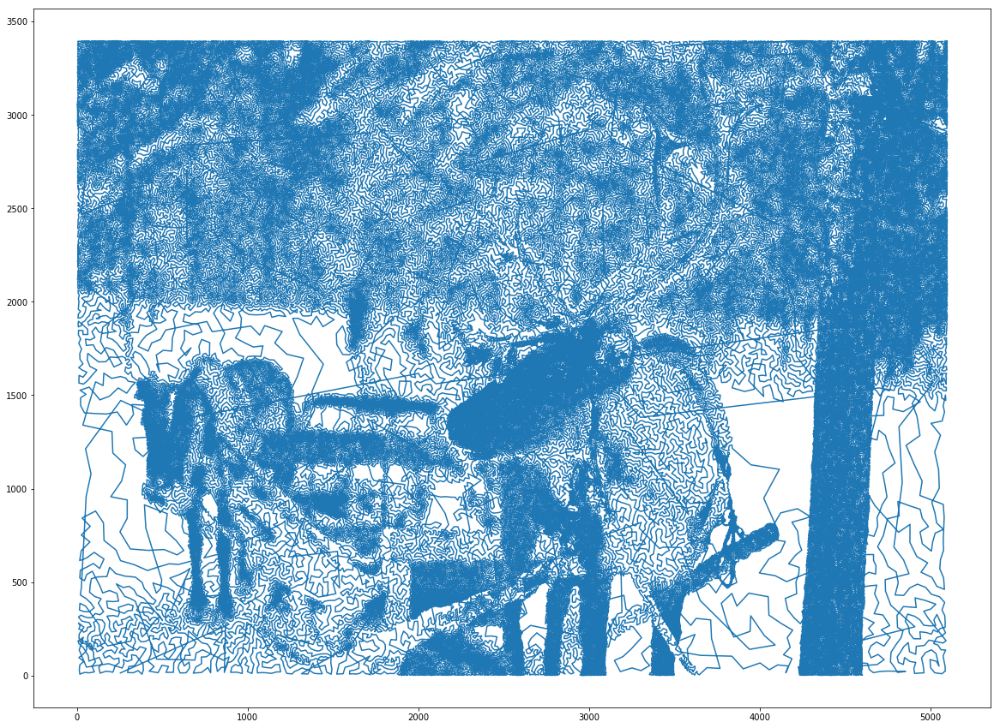

In [293]:
new_seq = sequence.merge(cities[['X', 'Y']], left_on='Path', right_index=True)
plt.figure(figsize=(20,15))
plt.plot(new_seq['X'], new_seq['Y'])

In [230]:
def calculate_total_distance(sequence_id):
    total_distance = 0
    count = 0
    for i in range(len(sequence_id)-1):
        start_id = sequence_id[i]
        next_id = sequence_id[i+1]
        x1 = np.asarray(cities[cities['CityId']==start_id]['X']).ravel()[0]
        y1 = np.asarray(cities[cities['CityId']==start_id]['Y']).ravel()[0]
        x2 = np.asarray(cities[cities['CityId']==next_id]['X']).ravel()[0]
        y2 = np.asarray(cities[cities['CityId']==next_id]['Y']).ravel()[0]
        dist = calculateDistance(x1,y1,x2,y2)
        prime_city = cities[cities['CityId']==start_id]['is_prime'].ravel()[0]
        if i%10 == 0 and prime_city == False:
            dist = dist*1.1
        else:
            dist = dist
        total_distance += dist
        count += 1
        if count%1000==0:
            print(count)        
    return total_distance

def calculateDistance(x1,y1,x2,y2):
    dist =np.sqrt((x2-x1)**2 + (y2-y1)**2)
    return dist

In [274]:
import random
import itertools
def shuffle_batch(batch_id, k):
    permutations = list(itertools.permutations(range(k)))
    permutations = np.asarray(permutations)
    
    start_coord_x = cities[cities['CityId']==selected_sequence[-1]]['X']
    start_coord_x = np.asarray(start_coord_x).ravel()
    start_coord_y = cities[cities['CityId']==selected_sequence[-1]]['Y']
    start_coord_y = np.asarray(start_coord_y).ravel()
    start_coord = [start_coord_x, start_coord_y]
    start_coord = np.asarray(start_coord).ravel()
    
    next_batch_coord_x = cities[cities['CityId']==initial_seq[len(updated_seq)+k+1]]['X']
    next_batch_coord_x = np.asarray(next_batch_coord_x).ravel()
    next_batch_coord_y = cities[cities['CityId']==initial_seq[len(updated_seq)+k+1]]['Y']
    next_batch_coord_y = np.asarray(next_batch_coord_y).ravel()
    next_batch_coord = [next_batch_coord_x, next_batch_coord_y]
    next_batch_coord = np.asarray(next_batch_coord).ravel()

    batch_coord = []
    for m in range(len(batch_id)):
        coord_x = cities[cities['CityId']==batch_id[m]]['X']
        coord_x = np.asarray(coord_x).ravel()
        coord_y = cities[cities['CityId']==batch_id[m]]['Y']
        coord_y = np.asarray(coord_y).ravel()
        coord = [coord_x, coord_y]
        coord = np.asarray(coord).ravel()
        batch_coord.append(coord)
    
    total_distance = []
    shuffled_sequence = []
    
    for perm in permutations:
        shuffled_sequence.append(perm)
        distances = []  
        dist_start = calculateDistance(start_coord[0], start_coord[1], batch_coord[perm[0]][0], batch_coord[perm[0]][1])
        dist_last = calculateDistance(batch_coord[perm[-1]][0], batch_coord[perm[-1]][1], next_batch_coord[0], next_batch_coord[1])
        distances.append(dist_start)
        distances.append(dist_last)

        for j in range(len(perm)-1):       
            dist = calculateDistance(batch_coord[perm[j]][0], batch_coord[perm[j]][1], batch_coord[perm[j+1]][0], batch_coord[perm[j+1]][1])
            distances.append(dist)
        total_distance.append(np.sum(distances))
        
    min_lenght = np.asarray(total_distance).min()  
    best_seq = np.asarray(shuffled_sequence)[np.argmin(total_distance)]
    
    city_id_seq = []
    for i in best_seq:
        city_id_match = batch_id[i]
        city_id_seq.append(city_id_match)
    
    return city_id_seq

In [301]:
initial_seq = sequence['Path']
k = 8
updated_seq = [0]
batch_total = int(len(initial_seq)/k)

for i in range(batch_total):
    start_num = len(updated_seq)
    remaining_id = len(np.asarray(initial_sequence[start_num:]))
    
    if remaining_id <= k:
        batch_id = np.asarray(initial_sequence[start_num:-1])
        k = remaining_id-1
    else:
        batch_id = np.asarray(initial_sequence[start_num:start_num+k])
        k = k
        
    batch_seq = shuffle_batch(batch_id, k)
    updated_seq.append(batch_seq)
    if remaining_id <= k:
        break
    print(len(updated_seq))

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339


6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978


8418
8419
8420
8421
8422
8423
8424
8425
8426
8427
8428
8429
8430
8431
8432
8433
8434
8435
8436
8437
8438
8439
8440
8441
8442
8443
8444
8445
8446
8447
8448
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617


10048
10049
10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10060
10061
10062
10063
10064
10065
10066
10067
10068
10069
10070
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
10096
10097
10098
10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
10165
10166
10167
10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
1021

11414
11415
11416
11417
11418
11419
11420
11421
11422
11423
11424
11425
11426
11427
11428
11429
11430
11431
11432
11433
11434
11435
11436
11437
11438
11439
11440
11441
11442
11443
11444
11445
11446
11447
11448
11449
11450
11451
11452
11453
11454
11455
11456
11457
11458
11459
11460
11461
11462
11463
11464
11465
11466
11467
11468
11469
11470
11471
11472
11473
11474
11475
11476
11477
11478
11479
11480
11481
11482
11483
11484
11485
11486
11487
11488
11489
11490
11491
11492
11493
11494
11495
11496
11497
11498
11499
11500
11501
11502
11503
11504
11505
11506
11507
11508
11509
11510
11511
11512
11513
11514
11515
11516
11517
11518
11519
11520
11521
11522
11523
11524
11525
11526
11527
11528
11529
11530
11531
11532
11533
11534
11535
11536
11537
11538
11539
11540
11541
11542
11543
11544
11545
11546
11547
11548
11549
11550
11551
11552
11553
11554
11555
11556
11557
11558
11559
11560
11561
11562
11563
11564
11565
11566
11567
11568
11569
11570
11571
11572
11573
11574
11575
11576
11577
11578
11579
1158

12780
12781
12782
12783
12784
12785
12786
12787
12788
12789
12790
12791
12792
12793
12794
12795
12796
12797
12798
12799
12800
12801
12802
12803
12804
12805
12806
12807
12808
12809
12810
12811
12812
12813
12814
12815
12816
12817
12818
12819
12820
12821
12822
12823
12824
12825
12826
12827
12828
12829
12830
12831
12832
12833
12834
12835
12836
12837
12838
12839
12840
12841
12842
12843
12844
12845
12846
12847
12848
12849
12850
12851
12852
12853
12854
12855
12856
12857
12858
12859
12860
12861
12862
12863
12864
12865
12866
12867
12868
12869
12870
12871
12872
12873
12874
12875
12876
12877
12878
12879
12880
12881
12882
12883
12884
12885
12886
12887
12888
12889
12890
12891
12892
12893
12894
12895
12896
12897
12898
12899
12900
12901
12902
12903
12904
12905
12906
12907
12908
12909
12910
12911
12912
12913
12914
12915
12916
12917
12918
12919
12920
12921
12922
12923
12924
12925
12926
12927
12928
12929
12930
12931
12932
12933
12934
12935
12936
12937
12938
12939
12940
12941
12942
12943
12944
12945
1294

14146
14147
14148
14149
14150
14151
14152
14153
14154
14155
14156
14157
14158
14159
14160
14161
14162
14163
14164
14165
14166
14167
14168
14169
14170
14171
14172
14173
14174
14175
14176
14177
14178
14179
14180
14181
14182
14183
14184
14185
14186
14187
14188
14189
14190
14191
14192
14193
14194
14195
14196
14197
14198
14199
14200
14201
14202
14203
14204
14205
14206
14207
14208
14209
14210
14211
14212
14213
14214
14215
14216
14217
14218
14219
14220
14221
14222
14223
14224
14225
14226
14227
14228
14229
14230
14231
14232
14233
14234
14235
14236
14237
14238
14239
14240
14241
14242
14243
14244
14245
14246
14247
14248
14249
14250
14251
14252
14253
14254
14255
14256
14257
14258
14259
14260
14261
14262
14263
14264
14265
14266
14267
14268
14269
14270
14271
14272
14273
14274
14275
14276
14277
14278
14279
14280
14281
14282
14283
14284
14285
14286
14287
14288
14289
14290
14291
14292
14293
14294
14295
14296
14297
14298
14299
14300
14301
14302
14303
14304
14305
14306
14307
14308
14309
14310
14311
1431

15512
15513
15514
15515
15516
15517
15518
15519
15520
15521
15522
15523
15524
15525
15526
15527
15528
15529
15530
15531
15532
15533
15534
15535
15536
15537
15538
15539
15540
15541
15542
15543
15544
15545
15546
15547
15548
15549
15550
15551
15552
15553
15554
15555
15556
15557
15558
15559
15560
15561
15562
15563
15564
15565
15566
15567
15568
15569
15570
15571
15572
15573
15574
15575
15576
15577
15578
15579
15580
15581
15582
15583
15584
15585
15586
15587
15588
15589
15590
15591
15592
15593
15594
15595
15596
15597
15598
15599
15600
15601
15602
15603
15604
15605
15606
15607
15608
15609
15610
15611
15612
15613
15614
15615
15616
15617
15618
15619
15620
15621
15622
15623
15624
15625
15626
15627
15628
15629
15630
15631
15632
15633
15634
15635
15636
15637
15638
15639
15640
15641
15642
15643
15644
15645
15646
15647
15648
15649
15650
15651
15652
15653
15654
15655
15656
15657
15658
15659
15660
15661
15662
15663
15664
15665
15666
15667
15668
15669
15670
15671
15672
15673
15674
15675
15676
15677
1567

16878
16879
16880
16881
16882
16883
16884
16885
16886
16887
16888
16889
16890
16891
16892
16893
16894
16895
16896
16897
16898
16899
16900
16901
16902
16903
16904
16905
16906
16907
16908
16909
16910
16911
16912
16913
16914
16915
16916
16917
16918
16919
16920
16921
16922
16923
16924
16925
16926
16927
16928
16929
16930
16931
16932
16933
16934
16935
16936
16937
16938
16939
16940
16941
16942
16943
16944
16945
16946
16947
16948
16949
16950
16951
16952
16953
16954
16955
16956
16957
16958
16959
16960
16961
16962
16963
16964
16965
16966
16967
16968
16969
16970
16971
16972
16973
16974
16975
16976
16977
16978
16979
16980
16981
16982
16983
16984
16985
16986
16987
16988
16989
16990
16991
16992
16993
16994
16995
16996
16997
16998
16999
17000
17001
17002
17003
17004
17005
17006
17007
17008
17009
17010
17011
17012
17013
17014
17015
17016
17017
17018
17019
17020
17021
17022
17023
17024
17025
17026
17027
17028
17029
17030
17031
17032
17033
17034
17035
17036
17037
17038
17039
17040
17041
17042
17043
1704

18244
18245
18246
18247
18248
18249
18250
18251
18252
18253
18254
18255
18256
18257
18258
18259
18260
18261
18262
18263
18264
18265
18266
18267
18268
18269
18270
18271
18272
18273
18274
18275
18276
18277
18278
18279
18280
18281
18282
18283
18284
18285
18286
18287
18288
18289
18290
18291
18292
18293
18294
18295
18296
18297
18298
18299
18300
18301
18302
18303
18304
18305
18306
18307
18308
18309
18310
18311
18312
18313
18314
18315
18316
18317
18318
18319
18320
18321
18322
18323
18324
18325
18326
18327
18328
18329
18330
18331
18332
18333
18334
18335
18336
18337
18338
18339
18340
18341
18342
18343
18344
18345
18346
18347
18348
18349
18350
18351
18352
18353
18354
18355
18356
18357
18358
18359
18360
18361
18362
18363
18364
18365
18366
18367
18368
18369
18370
18371
18372
18373
18374
18375
18376
18377
18378
18379
18380
18381
18382
18383
18384
18385
18386
18387
18388
18389
18390
18391
18392
18393
18394
18395
18396
18397
18398
18399
18400
18401
18402
18403
18404
18405
18406
18407
18408
18409
1841

19610
19611
19612
19613
19614
19615
19616
19617
19618
19619
19620
19621
19622
19623
19624
19625
19626
19627
19628
19629
19630
19631
19632
19633
19634
19635
19636
19637
19638
19639
19640
19641
19642
19643
19644
19645
19646
19647
19648
19649
19650
19651
19652
19653
19654
19655
19656
19657
19658
19659
19660
19661
19662
19663
19664
19665
19666
19667
19668
19669
19670
19671
19672
19673
19674
19675
19676
19677
19678
19679
19680
19681
19682
19683
19684
19685
19686
19687
19688
19689
19690
19691
19692
19693
19694
19695
19696
19697
19698
19699
19700
19701
19702
19703
19704
19705
19706
19707
19708
19709
19710
19711
19712
19713
19714
19715
19716
19717
19718
19719
19720
19721
19722
19723
19724
19725
19726
19727
19728
19729
19730
19731
19732
19733
19734
19735
19736
19737
19738
19739
19740
19741
19742
19743
19744
19745
19746
19747
19748
19749
19750
19751
19752
19753
19754
19755
19756
19757
19758
19759
19760
19761
19762
19763
19764
19765
19766
19767
19768
19769
19770
19771
19772
19773
19774
19775
1977

20976
20977
20978
20979
20980
20981
20982
20983
20984
20985
20986
20987
20988
20989
20990
20991
20992
20993
20994
20995
20996
20997
20998
20999
21000
21001
21002
21003
21004
21005
21006
21007
21008
21009
21010
21011
21012
21013
21014
21015
21016
21017
21018
21019
21020
21021
21022
21023
21024
21025
21026
21027
21028
21029
21030
21031
21032
21033
21034
21035
21036
21037
21038
21039
21040
21041
21042
21043
21044
21045
21046
21047
21048
21049
21050
21051
21052
21053
21054
21055
21056
21057
21058
21059
21060
21061
21062
21063
21064
21065
21066
21067
21068
21069
21070
21071
21072
21073
21074
21075
21076
21077
21078
21079
21080
21081
21082
21083
21084
21085
21086
21087
21088
21089
21090
21091
21092
21093
21094
21095
21096
21097
21098
21099
21100
21101
21102
21103
21104
21105
21106
21107
21108
21109
21110
21111
21112
21113
21114
21115
21116
21117
21118
21119
21120
21121
21122
21123
21124
21125
21126
21127
21128
21129
21130
21131
21132
21133
21134
21135
21136
21137
21138
21139
21140
21141
2114

22342
22343
22344
22345
22346
22347
22348
22349
22350
22351
22352
22353
22354
22355
22356
22357
22358
22359
22360
22361
22362
22363
22364
22365
22366
22367
22368
22369
22370
22371
22372
22373
22374
22375
22376
22377
22378
22379
22380
22381
22382
22383
22384
22385
22386
22387
22388
22389
22390
22391
22392
22393
22394
22395
22396
22397
22398
22399
22400
22401
22402
22403
22404
22405
22406
22407
22408
22409
22410
22411
22412
22413
22414
22415
22416
22417
22418
22419
22420
22421
22422
22423
22424
22425
22426
22427
22428
22429
22430
22431
22432
22433
22434
22435
22436
22437
22438
22439
22440
22441
22442
22443
22444
22445
22446
22447
22448
22449
22450
22451
22452
22453
22454
22455
22456
22457
22458
22459
22460
22461
22462
22463
22464
22465
22466
22467
22468
22469
22470
22471
22472
22473
22474
22475
22476
22477
22478
22479
22480
22481
22482
22483
22484
22485
22486
22487
22488
22489
22490
22491
22492
22493
22494
22495
22496
22497
22498
22499
22500
22501
22502
22503
22504
22505
22506
22507
2250

23708
23709
23710
23711
23712
23713
23714
23715
23716
23717
23718
23719
23720
23721
23722
23723
23724
23725
23726
23727
23728
23729
23730
23731
23732
23733
23734
23735
23736
23737
23738
23739
23740
23741
23742
23743
23744
23745
23746
23747
23748
23749
23750
23751
23752
23753
23754
23755
23756
23757
23758
23759
23760
23761
23762
23763
23764
23765
23766
23767
23768
23769
23770
23771
23772
23773
23774
23775
23776
23777
23778
23779
23780
23781
23782
23783
23784
23785
23786
23787
23788
23789
23790
23791
23792
23793
23794
23795
23796
23797
23798
23799
23800
23801
23802
23803
23804
23805
23806
23807
23808
23809
23810
23811
23812
23813
23814
23815
23816
23817
23818
23819
23820
23821
23822
23823
23824
23825
23826
23827
23828
23829
23830
23831
23832
23833
23834
23835
23836
23837
23838
23839
23840
23841
23842
23843
23844
23845
23846
23847
23848
23849
23850
23851
23852
23853
23854
23855
23856
23857
23858
23859
23860
23861
23862
23863
23864
23865
23866
23867
23868
23869
23870
23871
23872
23873
2387

In [302]:
updated_seq1 = updated_seq[1:]
updated_seq1 = np.asarray(updated_seq1).ravel()
updated_seq1 = np.append(updated_seq1, 0)
updated_seq1 = np.insert(updated_seq1, 0, 0)
total_distance = calculate_total_distance(updated_seq1)
print(total_distance)

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000
136000
137000
138000
139000
140000
141000
142000
143000
144000
145000
146000
147000
148000
149000
150000
151000
152000
153000
154000
155000
156000
157000
158000
15

In [303]:
initial_seq = updated_seq1
start_seq = updated_seq1[:4]
updated_seq = [start_seq]
batch_total = int(len(initial_seq)/k)

for i in range(batch_total):
    start_num = len(updated_seq)
    remaining_id = len(np.asarray(initial_sequence[start_num:]))
    
    if remaining_id <= k:
        batch_id = np.asarray(initial_sequence[start_num:-1])
        k = remaining_id-1
    else:
        batch_id = np.asarray(initial_sequence[start_num:start_num+k])
        k = k
        
    batch_seq = shuffle_batch(batch_id, k)
    updated_seq.append(batch_seq)
    if remaining_id <= k:
        break
    print(len(updated_seq))

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339


6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978


KeyboardInterrupt: 

In [ ]:
updated_seq2 = updated_seq[4:]
updated_seq2 = np.asarray(updated_seq2).ravel()
updated_seq2 = np.append(updated_seq2, 0)
updated_seq2 = np.insert(updated_seq2, [:4] updated_seq[:4])

In [ ]:
total_distance1 = calculate_total_distance(updated_seq2)
print(total_distance1)

In [58]:
selected_sequence = np.asarray(selected_sequence).ravel()
selected_sequence = np.append(selected_sequence, 0)
total_distance = calculate_total_distance(selected_sequence)
print(total_distance)

KeyError: 0

In [15]:
initial_sequence = sequence['Path']
len(initial_sequence)

197770

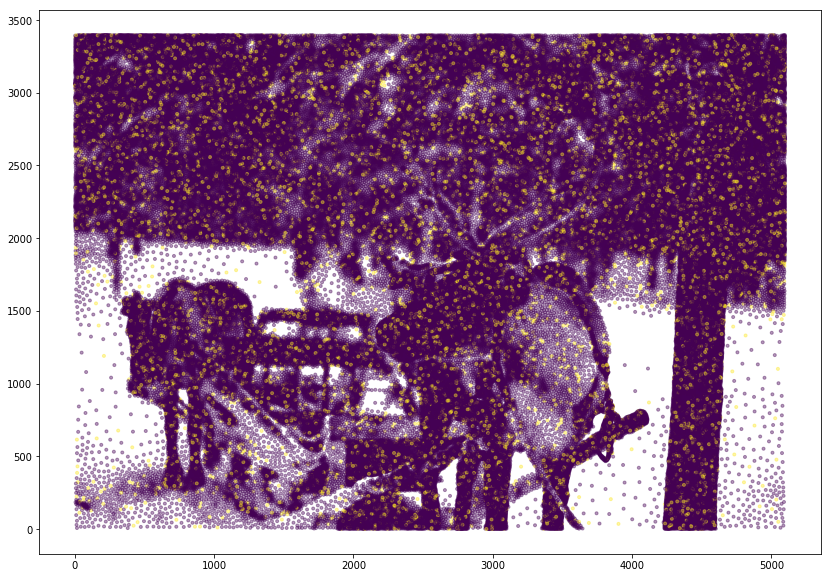

In [19]:
fig = plt.figure(figsize=(14,10))
plt.scatter(cities.X, cities.Y, c=cities['is_prime'], marker=".", alpha=0.4)

In [304]:
import random
import itertools

def generate_cluster(cities, i, num_cluster):
    cluster = cities[cities['main_area']==i]
    cluster_coord = cluster[['X','Y']]
    kmeans = KMeans(n_clusters= num_cluster)
    kmeans.fit_transform(cluster_coord)
    cluster['cluster'] = kmeans.labels_
    center = kmeans.cluster_centers_
    return cluster[['CityId','cluster']], np.asarray(center)

def generate_random_num(num, low, high):
    random_numbers = []
    for i in range(num):
        random_numbers.append(random.randint(low,high))
    return np.asarray(random_numbers).reshape(num,1)

def calculateDistance(x1,y1,x2,y2):
    dist =np.sqrt((x2-x1)**2 + (y2-y1)**2)
    return dist

def calculate_total_distance(sequence_id):
    total_distance = 0
    count = 0
    for i in range(len(sequence_id)-1):
        start_id = sequence_id[i]
        next_id = sequence_id[i+1]
        x1 = np.asarray(cities[cities['CityId']==start_id]['X']).ravel()[0]
        y1 = np.asarray(cities[cities['CityId']==start_id]['Y']).ravel()[0]
        x2 = np.asarray(cities[cities['CityId']==next_id]['X']).ravel()[0]
        y2 = np.asarray(cities[cities['CityId']==next_id]['Y']).ravel()[0]
        dist = calculateDistance(x1,y1,x2,y2)
        prime_city = cities[cities['CityId']==start_id]['is_prime'].ravel()[0]
        if i%10 == 0 and prime_city == False:
            dist = dist*1.1
        else:
            dist = dist
        total_distance += dist
        count += 1
        if count%1000==0:
            print(count)        
    return total_distance

def shortest_center_path(data, k, next_area):
    total_dist = []
    sequence = []
    permutations = list(itertools.permutations(range(k)))
    permutations = np.asarray(permutations)
    
    for perm in permutations:
        distances = []
        start_id = sequence[-1]
        end_id = random.choice()
        perm = np.insert(perm, start_id, 0)
        perm = np.append(perm, end_id)
        sequence.append(perm)
        
        for i in range(len(perm)-1):
            dist = calculateDistance(data[perm[i]][0], data[perm[i]][1], data[perm[i+1]][0], data[perm[i+1]][1])
            distances.append(dist)
        total_dist.append(np.sum(distances))
    min_lenght = np.asarray(total_dist).min()  
    best_seq = np.asarray(sequence)[np.argmin(total_dist)]
    return min_lenght, best_seq

def generate_area_center(coordinates):
    centers = []
    for coord in coordinates:
        x = (coord[0]+coord[2])/2
        y = (coord[1]+coord[3])/2
        area_center = [x, y]
        centers.append(np.asarray(area_center).ravel())
    return np.asarray(centers)

In [211]:
a = 20
b = 20

w = np.linspace(0, 5100, a+1)
h = np.linspace(0, 3400, b+1)

coordinates = []
for i in w:
    pair_coord = []
    for j in h:
        pair = [i,j]
        pair_coord.append(pair)
    coordinates.append(pair_coord)
    
coordinates = np.asarray(coordinates).ravel()
coordinates = coordinates.reshape(((a+1)*(b+1)),2)

In [212]:
area_coord = []
area_num = []
count = 0
w_delta = w[1]-w[0]
h_delta = h[1]-h[0]
for i in coordinates:
    lower_bound = i
    upper_bound = [i[0]+w_delta, i[1]+h_delta]
    
    if upper_bound[0] <= 5100 and upper_bound[1] <= 3400:
        coord = [lower_bound, upper_bound]
        area_coord.append(np.asarray(coord).ravel())
        area_num.append(count)
        count +=1
area_coord = np.asarray(area_coord)
area_num = np.asarray(area_num)
print(count)

400


In [27]:
main_area = []
main_coord = []
for city_id in cities['CityId']:
    x = np.asarray(cities[cities['CityId']==city_id]['X']).ravel()[0]
    y = np.asarray(cities[cities['CityId']==city_id]['Y']).ravel()[0]
        
    for i in range(len(area_num)):    
        if x >= area_coord[i][0] and x <= area_coord[i][2] and y >= area_coord[i][1] and y <= area_coord[i][3]:
            main_area.append(area_num[i])
            main_coord.append(area_coord[i])
        continue
    print('City_Id: ', city_id)
    print('Area_total: ', len(main_area))
            
main_area = np.asarray(main_area).ravel()
main_coord = np.asarray(main_coord).ravel()   
main_coord = main_coord.reshape(197769,4)
cities['main_area'] = main_area

City_Id:  0
Area_total:  1
City_Id:  1
Area_total:  2
City_Id:  2
Area_total:  3
City_Id:  3
Area_total:  4
City_Id:  4
Area_total:  5
City_Id:  5
Area_total:  6
City_Id:  6
Area_total:  7
City_Id:  7
Area_total:  8
City_Id:  8
Area_total:  9
City_Id:  9
Area_total:  10
City_Id:  10
Area_total:  11
City_Id:  11
Area_total:  12
City_Id:  12
Area_total:  13
City_Id:  13
Area_total:  14
City_Id:  14
Area_total:  15
City_Id:  15
Area_total:  16
City_Id:  16
Area_total:  17
City_Id:  17
Area_total:  18
City_Id:  18
Area_total:  19
City_Id:  19
Area_total:  20
City_Id:  20
Area_total:  21
City_Id:  21
Area_total:  22
City_Id:  22
Area_total:  23
City_Id:  23
Area_total:  24
City_Id:  24
Area_total:  25
City_Id:  25
Area_total:  26
City_Id:  26
Area_total:  27
City_Id:  27
Area_total:  28
City_Id:  28
Area_total:  29
City_Id:  29
Area_total:  30
City_Id:  30
Area_total:  31
City_Id:  31
Area_total:  32
City_Id:  32
Area_total:  33
City_Id:  33
Area_total:  34
City_Id:  34
Area_total:  35
City

City_Id:  307
Area_total:  308
City_Id:  308
Area_total:  309
City_Id:  309
Area_total:  310
City_Id:  310
Area_total:  311
City_Id:  311
Area_total:  312
City_Id:  312
Area_total:  313
City_Id:  313
Area_total:  314
City_Id:  314
Area_total:  315
City_Id:  315
Area_total:  316
City_Id:  316
Area_total:  317
City_Id:  317
Area_total:  318
City_Id:  318
Area_total:  319
City_Id:  319
Area_total:  320
City_Id:  320
Area_total:  321
City_Id:  321
Area_total:  322
City_Id:  322
Area_total:  323
City_Id:  323
Area_total:  324
City_Id:  324
Area_total:  325
City_Id:  325
Area_total:  326
City_Id:  326
Area_total:  327
City_Id:  327
Area_total:  328
City_Id:  328
Area_total:  329
City_Id:  329
Area_total:  330
City_Id:  330
Area_total:  331
City_Id:  331
Area_total:  332
City_Id:  332
Area_total:  333
City_Id:  333
Area_total:  334
City_Id:  334
Area_total:  335
City_Id:  335
Area_total:  336
City_Id:  336
Area_total:  337
City_Id:  337
Area_total:  338
City_Id:  338
Area_total:  339
City_Id:

City_Id:  595
Area_total:  596
City_Id:  596
Area_total:  597
City_Id:  597
Area_total:  598
City_Id:  598
Area_total:  599
City_Id:  599
Area_total:  600
City_Id:  600
Area_total:  601
City_Id:  601
Area_total:  602
City_Id:  602
Area_total:  603
City_Id:  603
Area_total:  604
City_Id:  604
Area_total:  605
City_Id:  605
Area_total:  606
City_Id:  606
Area_total:  607
City_Id:  607
Area_total:  608
City_Id:  608
Area_total:  609
City_Id:  609
Area_total:  610
City_Id:  610
Area_total:  611
City_Id:  611
Area_total:  612
City_Id:  612
Area_total:  613
City_Id:  613
Area_total:  614
City_Id:  614
Area_total:  615
City_Id:  615
Area_total:  616
City_Id:  616
Area_total:  617
City_Id:  617
Area_total:  618
City_Id:  618
Area_total:  619
City_Id:  619
Area_total:  620
City_Id:  620
Area_total:  621
City_Id:  621
Area_total:  622
City_Id:  622
Area_total:  623
City_Id:  623
Area_total:  624
City_Id:  624
Area_total:  625
City_Id:  625
Area_total:  626
City_Id:  626
Area_total:  627
City_Id:

City_Id:  924
Area_total:  925
City_Id:  925
Area_total:  926
City_Id:  926
Area_total:  927
City_Id:  927
Area_total:  928
City_Id:  928
Area_total:  929
City_Id:  929
Area_total:  930
City_Id:  930
Area_total:  931
City_Id:  931
Area_total:  932
City_Id:  932
Area_total:  933
City_Id:  933
Area_total:  934
City_Id:  934
Area_total:  935
City_Id:  935
Area_total:  936
City_Id:  936
Area_total:  937
City_Id:  937
Area_total:  938
City_Id:  938
Area_total:  939
City_Id:  939
Area_total:  940
City_Id:  940
Area_total:  941
City_Id:  941
Area_total:  942
City_Id:  942
Area_total:  943
City_Id:  943
Area_total:  944
City_Id:  944
Area_total:  945
City_Id:  945
Area_total:  946
City_Id:  946
Area_total:  947
City_Id:  947
Area_total:  948
City_Id:  948
Area_total:  949
City_Id:  949
Area_total:  950
City_Id:  950
Area_total:  951
City_Id:  951
Area_total:  952
City_Id:  952
Area_total:  953
City_Id:  953
Area_total:  954
City_Id:  954
Area_total:  955
City_Id:  955
Area_total:  956
City_Id:

City_Id:  1242
Area_total:  1243
City_Id:  1243
Area_total:  1244
City_Id:  1244
Area_total:  1245
City_Id:  1245
Area_total:  1246
City_Id:  1246
Area_total:  1247
City_Id:  1247
Area_total:  1248
City_Id:  1248
Area_total:  1249
City_Id:  1249
Area_total:  1250
City_Id:  1250
Area_total:  1251
City_Id:  1251
Area_total:  1252
City_Id:  1252
Area_total:  1253
City_Id:  1253
Area_total:  1254
City_Id:  1254
Area_total:  1255
City_Id:  1255
Area_total:  1256
City_Id:  1256
Area_total:  1257
City_Id:  1257
Area_total:  1258
City_Id:  1258
Area_total:  1259
City_Id:  1259
Area_total:  1260
City_Id:  1260
Area_total:  1261
City_Id:  1261
Area_total:  1262
City_Id:  1262
Area_total:  1263
City_Id:  1263
Area_total:  1264
City_Id:  1264
Area_total:  1265
City_Id:  1265
Area_total:  1266
City_Id:  1266
Area_total:  1267
City_Id:  1267
Area_total:  1268
City_Id:  1268
Area_total:  1269
City_Id:  1269
Area_total:  1270
City_Id:  1270
Area_total:  1271
City_Id:  1271
Area_total:  1272
City_Id:  

City_Id:  1535
Area_total:  1536
City_Id:  1536
Area_total:  1537
City_Id:  1537
Area_total:  1538
City_Id:  1538
Area_total:  1539
City_Id:  1539
Area_total:  1540
City_Id:  1540
Area_total:  1541
City_Id:  1541
Area_total:  1542
City_Id:  1542
Area_total:  1543
City_Id:  1543
Area_total:  1544
City_Id:  1544
Area_total:  1545
City_Id:  1545
Area_total:  1546
City_Id:  1546
Area_total:  1547
City_Id:  1547
Area_total:  1548
City_Id:  1548
Area_total:  1549
City_Id:  1549
Area_total:  1550
City_Id:  1550
Area_total:  1551
City_Id:  1551
Area_total:  1552
City_Id:  1552
Area_total:  1553
City_Id:  1553
Area_total:  1554
City_Id:  1554
Area_total:  1555
City_Id:  1555
Area_total:  1556
City_Id:  1556
Area_total:  1557
City_Id:  1557
Area_total:  1558
City_Id:  1558
Area_total:  1559
City_Id:  1559
Area_total:  1560
City_Id:  1560
Area_total:  1561
City_Id:  1561
Area_total:  1562
City_Id:  1562
Area_total:  1563
City_Id:  1563
Area_total:  1564
City_Id:  1564
Area_total:  1565
City_Id:  

City_Id:  1842
Area_total:  1843
City_Id:  1843
Area_total:  1844
City_Id:  1844
Area_total:  1845
City_Id:  1845
Area_total:  1846
City_Id:  1846
Area_total:  1847
City_Id:  1847
Area_total:  1848
City_Id:  1848
Area_total:  1849
City_Id:  1849
Area_total:  1850
City_Id:  1850
Area_total:  1851
City_Id:  1851
Area_total:  1852
City_Id:  1852
Area_total:  1853
City_Id:  1853
Area_total:  1854
City_Id:  1854
Area_total:  1855
City_Id:  1855
Area_total:  1856
City_Id:  1856
Area_total:  1857
City_Id:  1857
Area_total:  1858
City_Id:  1858
Area_total:  1859
City_Id:  1859
Area_total:  1860
City_Id:  1860
Area_total:  1861
City_Id:  1861
Area_total:  1862
City_Id:  1862
Area_total:  1863
City_Id:  1863
Area_total:  1864
City_Id:  1864
Area_total:  1865
City_Id:  1865
Area_total:  1866
City_Id:  1866
Area_total:  1867
City_Id:  1867
Area_total:  1868
City_Id:  1868
Area_total:  1869
City_Id:  1869
Area_total:  1870
City_Id:  1870
Area_total:  1871
City_Id:  1871
Area_total:  1872
City_Id:  

City_Id:  2126
Area_total:  2127
City_Id:  2127
Area_total:  2128
City_Id:  2128
Area_total:  2129
City_Id:  2129
Area_total:  2130
City_Id:  2130
Area_total:  2131
City_Id:  2131
Area_total:  2132
City_Id:  2132
Area_total:  2133
City_Id:  2133
Area_total:  2134
City_Id:  2134
Area_total:  2135
City_Id:  2135
Area_total:  2136
City_Id:  2136
Area_total:  2137
City_Id:  2137
Area_total:  2138
City_Id:  2138
Area_total:  2139
City_Id:  2139
Area_total:  2140
City_Id:  2140
Area_total:  2141
City_Id:  2141
Area_total:  2142
City_Id:  2142
Area_total:  2143
City_Id:  2143
Area_total:  2144
City_Id:  2144
Area_total:  2145
City_Id:  2145
Area_total:  2146
City_Id:  2146
Area_total:  2147
City_Id:  2147
Area_total:  2148
City_Id:  2148
Area_total:  2149
City_Id:  2149
Area_total:  2150
City_Id:  2150
Area_total:  2151
City_Id:  2151
Area_total:  2152
City_Id:  2152
Area_total:  2153
City_Id:  2153
Area_total:  2154
City_Id:  2154
Area_total:  2155
City_Id:  2155
Area_total:  2156
City_Id:  

City_Id:  2409
Area_total:  2410
City_Id:  2410
Area_total:  2411
City_Id:  2411
Area_total:  2412
City_Id:  2412
Area_total:  2413
City_Id:  2413
Area_total:  2414
City_Id:  2414
Area_total:  2415
City_Id:  2415
Area_total:  2416
City_Id:  2416
Area_total:  2417
City_Id:  2417
Area_total:  2418
City_Id:  2418
Area_total:  2419
City_Id:  2419
Area_total:  2420
City_Id:  2420
Area_total:  2421
City_Id:  2421
Area_total:  2422
City_Id:  2422
Area_total:  2423
City_Id:  2423
Area_total:  2424
City_Id:  2424
Area_total:  2425
City_Id:  2425
Area_total:  2426
City_Id:  2426
Area_total:  2427
City_Id:  2427
Area_total:  2428
City_Id:  2428
Area_total:  2429
City_Id:  2429
Area_total:  2430
City_Id:  2430
Area_total:  2431
City_Id:  2431
Area_total:  2432
City_Id:  2432
Area_total:  2433
City_Id:  2433
Area_total:  2434
City_Id:  2434
Area_total:  2435
City_Id:  2435
Area_total:  2436
City_Id:  2436
Area_total:  2437
City_Id:  2437
Area_total:  2438
City_Id:  2438
Area_total:  2439
City_Id:  

City_Id:  2684
Area_total:  2685
City_Id:  2685
Area_total:  2686
City_Id:  2686
Area_total:  2687
City_Id:  2687
Area_total:  2688
City_Id:  2688
Area_total:  2689
City_Id:  2689
Area_total:  2690
City_Id:  2690
Area_total:  2691
City_Id:  2691
Area_total:  2692
City_Id:  2692
Area_total:  2693
City_Id:  2693
Area_total:  2694
City_Id:  2694
Area_total:  2695
City_Id:  2695
Area_total:  2696
City_Id:  2696
Area_total:  2697
City_Id:  2697
Area_total:  2698
City_Id:  2698
Area_total:  2699
City_Id:  2699
Area_total:  2700
City_Id:  2700
Area_total:  2701
City_Id:  2701
Area_total:  2702
City_Id:  2702
Area_total:  2703
City_Id:  2703
Area_total:  2704
City_Id:  2704
Area_total:  2705
City_Id:  2705
Area_total:  2706
City_Id:  2706
Area_total:  2707
City_Id:  2707
Area_total:  2708
City_Id:  2708
Area_total:  2709
City_Id:  2709
Area_total:  2710
City_Id:  2710
Area_total:  2711
City_Id:  2711
Area_total:  2712
City_Id:  2712
Area_total:  2713
City_Id:  2713
Area_total:  2714
City_Id:  

City_Id:  2984
Area_total:  2985
City_Id:  2985
Area_total:  2986
City_Id:  2986
Area_total:  2987
City_Id:  2987
Area_total:  2988
City_Id:  2988
Area_total:  2989
City_Id:  2989
Area_total:  2990
City_Id:  2990
Area_total:  2991
City_Id:  2991
Area_total:  2992
City_Id:  2992
Area_total:  2993
City_Id:  2993
Area_total:  2994
City_Id:  2994
Area_total:  2995
City_Id:  2995
Area_total:  2996
City_Id:  2996
Area_total:  2997
City_Id:  2997
Area_total:  2998
City_Id:  2998
Area_total:  2999
City_Id:  2999
Area_total:  3000
City_Id:  3000
Area_total:  3001
City_Id:  3001
Area_total:  3002
City_Id:  3002
Area_total:  3003
City_Id:  3003
Area_total:  3004
City_Id:  3004
Area_total:  3005
City_Id:  3005
Area_total:  3006
City_Id:  3006
Area_total:  3007
City_Id:  3007
Area_total:  3008
City_Id:  3008
Area_total:  3009
City_Id:  3009
Area_total:  3010
City_Id:  3010
Area_total:  3011
City_Id:  3011
Area_total:  3012
City_Id:  3012
Area_total:  3013
City_Id:  3013
Area_total:  3014
City_Id:  

City_Id:  3282
Area_total:  3283
City_Id:  3283
Area_total:  3284
City_Id:  3284
Area_total:  3285
City_Id:  3285
Area_total:  3286
City_Id:  3286
Area_total:  3287
City_Id:  3287
Area_total:  3288
City_Id:  3288
Area_total:  3289
City_Id:  3289
Area_total:  3290
City_Id:  3290
Area_total:  3291
City_Id:  3291
Area_total:  3292
City_Id:  3292
Area_total:  3293
City_Id:  3293
Area_total:  3294
City_Id:  3294
Area_total:  3295
City_Id:  3295
Area_total:  3296
City_Id:  3296
Area_total:  3297
City_Id:  3297
Area_total:  3298
City_Id:  3298
Area_total:  3299
City_Id:  3299
Area_total:  3300
City_Id:  3300
Area_total:  3301
City_Id:  3301
Area_total:  3302
City_Id:  3302
Area_total:  3303
City_Id:  3303
Area_total:  3304
City_Id:  3304
Area_total:  3305
City_Id:  3305
Area_total:  3306
City_Id:  3306
Area_total:  3307
City_Id:  3307
Area_total:  3308
City_Id:  3308
Area_total:  3309
City_Id:  3309
Area_total:  3310
City_Id:  3310
Area_total:  3311
City_Id:  3311
Area_total:  3312
City_Id:  

City_Id:  3578
Area_total:  3579
City_Id:  3579
Area_total:  3580
City_Id:  3580
Area_total:  3581
City_Id:  3581
Area_total:  3582
City_Id:  3582
Area_total:  3583
City_Id:  3583
Area_total:  3584
City_Id:  3584
Area_total:  3585
City_Id:  3585
Area_total:  3586
City_Id:  3586
Area_total:  3587
City_Id:  3587
Area_total:  3588
City_Id:  3588
Area_total:  3589
City_Id:  3589
Area_total:  3590
City_Id:  3590
Area_total:  3591
City_Id:  3591
Area_total:  3592
City_Id:  3592
Area_total:  3593
City_Id:  3593
Area_total:  3594
City_Id:  3594
Area_total:  3595
City_Id:  3595
Area_total:  3596
City_Id:  3596
Area_total:  3597
City_Id:  3597
Area_total:  3598
City_Id:  3598
Area_total:  3599
City_Id:  3599
Area_total:  3600
City_Id:  3600
Area_total:  3601
City_Id:  3601
Area_total:  3602
City_Id:  3602
Area_total:  3603
City_Id:  3603
Area_total:  3604
City_Id:  3604
Area_total:  3605
City_Id:  3605
Area_total:  3606
City_Id:  3606
Area_total:  3607
City_Id:  3607
Area_total:  3608
City_Id:  

City_Id:  3887
Area_total:  3888
City_Id:  3888
Area_total:  3889
City_Id:  3889
Area_total:  3890
City_Id:  3890
Area_total:  3891
City_Id:  3891
Area_total:  3892
City_Id:  3892
Area_total:  3893
City_Id:  3893
Area_total:  3894
City_Id:  3894
Area_total:  3895
City_Id:  3895
Area_total:  3896
City_Id:  3896
Area_total:  3897
City_Id:  3897
Area_total:  3898
City_Id:  3898
Area_total:  3899
City_Id:  3899
Area_total:  3900
City_Id:  3900
Area_total:  3901
City_Id:  3901
Area_total:  3902
City_Id:  3902
Area_total:  3903
City_Id:  3903
Area_total:  3904
City_Id:  3904
Area_total:  3905
City_Id:  3905
Area_total:  3906
City_Id:  3906
Area_total:  3907
City_Id:  3907
Area_total:  3908
City_Id:  3908
Area_total:  3909
City_Id:  3909
Area_total:  3910
City_Id:  3910
Area_total:  3911
City_Id:  3911
Area_total:  3912
City_Id:  3912
Area_total:  3913
City_Id:  3913
Area_total:  3914
City_Id:  3914
Area_total:  3915
City_Id:  3915
Area_total:  3916
City_Id:  3916
Area_total:  3917
City_Id:  

City_Id:  4144
Area_total:  4145
City_Id:  4145
Area_total:  4146
City_Id:  4146
Area_total:  4147
City_Id:  4147
Area_total:  4148
City_Id:  4148
Area_total:  4149
City_Id:  4149
Area_total:  4150
City_Id:  4150
Area_total:  4151
City_Id:  4151
Area_total:  4152
City_Id:  4152
Area_total:  4153
City_Id:  4153
Area_total:  4154
City_Id:  4154
Area_total:  4155
City_Id:  4155
Area_total:  4156
City_Id:  4156
Area_total:  4157
City_Id:  4157
Area_total:  4158
City_Id:  4158
Area_total:  4159
City_Id:  4159
Area_total:  4160
City_Id:  4160
Area_total:  4161
City_Id:  4161
Area_total:  4162
City_Id:  4162
Area_total:  4163
City_Id:  4163
Area_total:  4164
City_Id:  4164
Area_total:  4165
City_Id:  4165
Area_total:  4166
City_Id:  4166
Area_total:  4167
City_Id:  4167
Area_total:  4168
City_Id:  4168
Area_total:  4169
City_Id:  4169
Area_total:  4170
City_Id:  4170
Area_total:  4171
City_Id:  4171
Area_total:  4172
City_Id:  4172
Area_total:  4173
City_Id:  4173
Area_total:  4174
City_Id:  

City_Id:  4395
Area_total:  4396
City_Id:  4396
Area_total:  4397
City_Id:  4397
Area_total:  4398
City_Id:  4398
Area_total:  4399
City_Id:  4399
Area_total:  4400
City_Id:  4400
Area_total:  4401
City_Id:  4401
Area_total:  4402
City_Id:  4402
Area_total:  4403
City_Id:  4403
Area_total:  4404
City_Id:  4404
Area_total:  4405
City_Id:  4405
Area_total:  4406
City_Id:  4406
Area_total:  4407
City_Id:  4407
Area_total:  4408
City_Id:  4408
Area_total:  4409
City_Id:  4409
Area_total:  4410
City_Id:  4410
Area_total:  4411
City_Id:  4411
Area_total:  4412
City_Id:  4412
Area_total:  4413
City_Id:  4413
Area_total:  4414
City_Id:  4414
Area_total:  4415
City_Id:  4415
Area_total:  4416
City_Id:  4416
Area_total:  4417
City_Id:  4417
Area_total:  4418
City_Id:  4418
Area_total:  4419
City_Id:  4419
Area_total:  4420
City_Id:  4420
Area_total:  4421
City_Id:  4421
Area_total:  4422
City_Id:  4422
Area_total:  4423
City_Id:  4423
Area_total:  4424
City_Id:  4424
Area_total:  4425
City_Id:  

City_Id:  4646
Area_total:  4647
City_Id:  4647
Area_total:  4648
City_Id:  4648
Area_total:  4649
City_Id:  4649
Area_total:  4650
City_Id:  4650
Area_total:  4651
City_Id:  4651
Area_total:  4652
City_Id:  4652
Area_total:  4653
City_Id:  4653
Area_total:  4654
City_Id:  4654
Area_total:  4655
City_Id:  4655
Area_total:  4656
City_Id:  4656
Area_total:  4657
City_Id:  4657
Area_total:  4658
City_Id:  4658
Area_total:  4659
City_Id:  4659
Area_total:  4660
City_Id:  4660
Area_total:  4661
City_Id:  4661
Area_total:  4662
City_Id:  4662
Area_total:  4663
City_Id:  4663
Area_total:  4664
City_Id:  4664
Area_total:  4665
City_Id:  4665
Area_total:  4666
City_Id:  4666
Area_total:  4667
City_Id:  4667
Area_total:  4668
City_Id:  4668
Area_total:  4669
City_Id:  4669
Area_total:  4670
City_Id:  4670
Area_total:  4671
City_Id:  4671
Area_total:  4672
City_Id:  4672
Area_total:  4673
City_Id:  4673
Area_total:  4674
City_Id:  4674
Area_total:  4675
City_Id:  4675
Area_total:  4676
City_Id:  

City_Id:  4935
Area_total:  4936
City_Id:  4936
Area_total:  4937
City_Id:  4937
Area_total:  4938
City_Id:  4938
Area_total:  4939
City_Id:  4939
Area_total:  4940
City_Id:  4940
Area_total:  4941
City_Id:  4941
Area_total:  4942
City_Id:  4942
Area_total:  4943
City_Id:  4943
Area_total:  4944
City_Id:  4944
Area_total:  4945
City_Id:  4945
Area_total:  4946
City_Id:  4946
Area_total:  4947
City_Id:  4947
Area_total:  4948
City_Id:  4948
Area_total:  4949
City_Id:  4949
Area_total:  4950
City_Id:  4950
Area_total:  4951
City_Id:  4951
Area_total:  4952
City_Id:  4952
Area_total:  4953
City_Id:  4953
Area_total:  4954
City_Id:  4954
Area_total:  4955
City_Id:  4955
Area_total:  4956
City_Id:  4956
Area_total:  4957
City_Id:  4957
Area_total:  4958
City_Id:  4958
Area_total:  4959
City_Id:  4959
Area_total:  4960
City_Id:  4960
Area_total:  4961
City_Id:  4961
Area_total:  4962
City_Id:  4962
Area_total:  4963
City_Id:  4963
Area_total:  4964
City_Id:  4964
Area_total:  4965
City_Id:  

City_Id:  5233
Area_total:  5234
City_Id:  5234
Area_total:  5235
City_Id:  5235
Area_total:  5236
City_Id:  5236
Area_total:  5237
City_Id:  5237
Area_total:  5238
City_Id:  5238
Area_total:  5239
City_Id:  5239
Area_total:  5240
City_Id:  5240
Area_total:  5241
City_Id:  5241
Area_total:  5242
City_Id:  5242
Area_total:  5243
City_Id:  5243
Area_total:  5244
City_Id:  5244
Area_total:  5245
City_Id:  5245
Area_total:  5246
City_Id:  5246
Area_total:  5247
City_Id:  5247
Area_total:  5248
City_Id:  5248
Area_total:  5249
City_Id:  5249
Area_total:  5250
City_Id:  5250
Area_total:  5251
City_Id:  5251
Area_total:  5252
City_Id:  5252
Area_total:  5253
City_Id:  5253
Area_total:  5254
City_Id:  5254
Area_total:  5255
City_Id:  5255
Area_total:  5256
City_Id:  5256
Area_total:  5257
City_Id:  5257
Area_total:  5258
City_Id:  5258
Area_total:  5259
City_Id:  5259
Area_total:  5260
City_Id:  5260
Area_total:  5261
City_Id:  5261
Area_total:  5262
City_Id:  5262
Area_total:  5263
City_Id:  

City_Id:  5497
Area_total:  5498
City_Id:  5498
Area_total:  5499
City_Id:  5499
Area_total:  5500
City_Id:  5500
Area_total:  5501
City_Id:  5501
Area_total:  5502
City_Id:  5502
Area_total:  5503
City_Id:  5503
Area_total:  5504
City_Id:  5504
Area_total:  5505
City_Id:  5505
Area_total:  5506
City_Id:  5506
Area_total:  5507
City_Id:  5507
Area_total:  5508
City_Id:  5508
Area_total:  5509
City_Id:  5509
Area_total:  5510
City_Id:  5510
Area_total:  5511
City_Id:  5511
Area_total:  5512
City_Id:  5512
Area_total:  5513
City_Id:  5513
Area_total:  5514
City_Id:  5514
Area_total:  5515
City_Id:  5515
Area_total:  5516
City_Id:  5516
Area_total:  5517
City_Id:  5517
Area_total:  5518
City_Id:  5518
Area_total:  5519
City_Id:  5519
Area_total:  5520
City_Id:  5520
Area_total:  5521
City_Id:  5521
Area_total:  5522
City_Id:  5522
Area_total:  5523
City_Id:  5523
Area_total:  5524
City_Id:  5524
Area_total:  5525
City_Id:  5525
Area_total:  5526
City_Id:  5526
Area_total:  5527
City_Id:  

City_Id:  5763
Area_total:  5764
City_Id:  5764
Area_total:  5765
City_Id:  5765
Area_total:  5766
City_Id:  5766
Area_total:  5767
City_Id:  5767
Area_total:  5768
City_Id:  5768
Area_total:  5769
City_Id:  5769
Area_total:  5770
City_Id:  5770
Area_total:  5771
City_Id:  5771
Area_total:  5772
City_Id:  5772
Area_total:  5773
City_Id:  5773
Area_total:  5774
City_Id:  5774
Area_total:  5775
City_Id:  5775
Area_total:  5776
City_Id:  5776
Area_total:  5777
City_Id:  5777
Area_total:  5778
City_Id:  5778
Area_total:  5779
City_Id:  5779
Area_total:  5780
City_Id:  5780
Area_total:  5781
City_Id:  5781
Area_total:  5782
City_Id:  5782
Area_total:  5783
City_Id:  5783
Area_total:  5784
City_Id:  5784
Area_total:  5785
City_Id:  5785
Area_total:  5786
City_Id:  5786
Area_total:  5787
City_Id:  5787
Area_total:  5788
City_Id:  5788
Area_total:  5789
City_Id:  5789
Area_total:  5790
City_Id:  5790
Area_total:  5791
City_Id:  5791
Area_total:  5792
City_Id:  5792
Area_total:  5793
City_Id:  

City_Id:  6049
Area_total:  6050
City_Id:  6050
Area_total:  6051
City_Id:  6051
Area_total:  6052
City_Id:  6052
Area_total:  6053
City_Id:  6053
Area_total:  6054
City_Id:  6054
Area_total:  6055
City_Id:  6055
Area_total:  6056
City_Id:  6056
Area_total:  6057
City_Id:  6057
Area_total:  6058
City_Id:  6058
Area_total:  6059
City_Id:  6059
Area_total:  6060
City_Id:  6060
Area_total:  6061
City_Id:  6061
Area_total:  6062
City_Id:  6062
Area_total:  6063
City_Id:  6063
Area_total:  6064
City_Id:  6064
Area_total:  6065
City_Id:  6065
Area_total:  6066
City_Id:  6066
Area_total:  6067
City_Id:  6067
Area_total:  6068
City_Id:  6068
Area_total:  6069
City_Id:  6069
Area_total:  6070
City_Id:  6070
Area_total:  6071
City_Id:  6071
Area_total:  6072
City_Id:  6072
Area_total:  6073
City_Id:  6073
Area_total:  6074
City_Id:  6074
Area_total:  6075
City_Id:  6075
Area_total:  6076
City_Id:  6076
Area_total:  6077
City_Id:  6077
Area_total:  6078
City_Id:  6078
Area_total:  6079
City_Id:  

City_Id:  6350
Area_total:  6351
City_Id:  6351
Area_total:  6352
City_Id:  6352
Area_total:  6353
City_Id:  6353
Area_total:  6354
City_Id:  6354
Area_total:  6355
City_Id:  6355
Area_total:  6356
City_Id:  6356
Area_total:  6357
City_Id:  6357
Area_total:  6358
City_Id:  6358
Area_total:  6359
City_Id:  6359
Area_total:  6360
City_Id:  6360
Area_total:  6361
City_Id:  6361
Area_total:  6362
City_Id:  6362
Area_total:  6363
City_Id:  6363
Area_total:  6364
City_Id:  6364
Area_total:  6365
City_Id:  6365
Area_total:  6366
City_Id:  6366
Area_total:  6367
City_Id:  6367
Area_total:  6368
City_Id:  6368
Area_total:  6369
City_Id:  6369
Area_total:  6370
City_Id:  6370
Area_total:  6371
City_Id:  6371
Area_total:  6372
City_Id:  6372
Area_total:  6373
City_Id:  6373
Area_total:  6374
City_Id:  6374
Area_total:  6375
City_Id:  6375
Area_total:  6376
City_Id:  6376
Area_total:  6377
City_Id:  6377
Area_total:  6378
City_Id:  6378
Area_total:  6379
City_Id:  6379
Area_total:  6380
City_Id:  

City_Id:  6621
Area_total:  6622
City_Id:  6622
Area_total:  6623
City_Id:  6623
Area_total:  6624
City_Id:  6624
Area_total:  6625
City_Id:  6625
Area_total:  6626
City_Id:  6626
Area_total:  6627
City_Id:  6627
Area_total:  6628
City_Id:  6628
Area_total:  6629
City_Id:  6629
Area_total:  6630
City_Id:  6630
Area_total:  6631
City_Id:  6631
Area_total:  6632
City_Id:  6632
Area_total:  6633
City_Id:  6633
Area_total:  6634
City_Id:  6634
Area_total:  6635
City_Id:  6635
Area_total:  6636
City_Id:  6636
Area_total:  6637
City_Id:  6637
Area_total:  6638
City_Id:  6638
Area_total:  6639
City_Id:  6639
Area_total:  6640
City_Id:  6640
Area_total:  6641
City_Id:  6641
Area_total:  6642
City_Id:  6642
Area_total:  6643
City_Id:  6643
Area_total:  6644
City_Id:  6644
Area_total:  6645
City_Id:  6645
Area_total:  6646
City_Id:  6646
Area_total:  6647
City_Id:  6647
Area_total:  6648
City_Id:  6648
Area_total:  6649
City_Id:  6649
Area_total:  6650
City_Id:  6650
Area_total:  6651
City_Id:  

City_Id:  6903
Area_total:  6904
City_Id:  6904
Area_total:  6905
City_Id:  6905
Area_total:  6906
City_Id:  6906
Area_total:  6907
City_Id:  6907
Area_total:  6908
City_Id:  6908
Area_total:  6909
City_Id:  6909
Area_total:  6910
City_Id:  6910
Area_total:  6911
City_Id:  6911
Area_total:  6912
City_Id:  6912
Area_total:  6913
City_Id:  6913
Area_total:  6914
City_Id:  6914
Area_total:  6915
City_Id:  6915
Area_total:  6916
City_Id:  6916
Area_total:  6917
City_Id:  6917
Area_total:  6918
City_Id:  6918
Area_total:  6919
City_Id:  6919
Area_total:  6920
City_Id:  6920
Area_total:  6921
City_Id:  6921
Area_total:  6922
City_Id:  6922
Area_total:  6923
City_Id:  6923
Area_total:  6924
City_Id:  6924
Area_total:  6925
City_Id:  6925
Area_total:  6926
City_Id:  6926
Area_total:  6927
City_Id:  6927
Area_total:  6928
City_Id:  6928
Area_total:  6929
City_Id:  6929
Area_total:  6930
City_Id:  6930
Area_total:  6931
City_Id:  6931
Area_total:  6932
City_Id:  6932
Area_total:  6933
City_Id:  

Area_total:  7172
City_Id:  7172
Area_total:  7173
City_Id:  7173
Area_total:  7174
City_Id:  7174
Area_total:  7175
City_Id:  7175
Area_total:  7176
City_Id:  7176
Area_total:  7177
City_Id:  7177
Area_total:  7178
City_Id:  7178
Area_total:  7179
City_Id:  7179
Area_total:  7180
City_Id:  7180
Area_total:  7181
City_Id:  7181
Area_total:  7182
City_Id:  7182
Area_total:  7183
City_Id:  7183
Area_total:  7184
City_Id:  7184
Area_total:  7185
City_Id:  7185
Area_total:  7186
City_Id:  7186
Area_total:  7187
City_Id:  7187
Area_total:  7188
City_Id:  7188
Area_total:  7189
City_Id:  7189
Area_total:  7190
City_Id:  7190
Area_total:  7191
City_Id:  7191
Area_total:  7192
City_Id:  7192
Area_total:  7193
City_Id:  7193
Area_total:  7194
City_Id:  7194
Area_total:  7195
City_Id:  7195
Area_total:  7196
City_Id:  7196
Area_total:  7197
City_Id:  7197
Area_total:  7198
City_Id:  7198
Area_total:  7199
City_Id:  7199
Area_total:  7200
City_Id:  7200
Area_total:  7201
City_Id:  7201
Area_total

City_Id:  7433
Area_total:  7434
City_Id:  7434
Area_total:  7435
City_Id:  7435
Area_total:  7436
City_Id:  7436
Area_total:  7437
City_Id:  7437
Area_total:  7438
City_Id:  7438
Area_total:  7439
City_Id:  7439
Area_total:  7440
City_Id:  7440
Area_total:  7441
City_Id:  7441
Area_total:  7442
City_Id:  7442
Area_total:  7443
City_Id:  7443
Area_total:  7444
City_Id:  7444
Area_total:  7445
City_Id:  7445
Area_total:  7446
City_Id:  7446
Area_total:  7447
City_Id:  7447
Area_total:  7448
City_Id:  7448
Area_total:  7449
City_Id:  7449
Area_total:  7450
City_Id:  7450
Area_total:  7451
City_Id:  7451
Area_total:  7452
City_Id:  7452
Area_total:  7453
City_Id:  7453
Area_total:  7454
City_Id:  7454
Area_total:  7455
City_Id:  7455
Area_total:  7456
City_Id:  7456
Area_total:  7457
City_Id:  7457
Area_total:  7458
City_Id:  7458
Area_total:  7459
City_Id:  7459
Area_total:  7460
City_Id:  7460
Area_total:  7461
City_Id:  7461
Area_total:  7462
City_Id:  7462
Area_total:  7463
City_Id:  

City_Id:  7731
Area_total:  7732
City_Id:  7732
Area_total:  7733
City_Id:  7733
Area_total:  7734
City_Id:  7734
Area_total:  7735
City_Id:  7735
Area_total:  7736
City_Id:  7736
Area_total:  7737
City_Id:  7737
Area_total:  7738
City_Id:  7738
Area_total:  7739
City_Id:  7739
Area_total:  7740
City_Id:  7740
Area_total:  7741
City_Id:  7741
Area_total:  7742
City_Id:  7742
Area_total:  7743
City_Id:  7743
Area_total:  7744
City_Id:  7744
Area_total:  7745
City_Id:  7745
Area_total:  7746
City_Id:  7746
Area_total:  7747
City_Id:  7747
Area_total:  7748
City_Id:  7748
Area_total:  7749
City_Id:  7749
Area_total:  7750
City_Id:  7750
Area_total:  7751
City_Id:  7751
Area_total:  7752
City_Id:  7752
Area_total:  7753
City_Id:  7753
Area_total:  7754
City_Id:  7754
Area_total:  7755
City_Id:  7755
Area_total:  7756
City_Id:  7756
Area_total:  7757
City_Id:  7757
Area_total:  7758
City_Id:  7758
Area_total:  7759
City_Id:  7759
Area_total:  7760
City_Id:  7760
Area_total:  7761
City_Id:  

City_Id:  7994
Area_total:  7995
City_Id:  7995
Area_total:  7996
City_Id:  7996
Area_total:  7997
City_Id:  7997
Area_total:  7998
City_Id:  7998
Area_total:  7999
City_Id:  7999
Area_total:  8000
City_Id:  8000
Area_total:  8001
City_Id:  8001
Area_total:  8002
City_Id:  8002
Area_total:  8003
City_Id:  8003
Area_total:  8004
City_Id:  8004
Area_total:  8005
City_Id:  8005
Area_total:  8006
City_Id:  8006
Area_total:  8007
City_Id:  8007
Area_total:  8008
City_Id:  8008
Area_total:  8009
City_Id:  8009
Area_total:  8010
City_Id:  8010
Area_total:  8011
City_Id:  8011
Area_total:  8012
City_Id:  8012
Area_total:  8013
City_Id:  8013
Area_total:  8014
City_Id:  8014
Area_total:  8015
City_Id:  8015
Area_total:  8016
City_Id:  8016
Area_total:  8017
City_Id:  8017
Area_total:  8018
City_Id:  8018
Area_total:  8019
City_Id:  8019
Area_total:  8020
City_Id:  8020
Area_total:  8021
City_Id:  8021
Area_total:  8022
City_Id:  8022
Area_total:  8023
City_Id:  8023
Area_total:  8024
City_Id:  

City_Id:  8280
Area_total:  8281
City_Id:  8281
Area_total:  8282
City_Id:  8282
Area_total:  8283
City_Id:  8283
Area_total:  8284
City_Id:  8284
Area_total:  8285
City_Id:  8285
Area_total:  8286
City_Id:  8286
Area_total:  8287
City_Id:  8287
Area_total:  8288
City_Id:  8288
Area_total:  8289
City_Id:  8289
Area_total:  8290
City_Id:  8290
Area_total:  8291
City_Id:  8291
Area_total:  8292
City_Id:  8292
Area_total:  8293
City_Id:  8293
Area_total:  8294
City_Id:  8294
Area_total:  8295
City_Id:  8295
Area_total:  8296
City_Id:  8296
Area_total:  8297
City_Id:  8297
Area_total:  8298
City_Id:  8298
Area_total:  8299
City_Id:  8299
Area_total:  8300
City_Id:  8300
Area_total:  8301
City_Id:  8301
Area_total:  8302
City_Id:  8302
Area_total:  8303
City_Id:  8303
Area_total:  8304
City_Id:  8304
Area_total:  8305
City_Id:  8305
Area_total:  8306
City_Id:  8306
Area_total:  8307
City_Id:  8307
Area_total:  8308
City_Id:  8308
Area_total:  8309
City_Id:  8309
Area_total:  8310
City_Id:  

City_Id:  8546
Area_total:  8547
City_Id:  8547
Area_total:  8548
City_Id:  8548
Area_total:  8549
City_Id:  8549
Area_total:  8550
City_Id:  8550
Area_total:  8551
City_Id:  8551
Area_total:  8552
City_Id:  8552
Area_total:  8553
City_Id:  8553
Area_total:  8554
City_Id:  8554
Area_total:  8555
City_Id:  8555
Area_total:  8556
City_Id:  8556
Area_total:  8557
City_Id:  8557
Area_total:  8558
City_Id:  8558
Area_total:  8559
City_Id:  8559
Area_total:  8560
City_Id:  8560
Area_total:  8561
City_Id:  8561
Area_total:  8562
City_Id:  8562
Area_total:  8563
City_Id:  8563
Area_total:  8564
City_Id:  8564
Area_total:  8565
City_Id:  8565
Area_total:  8566
City_Id:  8566
Area_total:  8567
City_Id:  8567
Area_total:  8568
City_Id:  8568
Area_total:  8569
City_Id:  8569
Area_total:  8570
City_Id:  8570
Area_total:  8571
City_Id:  8571
Area_total:  8572
City_Id:  8572
Area_total:  8573
City_Id:  8573
Area_total:  8574
City_Id:  8574
Area_total:  8575
City_Id:  8575
Area_total:  8576
City_Id:  

City_Id:  8807
Area_total:  8808
City_Id:  8808
Area_total:  8809
City_Id:  8809
Area_total:  8810
City_Id:  8810
Area_total:  8811
City_Id:  8811
Area_total:  8812
City_Id:  8812
Area_total:  8813
City_Id:  8813
Area_total:  8814
City_Id:  8814
Area_total:  8815
City_Id:  8815
Area_total:  8816
City_Id:  8816
Area_total:  8817
City_Id:  8817
Area_total:  8818
City_Id:  8818
Area_total:  8819
City_Id:  8819
Area_total:  8820
City_Id:  8820
Area_total:  8821
City_Id:  8821
Area_total:  8822
City_Id:  8822
Area_total:  8823
City_Id:  8823
Area_total:  8824
City_Id:  8824
Area_total:  8825
City_Id:  8825
Area_total:  8826
City_Id:  8826
Area_total:  8827
City_Id:  8827
Area_total:  8828
City_Id:  8828
Area_total:  8829
City_Id:  8829
Area_total:  8830
City_Id:  8830
Area_total:  8831
City_Id:  8831
Area_total:  8832
City_Id:  8832
Area_total:  8833
City_Id:  8833
Area_total:  8834
City_Id:  8834
Area_total:  8835
City_Id:  8835
Area_total:  8836
City_Id:  8836
Area_total:  8837
City_Id:  

City_Id:  9101
Area_total:  9102
City_Id:  9102
Area_total:  9103
City_Id:  9103
Area_total:  9104
City_Id:  9104
Area_total:  9105
City_Id:  9105
Area_total:  9106
City_Id:  9106
Area_total:  9107
City_Id:  9107
Area_total:  9108
City_Id:  9108
Area_total:  9109
City_Id:  9109
Area_total:  9110
City_Id:  9110
Area_total:  9111
City_Id:  9111
Area_total:  9112
City_Id:  9112
Area_total:  9113
City_Id:  9113
Area_total:  9114
City_Id:  9114
Area_total:  9115
City_Id:  9115
Area_total:  9116
City_Id:  9116
Area_total:  9117
City_Id:  9117
Area_total:  9118
City_Id:  9118
Area_total:  9119
City_Id:  9119
Area_total:  9120
City_Id:  9120
Area_total:  9121
City_Id:  9121
Area_total:  9122
City_Id:  9122
Area_total:  9123
City_Id:  9123
Area_total:  9124
City_Id:  9124
Area_total:  9125
City_Id:  9125
Area_total:  9126
City_Id:  9126
Area_total:  9127
City_Id:  9127
Area_total:  9128
City_Id:  9128
Area_total:  9129
City_Id:  9129
Area_total:  9130
City_Id:  9130
Area_total:  9131
City_Id:  

City_Id:  9396
Area_total:  9397
City_Id:  9397
Area_total:  9398
City_Id:  9398
Area_total:  9399
City_Id:  9399
Area_total:  9400
City_Id:  9400
Area_total:  9401
City_Id:  9401
Area_total:  9402
City_Id:  9402
Area_total:  9403
City_Id:  9403
Area_total:  9404
City_Id:  9404
Area_total:  9405
City_Id:  9405
Area_total:  9406
City_Id:  9406
Area_total:  9407
City_Id:  9407
Area_total:  9408
City_Id:  9408
Area_total:  9409
City_Id:  9409
Area_total:  9410
City_Id:  9410
Area_total:  9411
City_Id:  9411
Area_total:  9412
City_Id:  9412
Area_total:  9413
City_Id:  9413
Area_total:  9414
City_Id:  9414
Area_total:  9415
City_Id:  9415
Area_total:  9416
City_Id:  9416
Area_total:  9417
City_Id:  9417
Area_total:  9418
City_Id:  9418
Area_total:  9419
City_Id:  9419
Area_total:  9420
City_Id:  9420
Area_total:  9421
City_Id:  9421
Area_total:  9422
City_Id:  9422
Area_total:  9423
City_Id:  9423
Area_total:  9424
City_Id:  9424
Area_total:  9425
City_Id:  9425
Area_total:  9426
City_Id:  

City_Id:  9658
Area_total:  9659
City_Id:  9659
Area_total:  9660
City_Id:  9660
Area_total:  9661
City_Id:  9661
Area_total:  9662
City_Id:  9662
Area_total:  9663
City_Id:  9663
Area_total:  9664
City_Id:  9664
Area_total:  9665
City_Id:  9665
Area_total:  9666
City_Id:  9666
Area_total:  9667
City_Id:  9667
Area_total:  9668
City_Id:  9668
Area_total:  9669
City_Id:  9669
Area_total:  9670
City_Id:  9670
Area_total:  9671
City_Id:  9671
Area_total:  9672
City_Id:  9672
Area_total:  9673
City_Id:  9673
Area_total:  9674
City_Id:  9674
Area_total:  9675
City_Id:  9675
Area_total:  9676
City_Id:  9676
Area_total:  9677
City_Id:  9677
Area_total:  9678
City_Id:  9678
Area_total:  9679
City_Id:  9679
Area_total:  9680
City_Id:  9680
Area_total:  9681
City_Id:  9681
Area_total:  9682
City_Id:  9682
Area_total:  9683
City_Id:  9683
Area_total:  9684
City_Id:  9684
Area_total:  9685
City_Id:  9685
Area_total:  9686
City_Id:  9686
Area_total:  9687
City_Id:  9687
Area_total:  9688
City_Id:  

City_Id:  9957
Area_total:  9958
City_Id:  9958
Area_total:  9959
City_Id:  9959
Area_total:  9960
City_Id:  9960
Area_total:  9961
City_Id:  9961
Area_total:  9962
City_Id:  9962
Area_total:  9963
City_Id:  9963
Area_total:  9964
City_Id:  9964
Area_total:  9965
City_Id:  9965
Area_total:  9966
City_Id:  9966
Area_total:  9967
City_Id:  9967
Area_total:  9968
City_Id:  9968
Area_total:  9969
City_Id:  9969
Area_total:  9970
City_Id:  9970
Area_total:  9971
City_Id:  9971
Area_total:  9972
City_Id:  9972
Area_total:  9973
City_Id:  9973
Area_total:  9974
City_Id:  9974
Area_total:  9975
City_Id:  9975
Area_total:  9976
City_Id:  9976
Area_total:  9977
City_Id:  9977
Area_total:  9978
City_Id:  9978
Area_total:  9979
City_Id:  9979
Area_total:  9980
City_Id:  9980
Area_total:  9981
City_Id:  9981
Area_total:  9982
City_Id:  9982
Area_total:  9983
City_Id:  9983
Area_total:  9984
City_Id:  9984
Area_total:  9985
City_Id:  9985
Area_total:  9986
City_Id:  9986
Area_total:  9987
City_Id:  

City_Id:  10218
Area_total:  10219
City_Id:  10219
Area_total:  10220
City_Id:  10220
Area_total:  10221
City_Id:  10221
Area_total:  10222
City_Id:  10222
Area_total:  10223
City_Id:  10223
Area_total:  10224
City_Id:  10224
Area_total:  10225
City_Id:  10225
Area_total:  10226
City_Id:  10226
Area_total:  10227
City_Id:  10227
Area_total:  10228
City_Id:  10228
Area_total:  10229
City_Id:  10229
Area_total:  10230
City_Id:  10230
Area_total:  10231
City_Id:  10231
Area_total:  10232
City_Id:  10232
Area_total:  10233
City_Id:  10233
Area_total:  10234
City_Id:  10234
Area_total:  10235
City_Id:  10235
Area_total:  10236
City_Id:  10236
Area_total:  10237
City_Id:  10237
Area_total:  10238
City_Id:  10238
Area_total:  10239
City_Id:  10239
Area_total:  10240
City_Id:  10240
Area_total:  10241
City_Id:  10241
Area_total:  10242
City_Id:  10242
Area_total:  10243
City_Id:  10243
Area_total:  10244
City_Id:  10244
Area_total:  10245
City_Id:  10245
Area_total:  10246
City_Id:  10246
Area

City_Id:  10512
Area_total:  10513
City_Id:  10513
Area_total:  10514
City_Id:  10514
Area_total:  10515
City_Id:  10515
Area_total:  10516
City_Id:  10516
Area_total:  10517
City_Id:  10517
Area_total:  10518
City_Id:  10518
Area_total:  10519
City_Id:  10519
Area_total:  10520
City_Id:  10520
Area_total:  10521
City_Id:  10521
Area_total:  10522
City_Id:  10522
Area_total:  10523
City_Id:  10523
Area_total:  10524
City_Id:  10524
Area_total:  10525
City_Id:  10525
Area_total:  10526
City_Id:  10526
Area_total:  10527
City_Id:  10527
Area_total:  10528
City_Id:  10528
Area_total:  10529
City_Id:  10529
Area_total:  10530
City_Id:  10530
Area_total:  10531
City_Id:  10531
Area_total:  10532
City_Id:  10532
Area_total:  10533
City_Id:  10533
Area_total:  10534
City_Id:  10534
Area_total:  10535
City_Id:  10535
Area_total:  10536
City_Id:  10536
Area_total:  10537
City_Id:  10537
Area_total:  10538
City_Id:  10538
Area_total:  10539
City_Id:  10539
Area_total:  10540
City_Id:  10540
Area

City_Id:  10777
Area_total:  10778
City_Id:  10778
Area_total:  10779
City_Id:  10779
Area_total:  10780
City_Id:  10780
Area_total:  10781
City_Id:  10781
Area_total:  10782
City_Id:  10782
Area_total:  10783
City_Id:  10783
Area_total:  10784
City_Id:  10784
Area_total:  10785
City_Id:  10785
Area_total:  10786
City_Id:  10786
Area_total:  10787
City_Id:  10787
Area_total:  10788
City_Id:  10788
Area_total:  10789
City_Id:  10789
Area_total:  10790
City_Id:  10790
Area_total:  10791
City_Id:  10791
Area_total:  10792
City_Id:  10792
Area_total:  10793
City_Id:  10793
Area_total:  10794
City_Id:  10794
Area_total:  10795
City_Id:  10795
Area_total:  10796
City_Id:  10796
Area_total:  10797
City_Id:  10797
Area_total:  10798
City_Id:  10798
Area_total:  10799
City_Id:  10799
Area_total:  10800
City_Id:  10800
Area_total:  10801
City_Id:  10801
Area_total:  10802
City_Id:  10802
Area_total:  10803
City_Id:  10803
Area_total:  10804
City_Id:  10804
Area_total:  10805
City_Id:  10805
Area

City_Id:  11012
Area_total:  11013
City_Id:  11013
Area_total:  11014
City_Id:  11014
Area_total:  11015
City_Id:  11015
Area_total:  11016
City_Id:  11016
Area_total:  11017
City_Id:  11017
Area_total:  11018
City_Id:  11018
Area_total:  11019
City_Id:  11019
Area_total:  11020
City_Id:  11020
Area_total:  11021
City_Id:  11021
Area_total:  11022
City_Id:  11022
Area_total:  11023
City_Id:  11023
Area_total:  11024
City_Id:  11024
Area_total:  11025
City_Id:  11025
Area_total:  11026
City_Id:  11026
Area_total:  11027
City_Id:  11027
Area_total:  11028
City_Id:  11028
Area_total:  11029
City_Id:  11029
Area_total:  11030
City_Id:  11030
Area_total:  11031
City_Id:  11031
Area_total:  11032
City_Id:  11032
Area_total:  11033
City_Id:  11033
Area_total:  11034
City_Id:  11034
Area_total:  11035
City_Id:  11035
Area_total:  11036
City_Id:  11036
Area_total:  11037
City_Id:  11037
Area_total:  11038
City_Id:  11038
Area_total:  11039
City_Id:  11039
Area_total:  11040
City_Id:  11040
Area

City_Id:  11266
Area_total:  11267
City_Id:  11267
Area_total:  11268
City_Id:  11268
Area_total:  11269
City_Id:  11269
Area_total:  11270
City_Id:  11270
Area_total:  11271
City_Id:  11271
Area_total:  11272
City_Id:  11272
Area_total:  11273
City_Id:  11273
Area_total:  11274
City_Id:  11274
Area_total:  11275
City_Id:  11275
Area_total:  11276
City_Id:  11276
Area_total:  11277
City_Id:  11277
Area_total:  11278
City_Id:  11278
Area_total:  11279
City_Id:  11279
Area_total:  11280
City_Id:  11280
Area_total:  11281
City_Id:  11281
Area_total:  11282
City_Id:  11282
Area_total:  11283
City_Id:  11283
Area_total:  11284
City_Id:  11284
Area_total:  11285
City_Id:  11285
Area_total:  11286
City_Id:  11286
Area_total:  11287
City_Id:  11287
Area_total:  11288
City_Id:  11288
Area_total:  11289
City_Id:  11289
Area_total:  11290
City_Id:  11290
Area_total:  11291
City_Id:  11291
Area_total:  11292
City_Id:  11292
Area_total:  11293
City_Id:  11293
Area_total:  11294
City_Id:  11294
Area

City_Id:  11521
Area_total:  11522
City_Id:  11522
Area_total:  11523
City_Id:  11523
Area_total:  11524
City_Id:  11524
Area_total:  11525
City_Id:  11525
Area_total:  11526
City_Id:  11526
Area_total:  11527
City_Id:  11527
Area_total:  11528
City_Id:  11528
Area_total:  11529
City_Id:  11529
Area_total:  11530
City_Id:  11530
Area_total:  11531
City_Id:  11531
Area_total:  11532
City_Id:  11532
Area_total:  11533
City_Id:  11533
Area_total:  11534
City_Id:  11534
Area_total:  11535
City_Id:  11535
Area_total:  11536
City_Id:  11536
Area_total:  11537
City_Id:  11537
Area_total:  11538
City_Id:  11538
Area_total:  11539
City_Id:  11539
Area_total:  11540
City_Id:  11540
Area_total:  11541
City_Id:  11541
Area_total:  11542
City_Id:  11542
Area_total:  11543
City_Id:  11543
Area_total:  11544
City_Id:  11544
Area_total:  11545
City_Id:  11545
Area_total:  11546
City_Id:  11546
Area_total:  11547
City_Id:  11547
Area_total:  11548
City_Id:  11548
Area_total:  11549
City_Id:  11549
Area

City_Id:  11816
Area_total:  11817
City_Id:  11817
Area_total:  11818
City_Id:  11818
Area_total:  11819
City_Id:  11819
Area_total:  11820
City_Id:  11820
Area_total:  11821
City_Id:  11821
Area_total:  11822
City_Id:  11822
Area_total:  11823
City_Id:  11823
Area_total:  11824
City_Id:  11824
Area_total:  11825
City_Id:  11825
Area_total:  11826
City_Id:  11826
Area_total:  11827
City_Id:  11827
Area_total:  11828
City_Id:  11828
Area_total:  11829
City_Id:  11829
Area_total:  11830
City_Id:  11830
Area_total:  11831
City_Id:  11831
Area_total:  11832
City_Id:  11832
Area_total:  11833
City_Id:  11833
Area_total:  11834
City_Id:  11834
Area_total:  11835
City_Id:  11835
Area_total:  11836
City_Id:  11836
Area_total:  11837
City_Id:  11837
Area_total:  11838
City_Id:  11838
Area_total:  11839
City_Id:  11839
Area_total:  11840
City_Id:  11840
Area_total:  11841
City_Id:  11841
Area_total:  11842
City_Id:  11842
Area_total:  11843
City_Id:  11843
Area_total:  11844
City_Id:  11844
Area

City_Id:  12079
Area_total:  12080
City_Id:  12080
Area_total:  12081
City_Id:  12081
Area_total:  12082
City_Id:  12082
Area_total:  12083
City_Id:  12083
Area_total:  12084
City_Id:  12084
Area_total:  12085
City_Id:  12085
Area_total:  12086
City_Id:  12086
Area_total:  12087
City_Id:  12087
Area_total:  12088
City_Id:  12088
Area_total:  12089
City_Id:  12089
Area_total:  12090
City_Id:  12090
Area_total:  12091
City_Id:  12091
Area_total:  12092
City_Id:  12092
Area_total:  12093
City_Id:  12093
Area_total:  12094
City_Id:  12094
Area_total:  12095
City_Id:  12095
Area_total:  12096
City_Id:  12096
Area_total:  12097
City_Id:  12097
Area_total:  12098
City_Id:  12098
Area_total:  12099
City_Id:  12099
Area_total:  12100
City_Id:  12100
Area_total:  12101
City_Id:  12101
Area_total:  12102
City_Id:  12102
Area_total:  12103
City_Id:  12103
Area_total:  12104
City_Id:  12104
Area_total:  12105
City_Id:  12105
Area_total:  12106
City_Id:  12106
Area_total:  12107
City_Id:  12107
Area

City_Id:  12337
Area_total:  12338
City_Id:  12338
Area_total:  12339
City_Id:  12339
Area_total:  12340
City_Id:  12340
Area_total:  12341
City_Id:  12341
Area_total:  12342
City_Id:  12342
Area_total:  12343
City_Id:  12343
Area_total:  12344
City_Id:  12344
Area_total:  12345
City_Id:  12345
Area_total:  12346
City_Id:  12346
Area_total:  12347
City_Id:  12347
Area_total:  12348
City_Id:  12348
Area_total:  12349
City_Id:  12349
Area_total:  12350
City_Id:  12350
Area_total:  12351
City_Id:  12351
Area_total:  12352
City_Id:  12352
Area_total:  12353
City_Id:  12353
Area_total:  12354
City_Id:  12354
Area_total:  12355
City_Id:  12355
Area_total:  12356
City_Id:  12356
Area_total:  12357
City_Id:  12357
Area_total:  12358
City_Id:  12358
Area_total:  12359
City_Id:  12359
Area_total:  12360
City_Id:  12360
Area_total:  12361
City_Id:  12361
Area_total:  12362
City_Id:  12362
Area_total:  12363
City_Id:  12363
Area_total:  12364
City_Id:  12364
Area_total:  12365
City_Id:  12365
Area

City_Id:  12639
Area_total:  12640
City_Id:  12640
Area_total:  12641
City_Id:  12641
Area_total:  12642
City_Id:  12642
Area_total:  12643
City_Id:  12643
Area_total:  12644
City_Id:  12644
Area_total:  12645
City_Id:  12645
Area_total:  12646
City_Id:  12646
Area_total:  12647
City_Id:  12647
Area_total:  12648
City_Id:  12648
Area_total:  12649
City_Id:  12649
Area_total:  12650
City_Id:  12650
Area_total:  12651
City_Id:  12651
Area_total:  12652
City_Id:  12652
Area_total:  12653
City_Id:  12653
Area_total:  12654
City_Id:  12654
Area_total:  12655
City_Id:  12655
Area_total:  12656
City_Id:  12656
Area_total:  12657
City_Id:  12657
Area_total:  12658
City_Id:  12658
Area_total:  12659
City_Id:  12659
Area_total:  12660
City_Id:  12660
Area_total:  12661
City_Id:  12661
Area_total:  12662
City_Id:  12662
Area_total:  12663
City_Id:  12663
Area_total:  12664
City_Id:  12664
Area_total:  12665
City_Id:  12665
Area_total:  12666
City_Id:  12666
Area_total:  12667
City_Id:  12667
Area

City_Id:  12898
Area_total:  12899
City_Id:  12899
Area_total:  12900
City_Id:  12900
Area_total:  12901
City_Id:  12901
Area_total:  12902
City_Id:  12902
Area_total:  12903
City_Id:  12903
Area_total:  12904
City_Id:  12904
Area_total:  12905
City_Id:  12905
Area_total:  12906
City_Id:  12906
Area_total:  12907
City_Id:  12907
Area_total:  12908
City_Id:  12908
Area_total:  12909
City_Id:  12909
Area_total:  12910
City_Id:  12910
Area_total:  12911
City_Id:  12911
Area_total:  12912
City_Id:  12912
Area_total:  12913
City_Id:  12913
Area_total:  12914
City_Id:  12914
Area_total:  12915
City_Id:  12915
Area_total:  12916
City_Id:  12916
Area_total:  12917
City_Id:  12917
Area_total:  12918
City_Id:  12918
Area_total:  12919
City_Id:  12919
Area_total:  12920
City_Id:  12920
Area_total:  12921
City_Id:  12921
Area_total:  12922
City_Id:  12922
Area_total:  12923
City_Id:  12923
Area_total:  12924
City_Id:  12924
Area_total:  12925
City_Id:  12925
Area_total:  12926
City_Id:  12926
Area

City_Id:  13192
Area_total:  13193
City_Id:  13193
Area_total:  13194
City_Id:  13194
Area_total:  13195
City_Id:  13195
Area_total:  13196
City_Id:  13196
Area_total:  13197
City_Id:  13197
Area_total:  13198
City_Id:  13198
Area_total:  13199
City_Id:  13199
Area_total:  13200
City_Id:  13200
Area_total:  13201
City_Id:  13201
Area_total:  13202
City_Id:  13202
Area_total:  13203
City_Id:  13203
Area_total:  13204
City_Id:  13204
Area_total:  13205
City_Id:  13205
Area_total:  13206
City_Id:  13206
Area_total:  13207
City_Id:  13207
Area_total:  13208
City_Id:  13208
Area_total:  13209
City_Id:  13209
Area_total:  13210
City_Id:  13210
Area_total:  13211
City_Id:  13211
Area_total:  13212
City_Id:  13212
Area_total:  13213
City_Id:  13213
Area_total:  13214
City_Id:  13214
Area_total:  13215
City_Id:  13215
Area_total:  13216
City_Id:  13216
Area_total:  13217
City_Id:  13217
Area_total:  13218
City_Id:  13218
Area_total:  13219
City_Id:  13219
Area_total:  13220
City_Id:  13220
Area

City_Id:  13457
Area_total:  13458
City_Id:  13458
Area_total:  13459
City_Id:  13459
Area_total:  13460
City_Id:  13460
Area_total:  13461
City_Id:  13461
Area_total:  13462
City_Id:  13462
Area_total:  13463
City_Id:  13463
Area_total:  13464
City_Id:  13464
Area_total:  13465
City_Id:  13465
Area_total:  13466
City_Id:  13466
Area_total:  13467
City_Id:  13467
Area_total:  13468
City_Id:  13468
Area_total:  13469
City_Id:  13469
Area_total:  13470
City_Id:  13470
Area_total:  13471
City_Id:  13471
Area_total:  13472
City_Id:  13472
Area_total:  13473
City_Id:  13473
Area_total:  13474
City_Id:  13474
Area_total:  13475
City_Id:  13475
Area_total:  13476
City_Id:  13476
Area_total:  13477
City_Id:  13477
Area_total:  13478
City_Id:  13478
Area_total:  13479
City_Id:  13479
Area_total:  13480
City_Id:  13480
Area_total:  13481
City_Id:  13481
Area_total:  13482
City_Id:  13482
Area_total:  13483
City_Id:  13483
Area_total:  13484
City_Id:  13484
Area_total:  13485
City_Id:  13485
Area

City_Id:  13722
Area_total:  13723
City_Id:  13723
Area_total:  13724
City_Id:  13724
Area_total:  13725
City_Id:  13725
Area_total:  13726
City_Id:  13726
Area_total:  13727
City_Id:  13727
Area_total:  13728
City_Id:  13728
Area_total:  13729
City_Id:  13729
Area_total:  13730
City_Id:  13730
Area_total:  13731
City_Id:  13731
Area_total:  13732
City_Id:  13732
Area_total:  13733
City_Id:  13733
Area_total:  13734
City_Id:  13734
Area_total:  13735
City_Id:  13735
Area_total:  13736
City_Id:  13736
Area_total:  13737
City_Id:  13737
Area_total:  13738
City_Id:  13738
Area_total:  13739
City_Id:  13739
Area_total:  13740
City_Id:  13740
Area_total:  13741
City_Id:  13741
Area_total:  13742
City_Id:  13742
Area_total:  13743
City_Id:  13743
Area_total:  13744
City_Id:  13744
Area_total:  13745
City_Id:  13745
Area_total:  13746
City_Id:  13746
Area_total:  13747
City_Id:  13747
Area_total:  13748
City_Id:  13748
Area_total:  13749
City_Id:  13749
Area_total:  13750
City_Id:  13750
Area

City_Id:  14020
Area_total:  14021
City_Id:  14021
Area_total:  14022
City_Id:  14022
Area_total:  14023
City_Id:  14023
Area_total:  14024
City_Id:  14024
Area_total:  14025
City_Id:  14025
Area_total:  14026
City_Id:  14026
Area_total:  14027
City_Id:  14027
Area_total:  14028
City_Id:  14028
Area_total:  14029
City_Id:  14029
Area_total:  14030
City_Id:  14030
Area_total:  14031
City_Id:  14031
Area_total:  14032
City_Id:  14032
Area_total:  14033
City_Id:  14033
Area_total:  14034
City_Id:  14034
Area_total:  14035
City_Id:  14035
Area_total:  14036
City_Id:  14036
Area_total:  14037
City_Id:  14037
Area_total:  14038
City_Id:  14038
Area_total:  14039
City_Id:  14039
Area_total:  14040
City_Id:  14040
Area_total:  14041
City_Id:  14041
Area_total:  14042
City_Id:  14042
Area_total:  14043
City_Id:  14043
Area_total:  14044
City_Id:  14044
Area_total:  14045
City_Id:  14045
Area_total:  14046
City_Id:  14046
Area_total:  14047
City_Id:  14047
Area_total:  14048
City_Id:  14048
Area

City_Id:  14278
Area_total:  14279
City_Id:  14279
Area_total:  14280
City_Id:  14280
Area_total:  14281
City_Id:  14281
Area_total:  14282
City_Id:  14282
Area_total:  14283
City_Id:  14283
Area_total:  14284
City_Id:  14284
Area_total:  14285
City_Id:  14285
Area_total:  14286
City_Id:  14286
Area_total:  14287
City_Id:  14287
Area_total:  14288
City_Id:  14288
Area_total:  14289
City_Id:  14289
Area_total:  14290
City_Id:  14290
Area_total:  14291
City_Id:  14291
Area_total:  14292
City_Id:  14292
Area_total:  14293
City_Id:  14293
Area_total:  14294
City_Id:  14294
Area_total:  14295
City_Id:  14295
Area_total:  14296
City_Id:  14296
Area_total:  14297
City_Id:  14297
Area_total:  14298
City_Id:  14298
Area_total:  14299
City_Id:  14299
Area_total:  14300
City_Id:  14300
Area_total:  14301
City_Id:  14301
Area_total:  14302
City_Id:  14302
Area_total:  14303
City_Id:  14303
Area_total:  14304
City_Id:  14304
Area_total:  14305
City_Id:  14305
Area_total:  14306
City_Id:  14306
Area

City_Id:  14549
Area_total:  14550
City_Id:  14550
Area_total:  14551
City_Id:  14551
Area_total:  14552
City_Id:  14552
Area_total:  14553
City_Id:  14553
Area_total:  14554
City_Id:  14554
Area_total:  14555
City_Id:  14555
Area_total:  14556
City_Id:  14556
Area_total:  14557
City_Id:  14557
Area_total:  14558
City_Id:  14558
Area_total:  14559
City_Id:  14559
Area_total:  14560
City_Id:  14560
Area_total:  14561
City_Id:  14561
Area_total:  14562
City_Id:  14562
Area_total:  14563
City_Id:  14563
Area_total:  14564
City_Id:  14564
Area_total:  14565
City_Id:  14565
Area_total:  14566
City_Id:  14566
Area_total:  14567
City_Id:  14567
Area_total:  14568
City_Id:  14568
Area_total:  14569
City_Id:  14569
Area_total:  14570
City_Id:  14570
Area_total:  14571
City_Id:  14571
Area_total:  14572
City_Id:  14572
Area_total:  14573
City_Id:  14573
Area_total:  14574
City_Id:  14574
Area_total:  14575
City_Id:  14575
Area_total:  14576
City_Id:  14576
Area_total:  14577
City_Id:  14577
Area

City_Id:  14816
Area_total:  14817
City_Id:  14817
Area_total:  14818
City_Id:  14818
Area_total:  14819
City_Id:  14819
Area_total:  14820
City_Id:  14820
Area_total:  14821
City_Id:  14821
Area_total:  14822
City_Id:  14822
Area_total:  14823
City_Id:  14823
Area_total:  14824
City_Id:  14824
Area_total:  14825
City_Id:  14825
Area_total:  14826
City_Id:  14826
Area_total:  14827
City_Id:  14827
Area_total:  14828
City_Id:  14828
Area_total:  14829
City_Id:  14829
Area_total:  14830
City_Id:  14830
Area_total:  14831
City_Id:  14831
Area_total:  14832
City_Id:  14832
Area_total:  14833
City_Id:  14833
Area_total:  14834
City_Id:  14834
Area_total:  14835
City_Id:  14835
Area_total:  14836
City_Id:  14836
Area_total:  14837
City_Id:  14837
Area_total:  14838
City_Id:  14838
Area_total:  14839
City_Id:  14839
Area_total:  14840
City_Id:  14840
Area_total:  14841
City_Id:  14841
Area_total:  14842
City_Id:  14842
Area_total:  14843
City_Id:  14843
Area_total:  14844
City_Id:  14844
Area

City_Id:  15061
Area_total:  15062
City_Id:  15062
Area_total:  15063
City_Id:  15063
Area_total:  15064
City_Id:  15064
Area_total:  15065
City_Id:  15065
Area_total:  15066
City_Id:  15066
Area_total:  15067
City_Id:  15067
Area_total:  15068
City_Id:  15068
Area_total:  15069
City_Id:  15069
Area_total:  15070
City_Id:  15070
Area_total:  15071
City_Id:  15071
Area_total:  15072
City_Id:  15072
Area_total:  15073
City_Id:  15073
Area_total:  15074
City_Id:  15074
Area_total:  15075
City_Id:  15075
Area_total:  15076
City_Id:  15076
Area_total:  15077
City_Id:  15077
Area_total:  15078
City_Id:  15078
Area_total:  15079
City_Id:  15079
Area_total:  15080
City_Id:  15080
Area_total:  15081
City_Id:  15081
Area_total:  15082
City_Id:  15082
Area_total:  15083
City_Id:  15083
Area_total:  15084
City_Id:  15084
Area_total:  15085
City_Id:  15085
Area_total:  15086
City_Id:  15086
Area_total:  15087
City_Id:  15087
Area_total:  15088
City_Id:  15088
Area_total:  15089
City_Id:  15089
Area

City_Id:  15311
Area_total:  15312
City_Id:  15312
Area_total:  15313
City_Id:  15313
Area_total:  15314
City_Id:  15314
Area_total:  15315
City_Id:  15315
Area_total:  15316
City_Id:  15316
Area_total:  15317
City_Id:  15317
Area_total:  15318
City_Id:  15318
Area_total:  15319
City_Id:  15319
Area_total:  15320
City_Id:  15320
Area_total:  15321
City_Id:  15321
Area_total:  15322
City_Id:  15322
Area_total:  15323
City_Id:  15323
Area_total:  15324
City_Id:  15324
Area_total:  15325
City_Id:  15325
Area_total:  15326
City_Id:  15326
Area_total:  15327
City_Id:  15327
Area_total:  15328
City_Id:  15328
Area_total:  15329
City_Id:  15329
Area_total:  15330
City_Id:  15330
Area_total:  15331
City_Id:  15331
Area_total:  15332
City_Id:  15332
Area_total:  15333
City_Id:  15333
Area_total:  15334
City_Id:  15334
Area_total:  15335
City_Id:  15335
Area_total:  15336
City_Id:  15336
Area_total:  15337
City_Id:  15337
Area_total:  15338
City_Id:  15338
Area_total:  15339
City_Id:  15339
Area

City_Id:  15597
Area_total:  15598
City_Id:  15598
Area_total:  15599
City_Id:  15599
Area_total:  15600
City_Id:  15600
Area_total:  15601
City_Id:  15601
Area_total:  15602
City_Id:  15602
Area_total:  15603
City_Id:  15603
Area_total:  15604
City_Id:  15604
Area_total:  15605
City_Id:  15605
Area_total:  15606
City_Id:  15606
Area_total:  15607
City_Id:  15607
Area_total:  15608
City_Id:  15608
Area_total:  15609
City_Id:  15609
Area_total:  15610
City_Id:  15610
Area_total:  15611
City_Id:  15611
Area_total:  15612
City_Id:  15612
Area_total:  15613
City_Id:  15613
Area_total:  15614
City_Id:  15614
Area_total:  15615
City_Id:  15615
Area_total:  15616
City_Id:  15616
Area_total:  15617
City_Id:  15617
Area_total:  15618
City_Id:  15618
Area_total:  15619
City_Id:  15619
Area_total:  15620
City_Id:  15620
Area_total:  15621
City_Id:  15621
Area_total:  15622
City_Id:  15622
Area_total:  15623
City_Id:  15623
Area_total:  15624
City_Id:  15624
Area_total:  15625
City_Id:  15625
Area

City_Id:  15865
Area_total:  15866
City_Id:  15866
Area_total:  15867
City_Id:  15867
Area_total:  15868
City_Id:  15868
Area_total:  15869
City_Id:  15869
Area_total:  15870
City_Id:  15870
Area_total:  15871
City_Id:  15871
Area_total:  15872
City_Id:  15872
Area_total:  15873
City_Id:  15873
Area_total:  15874
City_Id:  15874
Area_total:  15875
City_Id:  15875
Area_total:  15876
City_Id:  15876
Area_total:  15877
City_Id:  15877
Area_total:  15878
City_Id:  15878
Area_total:  15879
City_Id:  15879
Area_total:  15880
City_Id:  15880
Area_total:  15881
City_Id:  15881
Area_total:  15882
City_Id:  15882
Area_total:  15883
City_Id:  15883
Area_total:  15884
City_Id:  15884
Area_total:  15885
City_Id:  15885
Area_total:  15886
City_Id:  15886
Area_total:  15887
City_Id:  15887
Area_total:  15888
City_Id:  15888
Area_total:  15889
City_Id:  15889
Area_total:  15890
City_Id:  15890
Area_total:  15891
City_Id:  15891
Area_total:  15892
City_Id:  15892
Area_total:  15893
City_Id:  15893
Area

City_Id:  16162
Area_total:  16163
City_Id:  16163
Area_total:  16164
City_Id:  16164
Area_total:  16165
City_Id:  16165
Area_total:  16166
City_Id:  16166
Area_total:  16167
City_Id:  16167
Area_total:  16168
City_Id:  16168
Area_total:  16169
City_Id:  16169
Area_total:  16170
City_Id:  16170
Area_total:  16171
City_Id:  16171
Area_total:  16172
City_Id:  16172
Area_total:  16173
City_Id:  16173
Area_total:  16174
City_Id:  16174
Area_total:  16175
City_Id:  16175
Area_total:  16176
City_Id:  16176
Area_total:  16177
City_Id:  16177
Area_total:  16178
City_Id:  16178
Area_total:  16179
City_Id:  16179
Area_total:  16180
City_Id:  16180
Area_total:  16181
City_Id:  16181
Area_total:  16182
City_Id:  16182
Area_total:  16183
City_Id:  16183
Area_total:  16184
City_Id:  16184
Area_total:  16185
City_Id:  16185
Area_total:  16186
City_Id:  16186
Area_total:  16187
City_Id:  16187
Area_total:  16188
City_Id:  16188
Area_total:  16189
City_Id:  16189
Area_total:  16190
City_Id:  16190
Area

City_Id:  16435
Area_total:  16436
City_Id:  16436
Area_total:  16437
City_Id:  16437
Area_total:  16438
City_Id:  16438
Area_total:  16439
City_Id:  16439
Area_total:  16440
City_Id:  16440
Area_total:  16441
City_Id:  16441
Area_total:  16442
City_Id:  16442
Area_total:  16443
City_Id:  16443
Area_total:  16444
City_Id:  16444
Area_total:  16445
City_Id:  16445
Area_total:  16446
City_Id:  16446
Area_total:  16447
City_Id:  16447
Area_total:  16448
City_Id:  16448
Area_total:  16449
City_Id:  16449
Area_total:  16450
City_Id:  16450
Area_total:  16451
City_Id:  16451
Area_total:  16452
City_Id:  16452
Area_total:  16453
City_Id:  16453
Area_total:  16454
City_Id:  16454
Area_total:  16455
City_Id:  16455
Area_total:  16456
City_Id:  16456
Area_total:  16457
City_Id:  16457
Area_total:  16458
City_Id:  16458
Area_total:  16459
City_Id:  16459
Area_total:  16460
City_Id:  16460
Area_total:  16461
City_Id:  16461
Area_total:  16462
City_Id:  16462
Area_total:  16463
City_Id:  16463
Area

City_Id:  16717
Area_total:  16718
City_Id:  16718
Area_total:  16719
City_Id:  16719
Area_total:  16720
City_Id:  16720
Area_total:  16721
City_Id:  16721
Area_total:  16722
City_Id:  16722
Area_total:  16723
City_Id:  16723
Area_total:  16724
City_Id:  16724
Area_total:  16725
City_Id:  16725
Area_total:  16726
City_Id:  16726
Area_total:  16727
City_Id:  16727
Area_total:  16728
City_Id:  16728
Area_total:  16729
City_Id:  16729
Area_total:  16730
City_Id:  16730
Area_total:  16731
City_Id:  16731
Area_total:  16732
City_Id:  16732
Area_total:  16733
City_Id:  16733
Area_total:  16734
City_Id:  16734
Area_total:  16735
City_Id:  16735
Area_total:  16736
City_Id:  16736
Area_total:  16737
City_Id:  16737
Area_total:  16738
City_Id:  16738
Area_total:  16739
City_Id:  16739
Area_total:  16740
City_Id:  16740
Area_total:  16741
City_Id:  16741
Area_total:  16742
City_Id:  16742
Area_total:  16743
City_Id:  16743
Area_total:  16744
City_Id:  16744
Area_total:  16745
City_Id:  16745
Area

City_Id:  16964
Area_total:  16965
City_Id:  16965
Area_total:  16966
City_Id:  16966
Area_total:  16967
City_Id:  16967
Area_total:  16968
City_Id:  16968
Area_total:  16969
City_Id:  16969
Area_total:  16970
City_Id:  16970
Area_total:  16971
City_Id:  16971
Area_total:  16972
City_Id:  16972
Area_total:  16973
City_Id:  16973
Area_total:  16974
City_Id:  16974
Area_total:  16975
City_Id:  16975
Area_total:  16976
City_Id:  16976
Area_total:  16977
City_Id:  16977
Area_total:  16978
City_Id:  16978
Area_total:  16979
City_Id:  16979
Area_total:  16980
City_Id:  16980
Area_total:  16981
City_Id:  16981
Area_total:  16982
City_Id:  16982
Area_total:  16983
City_Id:  16983
Area_total:  16984
City_Id:  16984
Area_total:  16985
City_Id:  16985
Area_total:  16986
City_Id:  16986
Area_total:  16987
City_Id:  16987
Area_total:  16988
City_Id:  16988
Area_total:  16989
City_Id:  16989
Area_total:  16990
City_Id:  16990
Area_total:  16991
City_Id:  16991
Area_total:  16992
City_Id:  16992
Area

City_Id:  17257
Area_total:  17258
City_Id:  17258
Area_total:  17259
City_Id:  17259
Area_total:  17260
City_Id:  17260
Area_total:  17261
City_Id:  17261
Area_total:  17262
City_Id:  17262
Area_total:  17263
City_Id:  17263
Area_total:  17264
City_Id:  17264
Area_total:  17265
City_Id:  17265
Area_total:  17266
City_Id:  17266
Area_total:  17267
City_Id:  17267
Area_total:  17268
City_Id:  17268
Area_total:  17269
City_Id:  17269
Area_total:  17270
City_Id:  17270
Area_total:  17271
City_Id:  17271
Area_total:  17272
City_Id:  17272
Area_total:  17273
City_Id:  17273
Area_total:  17274
City_Id:  17274
Area_total:  17275
City_Id:  17275
Area_total:  17276
City_Id:  17276
Area_total:  17277
City_Id:  17277
Area_total:  17278
City_Id:  17278
Area_total:  17279
City_Id:  17279
Area_total:  17280
City_Id:  17280
Area_total:  17281
City_Id:  17281
Area_total:  17282
City_Id:  17282
Area_total:  17283
City_Id:  17283
Area_total:  17284
City_Id:  17284
Area_total:  17285
City_Id:  17285
Area

City_Id:  17536
Area_total:  17537
City_Id:  17537
Area_total:  17538
City_Id:  17538
Area_total:  17539
City_Id:  17539
Area_total:  17540
City_Id:  17540
Area_total:  17541
City_Id:  17541
Area_total:  17542
City_Id:  17542
Area_total:  17543
City_Id:  17543
Area_total:  17544
City_Id:  17544
Area_total:  17545
City_Id:  17545
Area_total:  17546
City_Id:  17546
Area_total:  17547
City_Id:  17547
Area_total:  17548
City_Id:  17548
Area_total:  17549
City_Id:  17549
Area_total:  17550
City_Id:  17550
Area_total:  17551
City_Id:  17551
Area_total:  17552
City_Id:  17552
Area_total:  17553
City_Id:  17553
Area_total:  17554
City_Id:  17554
Area_total:  17555
City_Id:  17555
Area_total:  17556
City_Id:  17556
Area_total:  17557
City_Id:  17557
Area_total:  17558
City_Id:  17558
Area_total:  17559
City_Id:  17559
Area_total:  17560
City_Id:  17560
Area_total:  17561
City_Id:  17561
Area_total:  17562
City_Id:  17562
Area_total:  17563
City_Id:  17563
Area_total:  17564
City_Id:  17564
Area

City_Id:  17802
Area_total:  17803
City_Id:  17803
Area_total:  17804
City_Id:  17804
Area_total:  17805
City_Id:  17805
Area_total:  17806
City_Id:  17806
Area_total:  17807
City_Id:  17807
Area_total:  17808
City_Id:  17808
Area_total:  17809
City_Id:  17809
Area_total:  17810
City_Id:  17810
Area_total:  17811
City_Id:  17811
Area_total:  17812
City_Id:  17812
Area_total:  17813
City_Id:  17813
Area_total:  17814
City_Id:  17814
Area_total:  17815
City_Id:  17815
Area_total:  17816
City_Id:  17816
Area_total:  17817
City_Id:  17817
Area_total:  17818
City_Id:  17818
Area_total:  17819
City_Id:  17819
Area_total:  17820
City_Id:  17820
Area_total:  17821
City_Id:  17821
Area_total:  17822
City_Id:  17822
Area_total:  17823
City_Id:  17823
Area_total:  17824
City_Id:  17824
Area_total:  17825
City_Id:  17825
Area_total:  17826
City_Id:  17826
Area_total:  17827
City_Id:  17827
Area_total:  17828
City_Id:  17828
Area_total:  17829
City_Id:  17829
Area_total:  17830
City_Id:  17830
Area

City_Id:  18067
Area_total:  18068
City_Id:  18068
Area_total:  18069
City_Id:  18069
Area_total:  18070
City_Id:  18070
Area_total:  18071
City_Id:  18071
Area_total:  18072
City_Id:  18072
Area_total:  18073
City_Id:  18073
Area_total:  18074
City_Id:  18074
Area_total:  18075
City_Id:  18075
Area_total:  18076
City_Id:  18076
Area_total:  18077
City_Id:  18077
Area_total:  18078
City_Id:  18078
Area_total:  18079
City_Id:  18079
Area_total:  18080
City_Id:  18080
Area_total:  18081
City_Id:  18081
Area_total:  18082
City_Id:  18082
Area_total:  18083
City_Id:  18083
Area_total:  18084
City_Id:  18084
Area_total:  18085
City_Id:  18085
Area_total:  18086
City_Id:  18086
Area_total:  18087
City_Id:  18087
Area_total:  18088
City_Id:  18088
Area_total:  18089
City_Id:  18089
Area_total:  18090
City_Id:  18090
Area_total:  18091
City_Id:  18091
Area_total:  18092
City_Id:  18092
Area_total:  18093
City_Id:  18093
Area_total:  18094
City_Id:  18094
Area_total:  18095
City_Id:  18095
Area

City_Id:  18353
Area_total:  18354
City_Id:  18354
Area_total:  18355
City_Id:  18355
Area_total:  18356
City_Id:  18356
Area_total:  18357
City_Id:  18357
Area_total:  18358
City_Id:  18358
Area_total:  18359
City_Id:  18359
Area_total:  18360
City_Id:  18360
Area_total:  18361
City_Id:  18361
Area_total:  18362
City_Id:  18362
Area_total:  18363
City_Id:  18363
Area_total:  18364
City_Id:  18364
Area_total:  18365
City_Id:  18365
Area_total:  18366
City_Id:  18366
Area_total:  18367
City_Id:  18367
Area_total:  18368
City_Id:  18368
Area_total:  18369
City_Id:  18369
Area_total:  18370
City_Id:  18370
Area_total:  18371
City_Id:  18371
Area_total:  18372
City_Id:  18372
Area_total:  18373
City_Id:  18373
Area_total:  18374
City_Id:  18374
Area_total:  18375
City_Id:  18375
Area_total:  18376
City_Id:  18376
Area_total:  18377
City_Id:  18377
Area_total:  18378
City_Id:  18378
Area_total:  18379
City_Id:  18379
Area_total:  18380
City_Id:  18380
Area_total:  18381
City_Id:  18381
Area

City_Id:  18599
Area_total:  18600
City_Id:  18600
Area_total:  18601
City_Id:  18601
Area_total:  18602
City_Id:  18602
Area_total:  18603
City_Id:  18603
Area_total:  18604
City_Id:  18604
Area_total:  18605
City_Id:  18605
Area_total:  18606
City_Id:  18606
Area_total:  18607
City_Id:  18607
Area_total:  18608
City_Id:  18608
Area_total:  18609
City_Id:  18609
Area_total:  18610
City_Id:  18610
Area_total:  18611
City_Id:  18611
Area_total:  18612
City_Id:  18612
Area_total:  18613
City_Id:  18613
Area_total:  18614
City_Id:  18614
Area_total:  18615
City_Id:  18615
Area_total:  18616
City_Id:  18616
Area_total:  18617
City_Id:  18617
Area_total:  18618
City_Id:  18618
Area_total:  18619
City_Id:  18619
Area_total:  18620
City_Id:  18620
Area_total:  18621
City_Id:  18621
Area_total:  18622
City_Id:  18622
Area_total:  18623
City_Id:  18623
Area_total:  18624
City_Id:  18624
Area_total:  18625
City_Id:  18625
Area_total:  18626
City_Id:  18626
Area_total:  18627
City_Id:  18627
Area

City_Id:  18873
Area_total:  18874
City_Id:  18874
Area_total:  18875
City_Id:  18875
Area_total:  18876
City_Id:  18876
Area_total:  18877
City_Id:  18877
Area_total:  18878
City_Id:  18878
Area_total:  18879
City_Id:  18879
Area_total:  18880
City_Id:  18880
Area_total:  18881
City_Id:  18881
Area_total:  18882
City_Id:  18882
Area_total:  18883
City_Id:  18883
Area_total:  18884
City_Id:  18884
Area_total:  18885
City_Id:  18885
Area_total:  18886
City_Id:  18886
Area_total:  18887
City_Id:  18887
Area_total:  18888
City_Id:  18888
Area_total:  18889
City_Id:  18889
Area_total:  18890
City_Id:  18890
Area_total:  18891
City_Id:  18891
Area_total:  18892
City_Id:  18892
Area_total:  18893
City_Id:  18893
Area_total:  18894
City_Id:  18894
Area_total:  18895
City_Id:  18895
Area_total:  18896
City_Id:  18896
Area_total:  18897
City_Id:  18897
Area_total:  18898
City_Id:  18898
Area_total:  18899
City_Id:  18899
Area_total:  18900
City_Id:  18900
Area_total:  18901
City_Id:  18901
Area

City_Id:  19152
Area_total:  19153
City_Id:  19153
Area_total:  19154
City_Id:  19154
Area_total:  19155
City_Id:  19155
Area_total:  19156
City_Id:  19156
Area_total:  19157
City_Id:  19157
Area_total:  19158
City_Id:  19158
Area_total:  19159
City_Id:  19159
Area_total:  19160
City_Id:  19160
Area_total:  19161
City_Id:  19161
Area_total:  19162
City_Id:  19162
Area_total:  19163
City_Id:  19163
Area_total:  19164
City_Id:  19164
Area_total:  19165
City_Id:  19165
Area_total:  19166
City_Id:  19166
Area_total:  19167
City_Id:  19167
Area_total:  19168
City_Id:  19168
Area_total:  19169
City_Id:  19169
Area_total:  19170
City_Id:  19170
Area_total:  19171
City_Id:  19171
Area_total:  19172
City_Id:  19172
Area_total:  19173
City_Id:  19173
Area_total:  19174
City_Id:  19174
Area_total:  19175
City_Id:  19175
Area_total:  19176
City_Id:  19176
Area_total:  19177
City_Id:  19177
Area_total:  19178
City_Id:  19178
Area_total:  19179
City_Id:  19179
Area_total:  19180
City_Id:  19180
Area

City_Id:  19388
Area_total:  19389
City_Id:  19389
Area_total:  19390
City_Id:  19390
Area_total:  19391
City_Id:  19391
Area_total:  19392
City_Id:  19392
Area_total:  19393
City_Id:  19393
Area_total:  19394
City_Id:  19394
Area_total:  19395
City_Id:  19395
Area_total:  19396
City_Id:  19396
Area_total:  19397
City_Id:  19397
Area_total:  19398
City_Id:  19398
Area_total:  19399
City_Id:  19399
Area_total:  19400
City_Id:  19400
Area_total:  19401
City_Id:  19401
Area_total:  19402
City_Id:  19402
Area_total:  19403
City_Id:  19403
Area_total:  19404
City_Id:  19404
Area_total:  19405
City_Id:  19405
Area_total:  19406
City_Id:  19406
Area_total:  19407
City_Id:  19407
Area_total:  19408
City_Id:  19408
Area_total:  19409
City_Id:  19409
Area_total:  19410
City_Id:  19410
Area_total:  19411
City_Id:  19411
Area_total:  19412
City_Id:  19412
Area_total:  19413
City_Id:  19413
Area_total:  19414
City_Id:  19414
Area_total:  19415
City_Id:  19415
Area_total:  19416
City_Id:  19416
Area

City_Id:  19681
Area_total:  19682
City_Id:  19682
Area_total:  19683
City_Id:  19683
Area_total:  19684
City_Id:  19684
Area_total:  19685
City_Id:  19685
Area_total:  19686
City_Id:  19686
Area_total:  19687
City_Id:  19687
Area_total:  19688
City_Id:  19688
Area_total:  19689
City_Id:  19689
Area_total:  19690
City_Id:  19690
Area_total:  19691
City_Id:  19691
Area_total:  19692
City_Id:  19692
Area_total:  19693
City_Id:  19693
Area_total:  19694
City_Id:  19694
Area_total:  19695
City_Id:  19695
Area_total:  19696
City_Id:  19696
Area_total:  19697
City_Id:  19697
Area_total:  19698
City_Id:  19698
Area_total:  19699
City_Id:  19699
Area_total:  19700
City_Id:  19700
Area_total:  19701
City_Id:  19701
Area_total:  19702
City_Id:  19702
Area_total:  19703
City_Id:  19703
Area_total:  19704
City_Id:  19704
Area_total:  19705
City_Id:  19705
Area_total:  19706
City_Id:  19706
Area_total:  19707
City_Id:  19707
Area_total:  19708
City_Id:  19708
Area_total:  19709
City_Id:  19709
Area

City_Id:  19935
Area_total:  19936
City_Id:  19936
Area_total:  19937
City_Id:  19937
Area_total:  19938
City_Id:  19938
Area_total:  19939
City_Id:  19939
Area_total:  19940
City_Id:  19940
Area_total:  19941
City_Id:  19941
Area_total:  19942
City_Id:  19942
Area_total:  19943
City_Id:  19943
Area_total:  19944
City_Id:  19944
Area_total:  19945
City_Id:  19945
Area_total:  19946
City_Id:  19946
Area_total:  19947
City_Id:  19947
Area_total:  19948
City_Id:  19948
Area_total:  19949
City_Id:  19949
Area_total:  19950
City_Id:  19950
Area_total:  19951
City_Id:  19951
Area_total:  19952
City_Id:  19952
Area_total:  19953
City_Id:  19953
Area_total:  19954
City_Id:  19954
Area_total:  19955
City_Id:  19955
Area_total:  19956
City_Id:  19956
Area_total:  19957
City_Id:  19957
Area_total:  19958
City_Id:  19958
Area_total:  19959
City_Id:  19959
Area_total:  19960
City_Id:  19960
Area_total:  19961
City_Id:  19961
Area_total:  19962
City_Id:  19962
Area_total:  19963
City_Id:  19963
Area

City_Id:  20212
Area_total:  20213
City_Id:  20213
Area_total:  20214
City_Id:  20214
Area_total:  20215
City_Id:  20215
Area_total:  20216
City_Id:  20216
Area_total:  20217
City_Id:  20217
Area_total:  20218
City_Id:  20218
Area_total:  20219
City_Id:  20219
Area_total:  20220
City_Id:  20220
Area_total:  20221
City_Id:  20221
Area_total:  20222
City_Id:  20222
Area_total:  20223
City_Id:  20223
Area_total:  20224
City_Id:  20224
Area_total:  20225
City_Id:  20225
Area_total:  20226
City_Id:  20226
Area_total:  20227
City_Id:  20227
Area_total:  20228
City_Id:  20228
Area_total:  20229
City_Id:  20229
Area_total:  20230
City_Id:  20230
Area_total:  20231
City_Id:  20231
Area_total:  20232
City_Id:  20232
Area_total:  20233
City_Id:  20233
Area_total:  20234
City_Id:  20234
Area_total:  20235
City_Id:  20235
Area_total:  20236
City_Id:  20236
Area_total:  20237
City_Id:  20237
Area_total:  20238
City_Id:  20238
Area_total:  20239
City_Id:  20239
Area_total:  20240
City_Id:  20240
Area

City_Id:  20466
Area_total:  20467
City_Id:  20467
Area_total:  20468
City_Id:  20468
Area_total:  20469
City_Id:  20469
Area_total:  20470
City_Id:  20470
Area_total:  20471
City_Id:  20471
Area_total:  20472
City_Id:  20472
Area_total:  20473
City_Id:  20473
Area_total:  20474
City_Id:  20474
Area_total:  20475
City_Id:  20475
Area_total:  20476
City_Id:  20476
Area_total:  20477
City_Id:  20477
Area_total:  20478
City_Id:  20478
Area_total:  20479
City_Id:  20479
Area_total:  20480
City_Id:  20480
Area_total:  20481
City_Id:  20481
Area_total:  20482
City_Id:  20482
Area_total:  20483
City_Id:  20483
Area_total:  20484
City_Id:  20484
Area_total:  20485
City_Id:  20485
Area_total:  20486
City_Id:  20486
Area_total:  20487
City_Id:  20487
Area_total:  20488
City_Id:  20488
Area_total:  20489
City_Id:  20489
Area_total:  20490
City_Id:  20490
Area_total:  20491
City_Id:  20491
Area_total:  20492
City_Id:  20492
Area_total:  20493
City_Id:  20493
Area_total:  20494
City_Id:  20494
Area

City_Id:  20749
Area_total:  20750
City_Id:  20750
Area_total:  20751
City_Id:  20751
Area_total:  20752
City_Id:  20752
Area_total:  20753
City_Id:  20753
Area_total:  20754
City_Id:  20754
Area_total:  20755
City_Id:  20755
Area_total:  20756
City_Id:  20756
Area_total:  20757
City_Id:  20757
Area_total:  20758
City_Id:  20758
Area_total:  20759
City_Id:  20759
Area_total:  20760
City_Id:  20760
Area_total:  20761
City_Id:  20761
Area_total:  20762
City_Id:  20762
Area_total:  20763
City_Id:  20763
Area_total:  20764
City_Id:  20764
Area_total:  20765
City_Id:  20765
Area_total:  20766
City_Id:  20766
Area_total:  20767
City_Id:  20767
Area_total:  20768
City_Id:  20768
Area_total:  20769
City_Id:  20769
Area_total:  20770
City_Id:  20770
Area_total:  20771
City_Id:  20771
Area_total:  20772
City_Id:  20772
Area_total:  20773
City_Id:  20773
Area_total:  20774
City_Id:  20774
Area_total:  20775
City_Id:  20775
Area_total:  20776
City_Id:  20776
Area_total:  20777
City_Id:  20777
Area

City_Id:  21030
Area_total:  21031
City_Id:  21031
Area_total:  21032
City_Id:  21032
Area_total:  21033
City_Id:  21033
Area_total:  21034
City_Id:  21034
Area_total:  21035
City_Id:  21035
Area_total:  21036
City_Id:  21036
Area_total:  21037
City_Id:  21037
Area_total:  21038
City_Id:  21038
Area_total:  21039
City_Id:  21039
Area_total:  21040
City_Id:  21040
Area_total:  21041
City_Id:  21041
Area_total:  21042
City_Id:  21042
Area_total:  21043
City_Id:  21043
Area_total:  21044
City_Id:  21044
Area_total:  21045
City_Id:  21045
Area_total:  21046
City_Id:  21046
Area_total:  21047
City_Id:  21047
Area_total:  21048
City_Id:  21048
Area_total:  21049
City_Id:  21049
Area_total:  21050
City_Id:  21050
Area_total:  21051
City_Id:  21051
Area_total:  21052
City_Id:  21052
Area_total:  21053
City_Id:  21053
Area_total:  21054
City_Id:  21054
Area_total:  21055
City_Id:  21055
Area_total:  21056
City_Id:  21056
Area_total:  21057
City_Id:  21057
Area_total:  21058
City_Id:  21058
Area

City_Id:  21292
Area_total:  21293
City_Id:  21293
Area_total:  21294
City_Id:  21294
Area_total:  21295
City_Id:  21295
Area_total:  21296
City_Id:  21296
Area_total:  21297
City_Id:  21297
Area_total:  21298
City_Id:  21298
Area_total:  21299
City_Id:  21299
Area_total:  21300
City_Id:  21300
Area_total:  21301
City_Id:  21301
Area_total:  21302
City_Id:  21302
Area_total:  21303
City_Id:  21303
Area_total:  21304
City_Id:  21304
Area_total:  21305
City_Id:  21305
Area_total:  21306
City_Id:  21306
Area_total:  21307
City_Id:  21307
Area_total:  21308
City_Id:  21308
Area_total:  21309
City_Id:  21309
Area_total:  21310
City_Id:  21310
Area_total:  21311
City_Id:  21311
Area_total:  21312
City_Id:  21312
Area_total:  21313
City_Id:  21313
Area_total:  21314
City_Id:  21314
Area_total:  21315
City_Id:  21315
Area_total:  21316
City_Id:  21316
Area_total:  21317
City_Id:  21317
Area_total:  21318
City_Id:  21318
Area_total:  21319
City_Id:  21319
Area_total:  21320
City_Id:  21320
Area

City_Id:  21559
Area_total:  21560
City_Id:  21560
Area_total:  21561
City_Id:  21561
Area_total:  21562
City_Id:  21562
Area_total:  21563
City_Id:  21563
Area_total:  21564
City_Id:  21564
Area_total:  21565
City_Id:  21565
Area_total:  21566
City_Id:  21566
Area_total:  21567
City_Id:  21567
Area_total:  21568
City_Id:  21568
Area_total:  21569
City_Id:  21569
Area_total:  21570
City_Id:  21570
Area_total:  21571
City_Id:  21571
Area_total:  21572
City_Id:  21572
Area_total:  21573
City_Id:  21573
Area_total:  21574
City_Id:  21574
Area_total:  21575
City_Id:  21575
Area_total:  21576
City_Id:  21576
Area_total:  21577
City_Id:  21577
Area_total:  21578
City_Id:  21578
Area_total:  21579
City_Id:  21579
Area_total:  21580
City_Id:  21580
Area_total:  21581
City_Id:  21581
Area_total:  21582
City_Id:  21582
Area_total:  21583
City_Id:  21583
Area_total:  21584
City_Id:  21584
Area_total:  21585
City_Id:  21585
Area_total:  21586
City_Id:  21586
Area_total:  21587
City_Id:  21587
Area

City_Id:  21845
Area_total:  21846
City_Id:  21846
Area_total:  21847
City_Id:  21847
Area_total:  21848
City_Id:  21848
Area_total:  21849
City_Id:  21849
Area_total:  21850
City_Id:  21850
Area_total:  21851
City_Id:  21851
Area_total:  21852
City_Id:  21852
Area_total:  21853
City_Id:  21853
Area_total:  21854
City_Id:  21854
Area_total:  21855
City_Id:  21855
Area_total:  21856
City_Id:  21856
Area_total:  21857
City_Id:  21857
Area_total:  21858
City_Id:  21858
Area_total:  21859
City_Id:  21859
Area_total:  21860
City_Id:  21860
Area_total:  21861
City_Id:  21861
Area_total:  21862
City_Id:  21862
Area_total:  21863
City_Id:  21863
Area_total:  21864
City_Id:  21864
Area_total:  21865
City_Id:  21865
Area_total:  21866
City_Id:  21866
Area_total:  21867
City_Id:  21867
Area_total:  21868
City_Id:  21868
Area_total:  21869
City_Id:  21869
Area_total:  21870
City_Id:  21870
Area_total:  21871
City_Id:  21871
Area_total:  21872
City_Id:  21872
Area_total:  21873
City_Id:  21873
Area

City_Id:  22127
Area_total:  22128
City_Id:  22128
Area_total:  22129
City_Id:  22129
Area_total:  22130
City_Id:  22130
Area_total:  22131
City_Id:  22131
Area_total:  22132
City_Id:  22132
Area_total:  22133
City_Id:  22133
Area_total:  22134
City_Id:  22134
Area_total:  22135
City_Id:  22135
Area_total:  22136
City_Id:  22136
Area_total:  22137
City_Id:  22137
Area_total:  22138
City_Id:  22138
Area_total:  22139
City_Id:  22139
Area_total:  22140
City_Id:  22140
Area_total:  22141
City_Id:  22141
Area_total:  22142
City_Id:  22142
Area_total:  22143
City_Id:  22143
Area_total:  22144
City_Id:  22144
Area_total:  22145
City_Id:  22145
Area_total:  22146
City_Id:  22146
Area_total:  22147
City_Id:  22147
Area_total:  22148
City_Id:  22148
Area_total:  22149
City_Id:  22149
Area_total:  22150
City_Id:  22150
Area_total:  22151
City_Id:  22151
Area_total:  22152
City_Id:  22152
Area_total:  22153
City_Id:  22153
Area_total:  22154
City_Id:  22154
Area_total:  22155
City_Id:  22155
Area

City_Id:  22388
Area_total:  22389
City_Id:  22389
Area_total:  22390
City_Id:  22390
Area_total:  22391
City_Id:  22391
Area_total:  22392
City_Id:  22392
Area_total:  22393
City_Id:  22393
Area_total:  22394
City_Id:  22394
Area_total:  22395
City_Id:  22395
Area_total:  22396
City_Id:  22396
Area_total:  22397
City_Id:  22397
Area_total:  22398
City_Id:  22398
Area_total:  22399
City_Id:  22399
Area_total:  22400
City_Id:  22400
Area_total:  22401
City_Id:  22401
Area_total:  22402
City_Id:  22402
Area_total:  22403
City_Id:  22403
Area_total:  22404
City_Id:  22404
Area_total:  22405
City_Id:  22405
Area_total:  22406
City_Id:  22406
Area_total:  22407
City_Id:  22407
Area_total:  22408
City_Id:  22408
Area_total:  22409
City_Id:  22409
Area_total:  22410
City_Id:  22410
Area_total:  22411
City_Id:  22411
Area_total:  22412
City_Id:  22412
Area_total:  22413
City_Id:  22413
Area_total:  22414
City_Id:  22414
Area_total:  22415
City_Id:  22415
Area_total:  22416
City_Id:  22416
Area

City_Id:  22661
Area_total:  22662
City_Id:  22662
Area_total:  22663
City_Id:  22663
Area_total:  22664
City_Id:  22664
Area_total:  22665
City_Id:  22665
Area_total:  22666
City_Id:  22666
Area_total:  22667
City_Id:  22667
Area_total:  22668
City_Id:  22668
Area_total:  22669
City_Id:  22669
Area_total:  22670
City_Id:  22670
Area_total:  22671
City_Id:  22671
Area_total:  22672
City_Id:  22672
Area_total:  22673
City_Id:  22673
Area_total:  22674
City_Id:  22674
Area_total:  22675
City_Id:  22675
Area_total:  22676
City_Id:  22676
Area_total:  22677
City_Id:  22677
Area_total:  22678
City_Id:  22678
Area_total:  22679
City_Id:  22679
Area_total:  22680
City_Id:  22680
Area_total:  22681
City_Id:  22681
Area_total:  22682
City_Id:  22682
Area_total:  22683
City_Id:  22683
Area_total:  22684
City_Id:  22684
Area_total:  22685
City_Id:  22685
Area_total:  22686
City_Id:  22686
Area_total:  22687
City_Id:  22687
Area_total:  22688
City_Id:  22688
Area_total:  22689
City_Id:  22689
Area

City_Id:  22942
Area_total:  22943
City_Id:  22943
Area_total:  22944
City_Id:  22944
Area_total:  22945
City_Id:  22945
Area_total:  22946
City_Id:  22946
Area_total:  22947
City_Id:  22947
Area_total:  22948
City_Id:  22948
Area_total:  22949
City_Id:  22949
Area_total:  22950
City_Id:  22950
Area_total:  22951
City_Id:  22951
Area_total:  22952
City_Id:  22952
Area_total:  22953
City_Id:  22953
Area_total:  22954
City_Id:  22954
Area_total:  22955
City_Id:  22955
Area_total:  22956
City_Id:  22956
Area_total:  22957
City_Id:  22957
Area_total:  22958
City_Id:  22958
Area_total:  22959
City_Id:  22959
Area_total:  22960
City_Id:  22960
Area_total:  22961
City_Id:  22961
Area_total:  22962
City_Id:  22962
Area_total:  22963
City_Id:  22963
Area_total:  22964
City_Id:  22964
Area_total:  22965
City_Id:  22965
Area_total:  22966
City_Id:  22966
Area_total:  22967
City_Id:  22967
Area_total:  22968
City_Id:  22968
Area_total:  22969
City_Id:  22969
Area_total:  22970
City_Id:  22970
Area

City_Id:  23218
Area_total:  23219
City_Id:  23219
Area_total:  23220
City_Id:  23220
Area_total:  23221
City_Id:  23221
Area_total:  23222
City_Id:  23222
Area_total:  23223
City_Id:  23223
Area_total:  23224
City_Id:  23224
Area_total:  23225
City_Id:  23225
Area_total:  23226
City_Id:  23226
Area_total:  23227
City_Id:  23227
Area_total:  23228
City_Id:  23228
Area_total:  23229
City_Id:  23229
Area_total:  23230
City_Id:  23230
Area_total:  23231
City_Id:  23231
Area_total:  23232
City_Id:  23232
Area_total:  23233
City_Id:  23233
Area_total:  23234
City_Id:  23234
Area_total:  23235
City_Id:  23235
Area_total:  23236
City_Id:  23236
Area_total:  23237
City_Id:  23237
Area_total:  23238
City_Id:  23238
Area_total:  23239
City_Id:  23239
Area_total:  23240
City_Id:  23240
Area_total:  23241
City_Id:  23241
Area_total:  23242
City_Id:  23242
Area_total:  23243
City_Id:  23243
Area_total:  23244
City_Id:  23244
Area_total:  23245
City_Id:  23245
Area_total:  23246
City_Id:  23246
Area

City_Id:  23464
Area_total:  23465
City_Id:  23465
Area_total:  23466
City_Id:  23466
Area_total:  23467
City_Id:  23467
Area_total:  23468
City_Id:  23468
Area_total:  23469
City_Id:  23469
Area_total:  23470
City_Id:  23470
Area_total:  23471
City_Id:  23471
Area_total:  23472
City_Id:  23472
Area_total:  23473
City_Id:  23473
Area_total:  23474
City_Id:  23474
Area_total:  23475
City_Id:  23475
Area_total:  23476
City_Id:  23476
Area_total:  23477
City_Id:  23477
Area_total:  23478
City_Id:  23478
Area_total:  23479
City_Id:  23479
Area_total:  23480
City_Id:  23480
Area_total:  23481
City_Id:  23481
Area_total:  23482
City_Id:  23482
Area_total:  23483
City_Id:  23483
Area_total:  23484
City_Id:  23484
Area_total:  23485
City_Id:  23485
Area_total:  23486
City_Id:  23486
Area_total:  23487
City_Id:  23487
Area_total:  23488
City_Id:  23488
Area_total:  23489
City_Id:  23489
Area_total:  23490
City_Id:  23490
Area_total:  23491
City_Id:  23491
Area_total:  23492
City_Id:  23492
Area

City_Id:  23741
Area_total:  23742
City_Id:  23742
Area_total:  23743
City_Id:  23743
Area_total:  23744
City_Id:  23744
Area_total:  23745
City_Id:  23745
Area_total:  23746
City_Id:  23746
Area_total:  23747
City_Id:  23747
Area_total:  23748
City_Id:  23748
Area_total:  23749
City_Id:  23749
Area_total:  23750
City_Id:  23750
Area_total:  23751
City_Id:  23751
Area_total:  23752
City_Id:  23752
Area_total:  23753
City_Id:  23753
Area_total:  23754
City_Id:  23754
Area_total:  23755
City_Id:  23755
Area_total:  23756
City_Id:  23756
Area_total:  23757
City_Id:  23757
Area_total:  23758
City_Id:  23758
Area_total:  23759
City_Id:  23759
Area_total:  23760
City_Id:  23760
Area_total:  23761
City_Id:  23761
Area_total:  23762
City_Id:  23762
Area_total:  23763
City_Id:  23763
Area_total:  23764
City_Id:  23764
Area_total:  23765
City_Id:  23765
Area_total:  23766
City_Id:  23766
Area_total:  23767
City_Id:  23767
Area_total:  23768
City_Id:  23768
Area_total:  23769
City_Id:  23769
Area

City_Id:  23997
Area_total:  23998
City_Id:  23998
Area_total:  23999
City_Id:  23999
Area_total:  24000
City_Id:  24000
Area_total:  24001
City_Id:  24001
Area_total:  24002
City_Id:  24002
Area_total:  24003
City_Id:  24003
Area_total:  24004
City_Id:  24004
Area_total:  24005
City_Id:  24005
Area_total:  24006
City_Id:  24006
Area_total:  24007
City_Id:  24007
Area_total:  24008
City_Id:  24008
Area_total:  24009
City_Id:  24009
Area_total:  24010
City_Id:  24010
Area_total:  24011
City_Id:  24011
Area_total:  24012
City_Id:  24012
Area_total:  24013
City_Id:  24013
Area_total:  24014
City_Id:  24014
Area_total:  24015
City_Id:  24015
Area_total:  24016
City_Id:  24016
Area_total:  24017
City_Id:  24017
Area_total:  24018
City_Id:  24018
Area_total:  24019
City_Id:  24019
Area_total:  24020
City_Id:  24020
Area_total:  24021
City_Id:  24021
Area_total:  24022
City_Id:  24022
Area_total:  24023
City_Id:  24023
Area_total:  24024
City_Id:  24024
Area_total:  24025
City_Id:  24025
Area

City_Id:  24283
Area_total:  24284
City_Id:  24284
Area_total:  24285
City_Id:  24285
Area_total:  24286
City_Id:  24286
Area_total:  24287
City_Id:  24287
Area_total:  24288
City_Id:  24288
Area_total:  24289
City_Id:  24289
Area_total:  24290
City_Id:  24290
Area_total:  24291
City_Id:  24291
Area_total:  24292
City_Id:  24292
Area_total:  24293
City_Id:  24293
Area_total:  24294
City_Id:  24294
Area_total:  24295
City_Id:  24295
Area_total:  24296
City_Id:  24296
Area_total:  24297
City_Id:  24297
Area_total:  24298
City_Id:  24298
Area_total:  24299
City_Id:  24299
Area_total:  24300
City_Id:  24300
Area_total:  24301
City_Id:  24301
Area_total:  24302
City_Id:  24302
Area_total:  24303
City_Id:  24303
Area_total:  24304
City_Id:  24304
Area_total:  24305
City_Id:  24305
Area_total:  24306
City_Id:  24306
Area_total:  24307
City_Id:  24307
Area_total:  24308
City_Id:  24308
Area_total:  24309
City_Id:  24309
Area_total:  24310
City_Id:  24310
Area_total:  24311
City_Id:  24311
Area

City_Id:  24534
Area_total:  24535
City_Id:  24535
Area_total:  24536
City_Id:  24536
Area_total:  24537
City_Id:  24537
Area_total:  24538
City_Id:  24538
Area_total:  24539
City_Id:  24539
Area_total:  24540
City_Id:  24540
Area_total:  24541
City_Id:  24541
Area_total:  24542
City_Id:  24542
Area_total:  24543
City_Id:  24543
Area_total:  24544
City_Id:  24544
Area_total:  24545
City_Id:  24545
Area_total:  24546
City_Id:  24546
Area_total:  24547
City_Id:  24547
Area_total:  24548
City_Id:  24548
Area_total:  24549
City_Id:  24549
Area_total:  24550
City_Id:  24550
Area_total:  24551
City_Id:  24551
Area_total:  24552
City_Id:  24552
Area_total:  24553
City_Id:  24553
Area_total:  24554
City_Id:  24554
Area_total:  24555
City_Id:  24555
Area_total:  24556
City_Id:  24556
Area_total:  24557
City_Id:  24557
Area_total:  24558
City_Id:  24558
Area_total:  24559
City_Id:  24559
Area_total:  24560
City_Id:  24560
Area_total:  24561
City_Id:  24561
Area_total:  24562
City_Id:  24562
Area

City_Id:  24822
Area_total:  24823
City_Id:  24823
Area_total:  24824
City_Id:  24824
Area_total:  24825
City_Id:  24825
Area_total:  24826
City_Id:  24826
Area_total:  24827
City_Id:  24827
Area_total:  24828
City_Id:  24828
Area_total:  24829
City_Id:  24829
Area_total:  24830
City_Id:  24830
Area_total:  24831
City_Id:  24831
Area_total:  24832
City_Id:  24832
Area_total:  24833
City_Id:  24833
Area_total:  24834
City_Id:  24834
Area_total:  24835
City_Id:  24835
Area_total:  24836
City_Id:  24836
Area_total:  24837
City_Id:  24837
Area_total:  24838
City_Id:  24838
Area_total:  24839
City_Id:  24839
Area_total:  24840
City_Id:  24840
Area_total:  24841
City_Id:  24841
Area_total:  24842
City_Id:  24842
Area_total:  24843
City_Id:  24843
Area_total:  24844
City_Id:  24844
Area_total:  24845
City_Id:  24845
Area_total:  24846
City_Id:  24846
Area_total:  24847
City_Id:  24847
Area_total:  24848
City_Id:  24848
Area_total:  24849
City_Id:  24849
Area_total:  24850
City_Id:  24850
Area

City_Id:  25098
Area_total:  25099
City_Id:  25099
Area_total:  25100
City_Id:  25100
Area_total:  25101
City_Id:  25101
Area_total:  25102
City_Id:  25102
Area_total:  25103
City_Id:  25103
Area_total:  25104
City_Id:  25104
Area_total:  25105
City_Id:  25105
Area_total:  25106
City_Id:  25106
Area_total:  25107
City_Id:  25107
Area_total:  25108
City_Id:  25108
Area_total:  25109
City_Id:  25109
Area_total:  25110
City_Id:  25110
Area_total:  25111
City_Id:  25111
Area_total:  25112
City_Id:  25112
Area_total:  25113
City_Id:  25113
Area_total:  25114
City_Id:  25114
Area_total:  25115
City_Id:  25115
Area_total:  25116
City_Id:  25116
Area_total:  25117
City_Id:  25117
Area_total:  25118
City_Id:  25118
Area_total:  25119
City_Id:  25119
Area_total:  25120
City_Id:  25120
Area_total:  25121
City_Id:  25121
Area_total:  25122
City_Id:  25122
Area_total:  25123
City_Id:  25123
Area_total:  25124
City_Id:  25124
Area_total:  25125
City_Id:  25125
Area_total:  25126
City_Id:  25126
Area

City_Id:  25337
Area_total:  25338
City_Id:  25338
Area_total:  25339
City_Id:  25339
Area_total:  25340
City_Id:  25340
Area_total:  25341
City_Id:  25341
Area_total:  25342
City_Id:  25342
Area_total:  25343
City_Id:  25343
Area_total:  25344
City_Id:  25344
Area_total:  25345
City_Id:  25345
Area_total:  25346
City_Id:  25346
Area_total:  25347
City_Id:  25347
Area_total:  25348
City_Id:  25348
Area_total:  25349
City_Id:  25349
Area_total:  25350
City_Id:  25350
Area_total:  25351
City_Id:  25351
Area_total:  25352
City_Id:  25352
Area_total:  25353
City_Id:  25353
Area_total:  25354
City_Id:  25354
Area_total:  25355
City_Id:  25355
Area_total:  25356
City_Id:  25356
Area_total:  25357
City_Id:  25357
Area_total:  25358
City_Id:  25358
Area_total:  25359
City_Id:  25359
Area_total:  25360
City_Id:  25360
Area_total:  25361
City_Id:  25361
Area_total:  25362
City_Id:  25362
Area_total:  25363
City_Id:  25363
Area_total:  25364
City_Id:  25364
Area_total:  25365
City_Id:  25365
Area

City_Id:  25579
Area_total:  25580
City_Id:  25580
Area_total:  25581
City_Id:  25581
Area_total:  25582
City_Id:  25582
Area_total:  25583
City_Id:  25583
Area_total:  25584
City_Id:  25584
Area_total:  25585
City_Id:  25585
Area_total:  25586
City_Id:  25586
Area_total:  25587
City_Id:  25587
Area_total:  25588
City_Id:  25588
Area_total:  25589
City_Id:  25589
Area_total:  25590
City_Id:  25590
Area_total:  25591
City_Id:  25591
Area_total:  25592
City_Id:  25592
Area_total:  25593
City_Id:  25593
Area_total:  25594
City_Id:  25594
Area_total:  25595
City_Id:  25595
Area_total:  25596
City_Id:  25596
Area_total:  25597
City_Id:  25597
Area_total:  25598
City_Id:  25598
Area_total:  25599
City_Id:  25599
Area_total:  25600
City_Id:  25600
Area_total:  25601
City_Id:  25601
Area_total:  25602
City_Id:  25602
Area_total:  25603
City_Id:  25603
Area_total:  25604
City_Id:  25604
Area_total:  25605
City_Id:  25605
Area_total:  25606
City_Id:  25606
Area_total:  25607
City_Id:  25607
Area

City_Id:  25849
Area_total:  25850
City_Id:  25850
Area_total:  25851
City_Id:  25851
Area_total:  25852
City_Id:  25852
Area_total:  25853
City_Id:  25853
Area_total:  25854
City_Id:  25854
Area_total:  25855
City_Id:  25855
Area_total:  25856
City_Id:  25856
Area_total:  25857
City_Id:  25857
Area_total:  25858
City_Id:  25858
Area_total:  25859
City_Id:  25859
Area_total:  25860
City_Id:  25860
Area_total:  25861
City_Id:  25861
Area_total:  25862
City_Id:  25862
Area_total:  25863
City_Id:  25863
Area_total:  25864
City_Id:  25864
Area_total:  25865
City_Id:  25865
Area_total:  25866
City_Id:  25866
Area_total:  25867
City_Id:  25867
Area_total:  25868
City_Id:  25868
Area_total:  25869
City_Id:  25869
Area_total:  25870
City_Id:  25870
Area_total:  25871
City_Id:  25871
Area_total:  25872
City_Id:  25872
Area_total:  25873
City_Id:  25873
Area_total:  25874
City_Id:  25874
Area_total:  25875
City_Id:  25875
Area_total:  25876
City_Id:  25876
Area_total:  25877
City_Id:  25877
Area

City_Id:  26125
Area_total:  26126
City_Id:  26126
Area_total:  26127
City_Id:  26127
Area_total:  26128
City_Id:  26128
Area_total:  26129
City_Id:  26129
Area_total:  26130
City_Id:  26130
Area_total:  26131
City_Id:  26131
Area_total:  26132
City_Id:  26132
Area_total:  26133
City_Id:  26133
Area_total:  26134
City_Id:  26134
Area_total:  26135
City_Id:  26135
Area_total:  26136
City_Id:  26136
Area_total:  26137
City_Id:  26137
Area_total:  26138
City_Id:  26138
Area_total:  26139
City_Id:  26139
Area_total:  26140
City_Id:  26140
Area_total:  26141
City_Id:  26141
Area_total:  26142
City_Id:  26142
Area_total:  26143
City_Id:  26143
Area_total:  26144
City_Id:  26144
Area_total:  26145
City_Id:  26145
Area_total:  26146
City_Id:  26146
Area_total:  26147
City_Id:  26147
Area_total:  26148
City_Id:  26148
Area_total:  26149
City_Id:  26149
Area_total:  26150
City_Id:  26150
Area_total:  26151
City_Id:  26151
Area_total:  26152
City_Id:  26152
Area_total:  26153
City_Id:  26153
Area

City_Id:  26374
Area_total:  26375
City_Id:  26375
Area_total:  26376
City_Id:  26376
Area_total:  26377
City_Id:  26377
Area_total:  26378
City_Id:  26378
Area_total:  26379
City_Id:  26379
Area_total:  26380
City_Id:  26380
Area_total:  26381
City_Id:  26381
Area_total:  26382
City_Id:  26382
Area_total:  26383
City_Id:  26383
Area_total:  26384
City_Id:  26384
Area_total:  26385
City_Id:  26385
Area_total:  26386
City_Id:  26386
Area_total:  26387
City_Id:  26387
Area_total:  26388
City_Id:  26388
Area_total:  26389
City_Id:  26389
Area_total:  26390
City_Id:  26390
Area_total:  26391
City_Id:  26391
Area_total:  26392
City_Id:  26392
Area_total:  26393
City_Id:  26393
Area_total:  26394
City_Id:  26394
Area_total:  26395
City_Id:  26395
Area_total:  26396
City_Id:  26396
Area_total:  26397
City_Id:  26397
Area_total:  26398
City_Id:  26398
Area_total:  26399
City_Id:  26399
Area_total:  26400
City_Id:  26400
Area_total:  26401
City_Id:  26401
Area_total:  26402
City_Id:  26402
Area

City_Id:  26685
Area_total:  26686
City_Id:  26686
Area_total:  26687
City_Id:  26687
Area_total:  26688
City_Id:  26688
Area_total:  26689
City_Id:  26689
Area_total:  26690
City_Id:  26690
Area_total:  26691
City_Id:  26691
Area_total:  26692
City_Id:  26692
Area_total:  26693
City_Id:  26693
Area_total:  26694
City_Id:  26694
Area_total:  26695
City_Id:  26695
Area_total:  26696
City_Id:  26696
Area_total:  26697
City_Id:  26697
Area_total:  26698
City_Id:  26698
Area_total:  26699
City_Id:  26699
Area_total:  26700
City_Id:  26700
Area_total:  26701
City_Id:  26701
Area_total:  26702
City_Id:  26702
Area_total:  26703
City_Id:  26703
Area_total:  26704
City_Id:  26704
Area_total:  26705
City_Id:  26705
Area_total:  26706
City_Id:  26706
Area_total:  26707
City_Id:  26707
Area_total:  26708
City_Id:  26708
Area_total:  26709
City_Id:  26709
Area_total:  26710
City_Id:  26710
Area_total:  26711
City_Id:  26711
Area_total:  26712
City_Id:  26712
Area_total:  26713
City_Id:  26713
Area

City_Id:  26948
Area_total:  26949
City_Id:  26949
Area_total:  26950
City_Id:  26950
Area_total:  26951
City_Id:  26951
Area_total:  26952
City_Id:  26952
Area_total:  26953
City_Id:  26953
Area_total:  26954
City_Id:  26954
Area_total:  26955
City_Id:  26955
Area_total:  26956
City_Id:  26956
Area_total:  26957
City_Id:  26957
Area_total:  26958
City_Id:  26958
Area_total:  26959
City_Id:  26959
Area_total:  26960
City_Id:  26960
Area_total:  26961
City_Id:  26961
Area_total:  26962
City_Id:  26962
Area_total:  26963
City_Id:  26963
Area_total:  26964
City_Id:  26964
Area_total:  26965
City_Id:  26965
Area_total:  26966
City_Id:  26966
Area_total:  26967
City_Id:  26967
Area_total:  26968
City_Id:  26968
Area_total:  26969
City_Id:  26969
Area_total:  26970
City_Id:  26970
Area_total:  26971
City_Id:  26971
Area_total:  26972
City_Id:  26972
Area_total:  26973
City_Id:  26973
Area_total:  26974
City_Id:  26974
Area_total:  26975
City_Id:  26975
Area_total:  26976
City_Id:  26976
Area

City_Id:  27217
Area_total:  27218
City_Id:  27218
Area_total:  27219
City_Id:  27219
Area_total:  27220
City_Id:  27220
Area_total:  27221
City_Id:  27221
Area_total:  27222
City_Id:  27222
Area_total:  27223
City_Id:  27223
Area_total:  27224
City_Id:  27224
Area_total:  27225
City_Id:  27225
Area_total:  27226
City_Id:  27226
Area_total:  27227
City_Id:  27227
Area_total:  27228
City_Id:  27228
Area_total:  27229
City_Id:  27229
Area_total:  27230
City_Id:  27230
Area_total:  27231
City_Id:  27231
Area_total:  27232
City_Id:  27232
Area_total:  27233
City_Id:  27233
Area_total:  27234
City_Id:  27234
Area_total:  27235
City_Id:  27235
Area_total:  27236
City_Id:  27236
Area_total:  27237
City_Id:  27237
Area_total:  27238
City_Id:  27238
Area_total:  27239
City_Id:  27239
Area_total:  27240
City_Id:  27240
Area_total:  27241
City_Id:  27241
Area_total:  27242
City_Id:  27242
Area_total:  27243
City_Id:  27243
Area_total:  27244
City_Id:  27244
Area_total:  27245
City_Id:  27245
Area

City_Id:  27478
Area_total:  27479
City_Id:  27479
Area_total:  27480
City_Id:  27480
Area_total:  27481
City_Id:  27481
Area_total:  27482
City_Id:  27482
Area_total:  27483
City_Id:  27483
Area_total:  27484
City_Id:  27484
Area_total:  27485
City_Id:  27485
Area_total:  27486
City_Id:  27486
Area_total:  27487
City_Id:  27487
Area_total:  27488
City_Id:  27488
Area_total:  27489
City_Id:  27489
Area_total:  27490
City_Id:  27490
Area_total:  27491
City_Id:  27491
Area_total:  27492
City_Id:  27492
Area_total:  27493
City_Id:  27493
Area_total:  27494
City_Id:  27494
Area_total:  27495
City_Id:  27495
Area_total:  27496
City_Id:  27496
Area_total:  27497
City_Id:  27497
Area_total:  27498
City_Id:  27498
Area_total:  27499
City_Id:  27499
Area_total:  27500
City_Id:  27500
Area_total:  27501
City_Id:  27501
Area_total:  27502
City_Id:  27502
Area_total:  27503
City_Id:  27503
Area_total:  27504
City_Id:  27504
Area_total:  27505
City_Id:  27505
Area_total:  27506
City_Id:  27506
Area

City_Id:  27731
Area_total:  27732
City_Id:  27732
Area_total:  27733
City_Id:  27733
Area_total:  27734
City_Id:  27734
Area_total:  27735
City_Id:  27735
Area_total:  27736
City_Id:  27736
Area_total:  27737
City_Id:  27737
Area_total:  27738
City_Id:  27738
Area_total:  27739
City_Id:  27739
Area_total:  27740
City_Id:  27740
Area_total:  27741
City_Id:  27741
Area_total:  27742
City_Id:  27742
Area_total:  27743
City_Id:  27743
Area_total:  27744
City_Id:  27744
Area_total:  27745
City_Id:  27745
Area_total:  27746
City_Id:  27746
Area_total:  27747
City_Id:  27747
Area_total:  27748
City_Id:  27748
Area_total:  27749
City_Id:  27749
Area_total:  27750
City_Id:  27750
Area_total:  27751
City_Id:  27751
Area_total:  27752
City_Id:  27752
Area_total:  27753
City_Id:  27753
Area_total:  27754
City_Id:  27754
Area_total:  27755
City_Id:  27755
Area_total:  27756
City_Id:  27756
Area_total:  27757
City_Id:  27757
Area_total:  27758
City_Id:  27758
Area_total:  27759
City_Id:  27759
Area

City_Id:  27987
Area_total:  27988
City_Id:  27988
Area_total:  27989
City_Id:  27989
Area_total:  27990
City_Id:  27990
Area_total:  27991
City_Id:  27991
Area_total:  27992
City_Id:  27992
Area_total:  27993
City_Id:  27993
Area_total:  27994
City_Id:  27994
Area_total:  27995
City_Id:  27995
Area_total:  27996
City_Id:  27996
Area_total:  27997
City_Id:  27997
Area_total:  27998
City_Id:  27998
Area_total:  27999
City_Id:  27999
Area_total:  28000
City_Id:  28000
Area_total:  28001
City_Id:  28001
Area_total:  28002
City_Id:  28002
Area_total:  28003
City_Id:  28003
Area_total:  28004
City_Id:  28004
Area_total:  28005
City_Id:  28005
Area_total:  28006
City_Id:  28006
Area_total:  28007
City_Id:  28007
Area_total:  28008
City_Id:  28008
Area_total:  28009
City_Id:  28009
Area_total:  28010
City_Id:  28010
Area_total:  28011
City_Id:  28011
Area_total:  28012
City_Id:  28012
Area_total:  28013
City_Id:  28013
Area_total:  28014
City_Id:  28014
Area_total:  28015
City_Id:  28015
Area

City_Id:  28259
Area_total:  28260
City_Id:  28260
Area_total:  28261
City_Id:  28261
Area_total:  28262
City_Id:  28262
Area_total:  28263
City_Id:  28263
Area_total:  28264
City_Id:  28264
Area_total:  28265
City_Id:  28265
Area_total:  28266
City_Id:  28266
Area_total:  28267
City_Id:  28267
Area_total:  28268
City_Id:  28268
Area_total:  28269
City_Id:  28269
Area_total:  28270
City_Id:  28270
Area_total:  28271
City_Id:  28271
Area_total:  28272
City_Id:  28272
Area_total:  28273
City_Id:  28273
Area_total:  28274
City_Id:  28274
Area_total:  28275
City_Id:  28275
Area_total:  28276
City_Id:  28276
Area_total:  28277
City_Id:  28277
Area_total:  28278
City_Id:  28278
Area_total:  28279
City_Id:  28279
Area_total:  28280
City_Id:  28280
Area_total:  28281
City_Id:  28281
Area_total:  28282
City_Id:  28282
Area_total:  28283
City_Id:  28283
Area_total:  28284
City_Id:  28284
Area_total:  28285
City_Id:  28285
Area_total:  28286
City_Id:  28286
Area_total:  28287
City_Id:  28287
Area

City_Id:  28497
Area_total:  28498
City_Id:  28498
Area_total:  28499
City_Id:  28499
Area_total:  28500
City_Id:  28500
Area_total:  28501
City_Id:  28501
Area_total:  28502
City_Id:  28502
Area_total:  28503
City_Id:  28503
Area_total:  28504
City_Id:  28504
Area_total:  28505
City_Id:  28505
Area_total:  28506
City_Id:  28506
Area_total:  28507
City_Id:  28507
Area_total:  28508
City_Id:  28508
Area_total:  28509
City_Id:  28509
Area_total:  28510
City_Id:  28510
Area_total:  28511
City_Id:  28511
Area_total:  28512
City_Id:  28512
Area_total:  28513
City_Id:  28513
Area_total:  28514
City_Id:  28514
Area_total:  28515
City_Id:  28515
Area_total:  28516
City_Id:  28516
Area_total:  28517
City_Id:  28517
Area_total:  28518
City_Id:  28518
Area_total:  28519
City_Id:  28519
Area_total:  28520
City_Id:  28520
Area_total:  28521
City_Id:  28521
Area_total:  28522
City_Id:  28522
Area_total:  28523
City_Id:  28523
Area_total:  28524
City_Id:  28524
Area_total:  28525
City_Id:  28525
Area

City_Id:  28768
Area_total:  28769
City_Id:  28769
Area_total:  28770
City_Id:  28770
Area_total:  28771
City_Id:  28771
Area_total:  28772
City_Id:  28772
Area_total:  28773
City_Id:  28773
Area_total:  28774
City_Id:  28774
Area_total:  28775
City_Id:  28775
Area_total:  28776
City_Id:  28776
Area_total:  28777
City_Id:  28777
Area_total:  28778
City_Id:  28778
Area_total:  28779
City_Id:  28779
Area_total:  28780
City_Id:  28780
Area_total:  28781
City_Id:  28781
Area_total:  28782
City_Id:  28782
Area_total:  28783
City_Id:  28783
Area_total:  28784
City_Id:  28784
Area_total:  28785
City_Id:  28785
Area_total:  28786
City_Id:  28786
Area_total:  28787
City_Id:  28787
Area_total:  28788
City_Id:  28788
Area_total:  28789
City_Id:  28789
Area_total:  28790
City_Id:  28790
Area_total:  28791
City_Id:  28791
Area_total:  28792
City_Id:  28792
Area_total:  28793
City_Id:  28793
Area_total:  28794
City_Id:  28794
Area_total:  28795
City_Id:  28795
Area_total:  28796
City_Id:  28796
Area

City_Id:  29027
Area_total:  29028
City_Id:  29028
Area_total:  29029
City_Id:  29029
Area_total:  29030
City_Id:  29030
Area_total:  29031
City_Id:  29031
Area_total:  29032
City_Id:  29032
Area_total:  29033
City_Id:  29033
Area_total:  29034
City_Id:  29034
Area_total:  29035
City_Id:  29035
Area_total:  29036
City_Id:  29036
Area_total:  29037
City_Id:  29037
Area_total:  29038
City_Id:  29038
Area_total:  29039
City_Id:  29039
Area_total:  29040
City_Id:  29040
Area_total:  29041
City_Id:  29041
Area_total:  29042
City_Id:  29042
Area_total:  29043
City_Id:  29043
Area_total:  29044
City_Id:  29044
Area_total:  29045
City_Id:  29045
Area_total:  29046
City_Id:  29046
Area_total:  29047
City_Id:  29047
Area_total:  29048
City_Id:  29048
Area_total:  29049
City_Id:  29049
Area_total:  29050
City_Id:  29050
Area_total:  29051
City_Id:  29051
Area_total:  29052
City_Id:  29052
Area_total:  29053
City_Id:  29053
Area_total:  29054
City_Id:  29054
Area_total:  29055
City_Id:  29055
Area

City_Id:  29268
Area_total:  29269
City_Id:  29269
Area_total:  29270
City_Id:  29270
Area_total:  29271
City_Id:  29271
Area_total:  29272
City_Id:  29272
Area_total:  29273
City_Id:  29273
Area_total:  29274
City_Id:  29274
Area_total:  29275
City_Id:  29275
Area_total:  29276
City_Id:  29276
Area_total:  29277
City_Id:  29277
Area_total:  29278
City_Id:  29278
Area_total:  29279
City_Id:  29279
Area_total:  29280
City_Id:  29280
Area_total:  29281
City_Id:  29281
Area_total:  29282
City_Id:  29282
Area_total:  29283
City_Id:  29283
Area_total:  29284
City_Id:  29284
Area_total:  29285
City_Id:  29285
Area_total:  29286
City_Id:  29286
Area_total:  29287
City_Id:  29287
Area_total:  29288
City_Id:  29288
Area_total:  29289
City_Id:  29289
Area_total:  29290
City_Id:  29290
Area_total:  29291
City_Id:  29291
Area_total:  29292
City_Id:  29292
Area_total:  29293
City_Id:  29293
Area_total:  29294
City_Id:  29294
Area_total:  29295
City_Id:  29295
Area_total:  29296
City_Id:  29296
Area

City_Id:  29527
Area_total:  29528
City_Id:  29528
Area_total:  29529
City_Id:  29529
Area_total:  29530
City_Id:  29530
Area_total:  29531
City_Id:  29531
Area_total:  29532
City_Id:  29532
Area_total:  29533
City_Id:  29533
Area_total:  29534
City_Id:  29534
Area_total:  29535
City_Id:  29535
Area_total:  29536
City_Id:  29536
Area_total:  29537
City_Id:  29537
Area_total:  29538
City_Id:  29538
Area_total:  29539
City_Id:  29539
Area_total:  29540
City_Id:  29540
Area_total:  29541
City_Id:  29541
Area_total:  29542
City_Id:  29542
Area_total:  29543
City_Id:  29543
Area_total:  29544
City_Id:  29544
Area_total:  29545
City_Id:  29545
Area_total:  29546
City_Id:  29546
Area_total:  29547
City_Id:  29547
Area_total:  29548
City_Id:  29548
Area_total:  29549
City_Id:  29549
Area_total:  29550
City_Id:  29550
Area_total:  29551
City_Id:  29551
Area_total:  29552
City_Id:  29552
Area_total:  29553
City_Id:  29553
Area_total:  29554
City_Id:  29554
Area_total:  29555
City_Id:  29555
Area

City_Id:  29794
Area_total:  29795
City_Id:  29795
Area_total:  29796
City_Id:  29796
Area_total:  29797
City_Id:  29797
Area_total:  29798
City_Id:  29798
Area_total:  29799
City_Id:  29799
Area_total:  29800
City_Id:  29800
Area_total:  29801
City_Id:  29801
Area_total:  29802
City_Id:  29802
Area_total:  29803
City_Id:  29803
Area_total:  29804
City_Id:  29804
Area_total:  29805
City_Id:  29805
Area_total:  29806
City_Id:  29806
Area_total:  29807
City_Id:  29807
Area_total:  29808
City_Id:  29808
Area_total:  29809
City_Id:  29809
Area_total:  29810
City_Id:  29810
Area_total:  29811
City_Id:  29811
Area_total:  29812
City_Id:  29812
Area_total:  29813
City_Id:  29813
Area_total:  29814
City_Id:  29814
Area_total:  29815
City_Id:  29815
Area_total:  29816
City_Id:  29816
Area_total:  29817
City_Id:  29817
Area_total:  29818
City_Id:  29818
Area_total:  29819
City_Id:  29819
Area_total:  29820
City_Id:  29820
Area_total:  29821
City_Id:  29821
Area_total:  29822
City_Id:  29822
Area

City_Id:  30061
Area_total:  30062
City_Id:  30062
Area_total:  30063
City_Id:  30063
Area_total:  30064
City_Id:  30064
Area_total:  30065
City_Id:  30065
Area_total:  30066
City_Id:  30066
Area_total:  30067
City_Id:  30067
Area_total:  30068
City_Id:  30068
Area_total:  30069
City_Id:  30069
Area_total:  30070
City_Id:  30070
Area_total:  30071
City_Id:  30071
Area_total:  30072
City_Id:  30072
Area_total:  30073
City_Id:  30073
Area_total:  30074
City_Id:  30074
Area_total:  30075
City_Id:  30075
Area_total:  30076
City_Id:  30076
Area_total:  30077
City_Id:  30077
Area_total:  30078
City_Id:  30078
Area_total:  30079
City_Id:  30079
Area_total:  30080
City_Id:  30080
Area_total:  30081
City_Id:  30081
Area_total:  30082
City_Id:  30082
Area_total:  30083
City_Id:  30083
Area_total:  30084
City_Id:  30084
Area_total:  30085
City_Id:  30085
Area_total:  30086
City_Id:  30086
Area_total:  30087
City_Id:  30087
Area_total:  30088
City_Id:  30088
Area_total:  30089
City_Id:  30089
Area

City_Id:  30365
Area_total:  30366
City_Id:  30366
Area_total:  30367
City_Id:  30367
Area_total:  30368
City_Id:  30368
Area_total:  30369
City_Id:  30369
Area_total:  30370
City_Id:  30370
Area_total:  30371
City_Id:  30371
Area_total:  30372
City_Id:  30372
Area_total:  30373
City_Id:  30373
Area_total:  30374
City_Id:  30374
Area_total:  30375
City_Id:  30375
Area_total:  30376
City_Id:  30376
Area_total:  30377
City_Id:  30377
Area_total:  30378
City_Id:  30378
Area_total:  30379
City_Id:  30379
Area_total:  30380
City_Id:  30380
Area_total:  30381
City_Id:  30381
Area_total:  30382
City_Id:  30382
Area_total:  30383
City_Id:  30383
Area_total:  30384
City_Id:  30384
Area_total:  30385
City_Id:  30385
Area_total:  30386
City_Id:  30386
Area_total:  30387
City_Id:  30387
Area_total:  30388
City_Id:  30388
Area_total:  30389
City_Id:  30389
Area_total:  30390
City_Id:  30390
Area_total:  30391
City_Id:  30391
Area_total:  30392
City_Id:  30392
Area_total:  30393
City_Id:  30393
Area

City_Id:  30634
Area_total:  30635
City_Id:  30635
Area_total:  30636
City_Id:  30636
Area_total:  30637
City_Id:  30637
Area_total:  30638
City_Id:  30638
Area_total:  30639
City_Id:  30639
Area_total:  30640
City_Id:  30640
Area_total:  30641
City_Id:  30641
Area_total:  30642
City_Id:  30642
Area_total:  30643
City_Id:  30643
Area_total:  30644
City_Id:  30644
Area_total:  30645
City_Id:  30645
Area_total:  30646
City_Id:  30646
Area_total:  30647
City_Id:  30647
Area_total:  30648
City_Id:  30648
Area_total:  30649
City_Id:  30649
Area_total:  30650
City_Id:  30650
Area_total:  30651
City_Id:  30651
Area_total:  30652
City_Id:  30652
Area_total:  30653
City_Id:  30653
Area_total:  30654
City_Id:  30654
Area_total:  30655
City_Id:  30655
Area_total:  30656
City_Id:  30656
Area_total:  30657
City_Id:  30657
Area_total:  30658
City_Id:  30658
Area_total:  30659
City_Id:  30659
Area_total:  30660
City_Id:  30660
Area_total:  30661
City_Id:  30661
Area_total:  30662
City_Id:  30662
Area

City_Id:  30931
Area_total:  30932
City_Id:  30932
Area_total:  30933
City_Id:  30933
Area_total:  30934
City_Id:  30934
Area_total:  30935
City_Id:  30935
Area_total:  30936
City_Id:  30936
Area_total:  30937
City_Id:  30937
Area_total:  30938
City_Id:  30938
Area_total:  30939
City_Id:  30939
Area_total:  30940
City_Id:  30940
Area_total:  30941
City_Id:  30941
Area_total:  30942
City_Id:  30942
Area_total:  30943
City_Id:  30943
Area_total:  30944
City_Id:  30944
Area_total:  30945
City_Id:  30945
Area_total:  30946
City_Id:  30946
Area_total:  30947
City_Id:  30947
Area_total:  30948
City_Id:  30948
Area_total:  30949
City_Id:  30949
Area_total:  30950
City_Id:  30950
Area_total:  30951
City_Id:  30951
Area_total:  30952
City_Id:  30952
Area_total:  30953
City_Id:  30953
Area_total:  30954
City_Id:  30954
Area_total:  30955
City_Id:  30955
Area_total:  30956
City_Id:  30956
Area_total:  30957
City_Id:  30957
Area_total:  30958
City_Id:  30958
Area_total:  30959
City_Id:  30959
Area

City_Id:  31218
Area_total:  31219
City_Id:  31219
Area_total:  31220
City_Id:  31220
Area_total:  31221
City_Id:  31221
Area_total:  31222
City_Id:  31222
Area_total:  31223
City_Id:  31223
Area_total:  31224
City_Id:  31224
Area_total:  31225
City_Id:  31225
Area_total:  31226
City_Id:  31226
Area_total:  31227
City_Id:  31227
Area_total:  31228
City_Id:  31228
Area_total:  31229
City_Id:  31229
Area_total:  31230
City_Id:  31230
Area_total:  31231
City_Id:  31231
Area_total:  31232
City_Id:  31232
Area_total:  31233
City_Id:  31233
Area_total:  31234
City_Id:  31234
Area_total:  31235
City_Id:  31235
Area_total:  31236
City_Id:  31236
Area_total:  31237
City_Id:  31237
Area_total:  31238
City_Id:  31238
Area_total:  31239
City_Id:  31239
Area_total:  31240
City_Id:  31240
Area_total:  31241
City_Id:  31241
Area_total:  31242
City_Id:  31242
Area_total:  31243
City_Id:  31243
Area_total:  31244
City_Id:  31244
Area_total:  31245
City_Id:  31245
Area_total:  31246
City_Id:  31246
Area

City_Id:  31487
Area_total:  31488
City_Id:  31488
Area_total:  31489
City_Id:  31489
Area_total:  31490
City_Id:  31490
Area_total:  31491
City_Id:  31491
Area_total:  31492
City_Id:  31492
Area_total:  31493
City_Id:  31493
Area_total:  31494
City_Id:  31494
Area_total:  31495
City_Id:  31495
Area_total:  31496
City_Id:  31496
Area_total:  31497
City_Id:  31497
Area_total:  31498
City_Id:  31498
Area_total:  31499
City_Id:  31499
Area_total:  31500
City_Id:  31500
Area_total:  31501
City_Id:  31501
Area_total:  31502
City_Id:  31502
Area_total:  31503
City_Id:  31503
Area_total:  31504
City_Id:  31504
Area_total:  31505
City_Id:  31505
Area_total:  31506
City_Id:  31506
Area_total:  31507
City_Id:  31507
Area_total:  31508
City_Id:  31508
Area_total:  31509
City_Id:  31509
Area_total:  31510
City_Id:  31510
Area_total:  31511
City_Id:  31511
Area_total:  31512
City_Id:  31512
Area_total:  31513
City_Id:  31513
Area_total:  31514
City_Id:  31514
Area_total:  31515
City_Id:  31515
Area

City_Id:  31728
Area_total:  31729
City_Id:  31729
Area_total:  31730
City_Id:  31730
Area_total:  31731
City_Id:  31731
Area_total:  31732
City_Id:  31732
Area_total:  31733
City_Id:  31733
Area_total:  31734
City_Id:  31734
Area_total:  31735
City_Id:  31735
Area_total:  31736
City_Id:  31736
Area_total:  31737
City_Id:  31737
Area_total:  31738
City_Id:  31738
Area_total:  31739
City_Id:  31739
Area_total:  31740
City_Id:  31740
Area_total:  31741
City_Id:  31741
Area_total:  31742
City_Id:  31742
Area_total:  31743
City_Id:  31743
Area_total:  31744
City_Id:  31744
Area_total:  31745
City_Id:  31745
Area_total:  31746
City_Id:  31746
Area_total:  31747
City_Id:  31747
Area_total:  31748
City_Id:  31748
Area_total:  31749
City_Id:  31749
Area_total:  31750
City_Id:  31750
Area_total:  31751
City_Id:  31751
Area_total:  31752
City_Id:  31752
Area_total:  31753
City_Id:  31753
Area_total:  31754
City_Id:  31754
Area_total:  31755
City_Id:  31755
Area_total:  31756
City_Id:  31756
Area

City_Id:  32004
Area_total:  32005
City_Id:  32005
Area_total:  32006
City_Id:  32006
Area_total:  32007
City_Id:  32007
Area_total:  32008
City_Id:  32008
Area_total:  32009
City_Id:  32009
Area_total:  32010
City_Id:  32010
Area_total:  32011
City_Id:  32011
Area_total:  32012
City_Id:  32012
Area_total:  32013
City_Id:  32013
Area_total:  32014
City_Id:  32014
Area_total:  32015
City_Id:  32015
Area_total:  32016
City_Id:  32016
Area_total:  32017
City_Id:  32017
Area_total:  32018
City_Id:  32018
Area_total:  32019
City_Id:  32019
Area_total:  32020
City_Id:  32020
Area_total:  32021
City_Id:  32021
Area_total:  32022
City_Id:  32022
Area_total:  32023
City_Id:  32023
Area_total:  32024
City_Id:  32024
Area_total:  32025
City_Id:  32025
Area_total:  32026
City_Id:  32026
Area_total:  32027
City_Id:  32027
Area_total:  32028
City_Id:  32028
Area_total:  32029
City_Id:  32029
Area_total:  32030
City_Id:  32030
Area_total:  32031
City_Id:  32031
Area_total:  32032
City_Id:  32032
Area

City_Id:  32308
Area_total:  32309
City_Id:  32309
Area_total:  32310
City_Id:  32310
Area_total:  32311
City_Id:  32311
Area_total:  32312
City_Id:  32312
Area_total:  32313
City_Id:  32313
Area_total:  32314
City_Id:  32314
Area_total:  32315
City_Id:  32315
Area_total:  32316
City_Id:  32316
Area_total:  32317
City_Id:  32317
Area_total:  32318
City_Id:  32318
Area_total:  32319
City_Id:  32319
Area_total:  32320
City_Id:  32320
Area_total:  32321
City_Id:  32321
Area_total:  32322
City_Id:  32322
Area_total:  32323
City_Id:  32323
Area_total:  32324
City_Id:  32324
Area_total:  32325
City_Id:  32325
Area_total:  32326
City_Id:  32326
Area_total:  32327
City_Id:  32327
Area_total:  32328
City_Id:  32328
Area_total:  32329
City_Id:  32329
Area_total:  32330
City_Id:  32330
Area_total:  32331
City_Id:  32331
Area_total:  32332
City_Id:  32332
Area_total:  32333
City_Id:  32333
Area_total:  32334
City_Id:  32334
Area_total:  32335
City_Id:  32335
Area_total:  32336
City_Id:  32336
Area

City_Id:  32588
Area_total:  32589
City_Id:  32589
Area_total:  32590
City_Id:  32590
Area_total:  32591
City_Id:  32591
Area_total:  32592
City_Id:  32592
Area_total:  32593
City_Id:  32593
Area_total:  32594
City_Id:  32594
Area_total:  32595
City_Id:  32595
Area_total:  32596
City_Id:  32596
Area_total:  32597
City_Id:  32597
Area_total:  32598
City_Id:  32598
Area_total:  32599
City_Id:  32599
Area_total:  32600
City_Id:  32600
Area_total:  32601
City_Id:  32601
Area_total:  32602
City_Id:  32602
Area_total:  32603
City_Id:  32603
Area_total:  32604
City_Id:  32604
Area_total:  32605
City_Id:  32605
Area_total:  32606
City_Id:  32606
Area_total:  32607
City_Id:  32607
Area_total:  32608
City_Id:  32608
Area_total:  32609
City_Id:  32609
Area_total:  32610
City_Id:  32610
Area_total:  32611
City_Id:  32611
Area_total:  32612
City_Id:  32612
Area_total:  32613
City_Id:  32613
Area_total:  32614
City_Id:  32614
Area_total:  32615
City_Id:  32615
Area_total:  32616
City_Id:  32616
Area

City_Id:  32871
Area_total:  32872
City_Id:  32872
Area_total:  32873
City_Id:  32873
Area_total:  32874
City_Id:  32874
Area_total:  32875
City_Id:  32875
Area_total:  32876
City_Id:  32876
Area_total:  32877
City_Id:  32877
Area_total:  32878
City_Id:  32878
Area_total:  32879
City_Id:  32879
Area_total:  32880
City_Id:  32880
Area_total:  32881
City_Id:  32881
Area_total:  32882
City_Id:  32882
Area_total:  32883
City_Id:  32883
Area_total:  32884
City_Id:  32884
Area_total:  32885
City_Id:  32885
Area_total:  32886
City_Id:  32886
Area_total:  32887
City_Id:  32887
Area_total:  32888
City_Id:  32888
Area_total:  32889
City_Id:  32889
Area_total:  32890
City_Id:  32890
Area_total:  32891
City_Id:  32891
Area_total:  32892
City_Id:  32892
Area_total:  32893
City_Id:  32893
Area_total:  32894
City_Id:  32894
Area_total:  32895
City_Id:  32895
Area_total:  32896
City_Id:  32896
Area_total:  32897
City_Id:  32897
Area_total:  32898
City_Id:  32898
Area_total:  32899
City_Id:  32899
Area

City_Id:  33139
Area_total:  33140
City_Id:  33140
Area_total:  33141
City_Id:  33141
Area_total:  33142
City_Id:  33142
Area_total:  33143
City_Id:  33143
Area_total:  33144
City_Id:  33144
Area_total:  33145
City_Id:  33145
Area_total:  33146
City_Id:  33146
Area_total:  33147
City_Id:  33147
Area_total:  33148
City_Id:  33148
Area_total:  33149
City_Id:  33149
Area_total:  33150
City_Id:  33150
Area_total:  33151
City_Id:  33151
Area_total:  33152
City_Id:  33152
Area_total:  33153
City_Id:  33153
Area_total:  33154
City_Id:  33154
Area_total:  33155
City_Id:  33155
Area_total:  33156
City_Id:  33156
Area_total:  33157
City_Id:  33157
Area_total:  33158
City_Id:  33158
Area_total:  33159
City_Id:  33159
Area_total:  33160
City_Id:  33160
Area_total:  33161
City_Id:  33161
Area_total:  33162
City_Id:  33162
Area_total:  33163
City_Id:  33163
Area_total:  33164
City_Id:  33164
Area_total:  33165
City_Id:  33165
Area_total:  33166
City_Id:  33166
Area_total:  33167
City_Id:  33167
Area

City_Id:  33435
Area_total:  33436
City_Id:  33436
Area_total:  33437
City_Id:  33437
Area_total:  33438
City_Id:  33438
Area_total:  33439
City_Id:  33439
Area_total:  33440
City_Id:  33440
Area_total:  33441
City_Id:  33441
Area_total:  33442
City_Id:  33442
Area_total:  33443
City_Id:  33443
Area_total:  33444
City_Id:  33444
Area_total:  33445
City_Id:  33445
Area_total:  33446
City_Id:  33446
Area_total:  33447
City_Id:  33447
Area_total:  33448
City_Id:  33448
Area_total:  33449
City_Id:  33449
Area_total:  33450
City_Id:  33450
Area_total:  33451
City_Id:  33451
Area_total:  33452
City_Id:  33452
Area_total:  33453
City_Id:  33453
Area_total:  33454
City_Id:  33454
Area_total:  33455
City_Id:  33455
Area_total:  33456
City_Id:  33456
Area_total:  33457
City_Id:  33457
Area_total:  33458
City_Id:  33458
Area_total:  33459
City_Id:  33459
Area_total:  33460
City_Id:  33460
Area_total:  33461
City_Id:  33461
Area_total:  33462
City_Id:  33462
Area_total:  33463
City_Id:  33463
Area

City_Id:  33697
Area_total:  33698
City_Id:  33698
Area_total:  33699
City_Id:  33699
Area_total:  33700
City_Id:  33700
Area_total:  33701
City_Id:  33701
Area_total:  33702
City_Id:  33702
Area_total:  33703
City_Id:  33703
Area_total:  33704
City_Id:  33704
Area_total:  33705
City_Id:  33705
Area_total:  33706
City_Id:  33706
Area_total:  33707
City_Id:  33707
Area_total:  33708
City_Id:  33708
Area_total:  33709
City_Id:  33709
Area_total:  33710
City_Id:  33710
Area_total:  33711
City_Id:  33711
Area_total:  33712
City_Id:  33712
Area_total:  33713
City_Id:  33713
Area_total:  33714
City_Id:  33714
Area_total:  33715
City_Id:  33715
Area_total:  33716
City_Id:  33716
Area_total:  33717
City_Id:  33717
Area_total:  33718
City_Id:  33718
Area_total:  33719
City_Id:  33719
Area_total:  33720
City_Id:  33720
Area_total:  33721
City_Id:  33721
Area_total:  33722
City_Id:  33722
Area_total:  33723
City_Id:  33723
Area_total:  33724
City_Id:  33724
Area_total:  33725
City_Id:  33725
Area

City_Id:  33979
Area_total:  33980
City_Id:  33980
Area_total:  33981
City_Id:  33981
Area_total:  33982
City_Id:  33982
Area_total:  33983
City_Id:  33983
Area_total:  33984
City_Id:  33984
Area_total:  33985
City_Id:  33985
Area_total:  33986
City_Id:  33986
Area_total:  33987
City_Id:  33987
Area_total:  33988
City_Id:  33988
Area_total:  33989
City_Id:  33989
Area_total:  33990
City_Id:  33990
Area_total:  33991
City_Id:  33991
Area_total:  33992
City_Id:  33992
Area_total:  33993
City_Id:  33993
Area_total:  33994
City_Id:  33994
Area_total:  33995
City_Id:  33995
Area_total:  33996
City_Id:  33996
Area_total:  33997
City_Id:  33997
Area_total:  33998
City_Id:  33998
Area_total:  33999
City_Id:  33999
Area_total:  34000
City_Id:  34000
Area_total:  34001
City_Id:  34001
Area_total:  34002
City_Id:  34002
Area_total:  34003
City_Id:  34003
Area_total:  34004
City_Id:  34004
Area_total:  34005
City_Id:  34005
Area_total:  34006
City_Id:  34006
Area_total:  34007
City_Id:  34007
Area

City_Id:  34230
Area_total:  34231
City_Id:  34231
Area_total:  34232
City_Id:  34232
Area_total:  34233
City_Id:  34233
Area_total:  34234
City_Id:  34234
Area_total:  34235
City_Id:  34235
Area_total:  34236
City_Id:  34236
Area_total:  34237
City_Id:  34237
Area_total:  34238
City_Id:  34238
Area_total:  34239
City_Id:  34239
Area_total:  34240
City_Id:  34240
Area_total:  34241
City_Id:  34241
Area_total:  34242
City_Id:  34242
Area_total:  34243
City_Id:  34243
Area_total:  34244
City_Id:  34244
Area_total:  34245
City_Id:  34245
Area_total:  34246
City_Id:  34246
Area_total:  34247
City_Id:  34247
Area_total:  34248
City_Id:  34248
Area_total:  34249
City_Id:  34249
Area_total:  34250
City_Id:  34250
Area_total:  34251
City_Id:  34251
Area_total:  34252
City_Id:  34252
Area_total:  34253
City_Id:  34253
Area_total:  34254
City_Id:  34254
Area_total:  34255
City_Id:  34255
Area_total:  34256
City_Id:  34256
Area_total:  34257
City_Id:  34257
Area_total:  34258
City_Id:  34258
Area

City_Id:  34525
Area_total:  34526
City_Id:  34526
Area_total:  34527
City_Id:  34527
Area_total:  34528
City_Id:  34528
Area_total:  34529
City_Id:  34529
Area_total:  34530
City_Id:  34530
Area_total:  34531
City_Id:  34531
Area_total:  34532
City_Id:  34532
Area_total:  34533
City_Id:  34533
Area_total:  34534
City_Id:  34534
Area_total:  34535
City_Id:  34535
Area_total:  34536
City_Id:  34536
Area_total:  34537
City_Id:  34537
Area_total:  34538
City_Id:  34538
Area_total:  34539
City_Id:  34539
Area_total:  34540
City_Id:  34540
Area_total:  34541
City_Id:  34541
Area_total:  34542
City_Id:  34542
Area_total:  34543
City_Id:  34543
Area_total:  34544
City_Id:  34544
Area_total:  34545
City_Id:  34545
Area_total:  34546
City_Id:  34546
Area_total:  34547
City_Id:  34547
Area_total:  34548
City_Id:  34548
Area_total:  34549
City_Id:  34549
Area_total:  34550
City_Id:  34550
Area_total:  34551
City_Id:  34551
Area_total:  34552
City_Id:  34552
Area_total:  34553
City_Id:  34553
Area

City_Id:  34776
Area_total:  34777
City_Id:  34777
Area_total:  34778
City_Id:  34778
Area_total:  34779
City_Id:  34779
Area_total:  34780
City_Id:  34780
Area_total:  34781
City_Id:  34781
Area_total:  34782
City_Id:  34782
Area_total:  34783
City_Id:  34783
Area_total:  34784
City_Id:  34784
Area_total:  34785
City_Id:  34785
Area_total:  34786
City_Id:  34786
Area_total:  34787
City_Id:  34787
Area_total:  34788
City_Id:  34788
Area_total:  34789
City_Id:  34789
Area_total:  34790
City_Id:  34790
Area_total:  34791
City_Id:  34791
Area_total:  34792
City_Id:  34792
Area_total:  34793
City_Id:  34793
Area_total:  34794
City_Id:  34794
Area_total:  34795
City_Id:  34795
Area_total:  34796
City_Id:  34796
Area_total:  34797
City_Id:  34797
Area_total:  34798
City_Id:  34798
Area_total:  34799
City_Id:  34799
Area_total:  34800
City_Id:  34800
Area_total:  34801
City_Id:  34801
Area_total:  34802
City_Id:  34802
Area_total:  34803
City_Id:  34803
Area_total:  34804
City_Id:  34804
Area

City_Id:  35062
Area_total:  35063
City_Id:  35063
Area_total:  35064
City_Id:  35064
Area_total:  35065
City_Id:  35065
Area_total:  35066
City_Id:  35066
Area_total:  35067
City_Id:  35067
Area_total:  35068
City_Id:  35068
Area_total:  35069
City_Id:  35069
Area_total:  35070
City_Id:  35070
Area_total:  35071
City_Id:  35071
Area_total:  35072
City_Id:  35072
Area_total:  35073
City_Id:  35073
Area_total:  35074
City_Id:  35074
Area_total:  35075
City_Id:  35075
Area_total:  35076
City_Id:  35076
Area_total:  35077
City_Id:  35077
Area_total:  35078
City_Id:  35078
Area_total:  35079
City_Id:  35079
Area_total:  35080
City_Id:  35080
Area_total:  35081
City_Id:  35081
Area_total:  35082
City_Id:  35082
Area_total:  35083
City_Id:  35083
Area_total:  35084
City_Id:  35084
Area_total:  35085
City_Id:  35085
Area_total:  35086
City_Id:  35086
Area_total:  35087
City_Id:  35087
Area_total:  35088
City_Id:  35088
Area_total:  35089
City_Id:  35089
Area_total:  35090
City_Id:  35090
Area

City_Id:  35334
Area_total:  35335
City_Id:  35335
Area_total:  35336
City_Id:  35336
Area_total:  35337
City_Id:  35337
Area_total:  35338
City_Id:  35338
Area_total:  35339
City_Id:  35339
Area_total:  35340
City_Id:  35340
Area_total:  35341
City_Id:  35341
Area_total:  35342
City_Id:  35342
Area_total:  35343
City_Id:  35343
Area_total:  35344
City_Id:  35344
Area_total:  35345
City_Id:  35345
Area_total:  35346
City_Id:  35346
Area_total:  35347
City_Id:  35347
Area_total:  35348
City_Id:  35348
Area_total:  35349
City_Id:  35349
Area_total:  35350
City_Id:  35350
Area_total:  35351
City_Id:  35351
Area_total:  35352
City_Id:  35352
Area_total:  35353
City_Id:  35353
Area_total:  35354
City_Id:  35354
Area_total:  35355
City_Id:  35355
Area_total:  35356
City_Id:  35356
Area_total:  35357
City_Id:  35357
Area_total:  35358
City_Id:  35358
Area_total:  35359
City_Id:  35359
Area_total:  35360
City_Id:  35360
Area_total:  35361
City_Id:  35361
Area_total:  35362
City_Id:  35362
Area

City_Id:  35571
Area_total:  35572
City_Id:  35572
Area_total:  35573
City_Id:  35573
Area_total:  35574
City_Id:  35574
Area_total:  35575
City_Id:  35575
Area_total:  35576
City_Id:  35576
Area_total:  35577
City_Id:  35577
Area_total:  35578
City_Id:  35578
Area_total:  35579
City_Id:  35579
Area_total:  35580
City_Id:  35580
Area_total:  35581
City_Id:  35581
Area_total:  35582
City_Id:  35582
Area_total:  35583
City_Id:  35583
Area_total:  35584
City_Id:  35584
Area_total:  35585
City_Id:  35585
Area_total:  35586
City_Id:  35586
Area_total:  35587
City_Id:  35587
Area_total:  35588
City_Id:  35588
Area_total:  35589
City_Id:  35589
Area_total:  35590
City_Id:  35590
Area_total:  35591
City_Id:  35591
Area_total:  35592
City_Id:  35592
Area_total:  35593
City_Id:  35593
Area_total:  35594
City_Id:  35594
Area_total:  35595
City_Id:  35595
Area_total:  35596
City_Id:  35596
Area_total:  35597
City_Id:  35597
Area_total:  35598
City_Id:  35598
Area_total:  35599
City_Id:  35599
Area

City_Id:  35860
Area_total:  35861
City_Id:  35861
Area_total:  35862
City_Id:  35862
Area_total:  35863
City_Id:  35863
Area_total:  35864
City_Id:  35864
Area_total:  35865
City_Id:  35865
Area_total:  35866
City_Id:  35866
Area_total:  35867
City_Id:  35867
Area_total:  35868
City_Id:  35868
Area_total:  35869
City_Id:  35869
Area_total:  35870
City_Id:  35870
Area_total:  35871
City_Id:  35871
Area_total:  35872
City_Id:  35872
Area_total:  35873
City_Id:  35873
Area_total:  35874
City_Id:  35874
Area_total:  35875
City_Id:  35875
Area_total:  35876
City_Id:  35876
Area_total:  35877
City_Id:  35877
Area_total:  35878
City_Id:  35878
Area_total:  35879
City_Id:  35879
Area_total:  35880
City_Id:  35880
Area_total:  35881
City_Id:  35881
Area_total:  35882
City_Id:  35882
Area_total:  35883
City_Id:  35883
Area_total:  35884
City_Id:  35884
Area_total:  35885
City_Id:  35885
Area_total:  35886
City_Id:  35886
Area_total:  35887
City_Id:  35887
Area_total:  35888
City_Id:  35888
Area

City_Id:  36123
Area_total:  36124
City_Id:  36124
Area_total:  36125
City_Id:  36125
Area_total:  36126
City_Id:  36126
Area_total:  36127
City_Id:  36127
Area_total:  36128
City_Id:  36128
Area_total:  36129
City_Id:  36129
Area_total:  36130
City_Id:  36130
Area_total:  36131
City_Id:  36131
Area_total:  36132
City_Id:  36132
Area_total:  36133
City_Id:  36133
Area_total:  36134
City_Id:  36134
Area_total:  36135
City_Id:  36135
Area_total:  36136
City_Id:  36136
Area_total:  36137
City_Id:  36137
Area_total:  36138
City_Id:  36138
Area_total:  36139
City_Id:  36139
Area_total:  36140
City_Id:  36140
Area_total:  36141
City_Id:  36141
Area_total:  36142
City_Id:  36142
Area_total:  36143
City_Id:  36143
Area_total:  36144
City_Id:  36144
Area_total:  36145
City_Id:  36145
Area_total:  36146
City_Id:  36146
Area_total:  36147
City_Id:  36147
Area_total:  36148
City_Id:  36148
Area_total:  36149
City_Id:  36149
Area_total:  36150
City_Id:  36150
Area_total:  36151
City_Id:  36151
Area

City_Id:  36411
Area_total:  36412
City_Id:  36412
Area_total:  36413
City_Id:  36413
Area_total:  36414
City_Id:  36414
Area_total:  36415
City_Id:  36415
Area_total:  36416
City_Id:  36416
Area_total:  36417
City_Id:  36417
Area_total:  36418
City_Id:  36418
Area_total:  36419
City_Id:  36419
Area_total:  36420
City_Id:  36420
Area_total:  36421
City_Id:  36421
Area_total:  36422
City_Id:  36422
Area_total:  36423
City_Id:  36423
Area_total:  36424
City_Id:  36424
Area_total:  36425
City_Id:  36425
Area_total:  36426
City_Id:  36426
Area_total:  36427
City_Id:  36427
Area_total:  36428
City_Id:  36428
Area_total:  36429
City_Id:  36429
Area_total:  36430
City_Id:  36430
Area_total:  36431
City_Id:  36431
Area_total:  36432
City_Id:  36432
Area_total:  36433
City_Id:  36433
Area_total:  36434
City_Id:  36434
Area_total:  36435
City_Id:  36435
Area_total:  36436
City_Id:  36436
Area_total:  36437
City_Id:  36437
Area_total:  36438
City_Id:  36438
Area_total:  36439
City_Id:  36439
Area

City_Id:  36669
Area_total:  36670
City_Id:  36670
Area_total:  36671
City_Id:  36671
Area_total:  36672
City_Id:  36672
Area_total:  36673
City_Id:  36673
Area_total:  36674
City_Id:  36674
Area_total:  36675
City_Id:  36675
Area_total:  36676
City_Id:  36676
Area_total:  36677
City_Id:  36677
Area_total:  36678
City_Id:  36678
Area_total:  36679
City_Id:  36679
Area_total:  36680
City_Id:  36680
Area_total:  36681
City_Id:  36681
Area_total:  36682
City_Id:  36682
Area_total:  36683
City_Id:  36683
Area_total:  36684
City_Id:  36684
Area_total:  36685
City_Id:  36685
Area_total:  36686
City_Id:  36686
Area_total:  36687
City_Id:  36687
Area_total:  36688
City_Id:  36688
Area_total:  36689
City_Id:  36689
Area_total:  36690
City_Id:  36690
Area_total:  36691
City_Id:  36691
Area_total:  36692
City_Id:  36692
Area_total:  36693
City_Id:  36693
Area_total:  36694
City_Id:  36694
Area_total:  36695
City_Id:  36695
Area_total:  36696
City_Id:  36696
Area_total:  36697
City_Id:  36697
Area

City_Id:  36937
Area_total:  36938
City_Id:  36938
Area_total:  36939
City_Id:  36939
Area_total:  36940
City_Id:  36940
Area_total:  36941
City_Id:  36941
Area_total:  36942
City_Id:  36942
Area_total:  36943
City_Id:  36943
Area_total:  36944
City_Id:  36944
Area_total:  36945
City_Id:  36945
Area_total:  36946
City_Id:  36946
Area_total:  36947
City_Id:  36947
Area_total:  36948
City_Id:  36948
Area_total:  36949
City_Id:  36949
Area_total:  36950
City_Id:  36950
Area_total:  36951
City_Id:  36951
Area_total:  36952
City_Id:  36952
Area_total:  36953
City_Id:  36953
Area_total:  36954
City_Id:  36954
Area_total:  36955
City_Id:  36955
Area_total:  36956
City_Id:  36956
Area_total:  36957
City_Id:  36957
Area_total:  36958
City_Id:  36958
Area_total:  36959
City_Id:  36959
Area_total:  36960
City_Id:  36960
Area_total:  36961
City_Id:  36961
Area_total:  36962
City_Id:  36962
Area_total:  36963
City_Id:  36963
Area_total:  36964
City_Id:  36964
Area_total:  36965
City_Id:  36965
Area

City_Id:  37175
Area_total:  37176
City_Id:  37176
Area_total:  37177
City_Id:  37177
Area_total:  37178
City_Id:  37178
Area_total:  37179
City_Id:  37179
Area_total:  37180
City_Id:  37180
Area_total:  37181
City_Id:  37181
Area_total:  37182
City_Id:  37182
Area_total:  37183
City_Id:  37183
Area_total:  37184
City_Id:  37184
Area_total:  37185
City_Id:  37185
Area_total:  37186
City_Id:  37186
Area_total:  37187
City_Id:  37187
Area_total:  37188
City_Id:  37188
Area_total:  37189
City_Id:  37189
Area_total:  37190
City_Id:  37190
Area_total:  37191
City_Id:  37191
Area_total:  37192
City_Id:  37192
Area_total:  37193
City_Id:  37193
Area_total:  37194
City_Id:  37194
Area_total:  37195
City_Id:  37195
Area_total:  37196
City_Id:  37196
Area_total:  37197
City_Id:  37197
Area_total:  37198
City_Id:  37198
Area_total:  37199
City_Id:  37199
Area_total:  37200
City_Id:  37200
Area_total:  37201
City_Id:  37201
Area_total:  37202
City_Id:  37202
Area_total:  37203
City_Id:  37203
Area

City_Id:  37441
Area_total:  37442
City_Id:  37442
Area_total:  37443
City_Id:  37443
Area_total:  37444
City_Id:  37444
Area_total:  37445
City_Id:  37445
Area_total:  37446
City_Id:  37446
Area_total:  37447
City_Id:  37447
Area_total:  37448
City_Id:  37448
Area_total:  37449
City_Id:  37449
Area_total:  37450
City_Id:  37450
Area_total:  37451
City_Id:  37451
Area_total:  37452
City_Id:  37452
Area_total:  37453
City_Id:  37453
Area_total:  37454
City_Id:  37454
Area_total:  37455
City_Id:  37455
Area_total:  37456
City_Id:  37456
Area_total:  37457
City_Id:  37457
Area_total:  37458
City_Id:  37458
Area_total:  37459
City_Id:  37459
Area_total:  37460
City_Id:  37460
Area_total:  37461
City_Id:  37461
Area_total:  37462
City_Id:  37462
Area_total:  37463
City_Id:  37463
Area_total:  37464
City_Id:  37464
Area_total:  37465
City_Id:  37465
Area_total:  37466
City_Id:  37466
Area_total:  37467
City_Id:  37467
Area_total:  37468
City_Id:  37468
Area_total:  37469
City_Id:  37469
Area

City_Id:  37711
Area_total:  37712
City_Id:  37712
Area_total:  37713
City_Id:  37713
Area_total:  37714
City_Id:  37714
Area_total:  37715
City_Id:  37715
Area_total:  37716
City_Id:  37716
Area_total:  37717
City_Id:  37717
Area_total:  37718
City_Id:  37718
Area_total:  37719
City_Id:  37719
Area_total:  37720
City_Id:  37720
Area_total:  37721
City_Id:  37721
Area_total:  37722
City_Id:  37722
Area_total:  37723
City_Id:  37723
Area_total:  37724
City_Id:  37724
Area_total:  37725
City_Id:  37725
Area_total:  37726
City_Id:  37726
Area_total:  37727
City_Id:  37727
Area_total:  37728
City_Id:  37728
Area_total:  37729
City_Id:  37729
Area_total:  37730
City_Id:  37730
Area_total:  37731
City_Id:  37731
Area_total:  37732
City_Id:  37732
Area_total:  37733
City_Id:  37733
Area_total:  37734
City_Id:  37734
Area_total:  37735
City_Id:  37735
Area_total:  37736
City_Id:  37736
Area_total:  37737
City_Id:  37737
Area_total:  37738
City_Id:  37738
Area_total:  37739
City_Id:  37739
Area

City_Id:  37991
Area_total:  37992
City_Id:  37992
Area_total:  37993
City_Id:  37993
Area_total:  37994
City_Id:  37994
Area_total:  37995
City_Id:  37995
Area_total:  37996
City_Id:  37996
Area_total:  37997
City_Id:  37997
Area_total:  37998
City_Id:  37998
Area_total:  37999
City_Id:  37999
Area_total:  38000
City_Id:  38000
Area_total:  38001
City_Id:  38001
Area_total:  38002
City_Id:  38002
Area_total:  38003
City_Id:  38003
Area_total:  38004
City_Id:  38004
Area_total:  38005
City_Id:  38005
Area_total:  38006
City_Id:  38006
Area_total:  38007
City_Id:  38007
Area_total:  38008
City_Id:  38008
Area_total:  38009
City_Id:  38009
Area_total:  38010
City_Id:  38010
Area_total:  38011
City_Id:  38011
Area_total:  38012
City_Id:  38012
Area_total:  38013
City_Id:  38013
Area_total:  38014
City_Id:  38014
Area_total:  38015
City_Id:  38015
Area_total:  38016
City_Id:  38016
Area_total:  38017
City_Id:  38017
Area_total:  38018
City_Id:  38018
Area_total:  38019
City_Id:  38019
Area

City_Id:  38260
Area_total:  38261
City_Id:  38261
Area_total:  38262
City_Id:  38262
Area_total:  38263
City_Id:  38263
Area_total:  38264
City_Id:  38264
Area_total:  38265
City_Id:  38265
Area_total:  38266
City_Id:  38266
Area_total:  38267
City_Id:  38267
Area_total:  38268
City_Id:  38268
Area_total:  38269
City_Id:  38269
Area_total:  38270
City_Id:  38270
Area_total:  38271
City_Id:  38271
Area_total:  38272
City_Id:  38272
Area_total:  38273
City_Id:  38273
Area_total:  38274
City_Id:  38274
Area_total:  38275
City_Id:  38275
Area_total:  38276
City_Id:  38276
Area_total:  38277
City_Id:  38277
Area_total:  38278
City_Id:  38278
Area_total:  38279
City_Id:  38279
Area_total:  38280
City_Id:  38280
Area_total:  38281
City_Id:  38281
Area_total:  38282
City_Id:  38282
Area_total:  38283
City_Id:  38283
Area_total:  38284
City_Id:  38284
Area_total:  38285
City_Id:  38285
Area_total:  38286
City_Id:  38286
Area_total:  38287
City_Id:  38287
Area_total:  38288
City_Id:  38288
Area

City_Id:  38525
Area_total:  38526
City_Id:  38526
Area_total:  38527
City_Id:  38527
Area_total:  38528
City_Id:  38528
Area_total:  38529
City_Id:  38529
Area_total:  38530
City_Id:  38530
Area_total:  38531
City_Id:  38531
Area_total:  38532
City_Id:  38532
Area_total:  38533
City_Id:  38533
Area_total:  38534
City_Id:  38534
Area_total:  38535
City_Id:  38535
Area_total:  38536
City_Id:  38536
Area_total:  38537
City_Id:  38537
Area_total:  38538
City_Id:  38538
Area_total:  38539
City_Id:  38539
Area_total:  38540
City_Id:  38540
Area_total:  38541
City_Id:  38541
Area_total:  38542
City_Id:  38542
Area_total:  38543
City_Id:  38543
Area_total:  38544
City_Id:  38544
Area_total:  38545
City_Id:  38545
Area_total:  38546
City_Id:  38546
Area_total:  38547
City_Id:  38547
Area_total:  38548
City_Id:  38548
Area_total:  38549
City_Id:  38549
Area_total:  38550
City_Id:  38550
Area_total:  38551
City_Id:  38551
Area_total:  38552
City_Id:  38552
Area_total:  38553
City_Id:  38553
Area

City_Id:  38795
Area_total:  38796
City_Id:  38796
Area_total:  38797
City_Id:  38797
Area_total:  38798
City_Id:  38798
Area_total:  38799
City_Id:  38799
Area_total:  38800
City_Id:  38800
Area_total:  38801
City_Id:  38801
Area_total:  38802
City_Id:  38802
Area_total:  38803
City_Id:  38803
Area_total:  38804
City_Id:  38804
Area_total:  38805
City_Id:  38805
Area_total:  38806
City_Id:  38806
Area_total:  38807
City_Id:  38807
Area_total:  38808
City_Id:  38808
Area_total:  38809
City_Id:  38809
Area_total:  38810
City_Id:  38810
Area_total:  38811
City_Id:  38811
Area_total:  38812
City_Id:  38812
Area_total:  38813
City_Id:  38813
Area_total:  38814
City_Id:  38814
Area_total:  38815
City_Id:  38815
Area_total:  38816
City_Id:  38816
Area_total:  38817
City_Id:  38817
Area_total:  38818
City_Id:  38818
Area_total:  38819
City_Id:  38819
Area_total:  38820
City_Id:  38820
Area_total:  38821
City_Id:  38821
Area_total:  38822
City_Id:  38822
Area_total:  38823
City_Id:  38823
Area

City_Id:  39105
Area_total:  39106
City_Id:  39106
Area_total:  39107
City_Id:  39107
Area_total:  39108
City_Id:  39108
Area_total:  39109
City_Id:  39109
Area_total:  39110
City_Id:  39110
Area_total:  39111
City_Id:  39111
Area_total:  39112
City_Id:  39112
Area_total:  39113
City_Id:  39113
Area_total:  39114
City_Id:  39114
Area_total:  39115
City_Id:  39115
Area_total:  39116
City_Id:  39116
Area_total:  39117
City_Id:  39117
Area_total:  39118
City_Id:  39118
Area_total:  39119
City_Id:  39119
Area_total:  39120
City_Id:  39120
Area_total:  39121
City_Id:  39121
Area_total:  39122
City_Id:  39122
Area_total:  39123
City_Id:  39123
Area_total:  39124
City_Id:  39124
Area_total:  39125
City_Id:  39125
Area_total:  39126
City_Id:  39126
Area_total:  39127
City_Id:  39127
Area_total:  39128
City_Id:  39128
Area_total:  39129
City_Id:  39129
Area_total:  39130
City_Id:  39130
Area_total:  39131
City_Id:  39131
Area_total:  39132
City_Id:  39132
Area_total:  39133
City_Id:  39133
Area

City_Id:  39393
Area_total:  39394
City_Id:  39394
Area_total:  39395
City_Id:  39395
Area_total:  39396
City_Id:  39396
Area_total:  39397
City_Id:  39397
Area_total:  39398
City_Id:  39398
Area_total:  39399
City_Id:  39399
Area_total:  39400
City_Id:  39400
Area_total:  39401
City_Id:  39401
Area_total:  39402
City_Id:  39402
Area_total:  39403
City_Id:  39403
Area_total:  39404
City_Id:  39404
Area_total:  39405
City_Id:  39405
Area_total:  39406
City_Id:  39406
Area_total:  39407
City_Id:  39407
Area_total:  39408
City_Id:  39408
Area_total:  39409
City_Id:  39409
Area_total:  39410
City_Id:  39410
Area_total:  39411
City_Id:  39411
Area_total:  39412
City_Id:  39412
Area_total:  39413
City_Id:  39413
Area_total:  39414
City_Id:  39414
Area_total:  39415
City_Id:  39415
Area_total:  39416
City_Id:  39416
Area_total:  39417
City_Id:  39417
Area_total:  39418
City_Id:  39418
Area_total:  39419
City_Id:  39419
Area_total:  39420
City_Id:  39420
Area_total:  39421
City_Id:  39421
Area

City_Id:  39669
Area_total:  39670
City_Id:  39670
Area_total:  39671
City_Id:  39671
Area_total:  39672
City_Id:  39672
Area_total:  39673
City_Id:  39673
Area_total:  39674
City_Id:  39674
Area_total:  39675
City_Id:  39675
Area_total:  39676
City_Id:  39676
Area_total:  39677
City_Id:  39677
Area_total:  39678
City_Id:  39678
Area_total:  39679
City_Id:  39679
Area_total:  39680
City_Id:  39680
Area_total:  39681
City_Id:  39681
Area_total:  39682
City_Id:  39682
Area_total:  39683
City_Id:  39683
Area_total:  39684
City_Id:  39684
Area_total:  39685
City_Id:  39685
Area_total:  39686
City_Id:  39686
Area_total:  39687
City_Id:  39687
Area_total:  39688
City_Id:  39688
Area_total:  39689
City_Id:  39689
Area_total:  39690
City_Id:  39690
Area_total:  39691
City_Id:  39691
Area_total:  39692
City_Id:  39692
Area_total:  39693
City_Id:  39693
Area_total:  39694
City_Id:  39694
Area_total:  39695
City_Id:  39695
Area_total:  39696
City_Id:  39696
Area_total:  39697
City_Id:  39697
Area

City_Id:  39936
Area_total:  39937
City_Id:  39937
Area_total:  39938
City_Id:  39938
Area_total:  39939
City_Id:  39939
Area_total:  39940
City_Id:  39940
Area_total:  39941
City_Id:  39941
Area_total:  39942
City_Id:  39942
Area_total:  39943
City_Id:  39943
Area_total:  39944
City_Id:  39944
Area_total:  39945
City_Id:  39945
Area_total:  39946
City_Id:  39946
Area_total:  39947
City_Id:  39947
Area_total:  39948
City_Id:  39948
Area_total:  39949
City_Id:  39949
Area_total:  39950
City_Id:  39950
Area_total:  39951
City_Id:  39951
Area_total:  39952
City_Id:  39952
Area_total:  39953
City_Id:  39953
Area_total:  39954
City_Id:  39954
Area_total:  39955
City_Id:  39955
Area_total:  39956
City_Id:  39956
Area_total:  39957
City_Id:  39957
Area_total:  39958
City_Id:  39958
Area_total:  39959
City_Id:  39959
Area_total:  39960
City_Id:  39960
Area_total:  39961
City_Id:  39961
Area_total:  39962
City_Id:  39962
Area_total:  39963
City_Id:  39963
Area_total:  39964
City_Id:  39964
Area

City_Id:  40230
Area_total:  40231
City_Id:  40231
Area_total:  40232
City_Id:  40232
Area_total:  40233
City_Id:  40233
Area_total:  40234
City_Id:  40234
Area_total:  40235
City_Id:  40235
Area_total:  40236
City_Id:  40236
Area_total:  40237
City_Id:  40237
Area_total:  40238
City_Id:  40238
Area_total:  40239
City_Id:  40239
Area_total:  40240
City_Id:  40240
Area_total:  40241
City_Id:  40241
Area_total:  40242
City_Id:  40242
Area_total:  40243
City_Id:  40243
Area_total:  40244
City_Id:  40244
Area_total:  40245
City_Id:  40245
Area_total:  40246
City_Id:  40246
Area_total:  40247
City_Id:  40247
Area_total:  40248
City_Id:  40248
Area_total:  40249
City_Id:  40249
Area_total:  40250
City_Id:  40250
Area_total:  40251
City_Id:  40251
Area_total:  40252
City_Id:  40252
Area_total:  40253
City_Id:  40253
Area_total:  40254
City_Id:  40254
Area_total:  40255
City_Id:  40255
Area_total:  40256
City_Id:  40256
Area_total:  40257
City_Id:  40257
Area_total:  40258
City_Id:  40258
Area

City_Id:  40525
Area_total:  40526
City_Id:  40526
Area_total:  40527
City_Id:  40527
Area_total:  40528
City_Id:  40528
Area_total:  40529
City_Id:  40529
Area_total:  40530
City_Id:  40530
Area_total:  40531
City_Id:  40531
Area_total:  40532
City_Id:  40532
Area_total:  40533
City_Id:  40533
Area_total:  40534
City_Id:  40534
Area_total:  40535
City_Id:  40535
Area_total:  40536
City_Id:  40536
Area_total:  40537
City_Id:  40537
Area_total:  40538
City_Id:  40538
Area_total:  40539
City_Id:  40539
Area_total:  40540
City_Id:  40540
Area_total:  40541
City_Id:  40541
Area_total:  40542
City_Id:  40542
Area_total:  40543
City_Id:  40543
Area_total:  40544
City_Id:  40544
Area_total:  40545
City_Id:  40545
Area_total:  40546
City_Id:  40546
Area_total:  40547
City_Id:  40547
Area_total:  40548
City_Id:  40548
Area_total:  40549
City_Id:  40549
Area_total:  40550
City_Id:  40550
Area_total:  40551
City_Id:  40551
Area_total:  40552
City_Id:  40552
Area_total:  40553
City_Id:  40553
Area

City_Id:  40791
Area_total:  40792
City_Id:  40792
Area_total:  40793
City_Id:  40793
Area_total:  40794
City_Id:  40794
Area_total:  40795
City_Id:  40795
Area_total:  40796
City_Id:  40796
Area_total:  40797
City_Id:  40797
Area_total:  40798
City_Id:  40798
Area_total:  40799
City_Id:  40799
Area_total:  40800
City_Id:  40800
Area_total:  40801
City_Id:  40801
Area_total:  40802
City_Id:  40802
Area_total:  40803
City_Id:  40803
Area_total:  40804
City_Id:  40804
Area_total:  40805
City_Id:  40805
Area_total:  40806
City_Id:  40806
Area_total:  40807
City_Id:  40807
Area_total:  40808
City_Id:  40808
Area_total:  40809
City_Id:  40809
Area_total:  40810
City_Id:  40810
Area_total:  40811
City_Id:  40811
Area_total:  40812
City_Id:  40812
Area_total:  40813
City_Id:  40813
Area_total:  40814
City_Id:  40814
Area_total:  40815
City_Id:  40815
Area_total:  40816
City_Id:  40816
Area_total:  40817
City_Id:  40817
Area_total:  40818
City_Id:  40818
Area_total:  40819
City_Id:  40819
Area

City_Id:  41032
Area_total:  41033
City_Id:  41033
Area_total:  41034
City_Id:  41034
Area_total:  41035
City_Id:  41035
Area_total:  41036
City_Id:  41036
Area_total:  41037
City_Id:  41037
Area_total:  41038
City_Id:  41038
Area_total:  41039
City_Id:  41039
Area_total:  41040
City_Id:  41040
Area_total:  41041
City_Id:  41041
Area_total:  41042
City_Id:  41042
Area_total:  41043
City_Id:  41043
Area_total:  41044
City_Id:  41044
Area_total:  41045
City_Id:  41045
Area_total:  41046
City_Id:  41046
Area_total:  41047
City_Id:  41047
Area_total:  41048
City_Id:  41048
Area_total:  41049
City_Id:  41049
Area_total:  41050
City_Id:  41050
Area_total:  41051
City_Id:  41051
Area_total:  41052
City_Id:  41052
Area_total:  41053
City_Id:  41053
Area_total:  41054
City_Id:  41054
Area_total:  41055
City_Id:  41055
Area_total:  41056
City_Id:  41056
Area_total:  41057
City_Id:  41057
Area_total:  41058
City_Id:  41058
Area_total:  41059
City_Id:  41059
Area_total:  41060
City_Id:  41060
Area

City_Id:  41297
Area_total:  41298
City_Id:  41298
Area_total:  41299
City_Id:  41299
Area_total:  41300
City_Id:  41300
Area_total:  41301
City_Id:  41301
Area_total:  41302
City_Id:  41302
Area_total:  41303
City_Id:  41303
Area_total:  41304
City_Id:  41304
Area_total:  41305
City_Id:  41305
Area_total:  41306
City_Id:  41306
Area_total:  41307
City_Id:  41307
Area_total:  41308
City_Id:  41308
Area_total:  41309
City_Id:  41309
Area_total:  41310
City_Id:  41310
Area_total:  41311
City_Id:  41311
Area_total:  41312
City_Id:  41312
Area_total:  41313
City_Id:  41313
Area_total:  41314
City_Id:  41314
Area_total:  41315
City_Id:  41315
Area_total:  41316
City_Id:  41316
Area_total:  41317
City_Id:  41317
Area_total:  41318
City_Id:  41318
Area_total:  41319
City_Id:  41319
Area_total:  41320
City_Id:  41320
Area_total:  41321
City_Id:  41321
Area_total:  41322
City_Id:  41322
Area_total:  41323
City_Id:  41323
Area_total:  41324
City_Id:  41324
Area_total:  41325
City_Id:  41325
Area

City_Id:  41533
Area_total:  41534
City_Id:  41534
Area_total:  41535
City_Id:  41535
Area_total:  41536
City_Id:  41536
Area_total:  41537
City_Id:  41537
Area_total:  41538
City_Id:  41538
Area_total:  41539
City_Id:  41539
Area_total:  41540
City_Id:  41540
Area_total:  41541
City_Id:  41541
Area_total:  41542
City_Id:  41542
Area_total:  41543
City_Id:  41543
Area_total:  41544
City_Id:  41544
Area_total:  41545
City_Id:  41545
Area_total:  41546
City_Id:  41546
Area_total:  41547
City_Id:  41547
Area_total:  41548
City_Id:  41548
Area_total:  41549
City_Id:  41549
Area_total:  41550
City_Id:  41550
Area_total:  41551
City_Id:  41551
Area_total:  41552
City_Id:  41552
Area_total:  41553
City_Id:  41553
Area_total:  41554
City_Id:  41554
Area_total:  41555
City_Id:  41555
Area_total:  41556
City_Id:  41556
Area_total:  41557
City_Id:  41557
Area_total:  41558
City_Id:  41558
Area_total:  41559
City_Id:  41559
Area_total:  41560
City_Id:  41560
Area_total:  41561
City_Id:  41561
Area

City_Id:  41830
Area_total:  41831
City_Id:  41831
Area_total:  41832
City_Id:  41832
Area_total:  41833
City_Id:  41833
Area_total:  41834
City_Id:  41834
Area_total:  41835
City_Id:  41835
Area_total:  41836
City_Id:  41836
Area_total:  41837
City_Id:  41837
Area_total:  41838
City_Id:  41838
Area_total:  41839
City_Id:  41839
Area_total:  41840
City_Id:  41840
Area_total:  41841
City_Id:  41841
Area_total:  41842
City_Id:  41842
Area_total:  41843
City_Id:  41843
Area_total:  41844
City_Id:  41844
Area_total:  41845
City_Id:  41845
Area_total:  41846
City_Id:  41846
Area_total:  41847
City_Id:  41847
Area_total:  41848
City_Id:  41848
Area_total:  41849
City_Id:  41849
Area_total:  41850
City_Id:  41850
Area_total:  41851
City_Id:  41851
Area_total:  41852
City_Id:  41852
Area_total:  41853
City_Id:  41853
Area_total:  41854
City_Id:  41854
Area_total:  41855
City_Id:  41855
Area_total:  41856
City_Id:  41856
Area_total:  41857
City_Id:  41857
Area_total:  41858
City_Id:  41858
Area

City_Id:  42095
Area_total:  42096
City_Id:  42096
Area_total:  42097
City_Id:  42097
Area_total:  42098
City_Id:  42098
Area_total:  42099
City_Id:  42099
Area_total:  42100
City_Id:  42100
Area_total:  42101
City_Id:  42101
Area_total:  42102
City_Id:  42102
Area_total:  42103
City_Id:  42103
Area_total:  42104
City_Id:  42104
Area_total:  42105
City_Id:  42105
Area_total:  42106
City_Id:  42106
Area_total:  42107
City_Id:  42107
Area_total:  42108
City_Id:  42108
Area_total:  42109
City_Id:  42109
Area_total:  42110
City_Id:  42110
Area_total:  42111
City_Id:  42111
Area_total:  42112
City_Id:  42112
Area_total:  42113
City_Id:  42113
Area_total:  42114
City_Id:  42114
Area_total:  42115
City_Id:  42115
Area_total:  42116
City_Id:  42116
Area_total:  42117
City_Id:  42117
Area_total:  42118
City_Id:  42118
Area_total:  42119
City_Id:  42119
Area_total:  42120
City_Id:  42120
Area_total:  42121
City_Id:  42121
Area_total:  42122
City_Id:  42122
Area_total:  42123
City_Id:  42123
Area

City_Id:  42378
Area_total:  42379
City_Id:  42379
Area_total:  42380
City_Id:  42380
Area_total:  42381
City_Id:  42381
Area_total:  42382
City_Id:  42382
Area_total:  42383
City_Id:  42383
Area_total:  42384
City_Id:  42384
Area_total:  42385
City_Id:  42385
Area_total:  42386
City_Id:  42386
Area_total:  42387
City_Id:  42387
Area_total:  42388
City_Id:  42388
Area_total:  42389
City_Id:  42389
Area_total:  42390
City_Id:  42390
Area_total:  42391
City_Id:  42391
Area_total:  42392
City_Id:  42392
Area_total:  42393
City_Id:  42393
Area_total:  42394
City_Id:  42394
Area_total:  42395
City_Id:  42395
Area_total:  42396
City_Id:  42396
Area_total:  42397
City_Id:  42397
Area_total:  42398
City_Id:  42398
Area_total:  42399
City_Id:  42399
Area_total:  42400
City_Id:  42400
Area_total:  42401
City_Id:  42401
Area_total:  42402
City_Id:  42402
Area_total:  42403
City_Id:  42403
Area_total:  42404
City_Id:  42404
Area_total:  42405
City_Id:  42405
Area_total:  42406
City_Id:  42406
Area

City_Id:  42617
Area_total:  42618
City_Id:  42618
Area_total:  42619
City_Id:  42619
Area_total:  42620
City_Id:  42620
Area_total:  42621
City_Id:  42621
Area_total:  42622
City_Id:  42622
Area_total:  42623
City_Id:  42623
Area_total:  42624
City_Id:  42624
Area_total:  42625
City_Id:  42625
Area_total:  42626
City_Id:  42626
Area_total:  42627
City_Id:  42627
Area_total:  42628
City_Id:  42628
Area_total:  42629
City_Id:  42629
Area_total:  42630
City_Id:  42630
Area_total:  42631
City_Id:  42631
Area_total:  42632
City_Id:  42632
Area_total:  42633
City_Id:  42633
Area_total:  42634
City_Id:  42634
Area_total:  42635
City_Id:  42635
Area_total:  42636
City_Id:  42636
Area_total:  42637
City_Id:  42637
Area_total:  42638
City_Id:  42638
Area_total:  42639
City_Id:  42639
Area_total:  42640
City_Id:  42640
Area_total:  42641
City_Id:  42641
Area_total:  42642
City_Id:  42642
Area_total:  42643
City_Id:  42643
Area_total:  42644
City_Id:  42644
Area_total:  42645
City_Id:  42645
Area

City_Id:  42863
Area_total:  42864
City_Id:  42864
Area_total:  42865
City_Id:  42865
Area_total:  42866
City_Id:  42866
Area_total:  42867
City_Id:  42867
Area_total:  42868
City_Id:  42868
Area_total:  42869
City_Id:  42869
Area_total:  42870
City_Id:  42870
Area_total:  42871
City_Id:  42871
Area_total:  42872
City_Id:  42872
Area_total:  42873
City_Id:  42873
Area_total:  42874
City_Id:  42874
Area_total:  42875
City_Id:  42875
Area_total:  42876
City_Id:  42876
Area_total:  42877
City_Id:  42877
Area_total:  42878
City_Id:  42878
Area_total:  42879
City_Id:  42879
Area_total:  42880
City_Id:  42880
Area_total:  42881
City_Id:  42881
Area_total:  42882
City_Id:  42882
Area_total:  42883
City_Id:  42883
Area_total:  42884
City_Id:  42884
Area_total:  42885
City_Id:  42885
Area_total:  42886
City_Id:  42886
Area_total:  42887
City_Id:  42887
Area_total:  42888
City_Id:  42888
Area_total:  42889
City_Id:  42889
Area_total:  42890
City_Id:  42890
Area_total:  42891
City_Id:  42891
Area

City_Id:  43129
Area_total:  43130
City_Id:  43130
Area_total:  43131
City_Id:  43131
Area_total:  43132
City_Id:  43132
Area_total:  43133
City_Id:  43133
Area_total:  43134
City_Id:  43134
Area_total:  43135
City_Id:  43135
Area_total:  43136
City_Id:  43136
Area_total:  43137
City_Id:  43137
Area_total:  43138
City_Id:  43138
Area_total:  43139
City_Id:  43139
Area_total:  43140
City_Id:  43140
Area_total:  43141
City_Id:  43141
Area_total:  43142
City_Id:  43142
Area_total:  43143
City_Id:  43143
Area_total:  43144
City_Id:  43144
Area_total:  43145
City_Id:  43145
Area_total:  43146
City_Id:  43146
Area_total:  43147
City_Id:  43147
Area_total:  43148
City_Id:  43148
Area_total:  43149
City_Id:  43149
Area_total:  43150
City_Id:  43150
Area_total:  43151
City_Id:  43151
Area_total:  43152
City_Id:  43152
Area_total:  43153
City_Id:  43153
Area_total:  43154
City_Id:  43154
Area_total:  43155
City_Id:  43155
Area_total:  43156
City_Id:  43156
Area_total:  43157
City_Id:  43157
Area

City_Id:  43365
Area_total:  43366
City_Id:  43366
Area_total:  43367
City_Id:  43367
Area_total:  43368
City_Id:  43368
Area_total:  43369
City_Id:  43369
Area_total:  43370
City_Id:  43370
Area_total:  43371
City_Id:  43371
Area_total:  43372
City_Id:  43372
Area_total:  43373
City_Id:  43373
Area_total:  43374
City_Id:  43374
Area_total:  43375
City_Id:  43375
Area_total:  43376
City_Id:  43376
Area_total:  43377
City_Id:  43377
Area_total:  43378
City_Id:  43378
Area_total:  43379
City_Id:  43379
Area_total:  43380
City_Id:  43380
Area_total:  43381
City_Id:  43381
Area_total:  43382
City_Id:  43382
Area_total:  43383
City_Id:  43383
Area_total:  43384
City_Id:  43384
Area_total:  43385
City_Id:  43385
Area_total:  43386
City_Id:  43386
Area_total:  43387
City_Id:  43387
Area_total:  43388
City_Id:  43388
Area_total:  43389
City_Id:  43389
Area_total:  43390
City_Id:  43390
Area_total:  43391
City_Id:  43391
Area_total:  43392
City_Id:  43392
Area_total:  43393
City_Id:  43393
Area

City_Id:  43620
Area_total:  43621
City_Id:  43621
Area_total:  43622
City_Id:  43622
Area_total:  43623
City_Id:  43623
Area_total:  43624
City_Id:  43624
Area_total:  43625
City_Id:  43625
Area_total:  43626
City_Id:  43626
Area_total:  43627
City_Id:  43627
Area_total:  43628
City_Id:  43628
Area_total:  43629
City_Id:  43629
Area_total:  43630
City_Id:  43630
Area_total:  43631
City_Id:  43631
Area_total:  43632
City_Id:  43632
Area_total:  43633
City_Id:  43633
Area_total:  43634
City_Id:  43634
Area_total:  43635
City_Id:  43635
Area_total:  43636
City_Id:  43636
Area_total:  43637
City_Id:  43637
Area_total:  43638
City_Id:  43638
Area_total:  43639
City_Id:  43639
Area_total:  43640
City_Id:  43640
Area_total:  43641
City_Id:  43641
Area_total:  43642
City_Id:  43642
Area_total:  43643
City_Id:  43643
Area_total:  43644
City_Id:  43644
Area_total:  43645
City_Id:  43645
Area_total:  43646
City_Id:  43646
Area_total:  43647
City_Id:  43647
Area_total:  43648
City_Id:  43648
Area

City_Id:  43865
Area_total:  43866
City_Id:  43866
Area_total:  43867
City_Id:  43867
Area_total:  43868
City_Id:  43868
Area_total:  43869
City_Id:  43869
Area_total:  43870
City_Id:  43870
Area_total:  43871
City_Id:  43871
Area_total:  43872
City_Id:  43872
Area_total:  43873
City_Id:  43873
Area_total:  43874
City_Id:  43874
Area_total:  43875
City_Id:  43875
Area_total:  43876
City_Id:  43876
Area_total:  43877
City_Id:  43877
Area_total:  43878
City_Id:  43878
Area_total:  43879
City_Id:  43879
Area_total:  43880
City_Id:  43880
Area_total:  43881
City_Id:  43881
Area_total:  43882
City_Id:  43882
Area_total:  43883
City_Id:  43883
Area_total:  43884
City_Id:  43884
Area_total:  43885
City_Id:  43885
Area_total:  43886
City_Id:  43886
Area_total:  43887
City_Id:  43887
Area_total:  43888
City_Id:  43888
Area_total:  43889
City_Id:  43889
Area_total:  43890
City_Id:  43890
Area_total:  43891
City_Id:  43891
Area_total:  43892
City_Id:  43892
Area_total:  43893
City_Id:  43893
Area

City_Id:  44101
Area_total:  44102
City_Id:  44102
Area_total:  44103
City_Id:  44103
Area_total:  44104
City_Id:  44104
Area_total:  44105
City_Id:  44105
Area_total:  44106
City_Id:  44106
Area_total:  44107
City_Id:  44107
Area_total:  44108
City_Id:  44108
Area_total:  44109
City_Id:  44109
Area_total:  44110
City_Id:  44110
Area_total:  44111
City_Id:  44111
Area_total:  44112
City_Id:  44112
Area_total:  44113
City_Id:  44113
Area_total:  44114
City_Id:  44114
Area_total:  44115
City_Id:  44115
Area_total:  44116
City_Id:  44116
Area_total:  44117
City_Id:  44117
Area_total:  44118
City_Id:  44118
Area_total:  44119
City_Id:  44119
Area_total:  44120
City_Id:  44120
Area_total:  44121
City_Id:  44121
Area_total:  44122
City_Id:  44122
Area_total:  44123
City_Id:  44123
Area_total:  44124
City_Id:  44124
Area_total:  44125
City_Id:  44125
Area_total:  44126
City_Id:  44126
Area_total:  44127
City_Id:  44127
Area_total:  44128
City_Id:  44128
Area_total:  44129
City_Id:  44129
Area

City_Id:  44353
Area_total:  44354
City_Id:  44354
Area_total:  44355
City_Id:  44355
Area_total:  44356
City_Id:  44356
Area_total:  44357
City_Id:  44357
Area_total:  44358
City_Id:  44358
Area_total:  44359
City_Id:  44359
Area_total:  44360
City_Id:  44360
Area_total:  44361
City_Id:  44361
Area_total:  44362
City_Id:  44362
Area_total:  44363
City_Id:  44363
Area_total:  44364
City_Id:  44364
Area_total:  44365
City_Id:  44365
Area_total:  44366
City_Id:  44366
Area_total:  44367
City_Id:  44367
Area_total:  44368
City_Id:  44368
Area_total:  44369
City_Id:  44369
Area_total:  44370
City_Id:  44370
Area_total:  44371
City_Id:  44371
Area_total:  44372
City_Id:  44372
Area_total:  44373
City_Id:  44373
Area_total:  44374
City_Id:  44374
Area_total:  44375
City_Id:  44375
Area_total:  44376
City_Id:  44376
Area_total:  44377
City_Id:  44377
Area_total:  44378
City_Id:  44378
Area_total:  44379
City_Id:  44379
Area_total:  44380
City_Id:  44380
Area_total:  44381
City_Id:  44381
Area

City_Id:  44600
Area_total:  44601
City_Id:  44601
Area_total:  44602
City_Id:  44602
Area_total:  44603
City_Id:  44603
Area_total:  44604
City_Id:  44604
Area_total:  44605
City_Id:  44605
Area_total:  44606
City_Id:  44606
Area_total:  44607
City_Id:  44607
Area_total:  44608
City_Id:  44608
Area_total:  44609
City_Id:  44609
Area_total:  44610
City_Id:  44610
Area_total:  44611
City_Id:  44611
Area_total:  44612
City_Id:  44612
Area_total:  44613
City_Id:  44613
Area_total:  44614
City_Id:  44614
Area_total:  44615
City_Id:  44615
Area_total:  44616
City_Id:  44616
Area_total:  44617
City_Id:  44617
Area_total:  44618
City_Id:  44618
Area_total:  44619
City_Id:  44619
Area_total:  44620
City_Id:  44620
Area_total:  44621
City_Id:  44621
Area_total:  44622
City_Id:  44622
Area_total:  44623
City_Id:  44623
Area_total:  44624
City_Id:  44624
Area_total:  44625
City_Id:  44625
Area_total:  44626
City_Id:  44626
Area_total:  44627
City_Id:  44627
Area_total:  44628
City_Id:  44628
Area

City_Id:  44858
Area_total:  44859
City_Id:  44859
Area_total:  44860
City_Id:  44860
Area_total:  44861
City_Id:  44861
Area_total:  44862
City_Id:  44862
Area_total:  44863
City_Id:  44863
Area_total:  44864
City_Id:  44864
Area_total:  44865
City_Id:  44865
Area_total:  44866
City_Id:  44866
Area_total:  44867
City_Id:  44867
Area_total:  44868
City_Id:  44868
Area_total:  44869
City_Id:  44869
Area_total:  44870
City_Id:  44870
Area_total:  44871
City_Id:  44871
Area_total:  44872
City_Id:  44872
Area_total:  44873
City_Id:  44873
Area_total:  44874
City_Id:  44874
Area_total:  44875
City_Id:  44875
Area_total:  44876
City_Id:  44876
Area_total:  44877
City_Id:  44877
Area_total:  44878
City_Id:  44878
Area_total:  44879
City_Id:  44879
Area_total:  44880
City_Id:  44880
Area_total:  44881
City_Id:  44881
Area_total:  44882
City_Id:  44882
Area_total:  44883
City_Id:  44883
Area_total:  44884
City_Id:  44884
Area_total:  44885
City_Id:  44885
Area_total:  44886
City_Id:  44886
Area

City_Id:  45111
Area_total:  45112
City_Id:  45112
Area_total:  45113
City_Id:  45113
Area_total:  45114
City_Id:  45114
Area_total:  45115
City_Id:  45115
Area_total:  45116
City_Id:  45116
Area_total:  45117
City_Id:  45117
Area_total:  45118
City_Id:  45118
Area_total:  45119
City_Id:  45119
Area_total:  45120
City_Id:  45120
Area_total:  45121
City_Id:  45121
Area_total:  45122
City_Id:  45122
Area_total:  45123
City_Id:  45123
Area_total:  45124
City_Id:  45124
Area_total:  45125
City_Id:  45125
Area_total:  45126
City_Id:  45126
Area_total:  45127
City_Id:  45127
Area_total:  45128
City_Id:  45128
Area_total:  45129
City_Id:  45129
Area_total:  45130
City_Id:  45130
Area_total:  45131
City_Id:  45131
Area_total:  45132
City_Id:  45132
Area_total:  45133
City_Id:  45133
Area_total:  45134
City_Id:  45134
Area_total:  45135
City_Id:  45135
Area_total:  45136
City_Id:  45136
Area_total:  45137
City_Id:  45137
Area_total:  45138
City_Id:  45138
Area_total:  45139
City_Id:  45139
Area

City_Id:  45362
Area_total:  45363
City_Id:  45363
Area_total:  45364
City_Id:  45364
Area_total:  45365
City_Id:  45365
Area_total:  45366
City_Id:  45366
Area_total:  45367
City_Id:  45367
Area_total:  45368
City_Id:  45368
Area_total:  45369
City_Id:  45369
Area_total:  45370
City_Id:  45370
Area_total:  45371
City_Id:  45371
Area_total:  45372
City_Id:  45372
Area_total:  45373
City_Id:  45373
Area_total:  45374
City_Id:  45374
Area_total:  45375
City_Id:  45375
Area_total:  45376
City_Id:  45376
Area_total:  45377
City_Id:  45377
Area_total:  45378
City_Id:  45378
Area_total:  45379
City_Id:  45379
Area_total:  45380
City_Id:  45380
Area_total:  45381
City_Id:  45381
Area_total:  45382
City_Id:  45382
Area_total:  45383
City_Id:  45383
Area_total:  45384
City_Id:  45384
Area_total:  45385
City_Id:  45385
Area_total:  45386
City_Id:  45386
Area_total:  45387
City_Id:  45387
Area_total:  45388
City_Id:  45388
Area_total:  45389
City_Id:  45389
Area_total:  45390
City_Id:  45390
Area

City_Id:  45604
Area_total:  45605
City_Id:  45605
Area_total:  45606
City_Id:  45606
Area_total:  45607
City_Id:  45607
Area_total:  45608
City_Id:  45608
Area_total:  45609
City_Id:  45609
Area_total:  45610
City_Id:  45610
Area_total:  45611
City_Id:  45611
Area_total:  45612
City_Id:  45612
Area_total:  45613
City_Id:  45613
Area_total:  45614
City_Id:  45614
Area_total:  45615
City_Id:  45615
Area_total:  45616
City_Id:  45616
Area_total:  45617
City_Id:  45617
Area_total:  45618
City_Id:  45618
Area_total:  45619
City_Id:  45619
Area_total:  45620
City_Id:  45620
Area_total:  45621
City_Id:  45621
Area_total:  45622
City_Id:  45622
Area_total:  45623
City_Id:  45623
Area_total:  45624
City_Id:  45624
Area_total:  45625
City_Id:  45625
Area_total:  45626
City_Id:  45626
Area_total:  45627
City_Id:  45627
Area_total:  45628
City_Id:  45628
Area_total:  45629
City_Id:  45629
Area_total:  45630
City_Id:  45630
Area_total:  45631
City_Id:  45631
Area_total:  45632
City_Id:  45632
Area

City_Id:  45850
Area_total:  45851
City_Id:  45851
Area_total:  45852
City_Id:  45852
Area_total:  45853
City_Id:  45853
Area_total:  45854
City_Id:  45854
Area_total:  45855
City_Id:  45855
Area_total:  45856
City_Id:  45856
Area_total:  45857
City_Id:  45857
Area_total:  45858
City_Id:  45858
Area_total:  45859
City_Id:  45859
Area_total:  45860
City_Id:  45860
Area_total:  45861
City_Id:  45861
Area_total:  45862
City_Id:  45862
Area_total:  45863
City_Id:  45863
Area_total:  45864
City_Id:  45864
Area_total:  45865
City_Id:  45865
Area_total:  45866
City_Id:  45866
Area_total:  45867
City_Id:  45867
Area_total:  45868
City_Id:  45868
Area_total:  45869
City_Id:  45869
Area_total:  45870
City_Id:  45870
Area_total:  45871
City_Id:  45871
Area_total:  45872
City_Id:  45872
Area_total:  45873
City_Id:  45873
Area_total:  45874
City_Id:  45874
Area_total:  45875
City_Id:  45875
Area_total:  45876
City_Id:  45876
Area_total:  45877
City_Id:  45877
Area_total:  45878
City_Id:  45878
Area

City_Id:  46121
Area_total:  46122
City_Id:  46122
Area_total:  46123
City_Id:  46123
Area_total:  46124
City_Id:  46124
Area_total:  46125
City_Id:  46125
Area_total:  46126
City_Id:  46126
Area_total:  46127
City_Id:  46127
Area_total:  46128
City_Id:  46128
Area_total:  46129
City_Id:  46129
Area_total:  46130
City_Id:  46130
Area_total:  46131
City_Id:  46131
Area_total:  46132
City_Id:  46132
Area_total:  46133
City_Id:  46133
Area_total:  46134
City_Id:  46134
Area_total:  46135
City_Id:  46135
Area_total:  46136
City_Id:  46136
Area_total:  46137
City_Id:  46137
Area_total:  46138
City_Id:  46138
Area_total:  46139
City_Id:  46139
Area_total:  46140
City_Id:  46140
Area_total:  46141
City_Id:  46141
Area_total:  46142
City_Id:  46142
Area_total:  46143
City_Id:  46143
Area_total:  46144
City_Id:  46144
Area_total:  46145
City_Id:  46145
Area_total:  46146
City_Id:  46146
Area_total:  46147
City_Id:  46147
Area_total:  46148
City_Id:  46148
Area_total:  46149
City_Id:  46149
Area

City_Id:  46357
Area_total:  46358
City_Id:  46358
Area_total:  46359
City_Id:  46359
Area_total:  46360
City_Id:  46360
Area_total:  46361
City_Id:  46361
Area_total:  46362
City_Id:  46362
Area_total:  46363
City_Id:  46363
Area_total:  46364
City_Id:  46364
Area_total:  46365
City_Id:  46365
Area_total:  46366
City_Id:  46366
Area_total:  46367
City_Id:  46367
Area_total:  46368
City_Id:  46368
Area_total:  46369
City_Id:  46369
Area_total:  46370
City_Id:  46370
Area_total:  46371
City_Id:  46371
Area_total:  46372
City_Id:  46372
Area_total:  46373
City_Id:  46373
Area_total:  46374
City_Id:  46374
Area_total:  46375
City_Id:  46375
Area_total:  46376
City_Id:  46376
Area_total:  46377
City_Id:  46377
Area_total:  46378
City_Id:  46378
Area_total:  46379
City_Id:  46379
Area_total:  46380
City_Id:  46380
Area_total:  46381
City_Id:  46381
Area_total:  46382
City_Id:  46382
Area_total:  46383
City_Id:  46383
Area_total:  46384
City_Id:  46384
Area_total:  46385
City_Id:  46385
Area

City_Id:  46602
Area_total:  46603
City_Id:  46603
Area_total:  46604
City_Id:  46604
Area_total:  46605
City_Id:  46605
Area_total:  46606
City_Id:  46606
Area_total:  46607
City_Id:  46607
Area_total:  46608
City_Id:  46608
Area_total:  46609
City_Id:  46609
Area_total:  46610
City_Id:  46610
Area_total:  46611
City_Id:  46611
Area_total:  46612
City_Id:  46612
Area_total:  46613
City_Id:  46613
Area_total:  46614
City_Id:  46614
Area_total:  46615
City_Id:  46615
Area_total:  46616
City_Id:  46616
Area_total:  46617
City_Id:  46617
Area_total:  46618
City_Id:  46618
Area_total:  46619
City_Id:  46619
Area_total:  46620
City_Id:  46620
Area_total:  46621
City_Id:  46621
Area_total:  46622
City_Id:  46622
Area_total:  46623
City_Id:  46623
Area_total:  46624
City_Id:  46624
Area_total:  46625
City_Id:  46625
Area_total:  46626
City_Id:  46626
Area_total:  46627
City_Id:  46627
Area_total:  46628
City_Id:  46628
Area_total:  46629
City_Id:  46629
Area_total:  46630
City_Id:  46630
Area

City_Id:  46880
Area_total:  46881
City_Id:  46881
Area_total:  46882
City_Id:  46882
Area_total:  46883
City_Id:  46883
Area_total:  46884
City_Id:  46884
Area_total:  46885
City_Id:  46885
Area_total:  46886
City_Id:  46886
Area_total:  46887
City_Id:  46887
Area_total:  46888
City_Id:  46888
Area_total:  46889
City_Id:  46889
Area_total:  46890
City_Id:  46890
Area_total:  46891
City_Id:  46891
Area_total:  46892
City_Id:  46892
Area_total:  46893
City_Id:  46893
Area_total:  46894
City_Id:  46894
Area_total:  46895
City_Id:  46895
Area_total:  46896
City_Id:  46896
Area_total:  46897
City_Id:  46897
Area_total:  46898
City_Id:  46898
Area_total:  46899
City_Id:  46899
Area_total:  46900
City_Id:  46900
Area_total:  46901
City_Id:  46901
Area_total:  46902
City_Id:  46902
Area_total:  46903
City_Id:  46903
Area_total:  46904
City_Id:  46904
Area_total:  46905
City_Id:  46905
Area_total:  46906
City_Id:  46906
Area_total:  46907
City_Id:  46907
Area_total:  46908
City_Id:  46908
Area

City_Id:  47145
Area_total:  47146
City_Id:  47146
Area_total:  47147
City_Id:  47147
Area_total:  47148
City_Id:  47148
Area_total:  47149
City_Id:  47149
Area_total:  47150
City_Id:  47150
Area_total:  47151
City_Id:  47151
Area_total:  47152
City_Id:  47152
Area_total:  47153
City_Id:  47153
Area_total:  47154
City_Id:  47154
Area_total:  47155
City_Id:  47155
Area_total:  47156
City_Id:  47156
Area_total:  47157
City_Id:  47157
Area_total:  47158
City_Id:  47158
Area_total:  47159
City_Id:  47159
Area_total:  47160
City_Id:  47160
Area_total:  47161
City_Id:  47161
Area_total:  47162
City_Id:  47162
Area_total:  47163
City_Id:  47163
Area_total:  47164
City_Id:  47164
Area_total:  47165
City_Id:  47165
Area_total:  47166
City_Id:  47166
Area_total:  47167
City_Id:  47167
Area_total:  47168
City_Id:  47168
Area_total:  47169
City_Id:  47169
Area_total:  47170
City_Id:  47170
Area_total:  47171
City_Id:  47171
Area_total:  47172
City_Id:  47172
Area_total:  47173
City_Id:  47173
Area

City_Id:  47394
Area_total:  47395
City_Id:  47395
Area_total:  47396
City_Id:  47396
Area_total:  47397
City_Id:  47397
Area_total:  47398
City_Id:  47398
Area_total:  47399
City_Id:  47399
Area_total:  47400
City_Id:  47400
Area_total:  47401
City_Id:  47401
Area_total:  47402
City_Id:  47402
Area_total:  47403
City_Id:  47403
Area_total:  47404
City_Id:  47404
Area_total:  47405
City_Id:  47405
Area_total:  47406
City_Id:  47406
Area_total:  47407
City_Id:  47407
Area_total:  47408
City_Id:  47408
Area_total:  47409
City_Id:  47409
Area_total:  47410
City_Id:  47410
Area_total:  47411
City_Id:  47411
Area_total:  47412
City_Id:  47412
Area_total:  47413
City_Id:  47413
Area_total:  47414
City_Id:  47414
Area_total:  47415
City_Id:  47415
Area_total:  47416
City_Id:  47416
Area_total:  47417
City_Id:  47417
Area_total:  47418
City_Id:  47418
Area_total:  47419
City_Id:  47419
Area_total:  47420
City_Id:  47420
Area_total:  47421
City_Id:  47421
Area_total:  47422
City_Id:  47422
Area

City_Id:  47647
Area_total:  47648
City_Id:  47648
Area_total:  47649
City_Id:  47649
Area_total:  47650
City_Id:  47650
Area_total:  47651
City_Id:  47651
Area_total:  47652
City_Id:  47652
Area_total:  47653
City_Id:  47653
Area_total:  47654
City_Id:  47654
Area_total:  47655
City_Id:  47655
Area_total:  47656
City_Id:  47656
Area_total:  47657
City_Id:  47657
Area_total:  47658
City_Id:  47658
Area_total:  47659
City_Id:  47659
Area_total:  47660
City_Id:  47660
Area_total:  47661
City_Id:  47661
Area_total:  47662
City_Id:  47662
Area_total:  47663
City_Id:  47663
Area_total:  47664
City_Id:  47664
Area_total:  47665
City_Id:  47665
Area_total:  47666
City_Id:  47666
Area_total:  47667
City_Id:  47667
Area_total:  47668
City_Id:  47668
Area_total:  47669
City_Id:  47669
Area_total:  47670
City_Id:  47670
Area_total:  47671
City_Id:  47671
Area_total:  47672
City_Id:  47672
Area_total:  47673
City_Id:  47673
Area_total:  47674
City_Id:  47674
Area_total:  47675
City_Id:  47675
Area

City_Id:  47928
Area_total:  47929
City_Id:  47929
Area_total:  47930
City_Id:  47930
Area_total:  47931
City_Id:  47931
Area_total:  47932
City_Id:  47932
Area_total:  47933
City_Id:  47933
Area_total:  47934
City_Id:  47934
Area_total:  47935
City_Id:  47935
Area_total:  47936
City_Id:  47936
Area_total:  47937
City_Id:  47937
Area_total:  47938
City_Id:  47938
Area_total:  47939
City_Id:  47939
Area_total:  47940
City_Id:  47940
Area_total:  47941
City_Id:  47941
Area_total:  47942
City_Id:  47942
Area_total:  47943
City_Id:  47943
Area_total:  47944
City_Id:  47944
Area_total:  47945
City_Id:  47945
Area_total:  47946
City_Id:  47946
Area_total:  47947
City_Id:  47947
Area_total:  47948
City_Id:  47948
Area_total:  47949
City_Id:  47949
Area_total:  47950
City_Id:  47950
Area_total:  47951
City_Id:  47951
Area_total:  47952
City_Id:  47952
Area_total:  47953
City_Id:  47953
Area_total:  47954
City_Id:  47954
Area_total:  47955
City_Id:  47955
Area_total:  47956
City_Id:  47956
Area

City_Id:  48205
Area_total:  48206
City_Id:  48206
Area_total:  48207
City_Id:  48207
Area_total:  48208
City_Id:  48208
Area_total:  48209
City_Id:  48209
Area_total:  48210
City_Id:  48210
Area_total:  48211
City_Id:  48211
Area_total:  48212
City_Id:  48212
Area_total:  48213
City_Id:  48213
Area_total:  48214
City_Id:  48214
Area_total:  48215
City_Id:  48215
Area_total:  48216
City_Id:  48216
Area_total:  48217
City_Id:  48217
Area_total:  48218
City_Id:  48218
Area_total:  48219
City_Id:  48219
Area_total:  48220
City_Id:  48220
Area_total:  48221
City_Id:  48221
Area_total:  48222
City_Id:  48222
Area_total:  48223
City_Id:  48223
Area_total:  48224
City_Id:  48224
Area_total:  48225
City_Id:  48225
Area_total:  48226
City_Id:  48226
Area_total:  48227
City_Id:  48227
Area_total:  48228
City_Id:  48228
Area_total:  48229
City_Id:  48229
Area_total:  48230
City_Id:  48230
Area_total:  48231
City_Id:  48231
Area_total:  48232
City_Id:  48232
Area_total:  48233
City_Id:  48233
Area

City_Id:  48462
Area_total:  48463
City_Id:  48463
Area_total:  48464
City_Id:  48464
Area_total:  48465
City_Id:  48465
Area_total:  48466
City_Id:  48466
Area_total:  48467
City_Id:  48467
Area_total:  48468
City_Id:  48468
Area_total:  48469
City_Id:  48469
Area_total:  48470
City_Id:  48470
Area_total:  48471
City_Id:  48471
Area_total:  48472
City_Id:  48472
Area_total:  48473
City_Id:  48473
Area_total:  48474
City_Id:  48474
Area_total:  48475
City_Id:  48475
Area_total:  48476
City_Id:  48476
Area_total:  48477
City_Id:  48477
Area_total:  48478
City_Id:  48478
Area_total:  48479
City_Id:  48479
Area_total:  48480
City_Id:  48480
Area_total:  48481
City_Id:  48481
Area_total:  48482
City_Id:  48482
Area_total:  48483
City_Id:  48483
Area_total:  48484
City_Id:  48484
Area_total:  48485
City_Id:  48485
Area_total:  48486
City_Id:  48486
Area_total:  48487
City_Id:  48487
Area_total:  48488
City_Id:  48488
Area_total:  48489
City_Id:  48489
Area_total:  48490
City_Id:  48490
Area

City_Id:  48702
Area_total:  48703
City_Id:  48703
Area_total:  48704
City_Id:  48704
Area_total:  48705
City_Id:  48705
Area_total:  48706
City_Id:  48706
Area_total:  48707
City_Id:  48707
Area_total:  48708
City_Id:  48708
Area_total:  48709
City_Id:  48709
Area_total:  48710
City_Id:  48710
Area_total:  48711
City_Id:  48711
Area_total:  48712
City_Id:  48712
Area_total:  48713
City_Id:  48713
Area_total:  48714
City_Id:  48714
Area_total:  48715
City_Id:  48715
Area_total:  48716
City_Id:  48716
Area_total:  48717
City_Id:  48717
Area_total:  48718
City_Id:  48718
Area_total:  48719
City_Id:  48719
Area_total:  48720
City_Id:  48720
Area_total:  48721
City_Id:  48721
Area_total:  48722
City_Id:  48722
Area_total:  48723
City_Id:  48723
Area_total:  48724
City_Id:  48724
Area_total:  48725
City_Id:  48725
Area_total:  48726
City_Id:  48726
Area_total:  48727
City_Id:  48727
Area_total:  48728
City_Id:  48728
Area_total:  48729
City_Id:  48729
Area_total:  48730
City_Id:  48730
Area

City_Id:  48947
Area_total:  48948
City_Id:  48948
Area_total:  48949
City_Id:  48949
Area_total:  48950
City_Id:  48950
Area_total:  48951
City_Id:  48951
Area_total:  48952
City_Id:  48952
Area_total:  48953
City_Id:  48953
Area_total:  48954
City_Id:  48954
Area_total:  48955
City_Id:  48955
Area_total:  48956
City_Id:  48956
Area_total:  48957
City_Id:  48957
Area_total:  48958
City_Id:  48958
Area_total:  48959
City_Id:  48959
Area_total:  48960
City_Id:  48960
Area_total:  48961
City_Id:  48961
Area_total:  48962
City_Id:  48962
Area_total:  48963
City_Id:  48963
Area_total:  48964
City_Id:  48964
Area_total:  48965
City_Id:  48965
Area_total:  48966
City_Id:  48966
Area_total:  48967
City_Id:  48967
Area_total:  48968
City_Id:  48968
Area_total:  48969
City_Id:  48969
Area_total:  48970
City_Id:  48970
Area_total:  48971
City_Id:  48971
Area_total:  48972
City_Id:  48972
Area_total:  48973
City_Id:  48973
Area_total:  48974
City_Id:  48974
Area_total:  48975
City_Id:  48975
Area

City_Id:  49185
Area_total:  49186
City_Id:  49186
Area_total:  49187
City_Id:  49187
Area_total:  49188
City_Id:  49188
Area_total:  49189
City_Id:  49189
Area_total:  49190
City_Id:  49190
Area_total:  49191
City_Id:  49191
Area_total:  49192
City_Id:  49192
Area_total:  49193
City_Id:  49193
Area_total:  49194
City_Id:  49194
Area_total:  49195
City_Id:  49195
Area_total:  49196
City_Id:  49196
Area_total:  49197
City_Id:  49197
Area_total:  49198
City_Id:  49198
Area_total:  49199
City_Id:  49199
Area_total:  49200
City_Id:  49200
Area_total:  49201
City_Id:  49201
Area_total:  49202
City_Id:  49202
Area_total:  49203
City_Id:  49203
Area_total:  49204
City_Id:  49204
Area_total:  49205
City_Id:  49205
Area_total:  49206
City_Id:  49206
Area_total:  49207
City_Id:  49207
Area_total:  49208
City_Id:  49208
Area_total:  49209
City_Id:  49209
Area_total:  49210
City_Id:  49210
Area_total:  49211
City_Id:  49211
Area_total:  49212
City_Id:  49212
Area_total:  49213
City_Id:  49213
Area

City_Id:  49437
Area_total:  49438
City_Id:  49438
Area_total:  49439
City_Id:  49439
Area_total:  49440
City_Id:  49440
Area_total:  49441
City_Id:  49441
Area_total:  49442
City_Id:  49442
Area_total:  49443
City_Id:  49443
Area_total:  49444
City_Id:  49444
Area_total:  49445
City_Id:  49445
Area_total:  49446
City_Id:  49446
Area_total:  49447
City_Id:  49447
Area_total:  49448
City_Id:  49448
Area_total:  49449
City_Id:  49449
Area_total:  49450
City_Id:  49450
Area_total:  49451
City_Id:  49451
Area_total:  49452
City_Id:  49452
Area_total:  49453
City_Id:  49453
Area_total:  49454
City_Id:  49454
Area_total:  49455
City_Id:  49455
Area_total:  49456
City_Id:  49456
Area_total:  49457
City_Id:  49457
Area_total:  49458
City_Id:  49458
Area_total:  49459
City_Id:  49459
Area_total:  49460
City_Id:  49460
Area_total:  49461
City_Id:  49461
Area_total:  49462
City_Id:  49462
Area_total:  49463
City_Id:  49463
Area_total:  49464
City_Id:  49464
Area_total:  49465
City_Id:  49465
Area

City_Id:  49683
Area_total:  49684
City_Id:  49684
Area_total:  49685
City_Id:  49685
Area_total:  49686
City_Id:  49686
Area_total:  49687
City_Id:  49687
Area_total:  49688
City_Id:  49688
Area_total:  49689
City_Id:  49689
Area_total:  49690
City_Id:  49690
Area_total:  49691
City_Id:  49691
Area_total:  49692
City_Id:  49692
Area_total:  49693
City_Id:  49693
Area_total:  49694
City_Id:  49694
Area_total:  49695
City_Id:  49695
Area_total:  49696
City_Id:  49696
Area_total:  49697
City_Id:  49697
Area_total:  49698
City_Id:  49698
Area_total:  49699
City_Id:  49699
Area_total:  49700
City_Id:  49700
Area_total:  49701
City_Id:  49701
Area_total:  49702
City_Id:  49702
Area_total:  49703
City_Id:  49703
Area_total:  49704
City_Id:  49704
Area_total:  49705
City_Id:  49705
Area_total:  49706
City_Id:  49706
Area_total:  49707
City_Id:  49707
Area_total:  49708
City_Id:  49708
Area_total:  49709
City_Id:  49709
Area_total:  49710
City_Id:  49710
Area_total:  49711
City_Id:  49711
Area

City_Id:  49924
Area_total:  49925
City_Id:  49925
Area_total:  49926
City_Id:  49926
Area_total:  49927
City_Id:  49927
Area_total:  49928
City_Id:  49928
Area_total:  49929
City_Id:  49929
Area_total:  49930
City_Id:  49930
Area_total:  49931
City_Id:  49931
Area_total:  49932
City_Id:  49932
Area_total:  49933
City_Id:  49933
Area_total:  49934
City_Id:  49934
Area_total:  49935
City_Id:  49935
Area_total:  49936
City_Id:  49936
Area_total:  49937
City_Id:  49937
Area_total:  49938
City_Id:  49938
Area_total:  49939
City_Id:  49939
Area_total:  49940
City_Id:  49940
Area_total:  49941
City_Id:  49941
Area_total:  49942
City_Id:  49942
Area_total:  49943
City_Id:  49943
Area_total:  49944
City_Id:  49944
Area_total:  49945
City_Id:  49945
Area_total:  49946
City_Id:  49946
Area_total:  49947
City_Id:  49947
Area_total:  49948
City_Id:  49948
Area_total:  49949
City_Id:  49949
Area_total:  49950
City_Id:  49950
Area_total:  49951
City_Id:  49951
Area_total:  49952
City_Id:  49952
Area

City_Id:  50198
Area_total:  50199
City_Id:  50199
Area_total:  50200
City_Id:  50200
Area_total:  50201
City_Id:  50201
Area_total:  50202
City_Id:  50202
Area_total:  50203
City_Id:  50203
Area_total:  50204
City_Id:  50204
Area_total:  50205
City_Id:  50205
Area_total:  50206
City_Id:  50206
Area_total:  50207
City_Id:  50207
Area_total:  50208
City_Id:  50208
Area_total:  50209
City_Id:  50209
Area_total:  50210
City_Id:  50210
Area_total:  50211
City_Id:  50211
Area_total:  50212
City_Id:  50212
Area_total:  50213
City_Id:  50213
Area_total:  50214
City_Id:  50214
Area_total:  50215
City_Id:  50215
Area_total:  50216
City_Id:  50216
Area_total:  50217
City_Id:  50217
Area_total:  50218
City_Id:  50218
Area_total:  50219
City_Id:  50219
Area_total:  50220
City_Id:  50220
Area_total:  50221
City_Id:  50221
Area_total:  50222
City_Id:  50222
Area_total:  50223
City_Id:  50223
Area_total:  50224
City_Id:  50224
Area_total:  50225
City_Id:  50225
Area_total:  50226
City_Id:  50226
Area

City_Id:  50435
Area_total:  50436
City_Id:  50436
Area_total:  50437
City_Id:  50437
Area_total:  50438
City_Id:  50438
Area_total:  50439
City_Id:  50439
Area_total:  50440
City_Id:  50440
Area_total:  50441
City_Id:  50441
Area_total:  50442
City_Id:  50442
Area_total:  50443
City_Id:  50443
Area_total:  50444
City_Id:  50444
Area_total:  50445
City_Id:  50445
Area_total:  50446
City_Id:  50446
Area_total:  50447
City_Id:  50447
Area_total:  50448
City_Id:  50448
Area_total:  50449
City_Id:  50449
Area_total:  50450
City_Id:  50450
Area_total:  50451
City_Id:  50451
Area_total:  50452
City_Id:  50452
Area_total:  50453
City_Id:  50453
Area_total:  50454
City_Id:  50454
Area_total:  50455
City_Id:  50455
Area_total:  50456
City_Id:  50456
Area_total:  50457
City_Id:  50457
Area_total:  50458
City_Id:  50458
Area_total:  50459
City_Id:  50459
Area_total:  50460
City_Id:  50460
Area_total:  50461
City_Id:  50461
Area_total:  50462
City_Id:  50462
Area_total:  50463
City_Id:  50463
Area

City_Id:  50671
Area_total:  50672
City_Id:  50672
Area_total:  50673
City_Id:  50673
Area_total:  50674
City_Id:  50674
Area_total:  50675
City_Id:  50675
Area_total:  50676
City_Id:  50676
Area_total:  50677
City_Id:  50677
Area_total:  50678
City_Id:  50678
Area_total:  50679
City_Id:  50679
Area_total:  50680
City_Id:  50680
Area_total:  50681
City_Id:  50681
Area_total:  50682
City_Id:  50682
Area_total:  50683
City_Id:  50683
Area_total:  50684
City_Id:  50684
Area_total:  50685
City_Id:  50685
Area_total:  50686
City_Id:  50686
Area_total:  50687
City_Id:  50687
Area_total:  50688
City_Id:  50688
Area_total:  50689
City_Id:  50689
Area_total:  50690
City_Id:  50690
Area_total:  50691
City_Id:  50691
Area_total:  50692
City_Id:  50692
Area_total:  50693
City_Id:  50693
Area_total:  50694
City_Id:  50694
Area_total:  50695
City_Id:  50695
Area_total:  50696
City_Id:  50696
Area_total:  50697
City_Id:  50697
Area_total:  50698
City_Id:  50698
Area_total:  50699
City_Id:  50699
Area

City_Id:  50913
Area_total:  50914
City_Id:  50914
Area_total:  50915
City_Id:  50915
Area_total:  50916
City_Id:  50916
Area_total:  50917
City_Id:  50917
Area_total:  50918
City_Id:  50918
Area_total:  50919
City_Id:  50919
Area_total:  50920
City_Id:  50920
Area_total:  50921
City_Id:  50921
Area_total:  50922
City_Id:  50922
Area_total:  50923
City_Id:  50923
Area_total:  50924
City_Id:  50924
Area_total:  50925
City_Id:  50925
Area_total:  50926
City_Id:  50926
Area_total:  50927
City_Id:  50927
Area_total:  50928
City_Id:  50928
Area_total:  50929
City_Id:  50929
Area_total:  50930
City_Id:  50930
Area_total:  50931
City_Id:  50931
Area_total:  50932
City_Id:  50932
Area_total:  50933
City_Id:  50933
Area_total:  50934
City_Id:  50934
Area_total:  50935
City_Id:  50935
Area_total:  50936
City_Id:  50936
Area_total:  50937
City_Id:  50937
Area_total:  50938
City_Id:  50938
Area_total:  50939
City_Id:  50939
Area_total:  50940
City_Id:  50940
Area_total:  50941
City_Id:  50941
Area

City_Id:  51155
Area_total:  51156
City_Id:  51156
Area_total:  51157
City_Id:  51157
Area_total:  51158
City_Id:  51158
Area_total:  51159
City_Id:  51159
Area_total:  51160
City_Id:  51160
Area_total:  51161
City_Id:  51161
Area_total:  51162
City_Id:  51162
Area_total:  51163
City_Id:  51163
Area_total:  51164
City_Id:  51164
Area_total:  51165
City_Id:  51165
Area_total:  51166
City_Id:  51166
Area_total:  51167
City_Id:  51167
Area_total:  51168
City_Id:  51168
Area_total:  51169
City_Id:  51169
Area_total:  51170
City_Id:  51170
Area_total:  51171
City_Id:  51171
Area_total:  51172
City_Id:  51172
Area_total:  51173
City_Id:  51173
Area_total:  51174
City_Id:  51174
Area_total:  51175
City_Id:  51175
Area_total:  51176
City_Id:  51176
Area_total:  51177
City_Id:  51177
Area_total:  51178
City_Id:  51178
Area_total:  51179
City_Id:  51179
Area_total:  51180
City_Id:  51180
Area_total:  51181
City_Id:  51181
Area_total:  51182
City_Id:  51182
Area_total:  51183
City_Id:  51183
Area

City_Id:  51391
Area_total:  51392
City_Id:  51392
Area_total:  51393
City_Id:  51393
Area_total:  51394
City_Id:  51394
Area_total:  51395
City_Id:  51395
Area_total:  51396
City_Id:  51396
Area_total:  51397
City_Id:  51397
Area_total:  51398
City_Id:  51398
Area_total:  51399
City_Id:  51399
Area_total:  51400
City_Id:  51400
Area_total:  51401
City_Id:  51401
Area_total:  51402
City_Id:  51402
Area_total:  51403
City_Id:  51403
Area_total:  51404
City_Id:  51404
Area_total:  51405
City_Id:  51405
Area_total:  51406
City_Id:  51406
Area_total:  51407
City_Id:  51407
Area_total:  51408
City_Id:  51408
Area_total:  51409
City_Id:  51409
Area_total:  51410
City_Id:  51410
Area_total:  51411
City_Id:  51411
Area_total:  51412
City_Id:  51412
Area_total:  51413
City_Id:  51413
Area_total:  51414
City_Id:  51414
Area_total:  51415
City_Id:  51415
Area_total:  51416
City_Id:  51416
Area_total:  51417
City_Id:  51417
Area_total:  51418
City_Id:  51418
Area_total:  51419
City_Id:  51419
Area

City_Id:  51653
Area_total:  51654
City_Id:  51654
Area_total:  51655
City_Id:  51655
Area_total:  51656
City_Id:  51656
Area_total:  51657
City_Id:  51657
Area_total:  51658
City_Id:  51658
Area_total:  51659
City_Id:  51659
Area_total:  51660
City_Id:  51660
Area_total:  51661
City_Id:  51661
Area_total:  51662
City_Id:  51662
Area_total:  51663
City_Id:  51663
Area_total:  51664
City_Id:  51664
Area_total:  51665
City_Id:  51665
Area_total:  51666
City_Id:  51666
Area_total:  51667
City_Id:  51667
Area_total:  51668
City_Id:  51668
Area_total:  51669
City_Id:  51669
Area_total:  51670
City_Id:  51670
Area_total:  51671
City_Id:  51671
Area_total:  51672
City_Id:  51672
Area_total:  51673
City_Id:  51673
Area_total:  51674
City_Id:  51674
Area_total:  51675
City_Id:  51675
Area_total:  51676
City_Id:  51676
Area_total:  51677
City_Id:  51677
Area_total:  51678
City_Id:  51678
Area_total:  51679
City_Id:  51679
Area_total:  51680
City_Id:  51680
Area_total:  51681
City_Id:  51681
Area

City_Id:  51905
Area_total:  51906
City_Id:  51906
Area_total:  51907
City_Id:  51907
Area_total:  51908
City_Id:  51908
Area_total:  51909
City_Id:  51909
Area_total:  51910
City_Id:  51910
Area_total:  51911
City_Id:  51911
Area_total:  51912
City_Id:  51912
Area_total:  51913
City_Id:  51913
Area_total:  51914
City_Id:  51914
Area_total:  51915
City_Id:  51915
Area_total:  51916
City_Id:  51916
Area_total:  51917
City_Id:  51917
Area_total:  51918
City_Id:  51918
Area_total:  51919
City_Id:  51919
Area_total:  51920
City_Id:  51920
Area_total:  51921
City_Id:  51921
Area_total:  51922
City_Id:  51922
Area_total:  51923
City_Id:  51923
Area_total:  51924
City_Id:  51924
Area_total:  51925
City_Id:  51925
Area_total:  51926
City_Id:  51926
Area_total:  51927
City_Id:  51927
Area_total:  51928
City_Id:  51928
Area_total:  51929
City_Id:  51929
Area_total:  51930
City_Id:  51930
Area_total:  51931
City_Id:  51931
Area_total:  51932
City_Id:  51932
Area_total:  51933
City_Id:  51933
Area

City_Id:  52174
Area_total:  52175
City_Id:  52175
Area_total:  52176
City_Id:  52176
Area_total:  52177
City_Id:  52177
Area_total:  52178
City_Id:  52178
Area_total:  52179
City_Id:  52179
Area_total:  52180
City_Id:  52180
Area_total:  52181
City_Id:  52181
Area_total:  52182
City_Id:  52182
Area_total:  52183
City_Id:  52183
Area_total:  52184
City_Id:  52184
Area_total:  52185
City_Id:  52185
Area_total:  52186
City_Id:  52186
Area_total:  52187
City_Id:  52187
Area_total:  52188
City_Id:  52188
Area_total:  52189
City_Id:  52189
Area_total:  52190
City_Id:  52190
Area_total:  52191
City_Id:  52191
Area_total:  52192
City_Id:  52192
Area_total:  52193
City_Id:  52193
Area_total:  52194
City_Id:  52194
Area_total:  52195
City_Id:  52195
Area_total:  52196
City_Id:  52196
Area_total:  52197
City_Id:  52197
Area_total:  52198
City_Id:  52198
Area_total:  52199
City_Id:  52199
Area_total:  52200
City_Id:  52200
Area_total:  52201
City_Id:  52201
Area_total:  52202
City_Id:  52202
Area

City_Id:  52448
Area_total:  52449
City_Id:  52449
Area_total:  52450
City_Id:  52450
Area_total:  52451
City_Id:  52451
Area_total:  52452
City_Id:  52452
Area_total:  52453
City_Id:  52453
Area_total:  52454
City_Id:  52454
Area_total:  52455
City_Id:  52455
Area_total:  52456
City_Id:  52456
Area_total:  52457
City_Id:  52457
Area_total:  52458
City_Id:  52458
Area_total:  52459
City_Id:  52459
Area_total:  52460
City_Id:  52460
Area_total:  52461
City_Id:  52461
Area_total:  52462
City_Id:  52462
Area_total:  52463
City_Id:  52463
Area_total:  52464
City_Id:  52464
Area_total:  52465
City_Id:  52465
Area_total:  52466
City_Id:  52466
Area_total:  52467
City_Id:  52467
Area_total:  52468
City_Id:  52468
Area_total:  52469
City_Id:  52469
Area_total:  52470
City_Id:  52470
Area_total:  52471
City_Id:  52471
Area_total:  52472
City_Id:  52472
Area_total:  52473
City_Id:  52473
Area_total:  52474
City_Id:  52474
Area_total:  52475
City_Id:  52475
Area_total:  52476
City_Id:  52476
Area

City_Id:  52703
Area_total:  52704
City_Id:  52704
Area_total:  52705
City_Id:  52705
Area_total:  52706
City_Id:  52706
Area_total:  52707
City_Id:  52707
Area_total:  52708
City_Id:  52708
Area_total:  52709
City_Id:  52709
Area_total:  52710
City_Id:  52710
Area_total:  52711
City_Id:  52711
Area_total:  52712
City_Id:  52712
Area_total:  52713
City_Id:  52713
Area_total:  52714
City_Id:  52714
Area_total:  52715
City_Id:  52715
Area_total:  52716
City_Id:  52716
Area_total:  52717
City_Id:  52717
Area_total:  52718
City_Id:  52718
Area_total:  52719
City_Id:  52719
Area_total:  52720
City_Id:  52720
Area_total:  52721
City_Id:  52721
Area_total:  52722
City_Id:  52722
Area_total:  52723
City_Id:  52723
Area_total:  52724
City_Id:  52724
Area_total:  52725
City_Id:  52725
Area_total:  52726
City_Id:  52726
Area_total:  52727
City_Id:  52727
Area_total:  52728
City_Id:  52728
Area_total:  52729
City_Id:  52729
Area_total:  52730
City_Id:  52730
Area_total:  52731
City_Id:  52731
Area

City_Id:  52941
Area_total:  52942
City_Id:  52942
Area_total:  52943
City_Id:  52943
Area_total:  52944
City_Id:  52944
Area_total:  52945
City_Id:  52945
Area_total:  52946
City_Id:  52946
Area_total:  52947
City_Id:  52947
Area_total:  52948
City_Id:  52948
Area_total:  52949
City_Id:  52949
Area_total:  52950
City_Id:  52950
Area_total:  52951
City_Id:  52951
Area_total:  52952
City_Id:  52952
Area_total:  52953
City_Id:  52953
Area_total:  52954
City_Id:  52954
Area_total:  52955
City_Id:  52955
Area_total:  52956
City_Id:  52956
Area_total:  52957
City_Id:  52957
Area_total:  52958
City_Id:  52958
Area_total:  52959
City_Id:  52959
Area_total:  52960
City_Id:  52960
Area_total:  52961
City_Id:  52961
Area_total:  52962
City_Id:  52962
Area_total:  52963
City_Id:  52963
Area_total:  52964
City_Id:  52964
Area_total:  52965
City_Id:  52965
Area_total:  52966
City_Id:  52966
Area_total:  52967
City_Id:  52967
Area_total:  52968
City_Id:  52968
Area_total:  52969
City_Id:  52969
Area

City_Id:  53219
Area_total:  53220
City_Id:  53220
Area_total:  53221
City_Id:  53221
Area_total:  53222
City_Id:  53222
Area_total:  53223
City_Id:  53223
Area_total:  53224
City_Id:  53224
Area_total:  53225
City_Id:  53225
Area_total:  53226
City_Id:  53226
Area_total:  53227
City_Id:  53227
Area_total:  53228
City_Id:  53228
Area_total:  53229
City_Id:  53229
Area_total:  53230
City_Id:  53230
Area_total:  53231
City_Id:  53231
Area_total:  53232
City_Id:  53232
Area_total:  53233
City_Id:  53233
Area_total:  53234
City_Id:  53234
Area_total:  53235
City_Id:  53235
Area_total:  53236
City_Id:  53236
Area_total:  53237
City_Id:  53237
Area_total:  53238
City_Id:  53238
Area_total:  53239
City_Id:  53239
Area_total:  53240
City_Id:  53240
Area_total:  53241
City_Id:  53241
Area_total:  53242
City_Id:  53242
Area_total:  53243
City_Id:  53243
Area_total:  53244
City_Id:  53244
Area_total:  53245
City_Id:  53245
Area_total:  53246
City_Id:  53246
Area_total:  53247
City_Id:  53247
Area

City_Id:  53455
Area_total:  53456
City_Id:  53456
Area_total:  53457
City_Id:  53457
Area_total:  53458
City_Id:  53458
Area_total:  53459
City_Id:  53459
Area_total:  53460
City_Id:  53460
Area_total:  53461
City_Id:  53461
Area_total:  53462
City_Id:  53462
Area_total:  53463
City_Id:  53463
Area_total:  53464
City_Id:  53464
Area_total:  53465
City_Id:  53465
Area_total:  53466
City_Id:  53466
Area_total:  53467
City_Id:  53467
Area_total:  53468
City_Id:  53468
Area_total:  53469
City_Id:  53469
Area_total:  53470
City_Id:  53470
Area_total:  53471
City_Id:  53471
Area_total:  53472
City_Id:  53472
Area_total:  53473
City_Id:  53473
Area_total:  53474
City_Id:  53474
Area_total:  53475
City_Id:  53475
Area_total:  53476
City_Id:  53476
Area_total:  53477
City_Id:  53477
Area_total:  53478
City_Id:  53478
Area_total:  53479
City_Id:  53479
Area_total:  53480
City_Id:  53480
Area_total:  53481
City_Id:  53481
Area_total:  53482
City_Id:  53482
Area_total:  53483
City_Id:  53483
Area

City_Id:  53693
Area_total:  53694
City_Id:  53694
Area_total:  53695
City_Id:  53695
Area_total:  53696
City_Id:  53696
Area_total:  53697
City_Id:  53697
Area_total:  53698
City_Id:  53698
Area_total:  53699
City_Id:  53699
Area_total:  53700
City_Id:  53700
Area_total:  53701
City_Id:  53701
Area_total:  53702
City_Id:  53702
Area_total:  53703
City_Id:  53703
Area_total:  53704
City_Id:  53704
Area_total:  53705
City_Id:  53705
Area_total:  53706
City_Id:  53706
Area_total:  53707
City_Id:  53707
Area_total:  53708
City_Id:  53708
Area_total:  53709
City_Id:  53709
Area_total:  53710
City_Id:  53710
Area_total:  53711
City_Id:  53711
Area_total:  53712
City_Id:  53712
Area_total:  53713
City_Id:  53713
Area_total:  53714
City_Id:  53714
Area_total:  53715
City_Id:  53715
Area_total:  53716
City_Id:  53716
Area_total:  53717
City_Id:  53717
Area_total:  53718
City_Id:  53718
Area_total:  53719
City_Id:  53719
Area_total:  53720
City_Id:  53720
Area_total:  53721
City_Id:  53721
Area

City_Id:  53967
Area_total:  53968
City_Id:  53968
Area_total:  53969
City_Id:  53969
Area_total:  53970
City_Id:  53970
Area_total:  53971
City_Id:  53971
Area_total:  53972
City_Id:  53972
Area_total:  53973
City_Id:  53973
Area_total:  53974
City_Id:  53974
Area_total:  53975
City_Id:  53975
Area_total:  53976
City_Id:  53976
Area_total:  53977
City_Id:  53977
Area_total:  53978
City_Id:  53978
Area_total:  53979
City_Id:  53979
Area_total:  53980
City_Id:  53980
Area_total:  53981
City_Id:  53981
Area_total:  53982
City_Id:  53982
Area_total:  53983
City_Id:  53983
Area_total:  53984
City_Id:  53984
Area_total:  53985
City_Id:  53985
Area_total:  53986
City_Id:  53986
Area_total:  53987
City_Id:  53987
Area_total:  53988
City_Id:  53988
Area_total:  53989
City_Id:  53989
Area_total:  53990
City_Id:  53990
Area_total:  53991
City_Id:  53991
Area_total:  53992
City_Id:  53992
Area_total:  53993
City_Id:  53993
Area_total:  53994
City_Id:  53994
Area_total:  53995
City_Id:  53995
Area

City_Id:  54209
Area_total:  54210
City_Id:  54210
Area_total:  54211
City_Id:  54211
Area_total:  54212
City_Id:  54212
Area_total:  54213
City_Id:  54213
Area_total:  54214
City_Id:  54214
Area_total:  54215
City_Id:  54215
Area_total:  54216
City_Id:  54216
Area_total:  54217
City_Id:  54217
Area_total:  54218
City_Id:  54218
Area_total:  54219
City_Id:  54219
Area_total:  54220
City_Id:  54220
Area_total:  54221
City_Id:  54221
Area_total:  54222
City_Id:  54222
Area_total:  54223
City_Id:  54223
Area_total:  54224
City_Id:  54224
Area_total:  54225
City_Id:  54225
Area_total:  54226
City_Id:  54226
Area_total:  54227
City_Id:  54227
Area_total:  54228
City_Id:  54228
Area_total:  54229
City_Id:  54229
Area_total:  54230
City_Id:  54230
Area_total:  54231
City_Id:  54231
Area_total:  54232
City_Id:  54232
Area_total:  54233
City_Id:  54233
Area_total:  54234
City_Id:  54234
Area_total:  54235
City_Id:  54235
Area_total:  54236
City_Id:  54236
Area_total:  54237
City_Id:  54237
Area

City_Id:  54461
Area_total:  54462
City_Id:  54462
Area_total:  54463
City_Id:  54463
Area_total:  54464
City_Id:  54464
Area_total:  54465
City_Id:  54465
Area_total:  54466
City_Id:  54466
Area_total:  54467
City_Id:  54467
Area_total:  54468
City_Id:  54468
Area_total:  54469
City_Id:  54469
Area_total:  54470
City_Id:  54470
Area_total:  54471
City_Id:  54471
Area_total:  54472
City_Id:  54472
Area_total:  54473
City_Id:  54473
Area_total:  54474
City_Id:  54474
Area_total:  54475
City_Id:  54475
Area_total:  54476
City_Id:  54476
Area_total:  54477
City_Id:  54477
Area_total:  54478
City_Id:  54478
Area_total:  54479
City_Id:  54479
Area_total:  54480
City_Id:  54480
Area_total:  54481
City_Id:  54481
Area_total:  54482
City_Id:  54482
Area_total:  54483
City_Id:  54483
Area_total:  54484
City_Id:  54484
Area_total:  54485
City_Id:  54485
Area_total:  54486
City_Id:  54486
Area_total:  54487
City_Id:  54487
Area_total:  54488
City_Id:  54488
Area_total:  54489
City_Id:  54489
Area

City_Id:  54726
Area_total:  54727
City_Id:  54727
Area_total:  54728
City_Id:  54728
Area_total:  54729
City_Id:  54729
Area_total:  54730
City_Id:  54730
Area_total:  54731
City_Id:  54731
Area_total:  54732
City_Id:  54732
Area_total:  54733
City_Id:  54733
Area_total:  54734
City_Id:  54734
Area_total:  54735
City_Id:  54735
Area_total:  54736
City_Id:  54736
Area_total:  54737
City_Id:  54737
Area_total:  54738
City_Id:  54738
Area_total:  54739
City_Id:  54739
Area_total:  54740
City_Id:  54740
Area_total:  54741
City_Id:  54741
Area_total:  54742
City_Id:  54742
Area_total:  54743
City_Id:  54743
Area_total:  54744
City_Id:  54744
Area_total:  54745
City_Id:  54745
Area_total:  54746
City_Id:  54746
Area_total:  54747
City_Id:  54747
Area_total:  54748
City_Id:  54748
Area_total:  54749
City_Id:  54749
Area_total:  54750
City_Id:  54750
Area_total:  54751
City_Id:  54751
Area_total:  54752
City_Id:  54752
Area_total:  54753
City_Id:  54753
Area_total:  54754
City_Id:  54754
Area

City_Id:  54979
Area_total:  54980
City_Id:  54980
Area_total:  54981
City_Id:  54981
Area_total:  54982
City_Id:  54982
Area_total:  54983
City_Id:  54983
Area_total:  54984
City_Id:  54984
Area_total:  54985
City_Id:  54985
Area_total:  54986
City_Id:  54986
Area_total:  54987
City_Id:  54987
Area_total:  54988
City_Id:  54988
Area_total:  54989
City_Id:  54989
Area_total:  54990
City_Id:  54990
Area_total:  54991
City_Id:  54991
Area_total:  54992
City_Id:  54992
Area_total:  54993
City_Id:  54993
Area_total:  54994
City_Id:  54994
Area_total:  54995
City_Id:  54995
Area_total:  54996
City_Id:  54996
Area_total:  54997
City_Id:  54997
Area_total:  54998
City_Id:  54998
Area_total:  54999
City_Id:  54999
Area_total:  55000
City_Id:  55000
Area_total:  55001
City_Id:  55001
Area_total:  55002
City_Id:  55002
Area_total:  55003
City_Id:  55003
Area_total:  55004
City_Id:  55004
Area_total:  55005
City_Id:  55005
Area_total:  55006
City_Id:  55006
Area_total:  55007
City_Id:  55007
Area

City_Id:  55219
Area_total:  55220
City_Id:  55220
Area_total:  55221
City_Id:  55221
Area_total:  55222
City_Id:  55222
Area_total:  55223
City_Id:  55223
Area_total:  55224
City_Id:  55224
Area_total:  55225
City_Id:  55225
Area_total:  55226
City_Id:  55226
Area_total:  55227
City_Id:  55227
Area_total:  55228
City_Id:  55228
Area_total:  55229
City_Id:  55229
Area_total:  55230
City_Id:  55230
Area_total:  55231
City_Id:  55231
Area_total:  55232
City_Id:  55232
Area_total:  55233
City_Id:  55233
Area_total:  55234
City_Id:  55234
Area_total:  55235
City_Id:  55235
Area_total:  55236
City_Id:  55236
Area_total:  55237
City_Id:  55237
Area_total:  55238
City_Id:  55238
Area_total:  55239
City_Id:  55239
Area_total:  55240
City_Id:  55240
Area_total:  55241
City_Id:  55241
Area_total:  55242
City_Id:  55242
Area_total:  55243
City_Id:  55243
Area_total:  55244
City_Id:  55244
Area_total:  55245
City_Id:  55245
Area_total:  55246
City_Id:  55246
Area_total:  55247
City_Id:  55247
Area

City_Id:  55470
Area_total:  55471
City_Id:  55471
Area_total:  55472
City_Id:  55472
Area_total:  55473
City_Id:  55473
Area_total:  55474
City_Id:  55474
Area_total:  55475
City_Id:  55475
Area_total:  55476
City_Id:  55476
Area_total:  55477
City_Id:  55477
Area_total:  55478
City_Id:  55478
Area_total:  55479
City_Id:  55479
Area_total:  55480
City_Id:  55480
Area_total:  55481
City_Id:  55481
Area_total:  55482
City_Id:  55482
Area_total:  55483
City_Id:  55483
Area_total:  55484
City_Id:  55484
Area_total:  55485
City_Id:  55485
Area_total:  55486
City_Id:  55486
Area_total:  55487
City_Id:  55487
Area_total:  55488
City_Id:  55488
Area_total:  55489
City_Id:  55489
Area_total:  55490
City_Id:  55490
Area_total:  55491
City_Id:  55491
Area_total:  55492
City_Id:  55492
Area_total:  55493
City_Id:  55493
Area_total:  55494
City_Id:  55494
Area_total:  55495
City_Id:  55495
Area_total:  55496
City_Id:  55496
Area_total:  55497
City_Id:  55497
Area_total:  55498
City_Id:  55498
Area

City_Id:  55720
Area_total:  55721
City_Id:  55721
Area_total:  55722
City_Id:  55722
Area_total:  55723
City_Id:  55723
Area_total:  55724
City_Id:  55724
Area_total:  55725
City_Id:  55725
Area_total:  55726
City_Id:  55726
Area_total:  55727
City_Id:  55727
Area_total:  55728
City_Id:  55728
Area_total:  55729
City_Id:  55729
Area_total:  55730
City_Id:  55730
Area_total:  55731
City_Id:  55731
Area_total:  55732
City_Id:  55732
Area_total:  55733
City_Id:  55733
Area_total:  55734
City_Id:  55734
Area_total:  55735
City_Id:  55735
Area_total:  55736
City_Id:  55736
Area_total:  55737
City_Id:  55737
Area_total:  55738
City_Id:  55738
Area_total:  55739
City_Id:  55739
Area_total:  55740
City_Id:  55740
Area_total:  55741
City_Id:  55741
Area_total:  55742
City_Id:  55742
Area_total:  55743
City_Id:  55743
Area_total:  55744
City_Id:  55744
Area_total:  55745
City_Id:  55745
Area_total:  55746
City_Id:  55746
Area_total:  55747
City_Id:  55747
Area_total:  55748
City_Id:  55748
Area

City_Id:  55958
Area_total:  55959
City_Id:  55959
Area_total:  55960
City_Id:  55960
Area_total:  55961
City_Id:  55961
Area_total:  55962
City_Id:  55962
Area_total:  55963
City_Id:  55963
Area_total:  55964
City_Id:  55964
Area_total:  55965
City_Id:  55965
Area_total:  55966
City_Id:  55966
Area_total:  55967
City_Id:  55967
Area_total:  55968
City_Id:  55968
Area_total:  55969
City_Id:  55969
Area_total:  55970
City_Id:  55970
Area_total:  55971
City_Id:  55971
Area_total:  55972
City_Id:  55972
Area_total:  55973
City_Id:  55973
Area_total:  55974
City_Id:  55974
Area_total:  55975
City_Id:  55975
Area_total:  55976
City_Id:  55976
Area_total:  55977
City_Id:  55977
Area_total:  55978
City_Id:  55978
Area_total:  55979
City_Id:  55979
Area_total:  55980
City_Id:  55980
Area_total:  55981
City_Id:  55981
Area_total:  55982
City_Id:  55982
Area_total:  55983
City_Id:  55983
Area_total:  55984
City_Id:  55984
Area_total:  55985
City_Id:  55985
Area_total:  55986
City_Id:  55986
Area

City_Id:  56194
Area_total:  56195
City_Id:  56195
Area_total:  56196
City_Id:  56196
Area_total:  56197
City_Id:  56197
Area_total:  56198
City_Id:  56198
Area_total:  56199
City_Id:  56199
Area_total:  56200
City_Id:  56200
Area_total:  56201
City_Id:  56201
Area_total:  56202
City_Id:  56202
Area_total:  56203
City_Id:  56203
Area_total:  56204
City_Id:  56204
Area_total:  56205
City_Id:  56205
Area_total:  56206
City_Id:  56206
Area_total:  56207
City_Id:  56207
Area_total:  56208
City_Id:  56208
Area_total:  56209
City_Id:  56209
Area_total:  56210
City_Id:  56210
Area_total:  56211
City_Id:  56211
Area_total:  56212
City_Id:  56212
Area_total:  56213
City_Id:  56213
Area_total:  56214
City_Id:  56214
Area_total:  56215
City_Id:  56215
Area_total:  56216
City_Id:  56216
Area_total:  56217
City_Id:  56217
Area_total:  56218
City_Id:  56218
Area_total:  56219
City_Id:  56219
Area_total:  56220
City_Id:  56220
Area_total:  56221
City_Id:  56221
Area_total:  56222
City_Id:  56222
Area

City_Id:  56460
Area_total:  56461
City_Id:  56461
Area_total:  56462
City_Id:  56462
Area_total:  56463
City_Id:  56463
Area_total:  56464
City_Id:  56464
Area_total:  56465
City_Id:  56465
Area_total:  56466
City_Id:  56466
Area_total:  56467
City_Id:  56467
Area_total:  56468
City_Id:  56468
Area_total:  56469
City_Id:  56469
Area_total:  56470
City_Id:  56470
Area_total:  56471
City_Id:  56471
Area_total:  56472
City_Id:  56472
Area_total:  56473
City_Id:  56473
Area_total:  56474
City_Id:  56474
Area_total:  56475
City_Id:  56475
Area_total:  56476
City_Id:  56476
Area_total:  56477
City_Id:  56477
Area_total:  56478
City_Id:  56478
Area_total:  56479
City_Id:  56479
Area_total:  56480
City_Id:  56480
Area_total:  56481
City_Id:  56481
Area_total:  56482
City_Id:  56482
Area_total:  56483
City_Id:  56483
Area_total:  56484
City_Id:  56484
Area_total:  56485
City_Id:  56485
Area_total:  56486
City_Id:  56486
Area_total:  56487
City_Id:  56487
Area_total:  56488
City_Id:  56488
Area

City_Id:  56727
Area_total:  56728
City_Id:  56728
Area_total:  56729
City_Id:  56729
Area_total:  56730
City_Id:  56730
Area_total:  56731
City_Id:  56731
Area_total:  56732
City_Id:  56732
Area_total:  56733
City_Id:  56733
Area_total:  56734
City_Id:  56734
Area_total:  56735
City_Id:  56735
Area_total:  56736
City_Id:  56736
Area_total:  56737
City_Id:  56737
Area_total:  56738
City_Id:  56738
Area_total:  56739
City_Id:  56739
Area_total:  56740
City_Id:  56740
Area_total:  56741
City_Id:  56741
Area_total:  56742
City_Id:  56742
Area_total:  56743
City_Id:  56743
Area_total:  56744
City_Id:  56744
Area_total:  56745
City_Id:  56745
Area_total:  56746
City_Id:  56746
Area_total:  56747
City_Id:  56747
Area_total:  56748
City_Id:  56748
Area_total:  56749
City_Id:  56749
Area_total:  56750
City_Id:  56750
Area_total:  56751
City_Id:  56751
Area_total:  56752
City_Id:  56752
Area_total:  56753
City_Id:  56753
Area_total:  56754
City_Id:  56754
Area_total:  56755
City_Id:  56755
Area

City_Id:  56975
Area_total:  56976
City_Id:  56976
Area_total:  56977
City_Id:  56977
Area_total:  56978
City_Id:  56978
Area_total:  56979
City_Id:  56979
Area_total:  56980
City_Id:  56980
Area_total:  56981
City_Id:  56981
Area_total:  56982
City_Id:  56982
Area_total:  56983
City_Id:  56983
Area_total:  56984
City_Id:  56984
Area_total:  56985
City_Id:  56985
Area_total:  56986
City_Id:  56986
Area_total:  56987
City_Id:  56987
Area_total:  56988
City_Id:  56988
Area_total:  56989
City_Id:  56989
Area_total:  56990
City_Id:  56990
Area_total:  56991
City_Id:  56991
Area_total:  56992
City_Id:  56992
Area_total:  56993
City_Id:  56993
Area_total:  56994
City_Id:  56994
Area_total:  56995
City_Id:  56995
Area_total:  56996
City_Id:  56996
Area_total:  56997
City_Id:  56997
Area_total:  56998
City_Id:  56998
Area_total:  56999
City_Id:  56999
Area_total:  57000
City_Id:  57000
Area_total:  57001
City_Id:  57001
Area_total:  57002
City_Id:  57002
Area_total:  57003
City_Id:  57003
Area

City_Id:  57222
Area_total:  57223
City_Id:  57223
Area_total:  57224
City_Id:  57224
Area_total:  57225
City_Id:  57225
Area_total:  57226
City_Id:  57226
Area_total:  57227
City_Id:  57227
Area_total:  57228
City_Id:  57228
Area_total:  57229
City_Id:  57229
Area_total:  57230
City_Id:  57230
Area_total:  57231
City_Id:  57231
Area_total:  57232
City_Id:  57232
Area_total:  57233
City_Id:  57233
Area_total:  57234
City_Id:  57234
Area_total:  57235
City_Id:  57235
Area_total:  57236
City_Id:  57236
Area_total:  57237
City_Id:  57237
Area_total:  57238
City_Id:  57238
Area_total:  57239
City_Id:  57239
Area_total:  57240
City_Id:  57240
Area_total:  57241
City_Id:  57241
Area_total:  57242
City_Id:  57242
Area_total:  57243
City_Id:  57243
Area_total:  57244
City_Id:  57244
Area_total:  57245
City_Id:  57245
Area_total:  57246
City_Id:  57246
Area_total:  57247
City_Id:  57247
Area_total:  57248
City_Id:  57248
Area_total:  57249
City_Id:  57249
Area_total:  57250
City_Id:  57250
Area

City_Id:  57492
Area_total:  57493
City_Id:  57493
Area_total:  57494
City_Id:  57494
Area_total:  57495
City_Id:  57495
Area_total:  57496
City_Id:  57496
Area_total:  57497
City_Id:  57497
Area_total:  57498
City_Id:  57498
Area_total:  57499
City_Id:  57499
Area_total:  57500
City_Id:  57500
Area_total:  57501
City_Id:  57501
Area_total:  57502
City_Id:  57502
Area_total:  57503
City_Id:  57503
Area_total:  57504
City_Id:  57504
Area_total:  57505
City_Id:  57505
Area_total:  57506
City_Id:  57506
Area_total:  57507
City_Id:  57507
Area_total:  57508
City_Id:  57508
Area_total:  57509
City_Id:  57509
Area_total:  57510
City_Id:  57510
Area_total:  57511
City_Id:  57511
Area_total:  57512
City_Id:  57512
Area_total:  57513
City_Id:  57513
Area_total:  57514
City_Id:  57514
Area_total:  57515
City_Id:  57515
Area_total:  57516
City_Id:  57516
Area_total:  57517
City_Id:  57517
Area_total:  57518
City_Id:  57518
Area_total:  57519
City_Id:  57519
Area_total:  57520
City_Id:  57520
Area

City_Id:  57734
Area_total:  57735
City_Id:  57735
Area_total:  57736
City_Id:  57736
Area_total:  57737
City_Id:  57737
Area_total:  57738
City_Id:  57738
Area_total:  57739
City_Id:  57739
Area_total:  57740
City_Id:  57740
Area_total:  57741
City_Id:  57741
Area_total:  57742
City_Id:  57742
Area_total:  57743
City_Id:  57743
Area_total:  57744
City_Id:  57744
Area_total:  57745
City_Id:  57745
Area_total:  57746
City_Id:  57746
Area_total:  57747
City_Id:  57747
Area_total:  57748
City_Id:  57748
Area_total:  57749
City_Id:  57749
Area_total:  57750
City_Id:  57750
Area_total:  57751
City_Id:  57751
Area_total:  57752
City_Id:  57752
Area_total:  57753
City_Id:  57753
Area_total:  57754
City_Id:  57754
Area_total:  57755
City_Id:  57755
Area_total:  57756
City_Id:  57756
Area_total:  57757
City_Id:  57757
Area_total:  57758
City_Id:  57758
Area_total:  57759
City_Id:  57759
Area_total:  57760
City_Id:  57760
Area_total:  57761
City_Id:  57761
Area_total:  57762
City_Id:  57762
Area

City_Id:  57979
Area_total:  57980
City_Id:  57980
Area_total:  57981
City_Id:  57981
Area_total:  57982
City_Id:  57982
Area_total:  57983
City_Id:  57983
Area_total:  57984
City_Id:  57984
Area_total:  57985
City_Id:  57985
Area_total:  57986
City_Id:  57986
Area_total:  57987
City_Id:  57987
Area_total:  57988
City_Id:  57988
Area_total:  57989
City_Id:  57989
Area_total:  57990
City_Id:  57990
Area_total:  57991
City_Id:  57991
Area_total:  57992
City_Id:  57992
Area_total:  57993
City_Id:  57993
Area_total:  57994
City_Id:  57994
Area_total:  57995
City_Id:  57995
Area_total:  57996
City_Id:  57996
Area_total:  57997
City_Id:  57997
Area_total:  57998
City_Id:  57998
Area_total:  57999
City_Id:  57999
Area_total:  58000
City_Id:  58000
Area_total:  58001
City_Id:  58001
Area_total:  58002
City_Id:  58002
Area_total:  58003
City_Id:  58003
Area_total:  58004
City_Id:  58004
Area_total:  58005
City_Id:  58005
Area_total:  58006
City_Id:  58006
Area_total:  58007
City_Id:  58007
Area

City_Id:  58244
Area_total:  58245
City_Id:  58245
Area_total:  58246
City_Id:  58246
Area_total:  58247
City_Id:  58247
Area_total:  58248
City_Id:  58248
Area_total:  58249
City_Id:  58249
Area_total:  58250
City_Id:  58250
Area_total:  58251
City_Id:  58251
Area_total:  58252
City_Id:  58252
Area_total:  58253
City_Id:  58253
Area_total:  58254
City_Id:  58254
Area_total:  58255
City_Id:  58255
Area_total:  58256
City_Id:  58256
Area_total:  58257
City_Id:  58257
Area_total:  58258
City_Id:  58258
Area_total:  58259
City_Id:  58259
Area_total:  58260
City_Id:  58260
Area_total:  58261
City_Id:  58261
Area_total:  58262
City_Id:  58262
Area_total:  58263
City_Id:  58263
Area_total:  58264
City_Id:  58264
Area_total:  58265
City_Id:  58265
Area_total:  58266
City_Id:  58266
Area_total:  58267
City_Id:  58267
Area_total:  58268
City_Id:  58268
Area_total:  58269
City_Id:  58269
Area_total:  58270
City_Id:  58270
Area_total:  58271
City_Id:  58271
Area_total:  58272
City_Id:  58272
Area

City_Id:  58507
Area_total:  58508
City_Id:  58508
Area_total:  58509
City_Id:  58509
Area_total:  58510
City_Id:  58510
Area_total:  58511
City_Id:  58511
Area_total:  58512
City_Id:  58512
Area_total:  58513
City_Id:  58513
Area_total:  58514
City_Id:  58514
Area_total:  58515
City_Id:  58515
Area_total:  58516
City_Id:  58516
Area_total:  58517
City_Id:  58517
Area_total:  58518
City_Id:  58518
Area_total:  58519
City_Id:  58519
Area_total:  58520
City_Id:  58520
Area_total:  58521
City_Id:  58521
Area_total:  58522
City_Id:  58522
Area_total:  58523
City_Id:  58523
Area_total:  58524
City_Id:  58524
Area_total:  58525
City_Id:  58525
Area_total:  58526
City_Id:  58526
Area_total:  58527
City_Id:  58527
Area_total:  58528
City_Id:  58528
Area_total:  58529
City_Id:  58529
Area_total:  58530
City_Id:  58530
Area_total:  58531
City_Id:  58531
Area_total:  58532
City_Id:  58532
Area_total:  58533
City_Id:  58533
Area_total:  58534
City_Id:  58534
Area_total:  58535
City_Id:  58535
Area

City_Id:  58783
Area_total:  58784
City_Id:  58784
Area_total:  58785
City_Id:  58785
Area_total:  58786
City_Id:  58786
Area_total:  58787
City_Id:  58787
Area_total:  58788
City_Id:  58788
Area_total:  58789
City_Id:  58789
Area_total:  58790
City_Id:  58790
Area_total:  58791
City_Id:  58791
Area_total:  58792
City_Id:  58792
Area_total:  58793
City_Id:  58793
Area_total:  58794
City_Id:  58794
Area_total:  58795
City_Id:  58795
Area_total:  58796
City_Id:  58796
Area_total:  58797
City_Id:  58797
Area_total:  58798
City_Id:  58798
Area_total:  58799
City_Id:  58799
Area_total:  58800
City_Id:  58800
Area_total:  58801
City_Id:  58801
Area_total:  58802
City_Id:  58802
Area_total:  58803
City_Id:  58803
Area_total:  58804
City_Id:  58804
Area_total:  58805
City_Id:  58805
Area_total:  58806
City_Id:  58806
Area_total:  58807
City_Id:  58807
Area_total:  58808
City_Id:  58808
Area_total:  58809
City_Id:  58809
Area_total:  58810
City_Id:  58810
Area_total:  58811
City_Id:  58811
Area

City_Id:  59029
Area_total:  59030
City_Id:  59030
Area_total:  59031
City_Id:  59031
Area_total:  59032
City_Id:  59032
Area_total:  59033
City_Id:  59033
Area_total:  59034
City_Id:  59034
Area_total:  59035
City_Id:  59035
Area_total:  59036
City_Id:  59036
Area_total:  59037
City_Id:  59037
Area_total:  59038
City_Id:  59038
Area_total:  59039
City_Id:  59039
Area_total:  59040
City_Id:  59040
Area_total:  59041
City_Id:  59041
Area_total:  59042
City_Id:  59042
Area_total:  59043
City_Id:  59043
Area_total:  59044
City_Id:  59044
Area_total:  59045
City_Id:  59045
Area_total:  59046
City_Id:  59046
Area_total:  59047
City_Id:  59047
Area_total:  59048
City_Id:  59048
Area_total:  59049
City_Id:  59049
Area_total:  59050
City_Id:  59050
Area_total:  59051
City_Id:  59051
Area_total:  59052
City_Id:  59052
Area_total:  59053
City_Id:  59053
Area_total:  59054
City_Id:  59054
Area_total:  59055
City_Id:  59055
Area_total:  59056
City_Id:  59056
Area_total:  59057
City_Id:  59057
Area

City_Id:  59315
Area_total:  59316
City_Id:  59316
Area_total:  59317
City_Id:  59317
Area_total:  59318
City_Id:  59318
Area_total:  59319
City_Id:  59319
Area_total:  59320
City_Id:  59320
Area_total:  59321
City_Id:  59321
Area_total:  59322
City_Id:  59322
Area_total:  59323
City_Id:  59323
Area_total:  59324
City_Id:  59324
Area_total:  59325
City_Id:  59325
Area_total:  59326
City_Id:  59326
Area_total:  59327
City_Id:  59327
Area_total:  59328
City_Id:  59328
Area_total:  59329
City_Id:  59329
Area_total:  59330
City_Id:  59330
Area_total:  59331
City_Id:  59331
Area_total:  59332
City_Id:  59332
Area_total:  59333
City_Id:  59333
Area_total:  59334
City_Id:  59334
Area_total:  59335
City_Id:  59335
Area_total:  59336
City_Id:  59336
Area_total:  59337
City_Id:  59337
Area_total:  59338
City_Id:  59338
Area_total:  59339
City_Id:  59339
Area_total:  59340
City_Id:  59340
Area_total:  59341
City_Id:  59341
Area_total:  59342
City_Id:  59342
Area_total:  59343
City_Id:  59343
Area

City_Id:  59554
Area_total:  59555
City_Id:  59555
Area_total:  59556
City_Id:  59556
Area_total:  59557
City_Id:  59557
Area_total:  59558
City_Id:  59558
Area_total:  59559
City_Id:  59559
Area_total:  59560
City_Id:  59560
Area_total:  59561
City_Id:  59561
Area_total:  59562
City_Id:  59562
Area_total:  59563
City_Id:  59563
Area_total:  59564
City_Id:  59564
Area_total:  59565
City_Id:  59565
Area_total:  59566
City_Id:  59566
Area_total:  59567
City_Id:  59567
Area_total:  59568
City_Id:  59568
Area_total:  59569
City_Id:  59569
Area_total:  59570
City_Id:  59570
Area_total:  59571
City_Id:  59571
Area_total:  59572
City_Id:  59572
Area_total:  59573
City_Id:  59573
Area_total:  59574
City_Id:  59574
Area_total:  59575
City_Id:  59575
Area_total:  59576
City_Id:  59576
Area_total:  59577
City_Id:  59577
Area_total:  59578
City_Id:  59578
Area_total:  59579
City_Id:  59579
Area_total:  59580
City_Id:  59580
Area_total:  59581
City_Id:  59581
Area_total:  59582
City_Id:  59582
Area

City_Id:  59816
Area_total:  59817
City_Id:  59817
Area_total:  59818
City_Id:  59818
Area_total:  59819
City_Id:  59819
Area_total:  59820
City_Id:  59820
Area_total:  59821
City_Id:  59821
Area_total:  59822
City_Id:  59822
Area_total:  59823
City_Id:  59823
Area_total:  59824
City_Id:  59824
Area_total:  59825
City_Id:  59825
Area_total:  59826
City_Id:  59826
Area_total:  59827
City_Id:  59827
Area_total:  59828
City_Id:  59828
Area_total:  59829
City_Id:  59829
Area_total:  59830
City_Id:  59830
Area_total:  59831
City_Id:  59831
Area_total:  59832
City_Id:  59832
Area_total:  59833
City_Id:  59833
Area_total:  59834
City_Id:  59834
Area_total:  59835
City_Id:  59835
Area_total:  59836
City_Id:  59836
Area_total:  59837
City_Id:  59837
Area_total:  59838
City_Id:  59838
Area_total:  59839
City_Id:  59839
Area_total:  59840
City_Id:  59840
Area_total:  59841
City_Id:  59841
Area_total:  59842
City_Id:  59842
Area_total:  59843
City_Id:  59843
Area_total:  59844
City_Id:  59844
Area

City_Id:  60073
Area_total:  60074
City_Id:  60074
Area_total:  60075
City_Id:  60075
Area_total:  60076
City_Id:  60076
Area_total:  60077
City_Id:  60077
Area_total:  60078
City_Id:  60078
Area_total:  60079
City_Id:  60079
Area_total:  60080
City_Id:  60080
Area_total:  60081
City_Id:  60081
Area_total:  60082
City_Id:  60082
Area_total:  60083
City_Id:  60083
Area_total:  60084
City_Id:  60084
Area_total:  60085
City_Id:  60085
Area_total:  60086
City_Id:  60086
Area_total:  60087
City_Id:  60087
Area_total:  60088
City_Id:  60088
Area_total:  60089
City_Id:  60089
Area_total:  60090
City_Id:  60090
Area_total:  60091
City_Id:  60091
Area_total:  60092
City_Id:  60092
Area_total:  60093
City_Id:  60093
Area_total:  60094
City_Id:  60094
Area_total:  60095
City_Id:  60095
Area_total:  60096
City_Id:  60096
Area_total:  60097
City_Id:  60097
Area_total:  60098
City_Id:  60098
Area_total:  60099
City_Id:  60099
Area_total:  60100
City_Id:  60100
Area_total:  60101
City_Id:  60101
Area

City_Id:  60311
Area_total:  60312
City_Id:  60312
Area_total:  60313
City_Id:  60313
Area_total:  60314
City_Id:  60314
Area_total:  60315
City_Id:  60315
Area_total:  60316
City_Id:  60316
Area_total:  60317
City_Id:  60317
Area_total:  60318
City_Id:  60318
Area_total:  60319
City_Id:  60319
Area_total:  60320
City_Id:  60320
Area_total:  60321
City_Id:  60321
Area_total:  60322
City_Id:  60322
Area_total:  60323
City_Id:  60323
Area_total:  60324
City_Id:  60324
Area_total:  60325
City_Id:  60325
Area_total:  60326
City_Id:  60326
Area_total:  60327
City_Id:  60327
Area_total:  60328
City_Id:  60328
Area_total:  60329
City_Id:  60329
Area_total:  60330
City_Id:  60330
Area_total:  60331
City_Id:  60331
Area_total:  60332
City_Id:  60332
Area_total:  60333
City_Id:  60333
Area_total:  60334
City_Id:  60334
Area_total:  60335
City_Id:  60335
Area_total:  60336
City_Id:  60336
Area_total:  60337
City_Id:  60337
Area_total:  60338
City_Id:  60338
Area_total:  60339
City_Id:  60339
Area

City_Id:  60597
Area_total:  60598
City_Id:  60598
Area_total:  60599
City_Id:  60599
Area_total:  60600
City_Id:  60600
Area_total:  60601
City_Id:  60601
Area_total:  60602
City_Id:  60602
Area_total:  60603
City_Id:  60603
Area_total:  60604
City_Id:  60604
Area_total:  60605
City_Id:  60605
Area_total:  60606
City_Id:  60606
Area_total:  60607
City_Id:  60607
Area_total:  60608
City_Id:  60608
Area_total:  60609
City_Id:  60609
Area_total:  60610
City_Id:  60610
Area_total:  60611
City_Id:  60611
Area_total:  60612
City_Id:  60612
Area_total:  60613
City_Id:  60613
Area_total:  60614
City_Id:  60614
Area_total:  60615
City_Id:  60615
Area_total:  60616
City_Id:  60616
Area_total:  60617
City_Id:  60617
Area_total:  60618
City_Id:  60618
Area_total:  60619
City_Id:  60619
Area_total:  60620
City_Id:  60620
Area_total:  60621
City_Id:  60621
Area_total:  60622
City_Id:  60622
Area_total:  60623
City_Id:  60623
Area_total:  60624
City_Id:  60624
Area_total:  60625
City_Id:  60625
Area

City_Id:  60869
Area_total:  60870
City_Id:  60870
Area_total:  60871
City_Id:  60871
Area_total:  60872
City_Id:  60872
Area_total:  60873
City_Id:  60873
Area_total:  60874
City_Id:  60874
Area_total:  60875
City_Id:  60875
Area_total:  60876
City_Id:  60876
Area_total:  60877
City_Id:  60877
Area_total:  60878
City_Id:  60878
Area_total:  60879
City_Id:  60879
Area_total:  60880
City_Id:  60880
Area_total:  60881
City_Id:  60881
Area_total:  60882
City_Id:  60882
Area_total:  60883
City_Id:  60883
Area_total:  60884
City_Id:  60884
Area_total:  60885
City_Id:  60885
Area_total:  60886
City_Id:  60886
Area_total:  60887
City_Id:  60887
Area_total:  60888
City_Id:  60888
Area_total:  60889
City_Id:  60889
Area_total:  60890
City_Id:  60890
Area_total:  60891
City_Id:  60891
Area_total:  60892
City_Id:  60892
Area_total:  60893
City_Id:  60893
Area_total:  60894
City_Id:  60894
Area_total:  60895
City_Id:  60895
Area_total:  60896
City_Id:  60896
Area_total:  60897
City_Id:  60897
Area

City_Id:  61113
Area_total:  61114
City_Id:  61114
Area_total:  61115
City_Id:  61115
Area_total:  61116
City_Id:  61116
Area_total:  61117
City_Id:  61117
Area_total:  61118
City_Id:  61118
Area_total:  61119
City_Id:  61119
Area_total:  61120
City_Id:  61120
Area_total:  61121
City_Id:  61121
Area_total:  61122
City_Id:  61122
Area_total:  61123
City_Id:  61123
Area_total:  61124
City_Id:  61124
Area_total:  61125
City_Id:  61125
Area_total:  61126
City_Id:  61126
Area_total:  61127
City_Id:  61127
Area_total:  61128
City_Id:  61128
Area_total:  61129
City_Id:  61129
Area_total:  61130
City_Id:  61130
Area_total:  61131
City_Id:  61131
Area_total:  61132
City_Id:  61132
Area_total:  61133
City_Id:  61133
Area_total:  61134
City_Id:  61134
Area_total:  61135
City_Id:  61135
Area_total:  61136
City_Id:  61136
Area_total:  61137
City_Id:  61137
Area_total:  61138
City_Id:  61138
Area_total:  61139
City_Id:  61139
Area_total:  61140
City_Id:  61140
Area_total:  61141
City_Id:  61141
Area

City_Id:  61351
Area_total:  61352
City_Id:  61352
Area_total:  61353
City_Id:  61353
Area_total:  61354
City_Id:  61354
Area_total:  61355
City_Id:  61355
Area_total:  61356
City_Id:  61356
Area_total:  61357
City_Id:  61357
Area_total:  61358
City_Id:  61358
Area_total:  61359
City_Id:  61359
Area_total:  61360
City_Id:  61360
Area_total:  61361
City_Id:  61361
Area_total:  61362
City_Id:  61362
Area_total:  61363
City_Id:  61363
Area_total:  61364
City_Id:  61364
Area_total:  61365
City_Id:  61365
Area_total:  61366
City_Id:  61366
Area_total:  61367
City_Id:  61367
Area_total:  61368
City_Id:  61368
Area_total:  61369
City_Id:  61369
Area_total:  61370
City_Id:  61370
Area_total:  61371
City_Id:  61371
Area_total:  61372
City_Id:  61372
Area_total:  61373
City_Id:  61373
Area_total:  61374
City_Id:  61374
Area_total:  61375
City_Id:  61375
Area_total:  61376
City_Id:  61376
Area_total:  61377
City_Id:  61377
Area_total:  61378
City_Id:  61378
Area_total:  61379
City_Id:  61379
Area

City_Id:  61620
Area_total:  61621
City_Id:  61621
Area_total:  61622
City_Id:  61622
Area_total:  61623
City_Id:  61623
Area_total:  61624
City_Id:  61624
Area_total:  61625
City_Id:  61625
Area_total:  61626
City_Id:  61626
Area_total:  61627
City_Id:  61627
Area_total:  61628
City_Id:  61628
Area_total:  61629
City_Id:  61629
Area_total:  61630
City_Id:  61630
Area_total:  61631
City_Id:  61631
Area_total:  61632
City_Id:  61632
Area_total:  61633
City_Id:  61633
Area_total:  61634
City_Id:  61634
Area_total:  61635
City_Id:  61635
Area_total:  61636
City_Id:  61636
Area_total:  61637
City_Id:  61637
Area_total:  61638
City_Id:  61638
Area_total:  61639
City_Id:  61639
Area_total:  61640
City_Id:  61640
Area_total:  61641
City_Id:  61641
Area_total:  61642
City_Id:  61642
Area_total:  61643
City_Id:  61643
Area_total:  61644
City_Id:  61644
Area_total:  61645
City_Id:  61645
Area_total:  61646
City_Id:  61646
Area_total:  61647
City_Id:  61647
Area_total:  61648
City_Id:  61648
Area

City_Id:  61864
Area_total:  61865
City_Id:  61865
Area_total:  61866
City_Id:  61866
Area_total:  61867
City_Id:  61867
Area_total:  61868
City_Id:  61868
Area_total:  61869
City_Id:  61869
Area_total:  61870
City_Id:  61870
Area_total:  61871
City_Id:  61871
Area_total:  61872
City_Id:  61872
Area_total:  61873
City_Id:  61873
Area_total:  61874
City_Id:  61874
Area_total:  61875
City_Id:  61875
Area_total:  61876
City_Id:  61876
Area_total:  61877
City_Id:  61877
Area_total:  61878
City_Id:  61878
Area_total:  61879
City_Id:  61879
Area_total:  61880
City_Id:  61880
Area_total:  61881
City_Id:  61881
Area_total:  61882
City_Id:  61882
Area_total:  61883
City_Id:  61883
Area_total:  61884
City_Id:  61884
Area_total:  61885
City_Id:  61885
Area_total:  61886
City_Id:  61886
Area_total:  61887
City_Id:  61887
Area_total:  61888
City_Id:  61888
Area_total:  61889
City_Id:  61889
Area_total:  61890
City_Id:  61890
Area_total:  61891
City_Id:  61891
Area_total:  61892
City_Id:  61892
Area

City_Id:  62127
Area_total:  62128
City_Id:  62128
Area_total:  62129
City_Id:  62129
Area_total:  62130
City_Id:  62130
Area_total:  62131
City_Id:  62131
Area_total:  62132
City_Id:  62132
Area_total:  62133
City_Id:  62133
Area_total:  62134
City_Id:  62134
Area_total:  62135
City_Id:  62135
Area_total:  62136
City_Id:  62136
Area_total:  62137
City_Id:  62137
Area_total:  62138
City_Id:  62138
Area_total:  62139
City_Id:  62139
Area_total:  62140
City_Id:  62140
Area_total:  62141
City_Id:  62141
Area_total:  62142
City_Id:  62142
Area_total:  62143
City_Id:  62143
Area_total:  62144
City_Id:  62144
Area_total:  62145
City_Id:  62145
Area_total:  62146
City_Id:  62146
Area_total:  62147
City_Id:  62147
Area_total:  62148
City_Id:  62148
Area_total:  62149
City_Id:  62149
Area_total:  62150
City_Id:  62150
Area_total:  62151
City_Id:  62151
Area_total:  62152
City_Id:  62152
Area_total:  62153
City_Id:  62153
Area_total:  62154
City_Id:  62154
Area_total:  62155
City_Id:  62155
Area

City_Id:  62388
Area_total:  62389
City_Id:  62389
Area_total:  62390
City_Id:  62390
Area_total:  62391
City_Id:  62391
Area_total:  62392
City_Id:  62392
Area_total:  62393
City_Id:  62393
Area_total:  62394
City_Id:  62394
Area_total:  62395
City_Id:  62395
Area_total:  62396
City_Id:  62396
Area_total:  62397
City_Id:  62397
Area_total:  62398
City_Id:  62398
Area_total:  62399
City_Id:  62399
Area_total:  62400
City_Id:  62400
Area_total:  62401
City_Id:  62401
Area_total:  62402
City_Id:  62402
Area_total:  62403
City_Id:  62403
Area_total:  62404
City_Id:  62404
Area_total:  62405
City_Id:  62405
Area_total:  62406
City_Id:  62406
Area_total:  62407
City_Id:  62407
Area_total:  62408
City_Id:  62408
Area_total:  62409
City_Id:  62409
Area_total:  62410
City_Id:  62410
Area_total:  62411
City_Id:  62411
Area_total:  62412
City_Id:  62412
Area_total:  62413
City_Id:  62413
Area_total:  62414
City_Id:  62414
Area_total:  62415
City_Id:  62415
Area_total:  62416
City_Id:  62416
Area

City_Id:  62629
Area_total:  62630
City_Id:  62630
Area_total:  62631
City_Id:  62631
Area_total:  62632
City_Id:  62632
Area_total:  62633
City_Id:  62633
Area_total:  62634
City_Id:  62634
Area_total:  62635
City_Id:  62635
Area_total:  62636
City_Id:  62636
Area_total:  62637
City_Id:  62637
Area_total:  62638
City_Id:  62638
Area_total:  62639
City_Id:  62639
Area_total:  62640
City_Id:  62640
Area_total:  62641
City_Id:  62641
Area_total:  62642
City_Id:  62642
Area_total:  62643
City_Id:  62643
Area_total:  62644
City_Id:  62644
Area_total:  62645
City_Id:  62645
Area_total:  62646
City_Id:  62646
Area_total:  62647
City_Id:  62647
Area_total:  62648
City_Id:  62648
Area_total:  62649
City_Id:  62649
Area_total:  62650
City_Id:  62650
Area_total:  62651
City_Id:  62651
Area_total:  62652
City_Id:  62652
Area_total:  62653
City_Id:  62653
Area_total:  62654
City_Id:  62654
Area_total:  62655
City_Id:  62655
Area_total:  62656
City_Id:  62656
Area_total:  62657
City_Id:  62657
Area

City_Id:  62874
Area_total:  62875
City_Id:  62875
Area_total:  62876
City_Id:  62876
Area_total:  62877
City_Id:  62877
Area_total:  62878
City_Id:  62878
Area_total:  62879
City_Id:  62879
Area_total:  62880
City_Id:  62880
Area_total:  62881
City_Id:  62881
Area_total:  62882
City_Id:  62882
Area_total:  62883
City_Id:  62883
Area_total:  62884
City_Id:  62884
Area_total:  62885
City_Id:  62885
Area_total:  62886
City_Id:  62886
Area_total:  62887
City_Id:  62887
Area_total:  62888
City_Id:  62888
Area_total:  62889
City_Id:  62889
Area_total:  62890
City_Id:  62890
Area_total:  62891
City_Id:  62891
Area_total:  62892
City_Id:  62892
Area_total:  62893
City_Id:  62893
Area_total:  62894
City_Id:  62894
Area_total:  62895
City_Id:  62895
Area_total:  62896
City_Id:  62896
Area_total:  62897
City_Id:  62897
Area_total:  62898
City_Id:  62898
Area_total:  62899
City_Id:  62899
Area_total:  62900
City_Id:  62900
Area_total:  62901
City_Id:  62901
Area_total:  62902
City_Id:  62902
Area

City_Id:  63165
Area_total:  63166
City_Id:  63166
Area_total:  63167
City_Id:  63167
Area_total:  63168
City_Id:  63168
Area_total:  63169
City_Id:  63169
Area_total:  63170
City_Id:  63170
Area_total:  63171
City_Id:  63171
Area_total:  63172
City_Id:  63172
Area_total:  63173
City_Id:  63173
Area_total:  63174
City_Id:  63174
Area_total:  63175
City_Id:  63175
Area_total:  63176
City_Id:  63176
Area_total:  63177
City_Id:  63177
Area_total:  63178
City_Id:  63178
Area_total:  63179
City_Id:  63179
Area_total:  63180
City_Id:  63180
Area_total:  63181
City_Id:  63181
Area_total:  63182
City_Id:  63182
Area_total:  63183
City_Id:  63183
Area_total:  63184
City_Id:  63184
Area_total:  63185
City_Id:  63185
Area_total:  63186
City_Id:  63186
Area_total:  63187
City_Id:  63187
Area_total:  63188
City_Id:  63188
Area_total:  63189
City_Id:  63189
Area_total:  63190
City_Id:  63190
Area_total:  63191
City_Id:  63191
Area_total:  63192
City_Id:  63192
Area_total:  63193
City_Id:  63193
Area

City_Id:  63463
Area_total:  63464
City_Id:  63464
Area_total:  63465
City_Id:  63465
Area_total:  63466
City_Id:  63466
Area_total:  63467
City_Id:  63467
Area_total:  63468
City_Id:  63468
Area_total:  63469
City_Id:  63469
Area_total:  63470
City_Id:  63470
Area_total:  63471
City_Id:  63471
Area_total:  63472
City_Id:  63472
Area_total:  63473
City_Id:  63473
Area_total:  63474
City_Id:  63474
Area_total:  63475
City_Id:  63475
Area_total:  63476
City_Id:  63476
Area_total:  63477
City_Id:  63477
Area_total:  63478
City_Id:  63478
Area_total:  63479
City_Id:  63479
Area_total:  63480
City_Id:  63480
Area_total:  63481
City_Id:  63481
Area_total:  63482
City_Id:  63482
Area_total:  63483
City_Id:  63483
Area_total:  63484
City_Id:  63484
Area_total:  63485
City_Id:  63485
Area_total:  63486
City_Id:  63486
Area_total:  63487
City_Id:  63487
Area_total:  63488
City_Id:  63488
Area_total:  63489
City_Id:  63489
Area_total:  63490
City_Id:  63490
Area_total:  63491
City_Id:  63491
Area

City_Id:  63700
Area_total:  63701
City_Id:  63701
Area_total:  63702
City_Id:  63702
Area_total:  63703
City_Id:  63703
Area_total:  63704
City_Id:  63704
Area_total:  63705
City_Id:  63705
Area_total:  63706
City_Id:  63706
Area_total:  63707
City_Id:  63707
Area_total:  63708
City_Id:  63708
Area_total:  63709
City_Id:  63709
Area_total:  63710
City_Id:  63710
Area_total:  63711
City_Id:  63711
Area_total:  63712
City_Id:  63712
Area_total:  63713
City_Id:  63713
Area_total:  63714
City_Id:  63714
Area_total:  63715
City_Id:  63715
Area_total:  63716
City_Id:  63716
Area_total:  63717
City_Id:  63717
Area_total:  63718
City_Id:  63718
Area_total:  63719
City_Id:  63719
Area_total:  63720
City_Id:  63720
Area_total:  63721
City_Id:  63721
Area_total:  63722
City_Id:  63722
Area_total:  63723
City_Id:  63723
Area_total:  63724
City_Id:  63724
Area_total:  63725
City_Id:  63725
Area_total:  63726
City_Id:  63726
Area_total:  63727
City_Id:  63727
Area_total:  63728
City_Id:  63728
Area

City_Id:  63962
Area_total:  63963
City_Id:  63963
Area_total:  63964
City_Id:  63964
Area_total:  63965
City_Id:  63965
Area_total:  63966
City_Id:  63966
Area_total:  63967
City_Id:  63967
Area_total:  63968
City_Id:  63968
Area_total:  63969
City_Id:  63969
Area_total:  63970
City_Id:  63970
Area_total:  63971
City_Id:  63971
Area_total:  63972
City_Id:  63972
Area_total:  63973
City_Id:  63973
Area_total:  63974
City_Id:  63974
Area_total:  63975
City_Id:  63975
Area_total:  63976
City_Id:  63976
Area_total:  63977
City_Id:  63977
Area_total:  63978
City_Id:  63978
Area_total:  63979
City_Id:  63979
Area_total:  63980
City_Id:  63980
Area_total:  63981
City_Id:  63981
Area_total:  63982
City_Id:  63982
Area_total:  63983
City_Id:  63983
Area_total:  63984
City_Id:  63984
Area_total:  63985
City_Id:  63985
Area_total:  63986
City_Id:  63986
Area_total:  63987
City_Id:  63987
Area_total:  63988
City_Id:  63988
Area_total:  63989
City_Id:  63989
Area_total:  63990
City_Id:  63990
Area

City_Id:  64205
Area_total:  64206
City_Id:  64206
Area_total:  64207
City_Id:  64207
Area_total:  64208
City_Id:  64208
Area_total:  64209
City_Id:  64209
Area_total:  64210
City_Id:  64210
Area_total:  64211
City_Id:  64211
Area_total:  64212
City_Id:  64212
Area_total:  64213
City_Id:  64213
Area_total:  64214
City_Id:  64214
Area_total:  64215
City_Id:  64215
Area_total:  64216
City_Id:  64216
Area_total:  64217
City_Id:  64217
Area_total:  64218
City_Id:  64218
Area_total:  64219
City_Id:  64219
Area_total:  64220
City_Id:  64220
Area_total:  64221
City_Id:  64221
Area_total:  64222
City_Id:  64222
Area_total:  64223
City_Id:  64223
Area_total:  64224
City_Id:  64224
Area_total:  64225
City_Id:  64225
Area_total:  64226
City_Id:  64226
Area_total:  64227
City_Id:  64227
Area_total:  64228
City_Id:  64228
Area_total:  64229
City_Id:  64229
Area_total:  64230
City_Id:  64230
Area_total:  64231
City_Id:  64231
Area_total:  64232
City_Id:  64232
Area_total:  64233
City_Id:  64233
Area

City_Id:  64449
Area_total:  64450
City_Id:  64450
Area_total:  64451
City_Id:  64451
Area_total:  64452
City_Id:  64452
Area_total:  64453
City_Id:  64453
Area_total:  64454
City_Id:  64454
Area_total:  64455
City_Id:  64455
Area_total:  64456
City_Id:  64456
Area_total:  64457
City_Id:  64457
Area_total:  64458
City_Id:  64458
Area_total:  64459
City_Id:  64459
Area_total:  64460
City_Id:  64460
Area_total:  64461
City_Id:  64461
Area_total:  64462
City_Id:  64462
Area_total:  64463
City_Id:  64463
Area_total:  64464
City_Id:  64464
Area_total:  64465
City_Id:  64465
Area_total:  64466
City_Id:  64466
Area_total:  64467
City_Id:  64467
Area_total:  64468
City_Id:  64468
Area_total:  64469
City_Id:  64469
Area_total:  64470
City_Id:  64470
Area_total:  64471
City_Id:  64471
Area_total:  64472
City_Id:  64472
Area_total:  64473
City_Id:  64473
Area_total:  64474
City_Id:  64474
Area_total:  64475
City_Id:  64475
Area_total:  64476
City_Id:  64476
Area_total:  64477
City_Id:  64477
Area

City_Id:  64686
Area_total:  64687
City_Id:  64687
Area_total:  64688
City_Id:  64688
Area_total:  64689
City_Id:  64689
Area_total:  64690
City_Id:  64690
Area_total:  64691
City_Id:  64691
Area_total:  64692
City_Id:  64692
Area_total:  64693
City_Id:  64693
Area_total:  64694
City_Id:  64694
Area_total:  64695
City_Id:  64695
Area_total:  64696
City_Id:  64696
Area_total:  64697
City_Id:  64697
Area_total:  64698
City_Id:  64698
Area_total:  64699
City_Id:  64699
Area_total:  64700
City_Id:  64700
Area_total:  64701
City_Id:  64701
Area_total:  64702
City_Id:  64702
Area_total:  64703
City_Id:  64703
Area_total:  64704
City_Id:  64704
Area_total:  64705
City_Id:  64705
Area_total:  64706
City_Id:  64706
Area_total:  64707
City_Id:  64707
Area_total:  64708
City_Id:  64708
Area_total:  64709
City_Id:  64709
Area_total:  64710
City_Id:  64710
Area_total:  64711
City_Id:  64711
Area_total:  64712
City_Id:  64712
Area_total:  64713
City_Id:  64713
Area_total:  64714
City_Id:  64714
Area

City_Id:  64925
Area_total:  64926
City_Id:  64926
Area_total:  64927
City_Id:  64927
Area_total:  64928
City_Id:  64928
Area_total:  64929
City_Id:  64929
Area_total:  64930
City_Id:  64930
Area_total:  64931
City_Id:  64931
Area_total:  64932
City_Id:  64932
Area_total:  64933
City_Id:  64933
Area_total:  64934
City_Id:  64934
Area_total:  64935
City_Id:  64935
Area_total:  64936
City_Id:  64936
Area_total:  64937
City_Id:  64937
Area_total:  64938
City_Id:  64938
Area_total:  64939
City_Id:  64939
Area_total:  64940
City_Id:  64940
Area_total:  64941
City_Id:  64941
Area_total:  64942
City_Id:  64942
Area_total:  64943
City_Id:  64943
Area_total:  64944
City_Id:  64944
Area_total:  64945
City_Id:  64945
Area_total:  64946
City_Id:  64946
Area_total:  64947
City_Id:  64947
Area_total:  64948
City_Id:  64948
Area_total:  64949
City_Id:  64949
Area_total:  64950
City_Id:  64950
Area_total:  64951
City_Id:  64951
Area_total:  64952
City_Id:  64952
Area_total:  64953
City_Id:  64953
Area

City_Id:  65183
Area_total:  65184
City_Id:  65184
Area_total:  65185
City_Id:  65185
Area_total:  65186
City_Id:  65186
Area_total:  65187
City_Id:  65187
Area_total:  65188
City_Id:  65188
Area_total:  65189
City_Id:  65189
Area_total:  65190
City_Id:  65190
Area_total:  65191
City_Id:  65191
Area_total:  65192
City_Id:  65192
Area_total:  65193
City_Id:  65193
Area_total:  65194
City_Id:  65194
Area_total:  65195
City_Id:  65195
Area_total:  65196
City_Id:  65196
Area_total:  65197
City_Id:  65197
Area_total:  65198
City_Id:  65198
Area_total:  65199
City_Id:  65199
Area_total:  65200
City_Id:  65200
Area_total:  65201
City_Id:  65201
Area_total:  65202
City_Id:  65202
Area_total:  65203
City_Id:  65203
Area_total:  65204
City_Id:  65204
Area_total:  65205
City_Id:  65205
Area_total:  65206
City_Id:  65206
Area_total:  65207
City_Id:  65207
Area_total:  65208
City_Id:  65208
Area_total:  65209
City_Id:  65209
Area_total:  65210
City_Id:  65210
Area_total:  65211
City_Id:  65211
Area

City_Id:  65423
Area_total:  65424
City_Id:  65424
Area_total:  65425
City_Id:  65425
Area_total:  65426
City_Id:  65426
Area_total:  65427
City_Id:  65427
Area_total:  65428
City_Id:  65428
Area_total:  65429
City_Id:  65429
Area_total:  65430
City_Id:  65430
Area_total:  65431
City_Id:  65431
Area_total:  65432
City_Id:  65432
Area_total:  65433
City_Id:  65433
Area_total:  65434
City_Id:  65434
Area_total:  65435
City_Id:  65435
Area_total:  65436
City_Id:  65436
Area_total:  65437
City_Id:  65437
Area_total:  65438
City_Id:  65438
Area_total:  65439
City_Id:  65439
Area_total:  65440
City_Id:  65440
Area_total:  65441
City_Id:  65441
Area_total:  65442
City_Id:  65442
Area_total:  65443
City_Id:  65443
Area_total:  65444
City_Id:  65444
Area_total:  65445
City_Id:  65445
Area_total:  65446
City_Id:  65446
Area_total:  65447
City_Id:  65447
Area_total:  65448
City_Id:  65448
Area_total:  65449
City_Id:  65449
Area_total:  65450
City_Id:  65450
Area_total:  65451
City_Id:  65451
Area

City_Id:  65665
Area_total:  65666
City_Id:  65666
Area_total:  65667
City_Id:  65667
Area_total:  65668
City_Id:  65668
Area_total:  65669
City_Id:  65669
Area_total:  65670
City_Id:  65670
Area_total:  65671
City_Id:  65671
Area_total:  65672
City_Id:  65672
Area_total:  65673
City_Id:  65673
Area_total:  65674
City_Id:  65674
Area_total:  65675
City_Id:  65675
Area_total:  65676
City_Id:  65676
Area_total:  65677
City_Id:  65677
Area_total:  65678
City_Id:  65678
Area_total:  65679
City_Id:  65679
Area_total:  65680
City_Id:  65680
Area_total:  65681
City_Id:  65681
Area_total:  65682
City_Id:  65682
Area_total:  65683
City_Id:  65683
Area_total:  65684
City_Id:  65684
Area_total:  65685
City_Id:  65685
Area_total:  65686
City_Id:  65686
Area_total:  65687
City_Id:  65687
Area_total:  65688
City_Id:  65688
Area_total:  65689
City_Id:  65689
Area_total:  65690
City_Id:  65690
Area_total:  65691
City_Id:  65691
Area_total:  65692
City_Id:  65692
Area_total:  65693
City_Id:  65693
Area

City_Id:  65905
Area_total:  65906
City_Id:  65906
Area_total:  65907
City_Id:  65907
Area_total:  65908
City_Id:  65908
Area_total:  65909
City_Id:  65909
Area_total:  65910
City_Id:  65910
Area_total:  65911
City_Id:  65911
Area_total:  65912
City_Id:  65912
Area_total:  65913
City_Id:  65913
Area_total:  65914
City_Id:  65914
Area_total:  65915
City_Id:  65915
Area_total:  65916
City_Id:  65916
Area_total:  65917
City_Id:  65917
Area_total:  65918
City_Id:  65918
Area_total:  65919
City_Id:  65919
Area_total:  65920
City_Id:  65920
Area_total:  65921
City_Id:  65921
Area_total:  65922
City_Id:  65922
Area_total:  65923
City_Id:  65923
Area_total:  65924
City_Id:  65924
Area_total:  65925
City_Id:  65925
Area_total:  65926
City_Id:  65926
Area_total:  65927
City_Id:  65927
Area_total:  65928
City_Id:  65928
Area_total:  65929
City_Id:  65929
Area_total:  65930
City_Id:  65930
Area_total:  65931
City_Id:  65931
Area_total:  65932
City_Id:  65932
Area_total:  65933
City_Id:  65933
Area

City_Id:  66143
Area_total:  66144
City_Id:  66144
Area_total:  66145
City_Id:  66145
Area_total:  66146
City_Id:  66146
Area_total:  66147
City_Id:  66147
Area_total:  66148
City_Id:  66148
Area_total:  66149
City_Id:  66149
Area_total:  66150
City_Id:  66150
Area_total:  66151
City_Id:  66151
Area_total:  66152
City_Id:  66152
Area_total:  66153
City_Id:  66153
Area_total:  66154
City_Id:  66154
Area_total:  66155
City_Id:  66155
Area_total:  66156
City_Id:  66156
Area_total:  66157
City_Id:  66157
Area_total:  66158
City_Id:  66158
Area_total:  66159
City_Id:  66159
Area_total:  66160
City_Id:  66160
Area_total:  66161
City_Id:  66161
Area_total:  66162
City_Id:  66162
Area_total:  66163
City_Id:  66163
Area_total:  66164
City_Id:  66164
Area_total:  66165
City_Id:  66165
Area_total:  66166
City_Id:  66166
Area_total:  66167
City_Id:  66167
Area_total:  66168
City_Id:  66168
Area_total:  66169
City_Id:  66169
Area_total:  66170
City_Id:  66170
Area_total:  66171
City_Id:  66171
Area

City_Id:  66395
Area_total:  66396
City_Id:  66396
Area_total:  66397
City_Id:  66397
Area_total:  66398
City_Id:  66398
Area_total:  66399
City_Id:  66399
Area_total:  66400
City_Id:  66400
Area_total:  66401
City_Id:  66401
Area_total:  66402
City_Id:  66402
Area_total:  66403
City_Id:  66403
Area_total:  66404
City_Id:  66404
Area_total:  66405
City_Id:  66405
Area_total:  66406
City_Id:  66406
Area_total:  66407
City_Id:  66407
Area_total:  66408
City_Id:  66408
Area_total:  66409
City_Id:  66409
Area_total:  66410
City_Id:  66410
Area_total:  66411
City_Id:  66411
Area_total:  66412
City_Id:  66412
Area_total:  66413
City_Id:  66413
Area_total:  66414
City_Id:  66414
Area_total:  66415
City_Id:  66415
Area_total:  66416
City_Id:  66416
Area_total:  66417
City_Id:  66417
Area_total:  66418
City_Id:  66418
Area_total:  66419
City_Id:  66419
Area_total:  66420
City_Id:  66420
Area_total:  66421
City_Id:  66421
Area_total:  66422
City_Id:  66422
Area_total:  66423
City_Id:  66423
Area

City_Id:  66642
Area_total:  66643
City_Id:  66643
Area_total:  66644
City_Id:  66644
Area_total:  66645
City_Id:  66645
Area_total:  66646
City_Id:  66646
Area_total:  66647
City_Id:  66647
Area_total:  66648
City_Id:  66648
Area_total:  66649
City_Id:  66649
Area_total:  66650
City_Id:  66650
Area_total:  66651
City_Id:  66651
Area_total:  66652
City_Id:  66652
Area_total:  66653
City_Id:  66653
Area_total:  66654
City_Id:  66654
Area_total:  66655
City_Id:  66655
Area_total:  66656
City_Id:  66656
Area_total:  66657
City_Id:  66657
Area_total:  66658
City_Id:  66658
Area_total:  66659
City_Id:  66659
Area_total:  66660
City_Id:  66660
Area_total:  66661
City_Id:  66661
Area_total:  66662
City_Id:  66662
Area_total:  66663
City_Id:  66663
Area_total:  66664
City_Id:  66664
Area_total:  66665
City_Id:  66665
Area_total:  66666
City_Id:  66666
Area_total:  66667
City_Id:  66667
Area_total:  66668
City_Id:  66668
Area_total:  66669
City_Id:  66669
Area_total:  66670
City_Id:  66670
Area

City_Id:  66900
Area_total:  66901
City_Id:  66901
Area_total:  66902
City_Id:  66902
Area_total:  66903
City_Id:  66903
Area_total:  66904
City_Id:  66904
Area_total:  66905
City_Id:  66905
Area_total:  66906
City_Id:  66906
Area_total:  66907
City_Id:  66907
Area_total:  66908
City_Id:  66908
Area_total:  66909
City_Id:  66909
Area_total:  66910
City_Id:  66910
Area_total:  66911
City_Id:  66911
Area_total:  66912
City_Id:  66912
Area_total:  66913
City_Id:  66913
Area_total:  66914
City_Id:  66914
Area_total:  66915
City_Id:  66915
Area_total:  66916
City_Id:  66916
Area_total:  66917
City_Id:  66917
Area_total:  66918
City_Id:  66918
Area_total:  66919
City_Id:  66919
Area_total:  66920
City_Id:  66920
Area_total:  66921
City_Id:  66921
Area_total:  66922
City_Id:  66922
Area_total:  66923
City_Id:  66923
Area_total:  66924
City_Id:  66924
Area_total:  66925
City_Id:  66925
Area_total:  66926
City_Id:  66926
Area_total:  66927
City_Id:  66927
Area_total:  66928
City_Id:  66928
Area

City_Id:  67155
Area_total:  67156
City_Id:  67156
Area_total:  67157
City_Id:  67157
Area_total:  67158
City_Id:  67158
Area_total:  67159
City_Id:  67159
Area_total:  67160
City_Id:  67160
Area_total:  67161
City_Id:  67161
Area_total:  67162
City_Id:  67162
Area_total:  67163
City_Id:  67163
Area_total:  67164
City_Id:  67164
Area_total:  67165
City_Id:  67165
Area_total:  67166
City_Id:  67166
Area_total:  67167
City_Id:  67167
Area_total:  67168
City_Id:  67168
Area_total:  67169
City_Id:  67169
Area_total:  67170
City_Id:  67170
Area_total:  67171
City_Id:  67171
Area_total:  67172
City_Id:  67172
Area_total:  67173
City_Id:  67173
Area_total:  67174
City_Id:  67174
Area_total:  67175
City_Id:  67175
Area_total:  67176
City_Id:  67176
Area_total:  67177
City_Id:  67177
Area_total:  67178
City_Id:  67178
Area_total:  67179
City_Id:  67179
Area_total:  67180
City_Id:  67180
Area_total:  67181
City_Id:  67181
Area_total:  67182
City_Id:  67182
Area_total:  67183
City_Id:  67183
Area

City_Id:  67398
Area_total:  67399
City_Id:  67399
Area_total:  67400
City_Id:  67400
Area_total:  67401
City_Id:  67401
Area_total:  67402
City_Id:  67402
Area_total:  67403
City_Id:  67403
Area_total:  67404
City_Id:  67404
Area_total:  67405
City_Id:  67405
Area_total:  67406
City_Id:  67406
Area_total:  67407
City_Id:  67407
Area_total:  67408
City_Id:  67408
Area_total:  67409
City_Id:  67409
Area_total:  67410
City_Id:  67410
Area_total:  67411
City_Id:  67411
Area_total:  67412
City_Id:  67412
Area_total:  67413
City_Id:  67413
Area_total:  67414
City_Id:  67414
Area_total:  67415
City_Id:  67415
Area_total:  67416
City_Id:  67416
Area_total:  67417
City_Id:  67417
Area_total:  67418
City_Id:  67418
Area_total:  67419
City_Id:  67419
Area_total:  67420
City_Id:  67420
Area_total:  67421
City_Id:  67421
Area_total:  67422
City_Id:  67422
Area_total:  67423
City_Id:  67423
Area_total:  67424
City_Id:  67424
Area_total:  67425
City_Id:  67425
Area_total:  67426
City_Id:  67426
Area

City_Id:  67675
Area_total:  67676
City_Id:  67676
Area_total:  67677
City_Id:  67677
Area_total:  67678
City_Id:  67678
Area_total:  67679
City_Id:  67679
Area_total:  67680
City_Id:  67680
Area_total:  67681
City_Id:  67681
Area_total:  67682
City_Id:  67682
Area_total:  67683
City_Id:  67683
Area_total:  67684
City_Id:  67684
Area_total:  67685
City_Id:  67685
Area_total:  67686
City_Id:  67686
Area_total:  67687
City_Id:  67687
Area_total:  67688
City_Id:  67688
Area_total:  67689
City_Id:  67689
Area_total:  67690
City_Id:  67690
Area_total:  67691
City_Id:  67691
Area_total:  67692
City_Id:  67692
Area_total:  67693
City_Id:  67693
Area_total:  67694
City_Id:  67694
Area_total:  67695
City_Id:  67695
Area_total:  67696
City_Id:  67696
Area_total:  67697
City_Id:  67697
Area_total:  67698
City_Id:  67698
Area_total:  67699
City_Id:  67699
Area_total:  67700
City_Id:  67700
Area_total:  67701
City_Id:  67701
Area_total:  67702
City_Id:  67702
Area_total:  67703
City_Id:  67703
Area

City_Id:  67947
Area_total:  67948
City_Id:  67948
Area_total:  67949
City_Id:  67949
Area_total:  67950
City_Id:  67950
Area_total:  67951
City_Id:  67951
Area_total:  67952
City_Id:  67952
Area_total:  67953
City_Id:  67953
Area_total:  67954
City_Id:  67954
Area_total:  67955
City_Id:  67955
Area_total:  67956
City_Id:  67956
Area_total:  67957
City_Id:  67957
Area_total:  67958
City_Id:  67958
Area_total:  67959
City_Id:  67959
Area_total:  67960
City_Id:  67960
Area_total:  67961
City_Id:  67961
Area_total:  67962
City_Id:  67962
Area_total:  67963
City_Id:  67963
Area_total:  67964
City_Id:  67964
Area_total:  67965
City_Id:  67965
Area_total:  67966
City_Id:  67966
Area_total:  67967
City_Id:  67967
Area_total:  67968
City_Id:  67968
Area_total:  67969
City_Id:  67969
Area_total:  67970
City_Id:  67970
Area_total:  67971
City_Id:  67971
Area_total:  67972
City_Id:  67972
Area_total:  67973
City_Id:  67973
Area_total:  67974
City_Id:  67974
Area_total:  67975
City_Id:  67975
Area

City_Id:  68216
Area_total:  68217
City_Id:  68217
Area_total:  68218
City_Id:  68218
Area_total:  68219
City_Id:  68219
Area_total:  68220
City_Id:  68220
Area_total:  68221
City_Id:  68221
Area_total:  68222
City_Id:  68222
Area_total:  68223
City_Id:  68223
Area_total:  68224
City_Id:  68224
Area_total:  68225
City_Id:  68225
Area_total:  68226
City_Id:  68226
Area_total:  68227
City_Id:  68227
Area_total:  68228
City_Id:  68228
Area_total:  68229
City_Id:  68229
Area_total:  68230
City_Id:  68230
Area_total:  68231
City_Id:  68231
Area_total:  68232
City_Id:  68232
Area_total:  68233
City_Id:  68233
Area_total:  68234
City_Id:  68234
Area_total:  68235
City_Id:  68235
Area_total:  68236
City_Id:  68236
Area_total:  68237
City_Id:  68237
Area_total:  68238
City_Id:  68238
Area_total:  68239
City_Id:  68239
Area_total:  68240
City_Id:  68240
Area_total:  68241
City_Id:  68241
Area_total:  68242
City_Id:  68242
Area_total:  68243
City_Id:  68243
Area_total:  68244
City_Id:  68244
Area

City_Id:  68453
Area_total:  68454
City_Id:  68454
Area_total:  68455
City_Id:  68455
Area_total:  68456
City_Id:  68456
Area_total:  68457
City_Id:  68457
Area_total:  68458
City_Id:  68458
Area_total:  68459
City_Id:  68459
Area_total:  68460
City_Id:  68460
Area_total:  68461
City_Id:  68461
Area_total:  68462
City_Id:  68462
Area_total:  68463
City_Id:  68463
Area_total:  68464
City_Id:  68464
Area_total:  68465
City_Id:  68465
Area_total:  68466
City_Id:  68466
Area_total:  68467
City_Id:  68467
Area_total:  68468
City_Id:  68468
Area_total:  68469
City_Id:  68469
Area_total:  68470
City_Id:  68470
Area_total:  68471
City_Id:  68471
Area_total:  68472
City_Id:  68472
Area_total:  68473
City_Id:  68473
Area_total:  68474
City_Id:  68474
Area_total:  68475
City_Id:  68475
Area_total:  68476
City_Id:  68476
Area_total:  68477
City_Id:  68477
Area_total:  68478
City_Id:  68478
Area_total:  68479
City_Id:  68479
Area_total:  68480
City_Id:  68480
Area_total:  68481
City_Id:  68481
Area

City_Id:  68704
Area_total:  68705
City_Id:  68705
Area_total:  68706
City_Id:  68706
Area_total:  68707
City_Id:  68707
Area_total:  68708
City_Id:  68708
Area_total:  68709
City_Id:  68709
Area_total:  68710
City_Id:  68710
Area_total:  68711
City_Id:  68711
Area_total:  68712
City_Id:  68712
Area_total:  68713
City_Id:  68713
Area_total:  68714
City_Id:  68714
Area_total:  68715
City_Id:  68715
Area_total:  68716
City_Id:  68716
Area_total:  68717
City_Id:  68717
Area_total:  68718
City_Id:  68718
Area_total:  68719
City_Id:  68719
Area_total:  68720
City_Id:  68720
Area_total:  68721
City_Id:  68721
Area_total:  68722
City_Id:  68722
Area_total:  68723
City_Id:  68723
Area_total:  68724
City_Id:  68724
Area_total:  68725
City_Id:  68725
Area_total:  68726
City_Id:  68726
Area_total:  68727
City_Id:  68727
Area_total:  68728
City_Id:  68728
Area_total:  68729
City_Id:  68729
Area_total:  68730
City_Id:  68730
Area_total:  68731
City_Id:  68731
Area_total:  68732
City_Id:  68732
Area

City_Id:  68944
Area_total:  68945
City_Id:  68945
Area_total:  68946
City_Id:  68946
Area_total:  68947
City_Id:  68947
Area_total:  68948
City_Id:  68948
Area_total:  68949
City_Id:  68949
Area_total:  68950
City_Id:  68950
Area_total:  68951
City_Id:  68951
Area_total:  68952
City_Id:  68952
Area_total:  68953
City_Id:  68953
Area_total:  68954
City_Id:  68954
Area_total:  68955
City_Id:  68955
Area_total:  68956
City_Id:  68956
Area_total:  68957
City_Id:  68957
Area_total:  68958
City_Id:  68958
Area_total:  68959
City_Id:  68959
Area_total:  68960
City_Id:  68960
Area_total:  68961
City_Id:  68961
Area_total:  68962
City_Id:  68962
Area_total:  68963
City_Id:  68963
Area_total:  68964
City_Id:  68964
Area_total:  68965
City_Id:  68965
Area_total:  68966
City_Id:  68966
Area_total:  68967
City_Id:  68967
Area_total:  68968
City_Id:  68968
Area_total:  68969
City_Id:  68969
Area_total:  68970
City_Id:  68970
Area_total:  68971
City_Id:  68971
Area_total:  68972
City_Id:  68972
Area

City_Id:  69206
Area_total:  69207
City_Id:  69207
Area_total:  69208
City_Id:  69208
Area_total:  69209
City_Id:  69209
Area_total:  69210
City_Id:  69210
Area_total:  69211
City_Id:  69211
Area_total:  69212
City_Id:  69212
Area_total:  69213
City_Id:  69213
Area_total:  69214
City_Id:  69214
Area_total:  69215
City_Id:  69215
Area_total:  69216
City_Id:  69216
Area_total:  69217
City_Id:  69217
Area_total:  69218
City_Id:  69218
Area_total:  69219
City_Id:  69219
Area_total:  69220
City_Id:  69220
Area_total:  69221
City_Id:  69221
Area_total:  69222
City_Id:  69222
Area_total:  69223
City_Id:  69223
Area_total:  69224
City_Id:  69224
Area_total:  69225
City_Id:  69225
Area_total:  69226
City_Id:  69226
Area_total:  69227
City_Id:  69227
Area_total:  69228
City_Id:  69228
Area_total:  69229
City_Id:  69229
Area_total:  69230
City_Id:  69230
Area_total:  69231
City_Id:  69231
Area_total:  69232
City_Id:  69232
Area_total:  69233
City_Id:  69233
Area_total:  69234
City_Id:  69234
Area

City_Id:  69465
Area_total:  69466
City_Id:  69466
Area_total:  69467
City_Id:  69467
Area_total:  69468
City_Id:  69468
Area_total:  69469
City_Id:  69469
Area_total:  69470
City_Id:  69470
Area_total:  69471
City_Id:  69471
Area_total:  69472
City_Id:  69472
Area_total:  69473
City_Id:  69473
Area_total:  69474
City_Id:  69474
Area_total:  69475
City_Id:  69475
Area_total:  69476
City_Id:  69476
Area_total:  69477
City_Id:  69477
Area_total:  69478
City_Id:  69478
Area_total:  69479
City_Id:  69479
Area_total:  69480
City_Id:  69480
Area_total:  69481
City_Id:  69481
Area_total:  69482
City_Id:  69482
Area_total:  69483
City_Id:  69483
Area_total:  69484
City_Id:  69484
Area_total:  69485
City_Id:  69485
Area_total:  69486
City_Id:  69486
Area_total:  69487
City_Id:  69487
Area_total:  69488
City_Id:  69488
Area_total:  69489
City_Id:  69489
Area_total:  69490
City_Id:  69490
Area_total:  69491
City_Id:  69491
Area_total:  69492
City_Id:  69492
Area_total:  69493
City_Id:  69493
Area

City_Id:  69735
Area_total:  69736
City_Id:  69736
Area_total:  69737
City_Id:  69737
Area_total:  69738
City_Id:  69738
Area_total:  69739
City_Id:  69739
Area_total:  69740
City_Id:  69740
Area_total:  69741
City_Id:  69741
Area_total:  69742
City_Id:  69742
Area_total:  69743
City_Id:  69743
Area_total:  69744
City_Id:  69744
Area_total:  69745
City_Id:  69745
Area_total:  69746
City_Id:  69746
Area_total:  69747
City_Id:  69747
Area_total:  69748
City_Id:  69748
Area_total:  69749
City_Id:  69749
Area_total:  69750
City_Id:  69750
Area_total:  69751
City_Id:  69751
Area_total:  69752
City_Id:  69752
Area_total:  69753
City_Id:  69753
Area_total:  69754
City_Id:  69754
Area_total:  69755
City_Id:  69755
Area_total:  69756
City_Id:  69756
Area_total:  69757
City_Id:  69757
Area_total:  69758
City_Id:  69758
Area_total:  69759
City_Id:  69759
Area_total:  69760
City_Id:  69760
Area_total:  69761
City_Id:  69761
Area_total:  69762
City_Id:  69762
Area_total:  69763
City_Id:  69763
Area

City_Id:  69978
Area_total:  69979
City_Id:  69979
Area_total:  69980
City_Id:  69980
Area_total:  69981
City_Id:  69981
Area_total:  69982
City_Id:  69982
Area_total:  69983
City_Id:  69983
Area_total:  69984
City_Id:  69984
Area_total:  69985
City_Id:  69985
Area_total:  69986
City_Id:  69986
Area_total:  69987
City_Id:  69987
Area_total:  69988
City_Id:  69988
Area_total:  69989
City_Id:  69989
Area_total:  69990
City_Id:  69990
Area_total:  69991
City_Id:  69991
Area_total:  69992
City_Id:  69992
Area_total:  69993
City_Id:  69993
Area_total:  69994
City_Id:  69994
Area_total:  69995
City_Id:  69995
Area_total:  69996
City_Id:  69996
Area_total:  69997
City_Id:  69997
Area_total:  69998
City_Id:  69998
Area_total:  69999
City_Id:  69999
Area_total:  70000
City_Id:  70000
Area_total:  70001
City_Id:  70001
Area_total:  70002
City_Id:  70002
Area_total:  70003
City_Id:  70003
Area_total:  70004
City_Id:  70004
Area_total:  70005
City_Id:  70005
Area_total:  70006
City_Id:  70006
Area

City_Id:  70248
Area_total:  70249
City_Id:  70249
Area_total:  70250
City_Id:  70250
Area_total:  70251
City_Id:  70251
Area_total:  70252
City_Id:  70252
Area_total:  70253
City_Id:  70253
Area_total:  70254
City_Id:  70254
Area_total:  70255
City_Id:  70255
Area_total:  70256
City_Id:  70256
Area_total:  70257
City_Id:  70257
Area_total:  70258
City_Id:  70258
Area_total:  70259
City_Id:  70259
Area_total:  70260
City_Id:  70260
Area_total:  70261
City_Id:  70261
Area_total:  70262
City_Id:  70262
Area_total:  70263
City_Id:  70263
Area_total:  70264
City_Id:  70264
Area_total:  70265
City_Id:  70265
Area_total:  70266
City_Id:  70266
Area_total:  70267
City_Id:  70267
Area_total:  70268
City_Id:  70268
Area_total:  70269
City_Id:  70269
Area_total:  70270
City_Id:  70270
Area_total:  70271
City_Id:  70271
Area_total:  70272
City_Id:  70272
Area_total:  70273
City_Id:  70273
Area_total:  70274
City_Id:  70274
Area_total:  70275
City_Id:  70275
Area_total:  70276
City_Id:  70276
Area

City_Id:  70518
Area_total:  70519
City_Id:  70519
Area_total:  70520
City_Id:  70520
Area_total:  70521
City_Id:  70521
Area_total:  70522
City_Id:  70522
Area_total:  70523
City_Id:  70523
Area_total:  70524
City_Id:  70524
Area_total:  70525
City_Id:  70525
Area_total:  70526
City_Id:  70526
Area_total:  70527
City_Id:  70527
Area_total:  70528
City_Id:  70528
Area_total:  70529
City_Id:  70529
Area_total:  70530
City_Id:  70530
Area_total:  70531
City_Id:  70531
Area_total:  70532
City_Id:  70532
Area_total:  70533
City_Id:  70533
Area_total:  70534
City_Id:  70534
Area_total:  70535
City_Id:  70535
Area_total:  70536
City_Id:  70536
Area_total:  70537
City_Id:  70537
Area_total:  70538
City_Id:  70538
Area_total:  70539
City_Id:  70539
Area_total:  70540
City_Id:  70540
Area_total:  70541
City_Id:  70541
Area_total:  70542
City_Id:  70542
Area_total:  70543
City_Id:  70543
Area_total:  70544
City_Id:  70544
Area_total:  70545
City_Id:  70545
Area_total:  70546
City_Id:  70546
Area

City_Id:  70811
Area_total:  70812
City_Id:  70812
Area_total:  70813
City_Id:  70813
Area_total:  70814
City_Id:  70814
Area_total:  70815
City_Id:  70815
Area_total:  70816
City_Id:  70816
Area_total:  70817
City_Id:  70817
Area_total:  70818
City_Id:  70818
Area_total:  70819
City_Id:  70819
Area_total:  70820
City_Id:  70820
Area_total:  70821
City_Id:  70821
Area_total:  70822
City_Id:  70822
Area_total:  70823
City_Id:  70823
Area_total:  70824
City_Id:  70824
Area_total:  70825
City_Id:  70825
Area_total:  70826
City_Id:  70826
Area_total:  70827
City_Id:  70827
Area_total:  70828
City_Id:  70828
Area_total:  70829
City_Id:  70829
Area_total:  70830
City_Id:  70830
Area_total:  70831
City_Id:  70831
Area_total:  70832
City_Id:  70832
Area_total:  70833
City_Id:  70833
Area_total:  70834
City_Id:  70834
Area_total:  70835
City_Id:  70835
Area_total:  70836
City_Id:  70836
Area_total:  70837
City_Id:  70837
Area_total:  70838
City_Id:  70838
Area_total:  70839
City_Id:  70839
Area

City_Id:  71060
Area_total:  71061
City_Id:  71061
Area_total:  71062
City_Id:  71062
Area_total:  71063
City_Id:  71063
Area_total:  71064
City_Id:  71064
Area_total:  71065
City_Id:  71065
Area_total:  71066
City_Id:  71066
Area_total:  71067
City_Id:  71067
Area_total:  71068
City_Id:  71068
Area_total:  71069
City_Id:  71069
Area_total:  71070
City_Id:  71070
Area_total:  71071
City_Id:  71071
Area_total:  71072
City_Id:  71072
Area_total:  71073
City_Id:  71073
Area_total:  71074
City_Id:  71074
Area_total:  71075
City_Id:  71075
Area_total:  71076
City_Id:  71076
Area_total:  71077
City_Id:  71077
Area_total:  71078
City_Id:  71078
Area_total:  71079
City_Id:  71079
Area_total:  71080
City_Id:  71080
Area_total:  71081
City_Id:  71081
Area_total:  71082
City_Id:  71082
Area_total:  71083
City_Id:  71083
Area_total:  71084
City_Id:  71084
Area_total:  71085
City_Id:  71085
Area_total:  71086
City_Id:  71086
Area_total:  71087
City_Id:  71087
Area_total:  71088
City_Id:  71088
Area

City_Id:  71323
Area_total:  71324
City_Id:  71324
Area_total:  71325
City_Id:  71325
Area_total:  71326
City_Id:  71326
Area_total:  71327
City_Id:  71327
Area_total:  71328
City_Id:  71328
Area_total:  71329
City_Id:  71329
Area_total:  71330
City_Id:  71330
Area_total:  71331
City_Id:  71331
Area_total:  71332
City_Id:  71332
Area_total:  71333
City_Id:  71333
Area_total:  71334
City_Id:  71334
Area_total:  71335
City_Id:  71335
Area_total:  71336
City_Id:  71336
Area_total:  71337
City_Id:  71337
Area_total:  71338
City_Id:  71338
Area_total:  71339
City_Id:  71339
Area_total:  71340
City_Id:  71340
Area_total:  71341
City_Id:  71341
Area_total:  71342
City_Id:  71342
Area_total:  71343
City_Id:  71343
Area_total:  71344
City_Id:  71344
Area_total:  71345
City_Id:  71345
Area_total:  71346
City_Id:  71346
Area_total:  71347
City_Id:  71347
Area_total:  71348
City_Id:  71348
Area_total:  71349
City_Id:  71349
Area_total:  71350
City_Id:  71350
Area_total:  71351
City_Id:  71351
Area

City_Id:  71572
Area_total:  71573
City_Id:  71573
Area_total:  71574
City_Id:  71574
Area_total:  71575
City_Id:  71575
Area_total:  71576
City_Id:  71576
Area_total:  71577
City_Id:  71577
Area_total:  71578
City_Id:  71578
Area_total:  71579
City_Id:  71579
Area_total:  71580
City_Id:  71580
Area_total:  71581
City_Id:  71581
Area_total:  71582
City_Id:  71582
Area_total:  71583
City_Id:  71583
Area_total:  71584
City_Id:  71584
Area_total:  71585
City_Id:  71585
Area_total:  71586
City_Id:  71586
Area_total:  71587
City_Id:  71587
Area_total:  71588
City_Id:  71588
Area_total:  71589
City_Id:  71589
Area_total:  71590
City_Id:  71590
Area_total:  71591
City_Id:  71591
Area_total:  71592
City_Id:  71592
Area_total:  71593
City_Id:  71593
Area_total:  71594
City_Id:  71594
Area_total:  71595
City_Id:  71595
Area_total:  71596
City_Id:  71596
Area_total:  71597
City_Id:  71597
Area_total:  71598
City_Id:  71598
Area_total:  71599
City_Id:  71599
Area_total:  71600
City_Id:  71600
Area

City_Id:  71813
Area_total:  71814
City_Id:  71814
Area_total:  71815
City_Id:  71815
Area_total:  71816
City_Id:  71816
Area_total:  71817
City_Id:  71817
Area_total:  71818
City_Id:  71818
Area_total:  71819
City_Id:  71819
Area_total:  71820
City_Id:  71820
Area_total:  71821
City_Id:  71821
Area_total:  71822
City_Id:  71822
Area_total:  71823
City_Id:  71823
Area_total:  71824
City_Id:  71824
Area_total:  71825
City_Id:  71825
Area_total:  71826
City_Id:  71826
Area_total:  71827
City_Id:  71827
Area_total:  71828
City_Id:  71828
Area_total:  71829
City_Id:  71829
Area_total:  71830
City_Id:  71830
Area_total:  71831
City_Id:  71831
Area_total:  71832
City_Id:  71832
Area_total:  71833
City_Id:  71833
Area_total:  71834
City_Id:  71834
Area_total:  71835
City_Id:  71835
Area_total:  71836
City_Id:  71836
Area_total:  71837
City_Id:  71837
Area_total:  71838
City_Id:  71838
Area_total:  71839
City_Id:  71839
Area_total:  71840
City_Id:  71840
Area_total:  71841
City_Id:  71841
Area

City_Id:  72073
Area_total:  72074
City_Id:  72074
Area_total:  72075
City_Id:  72075
Area_total:  72076
City_Id:  72076
Area_total:  72077
City_Id:  72077
Area_total:  72078
City_Id:  72078
Area_total:  72079
City_Id:  72079
Area_total:  72080
City_Id:  72080
Area_total:  72081
City_Id:  72081
Area_total:  72082
City_Id:  72082
Area_total:  72083
City_Id:  72083
Area_total:  72084
City_Id:  72084
Area_total:  72085
City_Id:  72085
Area_total:  72086
City_Id:  72086
Area_total:  72087
City_Id:  72087
Area_total:  72088
City_Id:  72088
Area_total:  72089
City_Id:  72089
Area_total:  72090
City_Id:  72090
Area_total:  72091
City_Id:  72091
Area_total:  72092
City_Id:  72092
Area_total:  72093
City_Id:  72093
Area_total:  72094
City_Id:  72094
Area_total:  72095
City_Id:  72095
Area_total:  72096
City_Id:  72096
Area_total:  72097
City_Id:  72097
Area_total:  72098
City_Id:  72098
Area_total:  72099
City_Id:  72099
Area_total:  72100
City_Id:  72100
Area_total:  72101
City_Id:  72101
Area

City_Id:  72357
Area_total:  72358
City_Id:  72358
Area_total:  72359
City_Id:  72359
Area_total:  72360
City_Id:  72360
Area_total:  72361
City_Id:  72361
Area_total:  72362
City_Id:  72362
Area_total:  72363
City_Id:  72363
Area_total:  72364
City_Id:  72364
Area_total:  72365
City_Id:  72365
Area_total:  72366
City_Id:  72366
Area_total:  72367
City_Id:  72367
Area_total:  72368
City_Id:  72368
Area_total:  72369
City_Id:  72369
Area_total:  72370
City_Id:  72370
Area_total:  72371
City_Id:  72371
Area_total:  72372
City_Id:  72372
Area_total:  72373
City_Id:  72373
Area_total:  72374
City_Id:  72374
Area_total:  72375
City_Id:  72375
Area_total:  72376
City_Id:  72376
Area_total:  72377
City_Id:  72377
Area_total:  72378
City_Id:  72378
Area_total:  72379
City_Id:  72379
Area_total:  72380
City_Id:  72380
Area_total:  72381
City_Id:  72381
Area_total:  72382
City_Id:  72382
Area_total:  72383
City_Id:  72383
Area_total:  72384
City_Id:  72384
Area_total:  72385
City_Id:  72385
Area

City_Id:  72631
Area_total:  72632
City_Id:  72632
Area_total:  72633
City_Id:  72633
Area_total:  72634
City_Id:  72634
Area_total:  72635
City_Id:  72635
Area_total:  72636
City_Id:  72636
Area_total:  72637
City_Id:  72637
Area_total:  72638
City_Id:  72638
Area_total:  72639
City_Id:  72639
Area_total:  72640
City_Id:  72640
Area_total:  72641
City_Id:  72641
Area_total:  72642
City_Id:  72642
Area_total:  72643
City_Id:  72643
Area_total:  72644
City_Id:  72644
Area_total:  72645
City_Id:  72645
Area_total:  72646
City_Id:  72646
Area_total:  72647
City_Id:  72647
Area_total:  72648
City_Id:  72648
Area_total:  72649
City_Id:  72649
Area_total:  72650
City_Id:  72650
Area_total:  72651
City_Id:  72651
Area_total:  72652
City_Id:  72652
Area_total:  72653
City_Id:  72653
Area_total:  72654
City_Id:  72654
Area_total:  72655
City_Id:  72655
Area_total:  72656
City_Id:  72656
Area_total:  72657
City_Id:  72657
Area_total:  72658
City_Id:  72658
Area_total:  72659
City_Id:  72659
Area

City_Id:  72898
Area_total:  72899
City_Id:  72899
Area_total:  72900
City_Id:  72900
Area_total:  72901
City_Id:  72901
Area_total:  72902
City_Id:  72902
Area_total:  72903
City_Id:  72903
Area_total:  72904
City_Id:  72904
Area_total:  72905
City_Id:  72905
Area_total:  72906
City_Id:  72906
Area_total:  72907
City_Id:  72907
Area_total:  72908
City_Id:  72908
Area_total:  72909
City_Id:  72909
Area_total:  72910
City_Id:  72910
Area_total:  72911
City_Id:  72911
Area_total:  72912
City_Id:  72912
Area_total:  72913
City_Id:  72913
Area_total:  72914
City_Id:  72914
Area_total:  72915
City_Id:  72915
Area_total:  72916
City_Id:  72916
Area_total:  72917
City_Id:  72917
Area_total:  72918
City_Id:  72918
Area_total:  72919
City_Id:  72919
Area_total:  72920
City_Id:  72920
Area_total:  72921
City_Id:  72921
Area_total:  72922
City_Id:  72922
Area_total:  72923
City_Id:  72923
Area_total:  72924
City_Id:  72924
Area_total:  72925
City_Id:  72925
Area_total:  72926
City_Id:  72926
Area

City_Id:  73138
Area_total:  73139
City_Id:  73139
Area_total:  73140
City_Id:  73140
Area_total:  73141
City_Id:  73141
Area_total:  73142
City_Id:  73142
Area_total:  73143
City_Id:  73143
Area_total:  73144
City_Id:  73144
Area_total:  73145
City_Id:  73145
Area_total:  73146
City_Id:  73146
Area_total:  73147
City_Id:  73147
Area_total:  73148
City_Id:  73148
Area_total:  73149
City_Id:  73149
Area_total:  73150
City_Id:  73150
Area_total:  73151
City_Id:  73151
Area_total:  73152
City_Id:  73152
Area_total:  73153
City_Id:  73153
Area_total:  73154
City_Id:  73154
Area_total:  73155
City_Id:  73155
Area_total:  73156
City_Id:  73156
Area_total:  73157
City_Id:  73157
Area_total:  73158
City_Id:  73158
Area_total:  73159
City_Id:  73159
Area_total:  73160
City_Id:  73160
Area_total:  73161
City_Id:  73161
Area_total:  73162
City_Id:  73162
Area_total:  73163
City_Id:  73163
Area_total:  73164
City_Id:  73164
Area_total:  73165
City_Id:  73165
Area_total:  73166
City_Id:  73166
Area

City_Id:  73390
Area_total:  73391
City_Id:  73391
Area_total:  73392
City_Id:  73392
Area_total:  73393
City_Id:  73393
Area_total:  73394
City_Id:  73394
Area_total:  73395
City_Id:  73395
Area_total:  73396
City_Id:  73396
Area_total:  73397
City_Id:  73397
Area_total:  73398
City_Id:  73398
Area_total:  73399
City_Id:  73399
Area_total:  73400
City_Id:  73400
Area_total:  73401
City_Id:  73401
Area_total:  73402
City_Id:  73402
Area_total:  73403
City_Id:  73403
Area_total:  73404
City_Id:  73404
Area_total:  73405
City_Id:  73405
Area_total:  73406
City_Id:  73406
Area_total:  73407
City_Id:  73407
Area_total:  73408
City_Id:  73408
Area_total:  73409
City_Id:  73409
Area_total:  73410
City_Id:  73410
Area_total:  73411
City_Id:  73411
Area_total:  73412
City_Id:  73412
Area_total:  73413
City_Id:  73413
Area_total:  73414
City_Id:  73414
Area_total:  73415
City_Id:  73415
Area_total:  73416
City_Id:  73416
Area_total:  73417
City_Id:  73417
Area_total:  73418
City_Id:  73418
Area

City_Id:  73656
Area_total:  73657
City_Id:  73657
Area_total:  73658
City_Id:  73658
Area_total:  73659
City_Id:  73659
Area_total:  73660
City_Id:  73660
Area_total:  73661
City_Id:  73661
Area_total:  73662
City_Id:  73662
Area_total:  73663
City_Id:  73663
Area_total:  73664
City_Id:  73664
Area_total:  73665
City_Id:  73665
Area_total:  73666
City_Id:  73666
Area_total:  73667
City_Id:  73667
Area_total:  73668
City_Id:  73668
Area_total:  73669
City_Id:  73669
Area_total:  73670
City_Id:  73670
Area_total:  73671
City_Id:  73671
Area_total:  73672
City_Id:  73672
Area_total:  73673
City_Id:  73673
Area_total:  73674
City_Id:  73674
Area_total:  73675
City_Id:  73675
Area_total:  73676
City_Id:  73676
Area_total:  73677
City_Id:  73677
Area_total:  73678
City_Id:  73678
Area_total:  73679
City_Id:  73679
Area_total:  73680
City_Id:  73680
Area_total:  73681
City_Id:  73681
Area_total:  73682
City_Id:  73682
Area_total:  73683
City_Id:  73683
Area_total:  73684
City_Id:  73684
Area

City_Id:  73927
Area_total:  73928
City_Id:  73928
Area_total:  73929
City_Id:  73929
Area_total:  73930
City_Id:  73930
Area_total:  73931
City_Id:  73931
Area_total:  73932
City_Id:  73932
Area_total:  73933
City_Id:  73933
Area_total:  73934
City_Id:  73934
Area_total:  73935
City_Id:  73935
Area_total:  73936
City_Id:  73936
Area_total:  73937
City_Id:  73937
Area_total:  73938
City_Id:  73938
Area_total:  73939
City_Id:  73939
Area_total:  73940
City_Id:  73940
Area_total:  73941
City_Id:  73941
Area_total:  73942
City_Id:  73942
Area_total:  73943
City_Id:  73943
Area_total:  73944
City_Id:  73944
Area_total:  73945
City_Id:  73945
Area_total:  73946
City_Id:  73946
Area_total:  73947
City_Id:  73947
Area_total:  73948
City_Id:  73948
Area_total:  73949
City_Id:  73949
Area_total:  73950
City_Id:  73950
Area_total:  73951
City_Id:  73951
Area_total:  73952
City_Id:  73952
Area_total:  73953
City_Id:  73953
Area_total:  73954
City_Id:  73954
Area_total:  73955
City_Id:  73955
Area

City_Id:  74166
Area_total:  74167
City_Id:  74167
Area_total:  74168
City_Id:  74168
Area_total:  74169
City_Id:  74169
Area_total:  74170
City_Id:  74170
Area_total:  74171
City_Id:  74171
Area_total:  74172
City_Id:  74172
Area_total:  74173
City_Id:  74173
Area_total:  74174
City_Id:  74174
Area_total:  74175
City_Id:  74175
Area_total:  74176
City_Id:  74176
Area_total:  74177
City_Id:  74177
Area_total:  74178
City_Id:  74178
Area_total:  74179
City_Id:  74179
Area_total:  74180
City_Id:  74180
Area_total:  74181
City_Id:  74181
Area_total:  74182
City_Id:  74182
Area_total:  74183
City_Id:  74183
Area_total:  74184
City_Id:  74184
Area_total:  74185
City_Id:  74185
Area_total:  74186
City_Id:  74186
Area_total:  74187
City_Id:  74187
Area_total:  74188
City_Id:  74188
Area_total:  74189
City_Id:  74189
Area_total:  74190
City_Id:  74190
Area_total:  74191
City_Id:  74191
Area_total:  74192
City_Id:  74192
Area_total:  74193
City_Id:  74193
Area_total:  74194
City_Id:  74194
Area

City_Id:  74422
Area_total:  74423
City_Id:  74423
Area_total:  74424
City_Id:  74424
Area_total:  74425
City_Id:  74425
Area_total:  74426
City_Id:  74426
Area_total:  74427
City_Id:  74427
Area_total:  74428
City_Id:  74428
Area_total:  74429
City_Id:  74429
Area_total:  74430
City_Id:  74430
Area_total:  74431
City_Id:  74431
Area_total:  74432
City_Id:  74432
Area_total:  74433
City_Id:  74433
Area_total:  74434
City_Id:  74434
Area_total:  74435
City_Id:  74435
Area_total:  74436
City_Id:  74436
Area_total:  74437
City_Id:  74437
Area_total:  74438
City_Id:  74438
Area_total:  74439
City_Id:  74439
Area_total:  74440
City_Id:  74440
Area_total:  74441
City_Id:  74441
Area_total:  74442
City_Id:  74442
Area_total:  74443
City_Id:  74443
Area_total:  74444
City_Id:  74444
Area_total:  74445
City_Id:  74445
Area_total:  74446
City_Id:  74446
Area_total:  74447
City_Id:  74447
Area_total:  74448
City_Id:  74448
Area_total:  74449
City_Id:  74449
Area_total:  74450
City_Id:  74450
Area

City_Id:  74666
Area_total:  74667
City_Id:  74667
Area_total:  74668
City_Id:  74668
Area_total:  74669
City_Id:  74669
Area_total:  74670
City_Id:  74670
Area_total:  74671
City_Id:  74671
Area_total:  74672
City_Id:  74672
Area_total:  74673
City_Id:  74673
Area_total:  74674
City_Id:  74674
Area_total:  74675
City_Id:  74675
Area_total:  74676
City_Id:  74676
Area_total:  74677
City_Id:  74677
Area_total:  74678
City_Id:  74678
Area_total:  74679
City_Id:  74679
Area_total:  74680
City_Id:  74680
Area_total:  74681
City_Id:  74681
Area_total:  74682
City_Id:  74682
Area_total:  74683
City_Id:  74683
Area_total:  74684
City_Id:  74684
Area_total:  74685
City_Id:  74685
Area_total:  74686
City_Id:  74686
Area_total:  74687
City_Id:  74687
Area_total:  74688
City_Id:  74688
Area_total:  74689
City_Id:  74689
Area_total:  74690
City_Id:  74690
Area_total:  74691
City_Id:  74691
Area_total:  74692
City_Id:  74692
Area_total:  74693
City_Id:  74693
Area_total:  74694
City_Id:  74694
Area

City_Id:  74916
Area_total:  74917
City_Id:  74917
Area_total:  74918
City_Id:  74918
Area_total:  74919
City_Id:  74919
Area_total:  74920
City_Id:  74920
Area_total:  74921
City_Id:  74921
Area_total:  74922
City_Id:  74922
Area_total:  74923
City_Id:  74923
Area_total:  74924
City_Id:  74924
Area_total:  74925
City_Id:  74925
Area_total:  74926
City_Id:  74926
Area_total:  74927
City_Id:  74927
Area_total:  74928
City_Id:  74928
Area_total:  74929
City_Id:  74929
Area_total:  74930
City_Id:  74930
Area_total:  74931
City_Id:  74931
Area_total:  74932
City_Id:  74932
Area_total:  74933
City_Id:  74933
Area_total:  74934
City_Id:  74934
Area_total:  74935
City_Id:  74935
Area_total:  74936
City_Id:  74936
Area_total:  74937
City_Id:  74937
Area_total:  74938
City_Id:  74938
Area_total:  74939
City_Id:  74939
Area_total:  74940
City_Id:  74940
Area_total:  74941
City_Id:  74941
Area_total:  74942
City_Id:  74942
Area_total:  74943
City_Id:  74943
Area_total:  74944
City_Id:  74944
Area

City_Id:  75192
Area_total:  75193
City_Id:  75193
Area_total:  75194
City_Id:  75194
Area_total:  75195
City_Id:  75195
Area_total:  75196
City_Id:  75196
Area_total:  75197
City_Id:  75197
Area_total:  75198
City_Id:  75198
Area_total:  75199
City_Id:  75199
Area_total:  75200
City_Id:  75200
Area_total:  75201
City_Id:  75201
Area_total:  75202
City_Id:  75202
Area_total:  75203
City_Id:  75203
Area_total:  75204
City_Id:  75204
Area_total:  75205
City_Id:  75205
Area_total:  75206
City_Id:  75206
Area_total:  75207
City_Id:  75207
Area_total:  75208
City_Id:  75208
Area_total:  75209
City_Id:  75209
Area_total:  75210
City_Id:  75210
Area_total:  75211
City_Id:  75211
Area_total:  75212
City_Id:  75212
Area_total:  75213
City_Id:  75213
Area_total:  75214
City_Id:  75214
Area_total:  75215
City_Id:  75215
Area_total:  75216
City_Id:  75216
Area_total:  75217
City_Id:  75217
Area_total:  75218
City_Id:  75218
Area_total:  75219
City_Id:  75219
Area_total:  75220
City_Id:  75220
Area

City_Id:  75427
Area_total:  75428
City_Id:  75428
Area_total:  75429
City_Id:  75429
Area_total:  75430
City_Id:  75430
Area_total:  75431
City_Id:  75431
Area_total:  75432
City_Id:  75432
Area_total:  75433
City_Id:  75433
Area_total:  75434
City_Id:  75434
Area_total:  75435
City_Id:  75435
Area_total:  75436
City_Id:  75436
Area_total:  75437
City_Id:  75437
Area_total:  75438
City_Id:  75438
Area_total:  75439
City_Id:  75439
Area_total:  75440
City_Id:  75440
Area_total:  75441
City_Id:  75441
Area_total:  75442
City_Id:  75442
Area_total:  75443
City_Id:  75443
Area_total:  75444
City_Id:  75444
Area_total:  75445
City_Id:  75445
Area_total:  75446
City_Id:  75446
Area_total:  75447
City_Id:  75447
Area_total:  75448
City_Id:  75448
Area_total:  75449
City_Id:  75449
Area_total:  75450
City_Id:  75450
Area_total:  75451
City_Id:  75451
Area_total:  75452
City_Id:  75452
Area_total:  75453
City_Id:  75453
Area_total:  75454
City_Id:  75454
Area_total:  75455
City_Id:  75455
Area

City_Id:  75692
Area_total:  75693
City_Id:  75693
Area_total:  75694
City_Id:  75694
Area_total:  75695
City_Id:  75695
Area_total:  75696
City_Id:  75696
Area_total:  75697
City_Id:  75697
Area_total:  75698
City_Id:  75698
Area_total:  75699
City_Id:  75699
Area_total:  75700
City_Id:  75700
Area_total:  75701
City_Id:  75701
Area_total:  75702
City_Id:  75702
Area_total:  75703
City_Id:  75703
Area_total:  75704
City_Id:  75704
Area_total:  75705
City_Id:  75705
Area_total:  75706
City_Id:  75706
Area_total:  75707
City_Id:  75707
Area_total:  75708
City_Id:  75708
Area_total:  75709
City_Id:  75709
Area_total:  75710
City_Id:  75710
Area_total:  75711
City_Id:  75711
Area_total:  75712
City_Id:  75712
Area_total:  75713
City_Id:  75713
Area_total:  75714
City_Id:  75714
Area_total:  75715
City_Id:  75715
Area_total:  75716
City_Id:  75716
Area_total:  75717
City_Id:  75717
Area_total:  75718
City_Id:  75718
Area_total:  75719
City_Id:  75719
Area_total:  75720
City_Id:  75720
Area

City_Id:  75992
Area_total:  75993
City_Id:  75993
Area_total:  75994
City_Id:  75994
Area_total:  75995
City_Id:  75995
Area_total:  75996
City_Id:  75996
Area_total:  75997
City_Id:  75997
Area_total:  75998
City_Id:  75998
Area_total:  75999
City_Id:  75999
Area_total:  76000
City_Id:  76000
Area_total:  76001
City_Id:  76001
Area_total:  76002
City_Id:  76002
Area_total:  76003
City_Id:  76003
Area_total:  76004
City_Id:  76004
Area_total:  76005
City_Id:  76005
Area_total:  76006
City_Id:  76006
Area_total:  76007
City_Id:  76007
Area_total:  76008
City_Id:  76008
Area_total:  76009
City_Id:  76009
Area_total:  76010
City_Id:  76010
Area_total:  76011
City_Id:  76011
Area_total:  76012
City_Id:  76012
Area_total:  76013
City_Id:  76013
Area_total:  76014
City_Id:  76014
Area_total:  76015
City_Id:  76015
Area_total:  76016
City_Id:  76016
Area_total:  76017
City_Id:  76017
Area_total:  76018
City_Id:  76018
Area_total:  76019
City_Id:  76019
Area_total:  76020
City_Id:  76020
Area

City_Id:  76257
Area_total:  76258
City_Id:  76258
Area_total:  76259
City_Id:  76259
Area_total:  76260
City_Id:  76260
Area_total:  76261
City_Id:  76261
Area_total:  76262
City_Id:  76262
Area_total:  76263
City_Id:  76263
Area_total:  76264
City_Id:  76264
Area_total:  76265
City_Id:  76265
Area_total:  76266
City_Id:  76266
Area_total:  76267
City_Id:  76267
Area_total:  76268
City_Id:  76268
Area_total:  76269
City_Id:  76269
Area_total:  76270
City_Id:  76270
Area_total:  76271
City_Id:  76271
Area_total:  76272
City_Id:  76272
Area_total:  76273
City_Id:  76273
Area_total:  76274
City_Id:  76274
Area_total:  76275
City_Id:  76275
Area_total:  76276
City_Id:  76276
Area_total:  76277
City_Id:  76277
Area_total:  76278
City_Id:  76278
Area_total:  76279
City_Id:  76279
Area_total:  76280
City_Id:  76280
Area_total:  76281
City_Id:  76281
Area_total:  76282
City_Id:  76282
Area_total:  76283
City_Id:  76283
Area_total:  76284
City_Id:  76284
Area_total:  76285
City_Id:  76285
Area

City_Id:  76510
Area_total:  76511
City_Id:  76511
Area_total:  76512
City_Id:  76512
Area_total:  76513
City_Id:  76513
Area_total:  76514
City_Id:  76514
Area_total:  76515
City_Id:  76515
Area_total:  76516
City_Id:  76516
Area_total:  76517
City_Id:  76517
Area_total:  76518
City_Id:  76518
Area_total:  76519
City_Id:  76519
Area_total:  76520
City_Id:  76520
Area_total:  76521
City_Id:  76521
Area_total:  76522
City_Id:  76522
Area_total:  76523
City_Id:  76523
Area_total:  76524
City_Id:  76524
Area_total:  76525
City_Id:  76525
Area_total:  76526
City_Id:  76526
Area_total:  76527
City_Id:  76527
Area_total:  76528
City_Id:  76528
Area_total:  76529
City_Id:  76529
Area_total:  76530
City_Id:  76530
Area_total:  76531
City_Id:  76531
Area_total:  76532
City_Id:  76532
Area_total:  76533
City_Id:  76533
Area_total:  76534
City_Id:  76534
Area_total:  76535
City_Id:  76535
Area_total:  76536
City_Id:  76536
Area_total:  76537
City_Id:  76537
Area_total:  76538
City_Id:  76538
Area

City_Id:  76766
Area_total:  76767
City_Id:  76767
Area_total:  76768
City_Id:  76768
Area_total:  76769
City_Id:  76769
Area_total:  76770
City_Id:  76770
Area_total:  76771
City_Id:  76771
Area_total:  76772
City_Id:  76772
Area_total:  76773
City_Id:  76773
Area_total:  76774
City_Id:  76774
Area_total:  76775
City_Id:  76775
Area_total:  76776
City_Id:  76776
Area_total:  76777
City_Id:  76777
Area_total:  76778
City_Id:  76778
Area_total:  76779
City_Id:  76779
Area_total:  76780
City_Id:  76780
Area_total:  76781
City_Id:  76781
Area_total:  76782
City_Id:  76782
Area_total:  76783
City_Id:  76783
Area_total:  76784
City_Id:  76784
Area_total:  76785
City_Id:  76785
Area_total:  76786
City_Id:  76786
Area_total:  76787
City_Id:  76787
Area_total:  76788
City_Id:  76788
Area_total:  76789
City_Id:  76789
Area_total:  76790
City_Id:  76790
Area_total:  76791
City_Id:  76791
Area_total:  76792
City_Id:  76792
Area_total:  76793
City_Id:  76793
Area_total:  76794
City_Id:  76794
Area

City_Id:  77022
Area_total:  77023
City_Id:  77023
Area_total:  77024
City_Id:  77024
Area_total:  77025
City_Id:  77025
Area_total:  77026
City_Id:  77026
Area_total:  77027
City_Id:  77027
Area_total:  77028
City_Id:  77028
Area_total:  77029
City_Id:  77029
Area_total:  77030
City_Id:  77030
Area_total:  77031
City_Id:  77031
Area_total:  77032
City_Id:  77032
Area_total:  77033
City_Id:  77033
Area_total:  77034
City_Id:  77034
Area_total:  77035
City_Id:  77035
Area_total:  77036
City_Id:  77036
Area_total:  77037
City_Id:  77037
Area_total:  77038
City_Id:  77038
Area_total:  77039
City_Id:  77039
Area_total:  77040
City_Id:  77040
Area_total:  77041
City_Id:  77041
Area_total:  77042
City_Id:  77042
Area_total:  77043
City_Id:  77043
Area_total:  77044
City_Id:  77044
Area_total:  77045
City_Id:  77045
Area_total:  77046
City_Id:  77046
Area_total:  77047
City_Id:  77047
Area_total:  77048
City_Id:  77048
Area_total:  77049
City_Id:  77049
Area_total:  77050
City_Id:  77050
Area

City_Id:  77268
Area_total:  77269
City_Id:  77269
Area_total:  77270
City_Id:  77270
Area_total:  77271
City_Id:  77271
Area_total:  77272
City_Id:  77272
Area_total:  77273
City_Id:  77273
Area_total:  77274
City_Id:  77274
Area_total:  77275
City_Id:  77275
Area_total:  77276
City_Id:  77276
Area_total:  77277
City_Id:  77277
Area_total:  77278
City_Id:  77278
Area_total:  77279
City_Id:  77279
Area_total:  77280
City_Id:  77280
Area_total:  77281
City_Id:  77281
Area_total:  77282
City_Id:  77282
Area_total:  77283
City_Id:  77283
Area_total:  77284
City_Id:  77284
Area_total:  77285
City_Id:  77285
Area_total:  77286
City_Id:  77286
Area_total:  77287
City_Id:  77287
Area_total:  77288
City_Id:  77288
Area_total:  77289
City_Id:  77289
Area_total:  77290
City_Id:  77290
Area_total:  77291
City_Id:  77291
Area_total:  77292
City_Id:  77292
Area_total:  77293
City_Id:  77293
Area_total:  77294
City_Id:  77294
Area_total:  77295
City_Id:  77295
Area_total:  77296
City_Id:  77296
Area

City_Id:  77521
Area_total:  77522
City_Id:  77522
Area_total:  77523
City_Id:  77523
Area_total:  77524
City_Id:  77524
Area_total:  77525
City_Id:  77525
Area_total:  77526
City_Id:  77526
Area_total:  77527
City_Id:  77527
Area_total:  77528
City_Id:  77528
Area_total:  77529
City_Id:  77529
Area_total:  77530
City_Id:  77530
Area_total:  77531
City_Id:  77531
Area_total:  77532
City_Id:  77532
Area_total:  77533
City_Id:  77533
Area_total:  77534
City_Id:  77534
Area_total:  77535
City_Id:  77535
Area_total:  77536
City_Id:  77536
Area_total:  77537
City_Id:  77537
Area_total:  77538
City_Id:  77538
Area_total:  77539
City_Id:  77539
Area_total:  77540
City_Id:  77540
Area_total:  77541
City_Id:  77541
Area_total:  77542
City_Id:  77542
Area_total:  77543
City_Id:  77543
Area_total:  77544
City_Id:  77544
Area_total:  77545
City_Id:  77545
Area_total:  77546
City_Id:  77546
Area_total:  77547
City_Id:  77547
Area_total:  77548
City_Id:  77548
Area_total:  77549
City_Id:  77549
Area

City_Id:  77818
Area_total:  77819
City_Id:  77819
Area_total:  77820
City_Id:  77820
Area_total:  77821
City_Id:  77821
Area_total:  77822
City_Id:  77822
Area_total:  77823
City_Id:  77823
Area_total:  77824
City_Id:  77824
Area_total:  77825
City_Id:  77825
Area_total:  77826
City_Id:  77826
Area_total:  77827
City_Id:  77827
Area_total:  77828
City_Id:  77828
Area_total:  77829
City_Id:  77829
Area_total:  77830
City_Id:  77830
Area_total:  77831
City_Id:  77831
Area_total:  77832
City_Id:  77832
Area_total:  77833
City_Id:  77833
Area_total:  77834
City_Id:  77834
Area_total:  77835
City_Id:  77835
Area_total:  77836
City_Id:  77836
Area_total:  77837
City_Id:  77837
Area_total:  77838
City_Id:  77838
Area_total:  77839
City_Id:  77839
Area_total:  77840
City_Id:  77840
Area_total:  77841
City_Id:  77841
Area_total:  77842
City_Id:  77842
Area_total:  77843
City_Id:  77843
Area_total:  77844
City_Id:  77844
Area_total:  77845
City_Id:  77845
Area_total:  77846
City_Id:  77846
Area

City_Id:  78072
Area_total:  78073
City_Id:  78073
Area_total:  78074
City_Id:  78074
Area_total:  78075
City_Id:  78075
Area_total:  78076
City_Id:  78076
Area_total:  78077
City_Id:  78077
Area_total:  78078
City_Id:  78078
Area_total:  78079
City_Id:  78079
Area_total:  78080
City_Id:  78080
Area_total:  78081
City_Id:  78081
Area_total:  78082
City_Id:  78082
Area_total:  78083
City_Id:  78083
Area_total:  78084
City_Id:  78084
Area_total:  78085
City_Id:  78085
Area_total:  78086
City_Id:  78086
Area_total:  78087
City_Id:  78087
Area_total:  78088
City_Id:  78088
Area_total:  78089
City_Id:  78089
Area_total:  78090
City_Id:  78090
Area_total:  78091
City_Id:  78091
Area_total:  78092
City_Id:  78092
Area_total:  78093
City_Id:  78093
Area_total:  78094
City_Id:  78094
Area_total:  78095
City_Id:  78095
Area_total:  78096
City_Id:  78096
Area_total:  78097
City_Id:  78097
Area_total:  78098
City_Id:  78098
Area_total:  78099
City_Id:  78099
Area_total:  78100
City_Id:  78100
Area

City_Id:  78328
Area_total:  78329
City_Id:  78329
Area_total:  78330
City_Id:  78330
Area_total:  78331
City_Id:  78331
Area_total:  78332
City_Id:  78332
Area_total:  78333
City_Id:  78333
Area_total:  78334
City_Id:  78334
Area_total:  78335
City_Id:  78335
Area_total:  78336
City_Id:  78336
Area_total:  78337
City_Id:  78337
Area_total:  78338
City_Id:  78338
Area_total:  78339
City_Id:  78339
Area_total:  78340
City_Id:  78340
Area_total:  78341
City_Id:  78341
Area_total:  78342
City_Id:  78342
Area_total:  78343
City_Id:  78343
Area_total:  78344
City_Id:  78344
Area_total:  78345
City_Id:  78345
Area_total:  78346
City_Id:  78346
Area_total:  78347
City_Id:  78347
Area_total:  78348
City_Id:  78348
Area_total:  78349
City_Id:  78349
Area_total:  78350
City_Id:  78350
Area_total:  78351
City_Id:  78351
Area_total:  78352
City_Id:  78352
Area_total:  78353
City_Id:  78353
Area_total:  78354
City_Id:  78354
Area_total:  78355
City_Id:  78355
Area_total:  78356
City_Id:  78356
Area

City_Id:  78566
Area_total:  78567
City_Id:  78567
Area_total:  78568
City_Id:  78568
Area_total:  78569
City_Id:  78569
Area_total:  78570
City_Id:  78570
Area_total:  78571
City_Id:  78571
Area_total:  78572
City_Id:  78572
Area_total:  78573
City_Id:  78573
Area_total:  78574
City_Id:  78574
Area_total:  78575
City_Id:  78575
Area_total:  78576
City_Id:  78576
Area_total:  78577
City_Id:  78577
Area_total:  78578
City_Id:  78578
Area_total:  78579
City_Id:  78579
Area_total:  78580
City_Id:  78580
Area_total:  78581
City_Id:  78581
Area_total:  78582
City_Id:  78582
Area_total:  78583
City_Id:  78583
Area_total:  78584
City_Id:  78584
Area_total:  78585
City_Id:  78585
Area_total:  78586
City_Id:  78586
Area_total:  78587
City_Id:  78587
Area_total:  78588
City_Id:  78588
Area_total:  78589
City_Id:  78589
Area_total:  78590
City_Id:  78590
Area_total:  78591
City_Id:  78591
Area_total:  78592
City_Id:  78592
Area_total:  78593
City_Id:  78593
Area_total:  78594
City_Id:  78594
Area

City_Id:  78805
Area_total:  78806
City_Id:  78806
Area_total:  78807
City_Id:  78807
Area_total:  78808
City_Id:  78808
Area_total:  78809
City_Id:  78809
Area_total:  78810
City_Id:  78810
Area_total:  78811
City_Id:  78811
Area_total:  78812
City_Id:  78812
Area_total:  78813
City_Id:  78813
Area_total:  78814
City_Id:  78814
Area_total:  78815
City_Id:  78815
Area_total:  78816
City_Id:  78816
Area_total:  78817
City_Id:  78817
Area_total:  78818
City_Id:  78818
Area_total:  78819
City_Id:  78819
Area_total:  78820
City_Id:  78820
Area_total:  78821
City_Id:  78821
Area_total:  78822
City_Id:  78822
Area_total:  78823
City_Id:  78823
Area_total:  78824
City_Id:  78824
Area_total:  78825
City_Id:  78825
Area_total:  78826
City_Id:  78826
Area_total:  78827
City_Id:  78827
Area_total:  78828
City_Id:  78828
Area_total:  78829
City_Id:  78829
Area_total:  78830
City_Id:  78830
Area_total:  78831
City_Id:  78831
Area_total:  78832
City_Id:  78832
Area_total:  78833
City_Id:  78833
Area

City_Id:  79040
Area_total:  79041
City_Id:  79041
Area_total:  79042
City_Id:  79042
Area_total:  79043
City_Id:  79043
Area_total:  79044
City_Id:  79044
Area_total:  79045
City_Id:  79045
Area_total:  79046
City_Id:  79046
Area_total:  79047
City_Id:  79047
Area_total:  79048
City_Id:  79048
Area_total:  79049
City_Id:  79049
Area_total:  79050
City_Id:  79050
Area_total:  79051
City_Id:  79051
Area_total:  79052
City_Id:  79052
Area_total:  79053
City_Id:  79053
Area_total:  79054
City_Id:  79054
Area_total:  79055
City_Id:  79055
Area_total:  79056
City_Id:  79056
Area_total:  79057
City_Id:  79057
Area_total:  79058
City_Id:  79058
Area_total:  79059
City_Id:  79059
Area_total:  79060
City_Id:  79060
Area_total:  79061
City_Id:  79061
Area_total:  79062
City_Id:  79062
Area_total:  79063
City_Id:  79063
Area_total:  79064
City_Id:  79064
Area_total:  79065
City_Id:  79065
Area_total:  79066
City_Id:  79066
Area_total:  79067
City_Id:  79067
Area_total:  79068
City_Id:  79068
Area

City_Id:  79280
Area_total:  79281
City_Id:  79281
Area_total:  79282
City_Id:  79282
Area_total:  79283
City_Id:  79283
Area_total:  79284
City_Id:  79284
Area_total:  79285
City_Id:  79285
Area_total:  79286
City_Id:  79286
Area_total:  79287
City_Id:  79287
Area_total:  79288
City_Id:  79288
Area_total:  79289
City_Id:  79289
Area_total:  79290
City_Id:  79290
Area_total:  79291
City_Id:  79291
Area_total:  79292
City_Id:  79292
Area_total:  79293
City_Id:  79293
Area_total:  79294
City_Id:  79294
Area_total:  79295
City_Id:  79295
Area_total:  79296
City_Id:  79296
Area_total:  79297
City_Id:  79297
Area_total:  79298
City_Id:  79298
Area_total:  79299
City_Id:  79299
Area_total:  79300
City_Id:  79300
Area_total:  79301
City_Id:  79301
Area_total:  79302
City_Id:  79302
Area_total:  79303
City_Id:  79303
Area_total:  79304
City_Id:  79304
Area_total:  79305
City_Id:  79305
Area_total:  79306
City_Id:  79306
Area_total:  79307
City_Id:  79307
Area_total:  79308
City_Id:  79308
Area

City_Id:  79526
Area_total:  79527
City_Id:  79527
Area_total:  79528
City_Id:  79528
Area_total:  79529
City_Id:  79529
Area_total:  79530
City_Id:  79530
Area_total:  79531
City_Id:  79531
Area_total:  79532
City_Id:  79532
Area_total:  79533
City_Id:  79533
Area_total:  79534
City_Id:  79534
Area_total:  79535
City_Id:  79535
Area_total:  79536
City_Id:  79536
Area_total:  79537
City_Id:  79537
Area_total:  79538
City_Id:  79538
Area_total:  79539
City_Id:  79539
Area_total:  79540
City_Id:  79540
Area_total:  79541
City_Id:  79541
Area_total:  79542
City_Id:  79542
Area_total:  79543
City_Id:  79543
Area_total:  79544
City_Id:  79544
Area_total:  79545
City_Id:  79545
Area_total:  79546
City_Id:  79546
Area_total:  79547
City_Id:  79547
Area_total:  79548
City_Id:  79548
Area_total:  79549
City_Id:  79549
Area_total:  79550
City_Id:  79550
Area_total:  79551
City_Id:  79551
Area_total:  79552
City_Id:  79552
Area_total:  79553
City_Id:  79553
Area_total:  79554
City_Id:  79554
Area

City_Id:  79764
Area_total:  79765
City_Id:  79765
Area_total:  79766
City_Id:  79766
Area_total:  79767
City_Id:  79767
Area_total:  79768
City_Id:  79768
Area_total:  79769
City_Id:  79769
Area_total:  79770
City_Id:  79770
Area_total:  79771
City_Id:  79771
Area_total:  79772
City_Id:  79772
Area_total:  79773
City_Id:  79773
Area_total:  79774
City_Id:  79774
Area_total:  79775
City_Id:  79775
Area_total:  79776
City_Id:  79776
Area_total:  79777
City_Id:  79777
Area_total:  79778
City_Id:  79778
Area_total:  79779
City_Id:  79779
Area_total:  79780
City_Id:  79780
Area_total:  79781
City_Id:  79781
Area_total:  79782
City_Id:  79782
Area_total:  79783
City_Id:  79783
Area_total:  79784
City_Id:  79784
Area_total:  79785
City_Id:  79785
Area_total:  79786
City_Id:  79786
Area_total:  79787
City_Id:  79787
Area_total:  79788
City_Id:  79788
Area_total:  79789
City_Id:  79789
Area_total:  79790
City_Id:  79790
Area_total:  79791
City_Id:  79791
Area_total:  79792
City_Id:  79792
Area

City_Id:  80011
Area_total:  80012
City_Id:  80012
Area_total:  80013
City_Id:  80013
Area_total:  80014
City_Id:  80014
Area_total:  80015
City_Id:  80015
Area_total:  80016
City_Id:  80016
Area_total:  80017
City_Id:  80017
Area_total:  80018
City_Id:  80018
Area_total:  80019
City_Id:  80019
Area_total:  80020
City_Id:  80020
Area_total:  80021
City_Id:  80021
Area_total:  80022
City_Id:  80022
Area_total:  80023
City_Id:  80023
Area_total:  80024
City_Id:  80024
Area_total:  80025
City_Id:  80025
Area_total:  80026
City_Id:  80026
Area_total:  80027
City_Id:  80027
Area_total:  80028
City_Id:  80028
Area_total:  80029
City_Id:  80029
Area_total:  80030
City_Id:  80030
Area_total:  80031
City_Id:  80031
Area_total:  80032
City_Id:  80032
Area_total:  80033
City_Id:  80033
Area_total:  80034
City_Id:  80034
Area_total:  80035
City_Id:  80035
Area_total:  80036
City_Id:  80036
Area_total:  80037
City_Id:  80037
Area_total:  80038
City_Id:  80038
Area_total:  80039
City_Id:  80039
Area

City_Id:  80276
Area_total:  80277
City_Id:  80277
Area_total:  80278
City_Id:  80278
Area_total:  80279
City_Id:  80279
Area_total:  80280
City_Id:  80280
Area_total:  80281
City_Id:  80281
Area_total:  80282
City_Id:  80282
Area_total:  80283
City_Id:  80283
Area_total:  80284
City_Id:  80284
Area_total:  80285
City_Id:  80285
Area_total:  80286
City_Id:  80286
Area_total:  80287
City_Id:  80287
Area_total:  80288
City_Id:  80288
Area_total:  80289
City_Id:  80289
Area_total:  80290
City_Id:  80290
Area_total:  80291
City_Id:  80291
Area_total:  80292
City_Id:  80292
Area_total:  80293
City_Id:  80293
Area_total:  80294
City_Id:  80294
Area_total:  80295
City_Id:  80295
Area_total:  80296
City_Id:  80296
Area_total:  80297
City_Id:  80297
Area_total:  80298
City_Id:  80298
Area_total:  80299
City_Id:  80299
Area_total:  80300
City_Id:  80300
Area_total:  80301
City_Id:  80301
Area_total:  80302
City_Id:  80302
Area_total:  80303
City_Id:  80303
Area_total:  80304
City_Id:  80304
Area

City_Id:  80511
Area_total:  80512
City_Id:  80512
Area_total:  80513
City_Id:  80513
Area_total:  80514
City_Id:  80514
Area_total:  80515
City_Id:  80515
Area_total:  80516
City_Id:  80516
Area_total:  80517
City_Id:  80517
Area_total:  80518
City_Id:  80518
Area_total:  80519
City_Id:  80519
Area_total:  80520
City_Id:  80520
Area_total:  80521
City_Id:  80521
Area_total:  80522
City_Id:  80522
Area_total:  80523
City_Id:  80523
Area_total:  80524
City_Id:  80524
Area_total:  80525
City_Id:  80525
Area_total:  80526
City_Id:  80526
Area_total:  80527
City_Id:  80527
Area_total:  80528
City_Id:  80528
Area_total:  80529
City_Id:  80529
Area_total:  80530
City_Id:  80530
Area_total:  80531
City_Id:  80531
Area_total:  80532
City_Id:  80532
Area_total:  80533
City_Id:  80533
Area_total:  80534
City_Id:  80534
Area_total:  80535
City_Id:  80535
Area_total:  80536
City_Id:  80536
Area_total:  80537
City_Id:  80537
Area_total:  80538
City_Id:  80538
Area_total:  80539
City_Id:  80539
Area

City_Id:  80765
Area_total:  80766
City_Id:  80766
Area_total:  80767
City_Id:  80767
Area_total:  80768
City_Id:  80768
Area_total:  80769
City_Id:  80769
Area_total:  80770
City_Id:  80770
Area_total:  80771
City_Id:  80771
Area_total:  80772
City_Id:  80772
Area_total:  80773
City_Id:  80773
Area_total:  80774
City_Id:  80774
Area_total:  80775
City_Id:  80775
Area_total:  80776
City_Id:  80776
Area_total:  80777
City_Id:  80777
Area_total:  80778
City_Id:  80778
Area_total:  80779
City_Id:  80779
Area_total:  80780
City_Id:  80780
Area_total:  80781
City_Id:  80781
Area_total:  80782
City_Id:  80782
Area_total:  80783
City_Id:  80783
Area_total:  80784
City_Id:  80784
Area_total:  80785
City_Id:  80785
Area_total:  80786
City_Id:  80786
Area_total:  80787
City_Id:  80787
Area_total:  80788
City_Id:  80788
Area_total:  80789
City_Id:  80789
Area_total:  80790
City_Id:  80790
Area_total:  80791
City_Id:  80791
Area_total:  80792
City_Id:  80792
Area_total:  80793
City_Id:  80793
Area

City_Id:  81033
Area_total:  81034
City_Id:  81034
Area_total:  81035
City_Id:  81035
Area_total:  81036
City_Id:  81036
Area_total:  81037
City_Id:  81037
Area_total:  81038
City_Id:  81038
Area_total:  81039
City_Id:  81039
Area_total:  81040
City_Id:  81040
Area_total:  81041
City_Id:  81041
Area_total:  81042
City_Id:  81042
Area_total:  81043
City_Id:  81043
Area_total:  81044
City_Id:  81044
Area_total:  81045
City_Id:  81045
Area_total:  81046
City_Id:  81046
Area_total:  81047
City_Id:  81047
Area_total:  81048
City_Id:  81048
Area_total:  81049
City_Id:  81049
Area_total:  81050
City_Id:  81050
Area_total:  81051
City_Id:  81051
Area_total:  81052
City_Id:  81052
Area_total:  81053
City_Id:  81053
Area_total:  81054
City_Id:  81054
Area_total:  81055
City_Id:  81055
Area_total:  81056
City_Id:  81056
Area_total:  81057
City_Id:  81057
Area_total:  81058
City_Id:  81058
Area_total:  81059
City_Id:  81059
Area_total:  81060
City_Id:  81060
Area_total:  81061
City_Id:  81061
Area

City_Id:  81278
Area_total:  81279
City_Id:  81279
Area_total:  81280
City_Id:  81280
Area_total:  81281
City_Id:  81281
Area_total:  81282
City_Id:  81282
Area_total:  81283
City_Id:  81283
Area_total:  81284
City_Id:  81284
Area_total:  81285
City_Id:  81285
Area_total:  81286
City_Id:  81286
Area_total:  81287
City_Id:  81287
Area_total:  81288
City_Id:  81288
Area_total:  81289
City_Id:  81289
Area_total:  81290
City_Id:  81290
Area_total:  81291
City_Id:  81291
Area_total:  81292
City_Id:  81292
Area_total:  81293
City_Id:  81293
Area_total:  81294
City_Id:  81294
Area_total:  81295
City_Id:  81295
Area_total:  81296
City_Id:  81296
Area_total:  81297
City_Id:  81297
Area_total:  81298
City_Id:  81298
Area_total:  81299
City_Id:  81299
Area_total:  81300
City_Id:  81300
Area_total:  81301
City_Id:  81301
Area_total:  81302
City_Id:  81302
Area_total:  81303
City_Id:  81303
Area_total:  81304
City_Id:  81304
Area_total:  81305
City_Id:  81305
Area_total:  81306
City_Id:  81306
Area

City_Id:  81540
Area_total:  81541
City_Id:  81541
Area_total:  81542
City_Id:  81542
Area_total:  81543
City_Id:  81543
Area_total:  81544
City_Id:  81544
Area_total:  81545
City_Id:  81545
Area_total:  81546
City_Id:  81546
Area_total:  81547
City_Id:  81547
Area_total:  81548
City_Id:  81548
Area_total:  81549
City_Id:  81549
Area_total:  81550
City_Id:  81550
Area_total:  81551
City_Id:  81551
Area_total:  81552
City_Id:  81552
Area_total:  81553
City_Id:  81553
Area_total:  81554
City_Id:  81554
Area_total:  81555
City_Id:  81555
Area_total:  81556
City_Id:  81556
Area_total:  81557
City_Id:  81557
Area_total:  81558
City_Id:  81558
Area_total:  81559
City_Id:  81559
Area_total:  81560
City_Id:  81560
Area_total:  81561
City_Id:  81561
Area_total:  81562
City_Id:  81562
Area_total:  81563
City_Id:  81563
Area_total:  81564
City_Id:  81564
Area_total:  81565
City_Id:  81565
Area_total:  81566
City_Id:  81566
Area_total:  81567
City_Id:  81567
Area_total:  81568
City_Id:  81568
Area

City_Id:  81805
Area_total:  81806
City_Id:  81806
Area_total:  81807
City_Id:  81807
Area_total:  81808
City_Id:  81808
Area_total:  81809
City_Id:  81809
Area_total:  81810
City_Id:  81810
Area_total:  81811
City_Id:  81811
Area_total:  81812
City_Id:  81812
Area_total:  81813
City_Id:  81813
Area_total:  81814
City_Id:  81814
Area_total:  81815
City_Id:  81815
Area_total:  81816
City_Id:  81816
Area_total:  81817
City_Id:  81817
Area_total:  81818
City_Id:  81818
Area_total:  81819
City_Id:  81819
Area_total:  81820
City_Id:  81820
Area_total:  81821
City_Id:  81821
Area_total:  81822
City_Id:  81822
Area_total:  81823
City_Id:  81823
Area_total:  81824
City_Id:  81824
Area_total:  81825
City_Id:  81825
Area_total:  81826
City_Id:  81826
Area_total:  81827
City_Id:  81827
Area_total:  81828
City_Id:  81828
Area_total:  81829
City_Id:  81829
Area_total:  81830
City_Id:  81830
Area_total:  81831
City_Id:  81831
Area_total:  81832
City_Id:  81832
Area_total:  81833
City_Id:  81833
Area

City_Id:  82077
Area_total:  82078
City_Id:  82078
Area_total:  82079
City_Id:  82079
Area_total:  82080
City_Id:  82080
Area_total:  82081
City_Id:  82081
Area_total:  82082
City_Id:  82082
Area_total:  82083
City_Id:  82083
Area_total:  82084
City_Id:  82084
Area_total:  82085
City_Id:  82085
Area_total:  82086
City_Id:  82086
Area_total:  82087
City_Id:  82087
Area_total:  82088
City_Id:  82088
Area_total:  82089
City_Id:  82089
Area_total:  82090
City_Id:  82090
Area_total:  82091
City_Id:  82091
Area_total:  82092
City_Id:  82092
Area_total:  82093
City_Id:  82093
Area_total:  82094
City_Id:  82094
Area_total:  82095
City_Id:  82095
Area_total:  82096
City_Id:  82096
Area_total:  82097
City_Id:  82097
Area_total:  82098
City_Id:  82098
Area_total:  82099
City_Id:  82099
Area_total:  82100
City_Id:  82100
Area_total:  82101
City_Id:  82101
Area_total:  82102
City_Id:  82102
Area_total:  82103
City_Id:  82103
Area_total:  82104
City_Id:  82104
Area_total:  82105
City_Id:  82105
Area

City_Id:  82321
Area_total:  82322
City_Id:  82322
Area_total:  82323
City_Id:  82323
Area_total:  82324
City_Id:  82324
Area_total:  82325
City_Id:  82325
Area_total:  82326
City_Id:  82326
Area_total:  82327
City_Id:  82327
Area_total:  82328
City_Id:  82328
Area_total:  82329
City_Id:  82329
Area_total:  82330
City_Id:  82330
Area_total:  82331
City_Id:  82331
Area_total:  82332
City_Id:  82332
Area_total:  82333
City_Id:  82333
Area_total:  82334
City_Id:  82334
Area_total:  82335
City_Id:  82335
Area_total:  82336
City_Id:  82336
Area_total:  82337
City_Id:  82337
Area_total:  82338
City_Id:  82338
Area_total:  82339
City_Id:  82339
Area_total:  82340
City_Id:  82340
Area_total:  82341
City_Id:  82341
Area_total:  82342
City_Id:  82342
Area_total:  82343
City_Id:  82343
Area_total:  82344
City_Id:  82344
Area_total:  82345
City_Id:  82345
Area_total:  82346
City_Id:  82346
Area_total:  82347
City_Id:  82347
Area_total:  82348
City_Id:  82348
Area_total:  82349
City_Id:  82349
Area

City_Id:  82580
Area_total:  82581
City_Id:  82581
Area_total:  82582
City_Id:  82582
Area_total:  82583
City_Id:  82583
Area_total:  82584
City_Id:  82584
Area_total:  82585
City_Id:  82585
Area_total:  82586
City_Id:  82586
Area_total:  82587
City_Id:  82587
Area_total:  82588
City_Id:  82588
Area_total:  82589
City_Id:  82589
Area_total:  82590
City_Id:  82590
Area_total:  82591
City_Id:  82591
Area_total:  82592
City_Id:  82592
Area_total:  82593
City_Id:  82593
Area_total:  82594
City_Id:  82594
Area_total:  82595
City_Id:  82595
Area_total:  82596
City_Id:  82596
Area_total:  82597
City_Id:  82597
Area_total:  82598
City_Id:  82598
Area_total:  82599
City_Id:  82599
Area_total:  82600
City_Id:  82600
Area_total:  82601
City_Id:  82601
Area_total:  82602
City_Id:  82602
Area_total:  82603
City_Id:  82603
Area_total:  82604
City_Id:  82604
Area_total:  82605
City_Id:  82605
Area_total:  82606
City_Id:  82606
Area_total:  82607
City_Id:  82607
Area_total:  82608
City_Id:  82608
Area

City_Id:  82825
Area_total:  82826
City_Id:  82826
Area_total:  82827
City_Id:  82827
Area_total:  82828
City_Id:  82828
Area_total:  82829
City_Id:  82829
Area_total:  82830
City_Id:  82830
Area_total:  82831
City_Id:  82831
Area_total:  82832
City_Id:  82832
Area_total:  82833
City_Id:  82833
Area_total:  82834
City_Id:  82834
Area_total:  82835
City_Id:  82835
Area_total:  82836
City_Id:  82836
Area_total:  82837
City_Id:  82837
Area_total:  82838
City_Id:  82838
Area_total:  82839
City_Id:  82839
Area_total:  82840
City_Id:  82840
Area_total:  82841
City_Id:  82841
Area_total:  82842
City_Id:  82842
Area_total:  82843
City_Id:  82843
Area_total:  82844
City_Id:  82844
Area_total:  82845
City_Id:  82845
Area_total:  82846
City_Id:  82846
Area_total:  82847
City_Id:  82847
Area_total:  82848
City_Id:  82848
Area_total:  82849
City_Id:  82849
Area_total:  82850
City_Id:  82850
Area_total:  82851
City_Id:  82851
Area_total:  82852
City_Id:  82852
Area_total:  82853
City_Id:  82853
Area

City_Id:  83074
Area_total:  83075
City_Id:  83075
Area_total:  83076
City_Id:  83076
Area_total:  83077
City_Id:  83077
Area_total:  83078
City_Id:  83078
Area_total:  83079
City_Id:  83079
Area_total:  83080
City_Id:  83080
Area_total:  83081
City_Id:  83081
Area_total:  83082
City_Id:  83082
Area_total:  83083
City_Id:  83083
Area_total:  83084
City_Id:  83084
Area_total:  83085
City_Id:  83085
Area_total:  83086
City_Id:  83086
Area_total:  83087
City_Id:  83087
Area_total:  83088
City_Id:  83088
Area_total:  83089
City_Id:  83089
Area_total:  83090
City_Id:  83090
Area_total:  83091
City_Id:  83091
Area_total:  83092
City_Id:  83092
Area_total:  83093
City_Id:  83093
Area_total:  83094
City_Id:  83094
Area_total:  83095
City_Id:  83095
Area_total:  83096
City_Id:  83096
Area_total:  83097
City_Id:  83097
Area_total:  83098
City_Id:  83098
Area_total:  83099
City_Id:  83099
Area_total:  83100
City_Id:  83100
Area_total:  83101
City_Id:  83101
Area_total:  83102
City_Id:  83102
Area

City_Id:  83352
Area_total:  83353
City_Id:  83353
Area_total:  83354
City_Id:  83354
Area_total:  83355
City_Id:  83355
Area_total:  83356
City_Id:  83356
Area_total:  83357
City_Id:  83357
Area_total:  83358
City_Id:  83358
Area_total:  83359
City_Id:  83359
Area_total:  83360
City_Id:  83360
Area_total:  83361
City_Id:  83361
Area_total:  83362
City_Id:  83362
Area_total:  83363
City_Id:  83363
Area_total:  83364
City_Id:  83364
Area_total:  83365
City_Id:  83365
Area_total:  83366
City_Id:  83366
Area_total:  83367
City_Id:  83367
Area_total:  83368
City_Id:  83368
Area_total:  83369
City_Id:  83369
Area_total:  83370
City_Id:  83370
Area_total:  83371
City_Id:  83371
Area_total:  83372
City_Id:  83372
Area_total:  83373
City_Id:  83373
Area_total:  83374
City_Id:  83374
Area_total:  83375
City_Id:  83375
Area_total:  83376
City_Id:  83376
Area_total:  83377
City_Id:  83377
Area_total:  83378
City_Id:  83378
Area_total:  83379
City_Id:  83379
Area_total:  83380
City_Id:  83380
Area

City_Id:  83595
Area_total:  83596
City_Id:  83596
Area_total:  83597
City_Id:  83597
Area_total:  83598
City_Id:  83598
Area_total:  83599
City_Id:  83599
Area_total:  83600
City_Id:  83600
Area_total:  83601
City_Id:  83601
Area_total:  83602
City_Id:  83602
Area_total:  83603
City_Id:  83603
Area_total:  83604
City_Id:  83604
Area_total:  83605
City_Id:  83605
Area_total:  83606
City_Id:  83606
Area_total:  83607
City_Id:  83607
Area_total:  83608
City_Id:  83608
Area_total:  83609
City_Id:  83609
Area_total:  83610
City_Id:  83610
Area_total:  83611
City_Id:  83611
Area_total:  83612
City_Id:  83612
Area_total:  83613
City_Id:  83613
Area_total:  83614
City_Id:  83614
Area_total:  83615
City_Id:  83615
Area_total:  83616
City_Id:  83616
Area_total:  83617
City_Id:  83617
Area_total:  83618
City_Id:  83618
Area_total:  83619
City_Id:  83619
Area_total:  83620
City_Id:  83620
Area_total:  83621
City_Id:  83621
Area_total:  83622
City_Id:  83622
Area_total:  83623
City_Id:  83623
Area

City_Id:  83847
Area_total:  83848
City_Id:  83848
Area_total:  83849
City_Id:  83849
Area_total:  83850
City_Id:  83850
Area_total:  83851
City_Id:  83851
Area_total:  83852
City_Id:  83852
Area_total:  83853
City_Id:  83853
Area_total:  83854
City_Id:  83854
Area_total:  83855
City_Id:  83855
Area_total:  83856
City_Id:  83856
Area_total:  83857
City_Id:  83857
Area_total:  83858
City_Id:  83858
Area_total:  83859
City_Id:  83859
Area_total:  83860
City_Id:  83860
Area_total:  83861
City_Id:  83861
Area_total:  83862
City_Id:  83862
Area_total:  83863
City_Id:  83863
Area_total:  83864
City_Id:  83864
Area_total:  83865
City_Id:  83865
Area_total:  83866
City_Id:  83866
Area_total:  83867
City_Id:  83867
Area_total:  83868
City_Id:  83868
Area_total:  83869
City_Id:  83869
Area_total:  83870
City_Id:  83870
Area_total:  83871
City_Id:  83871
Area_total:  83872
City_Id:  83872
Area_total:  83873
City_Id:  83873
Area_total:  83874
City_Id:  83874
Area_total:  83875
City_Id:  83875
Area

City_Id:  84098
Area_total:  84099
City_Id:  84099
Area_total:  84100
City_Id:  84100
Area_total:  84101
City_Id:  84101
Area_total:  84102
City_Id:  84102
Area_total:  84103
City_Id:  84103
Area_total:  84104
City_Id:  84104
Area_total:  84105
City_Id:  84105
Area_total:  84106
City_Id:  84106
Area_total:  84107
City_Id:  84107
Area_total:  84108
City_Id:  84108
Area_total:  84109
City_Id:  84109
Area_total:  84110
City_Id:  84110
Area_total:  84111
City_Id:  84111
Area_total:  84112
City_Id:  84112
Area_total:  84113
City_Id:  84113
Area_total:  84114
City_Id:  84114
Area_total:  84115
City_Id:  84115
Area_total:  84116
City_Id:  84116
Area_total:  84117
City_Id:  84117
Area_total:  84118
City_Id:  84118
Area_total:  84119
City_Id:  84119
Area_total:  84120
City_Id:  84120
Area_total:  84121
City_Id:  84121
Area_total:  84122
City_Id:  84122
Area_total:  84123
City_Id:  84123
Area_total:  84124
City_Id:  84124
Area_total:  84125
City_Id:  84125
Area_total:  84126
City_Id:  84126
Area

City_Id:  84342
Area_total:  84343
City_Id:  84343
Area_total:  84344
City_Id:  84344
Area_total:  84345
City_Id:  84345
Area_total:  84346
City_Id:  84346
Area_total:  84347
City_Id:  84347
Area_total:  84348
City_Id:  84348
Area_total:  84349
City_Id:  84349
Area_total:  84350
City_Id:  84350
Area_total:  84351
City_Id:  84351
Area_total:  84352
City_Id:  84352
Area_total:  84353
City_Id:  84353
Area_total:  84354
City_Id:  84354
Area_total:  84355
City_Id:  84355
Area_total:  84356
City_Id:  84356
Area_total:  84357
City_Id:  84357
Area_total:  84358
City_Id:  84358
Area_total:  84359
City_Id:  84359
Area_total:  84360
City_Id:  84360
Area_total:  84361
City_Id:  84361
Area_total:  84362
City_Id:  84362
Area_total:  84363
City_Id:  84363
Area_total:  84364
City_Id:  84364
Area_total:  84365
City_Id:  84365
Area_total:  84366
City_Id:  84366
Area_total:  84367
City_Id:  84367
Area_total:  84368
City_Id:  84368
Area_total:  84369
City_Id:  84369
Area_total:  84370
City_Id:  84370
Area

City_Id:  84603
Area_total:  84604
City_Id:  84604
Area_total:  84605
City_Id:  84605
Area_total:  84606
City_Id:  84606
Area_total:  84607
City_Id:  84607
Area_total:  84608
City_Id:  84608
Area_total:  84609
City_Id:  84609
Area_total:  84610
City_Id:  84610
Area_total:  84611
City_Id:  84611
Area_total:  84612
City_Id:  84612
Area_total:  84613
City_Id:  84613
Area_total:  84614
City_Id:  84614
Area_total:  84615
City_Id:  84615
Area_total:  84616
City_Id:  84616
Area_total:  84617
City_Id:  84617
Area_total:  84618
City_Id:  84618
Area_total:  84619
City_Id:  84619
Area_total:  84620
City_Id:  84620
Area_total:  84621
City_Id:  84621
Area_total:  84622
City_Id:  84622
Area_total:  84623
City_Id:  84623
Area_total:  84624
City_Id:  84624
Area_total:  84625
City_Id:  84625
Area_total:  84626
City_Id:  84626
Area_total:  84627
City_Id:  84627
Area_total:  84628
City_Id:  84628
Area_total:  84629
City_Id:  84629
Area_total:  84630
City_Id:  84630
Area_total:  84631
City_Id:  84631
Area

City_Id:  84853
Area_total:  84854
City_Id:  84854
Area_total:  84855
City_Id:  84855
Area_total:  84856
City_Id:  84856
Area_total:  84857
City_Id:  84857
Area_total:  84858
City_Id:  84858
Area_total:  84859
City_Id:  84859
Area_total:  84860
City_Id:  84860
Area_total:  84861
City_Id:  84861
Area_total:  84862
City_Id:  84862
Area_total:  84863
City_Id:  84863
Area_total:  84864
City_Id:  84864
Area_total:  84865
City_Id:  84865
Area_total:  84866
City_Id:  84866
Area_total:  84867
City_Id:  84867
Area_total:  84868
City_Id:  84868
Area_total:  84869
City_Id:  84869
Area_total:  84870
City_Id:  84870
Area_total:  84871
City_Id:  84871
Area_total:  84872
City_Id:  84872
Area_total:  84873
City_Id:  84873
Area_total:  84874
City_Id:  84874
Area_total:  84875
City_Id:  84875
Area_total:  84876
City_Id:  84876
Area_total:  84877
City_Id:  84877
Area_total:  84878
City_Id:  84878
Area_total:  84879
City_Id:  84879
Area_total:  84880
City_Id:  84880
Area_total:  84881
City_Id:  84881
Area

City_Id:  85092
Area_total:  85093
City_Id:  85093
Area_total:  85094
City_Id:  85094
Area_total:  85095
City_Id:  85095
Area_total:  85096
City_Id:  85096
Area_total:  85097
City_Id:  85097
Area_total:  85098
City_Id:  85098
Area_total:  85099
City_Id:  85099
Area_total:  85100
City_Id:  85100
Area_total:  85101
City_Id:  85101
Area_total:  85102
City_Id:  85102
Area_total:  85103
City_Id:  85103
Area_total:  85104
City_Id:  85104
Area_total:  85105
City_Id:  85105
Area_total:  85106
City_Id:  85106
Area_total:  85107
City_Id:  85107
Area_total:  85108
City_Id:  85108
Area_total:  85109
City_Id:  85109
Area_total:  85110
City_Id:  85110
Area_total:  85111
City_Id:  85111
Area_total:  85112
City_Id:  85112
Area_total:  85113
City_Id:  85113
Area_total:  85114
City_Id:  85114
Area_total:  85115
City_Id:  85115
Area_total:  85116
City_Id:  85116
Area_total:  85117
City_Id:  85117
Area_total:  85118
City_Id:  85118
Area_total:  85119
City_Id:  85119
Area_total:  85120
City_Id:  85120
Area

City_Id:  85361
Area_total:  85362
City_Id:  85362
Area_total:  85363
City_Id:  85363
Area_total:  85364
City_Id:  85364
Area_total:  85365
City_Id:  85365
Area_total:  85366
City_Id:  85366
Area_total:  85367
City_Id:  85367
Area_total:  85368
City_Id:  85368
Area_total:  85369
City_Id:  85369
Area_total:  85370
City_Id:  85370
Area_total:  85371
City_Id:  85371
Area_total:  85372
City_Id:  85372
Area_total:  85373
City_Id:  85373
Area_total:  85374
City_Id:  85374
Area_total:  85375
City_Id:  85375
Area_total:  85376
City_Id:  85376
Area_total:  85377
City_Id:  85377
Area_total:  85378
City_Id:  85378
Area_total:  85379
City_Id:  85379
Area_total:  85380
City_Id:  85380
Area_total:  85381
City_Id:  85381
Area_total:  85382
City_Id:  85382
Area_total:  85383
City_Id:  85383
Area_total:  85384
City_Id:  85384
Area_total:  85385
City_Id:  85385
Area_total:  85386
City_Id:  85386
Area_total:  85387
City_Id:  85387
Area_total:  85388
City_Id:  85388
Area_total:  85389
City_Id:  85389
Area

City_Id:  85655
Area_total:  85656
City_Id:  85656
Area_total:  85657
City_Id:  85657
Area_total:  85658
City_Id:  85658
Area_total:  85659
City_Id:  85659
Area_total:  85660
City_Id:  85660
Area_total:  85661
City_Id:  85661
Area_total:  85662
City_Id:  85662
Area_total:  85663
City_Id:  85663
Area_total:  85664
City_Id:  85664
Area_total:  85665
City_Id:  85665
Area_total:  85666
City_Id:  85666
Area_total:  85667
City_Id:  85667
Area_total:  85668
City_Id:  85668
Area_total:  85669
City_Id:  85669
Area_total:  85670
City_Id:  85670
Area_total:  85671
City_Id:  85671
Area_total:  85672
City_Id:  85672
Area_total:  85673
City_Id:  85673
Area_total:  85674
City_Id:  85674
Area_total:  85675
City_Id:  85675
Area_total:  85676
City_Id:  85676
Area_total:  85677
City_Id:  85677
Area_total:  85678
City_Id:  85678
Area_total:  85679
City_Id:  85679
Area_total:  85680
City_Id:  85680
Area_total:  85681
City_Id:  85681
Area_total:  85682
City_Id:  85682
Area_total:  85683
City_Id:  85683
Area

City_Id:  85906
Area_total:  85907
City_Id:  85907
Area_total:  85908
City_Id:  85908
Area_total:  85909
City_Id:  85909
Area_total:  85910
City_Id:  85910
Area_total:  85911
City_Id:  85911
Area_total:  85912
City_Id:  85912
Area_total:  85913
City_Id:  85913
Area_total:  85914
City_Id:  85914
Area_total:  85915
City_Id:  85915
Area_total:  85916
City_Id:  85916
Area_total:  85917
City_Id:  85917
Area_total:  85918
City_Id:  85918
Area_total:  85919
City_Id:  85919
Area_total:  85920
City_Id:  85920
Area_total:  85921
City_Id:  85921
Area_total:  85922
City_Id:  85922
Area_total:  85923
City_Id:  85923
Area_total:  85924
City_Id:  85924
Area_total:  85925
City_Id:  85925
Area_total:  85926
City_Id:  85926
Area_total:  85927
City_Id:  85927
Area_total:  85928
City_Id:  85928
Area_total:  85929
City_Id:  85929
Area_total:  85930
City_Id:  85930
Area_total:  85931
City_Id:  85931
Area_total:  85932
City_Id:  85932
Area_total:  85933
City_Id:  85933
Area_total:  85934
City_Id:  85934
Area

City_Id:  86174
Area_total:  86175
City_Id:  86175
Area_total:  86176
City_Id:  86176
Area_total:  86177
City_Id:  86177
Area_total:  86178
City_Id:  86178
Area_total:  86179
City_Id:  86179
Area_total:  86180
City_Id:  86180
Area_total:  86181
City_Id:  86181
Area_total:  86182
City_Id:  86182
Area_total:  86183
City_Id:  86183
Area_total:  86184
City_Id:  86184
Area_total:  86185
City_Id:  86185
Area_total:  86186
City_Id:  86186
Area_total:  86187
City_Id:  86187
Area_total:  86188
City_Id:  86188
Area_total:  86189
City_Id:  86189
Area_total:  86190
City_Id:  86190
Area_total:  86191
City_Id:  86191
Area_total:  86192
City_Id:  86192
Area_total:  86193
City_Id:  86193
Area_total:  86194
City_Id:  86194
Area_total:  86195
City_Id:  86195
Area_total:  86196
City_Id:  86196
Area_total:  86197
City_Id:  86197
Area_total:  86198
City_Id:  86198
Area_total:  86199
City_Id:  86199
Area_total:  86200
City_Id:  86200
Area_total:  86201
City_Id:  86201
Area_total:  86202
City_Id:  86202
Area

City_Id:  86410
Area_total:  86411
City_Id:  86411
Area_total:  86412
City_Id:  86412
Area_total:  86413
City_Id:  86413
Area_total:  86414
City_Id:  86414
Area_total:  86415
City_Id:  86415
Area_total:  86416
City_Id:  86416
Area_total:  86417
City_Id:  86417
Area_total:  86418
City_Id:  86418
Area_total:  86419
City_Id:  86419
Area_total:  86420
City_Id:  86420
Area_total:  86421
City_Id:  86421
Area_total:  86422
City_Id:  86422
Area_total:  86423
City_Id:  86423
Area_total:  86424
City_Id:  86424
Area_total:  86425
City_Id:  86425
Area_total:  86426
City_Id:  86426
Area_total:  86427
City_Id:  86427
Area_total:  86428
City_Id:  86428
Area_total:  86429
City_Id:  86429
Area_total:  86430
City_Id:  86430
Area_total:  86431
City_Id:  86431
Area_total:  86432
City_Id:  86432
Area_total:  86433
City_Id:  86433
Area_total:  86434
City_Id:  86434
Area_total:  86435
City_Id:  86435
Area_total:  86436
City_Id:  86436
Area_total:  86437
City_Id:  86437
Area_total:  86438
City_Id:  86438
Area

City_Id:  86654
Area_total:  86655
City_Id:  86655
Area_total:  86656
City_Id:  86656
Area_total:  86657
City_Id:  86657
Area_total:  86658
City_Id:  86658
Area_total:  86659
City_Id:  86659
Area_total:  86660
City_Id:  86660
Area_total:  86661
City_Id:  86661
Area_total:  86662
City_Id:  86662
Area_total:  86663
City_Id:  86663
Area_total:  86664
City_Id:  86664
Area_total:  86665
City_Id:  86665
Area_total:  86666
City_Id:  86666
Area_total:  86667
City_Id:  86667
Area_total:  86668
City_Id:  86668
Area_total:  86669
City_Id:  86669
Area_total:  86670
City_Id:  86670
Area_total:  86671
City_Id:  86671
Area_total:  86672
City_Id:  86672
Area_total:  86673
City_Id:  86673
Area_total:  86674
City_Id:  86674
Area_total:  86675
City_Id:  86675
Area_total:  86676
City_Id:  86676
Area_total:  86677
City_Id:  86677
Area_total:  86678
City_Id:  86678
Area_total:  86679
City_Id:  86679
Area_total:  86680
City_Id:  86680
Area_total:  86681
City_Id:  86681
Area_total:  86682
City_Id:  86682
Area

City_Id:  86890
Area_total:  86891
City_Id:  86891
Area_total:  86892
City_Id:  86892
Area_total:  86893
City_Id:  86893
Area_total:  86894
City_Id:  86894
Area_total:  86895
City_Id:  86895
Area_total:  86896
City_Id:  86896
Area_total:  86897
City_Id:  86897
Area_total:  86898
City_Id:  86898
Area_total:  86899
City_Id:  86899
Area_total:  86900
City_Id:  86900
Area_total:  86901
City_Id:  86901
Area_total:  86902
City_Id:  86902
Area_total:  86903
City_Id:  86903
Area_total:  86904
City_Id:  86904
Area_total:  86905
City_Id:  86905
Area_total:  86906
City_Id:  86906
Area_total:  86907
City_Id:  86907
Area_total:  86908
City_Id:  86908
Area_total:  86909
City_Id:  86909
Area_total:  86910
City_Id:  86910
Area_total:  86911
City_Id:  86911
Area_total:  86912
City_Id:  86912
Area_total:  86913
City_Id:  86913
Area_total:  86914
City_Id:  86914
Area_total:  86915
City_Id:  86915
Area_total:  86916
City_Id:  86916
Area_total:  86917
City_Id:  86917
Area_total:  86918
City_Id:  86918
Area

City_Id:  87130
Area_total:  87131
City_Id:  87131
Area_total:  87132
City_Id:  87132
Area_total:  87133
City_Id:  87133
Area_total:  87134
City_Id:  87134
Area_total:  87135
City_Id:  87135
Area_total:  87136
City_Id:  87136
Area_total:  87137
City_Id:  87137
Area_total:  87138
City_Id:  87138
Area_total:  87139
City_Id:  87139
Area_total:  87140
City_Id:  87140
Area_total:  87141
City_Id:  87141
Area_total:  87142
City_Id:  87142
Area_total:  87143
City_Id:  87143
Area_total:  87144
City_Id:  87144
Area_total:  87145
City_Id:  87145
Area_total:  87146
City_Id:  87146
Area_total:  87147
City_Id:  87147
Area_total:  87148
City_Id:  87148
Area_total:  87149
City_Id:  87149
Area_total:  87150
City_Id:  87150
Area_total:  87151
City_Id:  87151
Area_total:  87152
City_Id:  87152
Area_total:  87153
City_Id:  87153
Area_total:  87154
City_Id:  87154
Area_total:  87155
City_Id:  87155
Area_total:  87156
City_Id:  87156
Area_total:  87157
City_Id:  87157
Area_total:  87158
City_Id:  87158
Area

City_Id:  87382
Area_total:  87383
City_Id:  87383
Area_total:  87384
City_Id:  87384
Area_total:  87385
City_Id:  87385
Area_total:  87386
City_Id:  87386
Area_total:  87387
City_Id:  87387
Area_total:  87388
City_Id:  87388
Area_total:  87389
City_Id:  87389
Area_total:  87390
City_Id:  87390
Area_total:  87391
City_Id:  87391
Area_total:  87392
City_Id:  87392
Area_total:  87393
City_Id:  87393
Area_total:  87394
City_Id:  87394
Area_total:  87395
City_Id:  87395
Area_total:  87396
City_Id:  87396
Area_total:  87397
City_Id:  87397
Area_total:  87398
City_Id:  87398
Area_total:  87399
City_Id:  87399
Area_total:  87400
City_Id:  87400
Area_total:  87401
City_Id:  87401
Area_total:  87402
City_Id:  87402
Area_total:  87403
City_Id:  87403
Area_total:  87404
City_Id:  87404
Area_total:  87405
City_Id:  87405
Area_total:  87406
City_Id:  87406
Area_total:  87407
City_Id:  87407
Area_total:  87408
City_Id:  87408
Area_total:  87409
City_Id:  87409
Area_total:  87410
City_Id:  87410
Area

City_Id:  87651
Area_total:  87652
City_Id:  87652
Area_total:  87653
City_Id:  87653
Area_total:  87654
City_Id:  87654
Area_total:  87655
City_Id:  87655
Area_total:  87656
City_Id:  87656
Area_total:  87657
City_Id:  87657
Area_total:  87658
City_Id:  87658
Area_total:  87659
City_Id:  87659
Area_total:  87660
City_Id:  87660
Area_total:  87661
City_Id:  87661
Area_total:  87662
City_Id:  87662
Area_total:  87663
City_Id:  87663
Area_total:  87664
City_Id:  87664
Area_total:  87665
City_Id:  87665
Area_total:  87666
City_Id:  87666
Area_total:  87667
City_Id:  87667
Area_total:  87668
City_Id:  87668
Area_total:  87669
City_Id:  87669
Area_total:  87670
City_Id:  87670
Area_total:  87671
City_Id:  87671
Area_total:  87672
City_Id:  87672
Area_total:  87673
City_Id:  87673
Area_total:  87674
City_Id:  87674
Area_total:  87675
City_Id:  87675
Area_total:  87676
City_Id:  87676
Area_total:  87677
City_Id:  87677
Area_total:  87678
City_Id:  87678
Area_total:  87679
City_Id:  87679
Area

City_Id:  87890
Area_total:  87891
City_Id:  87891
Area_total:  87892
City_Id:  87892
Area_total:  87893
City_Id:  87893
Area_total:  87894
City_Id:  87894
Area_total:  87895
City_Id:  87895
Area_total:  87896
City_Id:  87896
Area_total:  87897
City_Id:  87897
Area_total:  87898
City_Id:  87898
Area_total:  87899
City_Id:  87899
Area_total:  87900
City_Id:  87900
Area_total:  87901
City_Id:  87901
Area_total:  87902
City_Id:  87902
Area_total:  87903
City_Id:  87903
Area_total:  87904
City_Id:  87904
Area_total:  87905
City_Id:  87905
Area_total:  87906
City_Id:  87906
Area_total:  87907
City_Id:  87907
Area_total:  87908
City_Id:  87908
Area_total:  87909
City_Id:  87909
Area_total:  87910
City_Id:  87910
Area_total:  87911
City_Id:  87911
Area_total:  87912
City_Id:  87912
Area_total:  87913
City_Id:  87913
Area_total:  87914
City_Id:  87914
Area_total:  87915
City_Id:  87915
Area_total:  87916
City_Id:  87916
Area_total:  87917
City_Id:  87917
Area_total:  87918
City_Id:  87918
Area

City_Id:  88134
Area_total:  88135
City_Id:  88135
Area_total:  88136
City_Id:  88136
Area_total:  88137
City_Id:  88137
Area_total:  88138
City_Id:  88138
Area_total:  88139
City_Id:  88139
Area_total:  88140
City_Id:  88140
Area_total:  88141
City_Id:  88141
Area_total:  88142
City_Id:  88142
Area_total:  88143
City_Id:  88143
Area_total:  88144
City_Id:  88144
Area_total:  88145
City_Id:  88145
Area_total:  88146
City_Id:  88146
Area_total:  88147
City_Id:  88147
Area_total:  88148
City_Id:  88148
Area_total:  88149
City_Id:  88149
Area_total:  88150
City_Id:  88150
Area_total:  88151
City_Id:  88151
Area_total:  88152
City_Id:  88152
Area_total:  88153
City_Id:  88153
Area_total:  88154
City_Id:  88154
Area_total:  88155
City_Id:  88155
Area_total:  88156
City_Id:  88156
Area_total:  88157
City_Id:  88157
Area_total:  88158
City_Id:  88158
Area_total:  88159
City_Id:  88159
Area_total:  88160
City_Id:  88160
Area_total:  88161
City_Id:  88161
Area_total:  88162
City_Id:  88162
Area

City_Id:  88418
Area_total:  88419
City_Id:  88419
Area_total:  88420
City_Id:  88420
Area_total:  88421
City_Id:  88421
Area_total:  88422
City_Id:  88422
Area_total:  88423
City_Id:  88423
Area_total:  88424
City_Id:  88424
Area_total:  88425
City_Id:  88425
Area_total:  88426
City_Id:  88426
Area_total:  88427
City_Id:  88427
Area_total:  88428
City_Id:  88428
Area_total:  88429
City_Id:  88429
Area_total:  88430
City_Id:  88430
Area_total:  88431
City_Id:  88431
Area_total:  88432
City_Id:  88432
Area_total:  88433
City_Id:  88433
Area_total:  88434
City_Id:  88434
Area_total:  88435
City_Id:  88435
Area_total:  88436
City_Id:  88436
Area_total:  88437
City_Id:  88437
Area_total:  88438
City_Id:  88438
Area_total:  88439
City_Id:  88439
Area_total:  88440
City_Id:  88440
Area_total:  88441
City_Id:  88441
Area_total:  88442
City_Id:  88442
Area_total:  88443
City_Id:  88443
Area_total:  88444
City_Id:  88444
Area_total:  88445
City_Id:  88445
Area_total:  88446
City_Id:  88446
Area

City_Id:  88670
Area_total:  88671
City_Id:  88671
Area_total:  88672
City_Id:  88672
Area_total:  88673
City_Id:  88673
Area_total:  88674
City_Id:  88674
Area_total:  88675
City_Id:  88675
Area_total:  88676
City_Id:  88676
Area_total:  88677
City_Id:  88677
Area_total:  88678
City_Id:  88678
Area_total:  88679
City_Id:  88679
Area_total:  88680
City_Id:  88680
Area_total:  88681
City_Id:  88681
Area_total:  88682
City_Id:  88682
Area_total:  88683
City_Id:  88683
Area_total:  88684
City_Id:  88684
Area_total:  88685
City_Id:  88685
Area_total:  88686
City_Id:  88686
Area_total:  88687
City_Id:  88687
Area_total:  88688
City_Id:  88688
Area_total:  88689
City_Id:  88689
Area_total:  88690
City_Id:  88690
Area_total:  88691
City_Id:  88691
Area_total:  88692
City_Id:  88692
Area_total:  88693
City_Id:  88693
Area_total:  88694
City_Id:  88694
Area_total:  88695
City_Id:  88695
Area_total:  88696
City_Id:  88696
Area_total:  88697
City_Id:  88697
Area_total:  88698
City_Id:  88698
Area

City_Id:  88912
Area_total:  88913
City_Id:  88913
Area_total:  88914
City_Id:  88914
Area_total:  88915
City_Id:  88915
Area_total:  88916
City_Id:  88916
Area_total:  88917
City_Id:  88917
Area_total:  88918
City_Id:  88918
Area_total:  88919
City_Id:  88919
Area_total:  88920
City_Id:  88920
Area_total:  88921
City_Id:  88921
Area_total:  88922
City_Id:  88922
Area_total:  88923
City_Id:  88923
Area_total:  88924
City_Id:  88924
Area_total:  88925
City_Id:  88925
Area_total:  88926
City_Id:  88926
Area_total:  88927
City_Id:  88927
Area_total:  88928
City_Id:  88928
Area_total:  88929
City_Id:  88929
Area_total:  88930
City_Id:  88930
Area_total:  88931
City_Id:  88931
Area_total:  88932
City_Id:  88932
Area_total:  88933
City_Id:  88933
Area_total:  88934
City_Id:  88934
Area_total:  88935
City_Id:  88935
Area_total:  88936
City_Id:  88936
Area_total:  88937
City_Id:  88937
Area_total:  88938
City_Id:  88938
Area_total:  88939
City_Id:  88939
Area_total:  88940
City_Id:  88940
Area

City_Id:  89149
Area_total:  89150
City_Id:  89150
Area_total:  89151
City_Id:  89151
Area_total:  89152
City_Id:  89152
Area_total:  89153
City_Id:  89153
Area_total:  89154
City_Id:  89154
Area_total:  89155
City_Id:  89155
Area_total:  89156
City_Id:  89156
Area_total:  89157
City_Id:  89157
Area_total:  89158
City_Id:  89158
Area_total:  89159
City_Id:  89159
Area_total:  89160
City_Id:  89160
Area_total:  89161
City_Id:  89161
Area_total:  89162
City_Id:  89162
Area_total:  89163
City_Id:  89163
Area_total:  89164
City_Id:  89164
Area_total:  89165
City_Id:  89165
Area_total:  89166
City_Id:  89166
Area_total:  89167
City_Id:  89167
Area_total:  89168
City_Id:  89168
Area_total:  89169
City_Id:  89169
Area_total:  89170
City_Id:  89170
Area_total:  89171
City_Id:  89171
Area_total:  89172
City_Id:  89172
Area_total:  89173
City_Id:  89173
Area_total:  89174
City_Id:  89174
Area_total:  89175
City_Id:  89175
Area_total:  89176
City_Id:  89176
Area_total:  89177
City_Id:  89177
Area

City_Id:  89433
Area_total:  89434
City_Id:  89434
Area_total:  89435
City_Id:  89435
Area_total:  89436
City_Id:  89436
Area_total:  89437
City_Id:  89437
Area_total:  89438
City_Id:  89438
Area_total:  89439
City_Id:  89439
Area_total:  89440
City_Id:  89440
Area_total:  89441
City_Id:  89441
Area_total:  89442
City_Id:  89442
Area_total:  89443
City_Id:  89443
Area_total:  89444
City_Id:  89444
Area_total:  89445
City_Id:  89445
Area_total:  89446
City_Id:  89446
Area_total:  89447
City_Id:  89447
Area_total:  89448
City_Id:  89448
Area_total:  89449
City_Id:  89449
Area_total:  89450
City_Id:  89450
Area_total:  89451
City_Id:  89451
Area_total:  89452
City_Id:  89452
Area_total:  89453
City_Id:  89453
Area_total:  89454
City_Id:  89454
Area_total:  89455
City_Id:  89455
Area_total:  89456
City_Id:  89456
Area_total:  89457
City_Id:  89457
Area_total:  89458
City_Id:  89458
Area_total:  89459
City_Id:  89459
Area_total:  89460
City_Id:  89460
Area_total:  89461
City_Id:  89461
Area

City_Id:  89674
Area_total:  89675
City_Id:  89675
Area_total:  89676
City_Id:  89676
Area_total:  89677
City_Id:  89677
Area_total:  89678
City_Id:  89678
Area_total:  89679
City_Id:  89679
Area_total:  89680
City_Id:  89680
Area_total:  89681
City_Id:  89681
Area_total:  89682
City_Id:  89682
Area_total:  89683
City_Id:  89683
Area_total:  89684
City_Id:  89684
Area_total:  89685
City_Id:  89685
Area_total:  89686
City_Id:  89686
Area_total:  89687
City_Id:  89687
Area_total:  89688
City_Id:  89688
Area_total:  89689
City_Id:  89689
Area_total:  89690
City_Id:  89690
Area_total:  89691
City_Id:  89691
Area_total:  89692
City_Id:  89692
Area_total:  89693
City_Id:  89693
Area_total:  89694
City_Id:  89694
Area_total:  89695
City_Id:  89695
Area_total:  89696
City_Id:  89696
Area_total:  89697
City_Id:  89697
Area_total:  89698
City_Id:  89698
Area_total:  89699
City_Id:  89699
Area_total:  89700
City_Id:  89700
Area_total:  89701
City_Id:  89701
Area_total:  89702
City_Id:  89702
Area

City_Id:  89924
Area_total:  89925
City_Id:  89925
Area_total:  89926
City_Id:  89926
Area_total:  89927
City_Id:  89927
Area_total:  89928
City_Id:  89928
Area_total:  89929
City_Id:  89929
Area_total:  89930
City_Id:  89930
Area_total:  89931
City_Id:  89931
Area_total:  89932
City_Id:  89932
Area_total:  89933
City_Id:  89933
Area_total:  89934
City_Id:  89934
Area_total:  89935
City_Id:  89935
Area_total:  89936
City_Id:  89936
Area_total:  89937
City_Id:  89937
Area_total:  89938
City_Id:  89938
Area_total:  89939
City_Id:  89939
Area_total:  89940
City_Id:  89940
Area_total:  89941
City_Id:  89941
Area_total:  89942
City_Id:  89942
Area_total:  89943
City_Id:  89943
Area_total:  89944
City_Id:  89944
Area_total:  89945
City_Id:  89945
Area_total:  89946
City_Id:  89946
Area_total:  89947
City_Id:  89947
Area_total:  89948
City_Id:  89948
Area_total:  89949
City_Id:  89949
Area_total:  89950
City_Id:  89950
Area_total:  89951
City_Id:  89951
Area_total:  89952
City_Id:  89952
Area

City_Id:  90163
Area_total:  90164
City_Id:  90164
Area_total:  90165
City_Id:  90165
Area_total:  90166
City_Id:  90166
Area_total:  90167
City_Id:  90167
Area_total:  90168
City_Id:  90168
Area_total:  90169
City_Id:  90169
Area_total:  90170
City_Id:  90170
Area_total:  90171
City_Id:  90171
Area_total:  90172
City_Id:  90172
Area_total:  90173
City_Id:  90173
Area_total:  90174
City_Id:  90174
Area_total:  90175
City_Id:  90175
Area_total:  90176
City_Id:  90176
Area_total:  90177
City_Id:  90177
Area_total:  90178
City_Id:  90178
Area_total:  90179
City_Id:  90179
Area_total:  90180
City_Id:  90180
Area_total:  90181
City_Id:  90181
Area_total:  90182
City_Id:  90182
Area_total:  90183
City_Id:  90183
Area_total:  90184
City_Id:  90184
Area_total:  90185
City_Id:  90185
Area_total:  90186
City_Id:  90186
Area_total:  90187
City_Id:  90187
Area_total:  90188
City_Id:  90188
Area_total:  90189
City_Id:  90189
Area_total:  90190
City_Id:  90190
Area_total:  90191
City_Id:  90191
Area

City_Id:  90440
Area_total:  90441
City_Id:  90441
Area_total:  90442
City_Id:  90442
Area_total:  90443
City_Id:  90443
Area_total:  90444
City_Id:  90444
Area_total:  90445
City_Id:  90445
Area_total:  90446
City_Id:  90446
Area_total:  90447
City_Id:  90447
Area_total:  90448
City_Id:  90448
Area_total:  90449
City_Id:  90449
Area_total:  90450
City_Id:  90450
Area_total:  90451
City_Id:  90451
Area_total:  90452
City_Id:  90452
Area_total:  90453
City_Id:  90453
Area_total:  90454
City_Id:  90454
Area_total:  90455
City_Id:  90455
Area_total:  90456
City_Id:  90456
Area_total:  90457
City_Id:  90457
Area_total:  90458
City_Id:  90458
Area_total:  90459
City_Id:  90459
Area_total:  90460
City_Id:  90460
Area_total:  90461
City_Id:  90461
Area_total:  90462
City_Id:  90462
Area_total:  90463
City_Id:  90463
Area_total:  90464
City_Id:  90464
Area_total:  90465
City_Id:  90465
Area_total:  90466
City_Id:  90466
Area_total:  90467
City_Id:  90467
Area_total:  90468
City_Id:  90468
Area

City_Id:  90699
Area_total:  90700
City_Id:  90700
Area_total:  90701
City_Id:  90701
Area_total:  90702
City_Id:  90702
Area_total:  90703
City_Id:  90703
Area_total:  90704
City_Id:  90704
Area_total:  90705
City_Id:  90705
Area_total:  90706
City_Id:  90706
Area_total:  90707
City_Id:  90707
Area_total:  90708
City_Id:  90708
Area_total:  90709
City_Id:  90709
Area_total:  90710
City_Id:  90710
Area_total:  90711
City_Id:  90711
Area_total:  90712
City_Id:  90712
Area_total:  90713
City_Id:  90713
Area_total:  90714
City_Id:  90714
Area_total:  90715
City_Id:  90715
Area_total:  90716
City_Id:  90716
Area_total:  90717
City_Id:  90717
Area_total:  90718
City_Id:  90718
Area_total:  90719
City_Id:  90719
Area_total:  90720
City_Id:  90720
Area_total:  90721
City_Id:  90721
Area_total:  90722
City_Id:  90722
Area_total:  90723
City_Id:  90723
Area_total:  90724
City_Id:  90724
Area_total:  90725
City_Id:  90725
Area_total:  90726
City_Id:  90726
Area_total:  90727
City_Id:  90727
Area

City_Id:  90981
Area_total:  90982
City_Id:  90982
Area_total:  90983
City_Id:  90983
Area_total:  90984
City_Id:  90984
Area_total:  90985
City_Id:  90985
Area_total:  90986
City_Id:  90986
Area_total:  90987
City_Id:  90987
Area_total:  90988
City_Id:  90988
Area_total:  90989
City_Id:  90989
Area_total:  90990
City_Id:  90990
Area_total:  90991
City_Id:  90991
Area_total:  90992
City_Id:  90992
Area_total:  90993
City_Id:  90993
Area_total:  90994
City_Id:  90994
Area_total:  90995
City_Id:  90995
Area_total:  90996
City_Id:  90996
Area_total:  90997
City_Id:  90997
Area_total:  90998
City_Id:  90998
Area_total:  90999
City_Id:  90999
Area_total:  91000
City_Id:  91000
Area_total:  91001
City_Id:  91001
Area_total:  91002
City_Id:  91002
Area_total:  91003
City_Id:  91003
Area_total:  91004
City_Id:  91004
Area_total:  91005
City_Id:  91005
Area_total:  91006
City_Id:  91006
Area_total:  91007
City_Id:  91007
Area_total:  91008
City_Id:  91008
Area_total:  91009
City_Id:  91009
Area

City_Id:  91223
Area_total:  91224
City_Id:  91224
Area_total:  91225
City_Id:  91225
Area_total:  91226
City_Id:  91226
Area_total:  91227
City_Id:  91227
Area_total:  91228
City_Id:  91228
Area_total:  91229
City_Id:  91229
Area_total:  91230
City_Id:  91230
Area_total:  91231
City_Id:  91231
Area_total:  91232
City_Id:  91232
Area_total:  91233
City_Id:  91233
Area_total:  91234
City_Id:  91234
Area_total:  91235
City_Id:  91235
Area_total:  91236
City_Id:  91236
Area_total:  91237
City_Id:  91237
Area_total:  91238
City_Id:  91238
Area_total:  91239
City_Id:  91239
Area_total:  91240
City_Id:  91240
Area_total:  91241
City_Id:  91241
Area_total:  91242
City_Id:  91242
Area_total:  91243
City_Id:  91243
Area_total:  91244
City_Id:  91244
Area_total:  91245
City_Id:  91245
Area_total:  91246
City_Id:  91246
Area_total:  91247
City_Id:  91247
Area_total:  91248
City_Id:  91248
Area_total:  91249
City_Id:  91249
Area_total:  91250
City_Id:  91250
Area_total:  91251
City_Id:  91251
Area

City_Id:  91467
Area_total:  91468
City_Id:  91468
Area_total:  91469
City_Id:  91469
Area_total:  91470
City_Id:  91470
Area_total:  91471
City_Id:  91471
Area_total:  91472
City_Id:  91472
Area_total:  91473
City_Id:  91473
Area_total:  91474
City_Id:  91474
Area_total:  91475
City_Id:  91475
Area_total:  91476
City_Id:  91476
Area_total:  91477
City_Id:  91477
Area_total:  91478
City_Id:  91478
Area_total:  91479
City_Id:  91479
Area_total:  91480
City_Id:  91480
Area_total:  91481
City_Id:  91481
Area_total:  91482
City_Id:  91482
Area_total:  91483
City_Id:  91483
Area_total:  91484
City_Id:  91484
Area_total:  91485
City_Id:  91485
Area_total:  91486
City_Id:  91486
Area_total:  91487
City_Id:  91487
Area_total:  91488
City_Id:  91488
Area_total:  91489
City_Id:  91489
Area_total:  91490
City_Id:  91490
Area_total:  91491
City_Id:  91491
Area_total:  91492
City_Id:  91492
Area_total:  91493
City_Id:  91493
Area_total:  91494
City_Id:  91494
Area_total:  91495
City_Id:  91495
Area

City_Id:  91708
Area_total:  91709
City_Id:  91709
Area_total:  91710
City_Id:  91710
Area_total:  91711
City_Id:  91711
Area_total:  91712
City_Id:  91712
Area_total:  91713
City_Id:  91713
Area_total:  91714
City_Id:  91714
Area_total:  91715
City_Id:  91715
Area_total:  91716
City_Id:  91716
Area_total:  91717
City_Id:  91717
Area_total:  91718
City_Id:  91718
Area_total:  91719
City_Id:  91719
Area_total:  91720
City_Id:  91720
Area_total:  91721
City_Id:  91721
Area_total:  91722
City_Id:  91722
Area_total:  91723
City_Id:  91723
Area_total:  91724
City_Id:  91724
Area_total:  91725
City_Id:  91725
Area_total:  91726
City_Id:  91726
Area_total:  91727
City_Id:  91727
Area_total:  91728
City_Id:  91728
Area_total:  91729
City_Id:  91729
Area_total:  91730
City_Id:  91730
Area_total:  91731
City_Id:  91731
Area_total:  91732
City_Id:  91732
Area_total:  91733
City_Id:  91733
Area_total:  91734
City_Id:  91734
Area_total:  91735
City_Id:  91735
Area_total:  91736
City_Id:  91736
Area

City_Id:  91977
Area_total:  91978
City_Id:  91978
Area_total:  91979
City_Id:  91979
Area_total:  91980
City_Id:  91980
Area_total:  91981
City_Id:  91981
Area_total:  91982
City_Id:  91982
Area_total:  91983
City_Id:  91983
Area_total:  91984
City_Id:  91984
Area_total:  91985
City_Id:  91985
Area_total:  91986
City_Id:  91986
Area_total:  91987
City_Id:  91987
Area_total:  91988
City_Id:  91988
Area_total:  91989
City_Id:  91989
Area_total:  91990
City_Id:  91990
Area_total:  91991
City_Id:  91991
Area_total:  91992
City_Id:  91992
Area_total:  91993
City_Id:  91993
Area_total:  91994
City_Id:  91994
Area_total:  91995
City_Id:  91995
Area_total:  91996
City_Id:  91996
Area_total:  91997
City_Id:  91997
Area_total:  91998
City_Id:  91998
Area_total:  91999
City_Id:  91999
Area_total:  92000
City_Id:  92000
Area_total:  92001
City_Id:  92001
Area_total:  92002
City_Id:  92002
Area_total:  92003
City_Id:  92003
Area_total:  92004
City_Id:  92004
Area_total:  92005
City_Id:  92005
Area

City_Id:  92243
Area_total:  92244
City_Id:  92244
Area_total:  92245
City_Id:  92245
Area_total:  92246
City_Id:  92246
Area_total:  92247
City_Id:  92247
Area_total:  92248
City_Id:  92248
Area_total:  92249
City_Id:  92249
Area_total:  92250
City_Id:  92250
Area_total:  92251
City_Id:  92251
Area_total:  92252
City_Id:  92252
Area_total:  92253
City_Id:  92253
Area_total:  92254
City_Id:  92254
Area_total:  92255
City_Id:  92255
Area_total:  92256
City_Id:  92256
Area_total:  92257
City_Id:  92257
Area_total:  92258
City_Id:  92258
Area_total:  92259
City_Id:  92259
Area_total:  92260
City_Id:  92260
Area_total:  92261
City_Id:  92261
Area_total:  92262
City_Id:  92262
Area_total:  92263
City_Id:  92263
Area_total:  92264
City_Id:  92264
Area_total:  92265
City_Id:  92265
Area_total:  92266
City_Id:  92266
Area_total:  92267
City_Id:  92267
Area_total:  92268
City_Id:  92268
Area_total:  92269
City_Id:  92269
Area_total:  92270
City_Id:  92270
Area_total:  92271
City_Id:  92271
Area

City_Id:  92538
Area_total:  92539
City_Id:  92539
Area_total:  92540
City_Id:  92540
Area_total:  92541
City_Id:  92541
Area_total:  92542
City_Id:  92542
Area_total:  92543
City_Id:  92543
Area_total:  92544
City_Id:  92544
Area_total:  92545
City_Id:  92545
Area_total:  92546
City_Id:  92546
Area_total:  92547
City_Id:  92547
Area_total:  92548
City_Id:  92548
Area_total:  92549
City_Id:  92549
Area_total:  92550
City_Id:  92550
Area_total:  92551
City_Id:  92551
Area_total:  92552
City_Id:  92552
Area_total:  92553
City_Id:  92553
Area_total:  92554
City_Id:  92554
Area_total:  92555
City_Id:  92555
Area_total:  92556
City_Id:  92556
Area_total:  92557
City_Id:  92557
Area_total:  92558
City_Id:  92558
Area_total:  92559
City_Id:  92559
Area_total:  92560
City_Id:  92560
Area_total:  92561
City_Id:  92561
Area_total:  92562
City_Id:  92562
Area_total:  92563
City_Id:  92563
Area_total:  92564
City_Id:  92564
Area_total:  92565
City_Id:  92565
Area_total:  92566
City_Id:  92566
Area

City_Id:  92804
Area_total:  92805
City_Id:  92805
Area_total:  92806
City_Id:  92806
Area_total:  92807
City_Id:  92807
Area_total:  92808
City_Id:  92808
Area_total:  92809
City_Id:  92809
Area_total:  92810
City_Id:  92810
Area_total:  92811
City_Id:  92811
Area_total:  92812
City_Id:  92812
Area_total:  92813
City_Id:  92813
Area_total:  92814
City_Id:  92814
Area_total:  92815
City_Id:  92815
Area_total:  92816
City_Id:  92816
Area_total:  92817
City_Id:  92817
Area_total:  92818
City_Id:  92818
Area_total:  92819
City_Id:  92819
Area_total:  92820
City_Id:  92820
Area_total:  92821
City_Id:  92821
Area_total:  92822
City_Id:  92822
Area_total:  92823
City_Id:  92823
Area_total:  92824
City_Id:  92824
Area_total:  92825
City_Id:  92825
Area_total:  92826
City_Id:  92826
Area_total:  92827
City_Id:  92827
Area_total:  92828
City_Id:  92828
Area_total:  92829
City_Id:  92829
Area_total:  92830
City_Id:  92830
Area_total:  92831
City_Id:  92831
Area_total:  92832
City_Id:  92832
Area

City_Id:  93081
Area_total:  93082
City_Id:  93082
Area_total:  93083
City_Id:  93083
Area_total:  93084
City_Id:  93084
Area_total:  93085
City_Id:  93085
Area_total:  93086
City_Id:  93086
Area_total:  93087
City_Id:  93087
Area_total:  93088
City_Id:  93088
Area_total:  93089
City_Id:  93089
Area_total:  93090
City_Id:  93090
Area_total:  93091
City_Id:  93091
Area_total:  93092
City_Id:  93092
Area_total:  93093
City_Id:  93093
Area_total:  93094
City_Id:  93094
Area_total:  93095
City_Id:  93095
Area_total:  93096
City_Id:  93096
Area_total:  93097
City_Id:  93097
Area_total:  93098
City_Id:  93098
Area_total:  93099
City_Id:  93099
Area_total:  93100
City_Id:  93100
Area_total:  93101
City_Id:  93101
Area_total:  93102
City_Id:  93102
Area_total:  93103
City_Id:  93103
Area_total:  93104
City_Id:  93104
Area_total:  93105
City_Id:  93105
Area_total:  93106
City_Id:  93106
Area_total:  93107
City_Id:  93107
Area_total:  93108
City_Id:  93108
Area_total:  93109
City_Id:  93109
Area

City_Id:  93325
Area_total:  93326
City_Id:  93326
Area_total:  93327
City_Id:  93327
Area_total:  93328
City_Id:  93328
Area_total:  93329
City_Id:  93329
Area_total:  93330
City_Id:  93330
Area_total:  93331
City_Id:  93331
Area_total:  93332
City_Id:  93332
Area_total:  93333
City_Id:  93333
Area_total:  93334
City_Id:  93334
Area_total:  93335
City_Id:  93335
Area_total:  93336
City_Id:  93336
Area_total:  93337
City_Id:  93337
Area_total:  93338
City_Id:  93338
Area_total:  93339
City_Id:  93339
Area_total:  93340
City_Id:  93340
Area_total:  93341
City_Id:  93341
Area_total:  93342
City_Id:  93342
Area_total:  93343
City_Id:  93343
Area_total:  93344
City_Id:  93344
Area_total:  93345
City_Id:  93345
Area_total:  93346
City_Id:  93346
Area_total:  93347
City_Id:  93347
Area_total:  93348
City_Id:  93348
Area_total:  93349
City_Id:  93349
Area_total:  93350
City_Id:  93350
Area_total:  93351
City_Id:  93351
Area_total:  93352
City_Id:  93352
Area_total:  93353
City_Id:  93353
Area

City_Id:  93574
Area_total:  93575
City_Id:  93575
Area_total:  93576
City_Id:  93576
Area_total:  93577
City_Id:  93577
Area_total:  93578
City_Id:  93578
Area_total:  93579
City_Id:  93579
Area_total:  93580
City_Id:  93580
Area_total:  93581
City_Id:  93581
Area_total:  93582
City_Id:  93582
Area_total:  93583
City_Id:  93583
Area_total:  93584
City_Id:  93584
Area_total:  93585
City_Id:  93585
Area_total:  93586
City_Id:  93586
Area_total:  93587
City_Id:  93587
Area_total:  93588
City_Id:  93588
Area_total:  93589
City_Id:  93589
Area_total:  93590
City_Id:  93590
Area_total:  93591
City_Id:  93591
Area_total:  93592
City_Id:  93592
Area_total:  93593
City_Id:  93593
Area_total:  93594
City_Id:  93594
Area_total:  93595
City_Id:  93595
Area_total:  93596
City_Id:  93596
Area_total:  93597
City_Id:  93597
Area_total:  93598
City_Id:  93598
Area_total:  93599
City_Id:  93599
Area_total:  93600
City_Id:  93600
Area_total:  93601
City_Id:  93601
Area_total:  93602
City_Id:  93602
Area

City_Id:  93809
Area_total:  93810
City_Id:  93810
Area_total:  93811
City_Id:  93811
Area_total:  93812
City_Id:  93812
Area_total:  93813
City_Id:  93813
Area_total:  93814
City_Id:  93814
Area_total:  93815
City_Id:  93815
Area_total:  93816
City_Id:  93816
Area_total:  93817
City_Id:  93817
Area_total:  93818
City_Id:  93818
Area_total:  93819
City_Id:  93819
Area_total:  93820
City_Id:  93820
Area_total:  93821
City_Id:  93821
Area_total:  93822
City_Id:  93822
Area_total:  93823
City_Id:  93823
Area_total:  93824
City_Id:  93824
Area_total:  93825
City_Id:  93825
Area_total:  93826
City_Id:  93826
Area_total:  93827
City_Id:  93827
Area_total:  93828
City_Id:  93828
Area_total:  93829
City_Id:  93829
Area_total:  93830
City_Id:  93830
Area_total:  93831
City_Id:  93831
Area_total:  93832
City_Id:  93832
Area_total:  93833
City_Id:  93833
Area_total:  93834
City_Id:  93834
Area_total:  93835
City_Id:  93835
Area_total:  93836
City_Id:  93836
Area_total:  93837
City_Id:  93837
Area

City_Id:  94047
Area_total:  94048
City_Id:  94048
Area_total:  94049
City_Id:  94049
Area_total:  94050
City_Id:  94050
Area_total:  94051
City_Id:  94051
Area_total:  94052
City_Id:  94052
Area_total:  94053
City_Id:  94053
Area_total:  94054
City_Id:  94054
Area_total:  94055
City_Id:  94055
Area_total:  94056
City_Id:  94056
Area_total:  94057
City_Id:  94057
Area_total:  94058
City_Id:  94058
Area_total:  94059
City_Id:  94059
Area_total:  94060
City_Id:  94060
Area_total:  94061
City_Id:  94061
Area_total:  94062
City_Id:  94062
Area_total:  94063
City_Id:  94063
Area_total:  94064
City_Id:  94064
Area_total:  94065
City_Id:  94065
Area_total:  94066
City_Id:  94066
Area_total:  94067
City_Id:  94067
Area_total:  94068
City_Id:  94068
Area_total:  94069
City_Id:  94069
Area_total:  94070
City_Id:  94070
Area_total:  94071
City_Id:  94071
Area_total:  94072
City_Id:  94072
Area_total:  94073
City_Id:  94073
Area_total:  94074
City_Id:  94074
Area_total:  94075
City_Id:  94075
Area

City_Id:  94298
Area_total:  94299
City_Id:  94299
Area_total:  94300
City_Id:  94300
Area_total:  94301
City_Id:  94301
Area_total:  94302
City_Id:  94302
Area_total:  94303
City_Id:  94303
Area_total:  94304
City_Id:  94304
Area_total:  94305
City_Id:  94305
Area_total:  94306
City_Id:  94306
Area_total:  94307
City_Id:  94307
Area_total:  94308
City_Id:  94308
Area_total:  94309
City_Id:  94309
Area_total:  94310
City_Id:  94310
Area_total:  94311
City_Id:  94311
Area_total:  94312
City_Id:  94312
Area_total:  94313
City_Id:  94313
Area_total:  94314
City_Id:  94314
Area_total:  94315
City_Id:  94315
Area_total:  94316
City_Id:  94316
Area_total:  94317
City_Id:  94317
Area_total:  94318
City_Id:  94318
Area_total:  94319
City_Id:  94319
Area_total:  94320
City_Id:  94320
Area_total:  94321
City_Id:  94321
Area_total:  94322
City_Id:  94322
Area_total:  94323
City_Id:  94323
Area_total:  94324
City_Id:  94324
Area_total:  94325
City_Id:  94325
Area_total:  94326
City_Id:  94326
Area

City_Id:  94561
Area_total:  94562
City_Id:  94562
Area_total:  94563
City_Id:  94563
Area_total:  94564
City_Id:  94564
Area_total:  94565
City_Id:  94565
Area_total:  94566
City_Id:  94566
Area_total:  94567
City_Id:  94567
Area_total:  94568
City_Id:  94568
Area_total:  94569
City_Id:  94569
Area_total:  94570
City_Id:  94570
Area_total:  94571
City_Id:  94571
Area_total:  94572
City_Id:  94572
Area_total:  94573
City_Id:  94573
Area_total:  94574
City_Id:  94574
Area_total:  94575
City_Id:  94575
Area_total:  94576
City_Id:  94576
Area_total:  94577
City_Id:  94577
Area_total:  94578
City_Id:  94578
Area_total:  94579
City_Id:  94579
Area_total:  94580
City_Id:  94580
Area_total:  94581
City_Id:  94581
Area_total:  94582
City_Id:  94582
Area_total:  94583
City_Id:  94583
Area_total:  94584
City_Id:  94584
Area_total:  94585
City_Id:  94585
Area_total:  94586
City_Id:  94586
Area_total:  94587
City_Id:  94587
Area_total:  94588
City_Id:  94588
Area_total:  94589
City_Id:  94589
Area

City_Id:  94852
Area_total:  94853
City_Id:  94853
Area_total:  94854
City_Id:  94854
Area_total:  94855
City_Id:  94855
Area_total:  94856
City_Id:  94856
Area_total:  94857
City_Id:  94857
Area_total:  94858
City_Id:  94858
Area_total:  94859
City_Id:  94859
Area_total:  94860
City_Id:  94860
Area_total:  94861
City_Id:  94861
Area_total:  94862
City_Id:  94862
Area_total:  94863
City_Id:  94863
Area_total:  94864
City_Id:  94864
Area_total:  94865
City_Id:  94865
Area_total:  94866
City_Id:  94866
Area_total:  94867
City_Id:  94867
Area_total:  94868
City_Id:  94868
Area_total:  94869
City_Id:  94869
Area_total:  94870
City_Id:  94870
Area_total:  94871
City_Id:  94871
Area_total:  94872
City_Id:  94872
Area_total:  94873
City_Id:  94873
Area_total:  94874
City_Id:  94874
Area_total:  94875
City_Id:  94875
Area_total:  94876
City_Id:  94876
Area_total:  94877
City_Id:  94877
Area_total:  94878
City_Id:  94878
Area_total:  94879
City_Id:  94879
Area_total:  94880
City_Id:  94880
Area

City_Id:  95108
Area_total:  95109
City_Id:  95109
Area_total:  95110
City_Id:  95110
Area_total:  95111
City_Id:  95111
Area_total:  95112
City_Id:  95112
Area_total:  95113
City_Id:  95113
Area_total:  95114
City_Id:  95114
Area_total:  95115
City_Id:  95115
Area_total:  95116
City_Id:  95116
Area_total:  95117
City_Id:  95117
Area_total:  95118
City_Id:  95118
Area_total:  95119
City_Id:  95119
Area_total:  95120
City_Id:  95120
Area_total:  95121
City_Id:  95121
Area_total:  95122
City_Id:  95122
Area_total:  95123
City_Id:  95123
Area_total:  95124
City_Id:  95124
Area_total:  95125
City_Id:  95125
Area_total:  95126
City_Id:  95126
Area_total:  95127
City_Id:  95127
Area_total:  95128
City_Id:  95128
Area_total:  95129
City_Id:  95129
Area_total:  95130
City_Id:  95130
Area_total:  95131
City_Id:  95131
Area_total:  95132
City_Id:  95132
Area_total:  95133
City_Id:  95133
Area_total:  95134
City_Id:  95134
Area_total:  95135
City_Id:  95135
Area_total:  95136
City_Id:  95136
Area

City_Id:  95357
Area_total:  95358
City_Id:  95358
Area_total:  95359
City_Id:  95359
Area_total:  95360
City_Id:  95360
Area_total:  95361
City_Id:  95361
Area_total:  95362
City_Id:  95362
Area_total:  95363
City_Id:  95363
Area_total:  95364
City_Id:  95364
Area_total:  95365
City_Id:  95365
Area_total:  95366
City_Id:  95366
Area_total:  95367
City_Id:  95367
Area_total:  95368
City_Id:  95368
Area_total:  95369
City_Id:  95369
Area_total:  95370
City_Id:  95370
Area_total:  95371
City_Id:  95371
Area_total:  95372
City_Id:  95372
Area_total:  95373
City_Id:  95373
Area_total:  95374
City_Id:  95374
Area_total:  95375
City_Id:  95375
Area_total:  95376
City_Id:  95376
Area_total:  95377
City_Id:  95377
Area_total:  95378
City_Id:  95378
Area_total:  95379
City_Id:  95379
Area_total:  95380
City_Id:  95380
Area_total:  95381
City_Id:  95381
Area_total:  95382
City_Id:  95382
Area_total:  95383
City_Id:  95383
Area_total:  95384
City_Id:  95384
Area_total:  95385
City_Id:  95385
Area

City_Id:  95598
Area_total:  95599
City_Id:  95599
Area_total:  95600
City_Id:  95600
Area_total:  95601
City_Id:  95601
Area_total:  95602
City_Id:  95602
Area_total:  95603
City_Id:  95603
Area_total:  95604
City_Id:  95604
Area_total:  95605
City_Id:  95605
Area_total:  95606
City_Id:  95606
Area_total:  95607
City_Id:  95607
Area_total:  95608
City_Id:  95608
Area_total:  95609
City_Id:  95609
Area_total:  95610
City_Id:  95610
Area_total:  95611
City_Id:  95611
Area_total:  95612
City_Id:  95612
Area_total:  95613
City_Id:  95613
Area_total:  95614
City_Id:  95614
Area_total:  95615
City_Id:  95615
Area_total:  95616
City_Id:  95616
Area_total:  95617
City_Id:  95617
Area_total:  95618
City_Id:  95618
Area_total:  95619
City_Id:  95619
Area_total:  95620
City_Id:  95620
Area_total:  95621
City_Id:  95621
Area_total:  95622
City_Id:  95622
Area_total:  95623
City_Id:  95623
Area_total:  95624
City_Id:  95624
Area_total:  95625
City_Id:  95625
Area_total:  95626
City_Id:  95626
Area

City_Id:  95878
Area_total:  95879
City_Id:  95879
Area_total:  95880
City_Id:  95880
Area_total:  95881
City_Id:  95881
Area_total:  95882
City_Id:  95882
Area_total:  95883
City_Id:  95883
Area_total:  95884
City_Id:  95884
Area_total:  95885
City_Id:  95885
Area_total:  95886
City_Id:  95886
Area_total:  95887
City_Id:  95887
Area_total:  95888
City_Id:  95888
Area_total:  95889
City_Id:  95889
Area_total:  95890
City_Id:  95890
Area_total:  95891
City_Id:  95891
Area_total:  95892
City_Id:  95892
Area_total:  95893
City_Id:  95893
Area_total:  95894
City_Id:  95894
Area_total:  95895
City_Id:  95895
Area_total:  95896
City_Id:  95896
Area_total:  95897
City_Id:  95897
Area_total:  95898
City_Id:  95898
Area_total:  95899
City_Id:  95899
Area_total:  95900
City_Id:  95900
Area_total:  95901
City_Id:  95901
Area_total:  95902
City_Id:  95902
Area_total:  95903
City_Id:  95903
Area_total:  95904
City_Id:  95904
Area_total:  95905
City_Id:  95905
Area_total:  95906
City_Id:  95906
Area

City_Id:  96124
Area_total:  96125
City_Id:  96125
Area_total:  96126
City_Id:  96126
Area_total:  96127
City_Id:  96127
Area_total:  96128
City_Id:  96128
Area_total:  96129
City_Id:  96129
Area_total:  96130
City_Id:  96130
Area_total:  96131
City_Id:  96131
Area_total:  96132
City_Id:  96132
Area_total:  96133
City_Id:  96133
Area_total:  96134
City_Id:  96134
Area_total:  96135
City_Id:  96135
Area_total:  96136
City_Id:  96136
Area_total:  96137
City_Id:  96137
Area_total:  96138
City_Id:  96138
Area_total:  96139
City_Id:  96139
Area_total:  96140
City_Id:  96140
Area_total:  96141
City_Id:  96141
Area_total:  96142
City_Id:  96142
Area_total:  96143
City_Id:  96143
Area_total:  96144
City_Id:  96144
Area_total:  96145
City_Id:  96145
Area_total:  96146
City_Id:  96146
Area_total:  96147
City_Id:  96147
Area_total:  96148
City_Id:  96148
Area_total:  96149
City_Id:  96149
Area_total:  96150
City_Id:  96150
Area_total:  96151
City_Id:  96151
Area_total:  96152
City_Id:  96152
Area

City_Id:  96392
Area_total:  96393
City_Id:  96393
Area_total:  96394
City_Id:  96394
Area_total:  96395
City_Id:  96395
Area_total:  96396
City_Id:  96396
Area_total:  96397
City_Id:  96397
Area_total:  96398
City_Id:  96398
Area_total:  96399
City_Id:  96399
Area_total:  96400
City_Id:  96400
Area_total:  96401
City_Id:  96401
Area_total:  96402
City_Id:  96402
Area_total:  96403
City_Id:  96403
Area_total:  96404
City_Id:  96404
Area_total:  96405
City_Id:  96405
Area_total:  96406
City_Id:  96406
Area_total:  96407
City_Id:  96407
Area_total:  96408
City_Id:  96408
Area_total:  96409
City_Id:  96409
Area_total:  96410
City_Id:  96410
Area_total:  96411
City_Id:  96411
Area_total:  96412
City_Id:  96412
Area_total:  96413
City_Id:  96413
Area_total:  96414
City_Id:  96414
Area_total:  96415
City_Id:  96415
Area_total:  96416
City_Id:  96416
Area_total:  96417
City_Id:  96417
Area_total:  96418
City_Id:  96418
Area_total:  96419
City_Id:  96419
Area_total:  96420
City_Id:  96420
Area

City_Id:  96650
Area_total:  96651
City_Id:  96651
Area_total:  96652
City_Id:  96652
Area_total:  96653
City_Id:  96653
Area_total:  96654
City_Id:  96654
Area_total:  96655
City_Id:  96655
Area_total:  96656
City_Id:  96656
Area_total:  96657
City_Id:  96657
Area_total:  96658
City_Id:  96658
Area_total:  96659
City_Id:  96659
Area_total:  96660
City_Id:  96660
Area_total:  96661
City_Id:  96661
Area_total:  96662
City_Id:  96662
Area_total:  96663
City_Id:  96663
Area_total:  96664
City_Id:  96664
Area_total:  96665
City_Id:  96665
Area_total:  96666
City_Id:  96666
Area_total:  96667
City_Id:  96667
Area_total:  96668
City_Id:  96668
Area_total:  96669
City_Id:  96669
Area_total:  96670
City_Id:  96670
Area_total:  96671
City_Id:  96671
Area_total:  96672
City_Id:  96672
Area_total:  96673
City_Id:  96673
Area_total:  96674
City_Id:  96674
Area_total:  96675
City_Id:  96675
Area_total:  96676
City_Id:  96676
Area_total:  96677
City_Id:  96677
Area_total:  96678
City_Id:  96678
Area

City_Id:  96902
Area_total:  96903
City_Id:  96903
Area_total:  96904
City_Id:  96904
Area_total:  96905
City_Id:  96905
Area_total:  96906
City_Id:  96906
Area_total:  96907
City_Id:  96907
Area_total:  96908
City_Id:  96908
Area_total:  96909
City_Id:  96909
Area_total:  96910
City_Id:  96910
Area_total:  96911
City_Id:  96911
Area_total:  96912
City_Id:  96912
Area_total:  96913
City_Id:  96913
Area_total:  96914
City_Id:  96914
Area_total:  96915
City_Id:  96915
Area_total:  96916
City_Id:  96916
Area_total:  96917
City_Id:  96917
Area_total:  96918
City_Id:  96918
Area_total:  96919
City_Id:  96919
Area_total:  96920
City_Id:  96920
Area_total:  96921
City_Id:  96921
Area_total:  96922
City_Id:  96922
Area_total:  96923
City_Id:  96923
Area_total:  96924
City_Id:  96924
Area_total:  96925
City_Id:  96925
Area_total:  96926
City_Id:  96926
Area_total:  96927
City_Id:  96927
Area_total:  96928
City_Id:  96928
Area_total:  96929
City_Id:  96929
Area_total:  96930
City_Id:  96930
Area

City_Id:  97177
Area_total:  97178
City_Id:  97178
Area_total:  97179
City_Id:  97179
Area_total:  97180
City_Id:  97180
Area_total:  97181
City_Id:  97181
Area_total:  97182
City_Id:  97182
Area_total:  97183
City_Id:  97183
Area_total:  97184
City_Id:  97184
Area_total:  97185
City_Id:  97185
Area_total:  97186
City_Id:  97186
Area_total:  97187
City_Id:  97187
Area_total:  97188
City_Id:  97188
Area_total:  97189
City_Id:  97189
Area_total:  97190
City_Id:  97190
Area_total:  97191
City_Id:  97191
Area_total:  97192
City_Id:  97192
Area_total:  97193
City_Id:  97193
Area_total:  97194
City_Id:  97194
Area_total:  97195
City_Id:  97195
Area_total:  97196
City_Id:  97196
Area_total:  97197
City_Id:  97197
Area_total:  97198
City_Id:  97198
Area_total:  97199
City_Id:  97199
Area_total:  97200
City_Id:  97200
Area_total:  97201
City_Id:  97201
Area_total:  97202
City_Id:  97202
Area_total:  97203
City_Id:  97203
Area_total:  97204
City_Id:  97204
Area_total:  97205
City_Id:  97205
Area

City_Id:  97448
Area_total:  97449
City_Id:  97449
Area_total:  97450
City_Id:  97450
Area_total:  97451
City_Id:  97451
Area_total:  97452
City_Id:  97452
Area_total:  97453
City_Id:  97453
Area_total:  97454
City_Id:  97454
Area_total:  97455
City_Id:  97455
Area_total:  97456
City_Id:  97456
Area_total:  97457
City_Id:  97457
Area_total:  97458
City_Id:  97458
Area_total:  97459
City_Id:  97459
Area_total:  97460
City_Id:  97460
Area_total:  97461
City_Id:  97461
Area_total:  97462
City_Id:  97462
Area_total:  97463
City_Id:  97463
Area_total:  97464
City_Id:  97464
Area_total:  97465
City_Id:  97465
Area_total:  97466
City_Id:  97466
Area_total:  97467
City_Id:  97467
Area_total:  97468
City_Id:  97468
Area_total:  97469
City_Id:  97469
Area_total:  97470
City_Id:  97470
Area_total:  97471
City_Id:  97471
Area_total:  97472
City_Id:  97472
Area_total:  97473
City_Id:  97473
Area_total:  97474
City_Id:  97474
Area_total:  97475
City_Id:  97475
Area_total:  97476
City_Id:  97476
Area

City_Id:  97684
Area_total:  97685
City_Id:  97685
Area_total:  97686
City_Id:  97686
Area_total:  97687
City_Id:  97687
Area_total:  97688
City_Id:  97688
Area_total:  97689
City_Id:  97689
Area_total:  97690
City_Id:  97690
Area_total:  97691
City_Id:  97691
Area_total:  97692
City_Id:  97692
Area_total:  97693
City_Id:  97693
Area_total:  97694
City_Id:  97694
Area_total:  97695
City_Id:  97695
Area_total:  97696
City_Id:  97696
Area_total:  97697
City_Id:  97697
Area_total:  97698
City_Id:  97698
Area_total:  97699
City_Id:  97699
Area_total:  97700
City_Id:  97700
Area_total:  97701
City_Id:  97701
Area_total:  97702
City_Id:  97702
Area_total:  97703
City_Id:  97703
Area_total:  97704
City_Id:  97704
Area_total:  97705
City_Id:  97705
Area_total:  97706
City_Id:  97706
Area_total:  97707
City_Id:  97707
Area_total:  97708
City_Id:  97708
Area_total:  97709
City_Id:  97709
Area_total:  97710
City_Id:  97710
Area_total:  97711
City_Id:  97711
Area_total:  97712
City_Id:  97712
Area

City_Id:  97931
Area_total:  97932
City_Id:  97932
Area_total:  97933
City_Id:  97933
Area_total:  97934
City_Id:  97934
Area_total:  97935
City_Id:  97935
Area_total:  97936
City_Id:  97936
Area_total:  97937
City_Id:  97937
Area_total:  97938
City_Id:  97938
Area_total:  97939
City_Id:  97939
Area_total:  97940
City_Id:  97940
Area_total:  97941
City_Id:  97941
Area_total:  97942
City_Id:  97942
Area_total:  97943
City_Id:  97943
Area_total:  97944
City_Id:  97944
Area_total:  97945
City_Id:  97945
Area_total:  97946
City_Id:  97946
Area_total:  97947
City_Id:  97947
Area_total:  97948
City_Id:  97948
Area_total:  97949
City_Id:  97949
Area_total:  97950
City_Id:  97950
Area_total:  97951
City_Id:  97951
Area_total:  97952
City_Id:  97952
Area_total:  97953
City_Id:  97953
Area_total:  97954
City_Id:  97954
Area_total:  97955
City_Id:  97955
Area_total:  97956
City_Id:  97956
Area_total:  97957
City_Id:  97957
Area_total:  97958
City_Id:  97958
Area_total:  97959
City_Id:  97959
Area

City_Id:  98210
Area_total:  98211
City_Id:  98211
Area_total:  98212
City_Id:  98212
Area_total:  98213
City_Id:  98213
Area_total:  98214
City_Id:  98214
Area_total:  98215
City_Id:  98215
Area_total:  98216
City_Id:  98216
Area_total:  98217
City_Id:  98217
Area_total:  98218
City_Id:  98218
Area_total:  98219
City_Id:  98219
Area_total:  98220
City_Id:  98220
Area_total:  98221
City_Id:  98221
Area_total:  98222
City_Id:  98222
Area_total:  98223
City_Id:  98223
Area_total:  98224
City_Id:  98224
Area_total:  98225
City_Id:  98225
Area_total:  98226
City_Id:  98226
Area_total:  98227
City_Id:  98227
Area_total:  98228
City_Id:  98228
Area_total:  98229
City_Id:  98229
Area_total:  98230
City_Id:  98230
Area_total:  98231
City_Id:  98231
Area_total:  98232
City_Id:  98232
Area_total:  98233
City_Id:  98233
Area_total:  98234
City_Id:  98234
Area_total:  98235
City_Id:  98235
Area_total:  98236
City_Id:  98236
Area_total:  98237
City_Id:  98237
Area_total:  98238
City_Id:  98238
Area

City_Id:  98451
Area_total:  98452
City_Id:  98452
Area_total:  98453
City_Id:  98453
Area_total:  98454
City_Id:  98454
Area_total:  98455
City_Id:  98455
Area_total:  98456
City_Id:  98456
Area_total:  98457
City_Id:  98457
Area_total:  98458
City_Id:  98458
Area_total:  98459
City_Id:  98459
Area_total:  98460
City_Id:  98460
Area_total:  98461
City_Id:  98461
Area_total:  98462
City_Id:  98462
Area_total:  98463
City_Id:  98463
Area_total:  98464
City_Id:  98464
Area_total:  98465
City_Id:  98465
Area_total:  98466
City_Id:  98466
Area_total:  98467
City_Id:  98467
Area_total:  98468
City_Id:  98468
Area_total:  98469
City_Id:  98469
Area_total:  98470
City_Id:  98470
Area_total:  98471
City_Id:  98471
Area_total:  98472
City_Id:  98472
Area_total:  98473
City_Id:  98473
Area_total:  98474
City_Id:  98474
Area_total:  98475
City_Id:  98475
Area_total:  98476
City_Id:  98476
Area_total:  98477
City_Id:  98477
Area_total:  98478
City_Id:  98478
Area_total:  98479
City_Id:  98479
Area

City_Id:  98690
Area_total:  98691
City_Id:  98691
Area_total:  98692
City_Id:  98692
Area_total:  98693
City_Id:  98693
Area_total:  98694
City_Id:  98694
Area_total:  98695
City_Id:  98695
Area_total:  98696
City_Id:  98696
Area_total:  98697
City_Id:  98697
Area_total:  98698
City_Id:  98698
Area_total:  98699
City_Id:  98699
Area_total:  98700
City_Id:  98700
Area_total:  98701
City_Id:  98701
Area_total:  98702
City_Id:  98702
Area_total:  98703
City_Id:  98703
Area_total:  98704
City_Id:  98704
Area_total:  98705
City_Id:  98705
Area_total:  98706
City_Id:  98706
Area_total:  98707
City_Id:  98707
Area_total:  98708
City_Id:  98708
Area_total:  98709
City_Id:  98709
Area_total:  98710
City_Id:  98710
Area_total:  98711
City_Id:  98711
Area_total:  98712
City_Id:  98712
Area_total:  98713
City_Id:  98713
Area_total:  98714
City_Id:  98714
Area_total:  98715
City_Id:  98715
Area_total:  98716
City_Id:  98716
Area_total:  98717
City_Id:  98717
Area_total:  98718
City_Id:  98718
Area

Area_total:  98954
City_Id:  98954
Area_total:  98955
City_Id:  98955
Area_total:  98956
City_Id:  98956
Area_total:  98957
City_Id:  98957
Area_total:  98958
City_Id:  98958
Area_total:  98959
City_Id:  98959
Area_total:  98960
City_Id:  98960
Area_total:  98961
City_Id:  98961
Area_total:  98962
City_Id:  98962
Area_total:  98963
City_Id:  98963
Area_total:  98964
City_Id:  98964
Area_total:  98965
City_Id:  98965
Area_total:  98966
City_Id:  98966
Area_total:  98967
City_Id:  98967
Area_total:  98968
City_Id:  98968
Area_total:  98969
City_Id:  98969
Area_total:  98970
City_Id:  98970
Area_total:  98971
City_Id:  98971
Area_total:  98972
City_Id:  98972
Area_total:  98973
City_Id:  98973
Area_total:  98974
City_Id:  98974
Area_total:  98975
City_Id:  98975
Area_total:  98976
City_Id:  98976
Area_total:  98977
City_Id:  98977
Area_total:  98978
City_Id:  98978
Area_total:  98979
City_Id:  98979
Area_total:  98980
City_Id:  98980
Area_total:  98981
City_Id:  98981
Area_total:  98982
C

City_Id:  99227
Area_total:  99228
City_Id:  99228
Area_total:  99229
City_Id:  99229
Area_total:  99230
City_Id:  99230
Area_total:  99231
City_Id:  99231
Area_total:  99232
City_Id:  99232
Area_total:  99233
City_Id:  99233
Area_total:  99234
City_Id:  99234
Area_total:  99235
City_Id:  99235
Area_total:  99236
City_Id:  99236
Area_total:  99237
City_Id:  99237
Area_total:  99238
City_Id:  99238
Area_total:  99239
City_Id:  99239
Area_total:  99240
City_Id:  99240
Area_total:  99241
City_Id:  99241
Area_total:  99242
City_Id:  99242
Area_total:  99243
City_Id:  99243
Area_total:  99244
City_Id:  99244
Area_total:  99245
City_Id:  99245
Area_total:  99246
City_Id:  99246
Area_total:  99247
City_Id:  99247
Area_total:  99248
City_Id:  99248
Area_total:  99249
City_Id:  99249
Area_total:  99250
City_Id:  99250
Area_total:  99251
City_Id:  99251
Area_total:  99252
City_Id:  99252
Area_total:  99253
City_Id:  99253
Area_total:  99254
City_Id:  99254
Area_total:  99255
City_Id:  99255
Area

City_Id:  99518
Area_total:  99519
City_Id:  99519
Area_total:  99520
City_Id:  99520
Area_total:  99521
City_Id:  99521
Area_total:  99522
City_Id:  99522
Area_total:  99523
City_Id:  99523
Area_total:  99524
City_Id:  99524
Area_total:  99525
City_Id:  99525
Area_total:  99526
City_Id:  99526
Area_total:  99527
City_Id:  99527
Area_total:  99528
City_Id:  99528
Area_total:  99529
City_Id:  99529
Area_total:  99530
City_Id:  99530
Area_total:  99531
City_Id:  99531
Area_total:  99532
City_Id:  99532
Area_total:  99533
City_Id:  99533
Area_total:  99534
City_Id:  99534
Area_total:  99535
City_Id:  99535
Area_total:  99536
City_Id:  99536
Area_total:  99537
City_Id:  99537
Area_total:  99538
City_Id:  99538
Area_total:  99539
City_Id:  99539
Area_total:  99540
City_Id:  99540
Area_total:  99541
City_Id:  99541
Area_total:  99542
City_Id:  99542
Area_total:  99543
City_Id:  99543
Area_total:  99544
City_Id:  99544
Area_total:  99545
City_Id:  99545
Area_total:  99546
City_Id:  99546
Area

City_Id:  99784
Area_total:  99785
City_Id:  99785
Area_total:  99786
City_Id:  99786
Area_total:  99787
City_Id:  99787
Area_total:  99788
City_Id:  99788
Area_total:  99789
City_Id:  99789
Area_total:  99790
City_Id:  99790
Area_total:  99791
City_Id:  99791
Area_total:  99792
City_Id:  99792
Area_total:  99793
City_Id:  99793
Area_total:  99794
City_Id:  99794
Area_total:  99795
City_Id:  99795
Area_total:  99796
City_Id:  99796
Area_total:  99797
City_Id:  99797
Area_total:  99798
City_Id:  99798
Area_total:  99799
City_Id:  99799
Area_total:  99800
City_Id:  99800
Area_total:  99801
City_Id:  99801
Area_total:  99802
City_Id:  99802
Area_total:  99803
City_Id:  99803
Area_total:  99804
City_Id:  99804
Area_total:  99805
City_Id:  99805
Area_total:  99806
City_Id:  99806
Area_total:  99807
City_Id:  99807
Area_total:  99808
City_Id:  99808
Area_total:  99809
City_Id:  99809
Area_total:  99810
City_Id:  99810
Area_total:  99811
City_Id:  99811
Area_total:  99812
City_Id:  99812
Area

City_Id:  100030
Area_total:  100031
City_Id:  100031
Area_total:  100032
City_Id:  100032
Area_total:  100033
City_Id:  100033
Area_total:  100034
City_Id:  100034
Area_total:  100035
City_Id:  100035
Area_total:  100036
City_Id:  100036
Area_total:  100037
City_Id:  100037
Area_total:  100038
City_Id:  100038
Area_total:  100039
City_Id:  100039
Area_total:  100040
City_Id:  100040
Area_total:  100041
City_Id:  100041
Area_total:  100042
City_Id:  100042
Area_total:  100043
City_Id:  100043
Area_total:  100044
City_Id:  100044
Area_total:  100045
City_Id:  100045
Area_total:  100046
City_Id:  100046
Area_total:  100047
City_Id:  100047
Area_total:  100048
City_Id:  100048
Area_total:  100049
City_Id:  100049
Area_total:  100050
City_Id:  100050
Area_total:  100051
City_Id:  100051
Area_total:  100052
City_Id:  100052
Area_total:  100053
City_Id:  100053
Area_total:  100054
City_Id:  100054
Area_total:  100055
City_Id:  100055
Area_total:  100056
City_Id:  100056
Area_total:  100057
C

City_Id:  100278
Area_total:  100279
City_Id:  100279
Area_total:  100280
City_Id:  100280
Area_total:  100281
City_Id:  100281
Area_total:  100282
City_Id:  100282
Area_total:  100283
City_Id:  100283
Area_total:  100284
City_Id:  100284
Area_total:  100285
City_Id:  100285
Area_total:  100286
City_Id:  100286
Area_total:  100287
City_Id:  100287
Area_total:  100288
City_Id:  100288
Area_total:  100289
City_Id:  100289
Area_total:  100290
City_Id:  100290
Area_total:  100291
City_Id:  100291
Area_total:  100292
City_Id:  100292
Area_total:  100293
City_Id:  100293
Area_total:  100294
City_Id:  100294
Area_total:  100295
City_Id:  100295
Area_total:  100296
City_Id:  100296
Area_total:  100297
City_Id:  100297
Area_total:  100298
City_Id:  100298
Area_total:  100299
City_Id:  100299
Area_total:  100300
City_Id:  100300
Area_total:  100301
City_Id:  100301
Area_total:  100302
City_Id:  100302
Area_total:  100303
City_Id:  100303
Area_total:  100304
City_Id:  100304
Area_total:  100305
C

Area_total:  100550
City_Id:  100550
Area_total:  100551
City_Id:  100551
Area_total:  100552
City_Id:  100552
Area_total:  100553
City_Id:  100553
Area_total:  100554
City_Id:  100554
Area_total:  100555
City_Id:  100555
Area_total:  100556
City_Id:  100556
Area_total:  100557
City_Id:  100557
Area_total:  100558
City_Id:  100558
Area_total:  100559
City_Id:  100559
Area_total:  100560
City_Id:  100560
Area_total:  100561
City_Id:  100561
Area_total:  100562
City_Id:  100562
Area_total:  100563
City_Id:  100563
Area_total:  100564
City_Id:  100564
Area_total:  100565
City_Id:  100565
Area_total:  100566
City_Id:  100566
Area_total:  100567
City_Id:  100567
Area_total:  100568
City_Id:  100568
Area_total:  100569
City_Id:  100569
Area_total:  100570
City_Id:  100570
Area_total:  100571
City_Id:  100571
Area_total:  100572
City_Id:  100572
Area_total:  100573
City_Id:  100573
Area_total:  100574
City_Id:  100574
Area_total:  100575
City_Id:  100575
Area_total:  100576
City_Id:  100576
A

City_Id:  100772
Area_total:  100773
City_Id:  100773
Area_total:  100774
City_Id:  100774
Area_total:  100775
City_Id:  100775
Area_total:  100776
City_Id:  100776
Area_total:  100777
City_Id:  100777
Area_total:  100778
City_Id:  100778
Area_total:  100779
City_Id:  100779
Area_total:  100780
City_Id:  100780
Area_total:  100781
City_Id:  100781
Area_total:  100782
City_Id:  100782
Area_total:  100783
City_Id:  100783
Area_total:  100784
City_Id:  100784
Area_total:  100785
City_Id:  100785
Area_total:  100786
City_Id:  100786
Area_total:  100787
City_Id:  100787
Area_total:  100788
City_Id:  100788
Area_total:  100789
City_Id:  100789
Area_total:  100790
City_Id:  100790
Area_total:  100791
City_Id:  100791
Area_total:  100792
City_Id:  100792
Area_total:  100793
City_Id:  100793
Area_total:  100794
City_Id:  100794
Area_total:  100795
City_Id:  100795
Area_total:  100796
City_Id:  100796
Area_total:  100797
City_Id:  100797
Area_total:  100798
City_Id:  100798
Area_total:  100799
C

City_Id:  101012
Area_total:  101013
City_Id:  101013
Area_total:  101014
City_Id:  101014
Area_total:  101015
City_Id:  101015
Area_total:  101016
City_Id:  101016
Area_total:  101017
City_Id:  101017
Area_total:  101018
City_Id:  101018
Area_total:  101019
City_Id:  101019
Area_total:  101020
City_Id:  101020
Area_total:  101021
City_Id:  101021
Area_total:  101022
City_Id:  101022
Area_total:  101023
City_Id:  101023
Area_total:  101024
City_Id:  101024
Area_total:  101025
City_Id:  101025
Area_total:  101026
City_Id:  101026
Area_total:  101027
City_Id:  101027
Area_total:  101028
City_Id:  101028
Area_total:  101029
City_Id:  101029
Area_total:  101030
City_Id:  101030
Area_total:  101031
City_Id:  101031
Area_total:  101032
City_Id:  101032
Area_total:  101033
City_Id:  101033
Area_total:  101034
City_Id:  101034
Area_total:  101035
City_Id:  101035
Area_total:  101036
City_Id:  101036
Area_total:  101037
City_Id:  101037
Area_total:  101038
City_Id:  101038
Area_total:  101039
C

City_Id:  101278
Area_total:  101279
City_Id:  101279
Area_total:  101280
City_Id:  101280
Area_total:  101281
City_Id:  101281
Area_total:  101282
City_Id:  101282
Area_total:  101283
City_Id:  101283
Area_total:  101284
City_Id:  101284
Area_total:  101285
City_Id:  101285
Area_total:  101286
City_Id:  101286
Area_total:  101287
City_Id:  101287
Area_total:  101288
City_Id:  101288
Area_total:  101289
City_Id:  101289
Area_total:  101290
City_Id:  101290
Area_total:  101291
City_Id:  101291
Area_total:  101292
City_Id:  101292
Area_total:  101293
City_Id:  101293
Area_total:  101294
City_Id:  101294
Area_total:  101295
City_Id:  101295
Area_total:  101296
City_Id:  101296
Area_total:  101297
City_Id:  101297
Area_total:  101298
City_Id:  101298
Area_total:  101299
City_Id:  101299
Area_total:  101300
City_Id:  101300
Area_total:  101301
City_Id:  101301
Area_total:  101302
City_Id:  101302
Area_total:  101303
City_Id:  101303
Area_total:  101304
City_Id:  101304
Area_total:  101305
C

City_Id:  101549
Area_total:  101550
City_Id:  101550
Area_total:  101551
City_Id:  101551
Area_total:  101552
City_Id:  101552
Area_total:  101553
City_Id:  101553
Area_total:  101554
City_Id:  101554
Area_total:  101555
City_Id:  101555
Area_total:  101556
City_Id:  101556
Area_total:  101557
City_Id:  101557
Area_total:  101558
City_Id:  101558
Area_total:  101559
City_Id:  101559
Area_total:  101560
City_Id:  101560
Area_total:  101561
City_Id:  101561
Area_total:  101562
City_Id:  101562
Area_total:  101563
City_Id:  101563
Area_total:  101564
City_Id:  101564
Area_total:  101565
City_Id:  101565
Area_total:  101566
City_Id:  101566
Area_total:  101567
City_Id:  101567
Area_total:  101568
City_Id:  101568
Area_total:  101569
City_Id:  101569
Area_total:  101570
City_Id:  101570
Area_total:  101571
City_Id:  101571
Area_total:  101572
City_Id:  101572
Area_total:  101573
City_Id:  101573
Area_total:  101574
City_Id:  101574
Area_total:  101575
City_Id:  101575
Area_total:  101576
C

City_Id:  101786
Area_total:  101787
City_Id:  101787
Area_total:  101788
City_Id:  101788
Area_total:  101789
City_Id:  101789
Area_total:  101790
City_Id:  101790
Area_total:  101791
City_Id:  101791
Area_total:  101792
City_Id:  101792
Area_total:  101793
City_Id:  101793
Area_total:  101794
City_Id:  101794
Area_total:  101795
City_Id:  101795
Area_total:  101796
City_Id:  101796
Area_total:  101797
City_Id:  101797
Area_total:  101798
City_Id:  101798
Area_total:  101799
City_Id:  101799
Area_total:  101800
City_Id:  101800
Area_total:  101801
City_Id:  101801
Area_total:  101802
City_Id:  101802
Area_total:  101803
City_Id:  101803
Area_total:  101804
City_Id:  101804
Area_total:  101805
City_Id:  101805
Area_total:  101806
City_Id:  101806
Area_total:  101807
City_Id:  101807
Area_total:  101808
City_Id:  101808
Area_total:  101809
City_Id:  101809
Area_total:  101810
City_Id:  101810
Area_total:  101811
City_Id:  101811
Area_total:  101812
City_Id:  101812
Area_total:  101813
C

City_Id:  102053
Area_total:  102054
City_Id:  102054
Area_total:  102055
City_Id:  102055
Area_total:  102056
City_Id:  102056
Area_total:  102057
City_Id:  102057
Area_total:  102058
City_Id:  102058
Area_total:  102059
City_Id:  102059
Area_total:  102060
City_Id:  102060
Area_total:  102061
City_Id:  102061
Area_total:  102062
City_Id:  102062
Area_total:  102063
City_Id:  102063
Area_total:  102064
City_Id:  102064
Area_total:  102065
City_Id:  102065
Area_total:  102066
City_Id:  102066
Area_total:  102067
City_Id:  102067
Area_total:  102068
City_Id:  102068
Area_total:  102069
City_Id:  102069
Area_total:  102070
City_Id:  102070
Area_total:  102071
City_Id:  102071
Area_total:  102072
City_Id:  102072
Area_total:  102073
City_Id:  102073
Area_total:  102074
City_Id:  102074
Area_total:  102075
City_Id:  102075
Area_total:  102076
City_Id:  102076
Area_total:  102077
City_Id:  102077
Area_total:  102078
City_Id:  102078
Area_total:  102079
City_Id:  102079
Area_total:  102080
C

City_Id:  102281
Area_total:  102282
City_Id:  102282
Area_total:  102283
City_Id:  102283
Area_total:  102284
City_Id:  102284
Area_total:  102285
City_Id:  102285
Area_total:  102286
City_Id:  102286
Area_total:  102287
City_Id:  102287
Area_total:  102288
City_Id:  102288
Area_total:  102289
City_Id:  102289
Area_total:  102290
City_Id:  102290
Area_total:  102291
City_Id:  102291
Area_total:  102292
City_Id:  102292
Area_total:  102293
City_Id:  102293
Area_total:  102294
City_Id:  102294
Area_total:  102295
City_Id:  102295
Area_total:  102296
City_Id:  102296
Area_total:  102297
City_Id:  102297
Area_total:  102298
City_Id:  102298
Area_total:  102299
City_Id:  102299
Area_total:  102300
City_Id:  102300
Area_total:  102301
City_Id:  102301
Area_total:  102302
City_Id:  102302
Area_total:  102303
City_Id:  102303
Area_total:  102304
City_Id:  102304
Area_total:  102305
City_Id:  102305
Area_total:  102306
City_Id:  102306
Area_total:  102307
City_Id:  102307
Area_total:  102308
C

City_Id:  102545
Area_total:  102546
City_Id:  102546
Area_total:  102547
City_Id:  102547
Area_total:  102548
City_Id:  102548
Area_total:  102549
City_Id:  102549
Area_total:  102550
City_Id:  102550
Area_total:  102551
City_Id:  102551
Area_total:  102552
City_Id:  102552
Area_total:  102553
City_Id:  102553
Area_total:  102554
City_Id:  102554
Area_total:  102555
City_Id:  102555
Area_total:  102556
City_Id:  102556
Area_total:  102557
City_Id:  102557
Area_total:  102558
City_Id:  102558
Area_total:  102559
City_Id:  102559
Area_total:  102560
City_Id:  102560
Area_total:  102561
City_Id:  102561
Area_total:  102562
City_Id:  102562
Area_total:  102563
City_Id:  102563
Area_total:  102564
City_Id:  102564
Area_total:  102565
City_Id:  102565
Area_total:  102566
City_Id:  102566
Area_total:  102567
City_Id:  102567
Area_total:  102568
City_Id:  102568
Area_total:  102569
City_Id:  102569
Area_total:  102570
City_Id:  102570
Area_total:  102571
City_Id:  102571
Area_total:  102572
C

City_Id:  102776
Area_total:  102777
City_Id:  102777
Area_total:  102778
City_Id:  102778
Area_total:  102779
City_Id:  102779
Area_total:  102780
City_Id:  102780
Area_total:  102781
City_Id:  102781
Area_total:  102782
City_Id:  102782
Area_total:  102783
City_Id:  102783
Area_total:  102784
City_Id:  102784
Area_total:  102785
City_Id:  102785
Area_total:  102786
City_Id:  102786
Area_total:  102787
City_Id:  102787
Area_total:  102788
City_Id:  102788
Area_total:  102789
City_Id:  102789
Area_total:  102790
City_Id:  102790
Area_total:  102791
City_Id:  102791
Area_total:  102792
City_Id:  102792
Area_total:  102793
City_Id:  102793
Area_total:  102794
City_Id:  102794
Area_total:  102795
City_Id:  102795
Area_total:  102796
City_Id:  102796
Area_total:  102797
City_Id:  102797
Area_total:  102798
City_Id:  102798
Area_total:  102799
City_Id:  102799
Area_total:  102800
City_Id:  102800
Area_total:  102801
City_Id:  102801
Area_total:  102802
City_Id:  102802
Area_total:  102803
C

City_Id:  103016
Area_total:  103017
City_Id:  103017
Area_total:  103018
City_Id:  103018
Area_total:  103019
City_Id:  103019
Area_total:  103020
City_Id:  103020
Area_total:  103021
City_Id:  103021
Area_total:  103022
City_Id:  103022
Area_total:  103023
City_Id:  103023
Area_total:  103024
City_Id:  103024
Area_total:  103025
City_Id:  103025
Area_total:  103026
City_Id:  103026
Area_total:  103027
City_Id:  103027
Area_total:  103028
City_Id:  103028
Area_total:  103029
City_Id:  103029
Area_total:  103030
City_Id:  103030
Area_total:  103031
City_Id:  103031
Area_total:  103032
City_Id:  103032
Area_total:  103033
City_Id:  103033
Area_total:  103034
City_Id:  103034
Area_total:  103035
City_Id:  103035
Area_total:  103036
City_Id:  103036
Area_total:  103037
City_Id:  103037
Area_total:  103038
City_Id:  103038
Area_total:  103039
City_Id:  103039
Area_total:  103040
City_Id:  103040
Area_total:  103041
City_Id:  103041
Area_total:  103042
City_Id:  103042
Area_total:  103043
C

City_Id:  103276
Area_total:  103277
City_Id:  103277
Area_total:  103278
City_Id:  103278
Area_total:  103279
City_Id:  103279
Area_total:  103280
City_Id:  103280
Area_total:  103281
City_Id:  103281
Area_total:  103282
City_Id:  103282
Area_total:  103283
City_Id:  103283
Area_total:  103284
City_Id:  103284
Area_total:  103285
City_Id:  103285
Area_total:  103286
City_Id:  103286
Area_total:  103287
City_Id:  103287
Area_total:  103288
City_Id:  103288
Area_total:  103289
City_Id:  103289
Area_total:  103290
City_Id:  103290
Area_total:  103291
City_Id:  103291
Area_total:  103292
City_Id:  103292
Area_total:  103293
City_Id:  103293
Area_total:  103294
City_Id:  103294
Area_total:  103295
City_Id:  103295
Area_total:  103296
City_Id:  103296
Area_total:  103297
City_Id:  103297
Area_total:  103298
City_Id:  103298
Area_total:  103299
City_Id:  103299
Area_total:  103300
City_Id:  103300
Area_total:  103301
City_Id:  103301
Area_total:  103302
City_Id:  103302
Area_total:  103303
C

City_Id:  103520
Area_total:  103521
City_Id:  103521
Area_total:  103522
City_Id:  103522
Area_total:  103523
City_Id:  103523
Area_total:  103524
City_Id:  103524
Area_total:  103525
City_Id:  103525
Area_total:  103526
City_Id:  103526
Area_total:  103527
City_Id:  103527
Area_total:  103528
City_Id:  103528
Area_total:  103529
City_Id:  103529
Area_total:  103530
City_Id:  103530
Area_total:  103531
City_Id:  103531
Area_total:  103532
City_Id:  103532
Area_total:  103533
City_Id:  103533
Area_total:  103534
City_Id:  103534
Area_total:  103535
City_Id:  103535
Area_total:  103536
City_Id:  103536
Area_total:  103537
City_Id:  103537
Area_total:  103538
City_Id:  103538
Area_total:  103539
City_Id:  103539
Area_total:  103540
City_Id:  103540
Area_total:  103541
City_Id:  103541
Area_total:  103542
City_Id:  103542
Area_total:  103543
City_Id:  103543
Area_total:  103544
City_Id:  103544
Area_total:  103545
City_Id:  103545
Area_total:  103546
City_Id:  103546
Area_total:  103547
C

City_Id:  103768
Area_total:  103769
City_Id:  103769
Area_total:  103770
City_Id:  103770
Area_total:  103771
City_Id:  103771
Area_total:  103772
City_Id:  103772
Area_total:  103773
City_Id:  103773
Area_total:  103774
City_Id:  103774
Area_total:  103775
City_Id:  103775
Area_total:  103776
City_Id:  103776
Area_total:  103777
City_Id:  103777
Area_total:  103778
City_Id:  103778
Area_total:  103779
City_Id:  103779
Area_total:  103780
City_Id:  103780
Area_total:  103781
City_Id:  103781
Area_total:  103782
City_Id:  103782
Area_total:  103783
City_Id:  103783
Area_total:  103784
City_Id:  103784
Area_total:  103785
City_Id:  103785
Area_total:  103786
City_Id:  103786
Area_total:  103787
City_Id:  103787
Area_total:  103788
City_Id:  103788
Area_total:  103789
City_Id:  103789
Area_total:  103790
City_Id:  103790
Area_total:  103791
City_Id:  103791
Area_total:  103792
City_Id:  103792
Area_total:  103793
City_Id:  103793
Area_total:  103794
City_Id:  103794
Area_total:  103795
C

City_Id:  104034
Area_total:  104035
City_Id:  104035
Area_total:  104036
City_Id:  104036
Area_total:  104037
City_Id:  104037
Area_total:  104038
City_Id:  104038
Area_total:  104039
City_Id:  104039
Area_total:  104040
City_Id:  104040
Area_total:  104041
City_Id:  104041
Area_total:  104042
City_Id:  104042
Area_total:  104043
City_Id:  104043
Area_total:  104044
City_Id:  104044
Area_total:  104045
City_Id:  104045
Area_total:  104046
City_Id:  104046
Area_total:  104047
City_Id:  104047
Area_total:  104048
City_Id:  104048
Area_total:  104049
City_Id:  104049
Area_total:  104050
City_Id:  104050
Area_total:  104051
City_Id:  104051
Area_total:  104052
City_Id:  104052
Area_total:  104053
City_Id:  104053
Area_total:  104054
City_Id:  104054
Area_total:  104055
City_Id:  104055
Area_total:  104056
City_Id:  104056
Area_total:  104057
City_Id:  104057
Area_total:  104058
City_Id:  104058
Area_total:  104059
City_Id:  104059
Area_total:  104060
City_Id:  104060
Area_total:  104061
C

City_Id:  104268
Area_total:  104269
City_Id:  104269
Area_total:  104270
City_Id:  104270
Area_total:  104271
City_Id:  104271
Area_total:  104272
City_Id:  104272
Area_total:  104273
City_Id:  104273
Area_total:  104274
City_Id:  104274
Area_total:  104275
City_Id:  104275
Area_total:  104276
City_Id:  104276
Area_total:  104277
City_Id:  104277
Area_total:  104278
City_Id:  104278
Area_total:  104279
City_Id:  104279
Area_total:  104280
City_Id:  104280
Area_total:  104281
City_Id:  104281
Area_total:  104282
City_Id:  104282
Area_total:  104283
City_Id:  104283
Area_total:  104284
City_Id:  104284
Area_total:  104285
City_Id:  104285
Area_total:  104286
City_Id:  104286
Area_total:  104287
City_Id:  104287
Area_total:  104288
City_Id:  104288
Area_total:  104289
City_Id:  104289
Area_total:  104290
City_Id:  104290
Area_total:  104291
City_Id:  104291
Area_total:  104292
City_Id:  104292
Area_total:  104293
City_Id:  104293
Area_total:  104294
City_Id:  104294
Area_total:  104295
C

City_Id:  104519
Area_total:  104520
City_Id:  104520
Area_total:  104521
City_Id:  104521
Area_total:  104522
City_Id:  104522
Area_total:  104523
City_Id:  104523
Area_total:  104524
City_Id:  104524
Area_total:  104525
City_Id:  104525
Area_total:  104526
City_Id:  104526
Area_total:  104527
City_Id:  104527
Area_total:  104528
City_Id:  104528
Area_total:  104529
City_Id:  104529
Area_total:  104530
City_Id:  104530
Area_total:  104531
City_Id:  104531
Area_total:  104532
City_Id:  104532
Area_total:  104533
City_Id:  104533
Area_total:  104534
City_Id:  104534
Area_total:  104535
City_Id:  104535
Area_total:  104536
City_Id:  104536
Area_total:  104537
City_Id:  104537
Area_total:  104538
City_Id:  104538
Area_total:  104539
City_Id:  104539
Area_total:  104540
City_Id:  104540
Area_total:  104541
City_Id:  104541
Area_total:  104542
City_Id:  104542
Area_total:  104543
City_Id:  104543
Area_total:  104544
City_Id:  104544
Area_total:  104545
City_Id:  104545
Area_total:  104546
C

City_Id:  104777
Area_total:  104778
City_Id:  104778
Area_total:  104779
City_Id:  104779
Area_total:  104780
City_Id:  104780
Area_total:  104781
City_Id:  104781
Area_total:  104782
City_Id:  104782
Area_total:  104783
City_Id:  104783
Area_total:  104784
City_Id:  104784
Area_total:  104785
City_Id:  104785
Area_total:  104786
City_Id:  104786
Area_total:  104787
City_Id:  104787
Area_total:  104788
City_Id:  104788
Area_total:  104789
City_Id:  104789
Area_total:  104790
City_Id:  104790
Area_total:  104791
City_Id:  104791
Area_total:  104792
City_Id:  104792
Area_total:  104793
City_Id:  104793
Area_total:  104794
City_Id:  104794
Area_total:  104795
City_Id:  104795
Area_total:  104796
City_Id:  104796
Area_total:  104797
City_Id:  104797
Area_total:  104798
City_Id:  104798
Area_total:  104799
City_Id:  104799
Area_total:  104800
City_Id:  104800
Area_total:  104801
City_Id:  104801
Area_total:  104802
City_Id:  104802
Area_total:  104803
City_Id:  104803
Area_total:  104804
C

City_Id:  105017
Area_total:  105018
City_Id:  105018
Area_total:  105019
City_Id:  105019
Area_total:  105020
City_Id:  105020
Area_total:  105021
City_Id:  105021
Area_total:  105022
City_Id:  105022
Area_total:  105023
City_Id:  105023
Area_total:  105024
City_Id:  105024
Area_total:  105025
City_Id:  105025
Area_total:  105026
City_Id:  105026
Area_total:  105027
City_Id:  105027
Area_total:  105028
City_Id:  105028
Area_total:  105029
City_Id:  105029
Area_total:  105030
City_Id:  105030
Area_total:  105031
City_Id:  105031
Area_total:  105032
City_Id:  105032
Area_total:  105033
City_Id:  105033
Area_total:  105034
City_Id:  105034
Area_total:  105035
City_Id:  105035
Area_total:  105036
City_Id:  105036
Area_total:  105037
City_Id:  105037
Area_total:  105038
City_Id:  105038
Area_total:  105039
City_Id:  105039
Area_total:  105040
City_Id:  105040
Area_total:  105041
City_Id:  105041
Area_total:  105042
City_Id:  105042
Area_total:  105043
City_Id:  105043
Area_total:  105044
C

City_Id:  105271
Area_total:  105272
City_Id:  105272
Area_total:  105273
City_Id:  105273
Area_total:  105274
City_Id:  105274
Area_total:  105275
City_Id:  105275
Area_total:  105276
City_Id:  105276
Area_total:  105277
City_Id:  105277
Area_total:  105278
City_Id:  105278
Area_total:  105279
City_Id:  105279
Area_total:  105280
City_Id:  105280
Area_total:  105281
City_Id:  105281
Area_total:  105282
City_Id:  105282
Area_total:  105283
City_Id:  105283
Area_total:  105284
City_Id:  105284
Area_total:  105285
City_Id:  105285
Area_total:  105286
City_Id:  105286
Area_total:  105287
City_Id:  105287
Area_total:  105288
City_Id:  105288
Area_total:  105289
City_Id:  105289
Area_total:  105290
City_Id:  105290
Area_total:  105291
City_Id:  105291
Area_total:  105292
City_Id:  105292
Area_total:  105293
City_Id:  105293
Area_total:  105294
City_Id:  105294
Area_total:  105295
City_Id:  105295
Area_total:  105296
City_Id:  105296
Area_total:  105297
City_Id:  105297
Area_total:  105298
C

City_Id:  105500
Area_total:  105501
City_Id:  105501
Area_total:  105502
City_Id:  105502
Area_total:  105503
City_Id:  105503
Area_total:  105504
City_Id:  105504
Area_total:  105505
City_Id:  105505
Area_total:  105506
City_Id:  105506
Area_total:  105507
City_Id:  105507
Area_total:  105508
City_Id:  105508
Area_total:  105509
City_Id:  105509
Area_total:  105510
City_Id:  105510
Area_total:  105511
City_Id:  105511
Area_total:  105512
City_Id:  105512
Area_total:  105513
City_Id:  105513
Area_total:  105514
City_Id:  105514
Area_total:  105515
City_Id:  105515
Area_total:  105516
City_Id:  105516
Area_total:  105517
City_Id:  105517
Area_total:  105518
City_Id:  105518
Area_total:  105519
City_Id:  105519
Area_total:  105520
City_Id:  105520
Area_total:  105521
City_Id:  105521
Area_total:  105522
City_Id:  105522
Area_total:  105523
City_Id:  105523
Area_total:  105524
City_Id:  105524
Area_total:  105525
City_Id:  105525
Area_total:  105526
City_Id:  105526
Area_total:  105527
C

City_Id:  105738
Area_total:  105739
City_Id:  105739
Area_total:  105740
City_Id:  105740
Area_total:  105741
City_Id:  105741
Area_total:  105742
City_Id:  105742
Area_total:  105743
City_Id:  105743
Area_total:  105744
City_Id:  105744
Area_total:  105745
City_Id:  105745
Area_total:  105746
City_Id:  105746
Area_total:  105747
City_Id:  105747
Area_total:  105748
City_Id:  105748
Area_total:  105749
City_Id:  105749
Area_total:  105750
City_Id:  105750
Area_total:  105751
City_Id:  105751
Area_total:  105752
City_Id:  105752
Area_total:  105753
City_Id:  105753
Area_total:  105754
City_Id:  105754
Area_total:  105755
City_Id:  105755
Area_total:  105756
City_Id:  105756
Area_total:  105757
City_Id:  105757
Area_total:  105758
City_Id:  105758
Area_total:  105759
City_Id:  105759
Area_total:  105760
City_Id:  105760
Area_total:  105761
City_Id:  105761
Area_total:  105762
City_Id:  105762
Area_total:  105763
City_Id:  105763
Area_total:  105764
City_Id:  105764
Area_total:  105765
C

City_Id:  105984
Area_total:  105985
City_Id:  105985
Area_total:  105986
City_Id:  105986
Area_total:  105987
City_Id:  105987
Area_total:  105988
City_Id:  105988
Area_total:  105989
City_Id:  105989
Area_total:  105990
City_Id:  105990
Area_total:  105991
City_Id:  105991
Area_total:  105992
City_Id:  105992
Area_total:  105993
City_Id:  105993
Area_total:  105994
City_Id:  105994
Area_total:  105995
City_Id:  105995
Area_total:  105996
City_Id:  105996
Area_total:  105997
City_Id:  105997
Area_total:  105998
City_Id:  105998
Area_total:  105999
City_Id:  105999
Area_total:  106000
City_Id:  106000
Area_total:  106001
City_Id:  106001
Area_total:  106002
City_Id:  106002
Area_total:  106003
City_Id:  106003
Area_total:  106004
City_Id:  106004
Area_total:  106005
City_Id:  106005
Area_total:  106006
City_Id:  106006
Area_total:  106007
City_Id:  106007
Area_total:  106008
City_Id:  106008
Area_total:  106009
City_Id:  106009
Area_total:  106010
City_Id:  106010
Area_total:  106011
C

City_Id:  106266
Area_total:  106267
City_Id:  106267
Area_total:  106268
City_Id:  106268
Area_total:  106269
City_Id:  106269
Area_total:  106270
City_Id:  106270
Area_total:  106271
City_Id:  106271
Area_total:  106272
City_Id:  106272
Area_total:  106273
City_Id:  106273
Area_total:  106274
City_Id:  106274
Area_total:  106275
City_Id:  106275
Area_total:  106276
City_Id:  106276
Area_total:  106277
City_Id:  106277
Area_total:  106278
City_Id:  106278
Area_total:  106279
City_Id:  106279
Area_total:  106280
City_Id:  106280
Area_total:  106281
City_Id:  106281
Area_total:  106282
City_Id:  106282
Area_total:  106283
City_Id:  106283
Area_total:  106284
City_Id:  106284
Area_total:  106285
City_Id:  106285
Area_total:  106286
City_Id:  106286
Area_total:  106287
City_Id:  106287
Area_total:  106288
City_Id:  106288
Area_total:  106289
City_Id:  106289
Area_total:  106290
City_Id:  106290
Area_total:  106291
City_Id:  106291
Area_total:  106292
City_Id:  106292
Area_total:  106293
C

City_Id:  106500
Area_total:  106501
City_Id:  106501
Area_total:  106502
City_Id:  106502
Area_total:  106503
City_Id:  106503
Area_total:  106504
City_Id:  106504
Area_total:  106505
City_Id:  106505
Area_total:  106506
City_Id:  106506
Area_total:  106507
City_Id:  106507
Area_total:  106508
City_Id:  106508
Area_total:  106509
City_Id:  106509
Area_total:  106510
City_Id:  106510
Area_total:  106511
City_Id:  106511
Area_total:  106512
City_Id:  106512
Area_total:  106513
City_Id:  106513
Area_total:  106514
City_Id:  106514
Area_total:  106515
City_Id:  106515
Area_total:  106516
City_Id:  106516
Area_total:  106517
City_Id:  106517
Area_total:  106518
City_Id:  106518
Area_total:  106519
City_Id:  106519
Area_total:  106520
City_Id:  106520
Area_total:  106521
City_Id:  106521
Area_total:  106522
City_Id:  106522
Area_total:  106523
City_Id:  106523
Area_total:  106524
City_Id:  106524
Area_total:  106525
City_Id:  106525
Area_total:  106526
City_Id:  106526
Area_total:  106527
C

City_Id:  106774
Area_total:  106775
City_Id:  106775
Area_total:  106776
City_Id:  106776
Area_total:  106777
City_Id:  106777
Area_total:  106778
City_Id:  106778
Area_total:  106779
City_Id:  106779
Area_total:  106780
City_Id:  106780
Area_total:  106781
City_Id:  106781
Area_total:  106782
City_Id:  106782
Area_total:  106783
City_Id:  106783
Area_total:  106784
City_Id:  106784
Area_total:  106785
City_Id:  106785
Area_total:  106786
City_Id:  106786
Area_total:  106787
City_Id:  106787
Area_total:  106788
City_Id:  106788
Area_total:  106789
City_Id:  106789
Area_total:  106790
City_Id:  106790
Area_total:  106791
City_Id:  106791
Area_total:  106792
City_Id:  106792
Area_total:  106793
City_Id:  106793
Area_total:  106794
City_Id:  106794
Area_total:  106795
City_Id:  106795
Area_total:  106796
City_Id:  106796
Area_total:  106797
City_Id:  106797
Area_total:  106798
City_Id:  106798
Area_total:  106799
City_Id:  106799
Area_total:  106800
City_Id:  106800
Area_total:  106801
C

City_Id:  107005
Area_total:  107006
City_Id:  107006
Area_total:  107007
City_Id:  107007
Area_total:  107008
City_Id:  107008
Area_total:  107009
City_Id:  107009
Area_total:  107010
City_Id:  107010
Area_total:  107011
City_Id:  107011
Area_total:  107012
City_Id:  107012
Area_total:  107013
City_Id:  107013
Area_total:  107014
City_Id:  107014
Area_total:  107015
City_Id:  107015
Area_total:  107016
City_Id:  107016
Area_total:  107017
City_Id:  107017
Area_total:  107018
City_Id:  107018
Area_total:  107019
City_Id:  107019
Area_total:  107020
City_Id:  107020
Area_total:  107021
City_Id:  107021
Area_total:  107022
City_Id:  107022
Area_total:  107023
City_Id:  107023
Area_total:  107024
City_Id:  107024
Area_total:  107025
City_Id:  107025
Area_total:  107026
City_Id:  107026
Area_total:  107027
City_Id:  107027
Area_total:  107028
City_Id:  107028
Area_total:  107029
City_Id:  107029
Area_total:  107030
City_Id:  107030
Area_total:  107031
City_Id:  107031
Area_total:  107032
C

City_Id:  107248
Area_total:  107249
City_Id:  107249
Area_total:  107250
City_Id:  107250
Area_total:  107251
City_Id:  107251
Area_total:  107252
City_Id:  107252
Area_total:  107253
City_Id:  107253
Area_total:  107254
City_Id:  107254
Area_total:  107255
City_Id:  107255
Area_total:  107256
City_Id:  107256
Area_total:  107257
City_Id:  107257
Area_total:  107258
City_Id:  107258
Area_total:  107259
City_Id:  107259
Area_total:  107260
City_Id:  107260
Area_total:  107261
City_Id:  107261
Area_total:  107262
City_Id:  107262
Area_total:  107263
City_Id:  107263
Area_total:  107264
City_Id:  107264
Area_total:  107265
City_Id:  107265
Area_total:  107266
City_Id:  107266
Area_total:  107267
City_Id:  107267
Area_total:  107268
City_Id:  107268
Area_total:  107269
City_Id:  107269
Area_total:  107270
City_Id:  107270
Area_total:  107271
City_Id:  107271
Area_total:  107272
City_Id:  107272
Area_total:  107273
City_Id:  107273
Area_total:  107274
City_Id:  107274
Area_total:  107275
C

City_Id:  107492
Area_total:  107493
City_Id:  107493
Area_total:  107494
City_Id:  107494
Area_total:  107495
City_Id:  107495
Area_total:  107496
City_Id:  107496
Area_total:  107497
City_Id:  107497
Area_total:  107498
City_Id:  107498
Area_total:  107499
City_Id:  107499
Area_total:  107500
City_Id:  107500
Area_total:  107501
City_Id:  107501
Area_total:  107502
City_Id:  107502
Area_total:  107503
City_Id:  107503
Area_total:  107504
City_Id:  107504
Area_total:  107505
City_Id:  107505
Area_total:  107506
City_Id:  107506
Area_total:  107507
City_Id:  107507
Area_total:  107508
City_Id:  107508
Area_total:  107509
City_Id:  107509
Area_total:  107510
City_Id:  107510
Area_total:  107511
City_Id:  107511
Area_total:  107512
City_Id:  107512
Area_total:  107513
City_Id:  107513
Area_total:  107514
City_Id:  107514
Area_total:  107515
City_Id:  107515
Area_total:  107516
City_Id:  107516
Area_total:  107517
City_Id:  107517
Area_total:  107518
City_Id:  107518
Area_total:  107519
C

City_Id:  107739
Area_total:  107740
City_Id:  107740
Area_total:  107741
City_Id:  107741
Area_total:  107742
City_Id:  107742
Area_total:  107743
City_Id:  107743
Area_total:  107744
City_Id:  107744
Area_total:  107745
City_Id:  107745
Area_total:  107746
City_Id:  107746
Area_total:  107747
City_Id:  107747
Area_total:  107748
City_Id:  107748
Area_total:  107749
City_Id:  107749
Area_total:  107750
City_Id:  107750
Area_total:  107751
City_Id:  107751
Area_total:  107752
City_Id:  107752
Area_total:  107753
City_Id:  107753
Area_total:  107754
City_Id:  107754
Area_total:  107755
City_Id:  107755
Area_total:  107756
City_Id:  107756
Area_total:  107757
City_Id:  107757
Area_total:  107758
City_Id:  107758
Area_total:  107759
City_Id:  107759
Area_total:  107760
City_Id:  107760
Area_total:  107761
City_Id:  107761
Area_total:  107762
City_Id:  107762
Area_total:  107763
City_Id:  107763
Area_total:  107764
City_Id:  107764
Area_total:  107765
City_Id:  107765
Area_total:  107766
C

City_Id:  107995
Area_total:  107996
City_Id:  107996
Area_total:  107997
City_Id:  107997
Area_total:  107998
City_Id:  107998
Area_total:  107999
City_Id:  107999
Area_total:  108000
City_Id:  108000
Area_total:  108001
City_Id:  108001
Area_total:  108002
City_Id:  108002
Area_total:  108003
City_Id:  108003
Area_total:  108004
City_Id:  108004
Area_total:  108005
City_Id:  108005
Area_total:  108006
City_Id:  108006
Area_total:  108007
City_Id:  108007
Area_total:  108008
City_Id:  108008
Area_total:  108009
City_Id:  108009
Area_total:  108010
City_Id:  108010
Area_total:  108011
City_Id:  108011
Area_total:  108012
City_Id:  108012
Area_total:  108013
City_Id:  108013
Area_total:  108014
City_Id:  108014
Area_total:  108015
City_Id:  108015
Area_total:  108016
City_Id:  108016
Area_total:  108017
City_Id:  108017
Area_total:  108018
City_Id:  108018
Area_total:  108019
City_Id:  108019
Area_total:  108020
City_Id:  108020
Area_total:  108021
City_Id:  108021
Area_total:  108022
C

City_Id:  108248
Area_total:  108249
City_Id:  108249
Area_total:  108250
City_Id:  108250
Area_total:  108251
City_Id:  108251
Area_total:  108252
City_Id:  108252
Area_total:  108253
City_Id:  108253
Area_total:  108254
City_Id:  108254
Area_total:  108255
City_Id:  108255
Area_total:  108256
City_Id:  108256
Area_total:  108257
City_Id:  108257
Area_total:  108258
City_Id:  108258
Area_total:  108259
City_Id:  108259
Area_total:  108260
City_Id:  108260
Area_total:  108261
City_Id:  108261
Area_total:  108262
City_Id:  108262
Area_total:  108263
City_Id:  108263
Area_total:  108264
City_Id:  108264
Area_total:  108265
City_Id:  108265
Area_total:  108266
City_Id:  108266
Area_total:  108267
City_Id:  108267
Area_total:  108268
City_Id:  108268
Area_total:  108269
City_Id:  108269
Area_total:  108270
City_Id:  108270
Area_total:  108271
City_Id:  108271
Area_total:  108272
City_Id:  108272
Area_total:  108273
City_Id:  108273
Area_total:  108274
City_Id:  108274
Area_total:  108275
C

City_Id:  108495
Area_total:  108496
City_Id:  108496
Area_total:  108497
City_Id:  108497
Area_total:  108498
City_Id:  108498
Area_total:  108499
City_Id:  108499
Area_total:  108500
City_Id:  108500
Area_total:  108501
City_Id:  108501
Area_total:  108502
City_Id:  108502
Area_total:  108503
City_Id:  108503
Area_total:  108504
City_Id:  108504
Area_total:  108505
City_Id:  108505
Area_total:  108506
City_Id:  108506
Area_total:  108507
City_Id:  108507
Area_total:  108508
City_Id:  108508
Area_total:  108509
City_Id:  108509
Area_total:  108510
City_Id:  108510
Area_total:  108511
City_Id:  108511
Area_total:  108512
City_Id:  108512
Area_total:  108513
City_Id:  108513
Area_total:  108514
City_Id:  108514
Area_total:  108515
City_Id:  108515
Area_total:  108516
City_Id:  108516
Area_total:  108517
City_Id:  108517
Area_total:  108518
City_Id:  108518
Area_total:  108519
City_Id:  108519
Area_total:  108520
City_Id:  108520
Area_total:  108521
City_Id:  108521
Area_total:  108522
C

City_Id:  108730
Area_total:  108731
City_Id:  108731
Area_total:  108732
City_Id:  108732
Area_total:  108733
City_Id:  108733
Area_total:  108734
City_Id:  108734
Area_total:  108735
City_Id:  108735
Area_total:  108736
City_Id:  108736
Area_total:  108737
City_Id:  108737
Area_total:  108738
City_Id:  108738
Area_total:  108739
City_Id:  108739
Area_total:  108740
City_Id:  108740
Area_total:  108741
City_Id:  108741
Area_total:  108742
City_Id:  108742
Area_total:  108743
City_Id:  108743
Area_total:  108744
City_Id:  108744
Area_total:  108745
City_Id:  108745
Area_total:  108746
City_Id:  108746
Area_total:  108747
City_Id:  108747
Area_total:  108748
City_Id:  108748
Area_total:  108749
City_Id:  108749
Area_total:  108750
City_Id:  108750
Area_total:  108751
City_Id:  108751
Area_total:  108752
City_Id:  108752
Area_total:  108753
City_Id:  108753
Area_total:  108754
City_Id:  108754
Area_total:  108755
City_Id:  108755
Area_total:  108756
City_Id:  108756
Area_total:  108757
C

City_Id:  108983
Area_total:  108984
City_Id:  108984
Area_total:  108985
City_Id:  108985
Area_total:  108986
City_Id:  108986
Area_total:  108987
City_Id:  108987
Area_total:  108988
City_Id:  108988
Area_total:  108989
City_Id:  108989
Area_total:  108990
City_Id:  108990
Area_total:  108991
City_Id:  108991
Area_total:  108992
City_Id:  108992
Area_total:  108993
City_Id:  108993
Area_total:  108994
City_Id:  108994
Area_total:  108995
City_Id:  108995
Area_total:  108996
City_Id:  108996
Area_total:  108997
City_Id:  108997
Area_total:  108998
City_Id:  108998
Area_total:  108999
City_Id:  108999
Area_total:  109000
City_Id:  109000
Area_total:  109001
City_Id:  109001
Area_total:  109002
City_Id:  109002
Area_total:  109003
City_Id:  109003
Area_total:  109004
City_Id:  109004
Area_total:  109005
City_Id:  109005
Area_total:  109006
City_Id:  109006
Area_total:  109007
City_Id:  109007
Area_total:  109008
City_Id:  109008
Area_total:  109009
City_Id:  109009
Area_total:  109010
C

City_Id:  109241
Area_total:  109242
City_Id:  109242
Area_total:  109243
City_Id:  109243
Area_total:  109244
City_Id:  109244
Area_total:  109245
City_Id:  109245
Area_total:  109246
City_Id:  109246
Area_total:  109247
City_Id:  109247
Area_total:  109248
City_Id:  109248
Area_total:  109249
City_Id:  109249
Area_total:  109250
City_Id:  109250
Area_total:  109251
City_Id:  109251
Area_total:  109252
City_Id:  109252
Area_total:  109253
City_Id:  109253
Area_total:  109254
City_Id:  109254
Area_total:  109255
City_Id:  109255
Area_total:  109256
City_Id:  109256
Area_total:  109257
City_Id:  109257
Area_total:  109258
City_Id:  109258
Area_total:  109259
City_Id:  109259
Area_total:  109260
City_Id:  109260
Area_total:  109261
City_Id:  109261
Area_total:  109262
City_Id:  109262
Area_total:  109263
City_Id:  109263
Area_total:  109264
City_Id:  109264
Area_total:  109265
City_Id:  109265
Area_total:  109266
City_Id:  109266
Area_total:  109267
City_Id:  109267
Area_total:  109268
C

City_Id:  109495
Area_total:  109496
City_Id:  109496
Area_total:  109497
City_Id:  109497
Area_total:  109498
City_Id:  109498
Area_total:  109499
City_Id:  109499
Area_total:  109500
City_Id:  109500
Area_total:  109501
City_Id:  109501
Area_total:  109502
City_Id:  109502
Area_total:  109503
City_Id:  109503
Area_total:  109504
City_Id:  109504
Area_total:  109505
City_Id:  109505
Area_total:  109506
City_Id:  109506
Area_total:  109507
City_Id:  109507
Area_total:  109508
City_Id:  109508
Area_total:  109509
City_Id:  109509
Area_total:  109510
City_Id:  109510
Area_total:  109511
City_Id:  109511
Area_total:  109512
City_Id:  109512
Area_total:  109513
City_Id:  109513
Area_total:  109514
City_Id:  109514
Area_total:  109515
City_Id:  109515
Area_total:  109516
City_Id:  109516
Area_total:  109517
City_Id:  109517
Area_total:  109518
City_Id:  109518
Area_total:  109519
City_Id:  109519
Area_total:  109520
City_Id:  109520
Area_total:  109521
City_Id:  109521
Area_total:  109522
C

City_Id:  109764
Area_total:  109765
City_Id:  109765
Area_total:  109766
City_Id:  109766
Area_total:  109767
City_Id:  109767
Area_total:  109768
City_Id:  109768
Area_total:  109769
City_Id:  109769
Area_total:  109770
City_Id:  109770
Area_total:  109771
City_Id:  109771
Area_total:  109772
City_Id:  109772
Area_total:  109773
City_Id:  109773
Area_total:  109774
City_Id:  109774
Area_total:  109775
City_Id:  109775
Area_total:  109776
City_Id:  109776
Area_total:  109777
City_Id:  109777
Area_total:  109778
City_Id:  109778
Area_total:  109779
City_Id:  109779
Area_total:  109780
City_Id:  109780
Area_total:  109781
City_Id:  109781
Area_total:  109782
City_Id:  109782
Area_total:  109783
City_Id:  109783
Area_total:  109784
City_Id:  109784
Area_total:  109785
City_Id:  109785
Area_total:  109786
City_Id:  109786
Area_total:  109787
City_Id:  109787
Area_total:  109788
City_Id:  109788
Area_total:  109789
City_Id:  109789
Area_total:  109790
City_Id:  109790
Area_total:  109791
C

City_Id:  109996
Area_total:  109997
City_Id:  109997
Area_total:  109998
City_Id:  109998
Area_total:  109999
City_Id:  109999
Area_total:  110000
City_Id:  110000
Area_total:  110001
City_Id:  110001
Area_total:  110002
City_Id:  110002
Area_total:  110003
City_Id:  110003
Area_total:  110004
City_Id:  110004
Area_total:  110005
City_Id:  110005
Area_total:  110006
City_Id:  110006
Area_total:  110007
City_Id:  110007
Area_total:  110008
City_Id:  110008
Area_total:  110009
City_Id:  110009
Area_total:  110010
City_Id:  110010
Area_total:  110011
City_Id:  110011
Area_total:  110012
City_Id:  110012
Area_total:  110013
City_Id:  110013
Area_total:  110014
City_Id:  110014
Area_total:  110015
City_Id:  110015
Area_total:  110016
City_Id:  110016
Area_total:  110017
City_Id:  110017
Area_total:  110018
City_Id:  110018
Area_total:  110019
City_Id:  110019
Area_total:  110020
City_Id:  110020
Area_total:  110021
City_Id:  110021
Area_total:  110022
City_Id:  110022
Area_total:  110023
C

City_Id:  110232
Area_total:  110233
City_Id:  110233
Area_total:  110234
City_Id:  110234
Area_total:  110235
City_Id:  110235
Area_total:  110236
City_Id:  110236
Area_total:  110237
City_Id:  110237
Area_total:  110238
City_Id:  110238
Area_total:  110239
City_Id:  110239
Area_total:  110240
City_Id:  110240
Area_total:  110241
City_Id:  110241
Area_total:  110242
City_Id:  110242
Area_total:  110243
City_Id:  110243
Area_total:  110244
City_Id:  110244
Area_total:  110245
City_Id:  110245
Area_total:  110246
City_Id:  110246
Area_total:  110247
City_Id:  110247
Area_total:  110248
City_Id:  110248
Area_total:  110249
City_Id:  110249
Area_total:  110250
City_Id:  110250
Area_total:  110251
City_Id:  110251
Area_total:  110252
City_Id:  110252
Area_total:  110253
City_Id:  110253
Area_total:  110254
City_Id:  110254
Area_total:  110255
City_Id:  110255
Area_total:  110256
City_Id:  110256
Area_total:  110257
City_Id:  110257
Area_total:  110258
City_Id:  110258
Area_total:  110259
C

City_Id:  110501
Area_total:  110502
City_Id:  110502
Area_total:  110503
City_Id:  110503
Area_total:  110504
City_Id:  110504
Area_total:  110505
City_Id:  110505
Area_total:  110506
City_Id:  110506
Area_total:  110507
City_Id:  110507
Area_total:  110508
City_Id:  110508
Area_total:  110509
City_Id:  110509
Area_total:  110510
City_Id:  110510
Area_total:  110511
City_Id:  110511
Area_total:  110512
City_Id:  110512
Area_total:  110513
City_Id:  110513
Area_total:  110514
City_Id:  110514
Area_total:  110515
City_Id:  110515
Area_total:  110516
City_Id:  110516
Area_total:  110517
City_Id:  110517
Area_total:  110518
City_Id:  110518
Area_total:  110519
City_Id:  110519
Area_total:  110520
City_Id:  110520
Area_total:  110521
City_Id:  110521
Area_total:  110522
City_Id:  110522
Area_total:  110523
City_Id:  110523
Area_total:  110524
City_Id:  110524
Area_total:  110525
City_Id:  110525
Area_total:  110526
City_Id:  110526
Area_total:  110527
City_Id:  110527
Area_total:  110528
C

City_Id:  110740
Area_total:  110741
City_Id:  110741
Area_total:  110742
City_Id:  110742
Area_total:  110743
City_Id:  110743
Area_total:  110744
City_Id:  110744
Area_total:  110745
City_Id:  110745
Area_total:  110746
City_Id:  110746
Area_total:  110747
City_Id:  110747
Area_total:  110748
City_Id:  110748
Area_total:  110749
City_Id:  110749
Area_total:  110750
City_Id:  110750
Area_total:  110751
City_Id:  110751
Area_total:  110752
City_Id:  110752
Area_total:  110753
City_Id:  110753
Area_total:  110754
City_Id:  110754
Area_total:  110755
City_Id:  110755
Area_total:  110756
City_Id:  110756
Area_total:  110757
City_Id:  110757
Area_total:  110758
City_Id:  110758
Area_total:  110759
City_Id:  110759
Area_total:  110760
City_Id:  110760
Area_total:  110761
City_Id:  110761
Area_total:  110762
City_Id:  110762
Area_total:  110763
City_Id:  110763
Area_total:  110764
City_Id:  110764
Area_total:  110765
City_Id:  110765
Area_total:  110766
City_Id:  110766
Area_total:  110767
C

City_Id:  111009
Area_total:  111010
City_Id:  111010
Area_total:  111011
City_Id:  111011
Area_total:  111012
City_Id:  111012
Area_total:  111013
City_Id:  111013
Area_total:  111014
City_Id:  111014
Area_total:  111015
City_Id:  111015
Area_total:  111016
City_Id:  111016
Area_total:  111017
City_Id:  111017
Area_total:  111018
City_Id:  111018
Area_total:  111019
City_Id:  111019
Area_total:  111020
City_Id:  111020
Area_total:  111021
City_Id:  111021
Area_total:  111022
City_Id:  111022
Area_total:  111023
City_Id:  111023
Area_total:  111024
City_Id:  111024
Area_total:  111025
City_Id:  111025
Area_total:  111026
City_Id:  111026
Area_total:  111027
City_Id:  111027
Area_total:  111028
City_Id:  111028
Area_total:  111029
City_Id:  111029
Area_total:  111030
City_Id:  111030
Area_total:  111031
City_Id:  111031
Area_total:  111032
City_Id:  111032
Area_total:  111033
City_Id:  111033
Area_total:  111034
City_Id:  111034
Area_total:  111035
City_Id:  111035
Area_total:  111036
C

City_Id:  111254
Area_total:  111255
City_Id:  111255
Area_total:  111256
City_Id:  111256
Area_total:  111257
City_Id:  111257
Area_total:  111258
City_Id:  111258
Area_total:  111259
City_Id:  111259
Area_total:  111260
City_Id:  111260
Area_total:  111261
City_Id:  111261
Area_total:  111262
City_Id:  111262
Area_total:  111263
City_Id:  111263
Area_total:  111264
City_Id:  111264
Area_total:  111265
City_Id:  111265
Area_total:  111266
City_Id:  111266
Area_total:  111267
City_Id:  111267
Area_total:  111268
City_Id:  111268
Area_total:  111269
City_Id:  111269
Area_total:  111270
City_Id:  111270
Area_total:  111271
City_Id:  111271
Area_total:  111272
City_Id:  111272
Area_total:  111273
City_Id:  111273
Area_total:  111274
City_Id:  111274
Area_total:  111275
City_Id:  111275
Area_total:  111276
City_Id:  111276
Area_total:  111277
City_Id:  111277
Area_total:  111278
City_Id:  111278
Area_total:  111279
City_Id:  111279
Area_total:  111280
City_Id:  111280
Area_total:  111281
C

City_Id:  111497
Area_total:  111498
City_Id:  111498
Area_total:  111499
City_Id:  111499
Area_total:  111500
City_Id:  111500
Area_total:  111501
City_Id:  111501
Area_total:  111502
City_Id:  111502
Area_total:  111503
City_Id:  111503
Area_total:  111504
City_Id:  111504
Area_total:  111505
City_Id:  111505
Area_total:  111506
City_Id:  111506
Area_total:  111507
City_Id:  111507
Area_total:  111508
City_Id:  111508
Area_total:  111509
City_Id:  111509
Area_total:  111510
City_Id:  111510
Area_total:  111511
City_Id:  111511
Area_total:  111512
City_Id:  111512
Area_total:  111513
City_Id:  111513
Area_total:  111514
City_Id:  111514
Area_total:  111515
City_Id:  111515
Area_total:  111516
City_Id:  111516
Area_total:  111517
City_Id:  111517
Area_total:  111518
City_Id:  111518
Area_total:  111519
City_Id:  111519
Area_total:  111520
City_Id:  111520
Area_total:  111521
City_Id:  111521
Area_total:  111522
City_Id:  111522
Area_total:  111523
City_Id:  111523
Area_total:  111524
C

City_Id:  111759
Area_total:  111760
City_Id:  111760
Area_total:  111761
City_Id:  111761
Area_total:  111762
City_Id:  111762
Area_total:  111763
City_Id:  111763
Area_total:  111764
City_Id:  111764
Area_total:  111765
City_Id:  111765
Area_total:  111766
City_Id:  111766
Area_total:  111767
City_Id:  111767
Area_total:  111768
City_Id:  111768
Area_total:  111769
City_Id:  111769
Area_total:  111770
City_Id:  111770
Area_total:  111771
City_Id:  111771
Area_total:  111772
City_Id:  111772
Area_total:  111773
City_Id:  111773
Area_total:  111774
City_Id:  111774
Area_total:  111775
City_Id:  111775
Area_total:  111776
City_Id:  111776
Area_total:  111777
City_Id:  111777
Area_total:  111778
City_Id:  111778
Area_total:  111779
City_Id:  111779
Area_total:  111780
City_Id:  111780
Area_total:  111781
City_Id:  111781
Area_total:  111782
City_Id:  111782
Area_total:  111783
City_Id:  111783
Area_total:  111784
City_Id:  111784
Area_total:  111785
City_Id:  111785
Area_total:  111786
C

City_Id:  111995
Area_total:  111996
City_Id:  111996
Area_total:  111997
City_Id:  111997
Area_total:  111998
City_Id:  111998
Area_total:  111999
City_Id:  111999
Area_total:  112000
City_Id:  112000
Area_total:  112001
City_Id:  112001
Area_total:  112002
City_Id:  112002
Area_total:  112003
City_Id:  112003
Area_total:  112004
City_Id:  112004
Area_total:  112005
City_Id:  112005
Area_total:  112006
City_Id:  112006
Area_total:  112007
City_Id:  112007
Area_total:  112008
City_Id:  112008
Area_total:  112009
City_Id:  112009
Area_total:  112010
City_Id:  112010
Area_total:  112011
City_Id:  112011
Area_total:  112012
City_Id:  112012
Area_total:  112013
City_Id:  112013
Area_total:  112014
City_Id:  112014
Area_total:  112015
City_Id:  112015
Area_total:  112016
City_Id:  112016
Area_total:  112017
City_Id:  112017
Area_total:  112018
City_Id:  112018
Area_total:  112019
City_Id:  112019
Area_total:  112020
City_Id:  112020
Area_total:  112021
City_Id:  112021
Area_total:  112022
C

City_Id:  112236
Area_total:  112237
City_Id:  112237
Area_total:  112238
City_Id:  112238
Area_total:  112239
City_Id:  112239
Area_total:  112240
City_Id:  112240
Area_total:  112241
City_Id:  112241
Area_total:  112242
City_Id:  112242
Area_total:  112243
City_Id:  112243
Area_total:  112244
City_Id:  112244
Area_total:  112245
City_Id:  112245
Area_total:  112246
City_Id:  112246
Area_total:  112247
City_Id:  112247
Area_total:  112248
City_Id:  112248
Area_total:  112249
City_Id:  112249
Area_total:  112250
City_Id:  112250
Area_total:  112251
City_Id:  112251
Area_total:  112252
City_Id:  112252
Area_total:  112253
City_Id:  112253
Area_total:  112254
City_Id:  112254
Area_total:  112255
City_Id:  112255
Area_total:  112256
City_Id:  112256
Area_total:  112257
City_Id:  112257
Area_total:  112258
City_Id:  112258
Area_total:  112259
City_Id:  112259
Area_total:  112260
City_Id:  112260
Area_total:  112261
City_Id:  112261
Area_total:  112262
City_Id:  112262
Area_total:  112263
C

City_Id:  112497
Area_total:  112498
City_Id:  112498
Area_total:  112499
City_Id:  112499
Area_total:  112500
City_Id:  112500
Area_total:  112501
City_Id:  112501
Area_total:  112502
City_Id:  112502
Area_total:  112503
City_Id:  112503
Area_total:  112504
City_Id:  112504
Area_total:  112505
City_Id:  112505
Area_total:  112506
City_Id:  112506
Area_total:  112507
City_Id:  112507
Area_total:  112508
City_Id:  112508
Area_total:  112509
City_Id:  112509
Area_total:  112510
City_Id:  112510
Area_total:  112511
City_Id:  112511
Area_total:  112512
City_Id:  112512
Area_total:  112513
City_Id:  112513
Area_total:  112514
City_Id:  112514
Area_total:  112515
City_Id:  112515
Area_total:  112516
City_Id:  112516
Area_total:  112517
City_Id:  112517
Area_total:  112518
City_Id:  112518
Area_total:  112519
City_Id:  112519
Area_total:  112520
City_Id:  112520
Area_total:  112521
City_Id:  112521
Area_total:  112522
City_Id:  112522
Area_total:  112523
City_Id:  112523
Area_total:  112524
C

City_Id:  112738
Area_total:  112739
City_Id:  112739
Area_total:  112740
City_Id:  112740
Area_total:  112741
City_Id:  112741
Area_total:  112742
City_Id:  112742
Area_total:  112743
City_Id:  112743
Area_total:  112744
City_Id:  112744
Area_total:  112745
City_Id:  112745
Area_total:  112746
City_Id:  112746
Area_total:  112747
City_Id:  112747
Area_total:  112748
City_Id:  112748
Area_total:  112749
City_Id:  112749
Area_total:  112750
City_Id:  112750
Area_total:  112751
City_Id:  112751
Area_total:  112752
City_Id:  112752
Area_total:  112753
City_Id:  112753
Area_total:  112754
City_Id:  112754
Area_total:  112755
City_Id:  112755
Area_total:  112756
City_Id:  112756
Area_total:  112757
City_Id:  112757
Area_total:  112758
City_Id:  112758
Area_total:  112759
City_Id:  112759
Area_total:  112760
City_Id:  112760
Area_total:  112761
City_Id:  112761
Area_total:  112762
City_Id:  112762
Area_total:  112763
City_Id:  112763
Area_total:  112764
City_Id:  112764
Area_total:  112765
C

City_Id:  112961
Area_total:  112962
City_Id:  112962
Area_total:  112963
City_Id:  112963
Area_total:  112964
City_Id:  112964
Area_total:  112965
City_Id:  112965
Area_total:  112966
City_Id:  112966
Area_total:  112967
City_Id:  112967
Area_total:  112968
City_Id:  112968
Area_total:  112969
City_Id:  112969
Area_total:  112970
City_Id:  112970
Area_total:  112971
City_Id:  112971
Area_total:  112972
City_Id:  112972
Area_total:  112973
City_Id:  112973
Area_total:  112974
City_Id:  112974
Area_total:  112975
City_Id:  112975
Area_total:  112976
City_Id:  112976
Area_total:  112977
City_Id:  112977
Area_total:  112978
City_Id:  112978
Area_total:  112979
City_Id:  112979
Area_total:  112980
City_Id:  112980
Area_total:  112981
City_Id:  112981
Area_total:  112982
City_Id:  112982
Area_total:  112983
City_Id:  112983
Area_total:  112984
City_Id:  112984
Area_total:  112985
City_Id:  112985
Area_total:  112986
City_Id:  112986
Area_total:  112987
City_Id:  112987
Area_total:  112988
C

City_Id:  113208
Area_total:  113209
City_Id:  113209
Area_total:  113210
City_Id:  113210
Area_total:  113211
City_Id:  113211
Area_total:  113212
City_Id:  113212
Area_total:  113213
City_Id:  113213
Area_total:  113214
City_Id:  113214
Area_total:  113215
City_Id:  113215
Area_total:  113216
City_Id:  113216
Area_total:  113217
City_Id:  113217
Area_total:  113218
City_Id:  113218
Area_total:  113219
City_Id:  113219
Area_total:  113220
City_Id:  113220
Area_total:  113221
City_Id:  113221
Area_total:  113222
City_Id:  113222
Area_total:  113223
City_Id:  113223
Area_total:  113224
City_Id:  113224
Area_total:  113225
City_Id:  113225
Area_total:  113226
City_Id:  113226
Area_total:  113227
City_Id:  113227
Area_total:  113228
City_Id:  113228
Area_total:  113229
City_Id:  113229
Area_total:  113230
City_Id:  113230
Area_total:  113231
City_Id:  113231
Area_total:  113232
City_Id:  113232
Area_total:  113233
City_Id:  113233
Area_total:  113234
City_Id:  113234
Area_total:  113235
C

City_Id:  113445
Area_total:  113446
City_Id:  113446
Area_total:  113447
City_Id:  113447
Area_total:  113448
City_Id:  113448
Area_total:  113449
City_Id:  113449
Area_total:  113450
City_Id:  113450
Area_total:  113451
City_Id:  113451
Area_total:  113452
City_Id:  113452
Area_total:  113453
City_Id:  113453
Area_total:  113454
City_Id:  113454
Area_total:  113455
City_Id:  113455
Area_total:  113456
City_Id:  113456
Area_total:  113457
City_Id:  113457
Area_total:  113458
City_Id:  113458
Area_total:  113459
City_Id:  113459
Area_total:  113460
City_Id:  113460
Area_total:  113461
City_Id:  113461
Area_total:  113462
City_Id:  113462
Area_total:  113463
City_Id:  113463
Area_total:  113464
City_Id:  113464
Area_total:  113465
City_Id:  113465
Area_total:  113466
City_Id:  113466
Area_total:  113467
City_Id:  113467
Area_total:  113468
City_Id:  113468
Area_total:  113469
City_Id:  113469
Area_total:  113470
City_Id:  113470
Area_total:  113471
City_Id:  113471
Area_total:  113472
C

City_Id:  113716
Area_total:  113717
City_Id:  113717
Area_total:  113718
City_Id:  113718
Area_total:  113719
City_Id:  113719
Area_total:  113720
City_Id:  113720
Area_total:  113721
City_Id:  113721
Area_total:  113722
City_Id:  113722
Area_total:  113723
City_Id:  113723
Area_total:  113724
City_Id:  113724
Area_total:  113725
City_Id:  113725
Area_total:  113726
City_Id:  113726
Area_total:  113727
City_Id:  113727
Area_total:  113728
City_Id:  113728
Area_total:  113729
City_Id:  113729
Area_total:  113730
City_Id:  113730
Area_total:  113731
City_Id:  113731
Area_total:  113732
City_Id:  113732
Area_total:  113733
City_Id:  113733
Area_total:  113734
City_Id:  113734
Area_total:  113735
City_Id:  113735
Area_total:  113736
City_Id:  113736
Area_total:  113737
City_Id:  113737
Area_total:  113738
City_Id:  113738
Area_total:  113739
City_Id:  113739
Area_total:  113740
City_Id:  113740
Area_total:  113741
City_Id:  113741
Area_total:  113742
City_Id:  113742
Area_total:  113743
C

City_Id:  113960
Area_total:  113961
City_Id:  113961
Area_total:  113962
City_Id:  113962
Area_total:  113963
City_Id:  113963
Area_total:  113964
City_Id:  113964
Area_total:  113965
City_Id:  113965
Area_total:  113966
City_Id:  113966
Area_total:  113967
City_Id:  113967
Area_total:  113968
City_Id:  113968
Area_total:  113969
City_Id:  113969
Area_total:  113970
City_Id:  113970
Area_total:  113971
City_Id:  113971
Area_total:  113972
City_Id:  113972
Area_total:  113973
City_Id:  113973
Area_total:  113974
City_Id:  113974
Area_total:  113975
City_Id:  113975
Area_total:  113976
City_Id:  113976
Area_total:  113977
City_Id:  113977
Area_total:  113978
City_Id:  113978
Area_total:  113979
City_Id:  113979
Area_total:  113980
City_Id:  113980
Area_total:  113981
City_Id:  113981
Area_total:  113982
City_Id:  113982
Area_total:  113983
City_Id:  113983
Area_total:  113984
City_Id:  113984
Area_total:  113985
City_Id:  113985
Area_total:  113986
City_Id:  113986
Area_total:  113987
C

City_Id:  114184
Area_total:  114185
City_Id:  114185
Area_total:  114186
City_Id:  114186
Area_total:  114187
City_Id:  114187
Area_total:  114188
City_Id:  114188
Area_total:  114189
City_Id:  114189
Area_total:  114190
City_Id:  114190
Area_total:  114191
City_Id:  114191
Area_total:  114192
City_Id:  114192
Area_total:  114193
City_Id:  114193
Area_total:  114194
City_Id:  114194
Area_total:  114195
City_Id:  114195
Area_total:  114196
City_Id:  114196
Area_total:  114197
City_Id:  114197
Area_total:  114198
City_Id:  114198
Area_total:  114199
City_Id:  114199
Area_total:  114200
City_Id:  114200
Area_total:  114201
City_Id:  114201
Area_total:  114202
City_Id:  114202
Area_total:  114203
City_Id:  114203
Area_total:  114204
City_Id:  114204
Area_total:  114205
City_Id:  114205
Area_total:  114206
City_Id:  114206
Area_total:  114207
City_Id:  114207
Area_total:  114208
City_Id:  114208
Area_total:  114209
City_Id:  114209
Area_total:  114210
City_Id:  114210
Area_total:  114211
C

City_Id:  114445
Area_total:  114446
City_Id:  114446
Area_total:  114447
City_Id:  114447
Area_total:  114448
City_Id:  114448
Area_total:  114449
City_Id:  114449
Area_total:  114450
City_Id:  114450
Area_total:  114451
City_Id:  114451
Area_total:  114452
City_Id:  114452
Area_total:  114453
City_Id:  114453
Area_total:  114454
City_Id:  114454
Area_total:  114455
City_Id:  114455
Area_total:  114456
City_Id:  114456
Area_total:  114457
City_Id:  114457
Area_total:  114458
City_Id:  114458
Area_total:  114459
City_Id:  114459
Area_total:  114460
City_Id:  114460
Area_total:  114461
City_Id:  114461
Area_total:  114462
City_Id:  114462
Area_total:  114463
City_Id:  114463
Area_total:  114464
City_Id:  114464
Area_total:  114465
City_Id:  114465
Area_total:  114466
City_Id:  114466
Area_total:  114467
City_Id:  114467
Area_total:  114468
City_Id:  114468
Area_total:  114469
City_Id:  114469
Area_total:  114470
City_Id:  114470
Area_total:  114471
City_Id:  114471
Area_total:  114472
C

City_Id:  114676
Area_total:  114677
City_Id:  114677
Area_total:  114678
City_Id:  114678
Area_total:  114679
City_Id:  114679
Area_total:  114680
City_Id:  114680
Area_total:  114681
City_Id:  114681
Area_total:  114682
City_Id:  114682
Area_total:  114683
City_Id:  114683
Area_total:  114684
City_Id:  114684
Area_total:  114685
City_Id:  114685
Area_total:  114686
City_Id:  114686
Area_total:  114687
City_Id:  114687
Area_total:  114688
City_Id:  114688
Area_total:  114689
City_Id:  114689
Area_total:  114690
City_Id:  114690
Area_total:  114691
City_Id:  114691
Area_total:  114692
City_Id:  114692
Area_total:  114693
City_Id:  114693
Area_total:  114694
City_Id:  114694
Area_total:  114695
City_Id:  114695
Area_total:  114696
City_Id:  114696
Area_total:  114697
City_Id:  114697
Area_total:  114698
City_Id:  114698
Area_total:  114699
City_Id:  114699
Area_total:  114700
City_Id:  114700
Area_total:  114701
City_Id:  114701
Area_total:  114702
City_Id:  114702
Area_total:  114703
C

City_Id:  114941
Area_total:  114942
City_Id:  114942
Area_total:  114943
City_Id:  114943
Area_total:  114944
City_Id:  114944
Area_total:  114945
City_Id:  114945
Area_total:  114946
City_Id:  114946
Area_total:  114947
City_Id:  114947
Area_total:  114948
City_Id:  114948
Area_total:  114949
City_Id:  114949
Area_total:  114950
City_Id:  114950
Area_total:  114951
City_Id:  114951
Area_total:  114952
City_Id:  114952
Area_total:  114953
City_Id:  114953
Area_total:  114954
City_Id:  114954
Area_total:  114955
City_Id:  114955
Area_total:  114956
City_Id:  114956
Area_total:  114957
City_Id:  114957
Area_total:  114958
City_Id:  114958
Area_total:  114959
City_Id:  114959
Area_total:  114960
City_Id:  114960
Area_total:  114961
City_Id:  114961
Area_total:  114962
City_Id:  114962
Area_total:  114963
City_Id:  114963
Area_total:  114964
City_Id:  114964
Area_total:  114965
City_Id:  114965
Area_total:  114966
City_Id:  114966
Area_total:  114967
City_Id:  114967
Area_total:  114968
C

City_Id:  115171
Area_total:  115172
City_Id:  115172
Area_total:  115173
City_Id:  115173
Area_total:  115174
City_Id:  115174
Area_total:  115175
City_Id:  115175
Area_total:  115176
City_Id:  115176
Area_total:  115177
City_Id:  115177
Area_total:  115178
City_Id:  115178
Area_total:  115179
City_Id:  115179
Area_total:  115180
City_Id:  115180
Area_total:  115181
City_Id:  115181
Area_total:  115182
City_Id:  115182
Area_total:  115183
City_Id:  115183
Area_total:  115184
City_Id:  115184
Area_total:  115185
City_Id:  115185
Area_total:  115186
City_Id:  115186
Area_total:  115187
City_Id:  115187
Area_total:  115188
City_Id:  115188
Area_total:  115189
City_Id:  115189
Area_total:  115190
City_Id:  115190
Area_total:  115191
City_Id:  115191
Area_total:  115192
City_Id:  115192
Area_total:  115193
City_Id:  115193
Area_total:  115194
City_Id:  115194
Area_total:  115195
City_Id:  115195
Area_total:  115196
City_Id:  115196
Area_total:  115197
City_Id:  115197
Area_total:  115198
C

City_Id:  115421
Area_total:  115422
City_Id:  115422
Area_total:  115423
City_Id:  115423
Area_total:  115424
City_Id:  115424
Area_total:  115425
City_Id:  115425
Area_total:  115426
City_Id:  115426
Area_total:  115427
City_Id:  115427
Area_total:  115428
City_Id:  115428
Area_total:  115429
City_Id:  115429
Area_total:  115430
City_Id:  115430
Area_total:  115431
City_Id:  115431
Area_total:  115432
City_Id:  115432
Area_total:  115433
City_Id:  115433
Area_total:  115434
City_Id:  115434
Area_total:  115435
City_Id:  115435
Area_total:  115436
City_Id:  115436
Area_total:  115437
City_Id:  115437
Area_total:  115438
City_Id:  115438
Area_total:  115439
City_Id:  115439
Area_total:  115440
City_Id:  115440
Area_total:  115441
City_Id:  115441
Area_total:  115442
City_Id:  115442
Area_total:  115443
City_Id:  115443
Area_total:  115444
City_Id:  115444
Area_total:  115445
City_Id:  115445
Area_total:  115446
City_Id:  115446
Area_total:  115447
City_Id:  115447
Area_total:  115448
C

City_Id:  115692
Area_total:  115693
City_Id:  115693
Area_total:  115694
City_Id:  115694
Area_total:  115695
City_Id:  115695
Area_total:  115696
City_Id:  115696
Area_total:  115697
City_Id:  115697
Area_total:  115698
City_Id:  115698
Area_total:  115699
City_Id:  115699
Area_total:  115700
City_Id:  115700
Area_total:  115701
City_Id:  115701
Area_total:  115702
City_Id:  115702
Area_total:  115703
City_Id:  115703
Area_total:  115704
City_Id:  115704
Area_total:  115705
City_Id:  115705
Area_total:  115706
City_Id:  115706
Area_total:  115707
City_Id:  115707
Area_total:  115708
City_Id:  115708
Area_total:  115709
City_Id:  115709
Area_total:  115710
City_Id:  115710
Area_total:  115711
City_Id:  115711
Area_total:  115712
City_Id:  115712
Area_total:  115713
City_Id:  115713
Area_total:  115714
City_Id:  115714
Area_total:  115715
City_Id:  115715
Area_total:  115716
City_Id:  115716
Area_total:  115717
City_Id:  115717
Area_total:  115718
City_Id:  115718
Area_total:  115719
C

City_Id:  115938
Area_total:  115939
City_Id:  115939
Area_total:  115940
City_Id:  115940
Area_total:  115941
City_Id:  115941
Area_total:  115942
City_Id:  115942
Area_total:  115943
City_Id:  115943
Area_total:  115944
City_Id:  115944
Area_total:  115945
City_Id:  115945
Area_total:  115946
City_Id:  115946
Area_total:  115947
City_Id:  115947
Area_total:  115948
City_Id:  115948
Area_total:  115949
City_Id:  115949
Area_total:  115950
City_Id:  115950
Area_total:  115951
City_Id:  115951
Area_total:  115952
City_Id:  115952
Area_total:  115953
City_Id:  115953
Area_total:  115954
City_Id:  115954
Area_total:  115955
City_Id:  115955
Area_total:  115956
City_Id:  115956
Area_total:  115957
City_Id:  115957
Area_total:  115958
City_Id:  115958
Area_total:  115959
City_Id:  115959
Area_total:  115960
City_Id:  115960
Area_total:  115961
City_Id:  115961
Area_total:  115962
City_Id:  115962
Area_total:  115963
City_Id:  115963
Area_total:  115964
City_Id:  115964
Area_total:  115965
C

City_Id:  116185
Area_total:  116186
City_Id:  116186
Area_total:  116187
City_Id:  116187
Area_total:  116188
City_Id:  116188
Area_total:  116189
City_Id:  116189
Area_total:  116190
City_Id:  116190
Area_total:  116191
City_Id:  116191
Area_total:  116192
City_Id:  116192
Area_total:  116193
City_Id:  116193
Area_total:  116194
City_Id:  116194
Area_total:  116195
City_Id:  116195
Area_total:  116196
City_Id:  116196
Area_total:  116197
City_Id:  116197
Area_total:  116198
City_Id:  116198
Area_total:  116199
City_Id:  116199
Area_total:  116200
City_Id:  116200
Area_total:  116201
City_Id:  116201
Area_total:  116202
City_Id:  116202
Area_total:  116203
City_Id:  116203
Area_total:  116204
City_Id:  116204
Area_total:  116205
City_Id:  116205
Area_total:  116206
City_Id:  116206
Area_total:  116207
City_Id:  116207
Area_total:  116208
City_Id:  116208
Area_total:  116209
City_Id:  116209
Area_total:  116210
City_Id:  116210
Area_total:  116211
City_Id:  116211
Area_total:  116212
C

City_Id:  116458
Area_total:  116459
City_Id:  116459
Area_total:  116460
City_Id:  116460
Area_total:  116461
City_Id:  116461
Area_total:  116462
City_Id:  116462
Area_total:  116463
City_Id:  116463
Area_total:  116464
City_Id:  116464
Area_total:  116465
City_Id:  116465
Area_total:  116466
City_Id:  116466
Area_total:  116467
City_Id:  116467
Area_total:  116468
City_Id:  116468
Area_total:  116469
City_Id:  116469
Area_total:  116470
City_Id:  116470
Area_total:  116471
City_Id:  116471
Area_total:  116472
City_Id:  116472
Area_total:  116473
City_Id:  116473
Area_total:  116474
City_Id:  116474
Area_total:  116475
City_Id:  116475
Area_total:  116476
City_Id:  116476
Area_total:  116477
City_Id:  116477
Area_total:  116478
City_Id:  116478
Area_total:  116479
City_Id:  116479
Area_total:  116480
City_Id:  116480
Area_total:  116481
City_Id:  116481
Area_total:  116482
City_Id:  116482
Area_total:  116483
City_Id:  116483
Area_total:  116484
City_Id:  116484
Area_total:  116485
C

City_Id:  116697
Area_total:  116698
City_Id:  116698
Area_total:  116699
City_Id:  116699
Area_total:  116700
City_Id:  116700
Area_total:  116701
City_Id:  116701
Area_total:  116702
City_Id:  116702
Area_total:  116703
City_Id:  116703
Area_total:  116704
City_Id:  116704
Area_total:  116705
City_Id:  116705
Area_total:  116706
City_Id:  116706
Area_total:  116707
City_Id:  116707
Area_total:  116708
City_Id:  116708
Area_total:  116709
City_Id:  116709
Area_total:  116710
City_Id:  116710
Area_total:  116711
City_Id:  116711
Area_total:  116712
City_Id:  116712
Area_total:  116713
City_Id:  116713
Area_total:  116714
City_Id:  116714
Area_total:  116715
City_Id:  116715
Area_total:  116716
City_Id:  116716
Area_total:  116717
City_Id:  116717
Area_total:  116718
City_Id:  116718
Area_total:  116719
City_Id:  116719
Area_total:  116720
City_Id:  116720
Area_total:  116721
City_Id:  116721
Area_total:  116722
City_Id:  116722
Area_total:  116723
City_Id:  116723
Area_total:  116724
C

City_Id:  116949
Area_total:  116950
City_Id:  116950
Area_total:  116951
City_Id:  116951
Area_total:  116952
City_Id:  116952
Area_total:  116953
City_Id:  116953
Area_total:  116954
City_Id:  116954
Area_total:  116955
City_Id:  116955
Area_total:  116956
City_Id:  116956
Area_total:  116957
City_Id:  116957
Area_total:  116958
City_Id:  116958
Area_total:  116959
City_Id:  116959
Area_total:  116960
City_Id:  116960
Area_total:  116961
City_Id:  116961
Area_total:  116962
City_Id:  116962
Area_total:  116963
City_Id:  116963
Area_total:  116964
City_Id:  116964
Area_total:  116965
City_Id:  116965
Area_total:  116966
City_Id:  116966
Area_total:  116967
City_Id:  116967
Area_total:  116968
City_Id:  116968
Area_total:  116969
City_Id:  116969
Area_total:  116970
City_Id:  116970
Area_total:  116971
City_Id:  116971
Area_total:  116972
City_Id:  116972
Area_total:  116973
City_Id:  116973
Area_total:  116974
City_Id:  116974
Area_total:  116975
City_Id:  116975
Area_total:  116976
C

City_Id:  117207
Area_total:  117208
City_Id:  117208
Area_total:  117209
City_Id:  117209
Area_total:  117210
City_Id:  117210
Area_total:  117211
City_Id:  117211
Area_total:  117212
City_Id:  117212
Area_total:  117213
City_Id:  117213
Area_total:  117214
City_Id:  117214
Area_total:  117215
City_Id:  117215
Area_total:  117216
City_Id:  117216
Area_total:  117217
City_Id:  117217
Area_total:  117218
City_Id:  117218
Area_total:  117219
City_Id:  117219
Area_total:  117220
City_Id:  117220
Area_total:  117221
City_Id:  117221
Area_total:  117222
City_Id:  117222
Area_total:  117223
City_Id:  117223
Area_total:  117224
City_Id:  117224
Area_total:  117225
City_Id:  117225
Area_total:  117226
City_Id:  117226
Area_total:  117227
City_Id:  117227
Area_total:  117228
City_Id:  117228
Area_total:  117229
City_Id:  117229
Area_total:  117230
City_Id:  117230
Area_total:  117231
City_Id:  117231
Area_total:  117232
City_Id:  117232
Area_total:  117233
City_Id:  117233
Area_total:  117234
C

City_Id:  117452
Area_total:  117453
City_Id:  117453
Area_total:  117454
City_Id:  117454
Area_total:  117455
City_Id:  117455
Area_total:  117456
City_Id:  117456
Area_total:  117457
City_Id:  117457
Area_total:  117458
City_Id:  117458
Area_total:  117459
City_Id:  117459
Area_total:  117460
City_Id:  117460
Area_total:  117461
City_Id:  117461
Area_total:  117462
City_Id:  117462
Area_total:  117463
City_Id:  117463
Area_total:  117464
City_Id:  117464
Area_total:  117465
City_Id:  117465
Area_total:  117466
City_Id:  117466
Area_total:  117467
City_Id:  117467
Area_total:  117468
City_Id:  117468
Area_total:  117469
City_Id:  117469
Area_total:  117470
City_Id:  117470
Area_total:  117471
City_Id:  117471
Area_total:  117472
City_Id:  117472
Area_total:  117473
City_Id:  117473
Area_total:  117474
City_Id:  117474
Area_total:  117475
City_Id:  117475
Area_total:  117476
City_Id:  117476
Area_total:  117477
City_Id:  117477
Area_total:  117478
City_Id:  117478
Area_total:  117479
C

City_Id:  117684
Area_total:  117685
City_Id:  117685
Area_total:  117686
City_Id:  117686
Area_total:  117687
City_Id:  117687
Area_total:  117688
City_Id:  117688
Area_total:  117689
City_Id:  117689
Area_total:  117690
City_Id:  117690
Area_total:  117691
City_Id:  117691
Area_total:  117692
City_Id:  117692
Area_total:  117693
City_Id:  117693
Area_total:  117694
City_Id:  117694
Area_total:  117695
City_Id:  117695
Area_total:  117696
City_Id:  117696
Area_total:  117697
City_Id:  117697
Area_total:  117698
City_Id:  117698
Area_total:  117699
City_Id:  117699
Area_total:  117700
City_Id:  117700
Area_total:  117701
City_Id:  117701
Area_total:  117702
City_Id:  117702
Area_total:  117703
City_Id:  117703
Area_total:  117704
City_Id:  117704
Area_total:  117705
City_Id:  117705
Area_total:  117706
City_Id:  117706
Area_total:  117707
City_Id:  117707
Area_total:  117708
City_Id:  117708
Area_total:  117709
City_Id:  117709
Area_total:  117710
City_Id:  117710
Area_total:  117711
C

City_Id:  117922
Area_total:  117923
City_Id:  117923
Area_total:  117924
City_Id:  117924
Area_total:  117925
City_Id:  117925
Area_total:  117926
City_Id:  117926
Area_total:  117927
City_Id:  117927
Area_total:  117928
City_Id:  117928
Area_total:  117929
City_Id:  117929
Area_total:  117930
City_Id:  117930
Area_total:  117931
City_Id:  117931
Area_total:  117932
City_Id:  117932
Area_total:  117933
City_Id:  117933
Area_total:  117934
City_Id:  117934
Area_total:  117935
City_Id:  117935
Area_total:  117936
City_Id:  117936
Area_total:  117937
City_Id:  117937
Area_total:  117938
City_Id:  117938
Area_total:  117939
City_Id:  117939
Area_total:  117940
City_Id:  117940
Area_total:  117941
City_Id:  117941
Area_total:  117942
City_Id:  117942
Area_total:  117943
City_Id:  117943
Area_total:  117944
City_Id:  117944
Area_total:  117945
City_Id:  117945
Area_total:  117946
City_Id:  117946
Area_total:  117947
City_Id:  117947
Area_total:  117948
City_Id:  117948
Area_total:  117949
C

City_Id:  118171
Area_total:  118172
City_Id:  118172
Area_total:  118173
City_Id:  118173
Area_total:  118174
City_Id:  118174
Area_total:  118175
City_Id:  118175
Area_total:  118176
City_Id:  118176
Area_total:  118177
City_Id:  118177
Area_total:  118178
City_Id:  118178
Area_total:  118179
City_Id:  118179
Area_total:  118180
City_Id:  118180
Area_total:  118181
City_Id:  118181
Area_total:  118182
City_Id:  118182
Area_total:  118183
City_Id:  118183
Area_total:  118184
City_Id:  118184
Area_total:  118185
City_Id:  118185
Area_total:  118186
City_Id:  118186
Area_total:  118187
City_Id:  118187
Area_total:  118188
City_Id:  118188
Area_total:  118189
City_Id:  118189
Area_total:  118190
City_Id:  118190
Area_total:  118191
City_Id:  118191
Area_total:  118192
City_Id:  118192
Area_total:  118193
City_Id:  118193
Area_total:  118194
City_Id:  118194
Area_total:  118195
City_Id:  118195
Area_total:  118196
City_Id:  118196
Area_total:  118197
City_Id:  118197
Area_total:  118198
C

City_Id:  118445
Area_total:  118446
City_Id:  118446
Area_total:  118447
City_Id:  118447
Area_total:  118448
City_Id:  118448
Area_total:  118449
City_Id:  118449
Area_total:  118450
City_Id:  118450
Area_total:  118451
City_Id:  118451
Area_total:  118452
City_Id:  118452
Area_total:  118453
City_Id:  118453
Area_total:  118454
City_Id:  118454
Area_total:  118455
City_Id:  118455
Area_total:  118456
City_Id:  118456
Area_total:  118457
City_Id:  118457
Area_total:  118458
City_Id:  118458
Area_total:  118459
City_Id:  118459
Area_total:  118460
City_Id:  118460
Area_total:  118461
City_Id:  118461
Area_total:  118462
City_Id:  118462
Area_total:  118463
City_Id:  118463
Area_total:  118464
City_Id:  118464
Area_total:  118465
City_Id:  118465
Area_total:  118466
City_Id:  118466
Area_total:  118467
City_Id:  118467
Area_total:  118468
City_Id:  118468
Area_total:  118469
City_Id:  118469
Area_total:  118470
City_Id:  118470
Area_total:  118471
City_Id:  118471
Area_total:  118472
C

City_Id:  118675
Area_total:  118676
City_Id:  118676
Area_total:  118677
City_Id:  118677
Area_total:  118678
City_Id:  118678
Area_total:  118679
City_Id:  118679
Area_total:  118680
City_Id:  118680
Area_total:  118681
City_Id:  118681
Area_total:  118682
City_Id:  118682
Area_total:  118683
City_Id:  118683
Area_total:  118684
City_Id:  118684
Area_total:  118685
City_Id:  118685
Area_total:  118686
City_Id:  118686
Area_total:  118687
City_Id:  118687
Area_total:  118688
City_Id:  118688
Area_total:  118689
City_Id:  118689
Area_total:  118690
City_Id:  118690
Area_total:  118691
City_Id:  118691
Area_total:  118692
City_Id:  118692
Area_total:  118693
City_Id:  118693
Area_total:  118694
City_Id:  118694
Area_total:  118695
City_Id:  118695
Area_total:  118696
City_Id:  118696
Area_total:  118697
City_Id:  118697
Area_total:  118698
City_Id:  118698
Area_total:  118699
City_Id:  118699
Area_total:  118700
City_Id:  118700
Area_total:  118701
City_Id:  118701
Area_total:  118702
C

City_Id:  118913
Area_total:  118914
City_Id:  118914
Area_total:  118915
City_Id:  118915
Area_total:  118916
City_Id:  118916
Area_total:  118917
City_Id:  118917
Area_total:  118918
City_Id:  118918
Area_total:  118919
City_Id:  118919
Area_total:  118920
City_Id:  118920
Area_total:  118921
City_Id:  118921
Area_total:  118922
City_Id:  118922
Area_total:  118923
City_Id:  118923
Area_total:  118924
City_Id:  118924
Area_total:  118925
City_Id:  118925
Area_total:  118926
City_Id:  118926
Area_total:  118927
City_Id:  118927
Area_total:  118928
City_Id:  118928
Area_total:  118929
City_Id:  118929
Area_total:  118930
City_Id:  118930
Area_total:  118931
City_Id:  118931
Area_total:  118932
City_Id:  118932
Area_total:  118933
City_Id:  118933
Area_total:  118934
City_Id:  118934
Area_total:  118935
City_Id:  118935
Area_total:  118936
City_Id:  118936
Area_total:  118937
City_Id:  118937
Area_total:  118938
City_Id:  118938
Area_total:  118939
City_Id:  118939
Area_total:  118940
C

City_Id:  119189
Area_total:  119190
City_Id:  119190
Area_total:  119191
City_Id:  119191
Area_total:  119192
City_Id:  119192
Area_total:  119193
City_Id:  119193
Area_total:  119194
City_Id:  119194
Area_total:  119195
City_Id:  119195
Area_total:  119196
City_Id:  119196
Area_total:  119197
City_Id:  119197
Area_total:  119198
City_Id:  119198
Area_total:  119199
City_Id:  119199
Area_total:  119200
City_Id:  119200
Area_total:  119201
City_Id:  119201
Area_total:  119202
City_Id:  119202
Area_total:  119203
City_Id:  119203
Area_total:  119204
City_Id:  119204
Area_total:  119205
City_Id:  119205
Area_total:  119206
City_Id:  119206
Area_total:  119207
City_Id:  119207
Area_total:  119208
City_Id:  119208
Area_total:  119209
City_Id:  119209
Area_total:  119210
City_Id:  119210
Area_total:  119211
City_Id:  119211
Area_total:  119212
City_Id:  119212
Area_total:  119213
City_Id:  119213
Area_total:  119214
City_Id:  119214
Area_total:  119215
City_Id:  119215
Area_total:  119216
C

City_Id:  119427
Area_total:  119428
City_Id:  119428
Area_total:  119429
City_Id:  119429
Area_total:  119430
City_Id:  119430
Area_total:  119431
City_Id:  119431
Area_total:  119432
City_Id:  119432
Area_total:  119433
City_Id:  119433
Area_total:  119434
City_Id:  119434
Area_total:  119435
City_Id:  119435
Area_total:  119436
City_Id:  119436
Area_total:  119437
City_Id:  119437
Area_total:  119438
City_Id:  119438
Area_total:  119439
City_Id:  119439
Area_total:  119440
City_Id:  119440
Area_total:  119441
City_Id:  119441
Area_total:  119442
City_Id:  119442
Area_total:  119443
City_Id:  119443
Area_total:  119444
City_Id:  119444
Area_total:  119445
City_Id:  119445
Area_total:  119446
City_Id:  119446
Area_total:  119447
City_Id:  119447
Area_total:  119448
City_Id:  119448
Area_total:  119449
City_Id:  119449
Area_total:  119450
City_Id:  119450
Area_total:  119451
City_Id:  119451
Area_total:  119452
City_Id:  119452
Area_total:  119453
City_Id:  119453
Area_total:  119454
C

City_Id:  119693
Area_total:  119694
City_Id:  119694
Area_total:  119695
City_Id:  119695
Area_total:  119696
City_Id:  119696
Area_total:  119697
City_Id:  119697
Area_total:  119698
City_Id:  119698
Area_total:  119699
City_Id:  119699
Area_total:  119700
City_Id:  119700
Area_total:  119701
City_Id:  119701
Area_total:  119702
City_Id:  119702
Area_total:  119703
City_Id:  119703
Area_total:  119704
City_Id:  119704
Area_total:  119705
City_Id:  119705
Area_total:  119706
City_Id:  119706
Area_total:  119707
City_Id:  119707
Area_total:  119708
City_Id:  119708
Area_total:  119709
City_Id:  119709
Area_total:  119710
City_Id:  119710
Area_total:  119711
City_Id:  119711
Area_total:  119712
City_Id:  119712
Area_total:  119713
City_Id:  119713
Area_total:  119714
City_Id:  119714
Area_total:  119715
City_Id:  119715
Area_total:  119716
City_Id:  119716
Area_total:  119717
City_Id:  119717
Area_total:  119718
City_Id:  119718
Area_total:  119719
City_Id:  119719
Area_total:  119720
C

City_Id:  119936
Area_total:  119937
City_Id:  119937
Area_total:  119938
City_Id:  119938
Area_total:  119939
City_Id:  119939
Area_total:  119940
City_Id:  119940
Area_total:  119941
City_Id:  119941
Area_total:  119942
City_Id:  119942
Area_total:  119943
City_Id:  119943
Area_total:  119944
City_Id:  119944
Area_total:  119945
City_Id:  119945
Area_total:  119946
City_Id:  119946
Area_total:  119947
City_Id:  119947
Area_total:  119948
City_Id:  119948
Area_total:  119949
City_Id:  119949
Area_total:  119950
City_Id:  119950
Area_total:  119951
City_Id:  119951
Area_total:  119952
City_Id:  119952
Area_total:  119953
City_Id:  119953
Area_total:  119954
City_Id:  119954
Area_total:  119955
City_Id:  119955
Area_total:  119956
City_Id:  119956
Area_total:  119957
City_Id:  119957
Area_total:  119958
City_Id:  119958
Area_total:  119959
City_Id:  119959
Area_total:  119960
City_Id:  119960
Area_total:  119961
City_Id:  119961
Area_total:  119962
City_Id:  119962
Area_total:  119963
C

City_Id:  120191
Area_total:  120192
City_Id:  120192
Area_total:  120193
City_Id:  120193
Area_total:  120194
City_Id:  120194
Area_total:  120195
City_Id:  120195
Area_total:  120196
City_Id:  120196
Area_total:  120197
City_Id:  120197
Area_total:  120198
City_Id:  120198
Area_total:  120199
City_Id:  120199
Area_total:  120200
City_Id:  120200
Area_total:  120201
City_Id:  120201
Area_total:  120202
City_Id:  120202
Area_total:  120203
City_Id:  120203
Area_total:  120204
City_Id:  120204
Area_total:  120205
City_Id:  120205
Area_total:  120206
City_Id:  120206
Area_total:  120207
City_Id:  120207
Area_total:  120208
City_Id:  120208
Area_total:  120209
City_Id:  120209
Area_total:  120210
City_Id:  120210
Area_total:  120211
City_Id:  120211
Area_total:  120212
City_Id:  120212
Area_total:  120213
City_Id:  120213
Area_total:  120214
City_Id:  120214
Area_total:  120215
City_Id:  120215
Area_total:  120216
City_Id:  120216
Area_total:  120217
City_Id:  120217
Area_total:  120218
C

City_Id:  120460
Area_total:  120461
City_Id:  120461
Area_total:  120462
City_Id:  120462
Area_total:  120463
City_Id:  120463
Area_total:  120464
City_Id:  120464
Area_total:  120465
City_Id:  120465
Area_total:  120466
City_Id:  120466
Area_total:  120467
City_Id:  120467
Area_total:  120468
City_Id:  120468
Area_total:  120469
City_Id:  120469
Area_total:  120470
City_Id:  120470
Area_total:  120471
City_Id:  120471
Area_total:  120472
City_Id:  120472
Area_total:  120473
City_Id:  120473
Area_total:  120474
City_Id:  120474
Area_total:  120475
City_Id:  120475
Area_total:  120476
City_Id:  120476
Area_total:  120477
City_Id:  120477
Area_total:  120478
City_Id:  120478
Area_total:  120479
City_Id:  120479
Area_total:  120480
City_Id:  120480
Area_total:  120481
City_Id:  120481
Area_total:  120482
City_Id:  120482
Area_total:  120483
City_Id:  120483
Area_total:  120484
City_Id:  120484
Area_total:  120485
City_Id:  120485
Area_total:  120486
City_Id:  120486
Area_total:  120487
C

City_Id:  120705
Area_total:  120706
City_Id:  120706
Area_total:  120707
City_Id:  120707
Area_total:  120708
City_Id:  120708
Area_total:  120709
City_Id:  120709
Area_total:  120710
City_Id:  120710
Area_total:  120711
City_Id:  120711
Area_total:  120712
City_Id:  120712
Area_total:  120713
City_Id:  120713
Area_total:  120714
City_Id:  120714
Area_total:  120715
City_Id:  120715
Area_total:  120716
City_Id:  120716
Area_total:  120717
City_Id:  120717
Area_total:  120718
City_Id:  120718
Area_total:  120719
City_Id:  120719
Area_total:  120720
City_Id:  120720
Area_total:  120721
City_Id:  120721
Area_total:  120722
City_Id:  120722
Area_total:  120723
City_Id:  120723
Area_total:  120724
City_Id:  120724
Area_total:  120725
City_Id:  120725
Area_total:  120726
City_Id:  120726
Area_total:  120727
City_Id:  120727
Area_total:  120728
City_Id:  120728
Area_total:  120729
City_Id:  120729
Area_total:  120730
City_Id:  120730
Area_total:  120731
City_Id:  120731
Area_total:  120732
C

City_Id:  120951
Area_total:  120952
City_Id:  120952
Area_total:  120953
City_Id:  120953
Area_total:  120954
City_Id:  120954
Area_total:  120955
City_Id:  120955
Area_total:  120956
City_Id:  120956
Area_total:  120957
City_Id:  120957
Area_total:  120958
City_Id:  120958
Area_total:  120959
City_Id:  120959
Area_total:  120960
City_Id:  120960
Area_total:  120961
City_Id:  120961
Area_total:  120962
City_Id:  120962
Area_total:  120963
City_Id:  120963
Area_total:  120964
City_Id:  120964
Area_total:  120965
City_Id:  120965
Area_total:  120966
City_Id:  120966
Area_total:  120967
City_Id:  120967
Area_total:  120968
City_Id:  120968
Area_total:  120969
City_Id:  120969
Area_total:  120970
City_Id:  120970
Area_total:  120971
City_Id:  120971
Area_total:  120972
City_Id:  120972
Area_total:  120973
City_Id:  120973
Area_total:  120974
City_Id:  120974
Area_total:  120975
City_Id:  120975
Area_total:  120976
City_Id:  120976
Area_total:  120977
City_Id:  120977
Area_total:  120978
C

City_Id:  121194
Area_total:  121195
City_Id:  121195
Area_total:  121196
City_Id:  121196
Area_total:  121197
City_Id:  121197
Area_total:  121198
City_Id:  121198
Area_total:  121199
City_Id:  121199
Area_total:  121200
City_Id:  121200
Area_total:  121201
City_Id:  121201
Area_total:  121202
City_Id:  121202
Area_total:  121203
City_Id:  121203
Area_total:  121204
City_Id:  121204
Area_total:  121205
City_Id:  121205
Area_total:  121206
City_Id:  121206
Area_total:  121207
City_Id:  121207
Area_total:  121208
City_Id:  121208
Area_total:  121209
City_Id:  121209
Area_total:  121210
City_Id:  121210
Area_total:  121211
City_Id:  121211
Area_total:  121212
City_Id:  121212
Area_total:  121213
City_Id:  121213
Area_total:  121214
City_Id:  121214
Area_total:  121215
City_Id:  121215
Area_total:  121216
City_Id:  121216
Area_total:  121217
City_Id:  121217
Area_total:  121218
City_Id:  121218
Area_total:  121219
City_Id:  121219
Area_total:  121220
City_Id:  121220
Area_total:  121221
C

City_Id:  121416
Area_total:  121417
City_Id:  121417
Area_total:  121418
City_Id:  121418
Area_total:  121419
City_Id:  121419
Area_total:  121420
City_Id:  121420
Area_total:  121421
City_Id:  121421
Area_total:  121422
City_Id:  121422
Area_total:  121423
City_Id:  121423
Area_total:  121424
City_Id:  121424
Area_total:  121425
City_Id:  121425
Area_total:  121426
City_Id:  121426
Area_total:  121427
City_Id:  121427
Area_total:  121428
City_Id:  121428
Area_total:  121429
City_Id:  121429
Area_total:  121430
City_Id:  121430
Area_total:  121431
City_Id:  121431
Area_total:  121432
City_Id:  121432
Area_total:  121433
City_Id:  121433
Area_total:  121434
City_Id:  121434
Area_total:  121435
City_Id:  121435
Area_total:  121436
City_Id:  121436
Area_total:  121437
City_Id:  121437
Area_total:  121438
City_Id:  121438
Area_total:  121439
City_Id:  121439
Area_total:  121440
City_Id:  121440
Area_total:  121441
City_Id:  121441
Area_total:  121442
City_Id:  121442
Area_total:  121443
C

City_Id:  121657
Area_total:  121658
City_Id:  121658
Area_total:  121659
City_Id:  121659
Area_total:  121660
City_Id:  121660
Area_total:  121661
City_Id:  121661
Area_total:  121662
City_Id:  121662
Area_total:  121663
City_Id:  121663
Area_total:  121664
City_Id:  121664
Area_total:  121665
City_Id:  121665
Area_total:  121666
City_Id:  121666
Area_total:  121667
City_Id:  121667
Area_total:  121668
City_Id:  121668
Area_total:  121669
City_Id:  121669
Area_total:  121670
City_Id:  121670
Area_total:  121671
City_Id:  121671
Area_total:  121672
City_Id:  121672
Area_total:  121673
City_Id:  121673
Area_total:  121674
City_Id:  121674
Area_total:  121675
City_Id:  121675
Area_total:  121676
City_Id:  121676
Area_total:  121677
City_Id:  121677
Area_total:  121678
City_Id:  121678
Area_total:  121679
City_Id:  121679
Area_total:  121680
City_Id:  121680
Area_total:  121681
City_Id:  121681
Area_total:  121682
City_Id:  121682
Area_total:  121683
City_Id:  121683
Area_total:  121684
C

City_Id:  121909
Area_total:  121910
City_Id:  121910
Area_total:  121911
City_Id:  121911
Area_total:  121912
City_Id:  121912
Area_total:  121913
City_Id:  121913
Area_total:  121914
City_Id:  121914
Area_total:  121915
City_Id:  121915
Area_total:  121916
City_Id:  121916
Area_total:  121917
City_Id:  121917
Area_total:  121918
City_Id:  121918
Area_total:  121919
City_Id:  121919
Area_total:  121920
City_Id:  121920
Area_total:  121921
City_Id:  121921
Area_total:  121922
City_Id:  121922
Area_total:  121923
City_Id:  121923
Area_total:  121924
City_Id:  121924
Area_total:  121925
City_Id:  121925
Area_total:  121926
City_Id:  121926
Area_total:  121927
City_Id:  121927
Area_total:  121928
City_Id:  121928
Area_total:  121929
City_Id:  121929
Area_total:  121930
City_Id:  121930
Area_total:  121931
City_Id:  121931
Area_total:  121932
City_Id:  121932
Area_total:  121933
City_Id:  121933
Area_total:  121934
City_Id:  121934
Area_total:  121935
City_Id:  121935
Area_total:  121936
C

City_Id:  122158
Area_total:  122159
City_Id:  122159
Area_total:  122160
City_Id:  122160
Area_total:  122161
City_Id:  122161
Area_total:  122162
City_Id:  122162
Area_total:  122163
City_Id:  122163
Area_total:  122164
City_Id:  122164
Area_total:  122165
City_Id:  122165
Area_total:  122166
City_Id:  122166
Area_total:  122167
City_Id:  122167
Area_total:  122168
City_Id:  122168
Area_total:  122169
City_Id:  122169
Area_total:  122170
City_Id:  122170
Area_total:  122171
City_Id:  122171
Area_total:  122172
City_Id:  122172
Area_total:  122173
City_Id:  122173
Area_total:  122174
City_Id:  122174
Area_total:  122175
City_Id:  122175
Area_total:  122176
City_Id:  122176
Area_total:  122177
City_Id:  122177
Area_total:  122178
City_Id:  122178
Area_total:  122179
City_Id:  122179
Area_total:  122180
City_Id:  122180
Area_total:  122181
City_Id:  122181
Area_total:  122182
City_Id:  122182
Area_total:  122183
City_Id:  122183
Area_total:  122184
City_Id:  122184
Area_total:  122185
C

City_Id:  122409
Area_total:  122410
City_Id:  122410
Area_total:  122411
City_Id:  122411
Area_total:  122412
City_Id:  122412
Area_total:  122413
City_Id:  122413
Area_total:  122414
City_Id:  122414
Area_total:  122415
City_Id:  122415
Area_total:  122416
City_Id:  122416
Area_total:  122417
City_Id:  122417
Area_total:  122418
City_Id:  122418
Area_total:  122419
City_Id:  122419
Area_total:  122420
City_Id:  122420
Area_total:  122421
City_Id:  122421
Area_total:  122422
City_Id:  122422
Area_total:  122423
City_Id:  122423
Area_total:  122424
City_Id:  122424
Area_total:  122425
City_Id:  122425
Area_total:  122426
City_Id:  122426
Area_total:  122427
City_Id:  122427
Area_total:  122428
City_Id:  122428
Area_total:  122429
City_Id:  122429
Area_total:  122430
City_Id:  122430
Area_total:  122431
City_Id:  122431
Area_total:  122432
City_Id:  122432
Area_total:  122433
City_Id:  122433
Area_total:  122434
City_Id:  122434
Area_total:  122435
City_Id:  122435
Area_total:  122436
C

City_Id:  122654
Area_total:  122655
City_Id:  122655
Area_total:  122656
City_Id:  122656
Area_total:  122657
City_Id:  122657
Area_total:  122658
City_Id:  122658
Area_total:  122659
City_Id:  122659
Area_total:  122660
City_Id:  122660
Area_total:  122661
City_Id:  122661
Area_total:  122662
City_Id:  122662
Area_total:  122663
City_Id:  122663
Area_total:  122664
City_Id:  122664
Area_total:  122665
City_Id:  122665
Area_total:  122666
City_Id:  122666
Area_total:  122667
City_Id:  122667
Area_total:  122668
City_Id:  122668
Area_total:  122669
City_Id:  122669
Area_total:  122670
City_Id:  122670
Area_total:  122671
City_Id:  122671
Area_total:  122672
City_Id:  122672
Area_total:  122673
City_Id:  122673
Area_total:  122674
City_Id:  122674
Area_total:  122675
City_Id:  122675
Area_total:  122676
City_Id:  122676
Area_total:  122677
City_Id:  122677
Area_total:  122678
City_Id:  122678
Area_total:  122679
City_Id:  122679
Area_total:  122680
City_Id:  122680
Area_total:  122681
C

City_Id:  122886
Area_total:  122887
City_Id:  122887
Area_total:  122888
City_Id:  122888
Area_total:  122889
City_Id:  122889
Area_total:  122890
City_Id:  122890
Area_total:  122891
City_Id:  122891
Area_total:  122892
City_Id:  122892
Area_total:  122893
City_Id:  122893
Area_total:  122894
City_Id:  122894
Area_total:  122895
City_Id:  122895
Area_total:  122896
City_Id:  122896
Area_total:  122897
City_Id:  122897
Area_total:  122898
City_Id:  122898
Area_total:  122899
City_Id:  122899
Area_total:  122900
City_Id:  122900
Area_total:  122901
City_Id:  122901
Area_total:  122902
City_Id:  122902
Area_total:  122903
City_Id:  122903
Area_total:  122904
City_Id:  122904
Area_total:  122905
City_Id:  122905
Area_total:  122906
City_Id:  122906
Area_total:  122907
City_Id:  122907
Area_total:  122908
City_Id:  122908
Area_total:  122909
City_Id:  122909
Area_total:  122910
City_Id:  122910
Area_total:  122911
City_Id:  122911
Area_total:  122912
City_Id:  122912
Area_total:  122913
C

City_Id:  123118
Area_total:  123119
City_Id:  123119
Area_total:  123120
City_Id:  123120
Area_total:  123121
City_Id:  123121
Area_total:  123122
City_Id:  123122
Area_total:  123123
City_Id:  123123
Area_total:  123124
City_Id:  123124
Area_total:  123125
City_Id:  123125
Area_total:  123126
City_Id:  123126
Area_total:  123127
City_Id:  123127
Area_total:  123128
City_Id:  123128
Area_total:  123129
City_Id:  123129
Area_total:  123130
City_Id:  123130
Area_total:  123131
City_Id:  123131
Area_total:  123132
City_Id:  123132
Area_total:  123133
City_Id:  123133
Area_total:  123134
City_Id:  123134
Area_total:  123135
City_Id:  123135
Area_total:  123136
City_Id:  123136
Area_total:  123137
City_Id:  123137
Area_total:  123138
City_Id:  123138
Area_total:  123139
City_Id:  123139
Area_total:  123140
City_Id:  123140
Area_total:  123141
City_Id:  123141
Area_total:  123142
City_Id:  123142
Area_total:  123143
City_Id:  123143
Area_total:  123144
City_Id:  123144
Area_total:  123145
C

City_Id:  123358
Area_total:  123359
City_Id:  123359
Area_total:  123360
City_Id:  123360
Area_total:  123361
City_Id:  123361
Area_total:  123362
City_Id:  123362
Area_total:  123363
City_Id:  123363
Area_total:  123364
City_Id:  123364
Area_total:  123365
City_Id:  123365
Area_total:  123366
City_Id:  123366
Area_total:  123367
City_Id:  123367
Area_total:  123368
City_Id:  123368
Area_total:  123369
City_Id:  123369
Area_total:  123370
City_Id:  123370
Area_total:  123371
City_Id:  123371
Area_total:  123372
City_Id:  123372
Area_total:  123373
City_Id:  123373
Area_total:  123374
City_Id:  123374
Area_total:  123375
City_Id:  123375
Area_total:  123376
City_Id:  123376
Area_total:  123377
City_Id:  123377
Area_total:  123378
City_Id:  123378
Area_total:  123379
City_Id:  123379
Area_total:  123380
City_Id:  123380
Area_total:  123381
City_Id:  123381
Area_total:  123382
City_Id:  123382
Area_total:  123383
City_Id:  123383
Area_total:  123384
City_Id:  123384
Area_total:  123385
C

City_Id:  123618
Area_total:  123619
City_Id:  123619
Area_total:  123620
City_Id:  123620
Area_total:  123621
City_Id:  123621
Area_total:  123622
City_Id:  123622
Area_total:  123623
City_Id:  123623
Area_total:  123624
City_Id:  123624
Area_total:  123625
City_Id:  123625
Area_total:  123626
City_Id:  123626
Area_total:  123627
City_Id:  123627
Area_total:  123628
City_Id:  123628
Area_total:  123629
City_Id:  123629
Area_total:  123630
City_Id:  123630
Area_total:  123631
City_Id:  123631
Area_total:  123632
City_Id:  123632
Area_total:  123633
City_Id:  123633
Area_total:  123634
City_Id:  123634
Area_total:  123635
City_Id:  123635
Area_total:  123636
City_Id:  123636
Area_total:  123637
City_Id:  123637
Area_total:  123638
City_Id:  123638
Area_total:  123639
City_Id:  123639
Area_total:  123640
City_Id:  123640
Area_total:  123641
City_Id:  123641
Area_total:  123642
City_Id:  123642
Area_total:  123643
City_Id:  123643
Area_total:  123644
City_Id:  123644
Area_total:  123645
C

City_Id:  123878
Area_total:  123879
City_Id:  123879
Area_total:  123880
City_Id:  123880
Area_total:  123881
City_Id:  123881
Area_total:  123882
City_Id:  123882
Area_total:  123883
City_Id:  123883
Area_total:  123884
City_Id:  123884
Area_total:  123885
City_Id:  123885
Area_total:  123886
City_Id:  123886
Area_total:  123887
City_Id:  123887
Area_total:  123888
City_Id:  123888
Area_total:  123889
City_Id:  123889
Area_total:  123890
City_Id:  123890
Area_total:  123891
City_Id:  123891
Area_total:  123892
City_Id:  123892
Area_total:  123893
City_Id:  123893
Area_total:  123894
City_Id:  123894
Area_total:  123895
City_Id:  123895
Area_total:  123896
City_Id:  123896
Area_total:  123897
City_Id:  123897
Area_total:  123898
City_Id:  123898
Area_total:  123899
City_Id:  123899
Area_total:  123900
City_Id:  123900
Area_total:  123901
City_Id:  123901
Area_total:  123902
City_Id:  123902
Area_total:  123903
City_Id:  123903
Area_total:  123904
City_Id:  123904
Area_total:  123905
C

City_Id:  124122
Area_total:  124123
City_Id:  124123
Area_total:  124124
City_Id:  124124
Area_total:  124125
City_Id:  124125
Area_total:  124126
City_Id:  124126
Area_total:  124127
City_Id:  124127
Area_total:  124128
City_Id:  124128
Area_total:  124129
City_Id:  124129
Area_total:  124130
City_Id:  124130
Area_total:  124131
City_Id:  124131
Area_total:  124132
City_Id:  124132
Area_total:  124133
City_Id:  124133
Area_total:  124134
City_Id:  124134
Area_total:  124135
City_Id:  124135
Area_total:  124136
City_Id:  124136
Area_total:  124137
City_Id:  124137
Area_total:  124138
City_Id:  124138
Area_total:  124139
City_Id:  124139
Area_total:  124140
City_Id:  124140
Area_total:  124141
City_Id:  124141
Area_total:  124142
City_Id:  124142
Area_total:  124143
City_Id:  124143
Area_total:  124144
City_Id:  124144
Area_total:  124145
City_Id:  124145
Area_total:  124146
City_Id:  124146
Area_total:  124147
City_Id:  124147
Area_total:  124148
City_Id:  124148
Area_total:  124149
C

City_Id:  124358
Area_total:  124359
City_Id:  124359
Area_total:  124360
City_Id:  124360
Area_total:  124361
City_Id:  124361
Area_total:  124362
City_Id:  124362
Area_total:  124363
City_Id:  124363
Area_total:  124364
City_Id:  124364
Area_total:  124365
City_Id:  124365
Area_total:  124366
City_Id:  124366
Area_total:  124367
City_Id:  124367
Area_total:  124368
City_Id:  124368
Area_total:  124369
City_Id:  124369
Area_total:  124370
City_Id:  124370
Area_total:  124371
City_Id:  124371
Area_total:  124372
City_Id:  124372
Area_total:  124373
City_Id:  124373
Area_total:  124374
City_Id:  124374
Area_total:  124375
City_Id:  124375
Area_total:  124376
City_Id:  124376
Area_total:  124377
City_Id:  124377
Area_total:  124378
City_Id:  124378
Area_total:  124379
City_Id:  124379
Area_total:  124380
City_Id:  124380
Area_total:  124381
City_Id:  124381
Area_total:  124382
City_Id:  124382
Area_total:  124383
City_Id:  124383
Area_total:  124384
City_Id:  124384
Area_total:  124385
C

City_Id:  124622
Area_total:  124623
City_Id:  124623
Area_total:  124624
City_Id:  124624
Area_total:  124625
City_Id:  124625
Area_total:  124626
City_Id:  124626
Area_total:  124627
City_Id:  124627
Area_total:  124628
City_Id:  124628
Area_total:  124629
City_Id:  124629
Area_total:  124630
City_Id:  124630
Area_total:  124631
City_Id:  124631
Area_total:  124632
City_Id:  124632
Area_total:  124633
City_Id:  124633
Area_total:  124634
City_Id:  124634
Area_total:  124635
City_Id:  124635
Area_total:  124636
City_Id:  124636
Area_total:  124637
City_Id:  124637
Area_total:  124638
City_Id:  124638
Area_total:  124639
City_Id:  124639
Area_total:  124640
City_Id:  124640
Area_total:  124641
City_Id:  124641
Area_total:  124642
City_Id:  124642
Area_total:  124643
City_Id:  124643
Area_total:  124644
City_Id:  124644
Area_total:  124645
City_Id:  124645
Area_total:  124646
City_Id:  124646
Area_total:  124647
City_Id:  124647
Area_total:  124648
City_Id:  124648
Area_total:  124649
C

City_Id:  124869
Area_total:  124870
City_Id:  124870
Area_total:  124871
City_Id:  124871
Area_total:  124872
City_Id:  124872
Area_total:  124873
City_Id:  124873
Area_total:  124874
City_Id:  124874
Area_total:  124875
City_Id:  124875
Area_total:  124876
City_Id:  124876
Area_total:  124877
City_Id:  124877
Area_total:  124878
City_Id:  124878
Area_total:  124879
City_Id:  124879
Area_total:  124880
City_Id:  124880
Area_total:  124881
City_Id:  124881
Area_total:  124882
City_Id:  124882
Area_total:  124883
City_Id:  124883
Area_total:  124884
City_Id:  124884
Area_total:  124885
City_Id:  124885
Area_total:  124886
City_Id:  124886
Area_total:  124887
City_Id:  124887
Area_total:  124888
City_Id:  124888
Area_total:  124889
City_Id:  124889
Area_total:  124890
City_Id:  124890
Area_total:  124891
City_Id:  124891
Area_total:  124892
City_Id:  124892
Area_total:  124893
City_Id:  124893
Area_total:  124894
City_Id:  124894
Area_total:  124895
City_Id:  124895
Area_total:  124896
C

City_Id:  125121
Area_total:  125122
City_Id:  125122
Area_total:  125123
City_Id:  125123
Area_total:  125124
City_Id:  125124
Area_total:  125125
City_Id:  125125
Area_total:  125126
City_Id:  125126
Area_total:  125127
City_Id:  125127
Area_total:  125128
City_Id:  125128
Area_total:  125129
City_Id:  125129
Area_total:  125130
City_Id:  125130
Area_total:  125131
City_Id:  125131
Area_total:  125132
City_Id:  125132
Area_total:  125133
City_Id:  125133
Area_total:  125134
City_Id:  125134
Area_total:  125135
City_Id:  125135
Area_total:  125136
City_Id:  125136
Area_total:  125137
City_Id:  125137
Area_total:  125138
City_Id:  125138
Area_total:  125139
City_Id:  125139
Area_total:  125140
City_Id:  125140
Area_total:  125141
City_Id:  125141
Area_total:  125142
City_Id:  125142
Area_total:  125143
City_Id:  125143
Area_total:  125144
City_Id:  125144
Area_total:  125145
City_Id:  125145
Area_total:  125146
City_Id:  125146
Area_total:  125147
City_Id:  125147
Area_total:  125148
C

City_Id:  125382
Area_total:  125383
City_Id:  125383
Area_total:  125384
City_Id:  125384
Area_total:  125385
City_Id:  125385
Area_total:  125386
City_Id:  125386
Area_total:  125387
City_Id:  125387
Area_total:  125388
City_Id:  125388
Area_total:  125389
City_Id:  125389
Area_total:  125390
City_Id:  125390
Area_total:  125391
City_Id:  125391
Area_total:  125392
City_Id:  125392
Area_total:  125393
City_Id:  125393
Area_total:  125394
City_Id:  125394
Area_total:  125395
City_Id:  125395
Area_total:  125396
City_Id:  125396
Area_total:  125397
City_Id:  125397
Area_total:  125398
City_Id:  125398
Area_total:  125399
City_Id:  125399
Area_total:  125400
City_Id:  125400
Area_total:  125401
City_Id:  125401
Area_total:  125402
City_Id:  125402
Area_total:  125403
City_Id:  125403
Area_total:  125404
City_Id:  125404
Area_total:  125405
City_Id:  125405
Area_total:  125406
City_Id:  125406
Area_total:  125407
City_Id:  125407
Area_total:  125408
City_Id:  125408
Area_total:  125409
C

City_Id:  125619
Area_total:  125620
City_Id:  125620
Area_total:  125621
City_Id:  125621
Area_total:  125622
City_Id:  125622
Area_total:  125623
City_Id:  125623
Area_total:  125624
City_Id:  125624
Area_total:  125625
City_Id:  125625
Area_total:  125626
City_Id:  125626
Area_total:  125627
City_Id:  125627
Area_total:  125628
City_Id:  125628
Area_total:  125629
City_Id:  125629
Area_total:  125630
City_Id:  125630
Area_total:  125631
City_Id:  125631
Area_total:  125632
City_Id:  125632
Area_total:  125633
City_Id:  125633
Area_total:  125634
City_Id:  125634
Area_total:  125635
City_Id:  125635
Area_total:  125636
City_Id:  125636
Area_total:  125637
City_Id:  125637
Area_total:  125638
City_Id:  125638
Area_total:  125639
City_Id:  125639
Area_total:  125640
City_Id:  125640
Area_total:  125641
City_Id:  125641
Area_total:  125642
City_Id:  125642
Area_total:  125643
City_Id:  125643
Area_total:  125644
City_Id:  125644
Area_total:  125645
City_Id:  125645
Area_total:  125646
C

City_Id:  125841
Area_total:  125842
City_Id:  125842
Area_total:  125843
City_Id:  125843
Area_total:  125844
City_Id:  125844
Area_total:  125845
City_Id:  125845
Area_total:  125846
City_Id:  125846
Area_total:  125847
City_Id:  125847
Area_total:  125848
City_Id:  125848
Area_total:  125849
City_Id:  125849
Area_total:  125850
City_Id:  125850
Area_total:  125851
City_Id:  125851
Area_total:  125852
City_Id:  125852
Area_total:  125853
City_Id:  125853
Area_total:  125854
City_Id:  125854
Area_total:  125855
City_Id:  125855
Area_total:  125856
City_Id:  125856
Area_total:  125857
City_Id:  125857
Area_total:  125858
City_Id:  125858
Area_total:  125859
City_Id:  125859
Area_total:  125860
City_Id:  125860
Area_total:  125861
City_Id:  125861
Area_total:  125862
City_Id:  125862
Area_total:  125863
City_Id:  125863
Area_total:  125864
City_Id:  125864
Area_total:  125865
City_Id:  125865
Area_total:  125866
City_Id:  125866
Area_total:  125867
City_Id:  125867
Area_total:  125868
C

City_Id:  126110
Area_total:  126111
City_Id:  126111
Area_total:  126112
City_Id:  126112
Area_total:  126113
City_Id:  126113
Area_total:  126114
City_Id:  126114
Area_total:  126115
City_Id:  126115
Area_total:  126116
City_Id:  126116
Area_total:  126117
City_Id:  126117
Area_total:  126118
City_Id:  126118
Area_total:  126119
City_Id:  126119
Area_total:  126120
City_Id:  126120
Area_total:  126121
City_Id:  126121
Area_total:  126122
City_Id:  126122
Area_total:  126123
City_Id:  126123
Area_total:  126124
City_Id:  126124
Area_total:  126125
City_Id:  126125
Area_total:  126126
City_Id:  126126
Area_total:  126127
City_Id:  126127
Area_total:  126128
City_Id:  126128
Area_total:  126129
City_Id:  126129
Area_total:  126130
City_Id:  126130
Area_total:  126131
City_Id:  126131
Area_total:  126132
City_Id:  126132
Area_total:  126133
City_Id:  126133
Area_total:  126134
City_Id:  126134
Area_total:  126135
City_Id:  126135
Area_total:  126136
City_Id:  126136
Area_total:  126137
C

City_Id:  126355
Area_total:  126356
City_Id:  126356
Area_total:  126357
City_Id:  126357
Area_total:  126358
City_Id:  126358
Area_total:  126359
City_Id:  126359
Area_total:  126360
City_Id:  126360
Area_total:  126361
City_Id:  126361
Area_total:  126362
City_Id:  126362
Area_total:  126363
City_Id:  126363
Area_total:  126364
City_Id:  126364
Area_total:  126365
City_Id:  126365
Area_total:  126366
City_Id:  126366
Area_total:  126367
City_Id:  126367
Area_total:  126368
City_Id:  126368
Area_total:  126369
City_Id:  126369
Area_total:  126370
City_Id:  126370
Area_total:  126371
City_Id:  126371
Area_total:  126372
City_Id:  126372
Area_total:  126373
City_Id:  126373
Area_total:  126374
City_Id:  126374
Area_total:  126375
City_Id:  126375
Area_total:  126376
City_Id:  126376
Area_total:  126377
City_Id:  126377
Area_total:  126378
City_Id:  126378
Area_total:  126379
City_Id:  126379
Area_total:  126380
City_Id:  126380
Area_total:  126381
City_Id:  126381
Area_total:  126382
C

City_Id:  126581
Area_total:  126582
City_Id:  126582
Area_total:  126583
City_Id:  126583
Area_total:  126584
City_Id:  126584
Area_total:  126585
City_Id:  126585
Area_total:  126586
City_Id:  126586
Area_total:  126587
City_Id:  126587
Area_total:  126588
City_Id:  126588
Area_total:  126589
City_Id:  126589
Area_total:  126590
City_Id:  126590
Area_total:  126591
City_Id:  126591
Area_total:  126592
City_Id:  126592
Area_total:  126593
City_Id:  126593
Area_total:  126594
City_Id:  126594
Area_total:  126595
City_Id:  126595
Area_total:  126596
City_Id:  126596
Area_total:  126597
City_Id:  126597
Area_total:  126598
City_Id:  126598
Area_total:  126599
City_Id:  126599
Area_total:  126600
City_Id:  126600
Area_total:  126601
City_Id:  126601
Area_total:  126602
City_Id:  126602
Area_total:  126603
City_Id:  126603
Area_total:  126604
City_Id:  126604
Area_total:  126605
City_Id:  126605
Area_total:  126606
City_Id:  126606
Area_total:  126607
City_Id:  126607
Area_total:  126608
C

City_Id:  126821
Area_total:  126822
City_Id:  126822
Area_total:  126823
City_Id:  126823
Area_total:  126824
City_Id:  126824
Area_total:  126825
City_Id:  126825
Area_total:  126826
City_Id:  126826
Area_total:  126827
City_Id:  126827
Area_total:  126828
City_Id:  126828
Area_total:  126829
City_Id:  126829
Area_total:  126830
City_Id:  126830
Area_total:  126831
City_Id:  126831
Area_total:  126832
City_Id:  126832
Area_total:  126833
City_Id:  126833
Area_total:  126834
City_Id:  126834
Area_total:  126835
City_Id:  126835
Area_total:  126836
City_Id:  126836
Area_total:  126837
City_Id:  126837
Area_total:  126838
City_Id:  126838
Area_total:  126839
City_Id:  126839
Area_total:  126840
City_Id:  126840
Area_total:  126841
City_Id:  126841
Area_total:  126842
City_Id:  126842
Area_total:  126843
City_Id:  126843
Area_total:  126844
City_Id:  126844
Area_total:  126845
City_Id:  126845
Area_total:  126846
City_Id:  126846
Area_total:  126847
City_Id:  126847
Area_total:  126848
C

City_Id:  127069
Area_total:  127070
City_Id:  127070
Area_total:  127071
City_Id:  127071
Area_total:  127072
City_Id:  127072
Area_total:  127073
City_Id:  127073
Area_total:  127074
City_Id:  127074
Area_total:  127075
City_Id:  127075
Area_total:  127076
City_Id:  127076
Area_total:  127077
City_Id:  127077
Area_total:  127078
City_Id:  127078
Area_total:  127079
City_Id:  127079
Area_total:  127080
City_Id:  127080
Area_total:  127081
City_Id:  127081
Area_total:  127082
City_Id:  127082
Area_total:  127083
City_Id:  127083
Area_total:  127084
City_Id:  127084
Area_total:  127085
City_Id:  127085
Area_total:  127086
City_Id:  127086
Area_total:  127087
City_Id:  127087
Area_total:  127088
City_Id:  127088
Area_total:  127089
City_Id:  127089
Area_total:  127090
City_Id:  127090
Area_total:  127091
City_Id:  127091
Area_total:  127092
City_Id:  127092
Area_total:  127093
City_Id:  127093
Area_total:  127094
City_Id:  127094
Area_total:  127095
City_Id:  127095
Area_total:  127096
C

City_Id:  127321
Area_total:  127322
City_Id:  127322
Area_total:  127323
City_Id:  127323
Area_total:  127324
City_Id:  127324
Area_total:  127325
City_Id:  127325
Area_total:  127326
City_Id:  127326
Area_total:  127327
City_Id:  127327
Area_total:  127328
City_Id:  127328
Area_total:  127329
City_Id:  127329
Area_total:  127330
City_Id:  127330
Area_total:  127331
City_Id:  127331
Area_total:  127332
City_Id:  127332
Area_total:  127333
City_Id:  127333
Area_total:  127334
City_Id:  127334
Area_total:  127335
City_Id:  127335
Area_total:  127336
City_Id:  127336
Area_total:  127337
City_Id:  127337
Area_total:  127338
City_Id:  127338
Area_total:  127339
City_Id:  127339
Area_total:  127340
City_Id:  127340
Area_total:  127341
City_Id:  127341
Area_total:  127342
City_Id:  127342
Area_total:  127343
City_Id:  127343
Area_total:  127344
City_Id:  127344
Area_total:  127345
City_Id:  127345
Area_total:  127346
City_Id:  127346
Area_total:  127347
City_Id:  127347
Area_total:  127348
C

City_Id:  127581
Area_total:  127582
City_Id:  127582
Area_total:  127583
City_Id:  127583
Area_total:  127584
City_Id:  127584
Area_total:  127585
City_Id:  127585
Area_total:  127586
City_Id:  127586
Area_total:  127587
City_Id:  127587
Area_total:  127588
City_Id:  127588
Area_total:  127589
City_Id:  127589
Area_total:  127590
City_Id:  127590
Area_total:  127591
City_Id:  127591
Area_total:  127592
City_Id:  127592
Area_total:  127593
City_Id:  127593
Area_total:  127594
City_Id:  127594
Area_total:  127595
City_Id:  127595
Area_total:  127596
City_Id:  127596
Area_total:  127597
City_Id:  127597
Area_total:  127598
City_Id:  127598
Area_total:  127599
City_Id:  127599
Area_total:  127600
City_Id:  127600
Area_total:  127601
City_Id:  127601
Area_total:  127602
City_Id:  127602
Area_total:  127603
City_Id:  127603
Area_total:  127604
City_Id:  127604
Area_total:  127605
City_Id:  127605
Area_total:  127606
City_Id:  127606
Area_total:  127607
City_Id:  127607
Area_total:  127608
C

City_Id:  127819
Area_total:  127820
City_Id:  127820
Area_total:  127821
City_Id:  127821
Area_total:  127822
City_Id:  127822
Area_total:  127823
City_Id:  127823
Area_total:  127824
City_Id:  127824
Area_total:  127825
City_Id:  127825
Area_total:  127826
City_Id:  127826
Area_total:  127827
City_Id:  127827
Area_total:  127828
City_Id:  127828
Area_total:  127829
City_Id:  127829
Area_total:  127830
City_Id:  127830
Area_total:  127831
City_Id:  127831
Area_total:  127832
City_Id:  127832
Area_total:  127833
City_Id:  127833
Area_total:  127834
City_Id:  127834
Area_total:  127835
City_Id:  127835
Area_total:  127836
City_Id:  127836
Area_total:  127837
City_Id:  127837
Area_total:  127838
City_Id:  127838
Area_total:  127839
City_Id:  127839
Area_total:  127840
City_Id:  127840
Area_total:  127841
City_Id:  127841
Area_total:  127842
City_Id:  127842
Area_total:  127843
City_Id:  127843
Area_total:  127844
City_Id:  127844
Area_total:  127845
City_Id:  127845
Area_total:  127846
C

City_Id:  128078
Area_total:  128079
City_Id:  128079
Area_total:  128080
City_Id:  128080
Area_total:  128081
City_Id:  128081
Area_total:  128082
City_Id:  128082
Area_total:  128083
City_Id:  128083
Area_total:  128084
City_Id:  128084
Area_total:  128085
City_Id:  128085
Area_total:  128086
City_Id:  128086
Area_total:  128087
City_Id:  128087
Area_total:  128088
City_Id:  128088
Area_total:  128089
City_Id:  128089
Area_total:  128090
City_Id:  128090
Area_total:  128091
City_Id:  128091
Area_total:  128092
City_Id:  128092
Area_total:  128093
City_Id:  128093
Area_total:  128094
City_Id:  128094
Area_total:  128095
City_Id:  128095
Area_total:  128096
City_Id:  128096
Area_total:  128097
City_Id:  128097
Area_total:  128098
City_Id:  128098
Area_total:  128099
City_Id:  128099
Area_total:  128100
City_Id:  128100
Area_total:  128101
City_Id:  128101
Area_total:  128102
City_Id:  128102
Area_total:  128103
City_Id:  128103
Area_total:  128104
City_Id:  128104
Area_total:  128105
C

City_Id:  128312
Area_total:  128313
City_Id:  128313
Area_total:  128314
City_Id:  128314
Area_total:  128315
City_Id:  128315
Area_total:  128316
City_Id:  128316
Area_total:  128317
City_Id:  128317
Area_total:  128318
City_Id:  128318
Area_total:  128319
City_Id:  128319
Area_total:  128320
City_Id:  128320
Area_total:  128321
City_Id:  128321
Area_total:  128322
City_Id:  128322
Area_total:  128323
City_Id:  128323
Area_total:  128324
City_Id:  128324
Area_total:  128325
City_Id:  128325
Area_total:  128326
City_Id:  128326
Area_total:  128327
City_Id:  128327
Area_total:  128328
City_Id:  128328
Area_total:  128329
City_Id:  128329
Area_total:  128330
City_Id:  128330
Area_total:  128331
City_Id:  128331
Area_total:  128332
City_Id:  128332
Area_total:  128333
City_Id:  128333
Area_total:  128334
City_Id:  128334
Area_total:  128335
City_Id:  128335
Area_total:  128336
City_Id:  128336
Area_total:  128337
City_Id:  128337
Area_total:  128338
City_Id:  128338
Area_total:  128339
C

City_Id:  128574
Area_total:  128575
City_Id:  128575
Area_total:  128576
City_Id:  128576
Area_total:  128577
City_Id:  128577
Area_total:  128578
City_Id:  128578
Area_total:  128579
City_Id:  128579
Area_total:  128580
City_Id:  128580
Area_total:  128581
City_Id:  128581
Area_total:  128582
City_Id:  128582
Area_total:  128583
City_Id:  128583
Area_total:  128584
City_Id:  128584
Area_total:  128585
City_Id:  128585
Area_total:  128586
City_Id:  128586
Area_total:  128587
City_Id:  128587
Area_total:  128588
City_Id:  128588
Area_total:  128589
City_Id:  128589
Area_total:  128590
City_Id:  128590
Area_total:  128591
City_Id:  128591
Area_total:  128592
City_Id:  128592
Area_total:  128593
City_Id:  128593
Area_total:  128594
City_Id:  128594
Area_total:  128595
City_Id:  128595
Area_total:  128596
City_Id:  128596
Area_total:  128597
City_Id:  128597
Area_total:  128598
City_Id:  128598
Area_total:  128599
City_Id:  128599
Area_total:  128600
City_Id:  128600
Area_total:  128601
C

City_Id:  128805
Area_total:  128806
City_Id:  128806
Area_total:  128807
City_Id:  128807
Area_total:  128808
City_Id:  128808
Area_total:  128809
City_Id:  128809
Area_total:  128810
City_Id:  128810
Area_total:  128811
City_Id:  128811
Area_total:  128812
City_Id:  128812
Area_total:  128813
City_Id:  128813
Area_total:  128814
City_Id:  128814
Area_total:  128815
City_Id:  128815
Area_total:  128816
City_Id:  128816
Area_total:  128817
City_Id:  128817
Area_total:  128818
City_Id:  128818
Area_total:  128819
City_Id:  128819
Area_total:  128820
City_Id:  128820
Area_total:  128821
City_Id:  128821
Area_total:  128822
City_Id:  128822
Area_total:  128823
City_Id:  128823
Area_total:  128824
City_Id:  128824
Area_total:  128825
City_Id:  128825
Area_total:  128826
City_Id:  128826
Area_total:  128827
City_Id:  128827
Area_total:  128828
City_Id:  128828
Area_total:  128829
City_Id:  128829
Area_total:  128830
City_Id:  128830
Area_total:  128831
City_Id:  128831
Area_total:  128832
C

City_Id:  129047
Area_total:  129048
City_Id:  129048
Area_total:  129049
City_Id:  129049
Area_total:  129050
City_Id:  129050
Area_total:  129051
City_Id:  129051
Area_total:  129052
City_Id:  129052
Area_total:  129053
City_Id:  129053
Area_total:  129054
City_Id:  129054
Area_total:  129055
City_Id:  129055
Area_total:  129056
City_Id:  129056
Area_total:  129057
City_Id:  129057
Area_total:  129058
City_Id:  129058
Area_total:  129059
City_Id:  129059
Area_total:  129060
City_Id:  129060
Area_total:  129061
City_Id:  129061
Area_total:  129062
City_Id:  129062
Area_total:  129063
City_Id:  129063
Area_total:  129064
City_Id:  129064
Area_total:  129065
City_Id:  129065
Area_total:  129066
City_Id:  129066
Area_total:  129067
City_Id:  129067
Area_total:  129068
City_Id:  129068
Area_total:  129069
City_Id:  129069
Area_total:  129070
City_Id:  129070
Area_total:  129071
City_Id:  129071
Area_total:  129072
City_Id:  129072
Area_total:  129073
City_Id:  129073
Area_total:  129074
C

City_Id:  129295
Area_total:  129296
City_Id:  129296
Area_total:  129297
City_Id:  129297
Area_total:  129298
City_Id:  129298
Area_total:  129299
City_Id:  129299
Area_total:  129300
City_Id:  129300
Area_total:  129301
City_Id:  129301
Area_total:  129302
City_Id:  129302
Area_total:  129303
City_Id:  129303
Area_total:  129304
City_Id:  129304
Area_total:  129305
City_Id:  129305
Area_total:  129306
City_Id:  129306
Area_total:  129307
City_Id:  129307
Area_total:  129308
City_Id:  129308
Area_total:  129309
City_Id:  129309
Area_total:  129310
City_Id:  129310
Area_total:  129311
City_Id:  129311
Area_total:  129312
City_Id:  129312
Area_total:  129313
City_Id:  129313
Area_total:  129314
City_Id:  129314
Area_total:  129315
City_Id:  129315
Area_total:  129316
City_Id:  129316
Area_total:  129317
City_Id:  129317
Area_total:  129318
City_Id:  129318
Area_total:  129319
City_Id:  129319
Area_total:  129320
City_Id:  129320
Area_total:  129321
City_Id:  129321
Area_total:  129322
C

City_Id:  129520
Area_total:  129521
City_Id:  129521
Area_total:  129522
City_Id:  129522
Area_total:  129523
City_Id:  129523
Area_total:  129524
City_Id:  129524
Area_total:  129525
City_Id:  129525
Area_total:  129526
City_Id:  129526
Area_total:  129527
City_Id:  129527
Area_total:  129528
City_Id:  129528
Area_total:  129529
City_Id:  129529
Area_total:  129530
City_Id:  129530
Area_total:  129531
City_Id:  129531
Area_total:  129532
City_Id:  129532
Area_total:  129533
City_Id:  129533
Area_total:  129534
City_Id:  129534
Area_total:  129535
City_Id:  129535
Area_total:  129536
City_Id:  129536
Area_total:  129537
City_Id:  129537
Area_total:  129538
City_Id:  129538
Area_total:  129539
City_Id:  129539
Area_total:  129540
City_Id:  129540
Area_total:  129541
City_Id:  129541
Area_total:  129542
City_Id:  129542
Area_total:  129543
City_Id:  129543
Area_total:  129544
City_Id:  129544
Area_total:  129545
City_Id:  129545
Area_total:  129546
City_Id:  129546
Area_total:  129547
C

City_Id:  129771
Area_total:  129772
City_Id:  129772
Area_total:  129773
City_Id:  129773
Area_total:  129774
City_Id:  129774
Area_total:  129775
City_Id:  129775
Area_total:  129776
City_Id:  129776
Area_total:  129777
City_Id:  129777
Area_total:  129778
City_Id:  129778
Area_total:  129779
City_Id:  129779
Area_total:  129780
City_Id:  129780
Area_total:  129781
City_Id:  129781
Area_total:  129782
City_Id:  129782
Area_total:  129783
City_Id:  129783
Area_total:  129784
City_Id:  129784
Area_total:  129785
City_Id:  129785
Area_total:  129786
City_Id:  129786
Area_total:  129787
City_Id:  129787
Area_total:  129788
City_Id:  129788
Area_total:  129789
City_Id:  129789
Area_total:  129790
City_Id:  129790
Area_total:  129791
City_Id:  129791
Area_total:  129792
City_Id:  129792
Area_total:  129793
City_Id:  129793
Area_total:  129794
City_Id:  129794
Area_total:  129795
City_Id:  129795
Area_total:  129796
City_Id:  129796
Area_total:  129797
City_Id:  129797
Area_total:  129798
C

City_Id:  130038
Area_total:  130039
City_Id:  130039
Area_total:  130040
City_Id:  130040
Area_total:  130041
City_Id:  130041
Area_total:  130042
City_Id:  130042
Area_total:  130043
City_Id:  130043
Area_total:  130044
City_Id:  130044
Area_total:  130045
City_Id:  130045
Area_total:  130046
City_Id:  130046
Area_total:  130047
City_Id:  130047
Area_total:  130048
City_Id:  130048
Area_total:  130049
City_Id:  130049
Area_total:  130050
City_Id:  130050
Area_total:  130051
City_Id:  130051
Area_total:  130052
City_Id:  130052
Area_total:  130053
City_Id:  130053
Area_total:  130054
City_Id:  130054
Area_total:  130055
City_Id:  130055
Area_total:  130056
City_Id:  130056
Area_total:  130057
City_Id:  130057
Area_total:  130058
City_Id:  130058
Area_total:  130059
City_Id:  130059
Area_total:  130060
City_Id:  130060
Area_total:  130061
City_Id:  130061
Area_total:  130062
City_Id:  130062
Area_total:  130063
City_Id:  130063
Area_total:  130064
City_Id:  130064
Area_total:  130065
C

City_Id:  130312
Area_total:  130313
City_Id:  130313
Area_total:  130314
City_Id:  130314
Area_total:  130315
City_Id:  130315
Area_total:  130316
City_Id:  130316
Area_total:  130317
City_Id:  130317
Area_total:  130318
City_Id:  130318
Area_total:  130319
City_Id:  130319
Area_total:  130320
City_Id:  130320
Area_total:  130321
City_Id:  130321
Area_total:  130322
City_Id:  130322
Area_total:  130323
City_Id:  130323
Area_total:  130324
City_Id:  130324
Area_total:  130325
City_Id:  130325
Area_total:  130326
City_Id:  130326
Area_total:  130327
City_Id:  130327
Area_total:  130328
City_Id:  130328
Area_total:  130329
City_Id:  130329
Area_total:  130330
City_Id:  130330
Area_total:  130331
City_Id:  130331
Area_total:  130332
City_Id:  130332
Area_total:  130333
City_Id:  130333
Area_total:  130334
City_Id:  130334
Area_total:  130335
City_Id:  130335
Area_total:  130336
City_Id:  130336
Area_total:  130337
City_Id:  130337
Area_total:  130338
City_Id:  130338
Area_total:  130339
C

City_Id:  130551
Area_total:  130552
City_Id:  130552
Area_total:  130553
City_Id:  130553
Area_total:  130554
City_Id:  130554
Area_total:  130555
City_Id:  130555
Area_total:  130556
City_Id:  130556
Area_total:  130557
City_Id:  130557
Area_total:  130558
City_Id:  130558
Area_total:  130559
City_Id:  130559
Area_total:  130560
City_Id:  130560
Area_total:  130561
City_Id:  130561
Area_total:  130562
City_Id:  130562
Area_total:  130563
City_Id:  130563
Area_total:  130564
City_Id:  130564
Area_total:  130565
City_Id:  130565
Area_total:  130566
City_Id:  130566
Area_total:  130567
City_Id:  130567
Area_total:  130568
City_Id:  130568
Area_total:  130569
City_Id:  130569
Area_total:  130570
City_Id:  130570
Area_total:  130571
City_Id:  130571
Area_total:  130572
City_Id:  130572
Area_total:  130573
City_Id:  130573
Area_total:  130574
City_Id:  130574
Area_total:  130575
City_Id:  130575
Area_total:  130576
City_Id:  130576
Area_total:  130577
City_Id:  130577
Area_total:  130578
C

City_Id:  130787
Area_total:  130788
City_Id:  130788
Area_total:  130789
City_Id:  130789
Area_total:  130790
City_Id:  130790
Area_total:  130791
City_Id:  130791
Area_total:  130792
City_Id:  130792
Area_total:  130793
City_Id:  130793
Area_total:  130794
City_Id:  130794
Area_total:  130795
City_Id:  130795
Area_total:  130796
City_Id:  130796
Area_total:  130797
City_Id:  130797
Area_total:  130798
City_Id:  130798
Area_total:  130799
City_Id:  130799
Area_total:  130800
City_Id:  130800
Area_total:  130801
City_Id:  130801
Area_total:  130802
City_Id:  130802
Area_total:  130803
City_Id:  130803
Area_total:  130804
City_Id:  130804
Area_total:  130805
City_Id:  130805
Area_total:  130806
City_Id:  130806
Area_total:  130807
City_Id:  130807
Area_total:  130808
City_Id:  130808
Area_total:  130809
City_Id:  130809
Area_total:  130810
City_Id:  130810
Area_total:  130811
City_Id:  130811
Area_total:  130812
City_Id:  130812
Area_total:  130813
City_Id:  130813
Area_total:  130814
C

City_Id:  131011
Area_total:  131012
City_Id:  131012
Area_total:  131013
City_Id:  131013
Area_total:  131014
City_Id:  131014
Area_total:  131015
City_Id:  131015
Area_total:  131016
City_Id:  131016
Area_total:  131017
City_Id:  131017
Area_total:  131018
City_Id:  131018
Area_total:  131019
City_Id:  131019
Area_total:  131020
City_Id:  131020
Area_total:  131021
City_Id:  131021
Area_total:  131022
City_Id:  131022
Area_total:  131023
City_Id:  131023
Area_total:  131024
City_Id:  131024
Area_total:  131025
City_Id:  131025
Area_total:  131026
City_Id:  131026
Area_total:  131027
City_Id:  131027
Area_total:  131028
City_Id:  131028
Area_total:  131029
City_Id:  131029
Area_total:  131030
City_Id:  131030
Area_total:  131031
City_Id:  131031
Area_total:  131032
City_Id:  131032
Area_total:  131033
City_Id:  131033
Area_total:  131034
City_Id:  131034
Area_total:  131035
City_Id:  131035
Area_total:  131036
City_Id:  131036
Area_total:  131037
City_Id:  131037
Area_total:  131038
C

City_Id:  131236
Area_total:  131237
City_Id:  131237
Area_total:  131238
City_Id:  131238
Area_total:  131239
City_Id:  131239
Area_total:  131240
City_Id:  131240
Area_total:  131241
City_Id:  131241
Area_total:  131242
City_Id:  131242
Area_total:  131243
City_Id:  131243
Area_total:  131244
City_Id:  131244
Area_total:  131245
City_Id:  131245
Area_total:  131246
City_Id:  131246
Area_total:  131247
City_Id:  131247
Area_total:  131248
City_Id:  131248
Area_total:  131249
City_Id:  131249
Area_total:  131250
City_Id:  131250
Area_total:  131251
City_Id:  131251
Area_total:  131252
City_Id:  131252
Area_total:  131253
City_Id:  131253
Area_total:  131254
City_Id:  131254
Area_total:  131255
City_Id:  131255
Area_total:  131256
City_Id:  131256
Area_total:  131257
City_Id:  131257
Area_total:  131258
City_Id:  131258
Area_total:  131259
City_Id:  131259
Area_total:  131260
City_Id:  131260
Area_total:  131261
City_Id:  131261
Area_total:  131262
City_Id:  131262
Area_total:  131263
C

City_Id:  131481
Area_total:  131482
City_Id:  131482
Area_total:  131483
City_Id:  131483
Area_total:  131484
City_Id:  131484
Area_total:  131485
City_Id:  131485
Area_total:  131486
City_Id:  131486
Area_total:  131487
City_Id:  131487
Area_total:  131488
City_Id:  131488
Area_total:  131489
City_Id:  131489
Area_total:  131490
City_Id:  131490
Area_total:  131491
City_Id:  131491
Area_total:  131492
City_Id:  131492
Area_total:  131493
City_Id:  131493
Area_total:  131494
City_Id:  131494
Area_total:  131495
City_Id:  131495
Area_total:  131496
City_Id:  131496
Area_total:  131497
City_Id:  131497
Area_total:  131498
City_Id:  131498
Area_total:  131499
City_Id:  131499
Area_total:  131500
City_Id:  131500
Area_total:  131501
City_Id:  131501
Area_total:  131502
City_Id:  131502
Area_total:  131503
City_Id:  131503
Area_total:  131504
City_Id:  131504
Area_total:  131505
City_Id:  131505
Area_total:  131506
City_Id:  131506
Area_total:  131507
City_Id:  131507
Area_total:  131508
C

City_Id:  131719
Area_total:  131720
City_Id:  131720
Area_total:  131721
City_Id:  131721
Area_total:  131722
City_Id:  131722
Area_total:  131723
City_Id:  131723
Area_total:  131724
City_Id:  131724
Area_total:  131725
City_Id:  131725
Area_total:  131726
City_Id:  131726
Area_total:  131727
City_Id:  131727
Area_total:  131728
City_Id:  131728
Area_total:  131729
City_Id:  131729
Area_total:  131730
City_Id:  131730
Area_total:  131731
City_Id:  131731
Area_total:  131732
City_Id:  131732
Area_total:  131733
City_Id:  131733
Area_total:  131734
City_Id:  131734
Area_total:  131735
City_Id:  131735
Area_total:  131736
City_Id:  131736
Area_total:  131737
City_Id:  131737
Area_total:  131738
City_Id:  131738
Area_total:  131739
City_Id:  131739
Area_total:  131740
City_Id:  131740
Area_total:  131741
City_Id:  131741
Area_total:  131742
City_Id:  131742
Area_total:  131743
City_Id:  131743
Area_total:  131744
City_Id:  131744
Area_total:  131745
City_Id:  131745
Area_total:  131746
C

City_Id:  131944
Area_total:  131945
City_Id:  131945
Area_total:  131946
City_Id:  131946
Area_total:  131947
City_Id:  131947
Area_total:  131948
City_Id:  131948
Area_total:  131949
City_Id:  131949
Area_total:  131950
City_Id:  131950
Area_total:  131951
City_Id:  131951
Area_total:  131952
City_Id:  131952
Area_total:  131953
City_Id:  131953
Area_total:  131954
City_Id:  131954
Area_total:  131955
City_Id:  131955
Area_total:  131956
City_Id:  131956
Area_total:  131957
City_Id:  131957
Area_total:  131958
City_Id:  131958
Area_total:  131959
City_Id:  131959
Area_total:  131960
City_Id:  131960
Area_total:  131961
City_Id:  131961
Area_total:  131962
City_Id:  131962
Area_total:  131963
City_Id:  131963
Area_total:  131964
City_Id:  131964
Area_total:  131965
City_Id:  131965
Area_total:  131966
City_Id:  131966
Area_total:  131967
City_Id:  131967
Area_total:  131968
City_Id:  131968
Area_total:  131969
City_Id:  131969
Area_total:  131970
City_Id:  131970
Area_total:  131971
C

City_Id:  132176
Area_total:  132177
City_Id:  132177
Area_total:  132178
City_Id:  132178
Area_total:  132179
City_Id:  132179
Area_total:  132180
City_Id:  132180
Area_total:  132181
City_Id:  132181
Area_total:  132182
City_Id:  132182
Area_total:  132183
City_Id:  132183
Area_total:  132184
City_Id:  132184
Area_total:  132185
City_Id:  132185
Area_total:  132186
City_Id:  132186
Area_total:  132187
City_Id:  132187
Area_total:  132188
City_Id:  132188
Area_total:  132189
City_Id:  132189
Area_total:  132190
City_Id:  132190
Area_total:  132191
City_Id:  132191
Area_total:  132192
City_Id:  132192
Area_total:  132193
City_Id:  132193
Area_total:  132194
City_Id:  132194
Area_total:  132195
City_Id:  132195
Area_total:  132196
City_Id:  132196
Area_total:  132197
City_Id:  132197
Area_total:  132198
City_Id:  132198
Area_total:  132199
City_Id:  132199
Area_total:  132200
City_Id:  132200
Area_total:  132201
City_Id:  132201
Area_total:  132202
City_Id:  132202
Area_total:  132203
C

City_Id:  132451
Area_total:  132452
City_Id:  132452
Area_total:  132453
City_Id:  132453
Area_total:  132454
City_Id:  132454
Area_total:  132455
City_Id:  132455
Area_total:  132456
City_Id:  132456
Area_total:  132457
City_Id:  132457
Area_total:  132458
City_Id:  132458
Area_total:  132459
City_Id:  132459
Area_total:  132460
City_Id:  132460
Area_total:  132461
City_Id:  132461
Area_total:  132462
City_Id:  132462
Area_total:  132463
City_Id:  132463
Area_total:  132464
City_Id:  132464
Area_total:  132465
City_Id:  132465
Area_total:  132466
City_Id:  132466
Area_total:  132467
City_Id:  132467
Area_total:  132468
City_Id:  132468
Area_total:  132469
City_Id:  132469
Area_total:  132470
City_Id:  132470
Area_total:  132471
City_Id:  132471
Area_total:  132472
City_Id:  132472
Area_total:  132473
City_Id:  132473
Area_total:  132474
City_Id:  132474
Area_total:  132475
City_Id:  132475
Area_total:  132476
City_Id:  132476
Area_total:  132477
City_Id:  132477
Area_total:  132478
C

City_Id:  132692
Area_total:  132693
City_Id:  132693
Area_total:  132694
City_Id:  132694
Area_total:  132695
City_Id:  132695
Area_total:  132696
City_Id:  132696
Area_total:  132697
City_Id:  132697
Area_total:  132698
City_Id:  132698
Area_total:  132699
City_Id:  132699
Area_total:  132700
City_Id:  132700
Area_total:  132701
City_Id:  132701
Area_total:  132702
City_Id:  132702
Area_total:  132703
City_Id:  132703
Area_total:  132704
City_Id:  132704
Area_total:  132705
City_Id:  132705
Area_total:  132706
City_Id:  132706
Area_total:  132707
City_Id:  132707
Area_total:  132708
City_Id:  132708
Area_total:  132709
City_Id:  132709
Area_total:  132710
City_Id:  132710
Area_total:  132711
City_Id:  132711
Area_total:  132712
City_Id:  132712
Area_total:  132713
City_Id:  132713
Area_total:  132714
City_Id:  132714
Area_total:  132715
City_Id:  132715
Area_total:  132716
City_Id:  132716
Area_total:  132717
City_Id:  132717
Area_total:  132718
City_Id:  132718
Area_total:  132719
C

City_Id:  132947
Area_total:  132948
City_Id:  132948
Area_total:  132949
City_Id:  132949
Area_total:  132950
City_Id:  132950
Area_total:  132951
City_Id:  132951
Area_total:  132952
City_Id:  132952
Area_total:  132953
City_Id:  132953
Area_total:  132954
City_Id:  132954
Area_total:  132955
City_Id:  132955
Area_total:  132956
City_Id:  132956
Area_total:  132957
City_Id:  132957
Area_total:  132958
City_Id:  132958
Area_total:  132959
City_Id:  132959
Area_total:  132960
City_Id:  132960
Area_total:  132961
City_Id:  132961
Area_total:  132962
City_Id:  132962
Area_total:  132963
City_Id:  132963
Area_total:  132964
City_Id:  132964
Area_total:  132965
City_Id:  132965
Area_total:  132966
City_Id:  132966
Area_total:  132967
City_Id:  132967
Area_total:  132968
City_Id:  132968
Area_total:  132969
City_Id:  132969
Area_total:  132970
City_Id:  132970
Area_total:  132971
City_Id:  132971
Area_total:  132972
City_Id:  132972
Area_total:  132973
City_Id:  132973
Area_total:  132974
C

City_Id:  133221
Area_total:  133222
City_Id:  133222
Area_total:  133223
City_Id:  133223
Area_total:  133224
City_Id:  133224
Area_total:  133225
City_Id:  133225
Area_total:  133226
City_Id:  133226
Area_total:  133227
City_Id:  133227
Area_total:  133228
City_Id:  133228
Area_total:  133229
City_Id:  133229
Area_total:  133230
City_Id:  133230
Area_total:  133231
City_Id:  133231
Area_total:  133232
City_Id:  133232
Area_total:  133233
City_Id:  133233
Area_total:  133234
City_Id:  133234
Area_total:  133235
City_Id:  133235
Area_total:  133236
City_Id:  133236
Area_total:  133237
City_Id:  133237
Area_total:  133238
City_Id:  133238
Area_total:  133239
City_Id:  133239
Area_total:  133240
City_Id:  133240
Area_total:  133241
City_Id:  133241
Area_total:  133242
City_Id:  133242
Area_total:  133243
City_Id:  133243
Area_total:  133244
City_Id:  133244
Area_total:  133245
City_Id:  133245
Area_total:  133246
City_Id:  133246
Area_total:  133247
City_Id:  133247
Area_total:  133248
C

City_Id:  133473
Area_total:  133474
City_Id:  133474
Area_total:  133475
City_Id:  133475
Area_total:  133476
City_Id:  133476
Area_total:  133477
City_Id:  133477
Area_total:  133478
City_Id:  133478
Area_total:  133479
City_Id:  133479
Area_total:  133480
City_Id:  133480
Area_total:  133481
City_Id:  133481
Area_total:  133482
City_Id:  133482
Area_total:  133483
City_Id:  133483
Area_total:  133484
City_Id:  133484
Area_total:  133485
City_Id:  133485
Area_total:  133486
City_Id:  133486
Area_total:  133487
City_Id:  133487
Area_total:  133488
City_Id:  133488
Area_total:  133489
City_Id:  133489
Area_total:  133490
City_Id:  133490
Area_total:  133491
City_Id:  133491
Area_total:  133492
City_Id:  133492
Area_total:  133493
City_Id:  133493
Area_total:  133494
City_Id:  133494
Area_total:  133495
City_Id:  133495
Area_total:  133496
City_Id:  133496
Area_total:  133497
City_Id:  133497
Area_total:  133498
City_Id:  133498
Area_total:  133499
City_Id:  133499
Area_total:  133500
C

City_Id:  133741
Area_total:  133742
City_Id:  133742
Area_total:  133743
City_Id:  133743
Area_total:  133744
City_Id:  133744
Area_total:  133745
City_Id:  133745
Area_total:  133746
City_Id:  133746
Area_total:  133747
City_Id:  133747
Area_total:  133748
City_Id:  133748
Area_total:  133749
City_Id:  133749
Area_total:  133750
City_Id:  133750
Area_total:  133751
City_Id:  133751
Area_total:  133752
City_Id:  133752
Area_total:  133753
City_Id:  133753
Area_total:  133754
City_Id:  133754
Area_total:  133755
City_Id:  133755
Area_total:  133756
City_Id:  133756
Area_total:  133757
City_Id:  133757
Area_total:  133758
City_Id:  133758
Area_total:  133759
City_Id:  133759
Area_total:  133760
City_Id:  133760
Area_total:  133761
City_Id:  133761
Area_total:  133762
City_Id:  133762
Area_total:  133763
City_Id:  133763
Area_total:  133764
City_Id:  133764
Area_total:  133765
City_Id:  133765
Area_total:  133766
City_Id:  133766
Area_total:  133767
City_Id:  133767
Area_total:  133768
C

City_Id:  133996
Area_total:  133997
City_Id:  133997
Area_total:  133998
City_Id:  133998
Area_total:  133999
City_Id:  133999
Area_total:  134000
City_Id:  134000
Area_total:  134001
City_Id:  134001
Area_total:  134002
City_Id:  134002
Area_total:  134003
City_Id:  134003
Area_total:  134004
City_Id:  134004
Area_total:  134005
City_Id:  134005
Area_total:  134006
City_Id:  134006
Area_total:  134007
City_Id:  134007
Area_total:  134008
City_Id:  134008
Area_total:  134009
City_Id:  134009
Area_total:  134010
City_Id:  134010
Area_total:  134011
City_Id:  134011
Area_total:  134012
City_Id:  134012
Area_total:  134013
City_Id:  134013
Area_total:  134014
City_Id:  134014
Area_total:  134015
City_Id:  134015
Area_total:  134016
City_Id:  134016
Area_total:  134017
City_Id:  134017
Area_total:  134018
City_Id:  134018
Area_total:  134019
City_Id:  134019
Area_total:  134020
City_Id:  134020
Area_total:  134021
City_Id:  134021
Area_total:  134022
City_Id:  134022
Area_total:  134023
C

City_Id:  134233
Area_total:  134234
City_Id:  134234
Area_total:  134235
City_Id:  134235
Area_total:  134236
City_Id:  134236
Area_total:  134237
City_Id:  134237
Area_total:  134238
City_Id:  134238
Area_total:  134239
City_Id:  134239
Area_total:  134240
City_Id:  134240
Area_total:  134241
City_Id:  134241
Area_total:  134242
City_Id:  134242
Area_total:  134243
City_Id:  134243
Area_total:  134244
City_Id:  134244
Area_total:  134245
City_Id:  134245
Area_total:  134246
City_Id:  134246
Area_total:  134247
City_Id:  134247
Area_total:  134248
City_Id:  134248
Area_total:  134249
City_Id:  134249
Area_total:  134250
City_Id:  134250
Area_total:  134251
City_Id:  134251
Area_total:  134252
City_Id:  134252
Area_total:  134253
City_Id:  134253
Area_total:  134254
City_Id:  134254
Area_total:  134255
City_Id:  134255
Area_total:  134256
City_Id:  134256
Area_total:  134257
City_Id:  134257
Area_total:  134258
City_Id:  134258
Area_total:  134259
City_Id:  134259
Area_total:  134260
C

City_Id:  134500
Area_total:  134501
City_Id:  134501
Area_total:  134502
City_Id:  134502
Area_total:  134503
City_Id:  134503
Area_total:  134504
City_Id:  134504
Area_total:  134505
City_Id:  134505
Area_total:  134506
City_Id:  134506
Area_total:  134507
City_Id:  134507
Area_total:  134508
City_Id:  134508
Area_total:  134509
City_Id:  134509
Area_total:  134510
City_Id:  134510
Area_total:  134511
City_Id:  134511
Area_total:  134512
City_Id:  134512
Area_total:  134513
City_Id:  134513
Area_total:  134514
City_Id:  134514
Area_total:  134515
City_Id:  134515
Area_total:  134516
City_Id:  134516
Area_total:  134517
City_Id:  134517
Area_total:  134518
City_Id:  134518
Area_total:  134519
City_Id:  134519
Area_total:  134520
City_Id:  134520
Area_total:  134521
City_Id:  134521
Area_total:  134522
City_Id:  134522
Area_total:  134523
City_Id:  134523
Area_total:  134524
City_Id:  134524
Area_total:  134525
City_Id:  134525
Area_total:  134526
City_Id:  134526
Area_total:  134527
C

City_Id:  134741
Area_total:  134742
City_Id:  134742
Area_total:  134743
City_Id:  134743
Area_total:  134744
City_Id:  134744
Area_total:  134745
City_Id:  134745
Area_total:  134746
City_Id:  134746
Area_total:  134747
City_Id:  134747
Area_total:  134748
City_Id:  134748
Area_total:  134749
City_Id:  134749
Area_total:  134750
City_Id:  134750
Area_total:  134751
City_Id:  134751
Area_total:  134752
City_Id:  134752
Area_total:  134753
City_Id:  134753
Area_total:  134754
City_Id:  134754
Area_total:  134755
City_Id:  134755
Area_total:  134756
City_Id:  134756
Area_total:  134757
City_Id:  134757
Area_total:  134758
City_Id:  134758
Area_total:  134759
City_Id:  134759
Area_total:  134760
City_Id:  134760
Area_total:  134761
City_Id:  134761
Area_total:  134762
City_Id:  134762
Area_total:  134763
City_Id:  134763
Area_total:  134764
City_Id:  134764
Area_total:  134765
City_Id:  134765
Area_total:  134766
City_Id:  134766
Area_total:  134767
City_Id:  134767
Area_total:  134768
C

City_Id:  134967
Area_total:  134968
City_Id:  134968
Area_total:  134969
City_Id:  134969
Area_total:  134970
City_Id:  134970
Area_total:  134971
City_Id:  134971
Area_total:  134972
City_Id:  134972
Area_total:  134973
City_Id:  134973
Area_total:  134974
City_Id:  134974
Area_total:  134975
City_Id:  134975
Area_total:  134976
City_Id:  134976
Area_total:  134977
City_Id:  134977
Area_total:  134978
City_Id:  134978
Area_total:  134979
City_Id:  134979
Area_total:  134980
City_Id:  134980
Area_total:  134981
City_Id:  134981
Area_total:  134982
City_Id:  134982
Area_total:  134983
City_Id:  134983
Area_total:  134984
City_Id:  134984
Area_total:  134985
City_Id:  134985
Area_total:  134986
City_Id:  134986
Area_total:  134987
City_Id:  134987
Area_total:  134988
City_Id:  134988
Area_total:  134989
City_Id:  134989
Area_total:  134990
City_Id:  134990
Area_total:  134991
City_Id:  134991
Area_total:  134992
City_Id:  134992
Area_total:  134993
City_Id:  134993
Area_total:  134994
C

City_Id:  135239
Area_total:  135240
City_Id:  135240
Area_total:  135241
City_Id:  135241
Area_total:  135242
City_Id:  135242
Area_total:  135243
City_Id:  135243
Area_total:  135244
City_Id:  135244
Area_total:  135245
City_Id:  135245
Area_total:  135246
City_Id:  135246
Area_total:  135247
City_Id:  135247
Area_total:  135248
City_Id:  135248
Area_total:  135249
City_Id:  135249
Area_total:  135250
City_Id:  135250
Area_total:  135251
City_Id:  135251
Area_total:  135252
City_Id:  135252
Area_total:  135253
City_Id:  135253
Area_total:  135254
City_Id:  135254
Area_total:  135255
City_Id:  135255
Area_total:  135256
City_Id:  135256
Area_total:  135257
City_Id:  135257
Area_total:  135258
City_Id:  135258
Area_total:  135259
City_Id:  135259
Area_total:  135260
City_Id:  135260
Area_total:  135261
City_Id:  135261
Area_total:  135262
City_Id:  135262
Area_total:  135263
City_Id:  135263
Area_total:  135264
City_Id:  135264
Area_total:  135265
City_Id:  135265
Area_total:  135266
C

City_Id:  135482
Area_total:  135483
City_Id:  135483
Area_total:  135484
City_Id:  135484
Area_total:  135485
City_Id:  135485
Area_total:  135486
City_Id:  135486
Area_total:  135487
City_Id:  135487
Area_total:  135488
City_Id:  135488
Area_total:  135489
City_Id:  135489
Area_total:  135490
City_Id:  135490
Area_total:  135491
City_Id:  135491
Area_total:  135492
City_Id:  135492
Area_total:  135493
City_Id:  135493
Area_total:  135494
City_Id:  135494
Area_total:  135495
City_Id:  135495
Area_total:  135496
City_Id:  135496
Area_total:  135497
City_Id:  135497
Area_total:  135498
City_Id:  135498
Area_total:  135499
City_Id:  135499
Area_total:  135500
City_Id:  135500
Area_total:  135501
City_Id:  135501
Area_total:  135502
City_Id:  135502
Area_total:  135503
City_Id:  135503
Area_total:  135504
City_Id:  135504
Area_total:  135505
City_Id:  135505
Area_total:  135506
City_Id:  135506
Area_total:  135507
City_Id:  135507
Area_total:  135508
City_Id:  135508
Area_total:  135509
C

City_Id:  135726
Area_total:  135727
City_Id:  135727
Area_total:  135728
City_Id:  135728
Area_total:  135729
City_Id:  135729
Area_total:  135730
City_Id:  135730
Area_total:  135731
City_Id:  135731
Area_total:  135732
City_Id:  135732
Area_total:  135733
City_Id:  135733
Area_total:  135734
City_Id:  135734
Area_total:  135735
City_Id:  135735
Area_total:  135736
City_Id:  135736
Area_total:  135737
City_Id:  135737
Area_total:  135738
City_Id:  135738
Area_total:  135739
City_Id:  135739
Area_total:  135740
City_Id:  135740
Area_total:  135741
City_Id:  135741
Area_total:  135742
City_Id:  135742
Area_total:  135743
City_Id:  135743
Area_total:  135744
City_Id:  135744
Area_total:  135745
City_Id:  135745
Area_total:  135746
City_Id:  135746
Area_total:  135747
City_Id:  135747
Area_total:  135748
City_Id:  135748
Area_total:  135749
City_Id:  135749
Area_total:  135750
City_Id:  135750
Area_total:  135751
City_Id:  135751
Area_total:  135752
City_Id:  135752
Area_total:  135753
C

City_Id:  135996
Area_total:  135997
City_Id:  135997
Area_total:  135998
City_Id:  135998
Area_total:  135999
City_Id:  135999
Area_total:  136000
City_Id:  136000
Area_total:  136001
City_Id:  136001
Area_total:  136002
City_Id:  136002
Area_total:  136003
City_Id:  136003
Area_total:  136004
City_Id:  136004
Area_total:  136005
City_Id:  136005
Area_total:  136006
City_Id:  136006
Area_total:  136007
City_Id:  136007
Area_total:  136008
City_Id:  136008
Area_total:  136009
City_Id:  136009
Area_total:  136010
City_Id:  136010
Area_total:  136011
City_Id:  136011
Area_total:  136012
City_Id:  136012
Area_total:  136013
City_Id:  136013
Area_total:  136014
City_Id:  136014
Area_total:  136015
City_Id:  136015
Area_total:  136016
City_Id:  136016
Area_total:  136017
City_Id:  136017
Area_total:  136018
City_Id:  136018
Area_total:  136019
City_Id:  136019
Area_total:  136020
City_Id:  136020
Area_total:  136021
City_Id:  136021
Area_total:  136022
City_Id:  136022
Area_total:  136023
C

City_Id:  136239
Area_total:  136240
City_Id:  136240
Area_total:  136241
City_Id:  136241
Area_total:  136242
City_Id:  136242
Area_total:  136243
City_Id:  136243
Area_total:  136244
City_Id:  136244
Area_total:  136245
City_Id:  136245
Area_total:  136246
City_Id:  136246
Area_total:  136247
City_Id:  136247
Area_total:  136248
City_Id:  136248
Area_total:  136249
City_Id:  136249
Area_total:  136250
City_Id:  136250
Area_total:  136251
City_Id:  136251
Area_total:  136252
City_Id:  136252
Area_total:  136253
City_Id:  136253
Area_total:  136254
City_Id:  136254
Area_total:  136255
City_Id:  136255
Area_total:  136256
City_Id:  136256
Area_total:  136257
City_Id:  136257
Area_total:  136258
City_Id:  136258
Area_total:  136259
City_Id:  136259
Area_total:  136260
City_Id:  136260
Area_total:  136261
City_Id:  136261
Area_total:  136262
City_Id:  136262
Area_total:  136263
City_Id:  136263
Area_total:  136264
City_Id:  136264
Area_total:  136265
City_Id:  136265
Area_total:  136266
C

City_Id:  136515
Area_total:  136516
City_Id:  136516
Area_total:  136517
City_Id:  136517
Area_total:  136518
City_Id:  136518
Area_total:  136519
City_Id:  136519
Area_total:  136520
City_Id:  136520
Area_total:  136521
City_Id:  136521
Area_total:  136522
City_Id:  136522
Area_total:  136523
City_Id:  136523
Area_total:  136524
City_Id:  136524
Area_total:  136525
City_Id:  136525
Area_total:  136526
City_Id:  136526
Area_total:  136527
City_Id:  136527
Area_total:  136528
City_Id:  136528
Area_total:  136529
City_Id:  136529
Area_total:  136530
City_Id:  136530
Area_total:  136531
City_Id:  136531
Area_total:  136532
City_Id:  136532
Area_total:  136533
City_Id:  136533
Area_total:  136534
City_Id:  136534
Area_total:  136535
City_Id:  136535
Area_total:  136536
City_Id:  136536
Area_total:  136537
City_Id:  136537
Area_total:  136538
City_Id:  136538
Area_total:  136539
City_Id:  136539
Area_total:  136540
City_Id:  136540
Area_total:  136541
City_Id:  136541
Area_total:  136542
C

City_Id:  136753
Area_total:  136754
City_Id:  136754
Area_total:  136755
City_Id:  136755
Area_total:  136756
City_Id:  136756
Area_total:  136757
City_Id:  136757
Area_total:  136758
City_Id:  136758
Area_total:  136759
City_Id:  136759
Area_total:  136760
City_Id:  136760
Area_total:  136761
City_Id:  136761
Area_total:  136762
City_Id:  136762
Area_total:  136763
City_Id:  136763
Area_total:  136764
City_Id:  136764
Area_total:  136765
City_Id:  136765
Area_total:  136766
City_Id:  136766
Area_total:  136767
City_Id:  136767
Area_total:  136768
City_Id:  136768
Area_total:  136769
City_Id:  136769
Area_total:  136770
City_Id:  136770
Area_total:  136771
City_Id:  136771
Area_total:  136772
City_Id:  136772
Area_total:  136773
City_Id:  136773
Area_total:  136774
City_Id:  136774
Area_total:  136775
City_Id:  136775
Area_total:  136776
City_Id:  136776
Area_total:  136777
City_Id:  136777
Area_total:  136778
City_Id:  136778
Area_total:  136779
City_Id:  136779
Area_total:  136780
C

City_Id:  136986
Area_total:  136987
City_Id:  136987
Area_total:  136988
City_Id:  136988
Area_total:  136989
City_Id:  136989
Area_total:  136990
City_Id:  136990
Area_total:  136991
City_Id:  136991
Area_total:  136992
City_Id:  136992
Area_total:  136993
City_Id:  136993
Area_total:  136994
City_Id:  136994
Area_total:  136995
City_Id:  136995
Area_total:  136996
City_Id:  136996
Area_total:  136997
City_Id:  136997
Area_total:  136998
City_Id:  136998
Area_total:  136999
City_Id:  136999
Area_total:  137000
City_Id:  137000
Area_total:  137001
City_Id:  137001
Area_total:  137002
City_Id:  137002
Area_total:  137003
City_Id:  137003
Area_total:  137004
City_Id:  137004
Area_total:  137005
City_Id:  137005
Area_total:  137006
City_Id:  137006
Area_total:  137007
City_Id:  137007
Area_total:  137008
City_Id:  137008
Area_total:  137009
City_Id:  137009
Area_total:  137010
City_Id:  137010
Area_total:  137011
City_Id:  137011
Area_total:  137012
City_Id:  137012
Area_total:  137013
C

City_Id:  137246
Area_total:  137247
City_Id:  137247
Area_total:  137248
City_Id:  137248
Area_total:  137249
City_Id:  137249
Area_total:  137250
City_Id:  137250
Area_total:  137251
City_Id:  137251
Area_total:  137252
City_Id:  137252
Area_total:  137253
City_Id:  137253
Area_total:  137254
City_Id:  137254
Area_total:  137255
City_Id:  137255
Area_total:  137256
City_Id:  137256
Area_total:  137257
City_Id:  137257
Area_total:  137258
City_Id:  137258
Area_total:  137259
City_Id:  137259
Area_total:  137260
City_Id:  137260
Area_total:  137261
City_Id:  137261
Area_total:  137262
City_Id:  137262
Area_total:  137263
City_Id:  137263
Area_total:  137264
City_Id:  137264
Area_total:  137265
City_Id:  137265
Area_total:  137266
City_Id:  137266
Area_total:  137267
City_Id:  137267
Area_total:  137268
City_Id:  137268
Area_total:  137269
City_Id:  137269
Area_total:  137270
City_Id:  137270
Area_total:  137271
City_Id:  137271
Area_total:  137272
City_Id:  137272
Area_total:  137273
C

City_Id:  137485
Area_total:  137486
City_Id:  137486
Area_total:  137487
City_Id:  137487
Area_total:  137488
City_Id:  137488
Area_total:  137489
City_Id:  137489
Area_total:  137490
City_Id:  137490
Area_total:  137491
City_Id:  137491
Area_total:  137492
City_Id:  137492
Area_total:  137493
City_Id:  137493
Area_total:  137494
City_Id:  137494
Area_total:  137495
City_Id:  137495
Area_total:  137496
City_Id:  137496
Area_total:  137497
City_Id:  137497
Area_total:  137498
City_Id:  137498
Area_total:  137499
City_Id:  137499
Area_total:  137500
City_Id:  137500
Area_total:  137501
City_Id:  137501
Area_total:  137502
City_Id:  137502
Area_total:  137503
City_Id:  137503
Area_total:  137504
City_Id:  137504
Area_total:  137505
City_Id:  137505
Area_total:  137506
City_Id:  137506
Area_total:  137507
City_Id:  137507
Area_total:  137508
City_Id:  137508
Area_total:  137509
City_Id:  137509
Area_total:  137510
City_Id:  137510
Area_total:  137511
City_Id:  137511
Area_total:  137512
C

City_Id:  137722
Area_total:  137723
City_Id:  137723
Area_total:  137724
City_Id:  137724
Area_total:  137725
City_Id:  137725
Area_total:  137726
City_Id:  137726
Area_total:  137727
City_Id:  137727
Area_total:  137728
City_Id:  137728
Area_total:  137729
City_Id:  137729
Area_total:  137730
City_Id:  137730
Area_total:  137731
City_Id:  137731
Area_total:  137732
City_Id:  137732
Area_total:  137733
City_Id:  137733
Area_total:  137734
City_Id:  137734
Area_total:  137735
City_Id:  137735
Area_total:  137736
City_Id:  137736
Area_total:  137737
City_Id:  137737
Area_total:  137738
City_Id:  137738
Area_total:  137739
City_Id:  137739
Area_total:  137740
City_Id:  137740
Area_total:  137741
City_Id:  137741
Area_total:  137742
City_Id:  137742
Area_total:  137743
City_Id:  137743
Area_total:  137744
City_Id:  137744
Area_total:  137745
City_Id:  137745
Area_total:  137746
City_Id:  137746
Area_total:  137747
City_Id:  137747
Area_total:  137748
City_Id:  137748
Area_total:  137749
C

City_Id:  137992
Area_total:  137993
City_Id:  137993
Area_total:  137994
City_Id:  137994
Area_total:  137995
City_Id:  137995
Area_total:  137996
City_Id:  137996
Area_total:  137997
City_Id:  137997
Area_total:  137998
City_Id:  137998
Area_total:  137999
City_Id:  137999
Area_total:  138000
City_Id:  138000
Area_total:  138001
City_Id:  138001
Area_total:  138002
City_Id:  138002
Area_total:  138003
City_Id:  138003
Area_total:  138004
City_Id:  138004
Area_total:  138005
City_Id:  138005
Area_total:  138006
City_Id:  138006
Area_total:  138007
City_Id:  138007
Area_total:  138008
City_Id:  138008
Area_total:  138009
City_Id:  138009
Area_total:  138010
City_Id:  138010
Area_total:  138011
City_Id:  138011
Area_total:  138012
City_Id:  138012
Area_total:  138013
City_Id:  138013
Area_total:  138014
City_Id:  138014
Area_total:  138015
City_Id:  138015
Area_total:  138016
City_Id:  138016
Area_total:  138017
City_Id:  138017
Area_total:  138018
City_Id:  138018
Area_total:  138019
C

City_Id:  138218
Area_total:  138219
City_Id:  138219
Area_total:  138220
City_Id:  138220
Area_total:  138221
City_Id:  138221
Area_total:  138222
City_Id:  138222
Area_total:  138223
City_Id:  138223
Area_total:  138224
City_Id:  138224
Area_total:  138225
City_Id:  138225
Area_total:  138226
City_Id:  138226
Area_total:  138227
City_Id:  138227
Area_total:  138228
City_Id:  138228
Area_total:  138229
City_Id:  138229
Area_total:  138230
City_Id:  138230
Area_total:  138231
City_Id:  138231
Area_total:  138232
City_Id:  138232
Area_total:  138233
City_Id:  138233
Area_total:  138234
City_Id:  138234
Area_total:  138235
City_Id:  138235
Area_total:  138236
City_Id:  138236
Area_total:  138237
City_Id:  138237
Area_total:  138238
City_Id:  138238
Area_total:  138239
City_Id:  138239
Area_total:  138240
City_Id:  138240
Area_total:  138241
City_Id:  138241
Area_total:  138242
City_Id:  138242
Area_total:  138243
City_Id:  138243
Area_total:  138244
City_Id:  138244
Area_total:  138245
C

City_Id:  138448
Area_total:  138449
City_Id:  138449
Area_total:  138450
City_Id:  138450
Area_total:  138451
City_Id:  138451
Area_total:  138452
City_Id:  138452
Area_total:  138453
City_Id:  138453
Area_total:  138454
City_Id:  138454
Area_total:  138455
City_Id:  138455
Area_total:  138456
City_Id:  138456
Area_total:  138457
City_Id:  138457
Area_total:  138458
City_Id:  138458
Area_total:  138459
City_Id:  138459
Area_total:  138460
City_Id:  138460
Area_total:  138461
City_Id:  138461
Area_total:  138462
City_Id:  138462
Area_total:  138463
City_Id:  138463
Area_total:  138464
City_Id:  138464
Area_total:  138465
City_Id:  138465
Area_total:  138466
City_Id:  138466
Area_total:  138467
City_Id:  138467
Area_total:  138468
City_Id:  138468
Area_total:  138469
City_Id:  138469
Area_total:  138470
City_Id:  138470
Area_total:  138471
City_Id:  138471
Area_total:  138472
City_Id:  138472
Area_total:  138473
City_Id:  138473
Area_total:  138474
City_Id:  138474
Area_total:  138475
C

City_Id:  138704
Area_total:  138705
City_Id:  138705
Area_total:  138706
City_Id:  138706
Area_total:  138707
City_Id:  138707
Area_total:  138708
City_Id:  138708
Area_total:  138709
City_Id:  138709
Area_total:  138710
City_Id:  138710
Area_total:  138711
City_Id:  138711
Area_total:  138712
City_Id:  138712
Area_total:  138713
City_Id:  138713
Area_total:  138714
City_Id:  138714
Area_total:  138715
City_Id:  138715
Area_total:  138716
City_Id:  138716
Area_total:  138717
City_Id:  138717
Area_total:  138718
City_Id:  138718
Area_total:  138719
City_Id:  138719
Area_total:  138720
City_Id:  138720
Area_total:  138721
City_Id:  138721
Area_total:  138722
City_Id:  138722
Area_total:  138723
City_Id:  138723
Area_total:  138724
City_Id:  138724
Area_total:  138725
City_Id:  138725
Area_total:  138726
City_Id:  138726
Area_total:  138727
City_Id:  138727
Area_total:  138728
City_Id:  138728
Area_total:  138729
City_Id:  138729
Area_total:  138730
City_Id:  138730
Area_total:  138731
C

City_Id:  138939
Area_total:  138940
City_Id:  138940
Area_total:  138941
City_Id:  138941
Area_total:  138942
City_Id:  138942
Area_total:  138943
City_Id:  138943
Area_total:  138944
City_Id:  138944
Area_total:  138945
City_Id:  138945
Area_total:  138946
City_Id:  138946
Area_total:  138947
City_Id:  138947
Area_total:  138948
City_Id:  138948
Area_total:  138949
City_Id:  138949
Area_total:  138950
City_Id:  138950
Area_total:  138951
City_Id:  138951
Area_total:  138952
City_Id:  138952
Area_total:  138953
City_Id:  138953
Area_total:  138954
City_Id:  138954
Area_total:  138955
City_Id:  138955
Area_total:  138956
City_Id:  138956
Area_total:  138957
City_Id:  138957
Area_total:  138958
City_Id:  138958
Area_total:  138959
City_Id:  138959
Area_total:  138960
City_Id:  138960
Area_total:  138961
City_Id:  138961
Area_total:  138962
City_Id:  138962
Area_total:  138963
City_Id:  138963
Area_total:  138964
City_Id:  138964
Area_total:  138965
City_Id:  138965
Area_total:  138966
C

City_Id:  139161
Area_total:  139162
City_Id:  139162
Area_total:  139163
City_Id:  139163
Area_total:  139164
City_Id:  139164
Area_total:  139165
City_Id:  139165
Area_total:  139166
City_Id:  139166
Area_total:  139167
City_Id:  139167
Area_total:  139168
City_Id:  139168
Area_total:  139169
City_Id:  139169
Area_total:  139170
City_Id:  139170
Area_total:  139171
City_Id:  139171
Area_total:  139172
City_Id:  139172
Area_total:  139173
City_Id:  139173
Area_total:  139174
City_Id:  139174
Area_total:  139175
City_Id:  139175
Area_total:  139176
City_Id:  139176
Area_total:  139177
City_Id:  139177
Area_total:  139178
City_Id:  139178
Area_total:  139179
City_Id:  139179
Area_total:  139180
City_Id:  139180
Area_total:  139181
City_Id:  139181
Area_total:  139182
City_Id:  139182
Area_total:  139183
City_Id:  139183
Area_total:  139184
City_Id:  139184
Area_total:  139185
City_Id:  139185
Area_total:  139186
City_Id:  139186
Area_total:  139187
City_Id:  139187
Area_total:  139188
C

City_Id:  139418
Area_total:  139419
City_Id:  139419
Area_total:  139420
City_Id:  139420
Area_total:  139421
City_Id:  139421
Area_total:  139422
City_Id:  139422
Area_total:  139423
City_Id:  139423
Area_total:  139424
City_Id:  139424
Area_total:  139425
City_Id:  139425
Area_total:  139426
City_Id:  139426
Area_total:  139427
City_Id:  139427
Area_total:  139428
City_Id:  139428
Area_total:  139429
City_Id:  139429
Area_total:  139430
City_Id:  139430
Area_total:  139431
City_Id:  139431
Area_total:  139432
City_Id:  139432
Area_total:  139433
City_Id:  139433
Area_total:  139434
City_Id:  139434
Area_total:  139435
City_Id:  139435
Area_total:  139436
City_Id:  139436
Area_total:  139437
City_Id:  139437
Area_total:  139438
City_Id:  139438
Area_total:  139439
City_Id:  139439
Area_total:  139440
City_Id:  139440
Area_total:  139441
City_Id:  139441
Area_total:  139442
City_Id:  139442
Area_total:  139443
City_Id:  139443
Area_total:  139444
City_Id:  139444
Area_total:  139445
C

City_Id:  139650
Area_total:  139651
City_Id:  139651
Area_total:  139652
City_Id:  139652
Area_total:  139653
City_Id:  139653
Area_total:  139654
City_Id:  139654
Area_total:  139655
City_Id:  139655
Area_total:  139656
City_Id:  139656
Area_total:  139657
City_Id:  139657
Area_total:  139658
City_Id:  139658
Area_total:  139659
City_Id:  139659
Area_total:  139660
City_Id:  139660
Area_total:  139661
City_Id:  139661
Area_total:  139662
City_Id:  139662
Area_total:  139663
City_Id:  139663
Area_total:  139664
City_Id:  139664
Area_total:  139665
City_Id:  139665
Area_total:  139666
City_Id:  139666
Area_total:  139667
City_Id:  139667
Area_total:  139668
City_Id:  139668
Area_total:  139669
City_Id:  139669
Area_total:  139670
City_Id:  139670
Area_total:  139671
City_Id:  139671
Area_total:  139672
City_Id:  139672
Area_total:  139673
City_Id:  139673
Area_total:  139674
City_Id:  139674
Area_total:  139675
City_Id:  139675
Area_total:  139676
City_Id:  139676
Area_total:  139677
C

City_Id:  139892
Area_total:  139893
City_Id:  139893
Area_total:  139894
City_Id:  139894
Area_total:  139895
City_Id:  139895
Area_total:  139896
City_Id:  139896
Area_total:  139897
City_Id:  139897
Area_total:  139898
City_Id:  139898
Area_total:  139899
City_Id:  139899
Area_total:  139900
City_Id:  139900
Area_total:  139901
City_Id:  139901
Area_total:  139902
City_Id:  139902
Area_total:  139903
City_Id:  139903
Area_total:  139904
City_Id:  139904
Area_total:  139905
City_Id:  139905
Area_total:  139906
City_Id:  139906
Area_total:  139907
City_Id:  139907
Area_total:  139908
City_Id:  139908
Area_total:  139909
City_Id:  139909
Area_total:  139910
City_Id:  139910
Area_total:  139911
City_Id:  139911
Area_total:  139912
City_Id:  139912
Area_total:  139913
City_Id:  139913
Area_total:  139914
City_Id:  139914
Area_total:  139915
City_Id:  139915
Area_total:  139916
City_Id:  139916
Area_total:  139917
City_Id:  139917
Area_total:  139918
City_Id:  139918
Area_total:  139919
C

City_Id:  140155
Area_total:  140156
City_Id:  140156
Area_total:  140157
City_Id:  140157
Area_total:  140158
City_Id:  140158
Area_total:  140159
City_Id:  140159
Area_total:  140160
City_Id:  140160
Area_total:  140161
City_Id:  140161
Area_total:  140162
City_Id:  140162
Area_total:  140163
City_Id:  140163
Area_total:  140164
City_Id:  140164
Area_total:  140165
City_Id:  140165
Area_total:  140166
City_Id:  140166
Area_total:  140167
City_Id:  140167
Area_total:  140168
City_Id:  140168
Area_total:  140169
City_Id:  140169
Area_total:  140170
City_Id:  140170
Area_total:  140171
City_Id:  140171
Area_total:  140172
City_Id:  140172
Area_total:  140173
City_Id:  140173
Area_total:  140174
City_Id:  140174
Area_total:  140175
City_Id:  140175
Area_total:  140176
City_Id:  140176
Area_total:  140177
City_Id:  140177
Area_total:  140178
City_Id:  140178
Area_total:  140179
City_Id:  140179
Area_total:  140180
City_Id:  140180
Area_total:  140181
City_Id:  140181
Area_total:  140182
C

City_Id:  140429
Area_total:  140430
City_Id:  140430
Area_total:  140431
City_Id:  140431
Area_total:  140432
City_Id:  140432
Area_total:  140433
City_Id:  140433
Area_total:  140434
City_Id:  140434
Area_total:  140435
City_Id:  140435
Area_total:  140436
City_Id:  140436
Area_total:  140437
City_Id:  140437
Area_total:  140438
City_Id:  140438
Area_total:  140439
City_Id:  140439
Area_total:  140440
City_Id:  140440
Area_total:  140441
City_Id:  140441
Area_total:  140442
City_Id:  140442
Area_total:  140443
City_Id:  140443
Area_total:  140444
City_Id:  140444
Area_total:  140445
City_Id:  140445
Area_total:  140446
City_Id:  140446
Area_total:  140447
City_Id:  140447
Area_total:  140448
City_Id:  140448
Area_total:  140449
City_Id:  140449
Area_total:  140450
City_Id:  140450
Area_total:  140451
City_Id:  140451
Area_total:  140452
City_Id:  140452
Area_total:  140453
City_Id:  140453
Area_total:  140454
City_Id:  140454
Area_total:  140455
City_Id:  140455
Area_total:  140456
C

City_Id:  140675
Area_total:  140676
City_Id:  140676
Area_total:  140677
City_Id:  140677
Area_total:  140678
City_Id:  140678
Area_total:  140679
City_Id:  140679
Area_total:  140680
City_Id:  140680
Area_total:  140681
City_Id:  140681
Area_total:  140682
City_Id:  140682
Area_total:  140683
City_Id:  140683
Area_total:  140684
City_Id:  140684
Area_total:  140685
City_Id:  140685
Area_total:  140686
City_Id:  140686
Area_total:  140687
City_Id:  140687
Area_total:  140688
City_Id:  140688
Area_total:  140689
City_Id:  140689
Area_total:  140690
City_Id:  140690
Area_total:  140691
City_Id:  140691
Area_total:  140692
City_Id:  140692
Area_total:  140693
City_Id:  140693
Area_total:  140694
City_Id:  140694
Area_total:  140695
City_Id:  140695
Area_total:  140696
City_Id:  140696
Area_total:  140697
City_Id:  140697
Area_total:  140698
City_Id:  140698
Area_total:  140699
City_Id:  140699
Area_total:  140700
City_Id:  140700
Area_total:  140701
City_Id:  140701
Area_total:  140702
C

City_Id:  140937
Area_total:  140938
City_Id:  140938
Area_total:  140939
City_Id:  140939
Area_total:  140940
City_Id:  140940
Area_total:  140941
City_Id:  140941
Area_total:  140942
City_Id:  140942
Area_total:  140943
City_Id:  140943
Area_total:  140944
City_Id:  140944
Area_total:  140945
City_Id:  140945
Area_total:  140946
City_Id:  140946
Area_total:  140947
City_Id:  140947
Area_total:  140948
City_Id:  140948
Area_total:  140949
City_Id:  140949
Area_total:  140950
City_Id:  140950
Area_total:  140951
City_Id:  140951
Area_total:  140952
City_Id:  140952
Area_total:  140953
City_Id:  140953
Area_total:  140954
City_Id:  140954
Area_total:  140955
City_Id:  140955
Area_total:  140956
City_Id:  140956
Area_total:  140957
City_Id:  140957
Area_total:  140958
City_Id:  140958
Area_total:  140959
City_Id:  140959
Area_total:  140960
City_Id:  140960
Area_total:  140961
City_Id:  140961
Area_total:  140962
City_Id:  140962
Area_total:  140963
City_Id:  140963
Area_total:  140964
C

City_Id:  141189
Area_total:  141190
City_Id:  141190
Area_total:  141191
City_Id:  141191
Area_total:  141192
City_Id:  141192
Area_total:  141193
City_Id:  141193
Area_total:  141194
City_Id:  141194
Area_total:  141195
City_Id:  141195
Area_total:  141196
City_Id:  141196
Area_total:  141197
City_Id:  141197
Area_total:  141198
City_Id:  141198
Area_total:  141199
City_Id:  141199
Area_total:  141200
City_Id:  141200
Area_total:  141201
City_Id:  141201
Area_total:  141202
City_Id:  141202
Area_total:  141203
City_Id:  141203
Area_total:  141204
City_Id:  141204
Area_total:  141205
City_Id:  141205
Area_total:  141206
City_Id:  141206
Area_total:  141207
City_Id:  141207
Area_total:  141208
City_Id:  141208
Area_total:  141209
City_Id:  141209
Area_total:  141210
City_Id:  141210
Area_total:  141211
City_Id:  141211
Area_total:  141212
City_Id:  141212
Area_total:  141213
City_Id:  141213
Area_total:  141214
City_Id:  141214
Area_total:  141215
City_Id:  141215
Area_total:  141216
C

City_Id:  141429
Area_total:  141430
City_Id:  141430
Area_total:  141431
City_Id:  141431
Area_total:  141432
City_Id:  141432
Area_total:  141433
City_Id:  141433
Area_total:  141434
City_Id:  141434
Area_total:  141435
City_Id:  141435
Area_total:  141436
City_Id:  141436
Area_total:  141437
City_Id:  141437
Area_total:  141438
City_Id:  141438
Area_total:  141439
City_Id:  141439
Area_total:  141440
City_Id:  141440
Area_total:  141441
City_Id:  141441
Area_total:  141442
City_Id:  141442
Area_total:  141443
City_Id:  141443
Area_total:  141444
City_Id:  141444
Area_total:  141445
City_Id:  141445
Area_total:  141446
City_Id:  141446
Area_total:  141447
City_Id:  141447
Area_total:  141448
City_Id:  141448
Area_total:  141449
City_Id:  141449
Area_total:  141450
City_Id:  141450
Area_total:  141451
City_Id:  141451
Area_total:  141452
City_Id:  141452
Area_total:  141453
City_Id:  141453
Area_total:  141454
City_Id:  141454
Area_total:  141455
City_Id:  141455
Area_total:  141456
C

City_Id:  141698
Area_total:  141699
City_Id:  141699
Area_total:  141700
City_Id:  141700
Area_total:  141701
City_Id:  141701
Area_total:  141702
City_Id:  141702
Area_total:  141703
City_Id:  141703
Area_total:  141704
City_Id:  141704
Area_total:  141705
City_Id:  141705
Area_total:  141706
City_Id:  141706
Area_total:  141707
City_Id:  141707
Area_total:  141708
City_Id:  141708
Area_total:  141709
City_Id:  141709
Area_total:  141710
City_Id:  141710
Area_total:  141711
City_Id:  141711
Area_total:  141712
City_Id:  141712
Area_total:  141713
City_Id:  141713
Area_total:  141714
City_Id:  141714
Area_total:  141715
City_Id:  141715
Area_total:  141716
City_Id:  141716
Area_total:  141717
City_Id:  141717
Area_total:  141718
City_Id:  141718
Area_total:  141719
City_Id:  141719
Area_total:  141720
City_Id:  141720
Area_total:  141721
City_Id:  141721
Area_total:  141722
City_Id:  141722
Area_total:  141723
City_Id:  141723
Area_total:  141724
City_Id:  141724
Area_total:  141725
C

City_Id:  141921
Area_total:  141922
City_Id:  141922
Area_total:  141923
City_Id:  141923
Area_total:  141924
City_Id:  141924
Area_total:  141925
City_Id:  141925
Area_total:  141926
City_Id:  141926
Area_total:  141927
City_Id:  141927
Area_total:  141928
City_Id:  141928
Area_total:  141929
City_Id:  141929
Area_total:  141930
City_Id:  141930
Area_total:  141931
City_Id:  141931
Area_total:  141932
City_Id:  141932
Area_total:  141933
City_Id:  141933
Area_total:  141934
City_Id:  141934
Area_total:  141935
City_Id:  141935
Area_total:  141936
City_Id:  141936
Area_total:  141937
City_Id:  141937
Area_total:  141938
City_Id:  141938
Area_total:  141939
City_Id:  141939
Area_total:  141940
City_Id:  141940
Area_total:  141941
City_Id:  141941
Area_total:  141942
City_Id:  141942
Area_total:  141943
City_Id:  141943
Area_total:  141944
City_Id:  141944
Area_total:  141945
City_Id:  141945
Area_total:  141946
City_Id:  141946
Area_total:  141947
City_Id:  141947
Area_total:  141948
C

City_Id:  142161
Area_total:  142162
City_Id:  142162
Area_total:  142163
City_Id:  142163
Area_total:  142164
City_Id:  142164
Area_total:  142165
City_Id:  142165
Area_total:  142166
City_Id:  142166
Area_total:  142167
City_Id:  142167
Area_total:  142168
City_Id:  142168
Area_total:  142169
City_Id:  142169
Area_total:  142170
City_Id:  142170
Area_total:  142171
City_Id:  142171
Area_total:  142172
City_Id:  142172
Area_total:  142173
City_Id:  142173
Area_total:  142174
City_Id:  142174
Area_total:  142175
City_Id:  142175
Area_total:  142176
City_Id:  142176
Area_total:  142177
City_Id:  142177
Area_total:  142178
City_Id:  142178
Area_total:  142179
City_Id:  142179
Area_total:  142180
City_Id:  142180
Area_total:  142181
City_Id:  142181
Area_total:  142182
City_Id:  142182
Area_total:  142183
City_Id:  142183
Area_total:  142184
City_Id:  142184
Area_total:  142185
City_Id:  142185
Area_total:  142186
City_Id:  142186
Area_total:  142187
City_Id:  142187
Area_total:  142188
C

City_Id:  142429
Area_total:  142430
City_Id:  142430
Area_total:  142431
City_Id:  142431
Area_total:  142432
City_Id:  142432
Area_total:  142433
City_Id:  142433
Area_total:  142434
City_Id:  142434
Area_total:  142435
City_Id:  142435
Area_total:  142436
City_Id:  142436
Area_total:  142437
City_Id:  142437
Area_total:  142438
City_Id:  142438
Area_total:  142439
City_Id:  142439
Area_total:  142440
City_Id:  142440
Area_total:  142441
City_Id:  142441
Area_total:  142442
City_Id:  142442
Area_total:  142443
City_Id:  142443
Area_total:  142444
City_Id:  142444
Area_total:  142445
City_Id:  142445
Area_total:  142446
City_Id:  142446
Area_total:  142447
City_Id:  142447
Area_total:  142448
City_Id:  142448
Area_total:  142449
City_Id:  142449
Area_total:  142450
City_Id:  142450
Area_total:  142451
City_Id:  142451
Area_total:  142452
City_Id:  142452
Area_total:  142453
City_Id:  142453
Area_total:  142454
City_Id:  142454
Area_total:  142455
City_Id:  142455
Area_total:  142456
C

City_Id:  142714
Area_total:  142715
City_Id:  142715
Area_total:  142716
City_Id:  142716
Area_total:  142717
City_Id:  142717
Area_total:  142718
City_Id:  142718
Area_total:  142719
City_Id:  142719
Area_total:  142720
City_Id:  142720
Area_total:  142721
City_Id:  142721
Area_total:  142722
City_Id:  142722
Area_total:  142723
City_Id:  142723
Area_total:  142724
City_Id:  142724
Area_total:  142725
City_Id:  142725
Area_total:  142726
City_Id:  142726
Area_total:  142727
City_Id:  142727
Area_total:  142728
City_Id:  142728
Area_total:  142729
City_Id:  142729
Area_total:  142730
City_Id:  142730
Area_total:  142731
City_Id:  142731
Area_total:  142732
City_Id:  142732
Area_total:  142733
City_Id:  142733
Area_total:  142734
City_Id:  142734
Area_total:  142735
City_Id:  142735
Area_total:  142736
City_Id:  142736
Area_total:  142737
City_Id:  142737
Area_total:  142738
City_Id:  142738
Area_total:  142739
City_Id:  142739
Area_total:  142740
City_Id:  142740
Area_total:  142741
C

City_Id:  142937
Area_total:  142938
City_Id:  142938
Area_total:  142939
City_Id:  142939
Area_total:  142940
City_Id:  142940
Area_total:  142941
City_Id:  142941
Area_total:  142942
City_Id:  142942
Area_total:  142943
City_Id:  142943
Area_total:  142944
City_Id:  142944
Area_total:  142945
City_Id:  142945
Area_total:  142946
City_Id:  142946
Area_total:  142947
City_Id:  142947
Area_total:  142948
City_Id:  142948
Area_total:  142949
City_Id:  142949
Area_total:  142950
City_Id:  142950
Area_total:  142951
City_Id:  142951
Area_total:  142952
City_Id:  142952
Area_total:  142953
City_Id:  142953
Area_total:  142954
City_Id:  142954
Area_total:  142955
City_Id:  142955
Area_total:  142956
City_Id:  142956
Area_total:  142957
City_Id:  142957
Area_total:  142958
City_Id:  142958
Area_total:  142959
City_Id:  142959
Area_total:  142960
City_Id:  142960
Area_total:  142961
City_Id:  142961
Area_total:  142962
City_Id:  142962
Area_total:  142963
City_Id:  142963
Area_total:  142964
C

City_Id:  143217
Area_total:  143218
City_Id:  143218
Area_total:  143219
City_Id:  143219
Area_total:  143220
City_Id:  143220
Area_total:  143221
City_Id:  143221
Area_total:  143222
City_Id:  143222
Area_total:  143223
City_Id:  143223
Area_total:  143224
City_Id:  143224
Area_total:  143225
City_Id:  143225
Area_total:  143226
City_Id:  143226
Area_total:  143227
City_Id:  143227
Area_total:  143228
City_Id:  143228
Area_total:  143229
City_Id:  143229
Area_total:  143230
City_Id:  143230
Area_total:  143231
City_Id:  143231
Area_total:  143232
City_Id:  143232
Area_total:  143233
City_Id:  143233
Area_total:  143234
City_Id:  143234
Area_total:  143235
City_Id:  143235
Area_total:  143236
City_Id:  143236
Area_total:  143237
City_Id:  143237
Area_total:  143238
City_Id:  143238
Area_total:  143239
City_Id:  143239
Area_total:  143240
City_Id:  143240
Area_total:  143241
City_Id:  143241
Area_total:  143242
City_Id:  143242
Area_total:  143243
City_Id:  143243
Area_total:  143244
C

City_Id:  143481
Area_total:  143482
City_Id:  143482
Area_total:  143483
City_Id:  143483
Area_total:  143484
City_Id:  143484
Area_total:  143485
City_Id:  143485
Area_total:  143486
City_Id:  143486
Area_total:  143487
City_Id:  143487
Area_total:  143488
City_Id:  143488
Area_total:  143489
City_Id:  143489
Area_total:  143490
City_Id:  143490
Area_total:  143491
City_Id:  143491
Area_total:  143492
City_Id:  143492
Area_total:  143493
City_Id:  143493
Area_total:  143494
City_Id:  143494
Area_total:  143495
City_Id:  143495
Area_total:  143496
City_Id:  143496
Area_total:  143497
City_Id:  143497
Area_total:  143498
City_Id:  143498
Area_total:  143499
City_Id:  143499
Area_total:  143500
City_Id:  143500
Area_total:  143501
City_Id:  143501
Area_total:  143502
City_Id:  143502
Area_total:  143503
City_Id:  143503
Area_total:  143504
City_Id:  143504
Area_total:  143505
City_Id:  143505
Area_total:  143506
City_Id:  143506
Area_total:  143507
City_Id:  143507
Area_total:  143508
C

City_Id:  143726
Area_total:  143727
City_Id:  143727
Area_total:  143728
City_Id:  143728
Area_total:  143729
City_Id:  143729
Area_total:  143730
City_Id:  143730
Area_total:  143731
City_Id:  143731
Area_total:  143732
City_Id:  143732
Area_total:  143733
City_Id:  143733
Area_total:  143734
City_Id:  143734
Area_total:  143735
City_Id:  143735
Area_total:  143736
City_Id:  143736
Area_total:  143737
City_Id:  143737
Area_total:  143738
City_Id:  143738
Area_total:  143739
City_Id:  143739
Area_total:  143740
City_Id:  143740
Area_total:  143741
City_Id:  143741
Area_total:  143742
City_Id:  143742
Area_total:  143743
City_Id:  143743
Area_total:  143744
City_Id:  143744
Area_total:  143745
City_Id:  143745
Area_total:  143746
City_Id:  143746
Area_total:  143747
City_Id:  143747
Area_total:  143748
City_Id:  143748
Area_total:  143749
City_Id:  143749
Area_total:  143750
City_Id:  143750
Area_total:  143751
City_Id:  143751
Area_total:  143752
City_Id:  143752
Area_total:  143753
C

City_Id:  143989
Area_total:  143990
City_Id:  143990
Area_total:  143991
City_Id:  143991
Area_total:  143992
City_Id:  143992
Area_total:  143993
City_Id:  143993
Area_total:  143994
City_Id:  143994
Area_total:  143995
City_Id:  143995
Area_total:  143996
City_Id:  143996
Area_total:  143997
City_Id:  143997
Area_total:  143998
City_Id:  143998
Area_total:  143999
City_Id:  143999
Area_total:  144000
City_Id:  144000
Area_total:  144001
City_Id:  144001
Area_total:  144002
City_Id:  144002
Area_total:  144003
City_Id:  144003
Area_total:  144004
City_Id:  144004
Area_total:  144005
City_Id:  144005
Area_total:  144006
City_Id:  144006
Area_total:  144007
City_Id:  144007
Area_total:  144008
City_Id:  144008
Area_total:  144009
City_Id:  144009
Area_total:  144010
City_Id:  144010
Area_total:  144011
City_Id:  144011
Area_total:  144012
City_Id:  144012
Area_total:  144013
City_Id:  144013
Area_total:  144014
City_Id:  144014
Area_total:  144015
City_Id:  144015
Area_total:  144016
C

City_Id:  144229
Area_total:  144230
City_Id:  144230
Area_total:  144231
City_Id:  144231
Area_total:  144232
City_Id:  144232
Area_total:  144233
City_Id:  144233
Area_total:  144234
City_Id:  144234
Area_total:  144235
City_Id:  144235
Area_total:  144236
City_Id:  144236
Area_total:  144237
City_Id:  144237
Area_total:  144238
City_Id:  144238
Area_total:  144239
City_Id:  144239
Area_total:  144240
City_Id:  144240
Area_total:  144241
City_Id:  144241
Area_total:  144242
City_Id:  144242
Area_total:  144243
City_Id:  144243
Area_total:  144244
City_Id:  144244
Area_total:  144245
City_Id:  144245
Area_total:  144246
City_Id:  144246
Area_total:  144247
City_Id:  144247
Area_total:  144248
City_Id:  144248
Area_total:  144249
City_Id:  144249
Area_total:  144250
City_Id:  144250
Area_total:  144251
City_Id:  144251
Area_total:  144252
City_Id:  144252
Area_total:  144253
City_Id:  144253
Area_total:  144254
City_Id:  144254
Area_total:  144255
City_Id:  144255
Area_total:  144256
C

City_Id:  144464
Area_total:  144465
City_Id:  144465
Area_total:  144466
City_Id:  144466
Area_total:  144467
City_Id:  144467
Area_total:  144468
City_Id:  144468
Area_total:  144469
City_Id:  144469
Area_total:  144470
City_Id:  144470
Area_total:  144471
City_Id:  144471
Area_total:  144472
City_Id:  144472
Area_total:  144473
City_Id:  144473
Area_total:  144474
City_Id:  144474
Area_total:  144475
City_Id:  144475
Area_total:  144476
City_Id:  144476
Area_total:  144477
City_Id:  144477
Area_total:  144478
City_Id:  144478
Area_total:  144479
City_Id:  144479
Area_total:  144480
City_Id:  144480
Area_total:  144481
City_Id:  144481
Area_total:  144482
City_Id:  144482
Area_total:  144483
City_Id:  144483
Area_total:  144484
City_Id:  144484
Area_total:  144485
City_Id:  144485
Area_total:  144486
City_Id:  144486
Area_total:  144487
City_Id:  144487
Area_total:  144488
City_Id:  144488
Area_total:  144489
City_Id:  144489
Area_total:  144490
City_Id:  144490
Area_total:  144491
C

City_Id:  144725
Area_total:  144726
City_Id:  144726
Area_total:  144727
City_Id:  144727
Area_total:  144728
City_Id:  144728
Area_total:  144729
City_Id:  144729
Area_total:  144730
City_Id:  144730
Area_total:  144731
City_Id:  144731
Area_total:  144732
City_Id:  144732
Area_total:  144733
City_Id:  144733
Area_total:  144734
City_Id:  144734
Area_total:  144735
City_Id:  144735
Area_total:  144736
City_Id:  144736
Area_total:  144737
City_Id:  144737
Area_total:  144738
City_Id:  144738
Area_total:  144739
City_Id:  144739
Area_total:  144740
City_Id:  144740
Area_total:  144741
City_Id:  144741
Area_total:  144742
City_Id:  144742
Area_total:  144743
City_Id:  144743
Area_total:  144744
City_Id:  144744
Area_total:  144745
City_Id:  144745
Area_total:  144746
City_Id:  144746
Area_total:  144747
City_Id:  144747
Area_total:  144748
City_Id:  144748
Area_total:  144749
City_Id:  144749
Area_total:  144750
City_Id:  144750
Area_total:  144751
City_Id:  144751
Area_total:  144752
C

City_Id:  144973
Area_total:  144974
City_Id:  144974
Area_total:  144975
City_Id:  144975
Area_total:  144976
City_Id:  144976
Area_total:  144977
City_Id:  144977
Area_total:  144978
City_Id:  144978
Area_total:  144979
City_Id:  144979
Area_total:  144980
City_Id:  144980
Area_total:  144981
City_Id:  144981
Area_total:  144982
City_Id:  144982
Area_total:  144983
City_Id:  144983
Area_total:  144984
City_Id:  144984
Area_total:  144985
City_Id:  144985
Area_total:  144986
City_Id:  144986
Area_total:  144987
City_Id:  144987
Area_total:  144988
City_Id:  144988
Area_total:  144989
City_Id:  144989
Area_total:  144990
City_Id:  144990
Area_total:  144991
City_Id:  144991
Area_total:  144992
City_Id:  144992
Area_total:  144993
City_Id:  144993
Area_total:  144994
City_Id:  144994
Area_total:  144995
City_Id:  144995
Area_total:  144996
City_Id:  144996
Area_total:  144997
City_Id:  144997
Area_total:  144998
City_Id:  144998
Area_total:  144999
City_Id:  144999
Area_total:  145000
C

City_Id:  145243
Area_total:  145244
City_Id:  145244
Area_total:  145245
City_Id:  145245
Area_total:  145246
City_Id:  145246
Area_total:  145247
City_Id:  145247
Area_total:  145248
City_Id:  145248
Area_total:  145249
City_Id:  145249
Area_total:  145250
City_Id:  145250
Area_total:  145251
City_Id:  145251
Area_total:  145252
City_Id:  145252
Area_total:  145253
City_Id:  145253
Area_total:  145254
City_Id:  145254
Area_total:  145255
City_Id:  145255
Area_total:  145256
City_Id:  145256
Area_total:  145257
City_Id:  145257
Area_total:  145258
City_Id:  145258
Area_total:  145259
City_Id:  145259
Area_total:  145260
City_Id:  145260
Area_total:  145261
City_Id:  145261
Area_total:  145262
City_Id:  145262
Area_total:  145263
City_Id:  145263
Area_total:  145264
City_Id:  145264
Area_total:  145265
City_Id:  145265
Area_total:  145266
City_Id:  145266
Area_total:  145267
City_Id:  145267
Area_total:  145268
City_Id:  145268
Area_total:  145269
City_Id:  145269
Area_total:  145270
C

City_Id:  145506
Area_total:  145507
City_Id:  145507
Area_total:  145508
City_Id:  145508
Area_total:  145509
City_Id:  145509
Area_total:  145510
City_Id:  145510
Area_total:  145511
City_Id:  145511
Area_total:  145512
City_Id:  145512
Area_total:  145513
City_Id:  145513
Area_total:  145514
City_Id:  145514
Area_total:  145515
City_Id:  145515
Area_total:  145516
City_Id:  145516
Area_total:  145517
City_Id:  145517
Area_total:  145518
City_Id:  145518
Area_total:  145519
City_Id:  145519
Area_total:  145520
City_Id:  145520
Area_total:  145521
City_Id:  145521
Area_total:  145522
City_Id:  145522
Area_total:  145523
City_Id:  145523
Area_total:  145524
City_Id:  145524
Area_total:  145525
City_Id:  145525
Area_total:  145526
City_Id:  145526
Area_total:  145527
City_Id:  145527
Area_total:  145528
City_Id:  145528
Area_total:  145529
City_Id:  145529
Area_total:  145530
City_Id:  145530
Area_total:  145531
City_Id:  145531
Area_total:  145532
City_Id:  145532
Area_total:  145533
C

City_Id:  145738
Area_total:  145739
City_Id:  145739
Area_total:  145740
City_Id:  145740
Area_total:  145741
City_Id:  145741
Area_total:  145742
City_Id:  145742
Area_total:  145743
City_Id:  145743
Area_total:  145744
City_Id:  145744
Area_total:  145745
City_Id:  145745
Area_total:  145746
City_Id:  145746
Area_total:  145747
City_Id:  145747
Area_total:  145748
City_Id:  145748
Area_total:  145749
City_Id:  145749
Area_total:  145750
City_Id:  145750
Area_total:  145751
City_Id:  145751
Area_total:  145752
City_Id:  145752
Area_total:  145753
City_Id:  145753
Area_total:  145754
City_Id:  145754
Area_total:  145755
City_Id:  145755
Area_total:  145756
City_Id:  145756
Area_total:  145757
City_Id:  145757
Area_total:  145758
City_Id:  145758
Area_total:  145759
City_Id:  145759
Area_total:  145760
City_Id:  145760
Area_total:  145761
City_Id:  145761
Area_total:  145762
City_Id:  145762
Area_total:  145763
City_Id:  145763
Area_total:  145764
City_Id:  145764
Area_total:  145765
C

City_Id:  145996
Area_total:  145997
City_Id:  145997
Area_total:  145998
City_Id:  145998
Area_total:  145999
City_Id:  145999
Area_total:  146000
City_Id:  146000
Area_total:  146001
City_Id:  146001
Area_total:  146002
City_Id:  146002
Area_total:  146003
City_Id:  146003
Area_total:  146004
City_Id:  146004
Area_total:  146005
City_Id:  146005
Area_total:  146006
City_Id:  146006
Area_total:  146007
City_Id:  146007
Area_total:  146008
City_Id:  146008
Area_total:  146009
City_Id:  146009
Area_total:  146010
City_Id:  146010
Area_total:  146011
City_Id:  146011
Area_total:  146012
City_Id:  146012
Area_total:  146013
City_Id:  146013
Area_total:  146014
City_Id:  146014
Area_total:  146015
City_Id:  146015
Area_total:  146016
City_Id:  146016
Area_total:  146017
City_Id:  146017
Area_total:  146018
City_Id:  146018
Area_total:  146019
City_Id:  146019
Area_total:  146020
City_Id:  146020
Area_total:  146021
City_Id:  146021
Area_total:  146022
City_Id:  146022
Area_total:  146023
C

City_Id:  146240
Area_total:  146241
City_Id:  146241
Area_total:  146242
City_Id:  146242
Area_total:  146243
City_Id:  146243
Area_total:  146244
City_Id:  146244
Area_total:  146245
City_Id:  146245
Area_total:  146246
City_Id:  146246
Area_total:  146247
City_Id:  146247
Area_total:  146248
City_Id:  146248
Area_total:  146249
City_Id:  146249
Area_total:  146250
City_Id:  146250
Area_total:  146251
City_Id:  146251
Area_total:  146252
City_Id:  146252
Area_total:  146253
City_Id:  146253
Area_total:  146254
City_Id:  146254
Area_total:  146255
City_Id:  146255
Area_total:  146256
City_Id:  146256
Area_total:  146257
City_Id:  146257
Area_total:  146258
City_Id:  146258
Area_total:  146259
City_Id:  146259
Area_total:  146260
City_Id:  146260
Area_total:  146261
City_Id:  146261
Area_total:  146262
City_Id:  146262
Area_total:  146263
City_Id:  146263
Area_total:  146264
City_Id:  146264
Area_total:  146265
City_Id:  146265
Area_total:  146266
City_Id:  146266
Area_total:  146267
C

City_Id:  146474
Area_total:  146475
City_Id:  146475
Area_total:  146476
City_Id:  146476
Area_total:  146477
City_Id:  146477
Area_total:  146478
City_Id:  146478
Area_total:  146479
City_Id:  146479
Area_total:  146480
City_Id:  146480
Area_total:  146481
City_Id:  146481
Area_total:  146482
City_Id:  146482
Area_total:  146483
City_Id:  146483
Area_total:  146484
City_Id:  146484
Area_total:  146485
City_Id:  146485
Area_total:  146486
City_Id:  146486
Area_total:  146487
City_Id:  146487
Area_total:  146488
City_Id:  146488
Area_total:  146489
City_Id:  146489
Area_total:  146490
City_Id:  146490
Area_total:  146491
City_Id:  146491
Area_total:  146492
City_Id:  146492
Area_total:  146493
City_Id:  146493
Area_total:  146494
City_Id:  146494
Area_total:  146495
City_Id:  146495
Area_total:  146496
City_Id:  146496
Area_total:  146497
City_Id:  146497
Area_total:  146498
City_Id:  146498
Area_total:  146499
City_Id:  146499
Area_total:  146500
City_Id:  146500
Area_total:  146501
C

City_Id:  146726
Area_total:  146727
City_Id:  146727
Area_total:  146728
City_Id:  146728
Area_total:  146729
City_Id:  146729
Area_total:  146730
City_Id:  146730
Area_total:  146731
City_Id:  146731
Area_total:  146732
City_Id:  146732
Area_total:  146733
City_Id:  146733
Area_total:  146734
City_Id:  146734
Area_total:  146735
City_Id:  146735
Area_total:  146736
City_Id:  146736
Area_total:  146737
City_Id:  146737
Area_total:  146738
City_Id:  146738
Area_total:  146739
City_Id:  146739
Area_total:  146740
City_Id:  146740
Area_total:  146741
City_Id:  146741
Area_total:  146742
City_Id:  146742
Area_total:  146743
City_Id:  146743
Area_total:  146744
City_Id:  146744
Area_total:  146745
City_Id:  146745
Area_total:  146746
City_Id:  146746
Area_total:  146747
City_Id:  146747
Area_total:  146748
City_Id:  146748
Area_total:  146749
City_Id:  146749
Area_total:  146750
City_Id:  146750
Area_total:  146751
City_Id:  146751
Area_total:  146752
City_Id:  146752
Area_total:  146753
C

City_Id:  146957
Area_total:  146958
City_Id:  146958
Area_total:  146959
City_Id:  146959
Area_total:  146960
City_Id:  146960
Area_total:  146961
City_Id:  146961
Area_total:  146962
City_Id:  146962
Area_total:  146963
City_Id:  146963
Area_total:  146964
City_Id:  146964
Area_total:  146965
City_Id:  146965
Area_total:  146966
City_Id:  146966
Area_total:  146967
City_Id:  146967
Area_total:  146968
City_Id:  146968
Area_total:  146969
City_Id:  146969
Area_total:  146970
City_Id:  146970
Area_total:  146971
City_Id:  146971
Area_total:  146972
City_Id:  146972
Area_total:  146973
City_Id:  146973
Area_total:  146974
City_Id:  146974
Area_total:  146975
City_Id:  146975
Area_total:  146976
City_Id:  146976
Area_total:  146977
City_Id:  146977
Area_total:  146978
City_Id:  146978
Area_total:  146979
City_Id:  146979
Area_total:  146980
City_Id:  146980
Area_total:  146981
City_Id:  146981
Area_total:  146982
City_Id:  146982
Area_total:  146983
City_Id:  146983
Area_total:  146984
C

City_Id:  147186
Area_total:  147187
City_Id:  147187
Area_total:  147188
City_Id:  147188
Area_total:  147189
City_Id:  147189
Area_total:  147190
City_Id:  147190
Area_total:  147191
City_Id:  147191
Area_total:  147192
City_Id:  147192
Area_total:  147193
City_Id:  147193
Area_total:  147194
City_Id:  147194
Area_total:  147195
City_Id:  147195
Area_total:  147196
City_Id:  147196
Area_total:  147197
City_Id:  147197
Area_total:  147198
City_Id:  147198
Area_total:  147199
City_Id:  147199
Area_total:  147200
City_Id:  147200
Area_total:  147201
City_Id:  147201
Area_total:  147202
City_Id:  147202
Area_total:  147203
City_Id:  147203
Area_total:  147204
City_Id:  147204
Area_total:  147205
City_Id:  147205
Area_total:  147206
City_Id:  147206
Area_total:  147207
City_Id:  147207
Area_total:  147208
City_Id:  147208
Area_total:  147209
City_Id:  147209
Area_total:  147210
City_Id:  147210
Area_total:  147211
City_Id:  147211
Area_total:  147212
City_Id:  147212
Area_total:  147213
C

City_Id:  147417
Area_total:  147418
City_Id:  147418
Area_total:  147419
City_Id:  147419
Area_total:  147420
City_Id:  147420
Area_total:  147421
City_Id:  147421
Area_total:  147422
City_Id:  147422
Area_total:  147423
City_Id:  147423
Area_total:  147424
City_Id:  147424
Area_total:  147425
City_Id:  147425
Area_total:  147426
City_Id:  147426
Area_total:  147427
City_Id:  147427
Area_total:  147428
City_Id:  147428
Area_total:  147429
City_Id:  147429
Area_total:  147430
City_Id:  147430
Area_total:  147431
City_Id:  147431
Area_total:  147432
City_Id:  147432
Area_total:  147433
City_Id:  147433
Area_total:  147434
City_Id:  147434
Area_total:  147435
City_Id:  147435
Area_total:  147436
City_Id:  147436
Area_total:  147437
City_Id:  147437
Area_total:  147438
City_Id:  147438
Area_total:  147439
City_Id:  147439
Area_total:  147440
City_Id:  147440
Area_total:  147441
City_Id:  147441
Area_total:  147442
City_Id:  147442
Area_total:  147443
City_Id:  147443
Area_total:  147444
C

City_Id:  147669
Area_total:  147670
City_Id:  147670
Area_total:  147671
City_Id:  147671
Area_total:  147672
City_Id:  147672
Area_total:  147673
City_Id:  147673
Area_total:  147674
City_Id:  147674
Area_total:  147675
City_Id:  147675
Area_total:  147676
City_Id:  147676
Area_total:  147677
City_Id:  147677
Area_total:  147678
City_Id:  147678
Area_total:  147679
City_Id:  147679
Area_total:  147680
City_Id:  147680
Area_total:  147681
City_Id:  147681
Area_total:  147682
City_Id:  147682
Area_total:  147683
City_Id:  147683
Area_total:  147684
City_Id:  147684
Area_total:  147685
City_Id:  147685
Area_total:  147686
City_Id:  147686
Area_total:  147687
City_Id:  147687
Area_total:  147688
City_Id:  147688
Area_total:  147689
City_Id:  147689
Area_total:  147690
City_Id:  147690
Area_total:  147691
City_Id:  147691
Area_total:  147692
City_Id:  147692
Area_total:  147693
City_Id:  147693
Area_total:  147694
City_Id:  147694
Area_total:  147695
City_Id:  147695
Area_total:  147696
C

City_Id:  147931
Area_total:  147932
City_Id:  147932
Area_total:  147933
City_Id:  147933
Area_total:  147934
City_Id:  147934
Area_total:  147935
City_Id:  147935
Area_total:  147936
City_Id:  147936
Area_total:  147937
City_Id:  147937
Area_total:  147938
City_Id:  147938
Area_total:  147939
City_Id:  147939
Area_total:  147940
City_Id:  147940
Area_total:  147941
City_Id:  147941
Area_total:  147942
City_Id:  147942
Area_total:  147943
City_Id:  147943
Area_total:  147944
City_Id:  147944
Area_total:  147945
City_Id:  147945
Area_total:  147946
City_Id:  147946
Area_total:  147947
City_Id:  147947
Area_total:  147948
City_Id:  147948
Area_total:  147949
City_Id:  147949
Area_total:  147950
City_Id:  147950
Area_total:  147951
City_Id:  147951
Area_total:  147952
City_Id:  147952
Area_total:  147953
City_Id:  147953
Area_total:  147954
City_Id:  147954
Area_total:  147955
City_Id:  147955
Area_total:  147956
City_Id:  147956
Area_total:  147957
City_Id:  147957
Area_total:  147958
C

City_Id:  148192
Area_total:  148193
City_Id:  148193
Area_total:  148194
City_Id:  148194
Area_total:  148195
City_Id:  148195
Area_total:  148196
City_Id:  148196
Area_total:  148197
City_Id:  148197
Area_total:  148198
City_Id:  148198
Area_total:  148199
City_Id:  148199
Area_total:  148200
City_Id:  148200
Area_total:  148201
City_Id:  148201
Area_total:  148202
City_Id:  148202
Area_total:  148203
City_Id:  148203
Area_total:  148204
City_Id:  148204
Area_total:  148205
City_Id:  148205
Area_total:  148206
City_Id:  148206
Area_total:  148207
City_Id:  148207
Area_total:  148208
City_Id:  148208
Area_total:  148209
City_Id:  148209
Area_total:  148210
City_Id:  148210
Area_total:  148211
City_Id:  148211
Area_total:  148212
City_Id:  148212
Area_total:  148213
City_Id:  148213
Area_total:  148214
City_Id:  148214
Area_total:  148215
City_Id:  148215
Area_total:  148216
City_Id:  148216
Area_total:  148217
City_Id:  148217
Area_total:  148218
City_Id:  148218
Area_total:  148219
C

City_Id:  148433
Area_total:  148434
City_Id:  148434
Area_total:  148435
City_Id:  148435
Area_total:  148436
City_Id:  148436
Area_total:  148437
City_Id:  148437
Area_total:  148438
City_Id:  148438
Area_total:  148439
City_Id:  148439
Area_total:  148440
City_Id:  148440
Area_total:  148441
City_Id:  148441
Area_total:  148442
City_Id:  148442
Area_total:  148443
City_Id:  148443
Area_total:  148444
City_Id:  148444
Area_total:  148445
City_Id:  148445
Area_total:  148446
City_Id:  148446
Area_total:  148447
City_Id:  148447
Area_total:  148448
City_Id:  148448
Area_total:  148449
City_Id:  148449
Area_total:  148450
City_Id:  148450
Area_total:  148451
City_Id:  148451
Area_total:  148452
City_Id:  148452
Area_total:  148453
City_Id:  148453
Area_total:  148454
City_Id:  148454
Area_total:  148455
City_Id:  148455
Area_total:  148456
City_Id:  148456
Area_total:  148457
City_Id:  148457
Area_total:  148458
City_Id:  148458
Area_total:  148459
City_Id:  148459
Area_total:  148460
C

City_Id:  148672
Area_total:  148673
City_Id:  148673
Area_total:  148674
City_Id:  148674
Area_total:  148675
City_Id:  148675
Area_total:  148676
City_Id:  148676
Area_total:  148677
City_Id:  148677
Area_total:  148678
City_Id:  148678
Area_total:  148679
City_Id:  148679
Area_total:  148680
City_Id:  148680
Area_total:  148681
City_Id:  148681
Area_total:  148682
City_Id:  148682
Area_total:  148683
City_Id:  148683
Area_total:  148684
City_Id:  148684
Area_total:  148685
City_Id:  148685
Area_total:  148686
City_Id:  148686
Area_total:  148687
City_Id:  148687
Area_total:  148688
City_Id:  148688
Area_total:  148689
City_Id:  148689
Area_total:  148690
City_Id:  148690
Area_total:  148691
City_Id:  148691
Area_total:  148692
City_Id:  148692
Area_total:  148693
City_Id:  148693
Area_total:  148694
City_Id:  148694
Area_total:  148695
City_Id:  148695
Area_total:  148696
City_Id:  148696
Area_total:  148697
City_Id:  148697
Area_total:  148698
City_Id:  148698
Area_total:  148699
C

City_Id:  148932
Area_total:  148933
City_Id:  148933
Area_total:  148934
City_Id:  148934
Area_total:  148935
City_Id:  148935
Area_total:  148936
City_Id:  148936
Area_total:  148937
City_Id:  148937
Area_total:  148938
City_Id:  148938
Area_total:  148939
City_Id:  148939
Area_total:  148940
City_Id:  148940
Area_total:  148941
City_Id:  148941
Area_total:  148942
City_Id:  148942
Area_total:  148943
City_Id:  148943
Area_total:  148944
City_Id:  148944
Area_total:  148945
City_Id:  148945
Area_total:  148946
City_Id:  148946
Area_total:  148947
City_Id:  148947
Area_total:  148948
City_Id:  148948
Area_total:  148949
City_Id:  148949
Area_total:  148950
City_Id:  148950
Area_total:  148951
City_Id:  148951
Area_total:  148952
City_Id:  148952
Area_total:  148953
City_Id:  148953
Area_total:  148954
City_Id:  148954
Area_total:  148955
City_Id:  148955
Area_total:  148956
City_Id:  148956
Area_total:  148957
City_Id:  148957
Area_total:  148958
City_Id:  148958
Area_total:  148959
C

City_Id:  149174
Area_total:  149175
City_Id:  149175
Area_total:  149176
City_Id:  149176
Area_total:  149177
City_Id:  149177
Area_total:  149178
City_Id:  149178
Area_total:  149179
City_Id:  149179
Area_total:  149180
City_Id:  149180
Area_total:  149181
City_Id:  149181
Area_total:  149182
City_Id:  149182
Area_total:  149183
City_Id:  149183
Area_total:  149184
City_Id:  149184
Area_total:  149185
City_Id:  149185
Area_total:  149186
City_Id:  149186
Area_total:  149187
City_Id:  149187
Area_total:  149188
City_Id:  149188
Area_total:  149189
City_Id:  149189
Area_total:  149190
City_Id:  149190
Area_total:  149191
City_Id:  149191
Area_total:  149192
City_Id:  149192
Area_total:  149193
City_Id:  149193
Area_total:  149194
City_Id:  149194
Area_total:  149195
City_Id:  149195
Area_total:  149196
City_Id:  149196
Area_total:  149197
City_Id:  149197
Area_total:  149198
City_Id:  149198
Area_total:  149199
City_Id:  149199
Area_total:  149200
City_Id:  149200
Area_total:  149201
C

City_Id:  149441
Area_total:  149442
City_Id:  149442
Area_total:  149443
City_Id:  149443
Area_total:  149444
City_Id:  149444
Area_total:  149445
City_Id:  149445
Area_total:  149446
City_Id:  149446
Area_total:  149447
City_Id:  149447
Area_total:  149448
City_Id:  149448
Area_total:  149449
City_Id:  149449
Area_total:  149450
City_Id:  149450
Area_total:  149451
City_Id:  149451
Area_total:  149452
City_Id:  149452
Area_total:  149453
City_Id:  149453
Area_total:  149454
City_Id:  149454
Area_total:  149455
City_Id:  149455
Area_total:  149456
City_Id:  149456
Area_total:  149457
City_Id:  149457
Area_total:  149458
City_Id:  149458
Area_total:  149459
City_Id:  149459
Area_total:  149460
City_Id:  149460
Area_total:  149461
City_Id:  149461
Area_total:  149462
City_Id:  149462
Area_total:  149463
City_Id:  149463
Area_total:  149464
City_Id:  149464
Area_total:  149465
City_Id:  149465
Area_total:  149466
City_Id:  149466
Area_total:  149467
City_Id:  149467
Area_total:  149468
C

City_Id:  149691
Area_total:  149692
City_Id:  149692
Area_total:  149693
City_Id:  149693
Area_total:  149694
City_Id:  149694
Area_total:  149695
City_Id:  149695
Area_total:  149696
City_Id:  149696
Area_total:  149697
City_Id:  149697
Area_total:  149698
City_Id:  149698
Area_total:  149699
City_Id:  149699
Area_total:  149700
City_Id:  149700
Area_total:  149701
City_Id:  149701
Area_total:  149702
City_Id:  149702
Area_total:  149703
City_Id:  149703
Area_total:  149704
City_Id:  149704
Area_total:  149705
City_Id:  149705
Area_total:  149706
City_Id:  149706
Area_total:  149707
City_Id:  149707
Area_total:  149708
City_Id:  149708
Area_total:  149709
City_Id:  149709
Area_total:  149710
City_Id:  149710
Area_total:  149711
City_Id:  149711
Area_total:  149712
City_Id:  149712
Area_total:  149713
City_Id:  149713
Area_total:  149714
City_Id:  149714
Area_total:  149715
City_Id:  149715
Area_total:  149716
City_Id:  149716
Area_total:  149717
City_Id:  149717
Area_total:  149718
C

City_Id:  149957
Area_total:  149958
City_Id:  149958
Area_total:  149959
City_Id:  149959
Area_total:  149960
City_Id:  149960
Area_total:  149961
City_Id:  149961
Area_total:  149962
City_Id:  149962
Area_total:  149963
City_Id:  149963
Area_total:  149964
City_Id:  149964
Area_total:  149965
City_Id:  149965
Area_total:  149966
City_Id:  149966
Area_total:  149967
City_Id:  149967
Area_total:  149968
City_Id:  149968
Area_total:  149969
City_Id:  149969
Area_total:  149970
City_Id:  149970
Area_total:  149971
City_Id:  149971
Area_total:  149972
City_Id:  149972
Area_total:  149973
City_Id:  149973
Area_total:  149974
City_Id:  149974
Area_total:  149975
City_Id:  149975
Area_total:  149976
City_Id:  149976
Area_total:  149977
City_Id:  149977
Area_total:  149978
City_Id:  149978
Area_total:  149979
City_Id:  149979
Area_total:  149980
City_Id:  149980
Area_total:  149981
City_Id:  149981
Area_total:  149982
City_Id:  149982
Area_total:  149983
City_Id:  149983
Area_total:  149984
C

City_Id:  150200
Area_total:  150201
City_Id:  150201
Area_total:  150202
City_Id:  150202
Area_total:  150203
City_Id:  150203
Area_total:  150204
City_Id:  150204
Area_total:  150205
City_Id:  150205
Area_total:  150206
City_Id:  150206
Area_total:  150207
City_Id:  150207
Area_total:  150208
City_Id:  150208
Area_total:  150209
City_Id:  150209
Area_total:  150210
City_Id:  150210
Area_total:  150211
City_Id:  150211
Area_total:  150212
City_Id:  150212
Area_total:  150213
City_Id:  150213
Area_total:  150214
City_Id:  150214
Area_total:  150215
City_Id:  150215
Area_total:  150216
City_Id:  150216
Area_total:  150217
City_Id:  150217
Area_total:  150218
City_Id:  150218
Area_total:  150219
City_Id:  150219
Area_total:  150220
City_Id:  150220
Area_total:  150221
City_Id:  150221
Area_total:  150222
City_Id:  150222
Area_total:  150223
City_Id:  150223
Area_total:  150224
City_Id:  150224
Area_total:  150225
City_Id:  150225
Area_total:  150226
City_Id:  150226
Area_total:  150227
C

City_Id:  150447
Area_total:  150448
City_Id:  150448
Area_total:  150449
City_Id:  150449
Area_total:  150450
City_Id:  150450
Area_total:  150451
City_Id:  150451
Area_total:  150452
City_Id:  150452
Area_total:  150453
City_Id:  150453
Area_total:  150454
City_Id:  150454
Area_total:  150455
City_Id:  150455
Area_total:  150456
City_Id:  150456
Area_total:  150457
City_Id:  150457
Area_total:  150458
City_Id:  150458
Area_total:  150459
City_Id:  150459
Area_total:  150460
City_Id:  150460
Area_total:  150461
City_Id:  150461
Area_total:  150462
City_Id:  150462
Area_total:  150463
City_Id:  150463
Area_total:  150464
City_Id:  150464
Area_total:  150465
City_Id:  150465
Area_total:  150466
City_Id:  150466
Area_total:  150467
City_Id:  150467
Area_total:  150468
City_Id:  150468
Area_total:  150469
City_Id:  150469
Area_total:  150470
City_Id:  150470
Area_total:  150471
City_Id:  150471
Area_total:  150472
City_Id:  150472
Area_total:  150473
City_Id:  150473
Area_total:  150474
C

City_Id:  150674
Area_total:  150675
City_Id:  150675
Area_total:  150676
City_Id:  150676
Area_total:  150677
City_Id:  150677
Area_total:  150678
City_Id:  150678
Area_total:  150679
City_Id:  150679
Area_total:  150680
City_Id:  150680
Area_total:  150681
City_Id:  150681
Area_total:  150682
City_Id:  150682
Area_total:  150683
City_Id:  150683
Area_total:  150684
City_Id:  150684
Area_total:  150685
City_Id:  150685
Area_total:  150686
City_Id:  150686
Area_total:  150687
City_Id:  150687
Area_total:  150688
City_Id:  150688
Area_total:  150689
City_Id:  150689
Area_total:  150690
City_Id:  150690
Area_total:  150691
City_Id:  150691
Area_total:  150692
City_Id:  150692
Area_total:  150693
City_Id:  150693
Area_total:  150694
City_Id:  150694
Area_total:  150695
City_Id:  150695
Area_total:  150696
City_Id:  150696
Area_total:  150697
City_Id:  150697
Area_total:  150698
City_Id:  150698
Area_total:  150699
City_Id:  150699
Area_total:  150700
City_Id:  150700
Area_total:  150701
C

City_Id:  150899
Area_total:  150900
City_Id:  150900
Area_total:  150901
City_Id:  150901
Area_total:  150902
City_Id:  150902
Area_total:  150903
City_Id:  150903
Area_total:  150904
City_Id:  150904
Area_total:  150905
City_Id:  150905
Area_total:  150906
City_Id:  150906
Area_total:  150907
City_Id:  150907
Area_total:  150908
City_Id:  150908
Area_total:  150909
City_Id:  150909
Area_total:  150910
City_Id:  150910
Area_total:  150911
City_Id:  150911
Area_total:  150912
City_Id:  150912
Area_total:  150913
City_Id:  150913
Area_total:  150914
City_Id:  150914
Area_total:  150915
City_Id:  150915
Area_total:  150916
City_Id:  150916
Area_total:  150917
City_Id:  150917
Area_total:  150918
City_Id:  150918
Area_total:  150919
City_Id:  150919
Area_total:  150920
City_Id:  150920
Area_total:  150921
City_Id:  150921
Area_total:  150922
City_Id:  150922
Area_total:  150923
City_Id:  150923
Area_total:  150924
City_Id:  150924
Area_total:  150925
City_Id:  150925
Area_total:  150926
C

City_Id:  151145
Area_total:  151146
City_Id:  151146
Area_total:  151147
City_Id:  151147
Area_total:  151148
City_Id:  151148
Area_total:  151149
City_Id:  151149
Area_total:  151150
City_Id:  151150
Area_total:  151151
City_Id:  151151
Area_total:  151152
City_Id:  151152
Area_total:  151153
City_Id:  151153
Area_total:  151154
City_Id:  151154
Area_total:  151155
City_Id:  151155
Area_total:  151156
City_Id:  151156
Area_total:  151157
City_Id:  151157
Area_total:  151158
City_Id:  151158
Area_total:  151159
City_Id:  151159
Area_total:  151160
City_Id:  151160
Area_total:  151161
City_Id:  151161
Area_total:  151162
City_Id:  151162
Area_total:  151163
City_Id:  151163
Area_total:  151164
City_Id:  151164
Area_total:  151165
City_Id:  151165
Area_total:  151166
City_Id:  151166
Area_total:  151167
City_Id:  151167
Area_total:  151168
City_Id:  151168
Area_total:  151169
City_Id:  151169
Area_total:  151170
City_Id:  151170
Area_total:  151171
City_Id:  151171
Area_total:  151172
C

City_Id:  151377
Area_total:  151378
City_Id:  151378
Area_total:  151379
City_Id:  151379
Area_total:  151380
City_Id:  151380
Area_total:  151381
City_Id:  151381
Area_total:  151382
City_Id:  151382
Area_total:  151383
City_Id:  151383
Area_total:  151384
City_Id:  151384
Area_total:  151385
City_Id:  151385
Area_total:  151386
City_Id:  151386
Area_total:  151387
City_Id:  151387
Area_total:  151388
City_Id:  151388
Area_total:  151389
City_Id:  151389
Area_total:  151390
City_Id:  151390
Area_total:  151391
City_Id:  151391
Area_total:  151392
City_Id:  151392
Area_total:  151393
City_Id:  151393
Area_total:  151394
City_Id:  151394
Area_total:  151395
City_Id:  151395
Area_total:  151396
City_Id:  151396
Area_total:  151397
City_Id:  151397
Area_total:  151398
City_Id:  151398
Area_total:  151399
City_Id:  151399
Area_total:  151400
City_Id:  151400
Area_total:  151401
City_Id:  151401
Area_total:  151402
City_Id:  151402
Area_total:  151403
City_Id:  151403
Area_total:  151404
C

City_Id:  151617
Area_total:  151618
City_Id:  151618
Area_total:  151619
City_Id:  151619
Area_total:  151620
City_Id:  151620
Area_total:  151621
City_Id:  151621
Area_total:  151622
City_Id:  151622
Area_total:  151623
City_Id:  151623
Area_total:  151624
City_Id:  151624
Area_total:  151625
City_Id:  151625
Area_total:  151626
City_Id:  151626
Area_total:  151627
City_Id:  151627
Area_total:  151628
City_Id:  151628
Area_total:  151629
City_Id:  151629
Area_total:  151630
City_Id:  151630
Area_total:  151631
City_Id:  151631
Area_total:  151632
City_Id:  151632
Area_total:  151633
City_Id:  151633
Area_total:  151634
City_Id:  151634
Area_total:  151635
City_Id:  151635
Area_total:  151636
City_Id:  151636
Area_total:  151637
City_Id:  151637
Area_total:  151638
City_Id:  151638
Area_total:  151639
City_Id:  151639
Area_total:  151640
City_Id:  151640
Area_total:  151641
City_Id:  151641
Area_total:  151642
City_Id:  151642
Area_total:  151643
City_Id:  151643
Area_total:  151644
C

City_Id:  151862
Area_total:  151863
City_Id:  151863
Area_total:  151864
City_Id:  151864
Area_total:  151865
City_Id:  151865
Area_total:  151866
City_Id:  151866
Area_total:  151867
City_Id:  151867
Area_total:  151868
City_Id:  151868
Area_total:  151869
City_Id:  151869
Area_total:  151870
City_Id:  151870
Area_total:  151871
City_Id:  151871
Area_total:  151872
City_Id:  151872
Area_total:  151873
City_Id:  151873
Area_total:  151874
City_Id:  151874
Area_total:  151875
City_Id:  151875
Area_total:  151876
City_Id:  151876
Area_total:  151877
City_Id:  151877
Area_total:  151878
City_Id:  151878
Area_total:  151879
City_Id:  151879
Area_total:  151880
City_Id:  151880
Area_total:  151881
City_Id:  151881
Area_total:  151882
City_Id:  151882
Area_total:  151883
City_Id:  151883
Area_total:  151884
City_Id:  151884
Area_total:  151885
City_Id:  151885
Area_total:  151886
City_Id:  151886
Area_total:  151887
City_Id:  151887
Area_total:  151888
City_Id:  151888
Area_total:  151889
C

City_Id:  152115
Area_total:  152116
City_Id:  152116
Area_total:  152117
City_Id:  152117
Area_total:  152118
City_Id:  152118
Area_total:  152119
City_Id:  152119
Area_total:  152120
City_Id:  152120
Area_total:  152121
City_Id:  152121
Area_total:  152122
City_Id:  152122
Area_total:  152123
City_Id:  152123
Area_total:  152124
City_Id:  152124
Area_total:  152125
City_Id:  152125
Area_total:  152126
City_Id:  152126
Area_total:  152127
City_Id:  152127
Area_total:  152128
City_Id:  152128
Area_total:  152129
City_Id:  152129
Area_total:  152130
City_Id:  152130
Area_total:  152131
City_Id:  152131
Area_total:  152132
City_Id:  152132
Area_total:  152133
City_Id:  152133
Area_total:  152134
City_Id:  152134
Area_total:  152135
City_Id:  152135
Area_total:  152136
City_Id:  152136
Area_total:  152137
City_Id:  152137
Area_total:  152138
City_Id:  152138
Area_total:  152139
City_Id:  152139
Area_total:  152140
City_Id:  152140
Area_total:  152141
City_Id:  152141
Area_total:  152142
C

City_Id:  152347
Area_total:  152348
City_Id:  152348
Area_total:  152349
City_Id:  152349
Area_total:  152350
City_Id:  152350
Area_total:  152351
City_Id:  152351
Area_total:  152352
City_Id:  152352
Area_total:  152353
City_Id:  152353
Area_total:  152354
City_Id:  152354
Area_total:  152355
City_Id:  152355
Area_total:  152356
City_Id:  152356
Area_total:  152357
City_Id:  152357
Area_total:  152358
City_Id:  152358
Area_total:  152359
City_Id:  152359
Area_total:  152360
City_Id:  152360
Area_total:  152361
City_Id:  152361
Area_total:  152362
City_Id:  152362
Area_total:  152363
City_Id:  152363
Area_total:  152364
City_Id:  152364
Area_total:  152365
City_Id:  152365
Area_total:  152366
City_Id:  152366
Area_total:  152367
City_Id:  152367
Area_total:  152368
City_Id:  152368
Area_total:  152369
City_Id:  152369
Area_total:  152370
City_Id:  152370
Area_total:  152371
City_Id:  152371
Area_total:  152372
City_Id:  152372
Area_total:  152373
City_Id:  152373
Area_total:  152374
C

City_Id:  152619
Area_total:  152620
City_Id:  152620
Area_total:  152621
City_Id:  152621
Area_total:  152622
City_Id:  152622
Area_total:  152623
City_Id:  152623
Area_total:  152624
City_Id:  152624
Area_total:  152625
City_Id:  152625
Area_total:  152626
City_Id:  152626
Area_total:  152627
City_Id:  152627
Area_total:  152628
City_Id:  152628
Area_total:  152629
City_Id:  152629
Area_total:  152630
City_Id:  152630
Area_total:  152631
City_Id:  152631
Area_total:  152632
City_Id:  152632
Area_total:  152633
City_Id:  152633
Area_total:  152634
City_Id:  152634
Area_total:  152635
City_Id:  152635
Area_total:  152636
City_Id:  152636
Area_total:  152637
City_Id:  152637
Area_total:  152638
City_Id:  152638
Area_total:  152639
City_Id:  152639
Area_total:  152640
City_Id:  152640
Area_total:  152641
City_Id:  152641
Area_total:  152642
City_Id:  152642
Area_total:  152643
City_Id:  152643
Area_total:  152644
City_Id:  152644
Area_total:  152645
City_Id:  152645
Area_total:  152646
C

City_Id:  152875
Area_total:  152876
City_Id:  152876
Area_total:  152877
City_Id:  152877
Area_total:  152878
City_Id:  152878
Area_total:  152879
City_Id:  152879
Area_total:  152880
City_Id:  152880
Area_total:  152881
City_Id:  152881
Area_total:  152882
City_Id:  152882
Area_total:  152883
City_Id:  152883
Area_total:  152884
City_Id:  152884
Area_total:  152885
City_Id:  152885
Area_total:  152886
City_Id:  152886
Area_total:  152887
City_Id:  152887
Area_total:  152888
City_Id:  152888
Area_total:  152889
City_Id:  152889
Area_total:  152890
City_Id:  152890
Area_total:  152891
City_Id:  152891
Area_total:  152892
City_Id:  152892
Area_total:  152893
City_Id:  152893
Area_total:  152894
City_Id:  152894
Area_total:  152895
City_Id:  152895
Area_total:  152896
City_Id:  152896
Area_total:  152897
City_Id:  152897
Area_total:  152898
City_Id:  152898
Area_total:  152899
City_Id:  152899
Area_total:  152900
City_Id:  152900
Area_total:  152901
City_Id:  152901
Area_total:  152902
C

City_Id:  153109
Area_total:  153110
City_Id:  153110
Area_total:  153111
City_Id:  153111
Area_total:  153112
City_Id:  153112
Area_total:  153113
City_Id:  153113
Area_total:  153114
City_Id:  153114
Area_total:  153115
City_Id:  153115
Area_total:  153116
City_Id:  153116
Area_total:  153117
City_Id:  153117
Area_total:  153118
City_Id:  153118
Area_total:  153119
City_Id:  153119
Area_total:  153120
City_Id:  153120
Area_total:  153121
City_Id:  153121
Area_total:  153122
City_Id:  153122
Area_total:  153123
City_Id:  153123
Area_total:  153124
City_Id:  153124
Area_total:  153125
City_Id:  153125
Area_total:  153126
City_Id:  153126
Area_total:  153127
City_Id:  153127
Area_total:  153128
City_Id:  153128
Area_total:  153129
City_Id:  153129
Area_total:  153130
City_Id:  153130
Area_total:  153131
City_Id:  153131
Area_total:  153132
City_Id:  153132
Area_total:  153133
City_Id:  153133
Area_total:  153134
City_Id:  153134
Area_total:  153135
City_Id:  153135
Area_total:  153136
C

City_Id:  153373
Area_total:  153374
City_Id:  153374
Area_total:  153375
City_Id:  153375
Area_total:  153376
City_Id:  153376
Area_total:  153377
City_Id:  153377
Area_total:  153378
City_Id:  153378
Area_total:  153379
City_Id:  153379
Area_total:  153380
City_Id:  153380
Area_total:  153381
City_Id:  153381
Area_total:  153382
City_Id:  153382
Area_total:  153383
City_Id:  153383
Area_total:  153384
City_Id:  153384
Area_total:  153385
City_Id:  153385
Area_total:  153386
City_Id:  153386
Area_total:  153387
City_Id:  153387
Area_total:  153388
City_Id:  153388
Area_total:  153389
City_Id:  153389
Area_total:  153390
City_Id:  153390
Area_total:  153391
City_Id:  153391
Area_total:  153392
City_Id:  153392
Area_total:  153393
City_Id:  153393
Area_total:  153394
City_Id:  153394
Area_total:  153395
City_Id:  153395
Area_total:  153396
City_Id:  153396
Area_total:  153397
City_Id:  153397
Area_total:  153398
City_Id:  153398
Area_total:  153399
City_Id:  153399
Area_total:  153400
C

City_Id:  153616
Area_total:  153617
City_Id:  153617
Area_total:  153618
City_Id:  153618
Area_total:  153619
City_Id:  153619
Area_total:  153620
City_Id:  153620
Area_total:  153621
City_Id:  153621
Area_total:  153622
City_Id:  153622
Area_total:  153623
City_Id:  153623
Area_total:  153624
City_Id:  153624
Area_total:  153625
City_Id:  153625
Area_total:  153626
City_Id:  153626
Area_total:  153627
City_Id:  153627
Area_total:  153628
City_Id:  153628
Area_total:  153629
City_Id:  153629
Area_total:  153630
City_Id:  153630
Area_total:  153631
City_Id:  153631
Area_total:  153632
City_Id:  153632
Area_total:  153633
City_Id:  153633
Area_total:  153634
City_Id:  153634
Area_total:  153635
City_Id:  153635
Area_total:  153636
City_Id:  153636
Area_total:  153637
City_Id:  153637
Area_total:  153638
City_Id:  153638
Area_total:  153639
City_Id:  153639
Area_total:  153640
City_Id:  153640
Area_total:  153641
City_Id:  153641
Area_total:  153642
City_Id:  153642
Area_total:  153643
C

City_Id:  153891
Area_total:  153892
City_Id:  153892
Area_total:  153893
City_Id:  153893
Area_total:  153894
City_Id:  153894
Area_total:  153895
City_Id:  153895
Area_total:  153896
City_Id:  153896
Area_total:  153897
City_Id:  153897
Area_total:  153898
City_Id:  153898
Area_total:  153899
City_Id:  153899
Area_total:  153900
City_Id:  153900
Area_total:  153901
City_Id:  153901
Area_total:  153902
City_Id:  153902
Area_total:  153903
City_Id:  153903
Area_total:  153904
City_Id:  153904
Area_total:  153905
City_Id:  153905
Area_total:  153906
City_Id:  153906
Area_total:  153907
City_Id:  153907
Area_total:  153908
City_Id:  153908
Area_total:  153909
City_Id:  153909
Area_total:  153910
City_Id:  153910
Area_total:  153911
City_Id:  153911
Area_total:  153912
City_Id:  153912
Area_total:  153913
City_Id:  153913
Area_total:  153914
City_Id:  153914
Area_total:  153915
City_Id:  153915
Area_total:  153916
City_Id:  153916
Area_total:  153917
City_Id:  153917
Area_total:  153918
C

City_Id:  154163
Area_total:  154164
City_Id:  154164
Area_total:  154165
City_Id:  154165
Area_total:  154166
City_Id:  154166
Area_total:  154167
City_Id:  154167
Area_total:  154168
City_Id:  154168
Area_total:  154169
City_Id:  154169
Area_total:  154170
City_Id:  154170
Area_total:  154171
City_Id:  154171
Area_total:  154172
City_Id:  154172
Area_total:  154173
City_Id:  154173
Area_total:  154174
City_Id:  154174
Area_total:  154175
City_Id:  154175
Area_total:  154176
City_Id:  154176
Area_total:  154177
City_Id:  154177
Area_total:  154178
City_Id:  154178
Area_total:  154179
City_Id:  154179
Area_total:  154180
City_Id:  154180
Area_total:  154181
City_Id:  154181
Area_total:  154182
City_Id:  154182
Area_total:  154183
City_Id:  154183
Area_total:  154184
City_Id:  154184
Area_total:  154185
City_Id:  154185
Area_total:  154186
City_Id:  154186
Area_total:  154187
City_Id:  154187
Area_total:  154188
City_Id:  154188
Area_total:  154189
City_Id:  154189
Area_total:  154190
C

City_Id:  154390
Area_total:  154391
City_Id:  154391
Area_total:  154392
City_Id:  154392
Area_total:  154393
City_Id:  154393
Area_total:  154394
City_Id:  154394
Area_total:  154395
City_Id:  154395
Area_total:  154396
City_Id:  154396
Area_total:  154397
City_Id:  154397
Area_total:  154398
City_Id:  154398
Area_total:  154399
City_Id:  154399
Area_total:  154400
City_Id:  154400
Area_total:  154401
City_Id:  154401
Area_total:  154402
City_Id:  154402
Area_total:  154403
City_Id:  154403
Area_total:  154404
City_Id:  154404
Area_total:  154405
City_Id:  154405
Area_total:  154406
City_Id:  154406
Area_total:  154407
City_Id:  154407
Area_total:  154408
City_Id:  154408
Area_total:  154409
City_Id:  154409
Area_total:  154410
City_Id:  154410
Area_total:  154411
City_Id:  154411
Area_total:  154412
City_Id:  154412
Area_total:  154413
City_Id:  154413
Area_total:  154414
City_Id:  154414
Area_total:  154415
City_Id:  154415
Area_total:  154416
City_Id:  154416
Area_total:  154417
C

City_Id:  154642
Area_total:  154643
City_Id:  154643
Area_total:  154644
City_Id:  154644
Area_total:  154645
City_Id:  154645
Area_total:  154646
City_Id:  154646
Area_total:  154647
City_Id:  154647
Area_total:  154648
City_Id:  154648
Area_total:  154649
City_Id:  154649
Area_total:  154650
City_Id:  154650
Area_total:  154651
City_Id:  154651
Area_total:  154652
City_Id:  154652
Area_total:  154653
City_Id:  154653
Area_total:  154654
City_Id:  154654
Area_total:  154655
City_Id:  154655
Area_total:  154656
City_Id:  154656
Area_total:  154657
City_Id:  154657
Area_total:  154658
City_Id:  154658
Area_total:  154659
City_Id:  154659
Area_total:  154660
City_Id:  154660
Area_total:  154661
City_Id:  154661
Area_total:  154662
City_Id:  154662
Area_total:  154663
City_Id:  154663
Area_total:  154664
City_Id:  154664
Area_total:  154665
City_Id:  154665
Area_total:  154666
City_Id:  154666
Area_total:  154667
City_Id:  154667
Area_total:  154668
City_Id:  154668
Area_total:  154669
C

City_Id:  154870
Area_total:  154871
City_Id:  154871
Area_total:  154872
City_Id:  154872
Area_total:  154873
City_Id:  154873
Area_total:  154874
City_Id:  154874
Area_total:  154875
City_Id:  154875
Area_total:  154876
City_Id:  154876
Area_total:  154877
City_Id:  154877
Area_total:  154878
City_Id:  154878
Area_total:  154879
City_Id:  154879
Area_total:  154880
City_Id:  154880
Area_total:  154881
City_Id:  154881
Area_total:  154882
City_Id:  154882
Area_total:  154883
City_Id:  154883
Area_total:  154884
City_Id:  154884
Area_total:  154885
City_Id:  154885
Area_total:  154886
City_Id:  154886
Area_total:  154887
City_Id:  154887
Area_total:  154888
City_Id:  154888
Area_total:  154889
City_Id:  154889
Area_total:  154890
City_Id:  154890
Area_total:  154891
City_Id:  154891
Area_total:  154892
City_Id:  154892
Area_total:  154893
City_Id:  154893
Area_total:  154894
City_Id:  154894
Area_total:  154895
City_Id:  154895
Area_total:  154896
City_Id:  154896
Area_total:  154897
C

City_Id:  155095
Area_total:  155096
City_Id:  155096
Area_total:  155097
City_Id:  155097
Area_total:  155098
City_Id:  155098
Area_total:  155099
City_Id:  155099
Area_total:  155100
City_Id:  155100
Area_total:  155101
City_Id:  155101
Area_total:  155102
City_Id:  155102
Area_total:  155103
City_Id:  155103
Area_total:  155104
City_Id:  155104
Area_total:  155105
City_Id:  155105
Area_total:  155106
City_Id:  155106
Area_total:  155107
City_Id:  155107
Area_total:  155108
City_Id:  155108
Area_total:  155109
City_Id:  155109
Area_total:  155110
City_Id:  155110
Area_total:  155111
City_Id:  155111
Area_total:  155112
City_Id:  155112
Area_total:  155113
City_Id:  155113
Area_total:  155114
City_Id:  155114
Area_total:  155115
City_Id:  155115
Area_total:  155116
City_Id:  155116
Area_total:  155117
City_Id:  155117
Area_total:  155118
City_Id:  155118
Area_total:  155119
City_Id:  155119
Area_total:  155120
City_Id:  155120
Area_total:  155121
City_Id:  155121
Area_total:  155122
C

City_Id:  155326
Area_total:  155327
City_Id:  155327
Area_total:  155328
City_Id:  155328
Area_total:  155329
City_Id:  155329
Area_total:  155330
City_Id:  155330
Area_total:  155331
City_Id:  155331
Area_total:  155332
City_Id:  155332
Area_total:  155333
City_Id:  155333
Area_total:  155334
City_Id:  155334
Area_total:  155335
City_Id:  155335
Area_total:  155336
City_Id:  155336
Area_total:  155337
City_Id:  155337
Area_total:  155338
City_Id:  155338
Area_total:  155339
City_Id:  155339
Area_total:  155340
City_Id:  155340
Area_total:  155341
City_Id:  155341
Area_total:  155342
City_Id:  155342
Area_total:  155343
City_Id:  155343
Area_total:  155344
City_Id:  155344
Area_total:  155345
City_Id:  155345
Area_total:  155346
City_Id:  155346
Area_total:  155347
City_Id:  155347
Area_total:  155348
City_Id:  155348
Area_total:  155349
City_Id:  155349
Area_total:  155350
City_Id:  155350
Area_total:  155351
City_Id:  155351
Area_total:  155352
City_Id:  155352
Area_total:  155353
C

City_Id:  155575
Area_total:  155576
City_Id:  155576
Area_total:  155577
City_Id:  155577
Area_total:  155578
City_Id:  155578
Area_total:  155579
City_Id:  155579
Area_total:  155580
City_Id:  155580
Area_total:  155581
City_Id:  155581
Area_total:  155582
City_Id:  155582
Area_total:  155583
City_Id:  155583
Area_total:  155584
City_Id:  155584
Area_total:  155585
City_Id:  155585
Area_total:  155586
City_Id:  155586
Area_total:  155587
City_Id:  155587
Area_total:  155588
City_Id:  155588
Area_total:  155589
City_Id:  155589
Area_total:  155590
City_Id:  155590
Area_total:  155591
City_Id:  155591
Area_total:  155592
City_Id:  155592
Area_total:  155593
City_Id:  155593
Area_total:  155594
City_Id:  155594
Area_total:  155595
City_Id:  155595
Area_total:  155596
City_Id:  155596
Area_total:  155597
City_Id:  155597
Area_total:  155598
City_Id:  155598
Area_total:  155599
City_Id:  155599
Area_total:  155600
City_Id:  155600
Area_total:  155601
City_Id:  155601
Area_total:  155602
C

City_Id:  155816
Area_total:  155817
City_Id:  155817
Area_total:  155818
City_Id:  155818
Area_total:  155819
City_Id:  155819
Area_total:  155820
City_Id:  155820
Area_total:  155821
City_Id:  155821
Area_total:  155822
City_Id:  155822
Area_total:  155823
City_Id:  155823
Area_total:  155824
City_Id:  155824
Area_total:  155825
City_Id:  155825
Area_total:  155826
City_Id:  155826
Area_total:  155827
City_Id:  155827
Area_total:  155828
City_Id:  155828
Area_total:  155829
City_Id:  155829
Area_total:  155830
City_Id:  155830
Area_total:  155831
City_Id:  155831
Area_total:  155832
City_Id:  155832
Area_total:  155833
City_Id:  155833
Area_total:  155834
City_Id:  155834
Area_total:  155835
City_Id:  155835
Area_total:  155836
City_Id:  155836
Area_total:  155837
City_Id:  155837
Area_total:  155838
City_Id:  155838
Area_total:  155839
City_Id:  155839
Area_total:  155840
City_Id:  155840
Area_total:  155841
City_Id:  155841
Area_total:  155842
City_Id:  155842
Area_total:  155843
C

City_Id:  156071
Area_total:  156072
City_Id:  156072
Area_total:  156073
City_Id:  156073
Area_total:  156074
City_Id:  156074
Area_total:  156075
City_Id:  156075
Area_total:  156076
City_Id:  156076
Area_total:  156077
City_Id:  156077
Area_total:  156078
City_Id:  156078
Area_total:  156079
City_Id:  156079
Area_total:  156080
City_Id:  156080
Area_total:  156081
City_Id:  156081
Area_total:  156082
City_Id:  156082
Area_total:  156083
City_Id:  156083
Area_total:  156084
City_Id:  156084
Area_total:  156085
City_Id:  156085
Area_total:  156086
City_Id:  156086
Area_total:  156087
City_Id:  156087
Area_total:  156088
City_Id:  156088
Area_total:  156089
City_Id:  156089
Area_total:  156090
City_Id:  156090
Area_total:  156091
City_Id:  156091
Area_total:  156092
City_Id:  156092
Area_total:  156093
City_Id:  156093
Area_total:  156094
City_Id:  156094
Area_total:  156095
City_Id:  156095
Area_total:  156096
City_Id:  156096
Area_total:  156097
City_Id:  156097
Area_total:  156098
C

City_Id:  156311
Area_total:  156312
City_Id:  156312
Area_total:  156313
City_Id:  156313
Area_total:  156314
City_Id:  156314
Area_total:  156315
City_Id:  156315
Area_total:  156316
City_Id:  156316
Area_total:  156317
City_Id:  156317
Area_total:  156318
City_Id:  156318
Area_total:  156319
City_Id:  156319
Area_total:  156320
City_Id:  156320
Area_total:  156321
City_Id:  156321
Area_total:  156322
City_Id:  156322
Area_total:  156323
City_Id:  156323
Area_total:  156324
City_Id:  156324
Area_total:  156325
City_Id:  156325
Area_total:  156326
City_Id:  156326
Area_total:  156327
City_Id:  156327
Area_total:  156328
City_Id:  156328
Area_total:  156329
City_Id:  156329
Area_total:  156330
City_Id:  156330
Area_total:  156331
City_Id:  156331
Area_total:  156332
City_Id:  156332
Area_total:  156333
City_Id:  156333
Area_total:  156334
City_Id:  156334
Area_total:  156335
City_Id:  156335
Area_total:  156336
City_Id:  156336
Area_total:  156337
City_Id:  156337
Area_total:  156338
C

City_Id:  156579
Area_total:  156580
City_Id:  156580
Area_total:  156581
City_Id:  156581
Area_total:  156582
City_Id:  156582
Area_total:  156583
City_Id:  156583
Area_total:  156584
City_Id:  156584
Area_total:  156585
City_Id:  156585
Area_total:  156586
City_Id:  156586
Area_total:  156587
City_Id:  156587
Area_total:  156588
City_Id:  156588
Area_total:  156589
City_Id:  156589
Area_total:  156590
City_Id:  156590
Area_total:  156591
City_Id:  156591
Area_total:  156592
City_Id:  156592
Area_total:  156593
City_Id:  156593
Area_total:  156594
City_Id:  156594
Area_total:  156595
City_Id:  156595
Area_total:  156596
City_Id:  156596
Area_total:  156597
City_Id:  156597
Area_total:  156598
City_Id:  156598
Area_total:  156599
City_Id:  156599
Area_total:  156600
City_Id:  156600
Area_total:  156601
City_Id:  156601
Area_total:  156602
City_Id:  156602
Area_total:  156603
City_Id:  156603
Area_total:  156604
City_Id:  156604
Area_total:  156605
City_Id:  156605
Area_total:  156606
C

City_Id:  156825
Area_total:  156826
City_Id:  156826
Area_total:  156827
City_Id:  156827
Area_total:  156828
City_Id:  156828
Area_total:  156829
City_Id:  156829
Area_total:  156830
City_Id:  156830
Area_total:  156831
City_Id:  156831
Area_total:  156832
City_Id:  156832
Area_total:  156833
City_Id:  156833
Area_total:  156834
City_Id:  156834
Area_total:  156835
City_Id:  156835
Area_total:  156836
City_Id:  156836
Area_total:  156837
City_Id:  156837
Area_total:  156838
City_Id:  156838
Area_total:  156839
City_Id:  156839
Area_total:  156840
City_Id:  156840
Area_total:  156841
City_Id:  156841
Area_total:  156842
City_Id:  156842
Area_total:  156843
City_Id:  156843
Area_total:  156844
City_Id:  156844
Area_total:  156845
City_Id:  156845
Area_total:  156846
City_Id:  156846
Area_total:  156847
City_Id:  156847
Area_total:  156848
City_Id:  156848
Area_total:  156849
City_Id:  156849
Area_total:  156850
City_Id:  156850
Area_total:  156851
City_Id:  156851
Area_total:  156852
C

City_Id:  157082
Area_total:  157083
City_Id:  157083
Area_total:  157084
City_Id:  157084
Area_total:  157085
City_Id:  157085
Area_total:  157086
City_Id:  157086
Area_total:  157087
City_Id:  157087
Area_total:  157088
City_Id:  157088
Area_total:  157089
City_Id:  157089
Area_total:  157090
City_Id:  157090
Area_total:  157091
City_Id:  157091
Area_total:  157092
City_Id:  157092
Area_total:  157093
City_Id:  157093
Area_total:  157094
City_Id:  157094
Area_total:  157095
City_Id:  157095
Area_total:  157096
City_Id:  157096
Area_total:  157097
City_Id:  157097
Area_total:  157098
City_Id:  157098
Area_total:  157099
City_Id:  157099
Area_total:  157100
City_Id:  157100
Area_total:  157101
City_Id:  157101
Area_total:  157102
City_Id:  157102
Area_total:  157103
City_Id:  157103
Area_total:  157104
City_Id:  157104
Area_total:  157105
City_Id:  157105
Area_total:  157106
City_Id:  157106
Area_total:  157107
City_Id:  157107
Area_total:  157108
City_Id:  157108
Area_total:  157109
C

City_Id:  157339
Area_total:  157340
City_Id:  157340
Area_total:  157341
City_Id:  157341
Area_total:  157342
City_Id:  157342
Area_total:  157343
City_Id:  157343
Area_total:  157344
City_Id:  157344
Area_total:  157345
City_Id:  157345
Area_total:  157346
City_Id:  157346
Area_total:  157347
City_Id:  157347
Area_total:  157348
City_Id:  157348
Area_total:  157349
City_Id:  157349
Area_total:  157350
City_Id:  157350
Area_total:  157351
City_Id:  157351
Area_total:  157352
City_Id:  157352
Area_total:  157353
City_Id:  157353
Area_total:  157354
City_Id:  157354
Area_total:  157355
City_Id:  157355
Area_total:  157356
City_Id:  157356
Area_total:  157357
City_Id:  157357
Area_total:  157358
City_Id:  157358
Area_total:  157359
City_Id:  157359
Area_total:  157360
City_Id:  157360
Area_total:  157361
City_Id:  157361
Area_total:  157362
City_Id:  157362
Area_total:  157363
City_Id:  157363
Area_total:  157364
City_Id:  157364
Area_total:  157365
City_Id:  157365
Area_total:  157366
C

City_Id:  157566
Area_total:  157567
City_Id:  157567
Area_total:  157568
City_Id:  157568
Area_total:  157569
City_Id:  157569
Area_total:  157570
City_Id:  157570
Area_total:  157571
City_Id:  157571
Area_total:  157572
City_Id:  157572
Area_total:  157573
City_Id:  157573
Area_total:  157574
City_Id:  157574
Area_total:  157575
City_Id:  157575
Area_total:  157576
City_Id:  157576
Area_total:  157577
City_Id:  157577
Area_total:  157578
City_Id:  157578
Area_total:  157579
City_Id:  157579
Area_total:  157580
City_Id:  157580
Area_total:  157581
City_Id:  157581
Area_total:  157582
City_Id:  157582
Area_total:  157583
City_Id:  157583
Area_total:  157584
City_Id:  157584
Area_total:  157585
City_Id:  157585
Area_total:  157586
City_Id:  157586
Area_total:  157587
City_Id:  157587
Area_total:  157588
City_Id:  157588
Area_total:  157589
City_Id:  157589
Area_total:  157590
City_Id:  157590
Area_total:  157591
City_Id:  157591
Area_total:  157592
City_Id:  157592
Area_total:  157593
C

City_Id:  157817
Area_total:  157818
City_Id:  157818
Area_total:  157819
City_Id:  157819
Area_total:  157820
City_Id:  157820
Area_total:  157821
City_Id:  157821
Area_total:  157822
City_Id:  157822
Area_total:  157823
City_Id:  157823
Area_total:  157824
City_Id:  157824
Area_total:  157825
City_Id:  157825
Area_total:  157826
City_Id:  157826
Area_total:  157827
City_Id:  157827
Area_total:  157828
City_Id:  157828
Area_total:  157829
City_Id:  157829
Area_total:  157830
City_Id:  157830
Area_total:  157831
City_Id:  157831
Area_total:  157832
City_Id:  157832
Area_total:  157833
City_Id:  157833
Area_total:  157834
City_Id:  157834
Area_total:  157835
City_Id:  157835
Area_total:  157836
City_Id:  157836
Area_total:  157837
City_Id:  157837
Area_total:  157838
City_Id:  157838
Area_total:  157839
City_Id:  157839
Area_total:  157840
City_Id:  157840
Area_total:  157841
City_Id:  157841
Area_total:  157842
City_Id:  157842
Area_total:  157843
City_Id:  157843
Area_total:  157844
C

City_Id:  158073
Area_total:  158074
City_Id:  158074
Area_total:  158075
City_Id:  158075
Area_total:  158076
City_Id:  158076
Area_total:  158077
City_Id:  158077
Area_total:  158078
City_Id:  158078
Area_total:  158079
City_Id:  158079
Area_total:  158080
City_Id:  158080
Area_total:  158081
City_Id:  158081
Area_total:  158082
City_Id:  158082
Area_total:  158083
City_Id:  158083
Area_total:  158084
City_Id:  158084
Area_total:  158085
City_Id:  158085
Area_total:  158086
City_Id:  158086
Area_total:  158087
City_Id:  158087
Area_total:  158088
City_Id:  158088
Area_total:  158089
City_Id:  158089
Area_total:  158090
City_Id:  158090
Area_total:  158091
City_Id:  158091
Area_total:  158092
City_Id:  158092
Area_total:  158093
City_Id:  158093
Area_total:  158094
City_Id:  158094
Area_total:  158095
City_Id:  158095
Area_total:  158096
City_Id:  158096
Area_total:  158097
City_Id:  158097
Area_total:  158098
City_Id:  158098
Area_total:  158099
City_Id:  158099
Area_total:  158100
C

City_Id:  158322
Area_total:  158323
City_Id:  158323
Area_total:  158324
City_Id:  158324
Area_total:  158325
City_Id:  158325
Area_total:  158326
City_Id:  158326
Area_total:  158327
City_Id:  158327
Area_total:  158328
City_Id:  158328
Area_total:  158329
City_Id:  158329
Area_total:  158330
City_Id:  158330
Area_total:  158331
City_Id:  158331
Area_total:  158332
City_Id:  158332
Area_total:  158333
City_Id:  158333
Area_total:  158334
City_Id:  158334
Area_total:  158335
City_Id:  158335
Area_total:  158336
City_Id:  158336
Area_total:  158337
City_Id:  158337
Area_total:  158338
City_Id:  158338
Area_total:  158339
City_Id:  158339
Area_total:  158340
City_Id:  158340
Area_total:  158341
City_Id:  158341
Area_total:  158342
City_Id:  158342
Area_total:  158343
City_Id:  158343
Area_total:  158344
City_Id:  158344
Area_total:  158345
City_Id:  158345
Area_total:  158346
City_Id:  158346
Area_total:  158347
City_Id:  158347
Area_total:  158348
City_Id:  158348
Area_total:  158349
C

City_Id:  158567
Area_total:  158568
City_Id:  158568
Area_total:  158569
City_Id:  158569
Area_total:  158570
City_Id:  158570
Area_total:  158571
City_Id:  158571
Area_total:  158572
City_Id:  158572
Area_total:  158573
City_Id:  158573
Area_total:  158574
City_Id:  158574
Area_total:  158575
City_Id:  158575
Area_total:  158576
City_Id:  158576
Area_total:  158577
City_Id:  158577
Area_total:  158578
City_Id:  158578
Area_total:  158579
City_Id:  158579
Area_total:  158580
City_Id:  158580
Area_total:  158581
City_Id:  158581
Area_total:  158582
City_Id:  158582
Area_total:  158583
City_Id:  158583
Area_total:  158584
City_Id:  158584
Area_total:  158585
City_Id:  158585
Area_total:  158586
City_Id:  158586
Area_total:  158587
City_Id:  158587
Area_total:  158588
City_Id:  158588
Area_total:  158589
City_Id:  158589
Area_total:  158590
City_Id:  158590
Area_total:  158591
City_Id:  158591
Area_total:  158592
City_Id:  158592
Area_total:  158593
City_Id:  158593
Area_total:  158594
C

City_Id:  158825
Area_total:  158826
City_Id:  158826
Area_total:  158827
City_Id:  158827
Area_total:  158828
City_Id:  158828
Area_total:  158829
City_Id:  158829
Area_total:  158830
City_Id:  158830
Area_total:  158831
City_Id:  158831
Area_total:  158832
City_Id:  158832
Area_total:  158833
City_Id:  158833
Area_total:  158834
City_Id:  158834
Area_total:  158835
City_Id:  158835
Area_total:  158836
City_Id:  158836
Area_total:  158837
City_Id:  158837
Area_total:  158838
City_Id:  158838
Area_total:  158839
City_Id:  158839
Area_total:  158840
City_Id:  158840
Area_total:  158841
City_Id:  158841
Area_total:  158842
City_Id:  158842
Area_total:  158843
City_Id:  158843
Area_total:  158844
City_Id:  158844
Area_total:  158845
City_Id:  158845
Area_total:  158846
City_Id:  158846
Area_total:  158847
City_Id:  158847
Area_total:  158848
City_Id:  158848
Area_total:  158849
City_Id:  158849
Area_total:  158850
City_Id:  158850
Area_total:  158851
City_Id:  158851
Area_total:  158852
C

City_Id:  159089
Area_total:  159090
City_Id:  159090
Area_total:  159091
City_Id:  159091
Area_total:  159092
City_Id:  159092
Area_total:  159093
City_Id:  159093
Area_total:  159094
City_Id:  159094
Area_total:  159095
City_Id:  159095
Area_total:  159096
City_Id:  159096
Area_total:  159097
City_Id:  159097
Area_total:  159098
City_Id:  159098
Area_total:  159099
City_Id:  159099
Area_total:  159100
City_Id:  159100
Area_total:  159101
City_Id:  159101
Area_total:  159102
City_Id:  159102
Area_total:  159103
City_Id:  159103
Area_total:  159104
City_Id:  159104
Area_total:  159105
City_Id:  159105
Area_total:  159106
City_Id:  159106
Area_total:  159107
City_Id:  159107
Area_total:  159108
City_Id:  159108
Area_total:  159109
City_Id:  159109
Area_total:  159110
City_Id:  159110
Area_total:  159111
City_Id:  159111
Area_total:  159112
City_Id:  159112
Area_total:  159113
City_Id:  159113
Area_total:  159114
City_Id:  159114
Area_total:  159115
City_Id:  159115
Area_total:  159116
C

City_Id:  159317
Area_total:  159318
City_Id:  159318
Area_total:  159319
City_Id:  159319
Area_total:  159320
City_Id:  159320
Area_total:  159321
City_Id:  159321
Area_total:  159322
City_Id:  159322
Area_total:  159323
City_Id:  159323
Area_total:  159324
City_Id:  159324
Area_total:  159325
City_Id:  159325
Area_total:  159326
City_Id:  159326
Area_total:  159327
City_Id:  159327
Area_total:  159328
City_Id:  159328
Area_total:  159329
City_Id:  159329
Area_total:  159330
City_Id:  159330
Area_total:  159331
City_Id:  159331
Area_total:  159332
City_Id:  159332
Area_total:  159333
City_Id:  159333
Area_total:  159334
City_Id:  159334
Area_total:  159335
City_Id:  159335
Area_total:  159336
City_Id:  159336
Area_total:  159337
City_Id:  159337
Area_total:  159338
City_Id:  159338
Area_total:  159339
City_Id:  159339
Area_total:  159340
City_Id:  159340
Area_total:  159341
City_Id:  159341
Area_total:  159342
City_Id:  159342
Area_total:  159343
City_Id:  159343
Area_total:  159344
C

City_Id:  159565
Area_total:  159566
City_Id:  159566
Area_total:  159567
City_Id:  159567
Area_total:  159568
City_Id:  159568
Area_total:  159569
City_Id:  159569
Area_total:  159570
City_Id:  159570
Area_total:  159571
City_Id:  159571
Area_total:  159572
City_Id:  159572
Area_total:  159573
City_Id:  159573
Area_total:  159574
City_Id:  159574
Area_total:  159575
City_Id:  159575
Area_total:  159576
City_Id:  159576
Area_total:  159577
City_Id:  159577
Area_total:  159578
City_Id:  159578
Area_total:  159579
City_Id:  159579
Area_total:  159580
City_Id:  159580
Area_total:  159581
City_Id:  159581
Area_total:  159582
City_Id:  159582
Area_total:  159583
City_Id:  159583
Area_total:  159584
City_Id:  159584
Area_total:  159585
City_Id:  159585
Area_total:  159586
City_Id:  159586
Area_total:  159587
City_Id:  159587
Area_total:  159588
City_Id:  159588
Area_total:  159589
City_Id:  159589
Area_total:  159590
City_Id:  159590
Area_total:  159591
City_Id:  159591
Area_total:  159592
C

City_Id:  159820
Area_total:  159821
City_Id:  159821
Area_total:  159822
City_Id:  159822
Area_total:  159823
City_Id:  159823
Area_total:  159824
City_Id:  159824
Area_total:  159825
City_Id:  159825
Area_total:  159826
City_Id:  159826
Area_total:  159827
City_Id:  159827
Area_total:  159828
City_Id:  159828
Area_total:  159829
City_Id:  159829
Area_total:  159830
City_Id:  159830
Area_total:  159831
City_Id:  159831
Area_total:  159832
City_Id:  159832
Area_total:  159833
City_Id:  159833
Area_total:  159834
City_Id:  159834
Area_total:  159835
City_Id:  159835
Area_total:  159836
City_Id:  159836
Area_total:  159837
City_Id:  159837
Area_total:  159838
City_Id:  159838
Area_total:  159839
City_Id:  159839
Area_total:  159840
City_Id:  159840
Area_total:  159841
City_Id:  159841
Area_total:  159842
City_Id:  159842
Area_total:  159843
City_Id:  159843
Area_total:  159844
City_Id:  159844
Area_total:  159845
City_Id:  159845
Area_total:  159846
City_Id:  159846
Area_total:  159847
C

City_Id:  160060
Area_total:  160061
City_Id:  160061
Area_total:  160062
City_Id:  160062
Area_total:  160063
City_Id:  160063
Area_total:  160064
City_Id:  160064
Area_total:  160065
City_Id:  160065
Area_total:  160066
City_Id:  160066
Area_total:  160067
City_Id:  160067
Area_total:  160068
City_Id:  160068
Area_total:  160069
City_Id:  160069
Area_total:  160070
City_Id:  160070
Area_total:  160071
City_Id:  160071
Area_total:  160072
City_Id:  160072
Area_total:  160073
City_Id:  160073
Area_total:  160074
City_Id:  160074
Area_total:  160075
City_Id:  160075
Area_total:  160076
City_Id:  160076
Area_total:  160077
City_Id:  160077
Area_total:  160078
City_Id:  160078
Area_total:  160079
City_Id:  160079
Area_total:  160080
City_Id:  160080
Area_total:  160081
City_Id:  160081
Area_total:  160082
City_Id:  160082
Area_total:  160083
City_Id:  160083
Area_total:  160084
City_Id:  160084
Area_total:  160085
City_Id:  160085
Area_total:  160086
City_Id:  160086
Area_total:  160087
C

City_Id:  160296
Area_total:  160297
City_Id:  160297
Area_total:  160298
City_Id:  160298
Area_total:  160299
City_Id:  160299
Area_total:  160300
City_Id:  160300
Area_total:  160301
City_Id:  160301
Area_total:  160302
City_Id:  160302
Area_total:  160303
City_Id:  160303
Area_total:  160304
City_Id:  160304
Area_total:  160305
City_Id:  160305
Area_total:  160306
City_Id:  160306
Area_total:  160307
City_Id:  160307
Area_total:  160308
City_Id:  160308
Area_total:  160309
City_Id:  160309
Area_total:  160310
City_Id:  160310
Area_total:  160311
City_Id:  160311
Area_total:  160312
City_Id:  160312
Area_total:  160313
City_Id:  160313
Area_total:  160314
City_Id:  160314
Area_total:  160315
City_Id:  160315
Area_total:  160316
City_Id:  160316
Area_total:  160317
City_Id:  160317
Area_total:  160318
City_Id:  160318
Area_total:  160319
City_Id:  160319
Area_total:  160320
City_Id:  160320
Area_total:  160321
City_Id:  160321
Area_total:  160322
City_Id:  160322
Area_total:  160323
C

City_Id:  160566
Area_total:  160567
City_Id:  160567
Area_total:  160568
City_Id:  160568
Area_total:  160569
City_Id:  160569
Area_total:  160570
City_Id:  160570
Area_total:  160571
City_Id:  160571
Area_total:  160572
City_Id:  160572
Area_total:  160573
City_Id:  160573
Area_total:  160574
City_Id:  160574
Area_total:  160575
City_Id:  160575
Area_total:  160576
City_Id:  160576
Area_total:  160577
City_Id:  160577
Area_total:  160578
City_Id:  160578
Area_total:  160579
City_Id:  160579
Area_total:  160580
City_Id:  160580
Area_total:  160581
City_Id:  160581
Area_total:  160582
City_Id:  160582
Area_total:  160583
City_Id:  160583
Area_total:  160584
City_Id:  160584
Area_total:  160585
City_Id:  160585
Area_total:  160586
City_Id:  160586
Area_total:  160587
City_Id:  160587
Area_total:  160588
City_Id:  160588
Area_total:  160589
City_Id:  160589
Area_total:  160590
City_Id:  160590
Area_total:  160591
City_Id:  160591
Area_total:  160592
City_Id:  160592
Area_total:  160593
C

City_Id:  160811
Area_total:  160812
City_Id:  160812
Area_total:  160813
City_Id:  160813
Area_total:  160814
City_Id:  160814
Area_total:  160815
City_Id:  160815
Area_total:  160816
City_Id:  160816
Area_total:  160817
City_Id:  160817
Area_total:  160818
City_Id:  160818
Area_total:  160819
City_Id:  160819
Area_total:  160820
City_Id:  160820
Area_total:  160821
City_Id:  160821
Area_total:  160822
City_Id:  160822
Area_total:  160823
City_Id:  160823
Area_total:  160824
City_Id:  160824
Area_total:  160825
City_Id:  160825
Area_total:  160826
City_Id:  160826
Area_total:  160827
City_Id:  160827
Area_total:  160828
City_Id:  160828
Area_total:  160829
City_Id:  160829
Area_total:  160830
City_Id:  160830
Area_total:  160831
City_Id:  160831
Area_total:  160832
City_Id:  160832
Area_total:  160833
City_Id:  160833
Area_total:  160834
City_Id:  160834
Area_total:  160835
City_Id:  160835
Area_total:  160836
City_Id:  160836
Area_total:  160837
City_Id:  160837
Area_total:  160838
C

City_Id:  161057
Area_total:  161058
City_Id:  161058
Area_total:  161059
City_Id:  161059
Area_total:  161060
City_Id:  161060
Area_total:  161061
City_Id:  161061
Area_total:  161062
City_Id:  161062
Area_total:  161063
City_Id:  161063
Area_total:  161064
City_Id:  161064
Area_total:  161065
City_Id:  161065
Area_total:  161066
City_Id:  161066
Area_total:  161067
City_Id:  161067
Area_total:  161068
City_Id:  161068
Area_total:  161069
City_Id:  161069
Area_total:  161070
City_Id:  161070
Area_total:  161071
City_Id:  161071
Area_total:  161072
City_Id:  161072
Area_total:  161073
City_Id:  161073
Area_total:  161074
City_Id:  161074
Area_total:  161075
City_Id:  161075
Area_total:  161076
City_Id:  161076
Area_total:  161077
City_Id:  161077
Area_total:  161078
City_Id:  161078
Area_total:  161079
City_Id:  161079
Area_total:  161080
City_Id:  161080
Area_total:  161081
City_Id:  161081
Area_total:  161082
City_Id:  161082
Area_total:  161083
City_Id:  161083
Area_total:  161084
C

City_Id:  161304
Area_total:  161305
City_Id:  161305
Area_total:  161306
City_Id:  161306
Area_total:  161307
City_Id:  161307
Area_total:  161308
City_Id:  161308
Area_total:  161309
City_Id:  161309
Area_total:  161310
City_Id:  161310
Area_total:  161311
City_Id:  161311
Area_total:  161312
City_Id:  161312
Area_total:  161313
City_Id:  161313
Area_total:  161314
City_Id:  161314
Area_total:  161315
City_Id:  161315
Area_total:  161316
City_Id:  161316
Area_total:  161317
City_Id:  161317
Area_total:  161318
City_Id:  161318
Area_total:  161319
City_Id:  161319
Area_total:  161320
City_Id:  161320
Area_total:  161321
City_Id:  161321
Area_total:  161322
City_Id:  161322
Area_total:  161323
City_Id:  161323
Area_total:  161324
City_Id:  161324
Area_total:  161325
City_Id:  161325
Area_total:  161326
City_Id:  161326
Area_total:  161327
City_Id:  161327
Area_total:  161328
City_Id:  161328
Area_total:  161329
City_Id:  161329
Area_total:  161330
City_Id:  161330
Area_total:  161331
C

City_Id:  161527
Area_total:  161528
City_Id:  161528
Area_total:  161529
City_Id:  161529
Area_total:  161530
City_Id:  161530
Area_total:  161531
City_Id:  161531
Area_total:  161532
City_Id:  161532
Area_total:  161533
City_Id:  161533
Area_total:  161534
City_Id:  161534
Area_total:  161535
City_Id:  161535
Area_total:  161536
City_Id:  161536
Area_total:  161537
City_Id:  161537
Area_total:  161538
City_Id:  161538
Area_total:  161539
City_Id:  161539
Area_total:  161540
City_Id:  161540
Area_total:  161541
City_Id:  161541
Area_total:  161542
City_Id:  161542
Area_total:  161543
City_Id:  161543
Area_total:  161544
City_Id:  161544
Area_total:  161545
City_Id:  161545
Area_total:  161546
City_Id:  161546
Area_total:  161547
City_Id:  161547
Area_total:  161548
City_Id:  161548
Area_total:  161549
City_Id:  161549
Area_total:  161550
City_Id:  161550
Area_total:  161551
City_Id:  161551
Area_total:  161552
City_Id:  161552
Area_total:  161553
City_Id:  161553
Area_total:  161554
C

City_Id:  161756
Area_total:  161757
City_Id:  161757
Area_total:  161758
City_Id:  161758
Area_total:  161759
City_Id:  161759
Area_total:  161760
City_Id:  161760
Area_total:  161761
City_Id:  161761
Area_total:  161762
City_Id:  161762
Area_total:  161763
City_Id:  161763
Area_total:  161764
City_Id:  161764
Area_total:  161765
City_Id:  161765
Area_total:  161766
City_Id:  161766
Area_total:  161767
City_Id:  161767
Area_total:  161768
City_Id:  161768
Area_total:  161769
City_Id:  161769
Area_total:  161770
City_Id:  161770
Area_total:  161771
City_Id:  161771
Area_total:  161772
City_Id:  161772
Area_total:  161773
City_Id:  161773
Area_total:  161774
City_Id:  161774
Area_total:  161775
City_Id:  161775
Area_total:  161776
City_Id:  161776
Area_total:  161777
City_Id:  161777
Area_total:  161778
City_Id:  161778
Area_total:  161779
City_Id:  161779
Area_total:  161780
City_Id:  161780
Area_total:  161781
City_Id:  161781
Area_total:  161782
City_Id:  161782
Area_total:  161783
C

City_Id:  162006
Area_total:  162007
City_Id:  162007
Area_total:  162008
City_Id:  162008
Area_total:  162009
City_Id:  162009
Area_total:  162010
City_Id:  162010
Area_total:  162011
City_Id:  162011
Area_total:  162012
City_Id:  162012
Area_total:  162013
City_Id:  162013
Area_total:  162014
City_Id:  162014
Area_total:  162015
City_Id:  162015
Area_total:  162016
City_Id:  162016
Area_total:  162017
City_Id:  162017
Area_total:  162018
City_Id:  162018
Area_total:  162019
City_Id:  162019
Area_total:  162020
City_Id:  162020
Area_total:  162021
City_Id:  162021
Area_total:  162022
City_Id:  162022
Area_total:  162023
City_Id:  162023
Area_total:  162024
City_Id:  162024
Area_total:  162025
City_Id:  162025
Area_total:  162026
City_Id:  162026
Area_total:  162027
City_Id:  162027
Area_total:  162028
City_Id:  162028
Area_total:  162029
City_Id:  162029
Area_total:  162030
City_Id:  162030
Area_total:  162031
City_Id:  162031
Area_total:  162032
City_Id:  162032
Area_total:  162033
C

City_Id:  162279
Area_total:  162280
City_Id:  162280
Area_total:  162281
City_Id:  162281
Area_total:  162282
City_Id:  162282
Area_total:  162283
City_Id:  162283
Area_total:  162284
City_Id:  162284
Area_total:  162285
City_Id:  162285
Area_total:  162286
City_Id:  162286
Area_total:  162287
City_Id:  162287
Area_total:  162288
City_Id:  162288
Area_total:  162289
City_Id:  162289
Area_total:  162290
City_Id:  162290
Area_total:  162291
City_Id:  162291
Area_total:  162292
City_Id:  162292
Area_total:  162293
City_Id:  162293
Area_total:  162294
City_Id:  162294
Area_total:  162295
City_Id:  162295
Area_total:  162296
City_Id:  162296
Area_total:  162297
City_Id:  162297
Area_total:  162298
City_Id:  162298
Area_total:  162299
City_Id:  162299
Area_total:  162300
City_Id:  162300
Area_total:  162301
City_Id:  162301
Area_total:  162302
City_Id:  162302
Area_total:  162303
City_Id:  162303
Area_total:  162304
City_Id:  162304
Area_total:  162305
City_Id:  162305
Area_total:  162306
C

City_Id:  162552
Area_total:  162553
City_Id:  162553
Area_total:  162554
City_Id:  162554
Area_total:  162555
City_Id:  162555
Area_total:  162556
City_Id:  162556
Area_total:  162557
City_Id:  162557
Area_total:  162558
City_Id:  162558
Area_total:  162559
City_Id:  162559
Area_total:  162560
City_Id:  162560
Area_total:  162561
City_Id:  162561
Area_total:  162562
City_Id:  162562
Area_total:  162563
City_Id:  162563
Area_total:  162564
City_Id:  162564
Area_total:  162565
City_Id:  162565
Area_total:  162566
City_Id:  162566
Area_total:  162567
City_Id:  162567
Area_total:  162568
City_Id:  162568
Area_total:  162569
City_Id:  162569
Area_total:  162570
City_Id:  162570
Area_total:  162571
City_Id:  162571
Area_total:  162572
City_Id:  162572
Area_total:  162573
City_Id:  162573
Area_total:  162574
City_Id:  162574
Area_total:  162575
City_Id:  162575
Area_total:  162576
City_Id:  162576
Area_total:  162577
City_Id:  162577
Area_total:  162578
City_Id:  162578
Area_total:  162579
C

City_Id:  162799
Area_total:  162800
City_Id:  162800
Area_total:  162801
City_Id:  162801
Area_total:  162802
City_Id:  162802
Area_total:  162803
City_Id:  162803
Area_total:  162804
City_Id:  162804
Area_total:  162805
City_Id:  162805
Area_total:  162806
City_Id:  162806
Area_total:  162807
City_Id:  162807
Area_total:  162808
City_Id:  162808
Area_total:  162809
City_Id:  162809
Area_total:  162810
City_Id:  162810
Area_total:  162811
City_Id:  162811
Area_total:  162812
City_Id:  162812
Area_total:  162813
City_Id:  162813
Area_total:  162814
City_Id:  162814
Area_total:  162815
City_Id:  162815
Area_total:  162816
City_Id:  162816
Area_total:  162817
City_Id:  162817
Area_total:  162818
City_Id:  162818
Area_total:  162819
City_Id:  162819
Area_total:  162820
City_Id:  162820
Area_total:  162821
City_Id:  162821
Area_total:  162822
City_Id:  162822
Area_total:  162823
City_Id:  162823
Area_total:  162824
City_Id:  162824
Area_total:  162825
City_Id:  162825
Area_total:  162826
C

City_Id:  163059
Area_total:  163060
City_Id:  163060
Area_total:  163061
City_Id:  163061
Area_total:  163062
City_Id:  163062
Area_total:  163063
City_Id:  163063
Area_total:  163064
City_Id:  163064
Area_total:  163065
City_Id:  163065
Area_total:  163066
City_Id:  163066
Area_total:  163067
City_Id:  163067
Area_total:  163068
City_Id:  163068
Area_total:  163069
City_Id:  163069
Area_total:  163070
City_Id:  163070
Area_total:  163071
City_Id:  163071
Area_total:  163072
City_Id:  163072
Area_total:  163073
City_Id:  163073
Area_total:  163074
City_Id:  163074
Area_total:  163075
City_Id:  163075
Area_total:  163076
City_Id:  163076
Area_total:  163077
City_Id:  163077
Area_total:  163078
City_Id:  163078
Area_total:  163079
City_Id:  163079
Area_total:  163080
City_Id:  163080
Area_total:  163081
City_Id:  163081
Area_total:  163082
City_Id:  163082
Area_total:  163083
City_Id:  163083
Area_total:  163084
City_Id:  163084
Area_total:  163085
City_Id:  163085
Area_total:  163086
C

City_Id:  163311
Area_total:  163312
City_Id:  163312
Area_total:  163313
City_Id:  163313
Area_total:  163314
City_Id:  163314
Area_total:  163315
City_Id:  163315
Area_total:  163316
City_Id:  163316
Area_total:  163317
City_Id:  163317
Area_total:  163318
City_Id:  163318
Area_total:  163319
City_Id:  163319
Area_total:  163320
City_Id:  163320
Area_total:  163321
City_Id:  163321
Area_total:  163322
City_Id:  163322
Area_total:  163323
City_Id:  163323
Area_total:  163324
City_Id:  163324
Area_total:  163325
City_Id:  163325
Area_total:  163326
City_Id:  163326
Area_total:  163327
City_Id:  163327
Area_total:  163328
City_Id:  163328
Area_total:  163329
City_Id:  163329
Area_total:  163330
City_Id:  163330
Area_total:  163331
City_Id:  163331
Area_total:  163332
City_Id:  163332
Area_total:  163333
City_Id:  163333
Area_total:  163334
City_Id:  163334
Area_total:  163335
City_Id:  163335
Area_total:  163336
City_Id:  163336
Area_total:  163337
City_Id:  163337
Area_total:  163338
C

City_Id:  163541
Area_total:  163542
City_Id:  163542
Area_total:  163543
City_Id:  163543
Area_total:  163544
City_Id:  163544
Area_total:  163545
City_Id:  163545
Area_total:  163546
City_Id:  163546
Area_total:  163547
City_Id:  163547
Area_total:  163548
City_Id:  163548
Area_total:  163549
City_Id:  163549
Area_total:  163550
City_Id:  163550
Area_total:  163551
City_Id:  163551
Area_total:  163552
City_Id:  163552
Area_total:  163553
City_Id:  163553
Area_total:  163554
City_Id:  163554
Area_total:  163555
City_Id:  163555
Area_total:  163556
City_Id:  163556
Area_total:  163557
City_Id:  163557
Area_total:  163558
City_Id:  163558
Area_total:  163559
City_Id:  163559
Area_total:  163560
City_Id:  163560
Area_total:  163561
City_Id:  163561
Area_total:  163562
City_Id:  163562
Area_total:  163563
City_Id:  163563
Area_total:  163564
City_Id:  163564
Area_total:  163565
City_Id:  163565
Area_total:  163566
City_Id:  163566
Area_total:  163567
City_Id:  163567
Area_total:  163568
C

City_Id:  163789
Area_total:  163790
City_Id:  163790
Area_total:  163791
City_Id:  163791
Area_total:  163792
City_Id:  163792
Area_total:  163793
City_Id:  163793
Area_total:  163794
City_Id:  163794
Area_total:  163795
City_Id:  163795
Area_total:  163796
City_Id:  163796
Area_total:  163797
City_Id:  163797
Area_total:  163798
City_Id:  163798
Area_total:  163799
City_Id:  163799
Area_total:  163800
City_Id:  163800
Area_total:  163801
City_Id:  163801
Area_total:  163802
City_Id:  163802
Area_total:  163803
City_Id:  163803
Area_total:  163804
City_Id:  163804
Area_total:  163805
City_Id:  163805
Area_total:  163806
City_Id:  163806
Area_total:  163807
City_Id:  163807
Area_total:  163808
City_Id:  163808
Area_total:  163809
City_Id:  163809
Area_total:  163810
City_Id:  163810
Area_total:  163811
City_Id:  163811
Area_total:  163812
City_Id:  163812
Area_total:  163813
City_Id:  163813
Area_total:  163814
City_Id:  163814
Area_total:  163815
City_Id:  163815
Area_total:  163816
C

City_Id:  164045
Area_total:  164046
City_Id:  164046
Area_total:  164047
City_Id:  164047
Area_total:  164048
City_Id:  164048
Area_total:  164049
City_Id:  164049
Area_total:  164050
City_Id:  164050
Area_total:  164051
City_Id:  164051
Area_total:  164052
City_Id:  164052
Area_total:  164053
City_Id:  164053
Area_total:  164054
City_Id:  164054
Area_total:  164055
City_Id:  164055
Area_total:  164056
City_Id:  164056
Area_total:  164057
City_Id:  164057
Area_total:  164058
City_Id:  164058
Area_total:  164059
City_Id:  164059
Area_total:  164060
City_Id:  164060
Area_total:  164061
City_Id:  164061
Area_total:  164062
City_Id:  164062
Area_total:  164063
City_Id:  164063
Area_total:  164064
City_Id:  164064
Area_total:  164065
City_Id:  164065
Area_total:  164066
City_Id:  164066
Area_total:  164067
City_Id:  164067
Area_total:  164068
City_Id:  164068
Area_total:  164069
City_Id:  164069
Area_total:  164070
City_Id:  164070
Area_total:  164071
City_Id:  164071
Area_total:  164072
C

City_Id:  164294
Area_total:  164295
City_Id:  164295
Area_total:  164296
City_Id:  164296
Area_total:  164297
City_Id:  164297
Area_total:  164298
City_Id:  164298
Area_total:  164299
City_Id:  164299
Area_total:  164300
City_Id:  164300
Area_total:  164301
City_Id:  164301
Area_total:  164302
City_Id:  164302
Area_total:  164303
City_Id:  164303
Area_total:  164304
City_Id:  164304
Area_total:  164305
City_Id:  164305
Area_total:  164306
City_Id:  164306
Area_total:  164307
City_Id:  164307
Area_total:  164308
City_Id:  164308
Area_total:  164309
City_Id:  164309
Area_total:  164310
City_Id:  164310
Area_total:  164311
City_Id:  164311
Area_total:  164312
City_Id:  164312
Area_total:  164313
City_Id:  164313
Area_total:  164314
City_Id:  164314
Area_total:  164315
City_Id:  164315
Area_total:  164316
City_Id:  164316
Area_total:  164317
City_Id:  164317
Area_total:  164318
City_Id:  164318
Area_total:  164319
City_Id:  164319
Area_total:  164320
City_Id:  164320
Area_total:  164321
C

City_Id:  164531
Area_total:  164532
City_Id:  164532
Area_total:  164533
City_Id:  164533
Area_total:  164534
City_Id:  164534
Area_total:  164535
City_Id:  164535
Area_total:  164536
City_Id:  164536
Area_total:  164537
City_Id:  164537
Area_total:  164538
City_Id:  164538
Area_total:  164539
City_Id:  164539
Area_total:  164540
City_Id:  164540
Area_total:  164541
City_Id:  164541
Area_total:  164542
City_Id:  164542
Area_total:  164543
City_Id:  164543
Area_total:  164544
City_Id:  164544
Area_total:  164545
City_Id:  164545
Area_total:  164546
City_Id:  164546
Area_total:  164547
City_Id:  164547
Area_total:  164548
City_Id:  164548
Area_total:  164549
City_Id:  164549
Area_total:  164550
City_Id:  164550
Area_total:  164551
City_Id:  164551
Area_total:  164552
City_Id:  164552
Area_total:  164553
City_Id:  164553
Area_total:  164554
City_Id:  164554
Area_total:  164555
City_Id:  164555
Area_total:  164556
City_Id:  164556
Area_total:  164557
City_Id:  164557
Area_total:  164558
C

City_Id:  164774
Area_total:  164775
City_Id:  164775
Area_total:  164776
City_Id:  164776
Area_total:  164777
City_Id:  164777
Area_total:  164778
City_Id:  164778
Area_total:  164779
City_Id:  164779
Area_total:  164780
City_Id:  164780
Area_total:  164781
City_Id:  164781
Area_total:  164782
City_Id:  164782
Area_total:  164783
City_Id:  164783
Area_total:  164784
City_Id:  164784
Area_total:  164785
City_Id:  164785
Area_total:  164786
City_Id:  164786
Area_total:  164787
City_Id:  164787
Area_total:  164788
City_Id:  164788
Area_total:  164789
City_Id:  164789
Area_total:  164790
City_Id:  164790
Area_total:  164791
City_Id:  164791
Area_total:  164792
City_Id:  164792
Area_total:  164793
City_Id:  164793
Area_total:  164794
City_Id:  164794
Area_total:  164795
City_Id:  164795
Area_total:  164796
City_Id:  164796
Area_total:  164797
City_Id:  164797
Area_total:  164798
City_Id:  164798
Area_total:  164799
City_Id:  164799
Area_total:  164800
City_Id:  164800
Area_total:  164801
C

City_Id:  165048
Area_total:  165049
City_Id:  165049
Area_total:  165050
City_Id:  165050
Area_total:  165051
City_Id:  165051
Area_total:  165052
City_Id:  165052
Area_total:  165053
City_Id:  165053
Area_total:  165054
City_Id:  165054
Area_total:  165055
City_Id:  165055
Area_total:  165056
City_Id:  165056
Area_total:  165057
City_Id:  165057
Area_total:  165058
City_Id:  165058
Area_total:  165059
City_Id:  165059
Area_total:  165060
City_Id:  165060
Area_total:  165061
City_Id:  165061
Area_total:  165062
City_Id:  165062
Area_total:  165063
City_Id:  165063
Area_total:  165064
City_Id:  165064
Area_total:  165065
City_Id:  165065
Area_total:  165066
City_Id:  165066
Area_total:  165067
City_Id:  165067
Area_total:  165068
City_Id:  165068
Area_total:  165069
City_Id:  165069
Area_total:  165070
City_Id:  165070
Area_total:  165071
City_Id:  165071
Area_total:  165072
City_Id:  165072
Area_total:  165073
City_Id:  165073
Area_total:  165074
City_Id:  165074
Area_total:  165075
C

City_Id:  165274
Area_total:  165275
City_Id:  165275
Area_total:  165276
City_Id:  165276
Area_total:  165277
City_Id:  165277
Area_total:  165278
City_Id:  165278
Area_total:  165279
City_Id:  165279
Area_total:  165280
City_Id:  165280
Area_total:  165281
City_Id:  165281
Area_total:  165282
City_Id:  165282
Area_total:  165283
City_Id:  165283
Area_total:  165284
City_Id:  165284
Area_total:  165285
City_Id:  165285
Area_total:  165286
City_Id:  165286
Area_total:  165287
City_Id:  165287
Area_total:  165288
City_Id:  165288
Area_total:  165289
City_Id:  165289
Area_total:  165290
City_Id:  165290
Area_total:  165291
City_Id:  165291
Area_total:  165292
City_Id:  165292
Area_total:  165293
City_Id:  165293
Area_total:  165294
City_Id:  165294
Area_total:  165295
City_Id:  165295
Area_total:  165296
City_Id:  165296
Area_total:  165297
City_Id:  165297
Area_total:  165298
City_Id:  165298
Area_total:  165299
City_Id:  165299
Area_total:  165300
City_Id:  165300
Area_total:  165301
C

City_Id:  165539
Area_total:  165540
City_Id:  165540
Area_total:  165541
City_Id:  165541
Area_total:  165542
City_Id:  165542
Area_total:  165543
City_Id:  165543
Area_total:  165544
City_Id:  165544
Area_total:  165545
City_Id:  165545
Area_total:  165546
City_Id:  165546
Area_total:  165547
City_Id:  165547
Area_total:  165548
City_Id:  165548
Area_total:  165549
City_Id:  165549
Area_total:  165550
City_Id:  165550
Area_total:  165551
City_Id:  165551
Area_total:  165552
City_Id:  165552
Area_total:  165553
City_Id:  165553
Area_total:  165554
City_Id:  165554
Area_total:  165555
City_Id:  165555
Area_total:  165556
City_Id:  165556
Area_total:  165557
City_Id:  165557
Area_total:  165558
City_Id:  165558
Area_total:  165559
City_Id:  165559
Area_total:  165560
City_Id:  165560
Area_total:  165561
City_Id:  165561
Area_total:  165562
City_Id:  165562
Area_total:  165563
City_Id:  165563
Area_total:  165564
City_Id:  165564
Area_total:  165565
City_Id:  165565
Area_total:  165566
C

City_Id:  165762
Area_total:  165763
City_Id:  165763
Area_total:  165764
City_Id:  165764
Area_total:  165765
City_Id:  165765
Area_total:  165766
City_Id:  165766
Area_total:  165767
City_Id:  165767
Area_total:  165768
City_Id:  165768
Area_total:  165769
City_Id:  165769
Area_total:  165770
City_Id:  165770
Area_total:  165771
City_Id:  165771
Area_total:  165772
City_Id:  165772
Area_total:  165773
City_Id:  165773
Area_total:  165774
City_Id:  165774
Area_total:  165775
City_Id:  165775
Area_total:  165776
City_Id:  165776
Area_total:  165777
City_Id:  165777
Area_total:  165778
City_Id:  165778
Area_total:  165779
City_Id:  165779
Area_total:  165780
City_Id:  165780
Area_total:  165781
City_Id:  165781
Area_total:  165782
City_Id:  165782
Area_total:  165783
City_Id:  165783
Area_total:  165784
City_Id:  165784
Area_total:  165785
City_Id:  165785
Area_total:  165786
City_Id:  165786
Area_total:  165787
City_Id:  165787
Area_total:  165788
City_Id:  165788
Area_total:  165789
C

City_Id:  166009
Area_total:  166010
City_Id:  166010
Area_total:  166011
City_Id:  166011
Area_total:  166012
City_Id:  166012
Area_total:  166013
City_Id:  166013
Area_total:  166014
City_Id:  166014
Area_total:  166015
City_Id:  166015
Area_total:  166016
City_Id:  166016
Area_total:  166017
City_Id:  166017
Area_total:  166018
City_Id:  166018
Area_total:  166019
City_Id:  166019
Area_total:  166020
City_Id:  166020
Area_total:  166021
City_Id:  166021
Area_total:  166022
City_Id:  166022
Area_total:  166023
City_Id:  166023
Area_total:  166024
City_Id:  166024
Area_total:  166025
City_Id:  166025
Area_total:  166026
City_Id:  166026
Area_total:  166027
City_Id:  166027
Area_total:  166028
City_Id:  166028
Area_total:  166029
City_Id:  166029
Area_total:  166030
City_Id:  166030
Area_total:  166031
City_Id:  166031
Area_total:  166032
City_Id:  166032
Area_total:  166033
City_Id:  166033
Area_total:  166034
City_Id:  166034
Area_total:  166035
City_Id:  166035
Area_total:  166036
C

City_Id:  166233
Area_total:  166234
City_Id:  166234
Area_total:  166235
City_Id:  166235
Area_total:  166236
City_Id:  166236
Area_total:  166237
City_Id:  166237
Area_total:  166238
City_Id:  166238
Area_total:  166239
City_Id:  166239
Area_total:  166240
City_Id:  166240
Area_total:  166241
City_Id:  166241
Area_total:  166242
City_Id:  166242
Area_total:  166243
City_Id:  166243
Area_total:  166244
City_Id:  166244
Area_total:  166245
City_Id:  166245
Area_total:  166246
City_Id:  166246
Area_total:  166247
City_Id:  166247
Area_total:  166248
City_Id:  166248
Area_total:  166249
City_Id:  166249
Area_total:  166250
City_Id:  166250
Area_total:  166251
City_Id:  166251
Area_total:  166252
City_Id:  166252
Area_total:  166253
City_Id:  166253
Area_total:  166254
City_Id:  166254
Area_total:  166255
City_Id:  166255
Area_total:  166256
City_Id:  166256
Area_total:  166257
City_Id:  166257
Area_total:  166258
City_Id:  166258
Area_total:  166259
City_Id:  166259
Area_total:  166260
C

City_Id:  166504
Area_total:  166505
City_Id:  166505
Area_total:  166506
City_Id:  166506
Area_total:  166507
City_Id:  166507
Area_total:  166508
City_Id:  166508
Area_total:  166509
City_Id:  166509
Area_total:  166510
City_Id:  166510
Area_total:  166511
City_Id:  166511
Area_total:  166512
City_Id:  166512
Area_total:  166513
City_Id:  166513
Area_total:  166514
City_Id:  166514
Area_total:  166515
City_Id:  166515
Area_total:  166516
City_Id:  166516
Area_total:  166517
City_Id:  166517
Area_total:  166518
City_Id:  166518
Area_total:  166519
City_Id:  166519
Area_total:  166520
City_Id:  166520
Area_total:  166521
City_Id:  166521
Area_total:  166522
City_Id:  166522
Area_total:  166523
City_Id:  166523
Area_total:  166524
City_Id:  166524
Area_total:  166525
City_Id:  166525
Area_total:  166526
City_Id:  166526
Area_total:  166527
City_Id:  166527
Area_total:  166528
City_Id:  166528
Area_total:  166529
City_Id:  166529
Area_total:  166530
City_Id:  166530
Area_total:  166531
C

City_Id:  166755
Area_total:  166756
City_Id:  166756
Area_total:  166757
City_Id:  166757
Area_total:  166758
City_Id:  166758
Area_total:  166759
City_Id:  166759
Area_total:  166760
City_Id:  166760
Area_total:  166761
City_Id:  166761
Area_total:  166762
City_Id:  166762
Area_total:  166763
City_Id:  166763
Area_total:  166764
City_Id:  166764
Area_total:  166765
City_Id:  166765
Area_total:  166766
City_Id:  166766
Area_total:  166767
City_Id:  166767
Area_total:  166768
City_Id:  166768
Area_total:  166769
City_Id:  166769
Area_total:  166770
City_Id:  166770
Area_total:  166771
City_Id:  166771
Area_total:  166772
City_Id:  166772
Area_total:  166773
City_Id:  166773
Area_total:  166774
City_Id:  166774
Area_total:  166775
City_Id:  166775
Area_total:  166776
City_Id:  166776
Area_total:  166777
City_Id:  166777
Area_total:  166778
City_Id:  166778
Area_total:  166779
City_Id:  166779
Area_total:  166780
City_Id:  166780
Area_total:  166781
City_Id:  166781
Area_total:  166782
C

City_Id:  166978
Area_total:  166979
City_Id:  166979
Area_total:  166980
City_Id:  166980
Area_total:  166981
City_Id:  166981
Area_total:  166982
City_Id:  166982
Area_total:  166983
City_Id:  166983
Area_total:  166984
City_Id:  166984
Area_total:  166985
City_Id:  166985
Area_total:  166986
City_Id:  166986
Area_total:  166987
City_Id:  166987
Area_total:  166988
City_Id:  166988
Area_total:  166989
City_Id:  166989
Area_total:  166990
City_Id:  166990
Area_total:  166991
City_Id:  166991
Area_total:  166992
City_Id:  166992
Area_total:  166993
City_Id:  166993
Area_total:  166994
City_Id:  166994
Area_total:  166995
City_Id:  166995
Area_total:  166996
City_Id:  166996
Area_total:  166997
City_Id:  166997
Area_total:  166998
City_Id:  166998
Area_total:  166999
City_Id:  166999
Area_total:  167000
City_Id:  167000
Area_total:  167001
City_Id:  167001
Area_total:  167002
City_Id:  167002
Area_total:  167003
City_Id:  167003
Area_total:  167004
City_Id:  167004
Area_total:  167005
C

City_Id:  167201
Area_total:  167202
City_Id:  167202
Area_total:  167203
City_Id:  167203
Area_total:  167204
City_Id:  167204
Area_total:  167205
City_Id:  167205
Area_total:  167206
City_Id:  167206
Area_total:  167207
City_Id:  167207
Area_total:  167208
City_Id:  167208
Area_total:  167209
City_Id:  167209
Area_total:  167210
City_Id:  167210
Area_total:  167211
City_Id:  167211
Area_total:  167212
City_Id:  167212
Area_total:  167213
City_Id:  167213
Area_total:  167214
City_Id:  167214
Area_total:  167215
City_Id:  167215
Area_total:  167216
City_Id:  167216
Area_total:  167217
City_Id:  167217
Area_total:  167218
City_Id:  167218
Area_total:  167219
City_Id:  167219
Area_total:  167220
City_Id:  167220
Area_total:  167221
City_Id:  167221
Area_total:  167222
City_Id:  167222
Area_total:  167223
City_Id:  167223
Area_total:  167224
City_Id:  167224
Area_total:  167225
City_Id:  167225
Area_total:  167226
City_Id:  167226
Area_total:  167227
City_Id:  167227
Area_total:  167228
C

City_Id:  167456
Area_total:  167457
City_Id:  167457
Area_total:  167458
City_Id:  167458
Area_total:  167459
City_Id:  167459
Area_total:  167460
City_Id:  167460
Area_total:  167461
City_Id:  167461
Area_total:  167462
City_Id:  167462
Area_total:  167463
City_Id:  167463
Area_total:  167464
City_Id:  167464
Area_total:  167465
City_Id:  167465
Area_total:  167466
City_Id:  167466
Area_total:  167467
City_Id:  167467
Area_total:  167468
City_Id:  167468
Area_total:  167469
City_Id:  167469
Area_total:  167470
City_Id:  167470
Area_total:  167471
City_Id:  167471
Area_total:  167472
City_Id:  167472
Area_total:  167473
City_Id:  167473
Area_total:  167474
City_Id:  167474
Area_total:  167475
City_Id:  167475
Area_total:  167476
City_Id:  167476
Area_total:  167477
City_Id:  167477
Area_total:  167478
City_Id:  167478
Area_total:  167479
City_Id:  167479
Area_total:  167480
City_Id:  167480
Area_total:  167481
City_Id:  167481
Area_total:  167482
City_Id:  167482
Area_total:  167483
C

City_Id:  167692
Area_total:  167693
City_Id:  167693
Area_total:  167694
City_Id:  167694
Area_total:  167695
City_Id:  167695
Area_total:  167696
City_Id:  167696
Area_total:  167697
City_Id:  167697
Area_total:  167698
City_Id:  167698
Area_total:  167699
City_Id:  167699
Area_total:  167700
City_Id:  167700
Area_total:  167701
City_Id:  167701
Area_total:  167702
City_Id:  167702
Area_total:  167703
City_Id:  167703
Area_total:  167704
City_Id:  167704
Area_total:  167705
City_Id:  167705
Area_total:  167706
City_Id:  167706
Area_total:  167707
City_Id:  167707
Area_total:  167708
City_Id:  167708
Area_total:  167709
City_Id:  167709
Area_total:  167710
City_Id:  167710
Area_total:  167711
City_Id:  167711
Area_total:  167712
City_Id:  167712
Area_total:  167713
City_Id:  167713
Area_total:  167714
City_Id:  167714
Area_total:  167715
City_Id:  167715
Area_total:  167716
City_Id:  167716
Area_total:  167717
City_Id:  167717
Area_total:  167718
City_Id:  167718
Area_total:  167719
C

City_Id:  167921
Area_total:  167922
City_Id:  167922
Area_total:  167923
City_Id:  167923
Area_total:  167924
City_Id:  167924
Area_total:  167925
City_Id:  167925
Area_total:  167926
City_Id:  167926
Area_total:  167927
City_Id:  167927
Area_total:  167928
City_Id:  167928
Area_total:  167929
City_Id:  167929
Area_total:  167930
City_Id:  167930
Area_total:  167931
City_Id:  167931
Area_total:  167932
City_Id:  167932
Area_total:  167933
City_Id:  167933
Area_total:  167934
City_Id:  167934
Area_total:  167935
City_Id:  167935
Area_total:  167936
City_Id:  167936
Area_total:  167937
City_Id:  167937
Area_total:  167938
City_Id:  167938
Area_total:  167939
City_Id:  167939
Area_total:  167940
City_Id:  167940
Area_total:  167941
City_Id:  167941
Area_total:  167942
City_Id:  167942
Area_total:  167943
City_Id:  167943
Area_total:  167944
City_Id:  167944
Area_total:  167945
City_Id:  167945
Area_total:  167946
City_Id:  167946
Area_total:  167947
City_Id:  167947
Area_total:  167948
C

City_Id:  168154
Area_total:  168155
City_Id:  168155
Area_total:  168156
City_Id:  168156
Area_total:  168157
City_Id:  168157
Area_total:  168158
City_Id:  168158
Area_total:  168159
City_Id:  168159
Area_total:  168160
City_Id:  168160
Area_total:  168161
City_Id:  168161
Area_total:  168162
City_Id:  168162
Area_total:  168163
City_Id:  168163
Area_total:  168164
City_Id:  168164
Area_total:  168165
City_Id:  168165
Area_total:  168166
City_Id:  168166
Area_total:  168167
City_Id:  168167
Area_total:  168168
City_Id:  168168
Area_total:  168169
City_Id:  168169
Area_total:  168170
City_Id:  168170
Area_total:  168171
City_Id:  168171
Area_total:  168172
City_Id:  168172
Area_total:  168173
City_Id:  168173
Area_total:  168174
City_Id:  168174
Area_total:  168175
City_Id:  168175
Area_total:  168176
City_Id:  168176
Area_total:  168177
City_Id:  168177
Area_total:  168178
City_Id:  168178
Area_total:  168179
City_Id:  168179
Area_total:  168180
City_Id:  168180
Area_total:  168181
C

City_Id:  168438
Area_total:  168439
City_Id:  168439
Area_total:  168440
City_Id:  168440
Area_total:  168441
City_Id:  168441
Area_total:  168442
City_Id:  168442
Area_total:  168443
City_Id:  168443
Area_total:  168444
City_Id:  168444
Area_total:  168445
City_Id:  168445
Area_total:  168446
City_Id:  168446
Area_total:  168447
City_Id:  168447
Area_total:  168448
City_Id:  168448
Area_total:  168449
City_Id:  168449
Area_total:  168450
City_Id:  168450
Area_total:  168451
City_Id:  168451
Area_total:  168452
City_Id:  168452
Area_total:  168453
City_Id:  168453
Area_total:  168454
City_Id:  168454
Area_total:  168455
City_Id:  168455
Area_total:  168456
City_Id:  168456
Area_total:  168457
City_Id:  168457
Area_total:  168458
City_Id:  168458
Area_total:  168459
City_Id:  168459
Area_total:  168460
City_Id:  168460
Area_total:  168461
City_Id:  168461
Area_total:  168462
City_Id:  168462
Area_total:  168463
City_Id:  168463
Area_total:  168464
City_Id:  168464
Area_total:  168465
C

City_Id:  168674
Area_total:  168675
City_Id:  168675
Area_total:  168676
City_Id:  168676
Area_total:  168677
City_Id:  168677
Area_total:  168678
City_Id:  168678
Area_total:  168679
City_Id:  168679
Area_total:  168680
City_Id:  168680
Area_total:  168681
City_Id:  168681
Area_total:  168682
City_Id:  168682
Area_total:  168683
City_Id:  168683
Area_total:  168684
City_Id:  168684
Area_total:  168685
City_Id:  168685
Area_total:  168686
City_Id:  168686
Area_total:  168687
City_Id:  168687
Area_total:  168688
City_Id:  168688
Area_total:  168689
City_Id:  168689
Area_total:  168690
City_Id:  168690
Area_total:  168691
City_Id:  168691
Area_total:  168692
City_Id:  168692
Area_total:  168693
City_Id:  168693
Area_total:  168694
City_Id:  168694
Area_total:  168695
City_Id:  168695
Area_total:  168696
City_Id:  168696
Area_total:  168697
City_Id:  168697
Area_total:  168698
City_Id:  168698
Area_total:  168699
City_Id:  168699
Area_total:  168700
City_Id:  168700
Area_total:  168701
C

City_Id:  168911
Area_total:  168912
City_Id:  168912
Area_total:  168913
City_Id:  168913
Area_total:  168914
City_Id:  168914
Area_total:  168915
City_Id:  168915
Area_total:  168916
City_Id:  168916
Area_total:  168917
City_Id:  168917
Area_total:  168918
City_Id:  168918
Area_total:  168919
City_Id:  168919
Area_total:  168920
City_Id:  168920
Area_total:  168921
City_Id:  168921
Area_total:  168922
City_Id:  168922
Area_total:  168923
City_Id:  168923
Area_total:  168924
City_Id:  168924
Area_total:  168925
City_Id:  168925
Area_total:  168926
City_Id:  168926
Area_total:  168927
City_Id:  168927
Area_total:  168928
City_Id:  168928
Area_total:  168929
City_Id:  168929
Area_total:  168930
City_Id:  168930
Area_total:  168931
City_Id:  168931
Area_total:  168932
City_Id:  168932
Area_total:  168933
City_Id:  168933
Area_total:  168934
City_Id:  168934
Area_total:  168935
City_Id:  168935
Area_total:  168936
City_Id:  168936
Area_total:  168937
City_Id:  168937
Area_total:  168938
C

City_Id:  169171
Area_total:  169172
City_Id:  169172
Area_total:  169173
City_Id:  169173
Area_total:  169174
City_Id:  169174
Area_total:  169175
City_Id:  169175
Area_total:  169176
City_Id:  169176
Area_total:  169177
City_Id:  169177
Area_total:  169178
City_Id:  169178
Area_total:  169179
City_Id:  169179
Area_total:  169180
City_Id:  169180
Area_total:  169181
City_Id:  169181
Area_total:  169182
City_Id:  169182
Area_total:  169183
City_Id:  169183
Area_total:  169184
City_Id:  169184
Area_total:  169185
City_Id:  169185
Area_total:  169186
City_Id:  169186
Area_total:  169187
City_Id:  169187
Area_total:  169188
City_Id:  169188
Area_total:  169189
City_Id:  169189
Area_total:  169190
City_Id:  169190
Area_total:  169191
City_Id:  169191
Area_total:  169192
City_Id:  169192
Area_total:  169193
City_Id:  169193
Area_total:  169194
City_Id:  169194
Area_total:  169195
City_Id:  169195
Area_total:  169196
City_Id:  169196
Area_total:  169197
City_Id:  169197
Area_total:  169198
C

City_Id:  169402
Area_total:  169403
City_Id:  169403
Area_total:  169404
City_Id:  169404
Area_total:  169405
City_Id:  169405
Area_total:  169406
City_Id:  169406
Area_total:  169407
City_Id:  169407
Area_total:  169408
City_Id:  169408
Area_total:  169409
City_Id:  169409
Area_total:  169410
City_Id:  169410
Area_total:  169411
City_Id:  169411
Area_total:  169412
City_Id:  169412
Area_total:  169413
City_Id:  169413
Area_total:  169414
City_Id:  169414
Area_total:  169415
City_Id:  169415
Area_total:  169416
City_Id:  169416
Area_total:  169417
City_Id:  169417
Area_total:  169418
City_Id:  169418
Area_total:  169419
City_Id:  169419
Area_total:  169420
City_Id:  169420
Area_total:  169421
City_Id:  169421
Area_total:  169422
City_Id:  169422
Area_total:  169423
City_Id:  169423
Area_total:  169424
City_Id:  169424
Area_total:  169425
City_Id:  169425
Area_total:  169426
City_Id:  169426
Area_total:  169427
City_Id:  169427
Area_total:  169428
City_Id:  169428
Area_total:  169429
C

City_Id:  169638
Area_total:  169639
City_Id:  169639
Area_total:  169640
City_Id:  169640
Area_total:  169641
City_Id:  169641
Area_total:  169642
City_Id:  169642
Area_total:  169643
City_Id:  169643
Area_total:  169644
City_Id:  169644
Area_total:  169645
City_Id:  169645
Area_total:  169646
City_Id:  169646
Area_total:  169647
City_Id:  169647
Area_total:  169648
City_Id:  169648
Area_total:  169649
City_Id:  169649
Area_total:  169650
City_Id:  169650
Area_total:  169651
City_Id:  169651
Area_total:  169652
City_Id:  169652
Area_total:  169653
City_Id:  169653
Area_total:  169654
City_Id:  169654
Area_total:  169655
City_Id:  169655
Area_total:  169656
City_Id:  169656
Area_total:  169657
City_Id:  169657
Area_total:  169658
City_Id:  169658
Area_total:  169659
City_Id:  169659
Area_total:  169660
City_Id:  169660
Area_total:  169661
City_Id:  169661
Area_total:  169662
City_Id:  169662
Area_total:  169663
City_Id:  169663
Area_total:  169664
City_Id:  169664
Area_total:  169665
C

City_Id:  169889
Area_total:  169890
City_Id:  169890
Area_total:  169891
City_Id:  169891
Area_total:  169892
City_Id:  169892
Area_total:  169893
City_Id:  169893
Area_total:  169894
City_Id:  169894
Area_total:  169895
City_Id:  169895
Area_total:  169896
City_Id:  169896
Area_total:  169897
City_Id:  169897
Area_total:  169898
City_Id:  169898
Area_total:  169899
City_Id:  169899
Area_total:  169900
City_Id:  169900
Area_total:  169901
City_Id:  169901
Area_total:  169902
City_Id:  169902
Area_total:  169903
City_Id:  169903
Area_total:  169904
City_Id:  169904
Area_total:  169905
City_Id:  169905
Area_total:  169906
City_Id:  169906
Area_total:  169907
City_Id:  169907
Area_total:  169908
City_Id:  169908
Area_total:  169909
City_Id:  169909
Area_total:  169910
City_Id:  169910
Area_total:  169911
City_Id:  169911
Area_total:  169912
City_Id:  169912
Area_total:  169913
City_Id:  169913
Area_total:  169914
City_Id:  169914
Area_total:  169915
City_Id:  169915
Area_total:  169916
C

City_Id:  170131
Area_total:  170132
City_Id:  170132
Area_total:  170133
City_Id:  170133
Area_total:  170134
City_Id:  170134
Area_total:  170135
City_Id:  170135
Area_total:  170136
City_Id:  170136
Area_total:  170137
City_Id:  170137
Area_total:  170138
City_Id:  170138
Area_total:  170139
City_Id:  170139
Area_total:  170140
City_Id:  170140
Area_total:  170141
City_Id:  170141
Area_total:  170142
City_Id:  170142
Area_total:  170143
City_Id:  170143
Area_total:  170144
City_Id:  170144
Area_total:  170145
City_Id:  170145
Area_total:  170146
City_Id:  170146
Area_total:  170147
City_Id:  170147
Area_total:  170148
City_Id:  170148
Area_total:  170149
City_Id:  170149
Area_total:  170150
City_Id:  170150
Area_total:  170151
City_Id:  170151
Area_total:  170152
City_Id:  170152
Area_total:  170153
City_Id:  170153
Area_total:  170154
City_Id:  170154
Area_total:  170155
City_Id:  170155
Area_total:  170156
City_Id:  170156
Area_total:  170157
City_Id:  170157
Area_total:  170158
C

City_Id:  170376
Area_total:  170377
City_Id:  170377
Area_total:  170378
City_Id:  170378
Area_total:  170379
City_Id:  170379
Area_total:  170380
City_Id:  170380
Area_total:  170381
City_Id:  170381
Area_total:  170382
City_Id:  170382
Area_total:  170383
City_Id:  170383
Area_total:  170384
City_Id:  170384
Area_total:  170385
City_Id:  170385
Area_total:  170386
City_Id:  170386
Area_total:  170387
City_Id:  170387
Area_total:  170388
City_Id:  170388
Area_total:  170389
City_Id:  170389
Area_total:  170390
City_Id:  170390
Area_total:  170391
City_Id:  170391
Area_total:  170392
City_Id:  170392
Area_total:  170393
City_Id:  170393
Area_total:  170394
City_Id:  170394
Area_total:  170395
City_Id:  170395
Area_total:  170396
City_Id:  170396
Area_total:  170397
City_Id:  170397
Area_total:  170398
City_Id:  170398
Area_total:  170399
City_Id:  170399
Area_total:  170400
City_Id:  170400
Area_total:  170401
City_Id:  170401
Area_total:  170402
City_Id:  170402
Area_total:  170403
C

City_Id:  170627
Area_total:  170628
City_Id:  170628
Area_total:  170629
City_Id:  170629
Area_total:  170630
City_Id:  170630
Area_total:  170631
City_Id:  170631
Area_total:  170632
City_Id:  170632
Area_total:  170633
City_Id:  170633
Area_total:  170634
City_Id:  170634
Area_total:  170635
City_Id:  170635
Area_total:  170636
City_Id:  170636
Area_total:  170637
City_Id:  170637
Area_total:  170638
City_Id:  170638
Area_total:  170639
City_Id:  170639
Area_total:  170640
City_Id:  170640
Area_total:  170641
City_Id:  170641
Area_total:  170642
City_Id:  170642
Area_total:  170643
City_Id:  170643
Area_total:  170644
City_Id:  170644
Area_total:  170645
City_Id:  170645
Area_total:  170646
City_Id:  170646
Area_total:  170647
City_Id:  170647
Area_total:  170648
City_Id:  170648
Area_total:  170649
City_Id:  170649
Area_total:  170650
City_Id:  170650
Area_total:  170651
City_Id:  170651
Area_total:  170652
City_Id:  170652
Area_total:  170653
City_Id:  170653
Area_total:  170654
C

City_Id:  170860
Area_total:  170861
City_Id:  170861
Area_total:  170862
City_Id:  170862
Area_total:  170863
City_Id:  170863
Area_total:  170864
City_Id:  170864
Area_total:  170865
City_Id:  170865
Area_total:  170866
City_Id:  170866
Area_total:  170867
City_Id:  170867
Area_total:  170868
City_Id:  170868
Area_total:  170869
City_Id:  170869
Area_total:  170870
City_Id:  170870
Area_total:  170871
City_Id:  170871
Area_total:  170872
City_Id:  170872
Area_total:  170873
City_Id:  170873
Area_total:  170874
City_Id:  170874
Area_total:  170875
City_Id:  170875
Area_total:  170876
City_Id:  170876
Area_total:  170877
City_Id:  170877
Area_total:  170878
City_Id:  170878
Area_total:  170879
City_Id:  170879
Area_total:  170880
City_Id:  170880
Area_total:  170881
City_Id:  170881
Area_total:  170882
City_Id:  170882
Area_total:  170883
City_Id:  170883
Area_total:  170884
City_Id:  170884
Area_total:  170885
City_Id:  170885
Area_total:  170886
City_Id:  170886
Area_total:  170887
C

City_Id:  171121
Area_total:  171122
City_Id:  171122
Area_total:  171123
City_Id:  171123
Area_total:  171124
City_Id:  171124
Area_total:  171125
City_Id:  171125
Area_total:  171126
City_Id:  171126
Area_total:  171127
City_Id:  171127
Area_total:  171128
City_Id:  171128
Area_total:  171129
City_Id:  171129
Area_total:  171130
City_Id:  171130
Area_total:  171131
City_Id:  171131
Area_total:  171132
City_Id:  171132
Area_total:  171133
City_Id:  171133
Area_total:  171134
City_Id:  171134
Area_total:  171135
City_Id:  171135
Area_total:  171136
City_Id:  171136
Area_total:  171137
City_Id:  171137
Area_total:  171138
City_Id:  171138
Area_total:  171139
City_Id:  171139
Area_total:  171140
City_Id:  171140
Area_total:  171141
City_Id:  171141
Area_total:  171142
City_Id:  171142
Area_total:  171143
City_Id:  171143
Area_total:  171144
City_Id:  171144
Area_total:  171145
City_Id:  171145
Area_total:  171146
City_Id:  171146
Area_total:  171147
City_Id:  171147
Area_total:  171148
C

City_Id:  171343
Area_total:  171344
City_Id:  171344
Area_total:  171345
City_Id:  171345
Area_total:  171346
City_Id:  171346
Area_total:  171347
City_Id:  171347
Area_total:  171348
City_Id:  171348
Area_total:  171349
City_Id:  171349
Area_total:  171350
City_Id:  171350
Area_total:  171351
City_Id:  171351
Area_total:  171352
City_Id:  171352
Area_total:  171353
City_Id:  171353
Area_total:  171354
City_Id:  171354
Area_total:  171355
City_Id:  171355
Area_total:  171356
City_Id:  171356
Area_total:  171357
City_Id:  171357
Area_total:  171358
City_Id:  171358
Area_total:  171359
City_Id:  171359
Area_total:  171360
City_Id:  171360
Area_total:  171361
City_Id:  171361
Area_total:  171362
City_Id:  171362
Area_total:  171363
City_Id:  171363
Area_total:  171364
City_Id:  171364
Area_total:  171365
City_Id:  171365
Area_total:  171366
City_Id:  171366
Area_total:  171367
City_Id:  171367
Area_total:  171368
City_Id:  171368
Area_total:  171369
City_Id:  171369
Area_total:  171370
C

City_Id:  171576
Area_total:  171577
City_Id:  171577
Area_total:  171578
City_Id:  171578
Area_total:  171579
City_Id:  171579
Area_total:  171580
City_Id:  171580
Area_total:  171581
City_Id:  171581
Area_total:  171582
City_Id:  171582
Area_total:  171583
City_Id:  171583
Area_total:  171584
City_Id:  171584
Area_total:  171585
City_Id:  171585
Area_total:  171586
City_Id:  171586
Area_total:  171587
City_Id:  171587
Area_total:  171588
City_Id:  171588
Area_total:  171589
City_Id:  171589
Area_total:  171590
City_Id:  171590
Area_total:  171591
City_Id:  171591
Area_total:  171592
City_Id:  171592
Area_total:  171593
City_Id:  171593
Area_total:  171594
City_Id:  171594
Area_total:  171595
City_Id:  171595
Area_total:  171596
City_Id:  171596
Area_total:  171597
City_Id:  171597
Area_total:  171598
City_Id:  171598
Area_total:  171599
City_Id:  171599
Area_total:  171600
City_Id:  171600
Area_total:  171601
City_Id:  171601
Area_total:  171602
City_Id:  171602
Area_total:  171603
C

City_Id:  171820
Area_total:  171821
City_Id:  171821
Area_total:  171822
City_Id:  171822
Area_total:  171823
City_Id:  171823
Area_total:  171824
City_Id:  171824
Area_total:  171825
City_Id:  171825
Area_total:  171826
City_Id:  171826
Area_total:  171827
City_Id:  171827
Area_total:  171828
City_Id:  171828
Area_total:  171829
City_Id:  171829
Area_total:  171830
City_Id:  171830
Area_total:  171831
City_Id:  171831
Area_total:  171832
City_Id:  171832
Area_total:  171833
City_Id:  171833
Area_total:  171834
City_Id:  171834
Area_total:  171835
City_Id:  171835
Area_total:  171836
City_Id:  171836
Area_total:  171837
City_Id:  171837
Area_total:  171838
City_Id:  171838
Area_total:  171839
City_Id:  171839
Area_total:  171840
City_Id:  171840
Area_total:  171841
City_Id:  171841
Area_total:  171842
City_Id:  171842
Area_total:  171843
City_Id:  171843
Area_total:  171844
City_Id:  171844
Area_total:  171845
City_Id:  171845
Area_total:  171846
City_Id:  171846
Area_total:  171847
C

City_Id:  172061
Area_total:  172062
City_Id:  172062
Area_total:  172063
City_Id:  172063
Area_total:  172064
City_Id:  172064
Area_total:  172065
City_Id:  172065
Area_total:  172066
City_Id:  172066
Area_total:  172067
City_Id:  172067
Area_total:  172068
City_Id:  172068
Area_total:  172069
City_Id:  172069
Area_total:  172070
City_Id:  172070
Area_total:  172071
City_Id:  172071
Area_total:  172072
City_Id:  172072
Area_total:  172073
City_Id:  172073
Area_total:  172074
City_Id:  172074
Area_total:  172075
City_Id:  172075
Area_total:  172076
City_Id:  172076
Area_total:  172077
City_Id:  172077
Area_total:  172078
City_Id:  172078
Area_total:  172079
City_Id:  172079
Area_total:  172080
City_Id:  172080
Area_total:  172081
City_Id:  172081
Area_total:  172082
City_Id:  172082
Area_total:  172083
City_Id:  172083
Area_total:  172084
City_Id:  172084
Area_total:  172085
City_Id:  172085
Area_total:  172086
City_Id:  172086
Area_total:  172087
City_Id:  172087
Area_total:  172088
C

City_Id:  172300
Area_total:  172301
City_Id:  172301
Area_total:  172302
City_Id:  172302
Area_total:  172303
City_Id:  172303
Area_total:  172304
City_Id:  172304
Area_total:  172305
City_Id:  172305
Area_total:  172306
City_Id:  172306
Area_total:  172307
City_Id:  172307
Area_total:  172308
City_Id:  172308
Area_total:  172309
City_Id:  172309
Area_total:  172310
City_Id:  172310
Area_total:  172311
City_Id:  172311
Area_total:  172312
City_Id:  172312
Area_total:  172313
City_Id:  172313
Area_total:  172314
City_Id:  172314
Area_total:  172315
City_Id:  172315
Area_total:  172316
City_Id:  172316
Area_total:  172317
City_Id:  172317
Area_total:  172318
City_Id:  172318
Area_total:  172319
City_Id:  172319
Area_total:  172320
City_Id:  172320
Area_total:  172321
City_Id:  172321
Area_total:  172322
City_Id:  172322
Area_total:  172323
City_Id:  172323
Area_total:  172324
City_Id:  172324
Area_total:  172325
City_Id:  172325
Area_total:  172326
City_Id:  172326
Area_total:  172327
C

City_Id:  172554
Area_total:  172555
City_Id:  172555
Area_total:  172556
City_Id:  172556
Area_total:  172557
City_Id:  172557
Area_total:  172558
City_Id:  172558
Area_total:  172559
City_Id:  172559
Area_total:  172560
City_Id:  172560
Area_total:  172561
City_Id:  172561
Area_total:  172562
City_Id:  172562
Area_total:  172563
City_Id:  172563
Area_total:  172564
City_Id:  172564
Area_total:  172565
City_Id:  172565
Area_total:  172566
City_Id:  172566
Area_total:  172567
City_Id:  172567
Area_total:  172568
City_Id:  172568
Area_total:  172569
City_Id:  172569
Area_total:  172570
City_Id:  172570
Area_total:  172571
City_Id:  172571
Area_total:  172572
City_Id:  172572
Area_total:  172573
City_Id:  172573
Area_total:  172574
City_Id:  172574
Area_total:  172575
City_Id:  172575
Area_total:  172576
City_Id:  172576
Area_total:  172577
City_Id:  172577
Area_total:  172578
City_Id:  172578
Area_total:  172579
City_Id:  172579
Area_total:  172580
City_Id:  172580
Area_total:  172581
C

City_Id:  172818
Area_total:  172819
City_Id:  172819
Area_total:  172820
City_Id:  172820
Area_total:  172821
City_Id:  172821
Area_total:  172822
City_Id:  172822
Area_total:  172823
City_Id:  172823
Area_total:  172824
City_Id:  172824
Area_total:  172825
City_Id:  172825
Area_total:  172826
City_Id:  172826
Area_total:  172827
City_Id:  172827
Area_total:  172828
City_Id:  172828
Area_total:  172829
City_Id:  172829
Area_total:  172830
City_Id:  172830
Area_total:  172831
City_Id:  172831
Area_total:  172832
City_Id:  172832
Area_total:  172833
City_Id:  172833
Area_total:  172834
City_Id:  172834
Area_total:  172835
City_Id:  172835
Area_total:  172836
City_Id:  172836
Area_total:  172837
City_Id:  172837
Area_total:  172838
City_Id:  172838
Area_total:  172839
City_Id:  172839
Area_total:  172840
City_Id:  172840
Area_total:  172841
City_Id:  172841
Area_total:  172842
City_Id:  172842
Area_total:  172843
City_Id:  172843
Area_total:  172844
City_Id:  172844
Area_total:  172845
C

City_Id:  173040
Area_total:  173041
City_Id:  173041
Area_total:  173042
City_Id:  173042
Area_total:  173043
City_Id:  173043
Area_total:  173044
City_Id:  173044
Area_total:  173045
City_Id:  173045
Area_total:  173046
City_Id:  173046
Area_total:  173047
City_Id:  173047
Area_total:  173048
City_Id:  173048
Area_total:  173049
City_Id:  173049
Area_total:  173050
City_Id:  173050
Area_total:  173051
City_Id:  173051
Area_total:  173052
City_Id:  173052
Area_total:  173053
City_Id:  173053
Area_total:  173054
City_Id:  173054
Area_total:  173055
City_Id:  173055
Area_total:  173056
City_Id:  173056
Area_total:  173057
City_Id:  173057
Area_total:  173058
City_Id:  173058
Area_total:  173059
City_Id:  173059
Area_total:  173060
City_Id:  173060
Area_total:  173061
City_Id:  173061
Area_total:  173062
City_Id:  173062
Area_total:  173063
City_Id:  173063
Area_total:  173064
City_Id:  173064
Area_total:  173065
City_Id:  173065
Area_total:  173066
City_Id:  173066
Area_total:  173067
C

City_Id:  173275
Area_total:  173276
City_Id:  173276
Area_total:  173277
City_Id:  173277
Area_total:  173278
City_Id:  173278
Area_total:  173279
City_Id:  173279
Area_total:  173280
City_Id:  173280
Area_total:  173281
City_Id:  173281
Area_total:  173282
City_Id:  173282
Area_total:  173283
City_Id:  173283
Area_total:  173284
City_Id:  173284
Area_total:  173285
City_Id:  173285
Area_total:  173286
City_Id:  173286
Area_total:  173287
City_Id:  173287
Area_total:  173288
City_Id:  173288
Area_total:  173289
City_Id:  173289
Area_total:  173290
City_Id:  173290
Area_total:  173291
City_Id:  173291
Area_total:  173292
City_Id:  173292
Area_total:  173293
City_Id:  173293
Area_total:  173294
City_Id:  173294
Area_total:  173295
City_Id:  173295
Area_total:  173296
City_Id:  173296
Area_total:  173297
City_Id:  173297
Area_total:  173298
City_Id:  173298
Area_total:  173299
City_Id:  173299
Area_total:  173300
City_Id:  173300
Area_total:  173301
City_Id:  173301
Area_total:  173302
C

City_Id:  173548
Area_total:  173549
City_Id:  173549
Area_total:  173550
City_Id:  173550
Area_total:  173551
City_Id:  173551
Area_total:  173552
City_Id:  173552
Area_total:  173553
City_Id:  173553
Area_total:  173554
City_Id:  173554
Area_total:  173555
City_Id:  173555
Area_total:  173556
City_Id:  173556
Area_total:  173557
City_Id:  173557
Area_total:  173558
City_Id:  173558
Area_total:  173559
City_Id:  173559
Area_total:  173560
City_Id:  173560
Area_total:  173561
City_Id:  173561
Area_total:  173562
City_Id:  173562
Area_total:  173563
City_Id:  173563
Area_total:  173564
City_Id:  173564
Area_total:  173565
City_Id:  173565
Area_total:  173566
City_Id:  173566
Area_total:  173567
City_Id:  173567
Area_total:  173568
City_Id:  173568
Area_total:  173569
City_Id:  173569
Area_total:  173570
City_Id:  173570
Area_total:  173571
City_Id:  173571
Area_total:  173572
City_Id:  173572
Area_total:  173573
City_Id:  173573
Area_total:  173574
City_Id:  173574
Area_total:  173575
C

City_Id:  173781
Area_total:  173782
City_Id:  173782
Area_total:  173783
City_Id:  173783
Area_total:  173784
City_Id:  173784
Area_total:  173785
City_Id:  173785
Area_total:  173786
City_Id:  173786
Area_total:  173787
City_Id:  173787
Area_total:  173788
City_Id:  173788
Area_total:  173789
City_Id:  173789
Area_total:  173790
City_Id:  173790
Area_total:  173791
City_Id:  173791
Area_total:  173792
City_Id:  173792
Area_total:  173793
City_Id:  173793
Area_total:  173794
City_Id:  173794
Area_total:  173795
City_Id:  173795
Area_total:  173796
City_Id:  173796
Area_total:  173797
City_Id:  173797
Area_total:  173798
City_Id:  173798
Area_total:  173799
City_Id:  173799
Area_total:  173800
City_Id:  173800
Area_total:  173801
City_Id:  173801
Area_total:  173802
City_Id:  173802
Area_total:  173803
City_Id:  173803
Area_total:  173804
City_Id:  173804
Area_total:  173805
City_Id:  173805
Area_total:  173806
City_Id:  173806
Area_total:  173807
City_Id:  173807
Area_total:  173808
C

City_Id:  174009
Area_total:  174010
City_Id:  174010
Area_total:  174011
City_Id:  174011
Area_total:  174012
City_Id:  174012
Area_total:  174013
City_Id:  174013
Area_total:  174014
City_Id:  174014
Area_total:  174015
City_Id:  174015
Area_total:  174016
City_Id:  174016
Area_total:  174017
City_Id:  174017
Area_total:  174018
City_Id:  174018
Area_total:  174019
City_Id:  174019
Area_total:  174020
City_Id:  174020
Area_total:  174021
City_Id:  174021
Area_total:  174022
City_Id:  174022
Area_total:  174023
City_Id:  174023
Area_total:  174024
City_Id:  174024
Area_total:  174025
City_Id:  174025
Area_total:  174026
City_Id:  174026
Area_total:  174027
City_Id:  174027
Area_total:  174028
City_Id:  174028
Area_total:  174029
City_Id:  174029
Area_total:  174030
City_Id:  174030
Area_total:  174031
City_Id:  174031
Area_total:  174032
City_Id:  174032
Area_total:  174033
City_Id:  174033
Area_total:  174034
City_Id:  174034
Area_total:  174035
City_Id:  174035
Area_total:  174036
C

City_Id:  174277
Area_total:  174278
City_Id:  174278
Area_total:  174279
City_Id:  174279
Area_total:  174280
City_Id:  174280
Area_total:  174281
City_Id:  174281
Area_total:  174282
City_Id:  174282
Area_total:  174283
City_Id:  174283
Area_total:  174284
City_Id:  174284
Area_total:  174285
City_Id:  174285
Area_total:  174286
City_Id:  174286
Area_total:  174287
City_Id:  174287
Area_total:  174288
City_Id:  174288
Area_total:  174289
City_Id:  174289
Area_total:  174290
City_Id:  174290
Area_total:  174291
City_Id:  174291
Area_total:  174292
City_Id:  174292
Area_total:  174293
City_Id:  174293
Area_total:  174294
City_Id:  174294
Area_total:  174295
City_Id:  174295
Area_total:  174296
City_Id:  174296
Area_total:  174297
City_Id:  174297
Area_total:  174298
City_Id:  174298
Area_total:  174299
City_Id:  174299
Area_total:  174300
City_Id:  174300
Area_total:  174301
City_Id:  174301
Area_total:  174302
City_Id:  174302
Area_total:  174303
City_Id:  174303
Area_total:  174304
C

City_Id:  174500
Area_total:  174501
City_Id:  174501
Area_total:  174502
City_Id:  174502
Area_total:  174503
City_Id:  174503
Area_total:  174504
City_Id:  174504
Area_total:  174505
City_Id:  174505
Area_total:  174506
City_Id:  174506
Area_total:  174507
City_Id:  174507
Area_total:  174508
City_Id:  174508
Area_total:  174509
City_Id:  174509
Area_total:  174510
City_Id:  174510
Area_total:  174511
City_Id:  174511
Area_total:  174512
City_Id:  174512
Area_total:  174513
City_Id:  174513
Area_total:  174514
City_Id:  174514
Area_total:  174515
City_Id:  174515
Area_total:  174516
City_Id:  174516
Area_total:  174517
City_Id:  174517
Area_total:  174518
City_Id:  174518
Area_total:  174519
City_Id:  174519
Area_total:  174520
City_Id:  174520
Area_total:  174521
City_Id:  174521
Area_total:  174522
City_Id:  174522
Area_total:  174523
City_Id:  174523
Area_total:  174524
City_Id:  174524
Area_total:  174525
City_Id:  174525
Area_total:  174526
City_Id:  174526
Area_total:  174527
C

City_Id:  174742
Area_total:  174743
City_Id:  174743
Area_total:  174744
City_Id:  174744
Area_total:  174745
City_Id:  174745
Area_total:  174746
City_Id:  174746
Area_total:  174747
City_Id:  174747
Area_total:  174748
City_Id:  174748
Area_total:  174749
City_Id:  174749
Area_total:  174750
City_Id:  174750
Area_total:  174751
City_Id:  174751
Area_total:  174752
City_Id:  174752
Area_total:  174753
City_Id:  174753
Area_total:  174754
City_Id:  174754
Area_total:  174755
City_Id:  174755
Area_total:  174756
City_Id:  174756
Area_total:  174757
City_Id:  174757
Area_total:  174758
City_Id:  174758
Area_total:  174759
City_Id:  174759
Area_total:  174760
City_Id:  174760
Area_total:  174761
City_Id:  174761
Area_total:  174762
City_Id:  174762
Area_total:  174763
City_Id:  174763
Area_total:  174764
City_Id:  174764
Area_total:  174765
City_Id:  174765
Area_total:  174766
City_Id:  174766
Area_total:  174767
City_Id:  174767
Area_total:  174768
City_Id:  174768
Area_total:  174769
C

City_Id:  174999
Area_total:  175000
City_Id:  175000
Area_total:  175001
City_Id:  175001
Area_total:  175002
City_Id:  175002
Area_total:  175003
City_Id:  175003
Area_total:  175004
City_Id:  175004
Area_total:  175005
City_Id:  175005
Area_total:  175006
City_Id:  175006
Area_total:  175007
City_Id:  175007
Area_total:  175008
City_Id:  175008
Area_total:  175009
City_Id:  175009
Area_total:  175010
City_Id:  175010
Area_total:  175011
City_Id:  175011
Area_total:  175012
City_Id:  175012
Area_total:  175013
City_Id:  175013
Area_total:  175014
City_Id:  175014
Area_total:  175015
City_Id:  175015
Area_total:  175016
City_Id:  175016
Area_total:  175017
City_Id:  175017
Area_total:  175018
City_Id:  175018
Area_total:  175019
City_Id:  175019
Area_total:  175020
City_Id:  175020
Area_total:  175021
City_Id:  175021
Area_total:  175022
City_Id:  175022
Area_total:  175023
City_Id:  175023
Area_total:  175024
City_Id:  175024
Area_total:  175025
City_Id:  175025
Area_total:  175026
C

City_Id:  175261
Area_total:  175262
City_Id:  175262
Area_total:  175263
City_Id:  175263
Area_total:  175264
City_Id:  175264
Area_total:  175265
City_Id:  175265
Area_total:  175266
City_Id:  175266
Area_total:  175267
City_Id:  175267
Area_total:  175268
City_Id:  175268
Area_total:  175269
City_Id:  175269
Area_total:  175270
City_Id:  175270
Area_total:  175271
City_Id:  175271
Area_total:  175272
City_Id:  175272
Area_total:  175273
City_Id:  175273
Area_total:  175274
City_Id:  175274
Area_total:  175275
City_Id:  175275
Area_total:  175276
City_Id:  175276
Area_total:  175277
City_Id:  175277
Area_total:  175278
City_Id:  175278
Area_total:  175279
City_Id:  175279
Area_total:  175280
City_Id:  175280
Area_total:  175281
City_Id:  175281
Area_total:  175282
City_Id:  175282
Area_total:  175283
City_Id:  175283
Area_total:  175284
City_Id:  175284
Area_total:  175285
City_Id:  175285
Area_total:  175286
City_Id:  175286
Area_total:  175287
City_Id:  175287
Area_total:  175288
C

City_Id:  175530
Area_total:  175531
City_Id:  175531
Area_total:  175532
City_Id:  175532
Area_total:  175533
City_Id:  175533
Area_total:  175534
City_Id:  175534
Area_total:  175535
City_Id:  175535
Area_total:  175536
City_Id:  175536
Area_total:  175537
City_Id:  175537
Area_total:  175538
City_Id:  175538
Area_total:  175539
City_Id:  175539
Area_total:  175540
City_Id:  175540
Area_total:  175541
City_Id:  175541
Area_total:  175542
City_Id:  175542
Area_total:  175543
City_Id:  175543
Area_total:  175544
City_Id:  175544
Area_total:  175545
City_Id:  175545
Area_total:  175546
City_Id:  175546
Area_total:  175547
City_Id:  175547
Area_total:  175548
City_Id:  175548
Area_total:  175549
City_Id:  175549
Area_total:  175550
City_Id:  175550
Area_total:  175551
City_Id:  175551
Area_total:  175552
City_Id:  175552
Area_total:  175553
City_Id:  175553
Area_total:  175554
City_Id:  175554
Area_total:  175555
City_Id:  175555
Area_total:  175556
City_Id:  175556
Area_total:  175557
C

City_Id:  175787
Area_total:  175788
City_Id:  175788
Area_total:  175789
City_Id:  175789
Area_total:  175790
City_Id:  175790
Area_total:  175791
City_Id:  175791
Area_total:  175792
City_Id:  175792
Area_total:  175793
City_Id:  175793
Area_total:  175794
City_Id:  175794
Area_total:  175795
City_Id:  175795
Area_total:  175796
City_Id:  175796
Area_total:  175797
City_Id:  175797
Area_total:  175798
City_Id:  175798
Area_total:  175799
City_Id:  175799
Area_total:  175800
City_Id:  175800
Area_total:  175801
City_Id:  175801
Area_total:  175802
City_Id:  175802
Area_total:  175803
City_Id:  175803
Area_total:  175804
City_Id:  175804
Area_total:  175805
City_Id:  175805
Area_total:  175806
City_Id:  175806
Area_total:  175807
City_Id:  175807
Area_total:  175808
City_Id:  175808
Area_total:  175809
City_Id:  175809
Area_total:  175810
City_Id:  175810
Area_total:  175811
City_Id:  175811
Area_total:  175812
City_Id:  175812
Area_total:  175813
City_Id:  175813
Area_total:  175814
C

City_Id:  176035
Area_total:  176036
City_Id:  176036
Area_total:  176037
City_Id:  176037
Area_total:  176038
City_Id:  176038
Area_total:  176039
City_Id:  176039
Area_total:  176040
City_Id:  176040
Area_total:  176041
City_Id:  176041
Area_total:  176042
City_Id:  176042
Area_total:  176043
City_Id:  176043
Area_total:  176044
City_Id:  176044
Area_total:  176045
City_Id:  176045
Area_total:  176046
City_Id:  176046
Area_total:  176047
City_Id:  176047
Area_total:  176048
City_Id:  176048
Area_total:  176049
City_Id:  176049
Area_total:  176050
City_Id:  176050
Area_total:  176051
City_Id:  176051
Area_total:  176052
City_Id:  176052
Area_total:  176053
City_Id:  176053
Area_total:  176054
City_Id:  176054
Area_total:  176055
City_Id:  176055
Area_total:  176056
City_Id:  176056
Area_total:  176057
City_Id:  176057
Area_total:  176058
City_Id:  176058
Area_total:  176059
City_Id:  176059
Area_total:  176060
City_Id:  176060
Area_total:  176061
City_Id:  176061
Area_total:  176062
C

City_Id:  176313
Area_total:  176314
City_Id:  176314
Area_total:  176315
City_Id:  176315
Area_total:  176316
City_Id:  176316
Area_total:  176317
City_Id:  176317
Area_total:  176318
City_Id:  176318
Area_total:  176319
City_Id:  176319
Area_total:  176320
City_Id:  176320
Area_total:  176321
City_Id:  176321
Area_total:  176322
City_Id:  176322
Area_total:  176323
City_Id:  176323
Area_total:  176324
City_Id:  176324
Area_total:  176325
City_Id:  176325
Area_total:  176326
City_Id:  176326
Area_total:  176327
City_Id:  176327
Area_total:  176328
City_Id:  176328
Area_total:  176329
City_Id:  176329
Area_total:  176330
City_Id:  176330
Area_total:  176331
City_Id:  176331
Area_total:  176332
City_Id:  176332
Area_total:  176333
City_Id:  176333
Area_total:  176334
City_Id:  176334
Area_total:  176335
City_Id:  176335
Area_total:  176336
City_Id:  176336
Area_total:  176337
City_Id:  176337
Area_total:  176338
City_Id:  176338
Area_total:  176339
City_Id:  176339
Area_total:  176340
C

City_Id:  176557
Area_total:  176558
City_Id:  176558
Area_total:  176559
City_Id:  176559
Area_total:  176560
City_Id:  176560
Area_total:  176561
City_Id:  176561
Area_total:  176562
City_Id:  176562
Area_total:  176563
City_Id:  176563
Area_total:  176564
City_Id:  176564
Area_total:  176565
City_Id:  176565
Area_total:  176566
City_Id:  176566
Area_total:  176567
City_Id:  176567
Area_total:  176568
City_Id:  176568
Area_total:  176569
City_Id:  176569
Area_total:  176570
City_Id:  176570
Area_total:  176571
City_Id:  176571
Area_total:  176572
City_Id:  176572
Area_total:  176573
City_Id:  176573
Area_total:  176574
City_Id:  176574
Area_total:  176575
City_Id:  176575
Area_total:  176576
City_Id:  176576
Area_total:  176577
City_Id:  176577
Area_total:  176578
City_Id:  176578
Area_total:  176579
City_Id:  176579
Area_total:  176580
City_Id:  176580
Area_total:  176581
City_Id:  176581
Area_total:  176582
City_Id:  176582
Area_total:  176583
City_Id:  176583
Area_total:  176584
C

City_Id:  176825
Area_total:  176826
City_Id:  176826
Area_total:  176827
City_Id:  176827
Area_total:  176828
City_Id:  176828
Area_total:  176829
City_Id:  176829
Area_total:  176830
City_Id:  176830
Area_total:  176831
City_Id:  176831
Area_total:  176832
City_Id:  176832
Area_total:  176833
City_Id:  176833
Area_total:  176834
City_Id:  176834
Area_total:  176835
City_Id:  176835
Area_total:  176836
City_Id:  176836
Area_total:  176837
City_Id:  176837
Area_total:  176838
City_Id:  176838
Area_total:  176839
City_Id:  176839
Area_total:  176840
City_Id:  176840
Area_total:  176841
City_Id:  176841
Area_total:  176842
City_Id:  176842
Area_total:  176843
City_Id:  176843
Area_total:  176844
City_Id:  176844
Area_total:  176845
City_Id:  176845
Area_total:  176846
City_Id:  176846
Area_total:  176847
City_Id:  176847
Area_total:  176848
City_Id:  176848
Area_total:  176849
City_Id:  176849
Area_total:  176850
City_Id:  176850
Area_total:  176851
City_Id:  176851
Area_total:  176852
C

City_Id:  177068
Area_total:  177069
City_Id:  177069
Area_total:  177070
City_Id:  177070
Area_total:  177071
City_Id:  177071
Area_total:  177072
City_Id:  177072
Area_total:  177073
City_Id:  177073
Area_total:  177074
City_Id:  177074
Area_total:  177075
City_Id:  177075
Area_total:  177076
City_Id:  177076
Area_total:  177077
City_Id:  177077
Area_total:  177078
City_Id:  177078
Area_total:  177079
City_Id:  177079
Area_total:  177080
City_Id:  177080
Area_total:  177081
City_Id:  177081
Area_total:  177082
City_Id:  177082
Area_total:  177083
City_Id:  177083
Area_total:  177084
City_Id:  177084
Area_total:  177085
City_Id:  177085
Area_total:  177086
City_Id:  177086
Area_total:  177087
City_Id:  177087
Area_total:  177088
City_Id:  177088
Area_total:  177089
City_Id:  177089
Area_total:  177090
City_Id:  177090
Area_total:  177091
City_Id:  177091
Area_total:  177092
City_Id:  177092
Area_total:  177093
City_Id:  177093
Area_total:  177094
City_Id:  177094
Area_total:  177095
C

City_Id:  177307
Area_total:  177308
City_Id:  177308
Area_total:  177309
City_Id:  177309
Area_total:  177310
City_Id:  177310
Area_total:  177311
City_Id:  177311
Area_total:  177312
City_Id:  177312
Area_total:  177313
City_Id:  177313
Area_total:  177314
City_Id:  177314
Area_total:  177315
City_Id:  177315
Area_total:  177316
City_Id:  177316
Area_total:  177317
City_Id:  177317
Area_total:  177318
City_Id:  177318
Area_total:  177319
City_Id:  177319
Area_total:  177320
City_Id:  177320
Area_total:  177321
City_Id:  177321
Area_total:  177322
City_Id:  177322
Area_total:  177323
City_Id:  177323
Area_total:  177324
City_Id:  177324
Area_total:  177325
City_Id:  177325
Area_total:  177326
City_Id:  177326
Area_total:  177327
City_Id:  177327
Area_total:  177328
City_Id:  177328
Area_total:  177329
City_Id:  177329
Area_total:  177330
City_Id:  177330
Area_total:  177331
City_Id:  177331
Area_total:  177332
City_Id:  177332
Area_total:  177333
City_Id:  177333
Area_total:  177334
C

City_Id:  177532
Area_total:  177533
City_Id:  177533
Area_total:  177534
City_Id:  177534
Area_total:  177535
City_Id:  177535
Area_total:  177536
City_Id:  177536
Area_total:  177537
City_Id:  177537
Area_total:  177538
City_Id:  177538
Area_total:  177539
City_Id:  177539
Area_total:  177540
City_Id:  177540
Area_total:  177541
City_Id:  177541
Area_total:  177542
City_Id:  177542
Area_total:  177543
City_Id:  177543
Area_total:  177544
City_Id:  177544
Area_total:  177545
City_Id:  177545
Area_total:  177546
City_Id:  177546
Area_total:  177547
City_Id:  177547
Area_total:  177548
City_Id:  177548
Area_total:  177549
City_Id:  177549
Area_total:  177550
City_Id:  177550
Area_total:  177551
City_Id:  177551
Area_total:  177552
City_Id:  177552
Area_total:  177553
City_Id:  177553
Area_total:  177554
City_Id:  177554
Area_total:  177555
City_Id:  177555
Area_total:  177556
City_Id:  177556
Area_total:  177557
City_Id:  177557
Area_total:  177558
City_Id:  177558
Area_total:  177559
C

City_Id:  177785
Area_total:  177786
City_Id:  177786
Area_total:  177787
City_Id:  177787
Area_total:  177788
City_Id:  177788
Area_total:  177789
City_Id:  177789
Area_total:  177790
City_Id:  177790
Area_total:  177791
City_Id:  177791
Area_total:  177792
City_Id:  177792
Area_total:  177793
City_Id:  177793
Area_total:  177794
City_Id:  177794
Area_total:  177795
City_Id:  177795
Area_total:  177796
City_Id:  177796
Area_total:  177797
City_Id:  177797
Area_total:  177798
City_Id:  177798
Area_total:  177799
City_Id:  177799
Area_total:  177800
City_Id:  177800
Area_total:  177801
City_Id:  177801
Area_total:  177802
City_Id:  177802
Area_total:  177803
City_Id:  177803
Area_total:  177804
City_Id:  177804
Area_total:  177805
City_Id:  177805
Area_total:  177806
City_Id:  177806
Area_total:  177807
City_Id:  177807
Area_total:  177808
City_Id:  177808
Area_total:  177809
City_Id:  177809
Area_total:  177810
City_Id:  177810
Area_total:  177811
City_Id:  177811
Area_total:  177812
C

City_Id:  178030
Area_total:  178031
City_Id:  178031
Area_total:  178032
City_Id:  178032
Area_total:  178033
City_Id:  178033
Area_total:  178034
City_Id:  178034
Area_total:  178035
City_Id:  178035
Area_total:  178036
City_Id:  178036
Area_total:  178037
City_Id:  178037
Area_total:  178038
City_Id:  178038
Area_total:  178039
City_Id:  178039
Area_total:  178040
City_Id:  178040
Area_total:  178041
City_Id:  178041
Area_total:  178042
City_Id:  178042
Area_total:  178043
City_Id:  178043
Area_total:  178044
City_Id:  178044
Area_total:  178045
City_Id:  178045
Area_total:  178046
City_Id:  178046
Area_total:  178047
City_Id:  178047
Area_total:  178048
City_Id:  178048
Area_total:  178049
City_Id:  178049
Area_total:  178050
City_Id:  178050
Area_total:  178051
City_Id:  178051
Area_total:  178052
City_Id:  178052
Area_total:  178053
City_Id:  178053
Area_total:  178054
City_Id:  178054
Area_total:  178055
City_Id:  178055
Area_total:  178056
City_Id:  178056
Area_total:  178057
C

City_Id:  178265
Area_total:  178266
City_Id:  178266
Area_total:  178267
City_Id:  178267
Area_total:  178268
City_Id:  178268
Area_total:  178269
City_Id:  178269
Area_total:  178270
City_Id:  178270
Area_total:  178271
City_Id:  178271
Area_total:  178272
City_Id:  178272
Area_total:  178273
City_Id:  178273
Area_total:  178274
City_Id:  178274
Area_total:  178275
City_Id:  178275
Area_total:  178276
City_Id:  178276
Area_total:  178277
City_Id:  178277
Area_total:  178278
City_Id:  178278
Area_total:  178279
City_Id:  178279
Area_total:  178280
City_Id:  178280
Area_total:  178281
City_Id:  178281
Area_total:  178282
City_Id:  178282
Area_total:  178283
City_Id:  178283
Area_total:  178284
City_Id:  178284
Area_total:  178285
City_Id:  178285
Area_total:  178286
City_Id:  178286
Area_total:  178287
City_Id:  178287
Area_total:  178288
City_Id:  178288
Area_total:  178289
City_Id:  178289
Area_total:  178290
City_Id:  178290
Area_total:  178291
City_Id:  178291
Area_total:  178292
C

City_Id:  178548
Area_total:  178549
City_Id:  178549
Area_total:  178550
City_Id:  178550
Area_total:  178551
City_Id:  178551
Area_total:  178552
City_Id:  178552
Area_total:  178553
City_Id:  178553
Area_total:  178554
City_Id:  178554
Area_total:  178555
City_Id:  178555
Area_total:  178556
City_Id:  178556
Area_total:  178557
City_Id:  178557
Area_total:  178558
City_Id:  178558
Area_total:  178559
City_Id:  178559
Area_total:  178560
City_Id:  178560
Area_total:  178561
City_Id:  178561
Area_total:  178562
City_Id:  178562
Area_total:  178563
City_Id:  178563
Area_total:  178564
City_Id:  178564
Area_total:  178565
City_Id:  178565
Area_total:  178566
City_Id:  178566
Area_total:  178567
City_Id:  178567
Area_total:  178568
City_Id:  178568
Area_total:  178569
City_Id:  178569
Area_total:  178570
City_Id:  178570
Area_total:  178571
City_Id:  178571
Area_total:  178572
City_Id:  178572
Area_total:  178573
City_Id:  178573
Area_total:  178574
City_Id:  178574
Area_total:  178575
C

City_Id:  178793
Area_total:  178794
City_Id:  178794
Area_total:  178795
City_Id:  178795
Area_total:  178796
City_Id:  178796
Area_total:  178797
City_Id:  178797
Area_total:  178798
City_Id:  178798
Area_total:  178799
City_Id:  178799
Area_total:  178800
City_Id:  178800
Area_total:  178801
City_Id:  178801
Area_total:  178802
City_Id:  178802
Area_total:  178803
City_Id:  178803
Area_total:  178804
City_Id:  178804
Area_total:  178805
City_Id:  178805
Area_total:  178806
City_Id:  178806
Area_total:  178807
City_Id:  178807
Area_total:  178808
City_Id:  178808
Area_total:  178809
City_Id:  178809
Area_total:  178810
City_Id:  178810
Area_total:  178811
City_Id:  178811
Area_total:  178812
City_Id:  178812
Area_total:  178813
City_Id:  178813
Area_total:  178814
City_Id:  178814
Area_total:  178815
City_Id:  178815
Area_total:  178816
City_Id:  178816
Area_total:  178817
City_Id:  178817
Area_total:  178818
City_Id:  178818
Area_total:  178819
City_Id:  178819
Area_total:  178820
C

City_Id:  179033
Area_total:  179034
City_Id:  179034
Area_total:  179035
City_Id:  179035
Area_total:  179036
City_Id:  179036
Area_total:  179037
City_Id:  179037
Area_total:  179038
City_Id:  179038
Area_total:  179039
City_Id:  179039
Area_total:  179040
City_Id:  179040
Area_total:  179041
City_Id:  179041
Area_total:  179042
City_Id:  179042
Area_total:  179043
City_Id:  179043
Area_total:  179044
City_Id:  179044
Area_total:  179045
City_Id:  179045
Area_total:  179046
City_Id:  179046
Area_total:  179047
City_Id:  179047
Area_total:  179048
City_Id:  179048
Area_total:  179049
City_Id:  179049
Area_total:  179050
City_Id:  179050
Area_total:  179051
City_Id:  179051
Area_total:  179052
City_Id:  179052
Area_total:  179053
City_Id:  179053
Area_total:  179054
City_Id:  179054
Area_total:  179055
City_Id:  179055
Area_total:  179056
City_Id:  179056
Area_total:  179057
City_Id:  179057
Area_total:  179058
City_Id:  179058
Area_total:  179059
City_Id:  179059
Area_total:  179060
C

City_Id:  179275
Area_total:  179276
City_Id:  179276
Area_total:  179277
City_Id:  179277
Area_total:  179278
City_Id:  179278
Area_total:  179279
City_Id:  179279
Area_total:  179280
City_Id:  179280
Area_total:  179281
City_Id:  179281
Area_total:  179282
City_Id:  179282
Area_total:  179283
City_Id:  179283
Area_total:  179284
City_Id:  179284
Area_total:  179285
City_Id:  179285
Area_total:  179286
City_Id:  179286
Area_total:  179287
City_Id:  179287
Area_total:  179288
City_Id:  179288
Area_total:  179289
City_Id:  179289
Area_total:  179290
City_Id:  179290
Area_total:  179291
City_Id:  179291
Area_total:  179292
City_Id:  179292
Area_total:  179293
City_Id:  179293
Area_total:  179294
City_Id:  179294
Area_total:  179295
City_Id:  179295
Area_total:  179296
City_Id:  179296
Area_total:  179297
City_Id:  179297
Area_total:  179298
City_Id:  179298
Area_total:  179299
City_Id:  179299
Area_total:  179300
City_Id:  179300
Area_total:  179301
City_Id:  179301
Area_total:  179302
C

City_Id:  179532
Area_total:  179533
City_Id:  179533
Area_total:  179534
City_Id:  179534
Area_total:  179535
City_Id:  179535
Area_total:  179536
City_Id:  179536
Area_total:  179537
City_Id:  179537
Area_total:  179538
City_Id:  179538
Area_total:  179539
City_Id:  179539
Area_total:  179540
City_Id:  179540
Area_total:  179541
City_Id:  179541
Area_total:  179542
City_Id:  179542
Area_total:  179543
City_Id:  179543
Area_total:  179544
City_Id:  179544
Area_total:  179545
City_Id:  179545
Area_total:  179546
City_Id:  179546
Area_total:  179547
City_Id:  179547
Area_total:  179548
City_Id:  179548
Area_total:  179549
City_Id:  179549
Area_total:  179550
City_Id:  179550
Area_total:  179551
City_Id:  179551
Area_total:  179552
City_Id:  179552
Area_total:  179553
City_Id:  179553
Area_total:  179554
City_Id:  179554
Area_total:  179555
City_Id:  179555
Area_total:  179556
City_Id:  179556
Area_total:  179557
City_Id:  179557
Area_total:  179558
City_Id:  179558
Area_total:  179559
C

City_Id:  179777
Area_total:  179778
City_Id:  179778
Area_total:  179779
City_Id:  179779
Area_total:  179780
City_Id:  179780
Area_total:  179781
City_Id:  179781
Area_total:  179782
City_Id:  179782
Area_total:  179783
City_Id:  179783
Area_total:  179784
City_Id:  179784
Area_total:  179785
City_Id:  179785
Area_total:  179786
City_Id:  179786
Area_total:  179787
City_Id:  179787
Area_total:  179788
City_Id:  179788
Area_total:  179789
City_Id:  179789
Area_total:  179790
City_Id:  179790
Area_total:  179791
City_Id:  179791
Area_total:  179792
City_Id:  179792
Area_total:  179793
City_Id:  179793
Area_total:  179794
City_Id:  179794
Area_total:  179795
City_Id:  179795
Area_total:  179796
City_Id:  179796
Area_total:  179797
City_Id:  179797
Area_total:  179798
City_Id:  179798
Area_total:  179799
City_Id:  179799
Area_total:  179800
City_Id:  179800
Area_total:  179801
City_Id:  179801
Area_total:  179802
City_Id:  179802
Area_total:  179803
City_Id:  179803
Area_total:  179804
C

City_Id:  180028
Area_total:  180029
City_Id:  180029
Area_total:  180030
City_Id:  180030
Area_total:  180031
City_Id:  180031
Area_total:  180032
City_Id:  180032
Area_total:  180033
City_Id:  180033
Area_total:  180034
City_Id:  180034
Area_total:  180035
City_Id:  180035
Area_total:  180036
City_Id:  180036
Area_total:  180037
City_Id:  180037
Area_total:  180038
City_Id:  180038
Area_total:  180039
City_Id:  180039
Area_total:  180040
City_Id:  180040
Area_total:  180041
City_Id:  180041
Area_total:  180042
City_Id:  180042
Area_total:  180043
City_Id:  180043
Area_total:  180044
City_Id:  180044
Area_total:  180045
City_Id:  180045
Area_total:  180046
City_Id:  180046
Area_total:  180047
City_Id:  180047
Area_total:  180048
City_Id:  180048
Area_total:  180049
City_Id:  180049
Area_total:  180050
City_Id:  180050
Area_total:  180051
City_Id:  180051
Area_total:  180052
City_Id:  180052
Area_total:  180053
City_Id:  180053
Area_total:  180054
City_Id:  180054
Area_total:  180055
C

City_Id:  180256
Area_total:  180257
City_Id:  180257
Area_total:  180258
City_Id:  180258
Area_total:  180259
City_Id:  180259
Area_total:  180260
City_Id:  180260
Area_total:  180261
City_Id:  180261
Area_total:  180262
City_Id:  180262
Area_total:  180263
City_Id:  180263
Area_total:  180264
City_Id:  180264
Area_total:  180265
City_Id:  180265
Area_total:  180266
City_Id:  180266
Area_total:  180267
City_Id:  180267
Area_total:  180268
City_Id:  180268
Area_total:  180269
City_Id:  180269
Area_total:  180270
City_Id:  180270
Area_total:  180271
City_Id:  180271
Area_total:  180272
City_Id:  180272
Area_total:  180273
City_Id:  180273
Area_total:  180274
City_Id:  180274
Area_total:  180275
City_Id:  180275
Area_total:  180276
City_Id:  180276
Area_total:  180277
City_Id:  180277
Area_total:  180278
City_Id:  180278
Area_total:  180279
City_Id:  180279
Area_total:  180280
City_Id:  180280
Area_total:  180281
City_Id:  180281
Area_total:  180282
City_Id:  180282
Area_total:  180283
C

City_Id:  180501
Area_total:  180502
City_Id:  180502
Area_total:  180503
City_Id:  180503
Area_total:  180504
City_Id:  180504
Area_total:  180505
City_Id:  180505
Area_total:  180506
City_Id:  180506
Area_total:  180507
City_Id:  180507
Area_total:  180508
City_Id:  180508
Area_total:  180509
City_Id:  180509
Area_total:  180510
City_Id:  180510
Area_total:  180511
City_Id:  180511
Area_total:  180512
City_Id:  180512
Area_total:  180513
City_Id:  180513
Area_total:  180514
City_Id:  180514
Area_total:  180515
City_Id:  180515
Area_total:  180516
City_Id:  180516
Area_total:  180517
City_Id:  180517
Area_total:  180518
City_Id:  180518
Area_total:  180519
City_Id:  180519
Area_total:  180520
City_Id:  180520
Area_total:  180521
City_Id:  180521
Area_total:  180522
City_Id:  180522
Area_total:  180523
City_Id:  180523
Area_total:  180524
City_Id:  180524
Area_total:  180525
City_Id:  180525
Area_total:  180526
City_Id:  180526
Area_total:  180527
City_Id:  180527
Area_total:  180528
C

City_Id:  180771
Area_total:  180772
City_Id:  180772
Area_total:  180773
City_Id:  180773
Area_total:  180774
City_Id:  180774
Area_total:  180775
City_Id:  180775
Area_total:  180776
City_Id:  180776
Area_total:  180777
City_Id:  180777
Area_total:  180778
City_Id:  180778
Area_total:  180779
City_Id:  180779
Area_total:  180780
City_Id:  180780
Area_total:  180781
City_Id:  180781
Area_total:  180782
City_Id:  180782
Area_total:  180783
City_Id:  180783
Area_total:  180784
City_Id:  180784
Area_total:  180785
City_Id:  180785
Area_total:  180786
City_Id:  180786
Area_total:  180787
City_Id:  180787
Area_total:  180788
City_Id:  180788
Area_total:  180789
City_Id:  180789
Area_total:  180790
City_Id:  180790
Area_total:  180791
City_Id:  180791
Area_total:  180792
City_Id:  180792
Area_total:  180793
City_Id:  180793
Area_total:  180794
City_Id:  180794
Area_total:  180795
City_Id:  180795
Area_total:  180796
City_Id:  180796
Area_total:  180797
City_Id:  180797
Area_total:  180798
C

City_Id:  181044
Area_total:  181045
City_Id:  181045
Area_total:  181046
City_Id:  181046
Area_total:  181047
City_Id:  181047
Area_total:  181048
City_Id:  181048
Area_total:  181049
City_Id:  181049
Area_total:  181050
City_Id:  181050
Area_total:  181051
City_Id:  181051
Area_total:  181052
City_Id:  181052
Area_total:  181053
City_Id:  181053
Area_total:  181054
City_Id:  181054
Area_total:  181055
City_Id:  181055
Area_total:  181056
City_Id:  181056
Area_total:  181057
City_Id:  181057
Area_total:  181058
City_Id:  181058
Area_total:  181059
City_Id:  181059
Area_total:  181060
City_Id:  181060
Area_total:  181061
City_Id:  181061
Area_total:  181062
City_Id:  181062
Area_total:  181063
City_Id:  181063
Area_total:  181064
City_Id:  181064
Area_total:  181065
City_Id:  181065
Area_total:  181066
City_Id:  181066
Area_total:  181067
City_Id:  181067
Area_total:  181068
City_Id:  181068
Area_total:  181069
City_Id:  181069
Area_total:  181070
City_Id:  181070
Area_total:  181071
C

City_Id:  181285
Area_total:  181286
City_Id:  181286
Area_total:  181287
City_Id:  181287
Area_total:  181288
City_Id:  181288
Area_total:  181289
City_Id:  181289
Area_total:  181290
City_Id:  181290
Area_total:  181291
City_Id:  181291
Area_total:  181292
City_Id:  181292
Area_total:  181293
City_Id:  181293
Area_total:  181294
City_Id:  181294
Area_total:  181295
City_Id:  181295
Area_total:  181296
City_Id:  181296
Area_total:  181297
City_Id:  181297
Area_total:  181298
City_Id:  181298
Area_total:  181299
City_Id:  181299
Area_total:  181300
City_Id:  181300
Area_total:  181301
City_Id:  181301
Area_total:  181302
City_Id:  181302
Area_total:  181303
City_Id:  181303
Area_total:  181304
City_Id:  181304
Area_total:  181305
City_Id:  181305
Area_total:  181306
City_Id:  181306
Area_total:  181307
City_Id:  181307
Area_total:  181308
City_Id:  181308
Area_total:  181309
City_Id:  181309
Area_total:  181310
City_Id:  181310
Area_total:  181311
City_Id:  181311
Area_total:  181312
C

City_Id:  181543
Area_total:  181544
City_Id:  181544
Area_total:  181545
City_Id:  181545
Area_total:  181546
City_Id:  181546
Area_total:  181547
City_Id:  181547
Area_total:  181548
City_Id:  181548
Area_total:  181549
City_Id:  181549
Area_total:  181550
City_Id:  181550
Area_total:  181551
City_Id:  181551
Area_total:  181552
City_Id:  181552
Area_total:  181553
City_Id:  181553
Area_total:  181554
City_Id:  181554
Area_total:  181555
City_Id:  181555
Area_total:  181556
City_Id:  181556
Area_total:  181557
City_Id:  181557
Area_total:  181558
City_Id:  181558
Area_total:  181559
City_Id:  181559
Area_total:  181560
City_Id:  181560
Area_total:  181561
City_Id:  181561
Area_total:  181562
City_Id:  181562
Area_total:  181563
City_Id:  181563
Area_total:  181564
City_Id:  181564
Area_total:  181565
City_Id:  181565
Area_total:  181566
City_Id:  181566
Area_total:  181567
City_Id:  181567
Area_total:  181568
City_Id:  181568
Area_total:  181569
City_Id:  181569
Area_total:  181570
C

City_Id:  181788
Area_total:  181789
City_Id:  181789
Area_total:  181790
City_Id:  181790
Area_total:  181791
City_Id:  181791
Area_total:  181792
City_Id:  181792
Area_total:  181793
City_Id:  181793
Area_total:  181794
City_Id:  181794
Area_total:  181795
City_Id:  181795
Area_total:  181796
City_Id:  181796
Area_total:  181797
City_Id:  181797
Area_total:  181798
City_Id:  181798
Area_total:  181799
City_Id:  181799
Area_total:  181800
City_Id:  181800
Area_total:  181801
City_Id:  181801
Area_total:  181802
City_Id:  181802
Area_total:  181803
City_Id:  181803
Area_total:  181804
City_Id:  181804
Area_total:  181805
City_Id:  181805
Area_total:  181806
City_Id:  181806
Area_total:  181807
City_Id:  181807
Area_total:  181808
City_Id:  181808
Area_total:  181809
City_Id:  181809
Area_total:  181810
City_Id:  181810
Area_total:  181811
City_Id:  181811
Area_total:  181812
City_Id:  181812
Area_total:  181813
City_Id:  181813
Area_total:  181814
City_Id:  181814
Area_total:  181815
C

City_Id:  182015
Area_total:  182016
City_Id:  182016
Area_total:  182017
City_Id:  182017
Area_total:  182018
City_Id:  182018
Area_total:  182019
City_Id:  182019
Area_total:  182020
City_Id:  182020
Area_total:  182021
City_Id:  182021
Area_total:  182022
City_Id:  182022
Area_total:  182023
City_Id:  182023
Area_total:  182024
City_Id:  182024
Area_total:  182025
City_Id:  182025
Area_total:  182026
City_Id:  182026
Area_total:  182027
City_Id:  182027
Area_total:  182028
City_Id:  182028
Area_total:  182029
City_Id:  182029
Area_total:  182030
City_Id:  182030
Area_total:  182031
City_Id:  182031
Area_total:  182032
City_Id:  182032
Area_total:  182033
City_Id:  182033
Area_total:  182034
City_Id:  182034
Area_total:  182035
City_Id:  182035
Area_total:  182036
City_Id:  182036
Area_total:  182037
City_Id:  182037
Area_total:  182038
City_Id:  182038
Area_total:  182039
City_Id:  182039
Area_total:  182040
City_Id:  182040
Area_total:  182041
City_Id:  182041
Area_total:  182042
C

City_Id:  182290
Area_total:  182291
City_Id:  182291
Area_total:  182292
City_Id:  182292
Area_total:  182293
City_Id:  182293
Area_total:  182294
City_Id:  182294
Area_total:  182295
City_Id:  182295
Area_total:  182296
City_Id:  182296
Area_total:  182297
City_Id:  182297
Area_total:  182298
City_Id:  182298
Area_total:  182299
City_Id:  182299
Area_total:  182300
City_Id:  182300
Area_total:  182301
City_Id:  182301
Area_total:  182302
City_Id:  182302
Area_total:  182303
City_Id:  182303
Area_total:  182304
City_Id:  182304
Area_total:  182305
City_Id:  182305
Area_total:  182306
City_Id:  182306
Area_total:  182307
City_Id:  182307
Area_total:  182308
City_Id:  182308
Area_total:  182309
City_Id:  182309
Area_total:  182310
City_Id:  182310
Area_total:  182311
City_Id:  182311
Area_total:  182312
City_Id:  182312
Area_total:  182313
City_Id:  182313
Area_total:  182314
City_Id:  182314
Area_total:  182315
City_Id:  182315
Area_total:  182316
City_Id:  182316
Area_total:  182317
C

City_Id:  182532
Area_total:  182533
City_Id:  182533
Area_total:  182534
City_Id:  182534
Area_total:  182535
City_Id:  182535
Area_total:  182536
City_Id:  182536
Area_total:  182537
City_Id:  182537
Area_total:  182538
City_Id:  182538
Area_total:  182539
City_Id:  182539
Area_total:  182540
City_Id:  182540
Area_total:  182541
City_Id:  182541
Area_total:  182542
City_Id:  182542
Area_total:  182543
City_Id:  182543
Area_total:  182544
City_Id:  182544
Area_total:  182545
City_Id:  182545
Area_total:  182546
City_Id:  182546
Area_total:  182547
City_Id:  182547
Area_total:  182548
City_Id:  182548
Area_total:  182549
City_Id:  182549
Area_total:  182550
City_Id:  182550
Area_total:  182551
City_Id:  182551
Area_total:  182552
City_Id:  182552
Area_total:  182553
City_Id:  182553
Area_total:  182554
City_Id:  182554
Area_total:  182555
City_Id:  182555
Area_total:  182556
City_Id:  182556
Area_total:  182557
City_Id:  182557
Area_total:  182558
City_Id:  182558
Area_total:  182559
C

City_Id:  182783
Area_total:  182784
City_Id:  182784
Area_total:  182785
City_Id:  182785
Area_total:  182786
City_Id:  182786
Area_total:  182787
City_Id:  182787
Area_total:  182788
City_Id:  182788
Area_total:  182789
City_Id:  182789
Area_total:  182790
City_Id:  182790
Area_total:  182791
City_Id:  182791
Area_total:  182792
City_Id:  182792
Area_total:  182793
City_Id:  182793
Area_total:  182794
City_Id:  182794
Area_total:  182795
City_Id:  182795
Area_total:  182796
City_Id:  182796
Area_total:  182797
City_Id:  182797
Area_total:  182798
City_Id:  182798
Area_total:  182799
City_Id:  182799
Area_total:  182800
City_Id:  182800
Area_total:  182801
City_Id:  182801
Area_total:  182802
City_Id:  182802
Area_total:  182803
City_Id:  182803
Area_total:  182804
City_Id:  182804
Area_total:  182805
City_Id:  182805
Area_total:  182806
City_Id:  182806
Area_total:  182807
City_Id:  182807
Area_total:  182808
City_Id:  182808
Area_total:  182809
City_Id:  182809
Area_total:  182810
C

City_Id:  183030
Area_total:  183031
City_Id:  183031
Area_total:  183032
City_Id:  183032
Area_total:  183033
City_Id:  183033
Area_total:  183034
City_Id:  183034
Area_total:  183035
City_Id:  183035
Area_total:  183036
City_Id:  183036
Area_total:  183037
City_Id:  183037
Area_total:  183038
City_Id:  183038
Area_total:  183039
City_Id:  183039
Area_total:  183040
City_Id:  183040
Area_total:  183041
City_Id:  183041
Area_total:  183042
City_Id:  183042
Area_total:  183043
City_Id:  183043
Area_total:  183044
City_Id:  183044
Area_total:  183045
City_Id:  183045
Area_total:  183046
City_Id:  183046
Area_total:  183047
City_Id:  183047
Area_total:  183048
City_Id:  183048
Area_total:  183049
City_Id:  183049
Area_total:  183050
City_Id:  183050
Area_total:  183051
City_Id:  183051
Area_total:  183052
City_Id:  183052
Area_total:  183053
City_Id:  183053
Area_total:  183054
City_Id:  183054
Area_total:  183055
City_Id:  183055
Area_total:  183056
City_Id:  183056
Area_total:  183057
C

City_Id:  183281
Area_total:  183282
City_Id:  183282
Area_total:  183283
City_Id:  183283
Area_total:  183284
City_Id:  183284
Area_total:  183285
City_Id:  183285
Area_total:  183286
City_Id:  183286
Area_total:  183287
City_Id:  183287
Area_total:  183288
City_Id:  183288
Area_total:  183289
City_Id:  183289
Area_total:  183290
City_Id:  183290
Area_total:  183291
City_Id:  183291
Area_total:  183292
City_Id:  183292
Area_total:  183293
City_Id:  183293
Area_total:  183294
City_Id:  183294
Area_total:  183295
City_Id:  183295
Area_total:  183296
City_Id:  183296
Area_total:  183297
City_Id:  183297
Area_total:  183298
City_Id:  183298
Area_total:  183299
City_Id:  183299
Area_total:  183300
City_Id:  183300
Area_total:  183301
City_Id:  183301
Area_total:  183302
City_Id:  183302
Area_total:  183303
City_Id:  183303
Area_total:  183304
City_Id:  183304
Area_total:  183305
City_Id:  183305
Area_total:  183306
City_Id:  183306
Area_total:  183307
City_Id:  183307
Area_total:  183308
C

City_Id:  183528
Area_total:  183529
City_Id:  183529
Area_total:  183530
City_Id:  183530
Area_total:  183531
City_Id:  183531
Area_total:  183532
City_Id:  183532
Area_total:  183533
City_Id:  183533
Area_total:  183534
City_Id:  183534
Area_total:  183535
City_Id:  183535
Area_total:  183536
City_Id:  183536
Area_total:  183537
City_Id:  183537
Area_total:  183538
City_Id:  183538
Area_total:  183539
City_Id:  183539
Area_total:  183540
City_Id:  183540
Area_total:  183541
City_Id:  183541
Area_total:  183542
City_Id:  183542
Area_total:  183543
City_Id:  183543
Area_total:  183544
City_Id:  183544
Area_total:  183545
City_Id:  183545
Area_total:  183546
City_Id:  183546
Area_total:  183547
City_Id:  183547
Area_total:  183548
City_Id:  183548
Area_total:  183549
City_Id:  183549
Area_total:  183550
City_Id:  183550
Area_total:  183551
City_Id:  183551
Area_total:  183552
City_Id:  183552
Area_total:  183553
City_Id:  183553
Area_total:  183554
City_Id:  183554
Area_total:  183555
C

City_Id:  183804
Area_total:  183805
City_Id:  183805
Area_total:  183806
City_Id:  183806
Area_total:  183807
City_Id:  183807
Area_total:  183808
City_Id:  183808
Area_total:  183809
City_Id:  183809
Area_total:  183810
City_Id:  183810
Area_total:  183811
City_Id:  183811
Area_total:  183812
City_Id:  183812
Area_total:  183813
City_Id:  183813
Area_total:  183814
City_Id:  183814
Area_total:  183815
City_Id:  183815
Area_total:  183816
City_Id:  183816
Area_total:  183817
City_Id:  183817
Area_total:  183818
City_Id:  183818
Area_total:  183819
City_Id:  183819
Area_total:  183820
City_Id:  183820
Area_total:  183821
City_Id:  183821
Area_total:  183822
City_Id:  183822
Area_total:  183823
City_Id:  183823
Area_total:  183824
City_Id:  183824
Area_total:  183825
City_Id:  183825
Area_total:  183826
City_Id:  183826
Area_total:  183827
City_Id:  183827
Area_total:  183828
City_Id:  183828
Area_total:  183829
City_Id:  183829
Area_total:  183830
City_Id:  183830
Area_total:  183831
C

City_Id:  184041
Area_total:  184042
City_Id:  184042
Area_total:  184043
City_Id:  184043
Area_total:  184044
City_Id:  184044
Area_total:  184045
City_Id:  184045
Area_total:  184046
City_Id:  184046
Area_total:  184047
City_Id:  184047
Area_total:  184048
City_Id:  184048
Area_total:  184049
City_Id:  184049
Area_total:  184050
City_Id:  184050
Area_total:  184051
City_Id:  184051
Area_total:  184052
City_Id:  184052
Area_total:  184053
City_Id:  184053
Area_total:  184054
City_Id:  184054
Area_total:  184055
City_Id:  184055
Area_total:  184056
City_Id:  184056
Area_total:  184057
City_Id:  184057
Area_total:  184058
City_Id:  184058
Area_total:  184059
City_Id:  184059
Area_total:  184060
City_Id:  184060
Area_total:  184061
City_Id:  184061
Area_total:  184062
City_Id:  184062
Area_total:  184063
City_Id:  184063
Area_total:  184064
City_Id:  184064
Area_total:  184065
City_Id:  184065
Area_total:  184066
City_Id:  184066
Area_total:  184067
City_Id:  184067
Area_total:  184068
C

City_Id:  184311
Area_total:  184312
City_Id:  184312
Area_total:  184313
City_Id:  184313
Area_total:  184314
City_Id:  184314
Area_total:  184315
City_Id:  184315
Area_total:  184316
City_Id:  184316
Area_total:  184317
City_Id:  184317
Area_total:  184318
City_Id:  184318
Area_total:  184319
City_Id:  184319
Area_total:  184320
City_Id:  184320
Area_total:  184321
City_Id:  184321
Area_total:  184322
City_Id:  184322
Area_total:  184323
City_Id:  184323
Area_total:  184324
City_Id:  184324
Area_total:  184325
City_Id:  184325
Area_total:  184326
City_Id:  184326
Area_total:  184327
City_Id:  184327
Area_total:  184328
City_Id:  184328
Area_total:  184329
City_Id:  184329
Area_total:  184330
City_Id:  184330
Area_total:  184331
City_Id:  184331
Area_total:  184332
City_Id:  184332
Area_total:  184333
City_Id:  184333
Area_total:  184334
City_Id:  184334
Area_total:  184335
City_Id:  184335
Area_total:  184336
City_Id:  184336
Area_total:  184337
City_Id:  184337
Area_total:  184338
C

City_Id:  184570
Area_total:  184571
City_Id:  184571
Area_total:  184572
City_Id:  184572
Area_total:  184573
City_Id:  184573
Area_total:  184574
City_Id:  184574
Area_total:  184575
City_Id:  184575
Area_total:  184576
City_Id:  184576
Area_total:  184577
City_Id:  184577
Area_total:  184578
City_Id:  184578
Area_total:  184579
City_Id:  184579
Area_total:  184580
City_Id:  184580
Area_total:  184581
City_Id:  184581
Area_total:  184582
City_Id:  184582
Area_total:  184583
City_Id:  184583
Area_total:  184584
City_Id:  184584
Area_total:  184585
City_Id:  184585
Area_total:  184586
City_Id:  184586
Area_total:  184587
City_Id:  184587
Area_total:  184588
City_Id:  184588
Area_total:  184589
City_Id:  184589
Area_total:  184590
City_Id:  184590
Area_total:  184591
City_Id:  184591
Area_total:  184592
City_Id:  184592
Area_total:  184593
City_Id:  184593
Area_total:  184594
City_Id:  184594
Area_total:  184595
City_Id:  184595
Area_total:  184596
City_Id:  184596
Area_total:  184597
C

City_Id:  184823
Area_total:  184824
City_Id:  184824
Area_total:  184825
City_Id:  184825
Area_total:  184826
City_Id:  184826
Area_total:  184827
City_Id:  184827
Area_total:  184828
City_Id:  184828
Area_total:  184829
City_Id:  184829
Area_total:  184830
City_Id:  184830
Area_total:  184831
City_Id:  184831
Area_total:  184832
City_Id:  184832
Area_total:  184833
City_Id:  184833
Area_total:  184834
City_Id:  184834
Area_total:  184835
City_Id:  184835
Area_total:  184836
City_Id:  184836
Area_total:  184837
City_Id:  184837
Area_total:  184838
City_Id:  184838
Area_total:  184839
City_Id:  184839
Area_total:  184840
City_Id:  184840
Area_total:  184841
City_Id:  184841
Area_total:  184842
City_Id:  184842
Area_total:  184843
City_Id:  184843
Area_total:  184844
City_Id:  184844
Area_total:  184845
City_Id:  184845
Area_total:  184846
City_Id:  184846
Area_total:  184847
City_Id:  184847
Area_total:  184848
City_Id:  184848
Area_total:  184849
City_Id:  184849
Area_total:  184850
C

City_Id:  185079
Area_total:  185080
City_Id:  185080
Area_total:  185081
City_Id:  185081
Area_total:  185082
City_Id:  185082
Area_total:  185083
City_Id:  185083
Area_total:  185084
City_Id:  185084
Area_total:  185085
City_Id:  185085
Area_total:  185086
City_Id:  185086
Area_total:  185087
City_Id:  185087
Area_total:  185088
City_Id:  185088
Area_total:  185089
City_Id:  185089
Area_total:  185090
City_Id:  185090
Area_total:  185091
City_Id:  185091
Area_total:  185092
City_Id:  185092
Area_total:  185093
City_Id:  185093
Area_total:  185094
City_Id:  185094
Area_total:  185095
City_Id:  185095
Area_total:  185096
City_Id:  185096
Area_total:  185097
City_Id:  185097
Area_total:  185098
City_Id:  185098
Area_total:  185099
City_Id:  185099
Area_total:  185100
City_Id:  185100
Area_total:  185101
City_Id:  185101
Area_total:  185102
City_Id:  185102
Area_total:  185103
City_Id:  185103
Area_total:  185104
City_Id:  185104
Area_total:  185105
City_Id:  185105
Area_total:  185106
C

City_Id:  185353
Area_total:  185354
City_Id:  185354
Area_total:  185355
City_Id:  185355
Area_total:  185356
City_Id:  185356
Area_total:  185357
City_Id:  185357
Area_total:  185358
City_Id:  185358
Area_total:  185359
City_Id:  185359
Area_total:  185360
City_Id:  185360
Area_total:  185361
City_Id:  185361
Area_total:  185362
City_Id:  185362
Area_total:  185363
City_Id:  185363
Area_total:  185364
City_Id:  185364
Area_total:  185365
City_Id:  185365
Area_total:  185366
City_Id:  185366
Area_total:  185367
City_Id:  185367
Area_total:  185368
City_Id:  185368
Area_total:  185369
City_Id:  185369
Area_total:  185370
City_Id:  185370
Area_total:  185371
City_Id:  185371
Area_total:  185372
City_Id:  185372
Area_total:  185373
City_Id:  185373
Area_total:  185374
City_Id:  185374
Area_total:  185375
City_Id:  185375
Area_total:  185376
City_Id:  185376
Area_total:  185377
City_Id:  185377
Area_total:  185378
City_Id:  185378
Area_total:  185379
City_Id:  185379
Area_total:  185380
C

City_Id:  185632
Area_total:  185633
City_Id:  185633
Area_total:  185634
City_Id:  185634
Area_total:  185635
City_Id:  185635
Area_total:  185636
City_Id:  185636
Area_total:  185637
City_Id:  185637
Area_total:  185638
City_Id:  185638
Area_total:  185639
City_Id:  185639
Area_total:  185640
City_Id:  185640
Area_total:  185641
City_Id:  185641
Area_total:  185642
City_Id:  185642
Area_total:  185643
City_Id:  185643
Area_total:  185644
City_Id:  185644
Area_total:  185645
City_Id:  185645
Area_total:  185646
City_Id:  185646
Area_total:  185647
City_Id:  185647
Area_total:  185648
City_Id:  185648
Area_total:  185649
City_Id:  185649
Area_total:  185650
City_Id:  185650
Area_total:  185651
City_Id:  185651
Area_total:  185652
City_Id:  185652
Area_total:  185653
City_Id:  185653
Area_total:  185654
City_Id:  185654
Area_total:  185655
City_Id:  185655
Area_total:  185656
City_Id:  185656
Area_total:  185657
City_Id:  185657
Area_total:  185658
City_Id:  185658
Area_total:  185659
C

City_Id:  185883
Area_total:  185884
City_Id:  185884
Area_total:  185885
City_Id:  185885
Area_total:  185886
City_Id:  185886
Area_total:  185887
City_Id:  185887
Area_total:  185888
City_Id:  185888
Area_total:  185889
City_Id:  185889
Area_total:  185890
City_Id:  185890
Area_total:  185891
City_Id:  185891
Area_total:  185892
City_Id:  185892
Area_total:  185893
City_Id:  185893
Area_total:  185894
City_Id:  185894
Area_total:  185895
City_Id:  185895
Area_total:  185896
City_Id:  185896
Area_total:  185897
City_Id:  185897
Area_total:  185898
City_Id:  185898
Area_total:  185899
City_Id:  185899
Area_total:  185900
City_Id:  185900
Area_total:  185901
City_Id:  185901
Area_total:  185902
City_Id:  185902
Area_total:  185903
City_Id:  185903
Area_total:  185904
City_Id:  185904
Area_total:  185905
City_Id:  185905
Area_total:  185906
City_Id:  185906
Area_total:  185907
City_Id:  185907
Area_total:  185908
City_Id:  185908
Area_total:  185909
City_Id:  185909
Area_total:  185910
C

City_Id:  186155
Area_total:  186156
City_Id:  186156
Area_total:  186157
City_Id:  186157
Area_total:  186158
City_Id:  186158
Area_total:  186159
City_Id:  186159
Area_total:  186160
City_Id:  186160
Area_total:  186161
City_Id:  186161
Area_total:  186162
City_Id:  186162
Area_total:  186163
City_Id:  186163
Area_total:  186164
City_Id:  186164
Area_total:  186165
City_Id:  186165
Area_total:  186166
City_Id:  186166
Area_total:  186167
City_Id:  186167
Area_total:  186168
City_Id:  186168
Area_total:  186169
City_Id:  186169
Area_total:  186170
City_Id:  186170
Area_total:  186171
City_Id:  186171
Area_total:  186172
City_Id:  186172
Area_total:  186173
City_Id:  186173
Area_total:  186174
City_Id:  186174
Area_total:  186175
City_Id:  186175
Area_total:  186176
City_Id:  186176
Area_total:  186177
City_Id:  186177
Area_total:  186178
City_Id:  186178
Area_total:  186179
City_Id:  186179
Area_total:  186180
City_Id:  186180
Area_total:  186181
City_Id:  186181
Area_total:  186182
C

City_Id:  186396
Area_total:  186397
City_Id:  186397
Area_total:  186398
City_Id:  186398
Area_total:  186399
City_Id:  186399
Area_total:  186400
City_Id:  186400
Area_total:  186401
City_Id:  186401
Area_total:  186402
City_Id:  186402
Area_total:  186403
City_Id:  186403
Area_total:  186404
City_Id:  186404
Area_total:  186405
City_Id:  186405
Area_total:  186406
City_Id:  186406
Area_total:  186407
City_Id:  186407
Area_total:  186408
City_Id:  186408
Area_total:  186409
City_Id:  186409
Area_total:  186410
City_Id:  186410
Area_total:  186411
City_Id:  186411
Area_total:  186412
City_Id:  186412
Area_total:  186413
City_Id:  186413
Area_total:  186414
City_Id:  186414
Area_total:  186415
City_Id:  186415
Area_total:  186416
City_Id:  186416
Area_total:  186417
City_Id:  186417
Area_total:  186418
City_Id:  186418
Area_total:  186419
City_Id:  186419
Area_total:  186420
City_Id:  186420
Area_total:  186421
City_Id:  186421
Area_total:  186422
City_Id:  186422
Area_total:  186423
C

City_Id:  186672
Area_total:  186673
City_Id:  186673
Area_total:  186674
City_Id:  186674
Area_total:  186675
City_Id:  186675
Area_total:  186676
City_Id:  186676
Area_total:  186677
City_Id:  186677
Area_total:  186678
City_Id:  186678
Area_total:  186679
City_Id:  186679
Area_total:  186680
City_Id:  186680
Area_total:  186681
City_Id:  186681
Area_total:  186682
City_Id:  186682
Area_total:  186683
City_Id:  186683
Area_total:  186684
City_Id:  186684
Area_total:  186685
City_Id:  186685
Area_total:  186686
City_Id:  186686
Area_total:  186687
City_Id:  186687
Area_total:  186688
City_Id:  186688
Area_total:  186689
City_Id:  186689
Area_total:  186690
City_Id:  186690
Area_total:  186691
City_Id:  186691
Area_total:  186692
City_Id:  186692
Area_total:  186693
City_Id:  186693
Area_total:  186694
City_Id:  186694
Area_total:  186695
City_Id:  186695
Area_total:  186696
City_Id:  186696
Area_total:  186697
City_Id:  186697
Area_total:  186698
City_Id:  186698
Area_total:  186699
C

City_Id:  186900
Area_total:  186901
City_Id:  186901
Area_total:  186902
City_Id:  186902
Area_total:  186903
City_Id:  186903
Area_total:  186904
City_Id:  186904
Area_total:  186905
City_Id:  186905
Area_total:  186906
City_Id:  186906
Area_total:  186907
City_Id:  186907
Area_total:  186908
City_Id:  186908
Area_total:  186909
City_Id:  186909
Area_total:  186910
City_Id:  186910
Area_total:  186911
City_Id:  186911
Area_total:  186912
City_Id:  186912
Area_total:  186913
City_Id:  186913
Area_total:  186914
City_Id:  186914
Area_total:  186915
City_Id:  186915
Area_total:  186916
City_Id:  186916
Area_total:  186917
City_Id:  186917
Area_total:  186918
City_Id:  186918
Area_total:  186919
City_Id:  186919
Area_total:  186920
City_Id:  186920
Area_total:  186921
City_Id:  186921
Area_total:  186922
City_Id:  186922
Area_total:  186923
City_Id:  186923
Area_total:  186924
City_Id:  186924
Area_total:  186925
City_Id:  186925
Area_total:  186926
City_Id:  186926
Area_total:  186927
C

City_Id:  187148
Area_total:  187149
City_Id:  187149
Area_total:  187150
City_Id:  187150
Area_total:  187151
City_Id:  187151
Area_total:  187152
City_Id:  187152
Area_total:  187153
City_Id:  187153
Area_total:  187154
City_Id:  187154
Area_total:  187155
City_Id:  187155
Area_total:  187156
City_Id:  187156
Area_total:  187157
City_Id:  187157
Area_total:  187158
City_Id:  187158
Area_total:  187159
City_Id:  187159
Area_total:  187160
City_Id:  187160
Area_total:  187161
City_Id:  187161
Area_total:  187162
City_Id:  187162
Area_total:  187163
City_Id:  187163
Area_total:  187164
City_Id:  187164
Area_total:  187165
City_Id:  187165
Area_total:  187166
City_Id:  187166
Area_total:  187167
City_Id:  187167
Area_total:  187168
City_Id:  187168
Area_total:  187169
City_Id:  187169
Area_total:  187170
City_Id:  187170
Area_total:  187171
City_Id:  187171
Area_total:  187172
City_Id:  187172
Area_total:  187173
City_Id:  187173
Area_total:  187174
City_Id:  187174
Area_total:  187175
C

City_Id:  187417
Area_total:  187418
City_Id:  187418
Area_total:  187419
City_Id:  187419
Area_total:  187420
City_Id:  187420
Area_total:  187421
City_Id:  187421
Area_total:  187422
City_Id:  187422
Area_total:  187423
City_Id:  187423
Area_total:  187424
City_Id:  187424
Area_total:  187425
City_Id:  187425
Area_total:  187426
City_Id:  187426
Area_total:  187427
City_Id:  187427
Area_total:  187428
City_Id:  187428
Area_total:  187429
City_Id:  187429
Area_total:  187430
City_Id:  187430
Area_total:  187431
City_Id:  187431
Area_total:  187432
City_Id:  187432
Area_total:  187433
City_Id:  187433
Area_total:  187434
City_Id:  187434
Area_total:  187435
City_Id:  187435
Area_total:  187436
City_Id:  187436
Area_total:  187437
City_Id:  187437
Area_total:  187438
City_Id:  187438
Area_total:  187439
City_Id:  187439
Area_total:  187440
City_Id:  187440
Area_total:  187441
City_Id:  187441
Area_total:  187442
City_Id:  187442
Area_total:  187443
City_Id:  187443
Area_total:  187444
C

City_Id:  187646
Area_total:  187647
City_Id:  187647
Area_total:  187648
City_Id:  187648
Area_total:  187649
City_Id:  187649
Area_total:  187650
City_Id:  187650
Area_total:  187651
City_Id:  187651
Area_total:  187652
City_Id:  187652
Area_total:  187653
City_Id:  187653
Area_total:  187654
City_Id:  187654
Area_total:  187655
City_Id:  187655
Area_total:  187656
City_Id:  187656
Area_total:  187657
City_Id:  187657
Area_total:  187658
City_Id:  187658
Area_total:  187659
City_Id:  187659
Area_total:  187660
City_Id:  187660
Area_total:  187661
City_Id:  187661
Area_total:  187662
City_Id:  187662
Area_total:  187663
City_Id:  187663
Area_total:  187664
City_Id:  187664
Area_total:  187665
City_Id:  187665
Area_total:  187666
City_Id:  187666
Area_total:  187667
City_Id:  187667
Area_total:  187668
City_Id:  187668
Area_total:  187669
City_Id:  187669
Area_total:  187670
City_Id:  187670
Area_total:  187671
City_Id:  187671
Area_total:  187672
City_Id:  187672
Area_total:  187673
C

City_Id:  187902
Area_total:  187903
City_Id:  187903
Area_total:  187904
City_Id:  187904
Area_total:  187905
City_Id:  187905
Area_total:  187906
City_Id:  187906
Area_total:  187907
City_Id:  187907
Area_total:  187908
City_Id:  187908
Area_total:  187909
City_Id:  187909
Area_total:  187910
City_Id:  187910
Area_total:  187911
City_Id:  187911
Area_total:  187912
City_Id:  187912
Area_total:  187913
City_Id:  187913
Area_total:  187914
City_Id:  187914
Area_total:  187915
City_Id:  187915
Area_total:  187916
City_Id:  187916
Area_total:  187917
City_Id:  187917
Area_total:  187918
City_Id:  187918
Area_total:  187919
City_Id:  187919
Area_total:  187920
City_Id:  187920
Area_total:  187921
City_Id:  187921
Area_total:  187922
City_Id:  187922
Area_total:  187923
City_Id:  187923
Area_total:  187924
City_Id:  187924
Area_total:  187925
City_Id:  187925
Area_total:  187926
City_Id:  187926
Area_total:  187927
City_Id:  187927
Area_total:  187928
City_Id:  187928
Area_total:  187929
C

City_Id:  188172
Area_total:  188173
City_Id:  188173
Area_total:  188174
City_Id:  188174
Area_total:  188175
City_Id:  188175
Area_total:  188176
City_Id:  188176
Area_total:  188177
City_Id:  188177
Area_total:  188178
City_Id:  188178
Area_total:  188179
City_Id:  188179
Area_total:  188180
City_Id:  188180
Area_total:  188181
City_Id:  188181
Area_total:  188182
City_Id:  188182
Area_total:  188183
City_Id:  188183
Area_total:  188184
City_Id:  188184
Area_total:  188185
City_Id:  188185
Area_total:  188186
City_Id:  188186
Area_total:  188187
City_Id:  188187
Area_total:  188188
City_Id:  188188
Area_total:  188189
City_Id:  188189
Area_total:  188190
City_Id:  188190
Area_total:  188191
City_Id:  188191
Area_total:  188192
City_Id:  188192
Area_total:  188193
City_Id:  188193
Area_total:  188194
City_Id:  188194
Area_total:  188195
City_Id:  188195
Area_total:  188196
City_Id:  188196
Area_total:  188197
City_Id:  188197
Area_total:  188198
City_Id:  188198
Area_total:  188199
C

City_Id:  188395
Area_total:  188396
City_Id:  188396
Area_total:  188397
City_Id:  188397
Area_total:  188398
City_Id:  188398
Area_total:  188399
City_Id:  188399
Area_total:  188400
City_Id:  188400
Area_total:  188401
City_Id:  188401
Area_total:  188402
City_Id:  188402
Area_total:  188403
City_Id:  188403
Area_total:  188404
City_Id:  188404
Area_total:  188405
City_Id:  188405
Area_total:  188406
City_Id:  188406
Area_total:  188407
City_Id:  188407
Area_total:  188408
City_Id:  188408
Area_total:  188409
City_Id:  188409
Area_total:  188410
City_Id:  188410
Area_total:  188411
City_Id:  188411
Area_total:  188412
City_Id:  188412
Area_total:  188413
City_Id:  188413
Area_total:  188414
City_Id:  188414
Area_total:  188415
City_Id:  188415
Area_total:  188416
City_Id:  188416
Area_total:  188417
City_Id:  188417
Area_total:  188418
City_Id:  188418
Area_total:  188419
City_Id:  188419
Area_total:  188420
City_Id:  188420
Area_total:  188421
City_Id:  188421
Area_total:  188422
C

City_Id:  188657
Area_total:  188658
City_Id:  188658
Area_total:  188659
City_Id:  188659
Area_total:  188660
City_Id:  188660
Area_total:  188661
City_Id:  188661
Area_total:  188662
City_Id:  188662
Area_total:  188663
City_Id:  188663
Area_total:  188664
City_Id:  188664
Area_total:  188665
City_Id:  188665
Area_total:  188666
City_Id:  188666
Area_total:  188667
City_Id:  188667
Area_total:  188668
City_Id:  188668
Area_total:  188669
City_Id:  188669
Area_total:  188670
City_Id:  188670
Area_total:  188671
City_Id:  188671
Area_total:  188672
City_Id:  188672
Area_total:  188673
City_Id:  188673
Area_total:  188674
City_Id:  188674
Area_total:  188675
City_Id:  188675
Area_total:  188676
City_Id:  188676
Area_total:  188677
City_Id:  188677
Area_total:  188678
City_Id:  188678
Area_total:  188679
City_Id:  188679
Area_total:  188680
City_Id:  188680
Area_total:  188681
City_Id:  188681
Area_total:  188682
City_Id:  188682
Area_total:  188683
City_Id:  188683
Area_total:  188684
C

City_Id:  188914
Area_total:  188915
City_Id:  188915
Area_total:  188916
City_Id:  188916
Area_total:  188917
City_Id:  188917
Area_total:  188918
City_Id:  188918
Area_total:  188919
City_Id:  188919
Area_total:  188920
City_Id:  188920
Area_total:  188921
City_Id:  188921
Area_total:  188922
City_Id:  188922
Area_total:  188923
City_Id:  188923
Area_total:  188924
City_Id:  188924
Area_total:  188925
City_Id:  188925
Area_total:  188926
City_Id:  188926
Area_total:  188927
City_Id:  188927
Area_total:  188928
City_Id:  188928
Area_total:  188929
City_Id:  188929
Area_total:  188930
City_Id:  188930
Area_total:  188931
City_Id:  188931
Area_total:  188932
City_Id:  188932
Area_total:  188933
City_Id:  188933
Area_total:  188934
City_Id:  188934
Area_total:  188935
City_Id:  188935
Area_total:  188936
City_Id:  188936
Area_total:  188937
City_Id:  188937
Area_total:  188938
City_Id:  188938
Area_total:  188939
City_Id:  188939
Area_total:  188940
City_Id:  188940
Area_total:  188941
C

City_Id:  189152
Area_total:  189153
City_Id:  189153
Area_total:  189154
City_Id:  189154
Area_total:  189155
City_Id:  189155
Area_total:  189156
City_Id:  189156
Area_total:  189157
City_Id:  189157
Area_total:  189158
City_Id:  189158
Area_total:  189159
City_Id:  189159
Area_total:  189160
City_Id:  189160
Area_total:  189161
City_Id:  189161
Area_total:  189162
City_Id:  189162
Area_total:  189163
City_Id:  189163
Area_total:  189164
City_Id:  189164
Area_total:  189165
City_Id:  189165
Area_total:  189166
City_Id:  189166
Area_total:  189167
City_Id:  189167
Area_total:  189168
City_Id:  189168
Area_total:  189169
City_Id:  189169
Area_total:  189170
City_Id:  189170
Area_total:  189171
City_Id:  189171
Area_total:  189172
City_Id:  189172
Area_total:  189173
City_Id:  189173
Area_total:  189174
City_Id:  189174
Area_total:  189175
City_Id:  189175
Area_total:  189176
City_Id:  189176
Area_total:  189177
City_Id:  189177
Area_total:  189178
City_Id:  189178
Area_total:  189179
C

City_Id:  189383
Area_total:  189384
City_Id:  189384
Area_total:  189385
City_Id:  189385
Area_total:  189386
City_Id:  189386
Area_total:  189387
City_Id:  189387
Area_total:  189388
City_Id:  189388
Area_total:  189389
City_Id:  189389
Area_total:  189390
City_Id:  189390
Area_total:  189391
City_Id:  189391
Area_total:  189392
City_Id:  189392
Area_total:  189393
City_Id:  189393
Area_total:  189394
City_Id:  189394
Area_total:  189395
City_Id:  189395
Area_total:  189396
City_Id:  189396
Area_total:  189397
City_Id:  189397
Area_total:  189398
City_Id:  189398
Area_total:  189399
City_Id:  189399
Area_total:  189400
City_Id:  189400
Area_total:  189401
City_Id:  189401
Area_total:  189402
City_Id:  189402
Area_total:  189403
City_Id:  189403
Area_total:  189404
City_Id:  189404
Area_total:  189405
City_Id:  189405
Area_total:  189406
City_Id:  189406
Area_total:  189407
City_Id:  189407
Area_total:  189408
City_Id:  189408
Area_total:  189409
City_Id:  189409
Area_total:  189410
C

City_Id:  189634
Area_total:  189635
City_Id:  189635
Area_total:  189636
City_Id:  189636
Area_total:  189637
City_Id:  189637
Area_total:  189638
City_Id:  189638
Area_total:  189639
City_Id:  189639
Area_total:  189640
City_Id:  189640
Area_total:  189641
City_Id:  189641
Area_total:  189642
City_Id:  189642
Area_total:  189643
City_Id:  189643
Area_total:  189644
City_Id:  189644
Area_total:  189645
City_Id:  189645
Area_total:  189646
City_Id:  189646
Area_total:  189647
City_Id:  189647
Area_total:  189648
City_Id:  189648
Area_total:  189649
City_Id:  189649
Area_total:  189650
City_Id:  189650
Area_total:  189651
City_Id:  189651
Area_total:  189652
City_Id:  189652
Area_total:  189653
City_Id:  189653
Area_total:  189654
City_Id:  189654
Area_total:  189655
City_Id:  189655
Area_total:  189656
City_Id:  189656
Area_total:  189657
City_Id:  189657
Area_total:  189658
City_Id:  189658
Area_total:  189659
City_Id:  189659
Area_total:  189660
City_Id:  189660
Area_total:  189661
C

City_Id:  189887
Area_total:  189888
City_Id:  189888
Area_total:  189889
City_Id:  189889
Area_total:  189890
City_Id:  189890
Area_total:  189891
City_Id:  189891
Area_total:  189892
City_Id:  189892
Area_total:  189893
City_Id:  189893
Area_total:  189894
City_Id:  189894
Area_total:  189895
City_Id:  189895
Area_total:  189896
City_Id:  189896
Area_total:  189897
City_Id:  189897
Area_total:  189898
City_Id:  189898
Area_total:  189899
City_Id:  189899
Area_total:  189900
City_Id:  189900
Area_total:  189901
City_Id:  189901
Area_total:  189902
City_Id:  189902
Area_total:  189903
City_Id:  189903
Area_total:  189904
City_Id:  189904
Area_total:  189905
City_Id:  189905
Area_total:  189906
City_Id:  189906
Area_total:  189907
City_Id:  189907
Area_total:  189908
City_Id:  189908
Area_total:  189909
City_Id:  189909
Area_total:  189910
City_Id:  189910
Area_total:  189911
City_Id:  189911
Area_total:  189912
City_Id:  189912
Area_total:  189913
City_Id:  189913
Area_total:  189914
C

City_Id:  190109
Area_total:  190110
City_Id:  190110
Area_total:  190111
City_Id:  190111
Area_total:  190112
City_Id:  190112
Area_total:  190113
City_Id:  190113
Area_total:  190114
City_Id:  190114
Area_total:  190115
City_Id:  190115
Area_total:  190116
City_Id:  190116
Area_total:  190117
City_Id:  190117
Area_total:  190118
City_Id:  190118
Area_total:  190119
City_Id:  190119
Area_total:  190120
City_Id:  190120
Area_total:  190121
City_Id:  190121
Area_total:  190122
City_Id:  190122
Area_total:  190123
City_Id:  190123
Area_total:  190124
City_Id:  190124
Area_total:  190125
City_Id:  190125
Area_total:  190126
City_Id:  190126
Area_total:  190127
City_Id:  190127
Area_total:  190128
City_Id:  190128
Area_total:  190129
City_Id:  190129
Area_total:  190130
City_Id:  190130
Area_total:  190131
City_Id:  190131
Area_total:  190132
City_Id:  190132
Area_total:  190133
City_Id:  190133
Area_total:  190134
City_Id:  190134
Area_total:  190135
City_Id:  190135
Area_total:  190136
C

City_Id:  190370
Area_total:  190371
City_Id:  190371
Area_total:  190372
City_Id:  190372
Area_total:  190373
City_Id:  190373
Area_total:  190374
City_Id:  190374
Area_total:  190375
City_Id:  190375
Area_total:  190376
City_Id:  190376
Area_total:  190377
City_Id:  190377
Area_total:  190378
City_Id:  190378
Area_total:  190379
City_Id:  190379
Area_total:  190380
City_Id:  190380
Area_total:  190381
City_Id:  190381
Area_total:  190382
City_Id:  190382
Area_total:  190383
City_Id:  190383
Area_total:  190384
City_Id:  190384
Area_total:  190385
City_Id:  190385
Area_total:  190386
City_Id:  190386
Area_total:  190387
City_Id:  190387
Area_total:  190388
City_Id:  190388
Area_total:  190389
City_Id:  190389
Area_total:  190390
City_Id:  190390
Area_total:  190391
City_Id:  190391
Area_total:  190392
City_Id:  190392
Area_total:  190393
City_Id:  190393
Area_total:  190394
City_Id:  190394
Area_total:  190395
City_Id:  190395
Area_total:  190396
City_Id:  190396
Area_total:  190397
C

City_Id:  190628
Area_total:  190629
City_Id:  190629
Area_total:  190630
City_Id:  190630
Area_total:  190631
City_Id:  190631
Area_total:  190632
City_Id:  190632
Area_total:  190633
City_Id:  190633
Area_total:  190634
City_Id:  190634
Area_total:  190635
City_Id:  190635
Area_total:  190636
City_Id:  190636
Area_total:  190637
City_Id:  190637
Area_total:  190638
City_Id:  190638
Area_total:  190639
City_Id:  190639
Area_total:  190640
City_Id:  190640
Area_total:  190641
City_Id:  190641
Area_total:  190642
City_Id:  190642
Area_total:  190643
City_Id:  190643
Area_total:  190644
City_Id:  190644
Area_total:  190645
City_Id:  190645
Area_total:  190646
City_Id:  190646
Area_total:  190647
City_Id:  190647
Area_total:  190648
City_Id:  190648
Area_total:  190649
City_Id:  190649
Area_total:  190650
City_Id:  190650
Area_total:  190651
City_Id:  190651
Area_total:  190652
City_Id:  190652
Area_total:  190653
City_Id:  190653
Area_total:  190654
City_Id:  190654
Area_total:  190655
C

City_Id:  190894
Area_total:  190895
City_Id:  190895
Area_total:  190896
City_Id:  190896
Area_total:  190897
City_Id:  190897
Area_total:  190898
City_Id:  190898
Area_total:  190899
City_Id:  190899
Area_total:  190900
City_Id:  190900
Area_total:  190901
City_Id:  190901
Area_total:  190902
City_Id:  190902
Area_total:  190903
City_Id:  190903
Area_total:  190904
City_Id:  190904
Area_total:  190905
City_Id:  190905
Area_total:  190906
City_Id:  190906
Area_total:  190907
City_Id:  190907
Area_total:  190908
City_Id:  190908
Area_total:  190909
City_Id:  190909
Area_total:  190910
City_Id:  190910
Area_total:  190911
City_Id:  190911
Area_total:  190912
City_Id:  190912
Area_total:  190913
City_Id:  190913
Area_total:  190914
City_Id:  190914
Area_total:  190915
City_Id:  190915
Area_total:  190916
City_Id:  190916
Area_total:  190917
City_Id:  190917
Area_total:  190918
City_Id:  190918
Area_total:  190919
City_Id:  190919
Area_total:  190920
City_Id:  190920
Area_total:  190921
C

City_Id:  191143
Area_total:  191144
City_Id:  191144
Area_total:  191145
City_Id:  191145
Area_total:  191146
City_Id:  191146
Area_total:  191147
City_Id:  191147
Area_total:  191148
City_Id:  191148
Area_total:  191149
City_Id:  191149
Area_total:  191150
City_Id:  191150
Area_total:  191151
City_Id:  191151
Area_total:  191152
City_Id:  191152
Area_total:  191153
City_Id:  191153
Area_total:  191154
City_Id:  191154
Area_total:  191155
City_Id:  191155
Area_total:  191156
City_Id:  191156
Area_total:  191157
City_Id:  191157
Area_total:  191158
City_Id:  191158
Area_total:  191159
City_Id:  191159
Area_total:  191160
City_Id:  191160
Area_total:  191161
City_Id:  191161
Area_total:  191162
City_Id:  191162
Area_total:  191163
City_Id:  191163
Area_total:  191164
City_Id:  191164
Area_total:  191165
City_Id:  191165
Area_total:  191166
City_Id:  191166
Area_total:  191167
City_Id:  191167
Area_total:  191168
City_Id:  191168
Area_total:  191169
City_Id:  191169
Area_total:  191170
C

City_Id:  191412
Area_total:  191413
City_Id:  191413
Area_total:  191414
City_Id:  191414
Area_total:  191415
City_Id:  191415
Area_total:  191416
City_Id:  191416
Area_total:  191417
City_Id:  191417
Area_total:  191418
City_Id:  191418
Area_total:  191419
City_Id:  191419
Area_total:  191420
City_Id:  191420
Area_total:  191421
City_Id:  191421
Area_total:  191422
City_Id:  191422
Area_total:  191423
City_Id:  191423
Area_total:  191424
City_Id:  191424
Area_total:  191425
City_Id:  191425
Area_total:  191426
City_Id:  191426
Area_total:  191427
City_Id:  191427
Area_total:  191428
City_Id:  191428
Area_total:  191429
City_Id:  191429
Area_total:  191430
City_Id:  191430
Area_total:  191431
City_Id:  191431
Area_total:  191432
City_Id:  191432
Area_total:  191433
City_Id:  191433
Area_total:  191434
City_Id:  191434
Area_total:  191435
City_Id:  191435
Area_total:  191436
City_Id:  191436
Area_total:  191437
City_Id:  191437
Area_total:  191438
City_Id:  191438
Area_total:  191439
C

City_Id:  191656
Area_total:  191657
City_Id:  191657
Area_total:  191658
City_Id:  191658
Area_total:  191659
City_Id:  191659
Area_total:  191660
City_Id:  191660
Area_total:  191661
City_Id:  191661
Area_total:  191662
City_Id:  191662
Area_total:  191663
City_Id:  191663
Area_total:  191664
City_Id:  191664
Area_total:  191665
City_Id:  191665
Area_total:  191666
City_Id:  191666
Area_total:  191667
City_Id:  191667
Area_total:  191668
City_Id:  191668
Area_total:  191669
City_Id:  191669
Area_total:  191670
City_Id:  191670
Area_total:  191671
City_Id:  191671
Area_total:  191672
City_Id:  191672
Area_total:  191673
City_Id:  191673
Area_total:  191674
City_Id:  191674
Area_total:  191675
City_Id:  191675
Area_total:  191676
City_Id:  191676
Area_total:  191677
City_Id:  191677
Area_total:  191678
City_Id:  191678
Area_total:  191679
City_Id:  191679
Area_total:  191680
City_Id:  191680
Area_total:  191681
City_Id:  191681
Area_total:  191682
City_Id:  191682
Area_total:  191683
C

City_Id:  191915
Area_total:  191916
City_Id:  191916
Area_total:  191917
City_Id:  191917
Area_total:  191918
City_Id:  191918
Area_total:  191919
City_Id:  191919
Area_total:  191920
City_Id:  191920
Area_total:  191921
City_Id:  191921
Area_total:  191922
City_Id:  191922
Area_total:  191923
City_Id:  191923
Area_total:  191924
City_Id:  191924
Area_total:  191925
City_Id:  191925
Area_total:  191926
City_Id:  191926
Area_total:  191927
City_Id:  191927
Area_total:  191928
City_Id:  191928
Area_total:  191929
City_Id:  191929
Area_total:  191930
City_Id:  191930
Area_total:  191931
City_Id:  191931
Area_total:  191932
City_Id:  191932
Area_total:  191933
City_Id:  191933
Area_total:  191934
City_Id:  191934
Area_total:  191935
City_Id:  191935
Area_total:  191936
City_Id:  191936
Area_total:  191937
City_Id:  191937
Area_total:  191938
City_Id:  191938
Area_total:  191939
City_Id:  191939
Area_total:  191940
City_Id:  191940
Area_total:  191941
City_Id:  191941
Area_total:  191942
C

City_Id:  192162
Area_total:  192163
City_Id:  192163
Area_total:  192164
City_Id:  192164
Area_total:  192165
City_Id:  192165
Area_total:  192166
City_Id:  192166
Area_total:  192167
City_Id:  192167
Area_total:  192168
City_Id:  192168
Area_total:  192169
City_Id:  192169
Area_total:  192170
City_Id:  192170
Area_total:  192171
City_Id:  192171
Area_total:  192172
City_Id:  192172
Area_total:  192173
City_Id:  192173
Area_total:  192174
City_Id:  192174
Area_total:  192175
City_Id:  192175
Area_total:  192176
City_Id:  192176
Area_total:  192177
City_Id:  192177
Area_total:  192178
City_Id:  192178
Area_total:  192179
City_Id:  192179
Area_total:  192180
City_Id:  192180
Area_total:  192181
City_Id:  192181
Area_total:  192182
City_Id:  192182
Area_total:  192183
City_Id:  192183
Area_total:  192184
City_Id:  192184
Area_total:  192185
City_Id:  192185
Area_total:  192186
City_Id:  192186
Area_total:  192187
City_Id:  192187
Area_total:  192188
City_Id:  192188
Area_total:  192189
C

City_Id:  192403
Area_total:  192404
City_Id:  192404
Area_total:  192405
City_Id:  192405
Area_total:  192406
City_Id:  192406
Area_total:  192407
City_Id:  192407
Area_total:  192408
City_Id:  192408
Area_total:  192409
City_Id:  192409
Area_total:  192410
City_Id:  192410
Area_total:  192411
City_Id:  192411
Area_total:  192412
City_Id:  192412
Area_total:  192413
City_Id:  192413
Area_total:  192414
City_Id:  192414
Area_total:  192415
City_Id:  192415
Area_total:  192416
City_Id:  192416
Area_total:  192417
City_Id:  192417
Area_total:  192418
City_Id:  192418
Area_total:  192419
City_Id:  192419
Area_total:  192420
City_Id:  192420
Area_total:  192421
City_Id:  192421
Area_total:  192422
City_Id:  192422
Area_total:  192423
City_Id:  192423
Area_total:  192424
City_Id:  192424
Area_total:  192425
City_Id:  192425
Area_total:  192426
City_Id:  192426
Area_total:  192427
City_Id:  192427
Area_total:  192428
City_Id:  192428
Area_total:  192429
City_Id:  192429
Area_total:  192430
C

City_Id:  192644
Area_total:  192645
City_Id:  192645
Area_total:  192646
City_Id:  192646
Area_total:  192647
City_Id:  192647
Area_total:  192648
City_Id:  192648
Area_total:  192649
City_Id:  192649
Area_total:  192650
City_Id:  192650
Area_total:  192651
City_Id:  192651
Area_total:  192652
City_Id:  192652
Area_total:  192653
City_Id:  192653
Area_total:  192654
City_Id:  192654
Area_total:  192655
City_Id:  192655
Area_total:  192656
City_Id:  192656
Area_total:  192657
City_Id:  192657
Area_total:  192658
City_Id:  192658
Area_total:  192659
City_Id:  192659
Area_total:  192660
City_Id:  192660
Area_total:  192661
City_Id:  192661
Area_total:  192662
City_Id:  192662
Area_total:  192663
City_Id:  192663
Area_total:  192664
City_Id:  192664
Area_total:  192665
City_Id:  192665
Area_total:  192666
City_Id:  192666
Area_total:  192667
City_Id:  192667
Area_total:  192668
City_Id:  192668
Area_total:  192669
City_Id:  192669
Area_total:  192670
City_Id:  192670
Area_total:  192671
C

City_Id:  192884
Area_total:  192885
City_Id:  192885
Area_total:  192886
City_Id:  192886
Area_total:  192887
City_Id:  192887
Area_total:  192888
City_Id:  192888
Area_total:  192889
City_Id:  192889
Area_total:  192890
City_Id:  192890
Area_total:  192891
City_Id:  192891
Area_total:  192892
City_Id:  192892
Area_total:  192893
City_Id:  192893
Area_total:  192894
City_Id:  192894
Area_total:  192895
City_Id:  192895
Area_total:  192896
City_Id:  192896
Area_total:  192897
City_Id:  192897
Area_total:  192898
City_Id:  192898
Area_total:  192899
City_Id:  192899
Area_total:  192900
City_Id:  192900
Area_total:  192901
City_Id:  192901
Area_total:  192902
City_Id:  192902
Area_total:  192903
City_Id:  192903
Area_total:  192904
City_Id:  192904
Area_total:  192905
City_Id:  192905
Area_total:  192906
City_Id:  192906
Area_total:  192907
City_Id:  192907
Area_total:  192908
City_Id:  192908
Area_total:  192909
City_Id:  192909
Area_total:  192910
City_Id:  192910
Area_total:  192911
C

City_Id:  193118
Area_total:  193119
City_Id:  193119
Area_total:  193120
City_Id:  193120
Area_total:  193121
City_Id:  193121
Area_total:  193122
City_Id:  193122
Area_total:  193123
City_Id:  193123
Area_total:  193124
City_Id:  193124
Area_total:  193125
City_Id:  193125
Area_total:  193126
City_Id:  193126
Area_total:  193127
City_Id:  193127
Area_total:  193128
City_Id:  193128
Area_total:  193129
City_Id:  193129
Area_total:  193130
City_Id:  193130
Area_total:  193131
City_Id:  193131
Area_total:  193132
City_Id:  193132
Area_total:  193133
City_Id:  193133
Area_total:  193134
City_Id:  193134
Area_total:  193135
City_Id:  193135
Area_total:  193136
City_Id:  193136
Area_total:  193137
City_Id:  193137
Area_total:  193138
City_Id:  193138
Area_total:  193139
City_Id:  193139
Area_total:  193140
City_Id:  193140
Area_total:  193141
City_Id:  193141
Area_total:  193142
City_Id:  193142
Area_total:  193143
City_Id:  193143
Area_total:  193144
City_Id:  193144
Area_total:  193145
C

City_Id:  193377
Area_total:  193378
City_Id:  193378
Area_total:  193379
City_Id:  193379
Area_total:  193380
City_Id:  193380
Area_total:  193381
City_Id:  193381
Area_total:  193382
City_Id:  193382
Area_total:  193383
City_Id:  193383
Area_total:  193384
City_Id:  193384
Area_total:  193385
City_Id:  193385
Area_total:  193386
City_Id:  193386
Area_total:  193387
City_Id:  193387
Area_total:  193388
City_Id:  193388
Area_total:  193389
City_Id:  193389
Area_total:  193390
City_Id:  193390
Area_total:  193391
City_Id:  193391
Area_total:  193392
City_Id:  193392
Area_total:  193393
City_Id:  193393
Area_total:  193394
City_Id:  193394
Area_total:  193395
City_Id:  193395
Area_total:  193396
City_Id:  193396
Area_total:  193397
City_Id:  193397
Area_total:  193398
City_Id:  193398
Area_total:  193399
City_Id:  193399
Area_total:  193400
City_Id:  193400
Area_total:  193401
City_Id:  193401
Area_total:  193402
City_Id:  193402
Area_total:  193403
City_Id:  193403
Area_total:  193404
C

City_Id:  193626
Area_total:  193627
City_Id:  193627
Area_total:  193628
City_Id:  193628
Area_total:  193629
City_Id:  193629
Area_total:  193630
City_Id:  193630
Area_total:  193631
City_Id:  193631
Area_total:  193632
City_Id:  193632
Area_total:  193633
City_Id:  193633
Area_total:  193634
City_Id:  193634
Area_total:  193635
City_Id:  193635
Area_total:  193636
City_Id:  193636
Area_total:  193637
City_Id:  193637
Area_total:  193638
City_Id:  193638
Area_total:  193639
City_Id:  193639
Area_total:  193640
City_Id:  193640
Area_total:  193641
City_Id:  193641
Area_total:  193642
City_Id:  193642
Area_total:  193643
City_Id:  193643
Area_total:  193644
City_Id:  193644
Area_total:  193645
City_Id:  193645
Area_total:  193646
City_Id:  193646
Area_total:  193647
City_Id:  193647
Area_total:  193648
City_Id:  193648
Area_total:  193649
City_Id:  193649
Area_total:  193650
City_Id:  193650
Area_total:  193651
City_Id:  193651
Area_total:  193652
City_Id:  193652
Area_total:  193653
C

City_Id:  193870
Area_total:  193871
City_Id:  193871
Area_total:  193872
City_Id:  193872
Area_total:  193873
City_Id:  193873
Area_total:  193874
City_Id:  193874
Area_total:  193875
City_Id:  193875
Area_total:  193876
City_Id:  193876
Area_total:  193877
City_Id:  193877
Area_total:  193878
City_Id:  193878
Area_total:  193879
City_Id:  193879
Area_total:  193880
City_Id:  193880
Area_total:  193881
City_Id:  193881
Area_total:  193882
City_Id:  193882
Area_total:  193883
City_Id:  193883
Area_total:  193884
City_Id:  193884
Area_total:  193885
City_Id:  193885
Area_total:  193886
City_Id:  193886
Area_total:  193887
City_Id:  193887
Area_total:  193888
City_Id:  193888
Area_total:  193889
City_Id:  193889
Area_total:  193890
City_Id:  193890
Area_total:  193891
City_Id:  193891
Area_total:  193892
City_Id:  193892
Area_total:  193893
City_Id:  193893
Area_total:  193894
City_Id:  193894
Area_total:  193895
City_Id:  193895
Area_total:  193896
City_Id:  193896
Area_total:  193897
C

City_Id:  194132
Area_total:  194133
City_Id:  194133
Area_total:  194134
City_Id:  194134
Area_total:  194135
City_Id:  194135
Area_total:  194136
City_Id:  194136
Area_total:  194137
City_Id:  194137
Area_total:  194138
City_Id:  194138
Area_total:  194139
City_Id:  194139
Area_total:  194140
City_Id:  194140
Area_total:  194141
City_Id:  194141
Area_total:  194142
City_Id:  194142
Area_total:  194143
City_Id:  194143
Area_total:  194144
City_Id:  194144
Area_total:  194145
City_Id:  194145
Area_total:  194146
City_Id:  194146
Area_total:  194147
City_Id:  194147
Area_total:  194148
City_Id:  194148
Area_total:  194149
City_Id:  194149
Area_total:  194150
City_Id:  194150
Area_total:  194151
City_Id:  194151
Area_total:  194152
City_Id:  194152
Area_total:  194153
City_Id:  194153
Area_total:  194154
City_Id:  194154
Area_total:  194155
City_Id:  194155
Area_total:  194156
City_Id:  194156
Area_total:  194157
City_Id:  194157
Area_total:  194158
City_Id:  194158
Area_total:  194159
C

City_Id:  194379
Area_total:  194380
City_Id:  194380
Area_total:  194381
City_Id:  194381
Area_total:  194382
City_Id:  194382
Area_total:  194383
City_Id:  194383
Area_total:  194384
City_Id:  194384
Area_total:  194385
City_Id:  194385
Area_total:  194386
City_Id:  194386
Area_total:  194387
City_Id:  194387
Area_total:  194388
City_Id:  194388
Area_total:  194389
City_Id:  194389
Area_total:  194390
City_Id:  194390
Area_total:  194391
City_Id:  194391
Area_total:  194392
City_Id:  194392
Area_total:  194393
City_Id:  194393
Area_total:  194394
City_Id:  194394
Area_total:  194395
City_Id:  194395
Area_total:  194396
City_Id:  194396
Area_total:  194397
City_Id:  194397
Area_total:  194398
City_Id:  194398
Area_total:  194399
City_Id:  194399
Area_total:  194400
City_Id:  194400
Area_total:  194401
City_Id:  194401
Area_total:  194402
City_Id:  194402
Area_total:  194403
City_Id:  194403
Area_total:  194404
City_Id:  194404
Area_total:  194405
City_Id:  194405
Area_total:  194406
C

City_Id:  194625
Area_total:  194626
City_Id:  194626
Area_total:  194627
City_Id:  194627
Area_total:  194628
City_Id:  194628
Area_total:  194629
City_Id:  194629
Area_total:  194630
City_Id:  194630
Area_total:  194631
City_Id:  194631
Area_total:  194632
City_Id:  194632
Area_total:  194633
City_Id:  194633
Area_total:  194634
City_Id:  194634
Area_total:  194635
City_Id:  194635
Area_total:  194636
City_Id:  194636
Area_total:  194637
City_Id:  194637
Area_total:  194638
City_Id:  194638
Area_total:  194639
City_Id:  194639
Area_total:  194640
City_Id:  194640
Area_total:  194641
City_Id:  194641
Area_total:  194642
City_Id:  194642
Area_total:  194643
City_Id:  194643
Area_total:  194644
City_Id:  194644
Area_total:  194645
City_Id:  194645
Area_total:  194646
City_Id:  194646
Area_total:  194647
City_Id:  194647
Area_total:  194648
City_Id:  194648
Area_total:  194649
City_Id:  194649
Area_total:  194650
City_Id:  194650
Area_total:  194651
City_Id:  194651
Area_total:  194652
C

City_Id:  194866
Area_total:  194867
City_Id:  194867
Area_total:  194868
City_Id:  194868
Area_total:  194869
City_Id:  194869
Area_total:  194870
City_Id:  194870
Area_total:  194871
City_Id:  194871
Area_total:  194872
City_Id:  194872
Area_total:  194873
City_Id:  194873
Area_total:  194874
City_Id:  194874
Area_total:  194875
City_Id:  194875
Area_total:  194876
City_Id:  194876
Area_total:  194877
City_Id:  194877
Area_total:  194878
City_Id:  194878
Area_total:  194879
City_Id:  194879
Area_total:  194880
City_Id:  194880
Area_total:  194881
City_Id:  194881
Area_total:  194882
City_Id:  194882
Area_total:  194883
City_Id:  194883
Area_total:  194884
City_Id:  194884
Area_total:  194885
City_Id:  194885
Area_total:  194886
City_Id:  194886
Area_total:  194887
City_Id:  194887
Area_total:  194888
City_Id:  194888
Area_total:  194889
City_Id:  194889
Area_total:  194890
City_Id:  194890
Area_total:  194891
City_Id:  194891
Area_total:  194892
City_Id:  194892
Area_total:  194893
C

City_Id:  195150
Area_total:  195151
City_Id:  195151
Area_total:  195152
City_Id:  195152
Area_total:  195153
City_Id:  195153
Area_total:  195154
City_Id:  195154
Area_total:  195155
City_Id:  195155
Area_total:  195156
City_Id:  195156
Area_total:  195157
City_Id:  195157
Area_total:  195158
City_Id:  195158
Area_total:  195159
City_Id:  195159
Area_total:  195160
City_Id:  195160
Area_total:  195161
City_Id:  195161
Area_total:  195162
City_Id:  195162
Area_total:  195163
City_Id:  195163
Area_total:  195164
City_Id:  195164
Area_total:  195165
City_Id:  195165
Area_total:  195166
City_Id:  195166
Area_total:  195167
City_Id:  195167
Area_total:  195168
City_Id:  195168
Area_total:  195169
City_Id:  195169
Area_total:  195170
City_Id:  195170
Area_total:  195171
City_Id:  195171
Area_total:  195172
City_Id:  195172
Area_total:  195173
City_Id:  195173
Area_total:  195174
City_Id:  195174
Area_total:  195175
City_Id:  195175
Area_total:  195176
City_Id:  195176
Area_total:  195177
C

City_Id:  195380
Area_total:  195381
City_Id:  195381
Area_total:  195382
City_Id:  195382
Area_total:  195383
City_Id:  195383
Area_total:  195384
City_Id:  195384
Area_total:  195385
City_Id:  195385
Area_total:  195386
City_Id:  195386
Area_total:  195387
City_Id:  195387
Area_total:  195388
City_Id:  195388
Area_total:  195389
City_Id:  195389
Area_total:  195390
City_Id:  195390
Area_total:  195391
City_Id:  195391
Area_total:  195392
City_Id:  195392
Area_total:  195393
City_Id:  195393
Area_total:  195394
City_Id:  195394
Area_total:  195395
City_Id:  195395
Area_total:  195396
City_Id:  195396
Area_total:  195397
City_Id:  195397
Area_total:  195398
City_Id:  195398
Area_total:  195399
City_Id:  195399
Area_total:  195400
City_Id:  195400
Area_total:  195401
City_Id:  195401
Area_total:  195402
City_Id:  195402
Area_total:  195403
City_Id:  195403
Area_total:  195404
City_Id:  195404
Area_total:  195405
City_Id:  195405
Area_total:  195406
City_Id:  195406
Area_total:  195407
C

City_Id:  195660
Area_total:  195661
City_Id:  195661
Area_total:  195662
City_Id:  195662
Area_total:  195663
City_Id:  195663
Area_total:  195664
City_Id:  195664
Area_total:  195665
City_Id:  195665
Area_total:  195666
City_Id:  195666
Area_total:  195667
City_Id:  195667
Area_total:  195668
City_Id:  195668
Area_total:  195669
City_Id:  195669
Area_total:  195670
City_Id:  195670
Area_total:  195671
City_Id:  195671
Area_total:  195672
City_Id:  195672
Area_total:  195673
City_Id:  195673
Area_total:  195674
City_Id:  195674
Area_total:  195675
City_Id:  195675
Area_total:  195676
City_Id:  195676
Area_total:  195677
City_Id:  195677
Area_total:  195678
City_Id:  195678
Area_total:  195679
City_Id:  195679
Area_total:  195680
City_Id:  195680
Area_total:  195681
City_Id:  195681
Area_total:  195682
City_Id:  195682
Area_total:  195683
City_Id:  195683
Area_total:  195684
City_Id:  195684
Area_total:  195685
City_Id:  195685
Area_total:  195686
City_Id:  195686
Area_total:  195687
C

City_Id:  195922
Area_total:  195923
City_Id:  195923
Area_total:  195924
City_Id:  195924
Area_total:  195925
City_Id:  195925
Area_total:  195926
City_Id:  195926
Area_total:  195927
City_Id:  195927
Area_total:  195928
City_Id:  195928
Area_total:  195929
City_Id:  195929
Area_total:  195930
City_Id:  195930
Area_total:  195931
City_Id:  195931
Area_total:  195932
City_Id:  195932
Area_total:  195933
City_Id:  195933
Area_total:  195934
City_Id:  195934
Area_total:  195935
City_Id:  195935
Area_total:  195936
City_Id:  195936
Area_total:  195937
City_Id:  195937
Area_total:  195938
City_Id:  195938
Area_total:  195939
City_Id:  195939
Area_total:  195940
City_Id:  195940
Area_total:  195941
City_Id:  195941
Area_total:  195942
City_Id:  195942
Area_total:  195943
City_Id:  195943
Area_total:  195944
City_Id:  195944
Area_total:  195945
City_Id:  195945
Area_total:  195946
City_Id:  195946
Area_total:  195947
City_Id:  195947
Area_total:  195948
City_Id:  195948
Area_total:  195949
C

City_Id:  196145
Area_total:  196146
City_Id:  196146
Area_total:  196147
City_Id:  196147
Area_total:  196148
City_Id:  196148
Area_total:  196149
City_Id:  196149
Area_total:  196150
City_Id:  196150
Area_total:  196151
City_Id:  196151
Area_total:  196152
City_Id:  196152
Area_total:  196153
City_Id:  196153
Area_total:  196154
City_Id:  196154
Area_total:  196155
City_Id:  196155
Area_total:  196156
City_Id:  196156
Area_total:  196157
City_Id:  196157
Area_total:  196158
City_Id:  196158
Area_total:  196159
City_Id:  196159
Area_total:  196160
City_Id:  196160
Area_total:  196161
City_Id:  196161
Area_total:  196162
City_Id:  196162
Area_total:  196163
City_Id:  196163
Area_total:  196164
City_Id:  196164
Area_total:  196165
City_Id:  196165
Area_total:  196166
City_Id:  196166
Area_total:  196167
City_Id:  196167
Area_total:  196168
City_Id:  196168
Area_total:  196169
City_Id:  196169
Area_total:  196170
City_Id:  196170
Area_total:  196171
City_Id:  196171
Area_total:  196172
C

City_Id:  196376
Area_total:  196377
City_Id:  196377
Area_total:  196378
City_Id:  196378
Area_total:  196379
City_Id:  196379
Area_total:  196380
City_Id:  196380
Area_total:  196381
City_Id:  196381
Area_total:  196382
City_Id:  196382
Area_total:  196383
City_Id:  196383
Area_total:  196384
City_Id:  196384
Area_total:  196385
City_Id:  196385
Area_total:  196386
City_Id:  196386
Area_total:  196387
City_Id:  196387
Area_total:  196388
City_Id:  196388
Area_total:  196389
City_Id:  196389
Area_total:  196390
City_Id:  196390
Area_total:  196391
City_Id:  196391
Area_total:  196392
City_Id:  196392
Area_total:  196393
City_Id:  196393
Area_total:  196394
City_Id:  196394
Area_total:  196395
City_Id:  196395
Area_total:  196396
City_Id:  196396
Area_total:  196397
City_Id:  196397
Area_total:  196398
City_Id:  196398
Area_total:  196399
City_Id:  196399
Area_total:  196400
City_Id:  196400
Area_total:  196401
City_Id:  196401
Area_total:  196402
City_Id:  196402
Area_total:  196403
C

City_Id:  196617
Area_total:  196618
City_Id:  196618
Area_total:  196619
City_Id:  196619
Area_total:  196620
City_Id:  196620
Area_total:  196621
City_Id:  196621
Area_total:  196622
City_Id:  196622
Area_total:  196623
City_Id:  196623
Area_total:  196624
City_Id:  196624
Area_total:  196625
City_Id:  196625
Area_total:  196626
City_Id:  196626
Area_total:  196627
City_Id:  196627
Area_total:  196628
City_Id:  196628
Area_total:  196629
City_Id:  196629
Area_total:  196630
City_Id:  196630
Area_total:  196631
City_Id:  196631
Area_total:  196632
City_Id:  196632
Area_total:  196633
City_Id:  196633
Area_total:  196634
City_Id:  196634
Area_total:  196635
City_Id:  196635
Area_total:  196636
City_Id:  196636
Area_total:  196637
City_Id:  196637
Area_total:  196638
City_Id:  196638
Area_total:  196639
City_Id:  196639
Area_total:  196640
City_Id:  196640
Area_total:  196641
City_Id:  196641
Area_total:  196642
City_Id:  196642
Area_total:  196643
City_Id:  196643
Area_total:  196644
C

City_Id:  196864
Area_total:  196865
City_Id:  196865
Area_total:  196866
City_Id:  196866
Area_total:  196867
City_Id:  196867
Area_total:  196868
City_Id:  196868
Area_total:  196869
City_Id:  196869
Area_total:  196870
City_Id:  196870
Area_total:  196871
City_Id:  196871
Area_total:  196872
City_Id:  196872
Area_total:  196873
City_Id:  196873
Area_total:  196874
City_Id:  196874
Area_total:  196875
City_Id:  196875
Area_total:  196876
City_Id:  196876
Area_total:  196877
City_Id:  196877
Area_total:  196878
City_Id:  196878
Area_total:  196879
City_Id:  196879
Area_total:  196880
City_Id:  196880
Area_total:  196881
City_Id:  196881
Area_total:  196882
City_Id:  196882
Area_total:  196883
City_Id:  196883
Area_total:  196884
City_Id:  196884
Area_total:  196885
City_Id:  196885
Area_total:  196886
City_Id:  196886
Area_total:  196887
City_Id:  196887
Area_total:  196888
City_Id:  196888
Area_total:  196889
City_Id:  196889
Area_total:  196890
City_Id:  196890
Area_total:  196891
C

City_Id:  197095
Area_total:  197096
City_Id:  197096
Area_total:  197097
City_Id:  197097
Area_total:  197098
City_Id:  197098
Area_total:  197099
City_Id:  197099
Area_total:  197100
City_Id:  197100
Area_total:  197101
City_Id:  197101
Area_total:  197102
City_Id:  197102
Area_total:  197103
City_Id:  197103
Area_total:  197104
City_Id:  197104
Area_total:  197105
City_Id:  197105
Area_total:  197106
City_Id:  197106
Area_total:  197107
City_Id:  197107
Area_total:  197108
City_Id:  197108
Area_total:  197109
City_Id:  197109
Area_total:  197110
City_Id:  197110
Area_total:  197111
City_Id:  197111
Area_total:  197112
City_Id:  197112
Area_total:  197113
City_Id:  197113
Area_total:  197114
City_Id:  197114
Area_total:  197115
City_Id:  197115
Area_total:  197116
City_Id:  197116
Area_total:  197117
City_Id:  197117
Area_total:  197118
City_Id:  197118
Area_total:  197119
City_Id:  197119
Area_total:  197120
City_Id:  197120
Area_total:  197121
City_Id:  197121
Area_total:  197122
C

City_Id:  197365
Area_total:  197366
City_Id:  197366
Area_total:  197367
City_Id:  197367
Area_total:  197368
City_Id:  197368
Area_total:  197369
City_Id:  197369
Area_total:  197370
City_Id:  197370
Area_total:  197371
City_Id:  197371
Area_total:  197372
City_Id:  197372
Area_total:  197373
City_Id:  197373
Area_total:  197374
City_Id:  197374
Area_total:  197375
City_Id:  197375
Area_total:  197376
City_Id:  197376
Area_total:  197377
City_Id:  197377
Area_total:  197378
City_Id:  197378
Area_total:  197379
City_Id:  197379
Area_total:  197380
City_Id:  197380
Area_total:  197381
City_Id:  197381
Area_total:  197382
City_Id:  197382
Area_total:  197383
City_Id:  197383
Area_total:  197384
City_Id:  197384
Area_total:  197385
City_Id:  197385
Area_total:  197386
City_Id:  197386
Area_total:  197387
City_Id:  197387
Area_total:  197388
City_Id:  197388
Area_total:  197389
City_Id:  197389
Area_total:  197390
City_Id:  197390
Area_total:  197391
City_Id:  197391
Area_total:  197392
C

City_Id:  197642
Area_total:  197643
City_Id:  197643
Area_total:  197644
City_Id:  197644
Area_total:  197645
City_Id:  197645
Area_total:  197646
City_Id:  197646
Area_total:  197647
City_Id:  197647
Area_total:  197648
City_Id:  197648
Area_total:  197649
City_Id:  197649
Area_total:  197650
City_Id:  197650
Area_total:  197651
City_Id:  197651
Area_total:  197652
City_Id:  197652
Area_total:  197653
City_Id:  197653
Area_total:  197654
City_Id:  197654
Area_total:  197655
City_Id:  197655
Area_total:  197656
City_Id:  197656
Area_total:  197657
City_Id:  197657
Area_total:  197658
City_Id:  197658
Area_total:  197659
City_Id:  197659
Area_total:  197660
City_Id:  197660
Area_total:  197661
City_Id:  197661
Area_total:  197662
City_Id:  197662
Area_total:  197663
City_Id:  197663
Area_total:  197664
City_Id:  197664
Area_total:  197665
City_Id:  197665
Area_total:  197666
City_Id:  197666
Area_total:  197667
City_Id:  197667
Area_total:  197668
City_Id:  197668
Area_total:  197669
C

In [250]:
cities.to_csv('cities_area.csv', index = None)
cities['main_area'].nunique()

256

In [251]:
area_centers = generate_area_center(area_coord)
area_info = pd.DataFrame()
area_info['area_num'] = area_num
area_info['area_center_x'] = [i[0] for i in area_centers]
area_info['area_center_y'] = [i[1] for i in area_centers]
area_info['coord_x_low'] = [i[0] for i in area_coord]
area_info['coord_y_low'] = [i[1] for i in area_coord]
area_info['coord_x_high'] = [i[2] for i in area_coord]
area_info['coord_y_high'] = [i[3] for i in area_coord]

In [252]:
area_mat = area_num.reshape(a,b)
#area_mat = np.asarray(range(36)).reshape(6,6)
trim_seq = np.delete(area_mat, 0, 1)

new_sequence = []
for i in range(len(trim_seq)):
    col = trim_seq[i]
    if i%2 != 0:
        col = trim_seq[i][::-1]
    new_sequence.append(col)
new_sequence = np.asarray(new_sequence)

last_area = []
for i in area_mat:
    last_area.append(i[0])
last_area = np.asarray(last_area)[::-1]

seq1 = np.append(new_sequence.ravel(), last_area)
seq1 = np.insert(seq1, 0, 0)

In [253]:
new_seq = pd.DataFrame()
new_seq['area_num'] = seq1
new_seq = new_seq.merge(area_info[['area_center_x', 'area_center_y']], left_on='area_num', right_index=True)

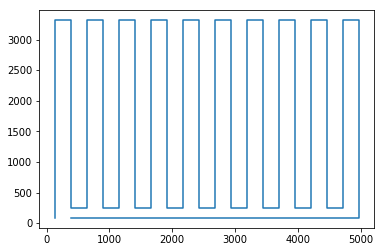

In [254]:
plt.plot(new_seq['area_center_x'], new_seq['area_center_y'])
plt.savefig('area_plot.png')

In [255]:
from sklearn.cluster import KMeans
def generate_cluster(data, num_cluster):
    cluster_coord = data[['X','Y']]
    kmeans = KMeans(n_clusters= num_cluster)
    kmeans.fit_transform(cluster_coord)
    cluster = kmeans.labels_
    center = kmeans.cluster_centers_
    return cluster, np.asarray(center)

In [256]:
def generate_cluster_path(centers, area_centers, next_area):
    center_count = len(centers)
    permutations = list(itertools.permutations(range(center_count)))
    permutations = np.asarray(permutations)
    start_coord_x = cities[cities['CityId']==predicted_sequence[-1]]['X']
    start_coord_y = cities[cities['CityId']==predicted_sequence[-1]]['Y']
    start_coord = [start_coord_x, start_coord_y]
    next_area_center = np.asarray(next_area[i+1])
    
    total_dist = []
    sequence = []
    for perm in permutations:
        sequence.append(perm)
        distances = []        
        dist_start = calculateDistance(start_coord[0], start_coord[1], centers[perm[0]][0], centers[perm[0]][1])
        dist_last = calculateDistance(centers[perm[-1]][0], centers[perm[-1]][1], next_area_center[0], next_area_center[1])
        distances.append(dist_start)
        distances.append(dist_last)
        
        for j in range(len(perm)-1):
            dist = calculateDistance(centers[perm[j]][0], centers[perm[j]][1], centers[perm[j+1]][0], centers[perm[j+1]][1])
            distances.append(dist)
        total_dist.append(np.sum(distances))
        
    min_lenght = np.asarray(total_dist).min()  
    best_seq = np.asarray(sequence)[np.argmin(total_dist)]
    return best_seq  

In [257]:
def selected_path(data, next_area, k):
    total_dist = []
    sequence = []
    permutations = list(itertools.permutations(range(k)))
    permutations = np.asarray(permutations)
    next_area = np.asarray(next_area['CityId'])
    
    for cluster_num in clusters_path:
        cluster_group = data[data['cluster']==cluster_num]
        
        for id_num in range(len(cluster_group)):
            start_id = sequence_id[i]
            next_id = sequence_id[i+1]
            x1 = np.asarray(cities[cities['CityId']==predicted_sequence[-1]]['X']).ravel()[0]
            y1 = np.asarray(cities[cities['CityId']==predicted_sequence[-1]]['Y']).ravel()[0]
            x2 = np.asarray(cities[cities['CityId']==perm[i+1]]['X']).ravel()[0]
            y2 = np.asarray(cities[cities['CityId']==perm[i+1]]['Y']).ravel()[0]
            dist = calculateDistance(x1,y1,x2,y2)
        
        tenth_index = []
    for i in range(len()):
        if (len(predicted_sequence)+i)%10 == 0:
            tenth_index.append(i
    
    for perm in permutations:   
        sequence.append(perm)
        distances = []
        start_id = predicted_sequence[-1]
        end_id = random.choice(next_area)
        perm = np.insert(perm, start_id, 0)
        perm = np.append(perm, end_id)
        
        for i in range(len(perm)-1):
            if k > 8 and (i == tenth_index[0] or i == tenth_index[1]) and start_area[start_area['CityId']==start_area['CityId'][i]]['is_prime']==False:
                continue
                
            start_id = sequence_id[i]
            next_id = sequence_id[i+1]
            x1 = np.asarray(cities[cities['CityId']==perm[i]]['X']).ravel()[0]
            y1 = np.asarray(cities[cities['CityId']==perm[i]]['Y']).ravel()[0]
            x2 = np.asarray(cities[cities['CityId']==perm[i+1]]['X']).ravel()[0]
            y2 = np.asarray(cities[cities['CityId']==perm[i+1]]['Y']).ravel()[0]
            dist = calculateDistance(x1,y1,x2,y2)
            
            if (i == tenth_index[0] or i == tenth_index[1]) and start_area[start_area['CityId']==start_area['CityId'][i]]['is_prime']==False:
                dist = dist*1.1
            else:
                dist = dist
            distances.append(dist)
        total_dist.append(np.sum(distances))
        
    min_lenght = np.asarray(total_dist).min()  
    best_seq = np.asarray(sequence)[np.argmin(total_dist)]
    
    city_id_seq = []
    for i in best_seq:
        city_id_match = start_area['CityId'][i]
        city_id_seq.append(city_id_match)
        
    return min_lenght, city_id_seq

SyntaxError: invalid syntax (<ipython-input-257-12559fc118b4>, line 25)

In [55]:
predicted_sequence = [0]
for area_num in range(len(seq1)-1):
    start_area = cities[cities['main_area']==seq1[area_num]]
    next_area = cities[cities['main_area']==seq1[area_num+1]]
    
    clusters, centers = generate_cluster(start_area, 8)   
    start_area['cluster'] = clusters
    cluster_path = generate_cluster_path(centers, area_centers, seq1)
    distance, sequence = selected_path(start_area, next_area, k)
    predicted_sequence.append(sequence)

predicted_sequence = np.asarray(predicted_sequence).ravel()

KeyboardInterrupt: 

In [258]:
predicted_sequence = [0]
start_area = cities[cities['main_area']==0]
next_area = cities[cities['main_area']==1]
clusters, centers = generate_cluster(start_area, 8)   
start_area['cluster'] = clusters
cluster_path = generate_cluster_path(centers, area_centers, seq1)

C:\Users\fajanilanNB\AppData\Local\Continuum\Anaconda3.5\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [259]:
cluster_path

array([0, 1, 2, 5, 7, 3, 6, 4])

In [260]:
center_seq = []
for i in cluster_path:
    center_seq.append(centers[i])

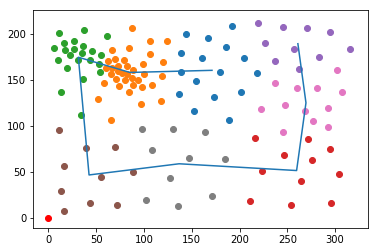

In [261]:
for i in range(8):
    cluster_group = start_area[start_area['cluster']==i]
    plt.scatter(cluster_group['X'], cluster_group['Y'])
    
x = [x[0] for x in center_seq]
y = [x[1] for x in center_seq]

plt.plot(0,0,'ro')
plt.plot(x,y)

In [ ]:
predicted_sequence = np.append(predicted_sequence, 0)
print(len(np.unique(predicted_sequence)))
predicted_dist = calculate_total_distance(predicted_sequence)
my_submission = pd.DataFrame()
my_submission['Path'] = predicted_sequence
my_submission.to_csv('my_submission1.csv', index=None)

In [345]:
x = generate_random_num(100, 1, 100)
y = generate_random_num(100, 1, 100)
data = np.concatenate((x,y), axis = 1)
end_point = np.asarray(data[0]).reshape(1,2)
data = np.concatenate((data,end_point), axis = 0)

x1 = [x[0] for x in data]
y1 = [x[1] for x in data]

initial_seq = np.arange(0,101,1)
initial_seq = np.append(initial_seq, 0)

In [383]:
for i in range(1000):
    k = 5
    forward_sequence = batch_sequence_update(initial_seq, data, k)
    reversed_sequence = forward_sequence[::-1]
    backward_sequence = batch_sequence_update(reversed_sequence, data, k)
    initial_seq = backward_sequence[::-1]
    
    new_data = []
    for i in initial_seq:
        new_data.append(data[i])
        
    x2 = [x[0] for x in new_data]
    y2 = [x[1] for x in new_data]
    
    plt.figure(figsize=(5,5))
    for i in range(len(data)):
        plt.scatter(data[i][0], data[i][1])
    
    plt.plot(x2, y2)
    plt.scatter(data[0][0], data[0][1], s = 500)  

IndexError: index 142193 is out of bounds for axis 0 with size 101

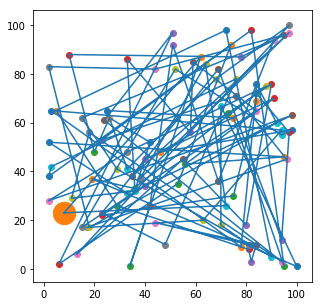

In [327]:
plt.figure(figsize=(5,5))
for i in range(len(data)):
    plt.scatter(data[i][0], data[i][1])
    
plt.plot(x1, y1)
plt.scatter(data[0][0], data[0][1], s = 500)

In [381]:
def batch_sequence_update(initial_seq, data, k):
    new_seq = [0]
    batch_total = int(len(initial_seq)/k)

    for i in range(batch_total):
        start_num = len(updated_seq)
        remaining_id = len(np.asarray(initial_seq[start_num:]))
    
        if remaining_id <= k:
            batch_ids = np.asarray(initial_seq[start_num:-1])
            k = remaining_id-1
        else:
            batch_ids = np.asarray(initial_seq[start_num:start_num+k])
            k = k
        
        batch_seq = shuffle_batch(batch_ids, data, new_seq, k)
        new_seq.append(batch_seq)
        if remaining_id <= k:
            break
            
    updated_seq1 = updated_seq[1:]
    updated_seq1 = np.asarray(updated_seq1).ravel()
    updated_seq1 = np.append(updated_seq1, 0)
    updated_seq1 = np.insert(updated_seq1, 0, 0)
    return updated_seq1

In [371]:
batch_ids = np.asarray(initial_seq[1:6])
batch_coord = []
for ids in batch_ids:
    batch_coord.append(data[ids])
    
batch_coord[3][0]

65

In [378]:
permutations = list(itertools.permutations(range(k)))
permutations = np.asarray(permutations)
perm = permutations[0]
dist_start = calculateDistance(start_coord[0], start_coord[1], batch_coord[perm[-1]][0], batch_coord[perm[-1]][1])
dist_start

18.439088914585774

In [382]:
import random
import itertools
def shuffle_batch(batch_id, data, new_seq, k):
    permutations = list(itertools.permutations(range(k)))
    permutations = np.asarray(permutations)
    
    start_coord = data[new_seq[-1]]
    next_batch_coord = data[initial_seq[len(new_seq)+k+1]]

    batch_coord = []
    for ids in batch_ids:
        batch_coord.append(data[ids])
    
    total_distance = []
    shuffled_sequence = []
    
    for perm in permutations:
        shuffled_sequence.append(perm)
        distances = []  
        #dist_start = calculateDistance(start_coord[0], start_coord[1], batch_coord[perm[0]][0], batch_coord[perm[0]][1])
        #dist_last = calculateDistance(batch_coord[perm[-1]][0], batch_coord[perm[-1]][1], next_batch_coord[0], next_batch_coord[1])
        #distances.append(dist_start)
        #distances.append(dist_last)

        for j in range(len(perm)-1):       
            dist = calculateDistance(batch_coord[perm[j]][0], batch_coord[perm[j]][1], batch_coord[perm[j+1]][0], batch_coord[perm[j+1]][1])
            distances.append(dist)
        total_distance.append(np.sum(distances))
        
    min_lenght = np.asarray(total_distance).min()  
    best_seq = np.asarray(shuffled_sequence)[np.argmin(total_distance)]
    
    id_seq = []
    for i in best_seq:
        id_match = batch_id[i]
        id_seq.append(id_match)
    
    return id_seq

In [372]:
def calculateDistance(x1,y1,x2,y2):
    dist =np.sqrt((x2-x1)**2 + (y2-y1)**2)
    return dist